# Imports & dataset loading

In [1]:
from cancerclassification.data import *
from cancerclassification.nn import *
from cancerclassification.swav import *

from sklearn.metrics import accuracy_score
import torch.optim as optim

import seaborn as sns

%env CUDA_VISIBLE_DEVICES=0

env: CUDA_VISIBLE_DEVICES=0


In [2]:
device = (
    "cuda:0" if torch.cuda.is_available() else "cpu"
)  # 0 indicates the GPU you gonna use
print(f"Using {device} device")

Using cuda:0 device


In [3]:
dataset = read_data_TCGA_preprocessed()
idx = generate_indices(dataset)
cancer_dataset = CancerDatasetTCGA(dataset[:, 1:], dataset[:, 0], device)
dataloaders = get_dataloaders(cancer_dataset, idx, [256, 256, 256])
input_dim = dataloaders[0].dataset.inputs.shape[1] # 57387
output_dim = dataloaders[0].dataset.labels.unique().shape[0] # 20
w = compute_loss_weights(dataset, device)

9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset


In [9]:
dataset.shape

(9352, 57388)

In [4]:
# Draft

In [5]:
name = "demo_baseline_tcga"
logger = LogResults(name, ["prop"])

steps = (
    list(np.arange(0.01, 0.05, 0.001))
    + list(np.arange(0.05, 0.14, 0.005))
    + list(np.arange(0.14, 0.30, 0.01))
    + list(np.arange(0.65, 1.05, 0.05))
)

for i in range(50):
    for prop in steps:
        logger.update_hyps([prop])
        
        # Finetuning and evaluation
        
        idx = generate_indices(dataset, prop=prop)
        base_bs = 256
        margin = 0.5
        bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))
        dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])
        
        config_nn = {
            "epochs": 200,
            "lr_init": 0.0004,
            "early_stop": 5,
        }
        
        net = Net(input_dim, output_dim).to(device)
        train_nn(config_nn, dataloaders, net, weights=None, early_stop=config_nn["early_stop"], log=False, logger=logger)
        logger.next_run()
        logger.show_progression()
            
    logger.save_csv()

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1, below are the last 5 epochs :
       id epoch   val_acc  val_loss  test_acc  test_loss  prop
19  run-0    19  0.804704  1.922299  0.778332   1.959585  0.01
20  run-0    20  0.799715  1.894838  0.789024   1.930855  0.01
21  run-0    21  0.800428  1.856888  0.788311   1.897545  0.01
22  run-0    22  0.804704  1.815310  0.788311   1.862575  0.01
23  run-0    23  0.806130  1.790699  0.791162   1.832797  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2, below are the last 5 epochs :
       id epoch   val_acc  val_loss  test_acc  test_loss   prop
53  run-1    29  0.814683  1.557509  0.786172   1.632268  0.011
54  run-1    30  0.818959  1.533816  0.784034   1.610996  0.011
55  run-1    31  0.816108  1.512990  0.783321   1.590873  0.011
56  run-1    32  0.816108  1.494771  0.791162   1.


Iteration 16, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss   prop
431  run-15    21  0.873842  1.394325  0.868852   1.422590  0.025
432  run-15    22  0.868140  1.331558  0.875980   1.383365  0.025
433  run-15    23  0.868140  1.297528  0.869565   1.346991  0.025
434  run-15    24  0.867427  1.264625  0.872416   1.304282  0.025
435  run-15    25  0.872416  1.211911  0.872416   1.268860  0.025
9352 elements in the dataset
171 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 17, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss   prop
449  run-16    13  0.865289  1.846040  0.859587   1.862008  0.026
450  run-16    14  0.864576  1.765703  0.862438   1.806974  0.026
451  run-16    15  0.868140  1.706920  0.861725   1.740623  0.026
452  run-16    16  0.863863  1.633375  0.864576   1.674298  0.026
453  run-16    17  0.867427  1.608219  0.864576   1.664827  0.026
935


Iteration 31, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  prop
799  run-30    18  0.897363  0.853075  0.907341   0.880888  0.04
800  run-30    19  0.898076  0.862735  0.901639   0.996862  0.04
801  run-30    20  0.897363  0.976229  0.903778   0.919116  0.04
802  run-30    21  0.893799  0.794109  0.902352   0.827309  0.04
803  run-30    22  0.895937  0.763920  0.903065   0.837604  0.04
9352 elements in the dataset
269 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 32, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss   prop
821  run-31    17  0.896650  0.897236  0.900927   0.934434  0.041
822  run-31    18  0.898788  0.862797  0.902352   0.900251  0.041
823  run-31    19  0.896650  0.837002  0.896650   0.873316  0.041
824  run-31    20  0.896650  0.807592  0.900927   0.844024  0.041
825  run-31    21  0.898788  0.787445  0.898788   0.822640  0.041
9352 elem


Iteration 46, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   prop
1137  run-45    17  0.930150  0.696171  0.926586   0.754128  0.075
1138  run-45    18  0.927299  0.682386  0.924448   0.717336  0.075
1139  run-45    19  0.928724  0.643461  0.925873   0.683213  0.075
1140  run-45    20  0.929437  0.628254  0.926586   0.647522  0.075
1141  run-45    21  0.927299  0.587522  0.928724   0.621707  0.075
9352 elements in the dataset
523 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 47, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop
1161  run-46    19  0.928724  0.511578  0.931575   0.544289  0.08
1162  run-46    20  0.929437  0.490550  0.930150   0.526805  0.08
1163  run-46    21  0.923735  0.482776  0.928011   0.511526  0.08
1164  run-46    22  0.929437  0.468003  0.926586   0.507921  0.08
1165  run-46    23  0.925873  0.457630  0.928724   0.494559  0.


Iteration 61, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop
1439  run-60    18  0.953671  0.324580  0.938703   0.360770  0.16
1440  run-60    19  0.947969  0.295893  0.942979   0.347081  0.16
1441  run-60    20  0.950107  0.289971  0.937990   0.371112  0.16
1442  run-60    21  0.955809  0.287313  0.942979   0.327474  0.16
1443  run-60    22  0.950107  0.331514  0.938703   0.337580  0.16
9352 elements in the dataset
1114 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 62, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop
1459  run-61    15  0.950107  0.385845  0.937277   0.420188  0.17
1460  run-61    16  0.951532  0.380262  0.942267   0.417542  0.17
1461  run-61    17  0.951532  0.367063  0.943692   0.399710  0.17
1462  run-61    18  0.948681  0.342973  0.943692   0.384882  0.17
1463  run-61    19  0.952958  0.332934  0.945830   0.365247  0.17
93


Iteration 76, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop
1678  run-75     7  0.965788  0.189985  0.959373   0.224976   0.7
1679  run-75     8  0.966500  0.181518  0.957234   0.211896   0.7
1680  run-75     9  0.966500  0.161953  0.956522   0.202015   0.7
1681  run-75    10  0.965788  0.155913  0.957234   0.194762   0.7
1682  run-75    11  0.965788  0.156128  0.958660   0.192140   0.7
9352 elements in the dataset
4912 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 77, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop
1690  run-76     7  0.967213  0.184703  0.958660   0.228597  0.75
1691  run-76     8  0.965788  0.173101  0.960086   0.215520  0.75
1692  run-76     9  0.966500  0.161877  0.959373   0.200608  0.75
1693  run-76    10  0.967213  0.151665  0.960086   0.197303  0.75
1694  run-76    11  0.967926  0.147803  0.957234   0.197531  0.75
93


Iteration 91, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   prop
1995  run-90    12  0.842480  1.973769  0.831789   2.024778  0.018
1996  run-90    13  0.837491  1.925284  0.836778   1.977828  0.018
1997  run-90    14  0.842480  1.876390  0.832502   1.929722  0.018
1998  run-90    15  0.843193  1.826939  0.835353   1.881632  0.018
1999  run-90    16  0.841055  1.777122  0.840342   1.833161  0.018
9352 elements in the dataset
124 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 92, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   prop
2019  run-91    19  0.854597  1.590536  0.857448   1.641783  0.019
2020  run-91    20  0.859587  1.539882  0.867427   1.598053  0.019
2021  run-91    21  0.856736  1.502663  0.864576   1.554133  0.019
2022  run-91    22  0.858161  1.458356  0.865289   1.516150  0.019
2023  run-91    23  0.856736  1.415909  0.867427   1.47466


Iteration 106, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
2434  run-105    39  0.883108  0.831288  0.885959   0.865160  0.033
2435  run-105    40  0.886671  0.802713  0.885959   0.847663  0.033
2436  run-105    41  0.891661  0.806527  0.885246   0.849874  0.033
2437  run-105    42  0.885959  0.798004  0.888810   0.851780  0.033
2438  run-105    43  0.885246  0.773314  0.885246   0.830520  0.033
9352 elements in the dataset
223 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 107, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
2457  run-106    18  0.883820  1.503229  0.889522   1.533041  0.034
2458  run-106    19  0.884533  1.402150  0.893086   1.444662  0.034
2459  run-106    20  0.885246  1.392833  0.890948   1.416822  0.034
2460  run-106    21  0.885959  1.325774  0.890948   1.366978  0.034
2461  run-106    22  0.885246  1.280620  0.89


Iteration 121, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
2768  run-120    14  0.903065  0.946682  0.904490   0.992557  0.048
2769  run-120    15  0.901639  0.899561  0.905203   0.940722  0.048
2770  run-120    16  0.902352  0.854536  0.909480   0.893311  0.048
2771  run-120    17  0.901639  0.818310  0.908054   0.865253  0.048
2772  run-120    18  0.903778  0.786028  0.905916   0.827316  0.048
9352 elements in the dataset
322 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 122, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
2788  run-121    15  0.898788  0.949541  0.903065   0.985081  0.049
2789  run-121    16  0.904490  0.890129  0.900214   0.935323  0.049
2790  run-121    17  0.895937  0.857667  0.902352   0.893575  0.049
2791  run-121    18  0.902352  0.808864  0.904490   0.858637  0.049
2792  run-121    19  0.903065  0.782965  0.89


Iteration 136, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
3107  run-135    12  0.940128  0.603568  0.932288   0.639313  0.115
3108  run-135    13  0.941554  0.563120  0.932288   0.599859  0.115
3109  run-135    14  0.939416  0.530016  0.932288   0.574340  0.115
3110  run-135    15  0.940841  0.507381  0.937277   0.539027  0.115
3111  run-135    16  0.941554  0.484758  0.930150   0.519696  0.115
9352 elements in the dataset
784 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 137, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
3123  run-136    11  0.937277  0.590096  0.932288   0.598621  0.12
3124  run-136    12  0.941554  0.550491  0.931575   0.568394  0.12
3125  run-136    13  0.937990  0.510240  0.933713   0.555360  0.12
3126  run-136    14  0.942267  0.483028  0.933001   0.525621  0.12
3127  run-136    15  0.941554  0.478945  0.933001 


Iteration 151, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
3372  run-150    10  0.952958  0.327821  0.947256   0.365335  0.24
3373  run-150    11  0.952958  0.313191  0.947256   0.349268  0.24
3374  run-150    12  0.952245  0.299177  0.949394   0.333144  0.24
3375  run-150    13  0.954383  0.280408  0.951532   0.317215  0.24
3376  run-150    14  0.953671  0.272674  0.951532   0.306796  0.24
9352 elements in the dataset
1639 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 152, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
3386  run-151     9  0.958660  0.356149  0.950107   0.386930  0.25
3387  run-151    10  0.959373  0.326010  0.951532   0.356358  0.25
3388  run-151    11  0.955809  0.313263  0.950820   0.344921  0.25
3389  run-151    12  0.957234  0.294020  0.947969   0.332525  0.25
3390  run-151    13  0.950820  0.282543  0.950820   0.3


Iteration 166, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
3627  run-165    27  0.821098  1.590984  0.816821   1.647774  0.011
3628  run-165    28  0.818247  1.561853  0.815396   1.622079  0.011
3629  run-165    29  0.828225  1.536380  0.813970   1.595997  0.011
3630  run-165    30  0.827512  1.509379  0.815396   1.573405  0.011
3631  run-165    31  0.822523  1.488339  0.813970   1.549528  0.011
9352 elements in the dataset
77 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 167, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
3654  run-166    22  0.824661  1.706524  0.808981   1.773079  0.012
3655  run-166    23  0.830364  1.697339  0.808268   1.737795  0.012
3656  run-166    24  0.821098  1.670410  0.809694   1.700389  0.012
3657  run-166    25  0.824661  1.640665  0.810406   1.680767  0.012
3658  run-166    26  0.825374  1.584727  0.813


Iteration 181, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
4000  run-180    20  0.876693  1.469216  0.869565   1.485882  0.026
4001  run-180    21  0.878118  1.383729  0.869565   1.513985  0.026
4002  run-180    22  0.878831  1.355935  0.868140   1.408826  0.026
4003  run-180    23  0.880257  1.326501  0.868852   1.379997  0.026
4004  run-180    24  0.878118  1.290541  0.868140   1.342839  0.026
9352 elements in the dataset
178 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 182, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
4020  run-181    15  0.880257  1.702445  0.875267   1.737749  0.027
4021  run-181    16  0.875980  1.645537  0.878118   1.681373  0.027
4022  run-181    17  0.878118  1.589627  0.880257   1.626823  0.027
4023  run-181    18  0.878118  1.534575  0.878831   1.571535  0.027
4024  run-181    19  0.880257  1.481204  0.87


Iteration 196, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
4375  run-195    16  0.893086  0.965280  0.893086   1.006158  0.041
4376  run-195    17  0.899501  0.923236  0.900927   0.964536  0.041
4377  run-195    18  0.899501  0.884147  0.898076   0.926962  0.041
4378  run-195    19  0.896650  0.851140  0.898788   0.892842  0.041
4379  run-195    20  0.895937  0.824545  0.900214   0.861712  0.041
9352 elements in the dataset
276 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 197, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
4391  run-196    11  0.885959  1.276430  0.892373   1.321004  0.042
4392  run-196    12  0.891661  1.190275  0.892373   1.229536  0.042
4393  run-196    13  0.891661  1.106318  0.894512   1.153432  0.042
4394  run-196    14  0.889522  1.039478  0.893086   1.082959  0.042
4395  run-196    15  0.891661  0.976772  0.89


Iteration 211, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
4706  run-210    28  0.930862  0.415595  0.922309   0.451310  0.08
4707  run-210    29  0.928724  0.406666  0.929437   0.443819  0.08
4708  run-210    30  0.933713  0.403053  0.929437   0.441261  0.08
4709  run-210    31  0.933001  0.396115  0.930862   0.436181  0.08
4710  run-210    32  0.930150  0.387327  0.924448   0.424323  0.08
9352 elements in the dataset
556 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 212, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
4732  run-211    21  0.936565  0.460878  0.925160   0.500066  0.085
4733  run-211    22  0.933713  0.453032  0.925160   0.494270  0.085
4734  run-211    23  0.937277  0.446101  0.925873   0.488288  0.085
4735  run-211    24  0.931575  0.434085  0.929437   0.487284  0.085
4736  run-211    25  0.934426  0.430608  0.922309  


Iteration 226, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
5064  run-225    25  0.955096  0.279525  0.945830   0.307666  0.17
5065  run-225    26  0.953671  0.277360  0.945830   0.306190  0.17
5066  run-225    27  0.952958  0.269272  0.942267   0.306540  0.17
5067  run-225    28  0.954383  0.260748  0.946543   0.298342  0.17
5068  run-225    29  0.950107  0.261372  0.945830   0.298892  0.17
9352 elements in the dataset
1181 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 227, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
5080  run-226    11  0.955096  0.404960  0.941554   0.453685  0.18
5081  run-226    12  0.954383  0.389231  0.940841   0.437275  0.18
5082  run-226    13  0.950820  0.366064  0.944405   0.396775  0.18
5083  run-226    14  0.953671  0.359493  0.945830   0.401224  0.18
5084  run-226    15  0.955809  0.357790  0.943692   0.4


Iteration 241, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
5305  run-240     9  0.968639  0.164892  0.959373   0.215814  0.75
5306  run-240    10  0.970064  0.162054  0.957947   0.210048  0.75
5307  run-240    11  0.969351  0.152088  0.960798   0.201367  0.75
5308  run-240    12  0.969351  0.142940  0.960798   0.195958  0.75
5309  run-240    13  0.969351  0.142947  0.961511   0.193321  0.75
9352 elements in the dataset
5237 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 242, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
5317  run-241     7  0.967926  0.186627  0.955096   0.230758   0.8
5318  run-241     8  0.967213  0.168992  0.958660   0.224999   0.8
5319  run-241     9  0.967213  0.193192  0.956522   0.234897   0.8
5320  run-241    10  0.967926  0.165854  0.960798   0.227658   0.8
5321  run-241    11  0.965788  0.149710  0.962224   0.2


Iteration 256, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
5598  run-255    14  0.859587  1.830855  0.854597   1.871897  0.019
5599  run-255    15  0.856736  1.780116  0.855310   1.830911  0.019
5600  run-255    16  0.861012  1.737376  0.854597   1.785746  0.019
5601  run-255    17  0.859587  1.686695  0.858874   1.740295  0.019
5602  run-255    18  0.863150  1.639475  0.856736   1.687592  0.019
9352 elements in the dataset
131 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 257, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
5616  run-256    13  0.861725  1.928790  0.846757   1.984974  0.02
5617  run-256    14  0.858874  1.884374  0.845331   1.924241  0.02
5618  run-256    15  0.858161  1.814071  0.852459   1.869908  0.02
5619  run-256    16  0.863150  1.787515  0.853172   1.831265  0.02
5620  run-256    17  0.861012  1.719276  0.855310 


Iteration 271, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
5978  run-270    14  0.878118  1.695725  0.883820   1.724635  0.034
5979  run-270    15  0.878118  1.603422  0.883820   1.648406  0.034
5980  run-270    16  0.878118  1.568386  0.884533   1.622260  0.034
5981  run-270    17  0.880257  1.538633  0.885959   1.553391  0.034
5982  run-270    18  0.880257  1.456827  0.888097   1.527442  0.034
9352 elements in the dataset
228 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 272, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
6002  run-271    19  0.882395  1.494384  0.879544   1.529881  0.035
6003  run-271    20  0.883820  1.444528  0.879544   1.502115  0.035
6004  run-271    21  0.887384  1.392562  0.881682   1.455547  0.035
6005  run-271    22  0.884533  1.307167  0.880969   1.367722  0.035
6006  run-271    23  0.886671  1.260150  0.88


Iteration 286, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
6323  run-285    14  0.903065  1.005261  0.902352   1.053871  0.049
6324  run-285    15  0.899501  0.954828  0.905203   1.004667  0.049
6325  run-285    16  0.900927  0.897973  0.903778   0.959417  0.049
6326  run-285    17  0.897363  0.869614  0.900214   0.913822  0.049
6327  run-285    18  0.898788  0.833331  0.899501   0.885789  0.049
9352 elements in the dataset
326 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 287, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
6356  run-286    28  0.903065  0.625136  0.900214   0.673051  0.05
6357  run-286    29  0.900927  0.611280  0.902352   0.665231  0.05
6358  run-286    30  0.906629  0.599608  0.904490   0.654122  0.05
6359  run-286    31  0.905203  0.603554  0.900214   0.661288  0.05
6360  run-286    32  0.904490  0.587444  0.904490 


Iteration 301, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
6699  run-300    21  0.955096  0.423225  0.933001   0.456420  0.12
6700  run-300    22  0.954383  0.402511  0.932288   0.450731  0.12
6701  run-300    23  0.952958  0.396988  0.933713   0.425066  0.12
6702  run-300    24  0.956522  0.395114  0.933713   0.444082  0.12
6703  run-300    25  0.951532  0.372915  0.933713   0.420085  0.12
9352 elements in the dataset
815 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 302, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
6716  run-301    12  0.937990  0.539462  0.933001   0.539150  0.125
6717  run-301    13  0.942267  0.503760  0.935139   0.641479  0.125
6718  run-301    14  0.941554  0.489154  0.933001   0.529300  0.125
6719  run-301    15  0.941554  0.470646  0.934426   0.500304  0.125
6720  run-301    16  0.940128  0.407371  0.937990  


Iteration 316, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
6955  run-315     7  0.960086  0.533364  0.945830   0.587186  0.25
6956  run-315     8  0.957947  0.474294  0.944405   0.523383  0.25
6957  run-315     9  0.957234  0.431290  0.945118   0.472917  0.25
6958  run-315    10  0.957947  0.391461  0.946543   0.428540  0.25
6959  run-315    11  0.955096  0.355437  0.942979   0.395084  0.25
9352 elements in the dataset
1702 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 317, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
6969  run-316     9  0.955809  0.347109  0.950820   0.389318  0.26
6970  run-316    10  0.955809  0.321437  0.949394   0.384252  0.26
6971  run-316    11  0.953671  0.302955  0.946543   0.337884  0.26
6972  run-316    12  0.955809  0.297835  0.945830   0.326794  0.26
6973  run-316    13  0.952245  0.281430  0.947969   0.3


Iteration 331, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
7193  run-330    13  0.818247  2.084426  0.799002   2.119721  0.012
7194  run-330    14  0.808268  2.022213  0.794013   2.084775  0.012
7195  run-330    15  0.816108  1.983597  0.801853   2.042300  0.012
7196  run-330    16  0.813970  1.937505  0.798289   1.990517  0.012
7197  run-330    17  0.817534  1.889506  0.800428   1.966510  0.012
9352 elements in the dataset
84 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 332, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
7218  run-331    20  0.833215  1.656710  0.814683   1.714632  0.013
7219  run-331    21  0.835353  1.613345  0.817534   1.665050  0.013
7220  run-331    22  0.832502  1.577653  0.818959   1.638755  0.013
7221  run-331    23  0.833215  1.544626  0.816821   1.592483  0.013
7222  run-331    24  0.833927  1.517769  0.817


Iteration 346, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
7558  run-345    22  0.873129  1.411036  0.873842   1.451054  0.027
7559  run-345    23  0.872416  1.363501  0.875267   1.405985  0.027
7560  run-345    24  0.875980  1.318547  0.871703   1.361981  0.027
7561  run-345    25  0.873129  1.276426  0.878118   1.319176  0.027
7562  run-345    26  0.873129  1.236406  0.873842   1.279210  0.027
9352 elements in the dataset
183 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 347, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
7581  run-346    18  0.886671  1.534532  0.877406   1.583577  0.028
7582  run-346    19  0.884533  1.479274  0.880257   1.530677  0.028
7583  run-346    20  0.885959  1.428678  0.885246   1.477664  0.028
7584  run-346    21  0.887384  1.377998  0.881682   1.428164  0.028
7585  run-346    22  0.888097  1.329456  0.88


Iteration 361, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
7962  run-360    21  0.899501  0.785807  0.899501   0.821999  0.042
7963  run-360    22  0.898788  0.776216  0.905916   0.809366  0.042
7964  run-360    23  0.899501  0.752908  0.895937   0.795082  0.042
7965  run-360    24  0.900214  0.733574  0.900927   0.766434  0.042
7966  run-360    25  0.899501  0.723247  0.905203   0.753567  0.042
9352 elements in the dataset
280 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 362, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
7986  run-361    19  0.899501  0.836701  0.903778   0.876019  0.043
7987  run-361    20  0.898076  0.806561  0.900927   0.846360  0.043
7988  run-361    21  0.898076  0.785548  0.898788   0.827112  0.043
7989  run-361    22  0.893086  0.760349  0.905203   0.812757  0.043
7990  run-361    23  0.891661  0.744104  0.90


Iteration 376, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
8279  run-375    17  0.933001  0.530849  0.923022   0.568020  0.085
8280  run-375    18  0.930862  0.507447  0.924448   0.548115  0.085
8281  run-375    19  0.929437  0.490568  0.928724   0.523114  0.085
8282  run-375    20  0.933713  0.488120  0.928011   0.516180  0.085
8283  run-375    21  0.933001  0.460495  0.927299   0.505553  0.085
9352 elements in the dataset
590 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 377, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
8306  run-376    22  0.930150  0.439248  0.933713   0.474481  0.09
8307  run-376    23  0.933713  0.431170  0.933001   0.467268  0.09
8308  run-376    24  0.936565  0.423438  0.933001   0.458718  0.09
8309  run-376    25  0.937277  0.415547  0.933713   0.450742  0.09
8310  run-376    26  0.936565  0.408262  0.933713 


Iteration 391, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
8611  run-390    11  0.956522  0.441625  0.940128   0.474602  0.18
8612  run-390    12  0.955096  0.408231  0.945830   0.467980  0.18
8613  run-390    13  0.955809  0.390728  0.940128   0.425176  0.18
8614  run-390    14  0.955096  0.377132  0.941554   0.417059  0.18
8615  run-390    15  0.953671  0.364367  0.941554   0.409819  0.18
9352 elements in the dataset
1244 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 392, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
8628  run-391    12  0.950107  0.405962  0.947256   0.483141  0.19
8629  run-391    13  0.955096  0.379071  0.945118   0.424074  0.19
8630  run-391    14  0.953671  0.361300  0.945830   0.409026  0.19
8631  run-391    15  0.949394  0.323739  0.944405   0.376045  0.19
8632  run-391    16  0.952245  0.359927  0.943692   0.3


Iteration 406, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
8842  run-405     7  0.966500  0.184744  0.962937   0.227629   0.8
8843  run-405     8  0.964362  0.183409  0.962937   0.217959   0.8
8844  run-405     9  0.965788  0.204057  0.955096   0.242916   0.8
8845  run-405    10  0.965075  0.176584  0.961511   0.214523   0.8
8846  run-405    11  0.967926  0.157909  0.962937   0.195984   0.8
9352 elements in the dataset
5564 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 407, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
8858  run-406    11  0.967213  0.136700  0.960798   0.182714  0.85
8859  run-406    12  0.967213  0.132098  0.965075   0.172168  0.85
8860  run-406    13  0.967926  0.131217  0.961511   0.166237  0.85
8861  run-406    14  0.965788  0.138086  0.964362   0.183363  0.85
8862  run-406    15  0.964362  0.127794  0.964362   0.1


Iteration 421, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
9176  run-420    20  0.865289  1.532159  0.851033   1.575484  0.02
9177  run-420    21  0.866714  1.486678  0.848895   1.538705  0.02
9178  run-420    22  0.863863  1.457028  0.853172   1.516647  0.02
9179  run-420    23  0.868140  1.414882  0.856023   1.466799  0.02
9180  run-420    24  0.870278  1.378704  0.858161   1.426973  0.02
9352 elements in the dataset
137 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 422, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
9205  run-421    24  0.853885  1.300489  0.847470   1.367549  0.021
9206  run-421    25  0.857448  1.306932  0.845331   1.353090  0.021
9207  run-421    26  0.858874  1.237898  0.849608   1.313700  0.021
9208  run-421    27  0.854597  1.198164  0.843193   1.290761  0.021
9209  run-421    28  0.858161  1.144843  0.847470  


Iteration 436, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
9603  run-435    22  0.883108  1.308362  0.888097   1.362685  0.035
9604  run-435    23  0.885246  1.270860  0.888097   1.302401  0.035
9605  run-435    24  0.883820  1.193648  0.890235   1.241880  0.035
9606  run-435    25  0.884533  1.158412  0.889522   1.226625  0.035
9607  run-435    26  0.883108  1.125796  0.889522   1.148634  0.035
9352 elements in the dataset
235 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 437, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
9638  run-436    30  0.889522  0.967569  0.890948   1.009675  0.036
9639  run-436    31  0.893086  0.939275  0.889522   0.980756  0.036
9640  run-436    32  0.891661  0.913291  0.890948   0.954740  0.036
9641  run-436    33  0.888810  0.890072  0.890235   0.931469  0.036
9642  run-436    34  0.892373  0.869034  0.89


Iteration 451, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  prop
9943  run-450    21  0.903065  0.721367  0.900214   0.760476  0.05
9944  run-450    22  0.903778  0.693358  0.906629   0.748962  0.05
9945  run-450    23  0.903778  0.682083  0.905203   0.718950  0.05
9946  run-450    24  0.904490  0.657763  0.903065   0.700214  0.05
9947  run-450    25  0.905203  0.654553  0.895225   0.703381  0.05
9352 elements in the dataset
360 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 452, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop
9958  run-451    10  0.905916  1.242845  0.907341   1.290841  0.055
9959  run-451    11  0.905916  1.161175  0.907341   1.210502  0.055
9960  run-451    12  0.905916  1.099311  0.905916   1.147685  0.055
9961  run-451    13  0.908767  1.034322  0.905916   1.076873  0.055
9962  run-451    14  0.907341  0.968603  0.910192  


Iteration 466, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
10272  run-465    18  0.943692  0.481453  0.935139   0.496440  0.125
10273  run-465    19  0.943692  0.447533  0.934426   0.583950  0.125
10274  run-465    20  0.944405  0.446360  0.935139   0.500004  0.125
10275  run-465    21  0.945118  0.415213  0.935139   0.497493  0.125
10276  run-465    22  0.945830  0.424102  0.934426   0.457311  0.125
9352 elements in the dataset
852 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 467, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
10295  run-466    18  0.945830  0.392416  0.939416   0.436252  0.13
10296  run-466    19  0.950820  0.380362  0.937277   0.424603  0.13
10297  run-466    20  0.947969  0.364656  0.934426   0.411086  0.13
10298  run-466    21  0.945830  0.358974  0.940128   0.401730  0.13
10299  run-466    22  0.946543  0.34781


Iteration 481, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
10531  run-480    11  0.951532  0.324456  0.949394   0.345253  0.26
10532  run-480    12  0.955096  0.305109  0.949394   0.331594  0.26
10533  run-480    13  0.954383  0.300104  0.950107   0.333147  0.26
10534  run-480    14  0.955096  0.283413  0.953671   0.308381  0.26
10535  run-480    15  0.951532  0.266876  0.950107   0.307346  0.26
9352 elements in the dataset
1769 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 482, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
10544  run-481     8  0.955096  0.369013  0.952245   0.401020  0.27
10545  run-481     9  0.952245  0.345117  0.946543   0.376830  0.27
10546  run-481    10  0.955096  0.342495  0.949394   0.371162  0.27
10547  run-481    11  0.955809  0.310081  0.948681   0.330349  0.27
10548  run-481    12  0.955809  0.295104  0.


Iteration 496, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
10781  run-495    19  0.823949  1.742942  0.810406   1.805371  0.013
10782  run-495    20  0.820385  1.731973  0.811119   1.759226  0.013
10783  run-495    21  0.821810  1.675453  0.814683   1.726513  0.013
10784  run-495    22  0.825374  1.637568  0.816108   1.698033  0.013
10785  run-495    23  0.823236  1.607272  0.818959   1.664364  0.013
9352 elements in the dataset
92 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 497, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
10809  run-496    23  0.828225  1.617143  0.805417   1.665718  0.014
10810  run-496    24  0.827512  1.583731  0.805417   1.631595  0.014
10811  run-496    25  0.825374  1.541002  0.806130   1.599487  0.014
10812  run-496    26  0.824661  1.511168  0.811832   1.564390  0.014
10813  run-496    27  0.827512  1.4


Iteration 511, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
11180  run-510    18  0.885246  1.607226  0.881682   1.648474  0.028
11181  run-510    19  0.883108  1.555574  0.880257   1.592657  0.028
11182  run-510    20  0.885246  1.500974  0.884533   1.538064  0.028
11183  run-510    21  0.884533  1.446218  0.885959   1.486882  0.028
11184  run-510    22  0.885246  1.393726  0.880969   1.432019  0.028
9352 elements in the dataset
191 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 512, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
11206  run-511    21  0.885246  1.344456  0.885959   1.380149  0.029
11207  run-511    22  0.883820  1.300352  0.888810   1.332374  0.029
11208  run-511    23  0.885959  1.251808  0.887384   1.288451  0.029
11209  run-511    24  0.884533  1.201998  0.891661   1.242961  0.029
11210  run-511    25  0.885959  1.


Iteration 526, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
11575  run-525    20  0.899501  0.779849  0.895937   0.808091  0.043
11576  run-525    21  0.897363  0.754430  0.900927   0.792995  0.043
11577  run-525    22  0.900214  0.743136  0.895225   0.776105  0.043
11578  run-525    23  0.903065  0.721380  0.895225   0.764420  0.043
11579  run-525    24  0.903778  0.704738  0.899501   0.744610  0.043
9352 elements in the dataset
286 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 527, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
11589  run-526     9  0.895225  1.352545  0.898788   1.411380  0.044
11590  run-526    10  0.893799  1.260076  0.903778   1.299997  0.044
11591  run-526    11  0.892373  1.177854  0.897363   1.210359  0.044
11592  run-526    12  0.894512  1.102588  0.897363   1.171673  0.044
11593  run-526    13  0.895937  1.


Iteration 541, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
11930  run-540    22  0.937277  0.435881  0.931575   0.480064  0.09
11931  run-540    23  0.935852  0.427934  0.930862   0.468923  0.09
11932  run-540    24  0.936565  0.420967  0.932288   0.462118  0.09
11933  run-540    25  0.937277  0.414791  0.929437   0.455634  0.09
11934  run-540    26  0.938703  0.408128  0.930150   0.450263  0.09
9352 elements in the dataset
622 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 542, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
11952  run-541    17  0.935852  0.512316  0.933713   0.528246  0.095
11953  run-541    18  0.935139  0.499270  0.931575   0.520522  0.095
11954  run-541    19  0.935139  0.480896  0.930150   0.507170  0.095
11955  run-541    20  0.933713  0.465153  0.931575   0.487130  0.095
11956  run-541    21  0.935852  0.453966


Iteration 556, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
12221  run-555    14  0.952958  0.393241  0.943692   0.416461  0.19
12222  run-555    15  0.950820  0.401693  0.940128   0.432746  0.19
12223  run-555    16  0.950820  0.347571  0.944405   0.407244  0.19
12224  run-555    17  0.951532  0.367161  0.945118   0.396986  0.19
12225  run-555    18  0.951532  0.319852  0.943692   0.376637  0.19
9352 elements in the dataset
1309 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 557, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
12239  run-556    13  0.954383  0.408817  0.945830   0.452614   0.2
12240  run-556    14  0.952958  0.416099  0.946543   0.459217   0.2
12241  run-556    15  0.955096  0.381062  0.947969   0.418442   0.2
12242  run-556    16  0.952245  0.353283  0.948681   0.395303   0.2
12243  run-556    17  0.955809  0.333547  0.


Iteration 571, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
12471  run-570    10  0.970777  0.143834  0.961511   0.189838  0.85
12472  run-570    11  0.970064  0.138009  0.962937   0.185226  0.85
12473  run-570    12  0.970777  0.133949  0.965075   0.175322  0.85
12474  run-570    13  0.969351  0.148235  0.964362   0.191661  0.85
12475  run-570    14  0.970777  0.134114  0.964362   0.176631  0.85
9352 elements in the dataset
5891 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 572, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
12488  run-571    12  0.966500  0.145339  0.962224   0.196975   0.9
12489  run-571    13  0.970064  0.133532  0.961511   0.181121   0.9
12490  run-571    14  0.967213  0.142151  0.958660   0.198695   0.9
12491  run-571    15  0.968639  0.135095  0.960086   0.175524   0.9
12492  run-571    16  0.967926  0.126235  0.


Iteration 586, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
12800  run-585    19  0.863863  1.517035  0.851746   1.580821  0.021
12801  run-585    20  0.861012  1.448463  0.853172   1.551656  0.021
12802  run-585    21  0.864576  1.421659  0.856023   1.499220  0.021
12803  run-585    22  0.862438  1.372347  0.853885   1.442897  0.021
12804  run-585    23  0.861012  1.314402  0.854597   1.383706  0.021
9352 elements in the dataset
144 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 587, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
12829  run-586    24  0.880969  1.337405  0.871703   1.395773  0.022
12830  run-586    25  0.876693  1.303249  0.872416   1.360673  0.022
12831  run-586    26  0.880969  1.263596  0.875980   1.323807  0.022
12832  run-586    27  0.878831  1.232084  0.871703   1.294757  0.022
12833  run-586    28  0.879544  1.


Iteration 601, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
13190  run-600    22  0.890235  1.277638  0.897363   1.317723  0.036
13191  run-600    23  0.889522  1.229384  0.891661   1.270308  0.036
13192  run-600    24  0.889522  1.184073  0.893086   1.225282  0.036
13193  run-600    25  0.890948  1.141577  0.898788   1.183413  0.036
13194  run-600    26  0.888097  1.101787  0.895225   1.143988  0.036
9352 elements in the dataset
244 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 602, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
13213  run-601    18  0.882395  1.465396  0.895225   1.490518  0.037
13214  run-601    19  0.882395  1.409529  0.895225   1.437787  0.037
13215  run-601    20  0.879544  1.356975  0.895225   1.384818  0.037
13216  run-601    21  0.880969  1.309866  0.895937   1.335702  0.037
13217  run-601    22  0.880257  1.


Iteration 616, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
13522  run-615    19  0.916607  0.740029  0.913043   0.781233  0.055
13523  run-615    20  0.918033  0.714012  0.920171   0.754288  0.055
13524  run-615    21  0.916607  0.692088  0.915895   0.737319  0.055
13525  run-615    22  0.913043  0.674535  0.910192   0.717792  0.055
13526  run-615    23  0.913043  0.662052  0.912331   0.704009  0.055
9352 elements in the dataset
394 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 617, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
13551  run-616    24  0.925873  0.635220  0.918033   0.683067  0.06
13552  run-616    25  0.923735  0.610327  0.915182   0.667283  0.06
13553  run-616    26  0.926586  0.610109  0.918033   0.658049  0.06
13554  run-616    27  0.925160  0.590441  0.914469   0.640193  0.06
13555  run-616    28  0.923735  0.58630


Iteration 631, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
13885  run-630    15  0.945118  0.486291  0.937277   0.520448  0.13
13886  run-630    16  0.948681  0.462978  0.942267   0.499233  0.13
13887  run-630    17  0.947969  0.443344  0.937990   0.480462  0.13
13888  run-630    18  0.947256  0.424295  0.934426   0.465076  0.13
13889  run-630    19  0.952958  0.410820  0.936565   0.450422  0.13
9352 elements in the dataset
884 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 632, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
13902  run-631    12  0.950820  0.519362  0.937277   0.566995  0.135
13903  run-631    13  0.950107  0.491778  0.939416   0.534120  0.135
13904  run-631    14  0.947256  0.465523  0.936565   0.508885  0.135
13905  run-631    15  0.951532  0.445282  0.932288   0.488574  0.135
13906  run-631    16  0.951532  0.420360


Iteration 646, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
14155  run-645     8  0.953671  0.392009  0.946543   0.442346  0.27
14156  run-645     9  0.956522  0.356641  0.948681   0.406551  0.27
14157  run-645    10  0.953671  0.339239  0.946543   0.370652  0.27
14158  run-645    11  0.956522  0.316594  0.944405   0.329292  0.27
14159  run-645    12  0.955809  0.286949  0.947256   0.325539  0.27
9352 elements in the dataset
1834 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 647, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
14167  run-646     7  0.952245  0.384205  0.946543   0.421518  0.28
14168  run-646     8  0.957947  0.347606  0.948681   0.392996  0.28
14169  run-646     9  0.956522  0.320692  0.947256   0.364722  0.28
14170  run-646    10  0.957234  0.304408  0.947969   0.344891  0.28
14171  run-646    11  0.957947  0.282521  0.


Iteration 661, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
14441  run-660    21  0.829651  1.626995  0.820385   1.665508  0.014
14442  run-660    22  0.825374  1.585812  0.828225   1.620223  0.014
14443  run-660    23  0.823949  1.555348  0.824661   1.595177  0.014
14444  run-660    24  0.827512  1.511052  0.828225   1.551625  0.014
14445  run-660    25  0.828225  1.478471  0.828225   1.521862  0.014
9352 elements in the dataset
99 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 662, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
14469  run-661    23  0.840342  1.534704  0.831789   1.583068  0.015
14470  run-661    24  0.838204  1.507275  0.831076   1.564674  0.015
14471  run-661    25  0.838917  1.422737  0.832502   1.476008  0.015
14472  run-661    26  0.843193  1.431148  0.833215   1.511020  0.015
14473  run-661    27  0.838917  1.3


Iteration 676, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
14839  run-675    22  0.873842  1.352327  0.880257   1.392597  0.029
14840  run-675    23  0.878118  1.305870  0.878118   1.343965  0.029
14841  run-675    24  0.880257  1.261285  0.877406   1.300184  0.029
14842  run-675    25  0.879544  1.224704  0.879544   1.260736  0.029
14843  run-675    26  0.881682  1.182385  0.879544   1.217668  0.029
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 677, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
14863  run-676    19  0.885959  1.477030  0.885246   1.510815  0.03
14864  run-676    20  0.885246  1.420090  0.890235   1.455680  0.03
14865  run-676    21  0.883108  1.372266  0.888097   1.407712  0.03
14866  run-676    22  0.884533  1.327244  0.891661   1.357480  0.03
14867  run-676    23  0.886671  1.27958


Iteration 691, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
15218  run-690    10  0.896650  1.291032  0.899501   1.327449  0.044
15219  run-690    11  0.894512  1.204658  0.898788   1.242365  0.044
15220  run-690    12  0.895225  1.115008  0.898788   1.172583  0.044
15221  run-690    13  0.893086  1.050265  0.900214   1.103360  0.044
15222  run-690    14  0.898788  1.007785  0.905203   1.038322  0.044
9352 elements in the dataset
296 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 692, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
15235  run-691    12  0.903065  1.141093  0.902352   1.161232  0.045
15236  run-691    13  0.900927  1.049772  0.902352   1.131288  0.045
15237  run-691    14  0.903065  1.019078  0.903778   1.040597  0.045
15238  run-691    15  0.900214  0.932467  0.900214   0.970808  0.045
15239  run-691    16  0.899501  0.


Iteration 706, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
15576  run-705    18  0.941554  0.488837  0.933713   0.522483  0.095
15577  run-705    19  0.940128  0.478382  0.935139   0.504608  0.095
15578  run-705    20  0.937990  0.458763  0.933713   0.492204  0.095
15579  run-705    21  0.940841  0.450380  0.930862   0.486555  0.095
15580  run-705    22  0.940841  0.441009  0.932288   0.471938  0.095
9352 elements in the dataset
655 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 707, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
15598  run-706    17  0.940841  0.519679  0.932288   0.544233   0.1
15599  run-706    18  0.940841  0.497542  0.930862   0.538650   0.1
15600  run-706    19  0.940841  0.481759  0.929437   0.522566   0.1
15601  run-706    20  0.941554  0.455952  0.935139   0.489445   0.1
15602  run-706    21  0.938703  0.43965


Iteration 721, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
15879  run-720    13  0.949394  0.334408  0.947969   0.369236   0.2
15880  run-720    14  0.953671  0.317698  0.946543   0.356379   0.2
15881  run-720    15  0.956522  0.307153  0.947256   0.345079   0.2
15882  run-720    16  0.952958  0.295627  0.946543   0.331748   0.2
15883  run-720    17  0.954383  0.287602  0.945830   0.320578   0.2
9352 elements in the dataset
1375 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 722, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
15894  run-721    10  0.952245  0.404232  0.945830   0.441205  0.21
15895  run-721    11  0.952245  0.383653  0.946543   0.423986  0.21
15896  run-721    12  0.952958  0.365007  0.947256   0.396583  0.21
15897  run-721    13  0.954383  0.344777  0.950820   0.379016  0.21
15898  run-721    14  0.952245  0.335018  0.


Iteration 736, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
16108  run-735     7  0.968639  0.165207  0.960798   0.208866   0.9
16109  run-735     8  0.970064  0.142902  0.961511   0.190568   0.9
16110  run-735     9  0.970064  0.138897  0.966500   0.185989   0.9
16111  run-735    10  0.970777  0.140182  0.963649   0.194028   0.9
16112  run-735    11  0.967213  0.128179  0.964362   0.177760   0.9
9352 elements in the dataset
6220 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 737, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
16122  run-736     9  0.972202  0.146755  0.963649   0.186952  0.95
16123  run-736    10  0.970064  0.145324  0.965788   0.177879  0.95
16124  run-736    11  0.971490  0.130689  0.964362   0.168102  0.95
16125  run-736    12  0.972202  0.126167  0.963649   0.169209  0.95
16126  run-736    13  0.972915  0.134761  0.


Iteration 751, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
16516  run-750    19  0.875980  1.532343  0.869565   1.582340  0.022
16517  run-750    20  0.878118  1.485147  0.871703   1.535147  0.022
16518  run-750    21  0.878831  1.439866  0.870991   1.491570  0.022
16519  run-750    22  0.874555  1.395691  0.865289   1.450277  0.022
16520  run-750    23  0.878831  1.355272  0.870278   1.409666  0.022
9352 elements in the dataset
152 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 752, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
16550  run-751    29  0.881682  1.099937  0.867427   1.162181  0.023
16551  run-751    30  0.879544  1.076617  0.867427   1.133538  0.023
16552  run-751    31  0.878118  1.055713  0.870278   1.107996  0.023
16553  run-751    32  0.875267  1.037725  0.867427   1.084012  0.023
16554  run-751    33  0.873842  1.


Iteration 766, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
16925  run-765    15  0.894512  1.716687  0.892373   1.749781  0.037
16926  run-765    16  0.893086  1.659733  0.890235   1.694700  0.037
16927  run-765    17  0.891661  1.601687  0.893086   1.636150  0.037
16928  run-765    18  0.891661  1.545234  0.891661   1.578813  0.037
16929  run-765    19  0.892373  1.488947  0.895937   1.522985  0.037
9352 elements in the dataset
249 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 767, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
16941  run-766    11  0.879544  1.881663  0.879544   1.918150  0.038
16942  run-766    12  0.881682  1.831036  0.882395   1.866818  0.038
16943  run-766    13  0.879544  1.776682  0.883108   1.818180  0.038
16944  run-766    14  0.880969  1.722939  0.883820   1.762579  0.038
16945  run-766    15  0.882395  1.


Iteration 781, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
17226  run-780    17  0.912331  0.770578  0.915895   0.837790  0.06
17227  run-780    18  0.915895  0.738330  0.918033   0.776451  0.06
17228  run-780    19  0.911618  0.717015  0.913043   0.740808  0.06
17229  run-780    20  0.916607  0.686084  0.915895   0.717079  0.06
17230  run-780    21  0.915895  0.657274  0.918746   0.693138  0.06
9352 elements in the dataset
423 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 782, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
17250  run-781    19  0.916607  0.684836  0.911618   0.732262  0.065
17251  run-781    20  0.918746  0.658703  0.915895   0.706396  0.065
17252  run-781    21  0.918033  0.636134  0.919458   0.684490  0.065
17253  run-781    22  0.917320  0.617609  0.920884   0.665833  0.065
17254  run-781    23  0.920884  0.600747


Iteration 796, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
17558  run-795    21  0.950107  0.440109  0.941554   0.487983  0.135
17559  run-795    22  0.950107  0.422223  0.933713   0.469172  0.135
17560  run-795    23  0.947256  0.405764  0.940128   0.460031  0.135
17561  run-795    24  0.950820  0.392126  0.940841   0.449020  0.135
17562  run-795    25  0.953671  0.382033  0.939416   0.430610  0.135
9352 elements in the dataset
917 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 797, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
17583  run-796    20  0.954383  0.362307  0.935852   0.403588  0.14
17584  run-796    21  0.947969  0.356584  0.930150   0.393893  0.14
17585  run-796    22  0.950820  0.335089  0.936565   0.393241  0.14
17586  run-796    23  0.945118  0.333013  0.934426   0.368825  0.14
17587  run-796    24  0.952958  0.32520


Iteration 811, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
17829  run-810     9  0.955809  0.321312  0.950820   0.359639  0.28
17830  run-810    10  0.952958  0.300328  0.950820   0.339017  0.28
17831  run-810    11  0.953671  0.284156  0.946543   0.322256  0.28
17832  run-810    12  0.957947  0.268318  0.949394   0.312345  0.28
17833  run-810    13  0.957234  0.257581  0.947256   0.295501  0.28
9352 elements in the dataset
1899 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 812, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
17843  run-811     9  0.956522  0.310153  0.948681   0.354235  0.29
17844  run-811    10  0.952958  0.288545  0.946543   0.327905  0.29
17845  run-811    11  0.955809  0.277671  0.948681   0.317776  0.29
17846  run-811    12  0.953671  0.260572  0.946543   0.314509  0.29
17847  run-811    13  0.955096  0.248697  0.


Iteration 826, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
18128  run-825    19  0.851746  1.709950  0.828938   1.800432  0.015
18129  run-825    20  0.853885  1.699317  0.832502   1.748254  0.015
18130  run-825    21  0.848895  1.697637  0.837491   1.686467  0.015
18131  run-825    22  0.853172  1.611053  0.829651   1.655857  0.015
18132  run-825    23  0.851033  1.596778  0.833927   1.598025  0.015
9352 elements in the dataset
104 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 827, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
18150  run-826    17  0.834640  1.759293  0.825374   1.798835  0.016
18151  run-826    18  0.835353  1.711508  0.820385   1.756132  0.016
18152  run-826    19  0.836066  1.665850  0.827512   1.712812  0.016
18153  run-826    20  0.834640  1.621986  0.829651   1.667843  0.016
18154  run-826    21  0.831076  1.


Iteration 841, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
18521  run-840    23  0.890235  1.289976  0.886671   1.319847  0.03
18522  run-840    24  0.888810  1.236996  0.887384   1.287263  0.03
18523  run-840    25  0.890235  1.197583  0.889522   1.242292  0.03
18524  run-840    26  0.888810  1.165215  0.890235   1.212718  0.03
18525  run-840    27  0.891661  1.124023  0.888097   1.179530  0.03
9352 elements in the dataset
202 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 842, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
18545  run-841    19  0.885246  1.426827  0.891661   1.468283  0.031
18546  run-841    20  0.888810  1.376696  0.888097   1.423393  0.031
18547  run-841    21  0.889522  1.328585  0.893799   1.368524  0.031
18548  run-841    22  0.888097  1.283273  0.893799   1.315849  0.031
18549  run-841    23  0.888810  1.228378


Iteration 856, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
18883  run-855    17  0.900214  0.883141  0.898788   0.939273  0.045
18884  run-855    18  0.894512  0.842165  0.897363   0.903505  0.045
18885  run-855    19  0.896650  0.820467  0.900927   0.885208  0.045
18886  run-855    20  0.898788  0.820567  0.895937   0.823327  0.045
18887  run-855    21  0.897363  0.767185  0.893799   0.830326  0.045
9352 elements in the dataset
302 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 857, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
18904  run-856    16  0.894512  0.905038  0.895225   0.949185  0.046
18905  run-856    17  0.888810  0.866110  0.899501   0.910037  0.046
18906  run-856    18  0.891661  0.836311  0.899501   0.880231  0.046
18907  run-856    19  0.897363  0.810384  0.895937   0.853995  0.046
18908  run-856    20  0.896650  0.


Iteration 871, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
19217  run-870    12  0.939416  0.641581  0.928724   0.650164   0.1
19218  run-870    13  0.943692  0.595680  0.936565   0.617335   0.1
19219  run-870    14  0.944405  0.568363  0.933001   0.590177   0.1
19220  run-870    15  0.942267  0.525974  0.930862   0.560865   0.1
19221  run-870    16  0.937277  0.513553  0.931575   0.545210   0.1
9352 elements in the dataset
685 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 872, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
19236  run-871    14  0.935852  0.596336  0.927299   0.639508  0.105
19237  run-871    15  0.939416  0.550710  0.928724   0.568639  0.105
19238  run-871    16  0.935852  0.506248  0.926586   0.550440  0.105
19239  run-871    17  0.939416  0.498324  0.931575   0.559057  0.105
19240  run-871    18  0.940841  0.513157


Iteration 886, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
19500  run-885     8  0.954383  0.463703  0.945830   0.503471  0.21
19501  run-885     9  0.955809  0.420711  0.950107   0.469094  0.21
19502  run-885    10  0.955809  0.394164  0.944405   0.437394  0.21
19503  run-885    11  0.955809  0.370071  0.945118   0.412157  0.21
19504  run-885    12  0.952958  0.350040  0.946543   0.382951  0.21
9352 elements in the dataset
1441 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 887, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
19517  run-886    12  0.955096  0.342267  0.945118   0.379651  0.22
19518  run-886    13  0.955096  0.315320  0.945118   0.350437  0.22
19519  run-886    14  0.955096  0.291135  0.947969   0.343512  0.22
19520  run-886    15  0.953671  0.285496  0.945118   0.334711  0.22
19521  run-886    16  0.955096  0.278568  0.


Iteration 901, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
19735  run-900     7  0.967213  0.156487  0.964362   0.194445  0.95
19736  run-900     8  0.969351  0.143225  0.962937   0.178941  0.95
19737  run-900     9  0.967926  0.137807  0.962224   0.166746  0.95
19738  run-900    10  0.967926  0.146935  0.963649   0.181635  0.95
19739  run-900    11  0.968639  0.143602  0.962224   0.181493  0.95
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 902, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
19749  run-901     9  0.970777  0.131562  0.962224   0.171452   1.0
19750  run-901    10  0.968639  0.137498  0.962224   0.184896   1.0
19751  run-901    11  0.971490  0.121106  0.957947   0.162389   1.0
19752  run-901    12  0.967926  0.117645  0.960086   0.162228   1.0
19753  run-901    13  0.972915  0.122199  0.


Iteration 916, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
20089  run-915    20  0.861725  1.446847  0.866714   1.495702  0.023
20090  run-915    21  0.866001  1.404486  0.864576   1.453501  0.023
20091  run-915    22  0.863150  1.356957  0.866001   1.415942  0.023
20092  run-915    23  0.865289  1.314173  0.870991   1.375978  0.023
20093  run-915    24  0.864576  1.279394  0.863863   1.339237  0.023
9352 elements in the dataset
156 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 917, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
20109  run-916    15  0.866001  1.704309  0.862438   1.743130  0.024
20110  run-916    16  0.862438  1.646684  0.858161   1.687972  0.024
20111  run-916    17  0.870278  1.594486  0.866001   1.636906  0.024
20112  run-916    18  0.867427  1.536848  0.862438   1.572284  0.024
20113  run-916    19  0.866001  1.


Iteration 931, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
20508  run-930    16  0.890948  1.615244  0.881682   1.648141  0.038
20509  run-930    17  0.890235  1.557340  0.882395   1.588606  0.038
20510  run-930    18  0.889522  1.506884  0.890948   1.539347  0.038
20511  run-930    19  0.888097  1.447466  0.891661   1.483190  0.038
20512  run-930    20  0.889522  1.394561  0.892373   1.433980  0.038
9352 elements in the dataset
254 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 932, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
20535  run-931    22  0.893086  1.245146  0.894512   1.296195  0.039
20536  run-931    23  0.892373  1.197052  0.897363   1.248185  0.039
20537  run-931    24  0.893799  1.155290  0.894512   1.204466  0.039
20538  run-931    25  0.890948  1.113199  0.896650   1.165659  0.039
20539  run-931    26  0.890948  1.


Iteration 946, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
20832  run-945    12  0.913043  1.035569  0.914469   1.079074  0.065
20833  run-945    13  0.917320  0.966206  0.915895   1.010495  0.065
20834  run-945    14  0.916607  0.908587  0.918746   0.953869  0.065
20835  run-945    15  0.915895  0.854902  0.915182   0.900323  0.065
20836  run-945    16  0.918033  0.810157  0.918033   0.856874  0.065
9352 elements in the dataset
458 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 947, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
20851  run-946    14  0.918033  0.890012  0.915895   0.920721  0.07
20852  run-946    15  0.916607  0.833678  0.920884   0.872836  0.07
20853  run-946    16  0.920171  0.779398  0.923022   0.831367  0.07
20854  run-946    17  0.920884  0.737016  0.921597   0.784507  0.07
20855  run-946    18  0.919458  0.70241


Iteration 961, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
21156  run-960    12  0.945830  0.551570  0.933713   0.601591  0.14
21157  run-960    13  0.947256  0.534612  0.933001   0.570811  0.14
21158  run-960    14  0.944405  0.504931  0.937990   0.543215  0.14
21159  run-960    15  0.942979  0.472833  0.937277   0.531688  0.14
21160  run-960    16  0.945830  0.460757  0.938703   0.507888  0.14
9352 elements in the dataset
983 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 962, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
21173  run-961    12  0.948681  0.477585  0.939416   0.516444  0.15
21174  run-961    13  0.944405  0.446543  0.935139   0.485570  0.15
21175  run-961    14  0.948681  0.421616  0.935852   0.460041  0.15
21176  run-961    15  0.945830  0.409055  0.939416   0.445961  0.15
21177  run-961    16  0.949394  0.391435  0.9


Iteration 976, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
21397  run-975     9  0.954383  0.317825  0.953671   0.360916  0.29
21398  run-975    10  0.950820  0.299036  0.950107   0.333835  0.29
21399  run-975    11  0.953671  0.284189  0.953671   0.323606  0.29
21400  run-975    12  0.952958  0.265044  0.950820   0.301808  0.29
21401  run-975    13  0.955809  0.260833  0.951532   0.301280  0.29
9352 elements in the dataset
4256 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 977, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss  prop
21409  run-976     7  0.964362  0.211462  0.956522   0.245252  0.65
21410  run-976     8  0.962937  0.186224  0.951532   0.233898  0.65
21411  run-976     9  0.964362  0.177612  0.959373   0.228891  0.65
21412  run-976    10  0.965788  0.198638  0.955809   0.247287  0.65
21413  run-976    11  0.965075  0.182115  0.


Iteration 991, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
21696  run-990    24  0.840342  1.470221  0.831789   1.529919  0.016
21697  run-990    25  0.836066  1.434703  0.830364   1.499261  0.016
21698  run-990    26  0.834640  1.399770  0.833927   1.464644  0.016
21699  run-990    27  0.839629  1.366269  0.823949   1.432018  0.016
21700  run-990    28  0.840342  1.338264  0.829651   1.404232  0.016
9352 elements in the dataset
112 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 992, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop
21710  run-991     9  0.833927  2.140511  0.826800   2.168649  0.017
21711  run-991    10  0.830364  2.083108  0.826087   2.121253  0.017
21712  run-991    11  0.834640  2.038035  0.826087   2.096054  0.017
21713  run-991    12  0.831076  1.985383  0.828938   2.043469  0.017
21714  run-991    13  0.828225  1.


Iteration 1006, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
22064  run-1005    22  0.893799  1.319227  0.889522   1.357756  0.031
22065  run-1005    23  0.894512  1.264252  0.890235   1.296312  0.031
22066  run-1005    24  0.892373  1.221831  0.890948   1.253009  0.031
22067  run-1005    25  0.889522  1.183928  0.892373   1.226920  0.031
22068  run-1005    26  0.891661  1.149678  0.890235   1.185028  0.031
9352 elements in the dataset
210 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1007, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
22086  run-1006    17  0.875980  1.568449  0.878831   1.620677  0.032
22087  run-1006    18  0.875267  1.529311  0.883820   1.560630  0.032
22088  run-1006    19  0.876693  1.468416  0.884533   1.500684  0.032
22089  run-1006    20  0.874555  1.412768  0.890235   1.448788  0.032
22090  run-1006    21


Iteration 1021, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
22416  run-1020    15  0.903065  0.959250  0.904490   0.998117  0.046
22417  run-1020    16  0.903065  0.913527  0.901639   0.951851  0.046
22418  run-1020    17  0.901639  0.871085  0.905916   0.908726  0.046
22419  run-1020    18  0.901639  0.834514  0.904490   0.871029  0.046
22420  run-1020    19  0.901639  0.802773  0.901639   0.838253  0.046
9352 elements in the dataset
307 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1022, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
22431  run-1021    10  0.895937  1.302229  0.903065   1.345089  0.047
22432  run-1021    11  0.899501  1.212886  0.905203   1.252984  0.047
22433  run-1021    12  0.897363  1.130469  0.905916   1.174064  0.047
22434  run-1021    13  0.896650  1.061002  0.907341   1.102054  0.047
22435  run-1021    14


Iteration 1036, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
22734  run-1035    15  0.940841  0.541334  0.929437   0.589370  0.105
22735  run-1035    16  0.941554  0.517710  0.935139   0.572765  0.105
22736  run-1035    17  0.940128  0.496339  0.935852   0.541702  0.105
22737  run-1035    18  0.936565  0.473694  0.931575   0.502880  0.105
22738  run-1035    19  0.940128  0.496107  0.933713   0.474114  0.105
9352 elements in the dataset
719 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1037, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
22760  run-1036    21  0.937277  0.440167  0.930150   0.478443  0.11
22761  run-1036    22  0.933001  0.428352  0.930150   0.466064  0.11
22762  run-1036    23  0.936565  0.419968  0.933713   0.458490  0.11
22763  run-1036    24  0.938703  0.413072  0.932288   0.450318  0.11
22764  run-1036    25  0.9


Iteration 1051, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
23029  run-1050    10  0.953671  0.376535  0.944405   0.423721  0.22
23030  run-1050    11  0.952958  0.355518  0.945118   0.398909  0.22
23031  run-1050    12  0.955096  0.336218  0.945118   0.391356  0.22
23032  run-1050    13  0.954383  0.320623  0.947256   0.358210  0.22
23033  run-1050    14  0.951532  0.300169  0.945830   0.332646  0.22
9352 elements in the dataset
1504 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1052, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
23047  run-1051    13  0.957234  0.318471  0.947969   0.351645  0.23
23048  run-1051    14  0.957947  0.308844  0.946543   0.340147  0.23
23049  run-1051    15  0.957234  0.300981  0.947969   0.334847  0.23
23050  run-1051    16  0.955809  0.297360  0.946543   0.344095  0.23
23051  run-1051    17  0.956522


Iteration 1066, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
23259  run-1065     8  0.973628  0.150409  0.963649   0.200207   1.0
23260  run-1065     9  0.970064  0.143176  0.960798   0.194333   1.0
23261  run-1065    10  0.970777  0.136196  0.964362   0.173280   1.0
23262  run-1065    11  0.973628  0.123556  0.960798   0.164291   1.0
23263  run-1065    12  0.972915  0.128582  0.964362   0.162611   1.0
9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1067, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
23282  run-1066    18  0.797577  1.912362  0.787598   1.971248  0.01
23283  run-1066    19  0.801140  1.875485  0.789024   1.925458  0.01
23284  run-1066    20  0.806130  1.831228  0.784747   1.894669  0.01
23285  run-1066    21  0.801853  1.800024  0.782609   1.857771  0.01
23286  run-1066    22  0.802566  


Iteration 1081, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
23632  run-1080    14  0.868140  1.762602  0.865289   1.803628  0.024
23633  run-1080    15  0.867427  1.717555  0.866714   1.751959  0.024
23634  run-1080    16  0.863863  1.667146  0.867427   1.707462  0.024
23635  run-1080    17  0.863863  1.612084  0.871703   1.658646  0.024
23636  run-1080    18  0.870278  1.568856  0.870991   1.612186  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1082, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
23662  run-1081    25  0.873842  1.217457  0.866714   1.253051  0.025
23663  run-1081    26  0.870991  1.203935  0.871703   1.232058  0.025
23664  run-1081    27  0.869565  1.149135  0.867427   1.207463  0.025
23665  run-1081    28  0.872416  1.153952  0.868852   1.172141  0.025
23666  run-1081    29


Iteration 1096, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
24050  run-1095    33  0.892373  0.905290  0.891661   0.949873  0.039
24051  run-1095    34  0.896650  0.885782  0.895937   0.934602  0.039
24052  run-1095    35  0.895937  0.858580  0.896650   0.917183  0.039
24053  run-1095    36  0.897363  0.846636  0.894512   0.896146  0.039
24054  run-1095    37  0.891661  0.830565  0.894512   0.882716  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1097, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
24072  run-1096    17  0.900214  0.941572  0.895225   0.909023  0.04
24073  run-1096    18  0.898076  0.812497  0.895225   0.914888  0.04
24074  run-1096    19  0.898076  0.907639  0.898076   0.905937  0.04
24075  run-1096    20  0.899501  0.800504  0.895225   0.899753  0.04
24076  run-1096    21  0.8


Iteration 1111, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
24381  run-1110    26  0.928011  0.561702  0.920171   0.609597  0.07
24382  run-1110    27  0.928724  0.553229  0.921597   0.591873  0.07
24383  run-1110    28  0.925873  0.540492  0.920171   0.584316  0.07
24384  run-1110    29  0.928724  0.525040  0.923735   0.577406  0.07
24385  run-1110    30  0.928724  0.517833  0.918746   0.569092  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1112, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
24408  run-1111    22  0.925873  0.601847  0.927299   0.621626  0.075
24409  run-1111    23  0.925160  0.577976  0.926586   0.612766  0.075
24410  run-1111    24  0.923735  0.568249  0.926586   0.590495  0.075
24411  run-1111    25  0.924448  0.541952  0.926586   0.582449  0.075
24412  run-1111    26  0.92


Iteration 1126, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
24722  run-1125    15  0.949394  0.424700  0.937990   0.462155  0.15
24723  run-1125    16  0.949394  0.416168  0.939416   0.451600  0.15
24724  run-1125    17  0.950820  0.398238  0.940128   0.432217  0.15
24725  run-1125    18  0.951532  0.391244  0.937277   0.425535  0.15
24726  run-1125    19  0.952958  0.383606  0.937277   0.419559  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1127, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
24741  run-1126    14  0.950107  0.462709  0.940841   0.554186  0.16
24742  run-1126    15  0.951532  0.362064  0.940841   0.358743  0.16
24743  run-1126    16  0.953671  0.323020  0.937990   0.372058  0.16
24744  run-1126    17  0.951532  0.314917  0.938703   0.394539  0.16
24745  run-1126    18  0.952958


Iteration 1141, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
24980  run-1140     7  0.968639  0.224281  0.957947   0.252146  0.65
24981  run-1140     8  0.964362  0.209392  0.956522   0.245879  0.65
24982  run-1140     9  0.965788  0.195655  0.958660   0.225769  0.65
24983  run-1140    10  0.962937  0.181021  0.956522   0.208295  0.65
24984  run-1140    11  0.965788  0.171485  0.957947   0.211940  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1142, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
24996  run-1141    11  0.965075  0.152149  0.957234   0.202135   0.7
24997  run-1141    12  0.963649  0.168016  0.959373   0.204881   0.7
24998  run-1141    13  0.965788  0.144050  0.960086   0.185997   0.7
24999  run-1141    14  0.965075  0.155747  0.962224   0.204265   0.7
25000  run-1141    15  0.967213


Iteration 1156, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
25282  run-1155    21  0.858874  1.513274  0.838204   1.570267  0.017
25283  run-1155    22  0.858161  1.477841  0.841055   1.551158  0.017
25284  run-1155    23  0.858874  1.429021  0.838204   1.501874  0.017
25285  run-1155    24  0.860299  1.386137  0.843193   1.464880  0.017
25286  run-1155    25  0.856736  1.349371  0.841055   1.419854  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1157, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
25303  run-1156    16  0.841768  1.753823  0.835353   1.792657  0.018
25304  run-1156    17  0.841768  1.702004  0.836066   1.742144  0.018
25305  run-1156    18  0.841768  1.651517  0.828938   1.694372  0.018
25306  run-1156    19  0.841768  1.602585  0.834640   1.646663  0.018
25307  run-1156    20


Iteration 1171, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
25678  run-1170    26  0.885959  1.133322  0.878831   1.193491  0.032
25679  run-1170    27  0.885246  1.088128  0.883820   1.132630  0.032
25680  run-1170    28  0.885959  1.045611  0.878118   1.091901  0.032
25681  run-1170    29  0.887384  1.009590  0.882395   1.068667  0.032
25682  run-1170    30  0.889522  0.985948  0.882395   1.040513  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1172, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
25701  run-1171    18  0.883108  1.472028  0.893086   1.538901  0.033
25702  run-1171    19  0.883108  1.441705  0.885246   1.483191  0.033
25703  run-1171    20  0.880969  1.394544  0.888810   1.425496  0.033
25704  run-1171    21  0.881682  1.351308  0.890948   1.381030  0.033
25705  run-1171    22


Iteration 1186, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
26031  run-1185    14  0.898076  0.958140  0.900927   1.008106  0.047
26032  run-1185    15  0.898788  0.907893  0.890948   0.958564  0.047
26033  run-1185    16  0.898076  0.860280  0.898788   0.913056  0.047
26034  run-1185    17  0.896650  0.824286  0.899501   0.875094  0.047
26035  run-1185    18  0.899501  0.794644  0.900927   0.844368  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1187, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
26053  run-1186    17  0.902352  0.844132  0.898076   0.887122  0.048
26054  run-1186    18  0.903065  0.810606  0.895225   0.858520  0.048
26055  run-1186    19  0.898076  0.783923  0.905916   0.828430  0.048
26056  run-1186    20  0.901639  0.753259  0.896650   0.795615  0.048
26057  run-1186    21


Iteration 1201, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
26382  run-1200    19  0.939416  0.454070  0.928724   0.488820  0.11
26383  run-1200    20  0.940841  0.439417  0.931575   0.475361  0.11
26384  run-1200    21  0.942979  0.428483  0.936565   0.464798  0.11
26385  run-1200    22  0.939416  0.419708  0.932288   0.459796  0.11
26386  run-1200    23  0.942267  0.409469  0.933713   0.449711  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1202, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
26410  run-1201    23  0.940841  0.381012  0.930862   0.423697  0.115
26411  run-1201    24  0.942979  0.377515  0.933001   0.407051  0.115
26412  run-1201    25  0.944405  0.367712  0.935139   0.414188  0.115
26413  run-1201    26  0.945118  0.357962  0.934426   0.400729  0.115
26414  run-1201    27  0.94


Iteration 1216, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
26674  run-1215    10  0.956522  0.375961  0.948681   0.429967  0.23
26675  run-1215    11  0.955096  0.357107  0.949394   0.400361  0.23
26676  run-1215    12  0.951532  0.360448  0.946543   0.374917  0.23
26677  run-1215    13  0.954383  0.315291  0.945118   0.334107  0.23
26678  run-1215    14  0.954383  0.292090  0.946543   0.347038  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1217, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
26688  run-1216     9  0.952958  0.371688  0.950107   0.402220  0.24
26689  run-1216    10  0.955096  0.357621  0.950107   0.386625  0.24
26690  run-1216    11  0.954383  0.330117  0.948681   0.362126  0.24
26691  run-1216    12  0.949394  0.310797  0.948681   0.343439  0.24
26692  run-1216    13  0.951532

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1231, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
26901  run-1230    16  0.804704  2.008101  0.801140   2.046900  0.01
26902  run-1230    17  0.813257  1.969711  0.794013   2.015466  0.01
26903  run-1230    18  0.810406  1.930178  0.794726   1.969572  0.01
26904  run-1230    19  0.814683  1.887976  0.798289   1.936869  0.01
26905  run-1230    20  0.813970  1.855184  0.791875   1.900265  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1232, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
26935  run-1231    29  0.830364  1.516039  0.794013   1.589369  0.011
26936  run-1231    30  0.826800  1.495139  0.791875   1.567277  0.011
26937  run-1231    31  0.826800  1.473683  0.789024   


Iteration 1245, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
27269  run-1244    12  0.867427  1.848643  0.858161   1.892207  0.024
27270  run-1244    13  0.868140  1.801018  0.858161   1.834594  0.024
27271  run-1244    14  0.869565  1.747600  0.858874   1.784063  0.024
27272  run-1244    15  0.866714  1.703455  0.861012   1.739449  0.024
27273  run-1244    16  0.869565  1.647801  0.858161   1.688011  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1246, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
27301  run-1245    27  0.876693  1.161426  0.873129   1.232136  0.025
27302  run-1245    28  0.875980  1.138408  0.868852   1.198113  0.025
27303  run-1245    29  0.874555  1.089979  0.869565   1.175522  0.025
27304  run-1245    30  0.879544  1.067479  0.870278   1.149188  0.025
27305  run-1245    31


Iteration 1260, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
27685  run-1259    26  0.890948  1.085189  0.895225   1.130590  0.039
27686  run-1259    27  0.890948  1.052052  0.897363   1.089331  0.039
27687  run-1259    28  0.890235  1.016454  0.899501   1.056356  0.039
27688  run-1259    29  0.890948  0.984925  0.895937   1.027170  0.039
27689  run-1259    30  0.890948  0.955808  0.895937   0.999103  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1261, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
27704  run-1260    14  0.892373  1.211991  0.891661   1.066186  0.04
27705  run-1260    15  0.886671  1.007935  0.897363   1.071346  0.04
27706  run-1260    16  0.894512  0.944289  0.895225   0.984843  0.04
27707  run-1260    17  0.893086  0.951194  0.897363   0.918506  0.04
27708  run-1260    18  0.8


Iteration 1275, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
28028  run-1274    23  0.925873  0.589984  0.920171   0.636143  0.07
28029  run-1274    24  0.928724  0.574962  0.923735   0.616745  0.07
28030  run-1274    25  0.925873  0.561210  0.925160   0.603390  0.07
28031  run-1274    26  0.929437  0.549318  0.924448   0.589444  0.07
28032  run-1274    27  0.926586  0.533699  0.923022   0.580326  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1276, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
28056  run-1275    23  0.933713  0.569254  0.929437   0.607690  0.075
28057  run-1275    24  0.933713  0.551458  0.923735   0.594695  0.075
28058  run-1275    25  0.930150  0.524583  0.928011   0.602603  0.075
28059  run-1275    26  0.933713  0.537247  0.928724   0.601783  0.075
28060  run-1275    27  0.93


Iteration 1290, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
28363  run-1289    22  0.948681  0.339235  0.934426   0.380515  0.15
28364  run-1289    23  0.950107  0.330457  0.940128   0.371883  0.15
28365  run-1289    24  0.950107  0.329885  0.934426   0.370410  0.15
28366  run-1289    25  0.949394  0.324283  0.935139   0.363597  0.15
28367  run-1289    26  0.946543  0.319920  0.933713   0.360098  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1291, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
28382  run-1290    14  0.955096  0.449795  0.939416   0.426239  0.16
28383  run-1290    15  0.955096  0.352934  0.940841   0.431136  0.16
28384  run-1290    16  0.953671  0.325484  0.944405   0.362185  0.16
28385  run-1290    17  0.955809  0.326905  0.940128   0.395707  0.16
28386  run-1290    18  0.953671


Iteration 1305, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
28611  run-1304     9  0.967926  0.171510  0.957947   0.211892  0.65
28612  run-1304    10  0.961511  0.164620  0.960086   0.201420  0.65
28613  run-1304    11  0.965075  0.176497  0.959373   0.208762  0.65
28614  run-1304    12  0.965788  0.160289  0.958660   0.202264  0.65
28615  run-1304    13  0.965788  0.151885  0.958660   0.195687  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1306, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
28623  run-1305     7  0.965075  0.229259  0.956522   0.262946   0.7
28624  run-1305     8  0.962224  0.203995  0.957234   0.248971   0.7
28625  run-1305     9  0.965075  0.187514  0.959373   0.218417   0.7
28626  run-1305    10  0.964362  0.188989  0.956522   0.242011   0.7
28627  run-1305    11  0.965788


Iteration 1320, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
28893  run-1319    19  0.841768  1.671017  0.831789   1.730596  0.017
28894  run-1319    20  0.839629  1.625751  0.835353   1.696141  0.017
28895  run-1319    21  0.835353  1.600607  0.831789   1.654958  0.017
28896  run-1319    22  0.837491  1.563305  0.836778   1.611432  0.017
28897  run-1319    23  0.836778  1.515676  0.836778   1.575914  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1321, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
28926  run-1320    28  0.856023  1.287195  0.851033   1.337306  0.018
28927  run-1320    29  0.860299  1.259220  0.844619   1.309772  0.018
28928  run-1320    30  0.860299  1.234433  0.853885   1.285177  0.018
28929  run-1320    31  0.861012  1.210405  0.850321   1.262293  0.018
28930  run-1320    32


Iteration 1335, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
29279  run-1334    20  0.888810  1.406157  0.883820   1.455151  0.032
29280  run-1334    21  0.888097  1.353758  0.883820   1.394275  0.032
29281  run-1334    22  0.887384  1.309726  0.887384   1.359856  0.032
29282  run-1334    23  0.889522  1.266807  0.892373   1.319064  0.032
29283  run-1334    24  0.888097  1.230985  0.885246   1.248553  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1336, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
29304  run-1335    20  0.883108  1.446036  0.890235   1.478221  0.033
29305  run-1335    21  0.886671  1.394484  0.893086   1.437103  0.033
29306  run-1335    22  0.884533  1.358322  0.890235   1.406341  0.033
29307  run-1335    23  0.884533  1.283924  0.893799   1.332809  0.033
29308  run-1335    24


Iteration 1350, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
29662  run-1349    14  0.895937  1.011517  0.900927   1.051038  0.047
29663  run-1349    15  0.896650  0.956141  0.901639   0.996843  0.047
29664  run-1349    16  0.901639  0.909413  0.902352   0.951422  0.047
29665  run-1349    17  0.896650  0.866275  0.903778   0.909850  0.047
29666  run-1349    18  0.900214  0.825783  0.900927   0.872644  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1351, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
29687  run-1350    20  0.900214  0.774730  0.900927   0.812966  0.048
29688  run-1350    21  0.904490  0.756064  0.892373   0.800024  0.048
29689  run-1350    22  0.901639  0.730855  0.900927   0.774562  0.048
29690  run-1350    23  0.899501  0.713907  0.899501   0.747822  0.048
29691  run-1350    24


Iteration 1365, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
30030  run-1364    20  0.943692  0.453735  0.930862   0.495296  0.11
30031  run-1364    21  0.942979  0.440696  0.928724   0.483601  0.11
30032  run-1364    22  0.945118  0.432888  0.929437   0.474193  0.11
30033  run-1364    23  0.945830  0.424031  0.930862   0.466015  0.11
30034  run-1364    24  0.938703  0.415760  0.929437   0.457229  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1366, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
30054  run-1365    19  0.947256  0.450262  0.934426   0.485908  0.115
30055  run-1365    20  0.942979  0.434006  0.932288   0.477646  0.115
30056  run-1365    21  0.942979  0.426839  0.934426   0.463557  0.115
30057  run-1365    22  0.945830  0.423319  0.934426   0.461902  0.115
30058  run-1365    23  0.94


Iteration 1380, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
30316  run-1379     9  0.951532  0.400534  0.942979   0.442020  0.23
30317  run-1379    10  0.952245  0.356967  0.947256   0.388727  0.23
30318  run-1379    11  0.953671  0.352603  0.945118   0.382662  0.23
30319  run-1379    12  0.954383  0.321643  0.942267   0.391535  0.23
30320  run-1379    13  0.952245  0.318063  0.947969   0.334679  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1381, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
30334  run-1380    13  0.951532  0.300754  0.947969   0.326483  0.24
30335  run-1380    14  0.953671  0.286616  0.948681   0.315762  0.24
30336  run-1380    15  0.955096  0.275192  0.950107   0.305530  0.24
30337  run-1380    16  0.954383  0.268496  0.948681   0.295730  0.24
30338  run-1380    17  0.953671

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1395, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
30567  run-1394    29  0.795438  1.557322  0.781183   1.605050  0.01
30568  run-1394    30  0.791162  1.538315  0.780470   1.586813  0.01
30569  run-1394    31  0.794726  1.518198  0.776194   1.569332  0.01
30570  run-1394    32  0.798289  1.491912  0.781183   1.547099  0.01
30571  run-1394    33  0.796864  1.479701  0.785460   1.537583  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1396, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
30587  run-1395    15  0.823949  1.982730  0.796864   2.035541  0.011
30588  run-1395    16  0.818959  1.943918  0.794726   1.997849  0.011
30589  run-1395    17  0.825374  1.897837  0.799002   


Iteration 1409, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
30903  run-1408    15  0.868852  1.686750  0.863150   1.735816  0.024
30904  run-1408    16  0.872416  1.630790  0.858161   1.678311  0.024
30905  run-1408    17  0.872416  1.582918  0.861012   1.635412  0.024
30906  run-1408    18  0.870278  1.534323  0.859587   1.592669  0.024
30907  run-1408    19  0.873129  1.489938  0.861725   1.538512  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1410, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
30927  run-1409    19  0.874555  1.493227  0.870991   1.524004  0.025
30928  run-1409    20  0.873842  1.431918  0.872416   1.489709  0.025
30929  run-1409    21  0.875267  1.391192  0.869565   1.425994  0.025
30930  run-1409    22  0.870278  1.353130  0.872416   1.387076  0.025
30931  run-1409    23


Iteration 1424, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
31300  run-1423    16  0.890235  1.504233  0.896650   1.543429  0.039
31301  run-1423    17  0.890948  1.447640  0.900214   1.485467  0.039
31302  run-1423    18  0.890235  1.387265  0.902352   1.430453  0.039
31303  run-1423    19  0.892373  1.336890  0.901639   1.378781  0.039
31304  run-1423    20  0.890948  1.283016  0.900214   1.329661  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1425, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
31328  run-1424    23  0.898076  0.928773  0.886671   0.824903  0.04
31329  run-1424    24  0.896650  0.713446  0.880969   0.775816  0.04
31330  run-1424    25  0.898076  0.709378  0.891661   0.776233  0.04
31331  run-1424    26  0.893086  0.675567  0.890948   0.705831  0.04
31332  run-1424    27  0.8


Iteration 1439, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
31640  run-1438    22  0.923022  0.611344  0.920884   0.659413  0.07
31641  run-1438    23  0.916607  0.598267  0.927299   0.644653  0.07
31642  run-1438    24  0.920171  0.577853  0.923735   0.625860  0.07
31643  run-1438    25  0.923022  0.567302  0.920884   0.615442  0.07
31644  run-1438    26  0.922309  0.557574  0.922309   0.600891  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1440, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
31671  run-1439    26  0.930150  0.555551  0.926586   0.594998  0.075
31672  run-1439    27  0.928724  0.536557  0.928011   0.577452  0.075
31673  run-1439    28  0.930150  0.535296  0.929437   0.567569  0.075
31674  run-1439    29  0.926586  0.529665  0.925873   0.544528  0.075
31675  run-1439    30  0.93


Iteration 1454, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
31967  run-1453    14  0.952245  0.441889  0.935852   0.484367  0.15
31968  run-1453    15  0.948681  0.417525  0.937990   0.462316  0.15
31969  run-1453    16  0.950820  0.398463  0.935852   0.443490  0.15
31970  run-1453    17  0.948681  0.381914  0.934426   0.426364  0.15
31971  run-1453    18  0.949394  0.370996  0.941554   0.415117  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1455, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
31983  run-1454    11  0.952958  0.416779  0.940128   0.491848  0.16
31984  run-1454    12  0.951532  0.414971  0.937277   0.446396  0.16
31985  run-1454    13  0.951532  0.371383  0.935852   0.404016  0.16
31986  run-1454    14  0.952245  0.356299  0.939416   0.419887  0.16
31987  run-1454    15  0.951532


Iteration 1469, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
32196  run-1468     9  0.967926  0.195172  0.953671   0.231984  0.65
32197  run-1468    10  0.965075  0.176424  0.957947   0.218311  0.65
32198  run-1468    11  0.965075  0.210026  0.959373   0.250641  0.65
32199  run-1468    12  0.964362  0.178561  0.958660   0.217364  0.65
32200  run-1468    13  0.961511  0.170015  0.959373   0.217787  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1470, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
32213  run-1469    12  0.965075  0.155816  0.957234   0.184250   0.7
32214  run-1469    13  0.965075  0.179067  0.956522   0.208137   0.7
32215  run-1469    14  0.963649  0.140902  0.955096   0.204387   0.7
32216  run-1469    15  0.965788  0.135101  0.960086   0.185821   0.7
32217  run-1469    16  0.967213


Iteration 1484, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
32494  run-1483    15  0.844619  1.832564  0.824661   1.886829  0.017
32495  run-1483    16  0.844619  1.784494  0.825374   1.829329  0.017
32496  run-1483    17  0.846757  1.754840  0.827512   1.779283  0.017
32497  run-1483    18  0.848182  1.689447  0.827512   1.741530  0.017
32498  run-1483    19  0.847470  1.644299  0.827512   1.694443  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1485, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
32529  run-1484    30  0.849608  1.224277  0.831076   1.287598  0.018
32530  run-1484    31  0.848895  1.201872  0.833927   1.264789  0.018
32531  run-1484    32  0.848895  1.180951  0.841055   1.244392  0.018
32532  run-1484    33  0.852459  1.162106  0.833215   1.225151  0.018
32533  run-1484    34


Iteration 1499, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
32896  run-1498    16  0.878831  1.589016  0.886671   1.614045  0.032
32897  run-1498    17  0.883108  1.501936  0.885246   1.554774  0.032
32898  run-1498    18  0.883108  1.463320  0.888097   1.495655  0.032
32899  run-1498    19  0.883108  1.412394  0.888097   1.439968  0.032
32900  run-1498    20  0.881682  1.355817  0.890948   1.411679  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1500, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
32922  run-1499    21  0.884533  1.366007  0.882395   1.423193  0.033
32923  run-1499    22  0.883820  1.331322  0.884533   1.375264  0.033
32924  run-1499    23  0.885959  1.286629  0.885246   1.295695  0.033
32925  run-1499    24  0.882395  1.233215  0.886671   1.298426  0.033
32926  run-1499    25


Iteration 1514, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
33250  run-1513    23  0.899501  0.728207  0.900214   0.767268  0.047
33251  run-1513    24  0.896650  0.712153  0.903065   0.751263  0.047
33252  run-1513    25  0.895225  0.702038  0.898076   0.742409  0.047
33253  run-1513    26  0.901639  0.686470  0.900214   0.725899  0.047
33254  run-1513    27  0.900214  0.673910  0.894512   0.715772  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1515, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
33268  run-1514    13  0.900927  1.020473  0.900214   1.071912  0.048
33269  run-1514    14  0.900927  0.962843  0.899501   1.017220  0.048
33270  run-1514    15  0.900214  0.913312  0.896650   0.972191  0.048
33271  run-1514    16  0.900214  0.865010  0.903778   0.922893  0.048
33272  run-1514    17


Iteration 1529, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
33611  run-1528    22  0.938703  0.446383  0.930150   0.481991  0.11
33612  run-1528    23  0.944405  0.433736  0.928724   0.471124  0.11
33613  run-1528    24  0.940841  0.424217  0.928011   0.462536  0.11
33614  run-1528    25  0.940841  0.417048  0.932288   0.453807  0.11
33615  run-1528    26  0.936565  0.411140  0.925160   0.447213  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1530, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
33637  run-1529    21  0.940841  0.428059  0.934426   0.476176  0.115
33638  run-1529    22  0.938703  0.415710  0.933713   0.458897  0.115
33639  run-1529    23  0.942267  0.405673  0.933713   0.451737  0.115
33640  run-1529    24  0.943692  0.394525  0.935139   0.440053  0.115
33641  run-1529    25  0.94


Iteration 1544, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
33911  run-1543    11  0.955809  0.343298  0.944405   0.383077  0.23
33912  run-1543    12  0.956522  0.330621  0.949394   0.366374  0.23
33913  run-1543    13  0.954383  0.307749  0.945118   0.398042  0.23
33914  run-1543    14  0.952958  0.322376  0.946543   0.326711  0.23
33915  run-1543    15  0.956522  0.311392  0.947969   0.332858  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1545, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
33923  run-1544     7  0.954383  0.430083  0.948681   0.471002  0.24
33924  run-1544     8  0.952958  0.395334  0.945118   0.430737  0.24
33925  run-1544     9  0.954383  0.364258  0.951532   0.405586  0.24
33926  run-1544    10  0.955096  0.348600  0.949394   0.390387  0.24
33927  run-1544    11  0.951532

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1559, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
34146  run-1558    21  0.808268  1.813115  0.803279   1.848638  0.01
34147  run-1558    22  0.811119  1.764873  0.803991   1.817581  0.01
34148  run-1558    23  0.806130  1.729348  0.799715   1.786456  0.01
34149  run-1558    24  0.801853  1.696309  0.794726   1.753192  0.01
34150  run-1558    25  0.808981  1.667797  0.797577   1.728040  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1560, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
34169  run-1559    18  0.828938  1.852718  0.805417   1.907064  0.011
34170  run-1559    19  0.826800  1.810219  0.809694   1.868206  0.011
34171  run-1559    20  0.826087  1.776036  0.803279   


Iteration 1573, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
34515  run-1572    17  0.876693  1.586710  0.869565   1.629399  0.024
34516  run-1572    18  0.875980  1.531245  0.871703   1.559729  0.024
34517  run-1572    19  0.875267  1.484748  0.873842   1.528724  0.024
34518  run-1572    20  0.874555  1.431839  0.869565   1.473921  0.024
34519  run-1572    21  0.878118  1.401219  0.870991   1.426558  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1574, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
34544  run-1573    24  0.880257  1.278026  0.873129   1.323328  0.025
34545  run-1573    25  0.878831  1.234983  0.876693   1.294686  0.025
34546  run-1573    26  0.880969  1.215381  0.875980   1.248886  0.025
34547  run-1573    27  0.876693  1.175595  0.870991   1.208480  0.025
34548  run-1573    28


Iteration 1588, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
34941  run-1587    29  0.890235  1.004185  0.892373   1.050128  0.039
34942  run-1587    30  0.888097  0.976486  0.891661   1.020071  0.039
34943  run-1587    31  0.889522  0.950389  0.894512   0.994734  0.039
34944  run-1587    32  0.888810  0.929165  0.893086   0.973854  0.039
34945  run-1587    33  0.889522  0.902478  0.890235   0.951250  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1589, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
34963  run-1588    17  0.893799  0.945653  0.903065   1.013873  0.04
34964  run-1588    18  0.895937  0.945905  0.903778   0.980171  0.04
34965  run-1588    19  0.891661  0.913608  0.900927   0.999178  0.04
34966  run-1588    20  0.895225  0.820298  0.902352   0.851811  0.04
34967  run-1588    21  0.8


Iteration 1603, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
35284  run-1602    23  0.928011  0.582236  0.922309   0.631196  0.07
35285  run-1602    24  0.930150  0.567017  0.924448   0.612825  0.07
35286  run-1602    25  0.930862  0.547253  0.922309   0.604678  0.07
35287  run-1602    26  0.930150  0.533249  0.921597   0.582786  0.07
35288  run-1602    27  0.931575  0.528038  0.925160   0.573936  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1604, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
35303  run-1603    14  0.918746  0.895777  0.920171   0.949762  0.075
35304  run-1603    15  0.920171  0.837629  0.923022   0.883529  0.075
35305  run-1603    16  0.923022  0.793134  0.919458   0.851714  0.075
35306  run-1603    17  0.924448  0.743091  0.924448   0.777396  0.075
35307  run-1603    18  0.92


Iteration 1618, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
35614  run-1617    17  0.950820  0.384008  0.938703   0.423542  0.15
35615  run-1617    18  0.947969  0.369412  0.937990   0.408096  0.15
35616  run-1617    19  0.948681  0.356332  0.935852   0.396672  0.15
35617  run-1617    20  0.950107  0.348404  0.935852   0.389520  0.15
35618  run-1617    21  0.950820  0.338208  0.936565   0.379332  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1619, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
35637  run-1618    18  0.957234  0.334846  0.942979   0.410119  0.16
35638  run-1618    19  0.952958  0.335976  0.937990   0.403180  0.16
35639  run-1618    20  0.953671  0.328853  0.937990   0.429881  0.16
35640  run-1618    21  0.952245  0.404176  0.937990   0.423216  0.16
35641  run-1618    22  0.955809


Iteration 1633, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
35844  run-1632     7  0.964362  0.232242  0.957947   0.263071  0.65
35845  run-1632     8  0.965788  0.215252  0.956522   0.243576  0.65
35846  run-1632     9  0.963649  0.199163  0.956522   0.238574  0.65
35847  run-1632    10  0.965788  0.178709  0.958660   0.217343  0.65
35848  run-1632    11  0.966500  0.168545  0.956522   0.222339  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1634, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
35856  run-1633     7  0.967926  0.193356  0.960798   0.227021   0.7
35857  run-1633     8  0.965788  0.188632  0.956522   0.240390   0.7
35858  run-1633     9  0.964362  0.177849  0.956522   0.202262   0.7
35859  run-1633    10  0.965788  0.179006  0.956522   0.209981   0.7
35860  run-1633    11  0.966500


Iteration 1648, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
36137  run-1647    17  0.831076  1.741469  0.836778   1.775477  0.017
36138  run-1647    18  0.837491  1.683316  0.834640   1.713916  0.017
36139  run-1647    19  0.831076  1.632917  0.832502   1.689758  0.017
36140  run-1647    20  0.836778  1.601862  0.835353   1.642717  0.017
36141  run-1647    21  0.837491  1.545751  0.838204   1.588542  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1649, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
36155  run-1648    13  0.856736  1.905031  0.843193   1.952522  0.018
36156  run-1648    14  0.857448  1.856674  0.847470   1.904689  0.018
36157  run-1648    15  0.857448  1.807150  0.849608   1.857738  0.018
36158  run-1648    16  0.858161  1.757719  0.847470   1.810286  0.018
36159  run-1648    17


Iteration 1663, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
36518  run-1662    22  0.890235  1.289631  0.890235   1.331109  0.032
36519  run-1662    23  0.888810  1.243527  0.888810   1.299458  0.032
36520  run-1662    24  0.887384  1.204334  0.892373   1.253568  0.032
36521  run-1662    25  0.886671  1.165623  0.888810   1.197920  0.032
36522  run-1662    26  0.889522  1.118973  0.887384   1.165638  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1664, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
36548  run-1663    25  0.886671  1.180122  0.885959   1.233624  0.033
36549  run-1663    26  0.886671  1.138330  0.886671   1.190709  0.033
36550  run-1663    27  0.886671  1.104168  0.886671   1.154297  0.033
36551  run-1663    28  0.883820  1.089663  0.893086   1.117551  0.033
36552  run-1663    29


Iteration 1678, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
36841  run-1677    14  0.898788  0.968604  0.901639   1.017684  0.047
36842  run-1677    15  0.898076  0.912678  0.900214   0.963768  0.047
36843  run-1677    16  0.900214  0.868552  0.900927   0.921606  0.047
36844  run-1677    17  0.902352  0.833980  0.905916   0.881712  0.047
36845  run-1677    18  0.898788  0.800823  0.902352   0.851913  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1679, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
36866  run-1678    20  0.902352  0.741949  0.895225   0.782584  0.048
36867  run-1678    21  0.897363  0.715842  0.902352   0.759940  0.048
36868  run-1678    22  0.900214  0.701590  0.901639   0.742504  0.048
36869  run-1678    23  0.904490  0.684213  0.901639   0.720311  0.048
36870  run-1678    24


Iteration 1693, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
37192  run-1692    28  0.942979  0.375191  0.932288   0.416627  0.11
37193  run-1692    29  0.942267  0.367276  0.933001   0.410622  0.11
37194  run-1692    30  0.940128  0.360687  0.935139   0.406656  0.11
37195  run-1692    31  0.942979  0.352347  0.930862   0.398507  0.11
37196  run-1692    32  0.942267  0.346780  0.933001   0.392845  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1694, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
37221  run-1693    24  0.940128  0.418959  0.927299   0.462080  0.115
37222  run-1693    25  0.941554  0.407101  0.928724   0.455468  0.115
37223  run-1693    26  0.945830  0.401449  0.930150   0.441755  0.115
37224  run-1693    27  0.944405  0.391319  0.929437   0.439502  0.115
37225  run-1693    28  0.94


Iteration 1708, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
37488  run-1707    11  0.952958  0.395535  0.941554   0.449682  0.23
37489  run-1707    12  0.950107  0.395139  0.942979   0.419998  0.23
37490  run-1707    13  0.954383  0.335979  0.941554   0.370582  0.23
37491  run-1707    14  0.955096  0.350137  0.946543   0.375736  0.23
37492  run-1707    15  0.954383  0.333124  0.943692   0.358057  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1709, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
37502  run-1708     9  0.957947  0.367298  0.950820   0.406701  0.24
37503  run-1708    10  0.957947  0.341987  0.951532   0.383340  0.24
37504  run-1708    11  0.950820  0.322298  0.950107   0.363067  0.24
37505  run-1708    12  0.955809  0.309034  0.948681   0.346285  0.24
37506  run-1708    13  0.957234

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1723, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
37711  run-1722    24  0.814683  1.702319  0.779758   1.766157  0.01
37712  run-1722    25  0.814683  1.664035  0.783321   1.730280  0.01
37713  run-1722    26  0.817534  1.640783  0.781896   1.698155  0.01
37714  run-1722    27  0.813970  1.603944  0.789024   1.674373  0.01
37715  run-1722    28  0.816821  1.580705  0.796151   1.649977  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1724, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
37743  run-1723    27  0.818247  1.547617  0.798289   1.608216  0.011
37744  run-1723    28  0.816821  1.524179  0.803991   1.581341  0.011
37745  run-1723    29  0.815396  1.500439  0.803279   


Iteration 1737, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
38069  run-1736    24  0.885959  1.260850  0.872416   1.307838  0.024
38070  run-1736    25  0.887384  1.225175  0.873842   1.276797  0.024
38071  run-1736    26  0.885246  1.182271  0.875267   1.236726  0.024
38072  run-1736    27  0.883820  1.160903  0.867427   1.207101  0.024
38073  run-1736    28  0.883820  1.123361  0.864576   1.181594  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1738, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
38096  run-1737    22  0.866714  1.332596  0.878118   1.370153  0.025
38097  run-1737    23  0.875267  1.288086  0.875267   1.360467  0.025
38098  run-1737    24  0.874555  1.264977  0.875980   1.281873  0.025
38099  run-1737    25  0.875267  1.213262  0.873842   1.273403  0.025
38100  run-1737    26


Iteration 1752, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
38462  run-1751    18  0.883820  1.475076  0.888097   1.510919  0.039
38463  run-1751    19  0.884533  1.417371  0.889522   1.455955  0.039
38464  run-1751    20  0.885246  1.362168  0.893086   1.403220  0.039
38465  run-1751    21  0.886671  1.313843  0.890948   1.354029  0.039
38466  run-1751    22  0.885959  1.267556  0.892373   1.307022  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1753, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
38478  run-1752    11  0.892373  1.329243  0.893799   1.314152  0.04
38479  run-1752    12  0.888810  1.140729  0.893799   1.227728  0.04
38480  run-1752    13  0.893799  1.072834  0.894512   1.110014  0.04
38481  run-1752    14  0.890235  1.102620  0.890948   1.079989  0.04
38482  run-1752    15  0.8


Iteration 1767, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
38832  run-1766    28  0.925873  0.510429  0.920884   0.554024  0.07
38833  run-1766    29  0.928724  0.506220  0.923022   0.547419  0.07
38834  run-1766    30  0.928724  0.492179  0.925873   0.535963  0.07
38835  run-1766    31  0.928724  0.486431  0.925160   0.525942  0.07
38836  run-1766    32  0.929437  0.482555  0.921597   0.519944  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1768, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
38864  run-1767    27  0.931575  0.518456  0.926586   0.540955  0.075
38865  run-1767    28  0.932288  0.517677  0.924448   0.562531  0.075
38866  run-1767    29  0.930150  0.507326  0.923735   0.548312  0.075
38867  run-1767    30  0.934426  0.481751  0.927299   0.516818  0.075
38868  run-1767    31  0.93


Iteration 1782, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
39200  run-1781    15  0.948681  0.424736  0.942267   0.456287  0.15
39201  run-1781    16  0.952958  0.408983  0.940128   0.441626  0.15
39202  run-1781    17  0.950107  0.392296  0.939416   0.424992  0.15
39203  run-1781    18  0.947969  0.381140  0.937277   0.412528  0.15
39204  run-1781    19  0.950107  0.373129  0.939416   0.405683  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1783, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
39219  run-1782    14  0.952958  0.554081  0.940841   0.446597  0.16
39220  run-1782    15  0.950107  0.379772  0.937990   0.418306  0.16
39221  run-1782    16  0.948681  0.379272  0.940128   0.417164  0.16
39222  run-1782    17  0.950820  0.381973  0.941554   0.431388  0.16
39223  run-1782    18  0.956522


Iteration 1797, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
39448  run-1796     7  0.964362  0.201666  0.963649   0.238028  0.65
39449  run-1796     8  0.964362  0.183429  0.961511   0.218204  0.65
39450  run-1796     9  0.964362  0.181312  0.959373   0.211265  0.65
39451  run-1796    10  0.964362  0.170370  0.960086   0.206146  0.65
39452  run-1796    11  0.965788  0.160614  0.960086   0.199051  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1798, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
39464  run-1797    11  0.965075  0.165529  0.956522   0.198271   0.7
39465  run-1797    12  0.965788  0.164531  0.958660   0.193957   0.7
39466  run-1797    13  0.965075  0.143291  0.957947   0.191004   0.7
39467  run-1797    14  0.965788  0.149596  0.957234   0.190019   0.7
39468  run-1797    15  0.965788


Iteration 1812, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
39752  run-1811    26  0.841055  1.335300  0.835353   1.399789  0.017
39753  run-1811    27  0.844619  1.314303  0.832502   1.372779  0.017
39754  run-1811    28  0.841768  1.279751  0.832502   1.346309  0.017
39755  run-1811    29  0.841768  1.269225  0.832502   1.306481  0.017
39756  run-1811    30  0.840342  1.241596  0.838917   1.303456  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1813, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
39773  run-1812    16  0.841768  1.742702  0.840342   1.795012  0.018
39774  run-1812    17  0.846757  1.696716  0.836066   1.750310  0.018
39775  run-1812    18  0.849608  1.651928  0.836778   1.706964  0.018
39776  run-1812    19  0.847470  1.607990  0.839629   1.664605  0.018
39777  run-1812    20


Iteration 1827, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
40138  run-1826    27  0.886671  1.103154  0.875980   1.165415  0.032
40139  run-1826    28  0.883108  1.089044  0.879544   1.141761  0.032
40140  run-1826    29  0.885246  1.047638  0.878831   1.080927  0.032
40141  run-1826    30  0.880969  1.014214  0.873842   1.073202  0.032
40142  run-1826    31  0.885959  0.980455  0.875267   1.035083  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1828, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
40158  run-1827    15  0.878831  1.640465  0.884533   1.665891  0.033
40159  run-1827    16  0.878118  1.573032  0.882395   1.616364  0.033
40160  run-1827    17  0.877406  1.526567  0.888097   1.558905  0.033
40161  run-1827    18  0.880257  1.461470  0.886671   1.495029  0.033
40162  run-1827    19


Iteration 1842, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
40482  run-1841    20  0.895937  0.755643  0.896650   0.797647  0.047
40483  run-1841    21  0.900214  0.731219  0.897363   0.776590  0.047
40484  run-1841    22  0.904490  0.712915  0.900214   0.757898  0.047
40485  run-1841    23  0.901639  0.701040  0.898076   0.745536  0.047
40486  run-1841    24  0.896650  0.685269  0.898788   0.725067  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1843, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
40509  run-1842    22  0.898076  0.759764  0.905916   0.806354  0.048
40510  run-1842    23  0.900214  0.750066  0.905916   0.789410  0.048
40511  run-1842    24  0.901639  0.733661  0.898076   0.780087  0.048
40512  run-1842    25  0.905203  0.718359  0.898788   0.762309  0.048
40513  run-1842    26


Iteration 1857, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
40822  run-1856    17  0.940841  0.495381  0.932288   0.532295  0.11
40823  run-1856    18  0.942267  0.477442  0.933713   0.514405  0.11
40824  run-1856    19  0.940841  0.461302  0.925160   0.499434  0.11
40825  run-1856    20  0.941554  0.447019  0.926586   0.486964  0.11
40826  run-1856    21  0.938703  0.433843  0.929437   0.475152  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1858, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
40844  run-1857    17  0.949394  0.484862  0.930150   0.530072  0.115
40845  run-1857    18  0.948681  0.469815  0.936565   0.506175  0.115
40846  run-1857    19  0.947969  0.447580  0.935139   0.486681  0.115
40847  run-1857    20  0.948681  0.431492  0.931575   0.478392  0.115
40848  run-1857    21  0.95


Iteration 1872, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
41094  run-1871    12  0.951532  0.348644  0.946543   0.344721  0.23
41095  run-1871    13  0.954383  0.302967  0.946543   0.331092  0.23
41096  run-1871    14  0.951532  0.290058  0.949394   0.320884  0.23
41097  run-1871    15  0.950107  0.305890  0.948681   0.339329  0.23
41098  run-1871    16  0.952245  0.273581  0.947969   0.323274  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1873, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
41107  run-1872     8  0.950820  0.373443  0.943692   0.414252  0.24
41108  run-1872     9  0.953671  0.348537  0.945118   0.386200  0.24
41109  run-1872    10  0.954383  0.336042  0.947256   0.371938  0.24
41110  run-1872    11  0.955096  0.317774  0.949394   0.353826  0.24
41111  run-1872    12  0.953671

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1887, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
41337  run-1886    23  0.822523  1.739597  0.808981   1.772587  0.01
41338  run-1886    24  0.823236  1.694916  0.811119   1.739098  0.01
41339  run-1886    25  0.818247  1.661529  0.810406   1.715942  0.01
41340  run-1886    26  0.816821  1.632873  0.810406   1.682242  0.01
41341  run-1886    27  0.821810  1.605522  0.817534   1.647715  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1888, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
41365  run-1887    23  0.830364  1.661516  0.812545   1.728309  0.011
41366  run-1887    24  0.829651  1.627861  0.804704   1.692895  0.011
41367  run-1887    25  0.829651  1.595544  0.812545   


Iteration 1901, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
41680  run-1900    16  0.868852  1.635441  0.871703   1.686510  0.024
41681  run-1900    17  0.868852  1.604633  0.868140   1.634184  0.024
41682  run-1900    18  0.869565  1.549061  0.870991   1.592628  0.024
41683  run-1900    19  0.866001  1.487833  0.867427   1.536617  0.024
41684  run-1900    20  0.870278  1.452747  0.869565   1.497218  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1902, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
41705  run-1901    20  0.873842  1.437980  0.865289   1.476371  0.025
41706  run-1901    21  0.871703  1.390681  0.862438   1.441294  0.025
41707  run-1901    22  0.874555  1.364347  0.861725   1.399760  0.025
41708  run-1901    23  0.875267  1.316412  0.863150   1.360546  0.025
41709  run-1901    24


Iteration 1916, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
42067  run-1915    17  0.885246  1.528581  0.893799   1.565563  0.039
42068  run-1915    18  0.888810  1.471009  0.894512   1.511978  0.039
42069  run-1915    19  0.890235  1.415732  0.895937   1.457553  0.039
42070  run-1915    20  0.888097  1.359852  0.896650   1.405202  0.039
42071  run-1915    21  0.888097  1.310869  0.896650   1.353376  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1917, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
42088  run-1916    16  0.895937  0.934516  0.895225   0.925726  0.04
42089  run-1916    17  0.897363  0.964211  0.895937   1.015598  0.04
42090  run-1916    18  0.897363  0.926228  0.893086   0.869487  0.04
42091  run-1916    19  0.895937  0.773521  0.898788   0.942371  0.04
42092  run-1916    20  0.8


Iteration 1931, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
42382  run-1930    18  0.925160  0.677229  0.923022   0.722467  0.07
42383  run-1930    19  0.923735  0.646381  0.925160   0.692292  0.07
42384  run-1930    20  0.921597  0.618282  0.924448   0.660345  0.07
42385  run-1930    21  0.922309  0.601655  0.923022   0.641463  0.07
42386  run-1930    22  0.924448  0.583674  0.925873   0.630142  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1932, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
42410  run-1931    23  0.928011  0.572668  0.923735   0.624888  0.075
42411  run-1931    24  0.926586  0.553516  0.926586   0.576964  0.075
42412  run-1931    25  0.925873  0.557077  0.925873   0.589288  0.075
42413  run-1931    26  0.930862  0.519593  0.924448   0.563986  0.075
42414  run-1931    27  0.92


Iteration 1946, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
42711  run-1945    17  0.949394  0.409414  0.939416   0.452653  0.15
42712  run-1945    18  0.949394  0.392525  0.936565   0.435437  0.15
42713  run-1945    19  0.952958  0.376953  0.940841   0.420680  0.15
42714  run-1945    20  0.950107  0.368371  0.936565   0.411843  0.15
42715  run-1945    21  0.954383  0.358947  0.941554   0.402981  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1947, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
42732  run-1946    16  0.950107  0.353478  0.942979   0.397385  0.16
42733  run-1946    17  0.951532  0.318540  0.941554   0.345221  0.16
42734  run-1946    18  0.950107  0.381892  0.942979   0.354804  0.16
42735  run-1946    19  0.947969  0.301650  0.940128   0.373798  0.16
42736  run-1946    20  0.948681


Iteration 1961, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
42946  run-1960     7  0.962224  0.198733  0.956522   0.231317  0.65
42947  run-1960     8  0.963649  0.197632  0.960086   0.227022  0.65
42948  run-1960     9  0.962224  0.186907  0.957947   0.220216  0.65
42949  run-1960    10  0.963649  0.174444  0.960086   0.197739  0.65
42950  run-1960    11  0.965075  0.170196  0.958660   0.194928  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1962, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
42958  run-1961     7  0.963649  0.196921  0.960798   0.230019   0.7
42959  run-1961     8  0.963649  0.184573  0.954383   0.237252   0.7
42960  run-1961     9  0.965075  0.192665  0.958660   0.226069   0.7
42961  run-1961    10  0.965075  0.167232  0.960798   0.222116   0.7
42962  run-1961    11  0.963649


Iteration 1976, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
43249  run-1975    19  0.851746  1.611122  0.843906   1.658756  0.017
43250  run-1975    20  0.850321  1.586638  0.849608   1.611031  0.017
43251  run-1975    21  0.856023  1.540235  0.849608   1.574802  0.017
43252  run-1975    22  0.853172  1.500710  0.846757   1.538238  0.017
43253  run-1975    23  0.851033  1.448107  0.850321   1.515059  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1977, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
43271  run-1976    17  0.858161  1.712410  0.845331   1.767210  0.018
43272  run-1976    18  0.855310  1.661548  0.849608   1.718899  0.018
43273  run-1976    19  0.858161  1.613141  0.843906   1.671796  0.018
43274  run-1976    20  0.859587  1.564532  0.851033   1.625556  0.018
43275  run-1976    21


Iteration 1991, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
43603  run-1990    21  0.878831  1.351644  0.880969   1.405764  0.032
43604  run-1990    22  0.878118  1.295093  0.880257   1.360554  0.032
43605  run-1990    23  0.875267  1.276828  0.886671   1.308837  0.032
43606  run-1990    24  0.879544  1.226418  0.880257   1.283140  0.032
43607  run-1990    25  0.878118  1.185569  0.881682   1.229220  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 1992, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
43623  run-1991    15  0.885246  1.702271  0.878118   1.760860  0.033
43624  run-1991    16  0.886671  1.645702  0.882395   1.679683  0.033
43625  run-1991    17  0.885246  1.601225  0.884533   1.655923  0.033
43626  run-1991    18  0.885246  1.526843  0.887384   1.581272  0.033
43627  run-1991    19


Iteration 2006, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
43925  run-2005    17  0.901639  0.869460  0.893086   0.926270  0.047
43926  run-2005    18  0.898788  0.832522  0.894512   0.884836  0.047
43927  run-2005    19  0.903065  0.806266  0.893086   0.858142  0.047
43928  run-2005    20  0.895225  0.774505  0.888810   0.831436  0.047
43929  run-2005    21  0.905916  0.753171  0.895937   0.807311  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2007, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
43949  run-2006    19  0.899501  0.803873  0.903065   0.851628  0.048
43950  run-2006    20  0.898076  0.774892  0.898788   0.823624  0.048
43951  run-2006    21  0.899501  0.759461  0.904490   0.803623  0.048
43952  run-2006    22  0.900927  0.739318  0.900927   0.785971  0.048
43953  run-2006    23


Iteration 2021, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
44305  run-2020    23  0.942979  0.398960  0.933713   0.432944  0.11
44306  run-2020    24  0.943692  0.391180  0.933001   0.428128  0.11
44307  run-2020    25  0.944405  0.380825  0.933713   0.418968  0.11
44308  run-2020    26  0.942267  0.373053  0.930862   0.410521  0.11
44309  run-2020    27  0.944405  0.366505  0.930150   0.404801  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2022, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
44326  run-2021    16  0.942267  0.520926  0.933001   0.563801  0.115
44327  run-2021    17  0.942267  0.506719  0.930150   0.548100  0.115
44328  run-2021    18  0.945118  0.491707  0.932288   0.519672  0.115
44329  run-2021    19  0.942979  0.459811  0.933001   0.502248  0.115
44330  run-2021    20  0.94


Iteration 2036, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
44586  run-2035    11  0.952958  0.345472  0.945118   0.399060  0.23
44587  run-2035    12  0.951532  0.312116  0.950107   0.388778  0.23
44588  run-2035    13  0.955809  0.301112  0.945830   0.365896  0.23
44589  run-2035    14  0.957947  0.279930  0.947969   0.343043  0.23
44590  run-2035    15  0.956522  0.279511  0.949394   0.330022  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2037, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
44603  run-2036    12  0.952245  0.331677  0.955809   0.362777  0.24
44604  run-2036    13  0.955809  0.316425  0.955809   0.349364  0.24
44605  run-2036    14  0.952958  0.306655  0.948681   0.339576  0.24
44606  run-2036    15  0.954383  0.293462  0.950107   0.326864  0.24
44607  run-2036    16  0.953671

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2051, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
44817  run-2050    21  0.808268  1.781445  0.799715   1.827922  0.01
44818  run-2050    22  0.808268  1.747568  0.797577   1.800475  0.01
44819  run-2050    23  0.809694  1.709472  0.795438   1.764268  0.01
44820  run-2050    24  0.808268  1.690044  0.803991   1.737885  0.01
44821  run-2050    25  0.805417  1.650091  0.800428   1.702514  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2052, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
44853  run-2051    31  0.813970  1.470467  0.789024   1.521628  0.011
44854  run-2051    32  0.806130  1.451089  0.786172   1.505540  0.011
44855  run-2051    33  0.810406  1.430728  0.794726   


Iteration 2065, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
45171  run-2064    24  0.861012  1.281772  0.864576   1.334270  0.024
45172  run-2064    25  0.861725  1.248047  0.864576   1.294248  0.024
45173  run-2064    26  0.863150  1.211104  0.858161   1.254038  0.024
45174  run-2064    27  0.864576  1.178306  0.861725   1.226032  0.024
45175  run-2064    28  0.865289  1.153388  0.862438   1.203628  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2066, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
45209  run-2065    33  0.883108  0.968578  0.874555   1.049332  0.025
45210  run-2065    34  0.883820  0.968113  0.878118   0.998875  0.025
45211  run-2065    35  0.882395  0.961699  0.873842   0.998409  0.025
45212  run-2065    36  0.880969  0.934501  0.875267   0.993360  0.025
45213  run-2065    37


Iteration 2080, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
45628  run-2079    39  0.895225  0.804552  0.890235   0.853574  0.039
45629  run-2079    40  0.890948  0.794348  0.888097   0.837126  0.039
45630  run-2079    41  0.892373  0.786149  0.892373   0.826677  0.039
45631  run-2079    42  0.892373  0.770180  0.891661   0.815442  0.039
45632  run-2079    43  0.895225  0.764184  0.892373   0.806238  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2081, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
45653  run-2080    20  0.889522  0.889141  0.876693   0.846723  0.04
45654  run-2080    21  0.890948  0.759315  0.885959   0.962557  0.04
45655  run-2080    22  0.888810  0.846087  0.879544   0.881364  0.04
45656  run-2080    23  0.891661  0.828866  0.885959   0.797569  0.04
45657  run-2080    24  0.8


Iteration 2095, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
45989  run-2094    27  0.921597  0.548526  0.921597   0.596788  0.07
45990  run-2094    28  0.923022  0.539135  0.921597   0.588015  0.07
45991  run-2094    29  0.925873  0.530058  0.920171   0.580052  0.07
45992  run-2094    30  0.922309  0.518681  0.920884   0.565216  0.07
45993  run-2094    31  0.926586  0.514027  0.920171   0.553487  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2096, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
46022  run-2095    28  0.932288  0.523221  0.922309   0.580566  0.075
46023  run-2095    29  0.932288  0.529478  0.923022   0.568007  0.075
46024  run-2095    30  0.927299  0.510907  0.919458   0.550651  0.075
46025  run-2095    31  0.929437  0.506686  0.923735   0.546932  0.075
46026  run-2095    32  0.93


Iteration 2110, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
46333  run-2109    15  0.949394  0.426444  0.940841   0.462470  0.15
46334  run-2109    16  0.950107  0.406150  0.936565   0.443265  0.15
46335  run-2109    17  0.950820  0.389589  0.941554   0.427082  0.15
46336  run-2109    18  0.951532  0.382879  0.940841   0.419349  0.15
46337  run-2109    19  0.950107  0.377413  0.939416   0.414062  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2111, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
46350  run-2110    12  0.950820  0.411290  0.937990   0.452548  0.16
46351  run-2110    13  0.947969  0.488009  0.940128   0.419994  0.16
46352  run-2110    14  0.954383  0.466047  0.935852   0.492494  0.16
46353  run-2110    15  0.951532  0.347712  0.938703   0.422446  0.16
46354  run-2110    16  0.949394


Iteration 2125, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
46575  run-2124    10  0.960086  0.175808  0.955096   0.218446  0.65
46576  run-2124    11  0.963649  0.181521  0.954383   0.231785  0.65
46577  run-2124    12  0.962937  0.167112  0.960086   0.204662  0.65
46578  run-2124    13  0.962937  0.173573  0.956522   0.206623  0.65
46579  run-2124    14  0.964362  0.164360  0.957947   0.200468  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2126, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
46591  run-2125    11  0.965788  0.154521  0.961511   0.199287   0.7
46592  run-2125    12  0.964362  0.158211  0.959373   0.189521   0.7
46593  run-2125    13  0.961511  0.153542  0.960086   0.196105   0.7
46594  run-2125    14  0.961511  0.146896  0.959373   0.177842   0.7
46595  run-2125    15  0.965075


Iteration 2140, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
46877  run-2139    22  0.855310  1.494434  0.838917   1.544113  0.017
46878  run-2139    23  0.852459  1.467519  0.835353   1.513648  0.017
46879  run-2139    24  0.853172  1.417277  0.836778   1.485023  0.017
46880  run-2139    25  0.855310  1.380411  0.833215   1.452312  0.017
46881  run-2139    26  0.856023  1.369984  0.836778   1.403152  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2141, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
46902  run-2140    20  0.857448  1.564808  0.840342   1.621308  0.018
46903  run-2140    21  0.859587  1.520047  0.836066   1.578420  0.018
46904  run-2140    22  0.858874  1.478120  0.841055   1.537573  0.018
46905  run-2140    23  0.856023  1.436971  0.837491   1.498873  0.018
46906  run-2140    24


Iteration 2155, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
47290  run-2154    24  0.889522  1.185791  0.885959   1.261130  0.032
47291  run-2154    25  0.887384  1.149327  0.885959   1.213196  0.032
47292  run-2154    26  0.887384  1.110689  0.888097   1.179502  0.032
47293  run-2154    27  0.889522  1.091223  0.888097   1.143304  0.032
47294  run-2154    28  0.885959  1.058262  0.886671   1.105514  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2156, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
47331  run-2155    36  0.891661  0.863489  0.886671   0.910607  0.033
47332  run-2155    37  0.888097  0.852980  0.885959   0.896128  0.033
47333  run-2155    38  0.891661  0.830499  0.879544   0.889817  0.033
47334  run-2155    39  0.889522  0.842165  0.885959   0.872122  0.033
47335  run-2155    40


Iteration 2170, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
47681  run-2169    15  0.903065  0.941500  0.897363   0.987917  0.047
47682  run-2169    16  0.901639  0.890415  0.900214   0.935675  0.047
47683  run-2169    17  0.897363  0.853053  0.902352   0.898872  0.047
47684  run-2169    18  0.902352  0.819670  0.903778   0.864068  0.047
47685  run-2169    19  0.903065  0.789604  0.895225   0.835883  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2171, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
47700  run-2170    14  0.898076  0.987497  0.893799   1.029714  0.048
47701  run-2170    15  0.894512  0.931088  0.899501   0.970573  0.048
47702  run-2170    16  0.898076  0.885040  0.900214   0.926805  0.048
47703  run-2170    17  0.899501  0.847340  0.900214   0.886938  0.048
47704  run-2170    18


Iteration 2185, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
48033  run-2184    15  0.940841  0.542267  0.931575   0.579230  0.11
48034  run-2184    16  0.941554  0.519357  0.933713   0.553374  0.11
48035  run-2184    17  0.942267  0.498191  0.933001   0.532315  0.11
48036  run-2184    18  0.940128  0.479742  0.931575   0.513735  0.11
48037  run-2184    19  0.942979  0.461365  0.929437   0.497287  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2186, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
48058  run-2185    20  0.941554  0.433522  0.931575   0.470644  0.115
48059  run-2185    21  0.939416  0.425745  0.933001   0.466037  0.115
48060  run-2185    22  0.941554  0.414444  0.935139   0.451213  0.115
48061  run-2185    23  0.942267  0.409798  0.930862   0.446507  0.115
48062  run-2185    24  0.94


Iteration 2200, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
48302  run-2199     9  0.954383  0.407941  0.942267   0.434332  0.23
48303  run-2199    10  0.956522  0.352298  0.940128   0.395451  0.23
48304  run-2199    11  0.959373  0.360906  0.945118   0.396067  0.23
48305  run-2199    12  0.952958  0.320946  0.945118   0.369916  0.23
48306  run-2199    13  0.954383  0.319433  0.945118   0.322267  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2201, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
48317  run-2200    10  0.956522  0.351174  0.949394   0.384495  0.24
48318  run-2200    11  0.957234  0.333107  0.947256   0.371082  0.24
48319  run-2200    12  0.953671  0.311693  0.950107   0.345968  0.24
48320  run-2200    13  0.955809  0.300710  0.949394   0.337661  0.24
48321  run-2200    14  0.953671

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2215, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
48540  run-2214    23  0.818247  1.722702  0.791875   1.779539  0.01
48541  run-2214    24  0.811832  1.694983  0.796151   1.758393  0.01
48542  run-2214    25  0.821810  1.658312  0.792587   1.716384  0.01
48543  run-2214    26  0.817534  1.625362  0.790449   1.687836  0.01
48544  run-2214    27  0.817534  1.600880  0.794013   1.657146  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2216, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
48562  run-2215    17  0.819672  1.967869  0.796151   2.005472  0.011
48563  run-2215    18  0.818247  1.927688  0.796864   1.965418  0.011
48564  run-2215    19  0.822523  1.887880  0.792587   


Iteration 2229, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
48895  run-2228    18  0.860299  1.517511  0.858161   1.565079  0.024
48896  run-2228    19  0.862438  1.465472  0.853172   1.531705  0.024
48897  run-2228    20  0.858874  1.424175  0.853885   1.484783  0.024
48898  run-2228    21  0.861725  1.377835  0.856736   1.438714  0.024
48899  run-2228    22  0.863150  1.335827  0.855310   1.398385  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2230, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
48916  run-2229    16  0.879544  1.660804  0.880969   1.702491  0.025
48917  run-2229    17  0.880257  1.623828  0.878831   1.653351  0.025
48918  run-2229    18  0.878831  1.571232  0.879544   1.600664  0.025
48919  run-2229    19  0.877406  1.494789  0.884533   1.547260  0.025
48920  run-2229    20


Iteration 2244, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
49296  run-2243    21  0.888810  1.278983  0.892373   1.324389  0.039
49297  run-2243    22  0.886671  1.225931  0.894512   1.272584  0.039
49298  run-2243    23  0.887384  1.178541  0.891661   1.230351  0.039
49299  run-2243    24  0.890235  1.142715  0.893086   1.190943  0.039
49300  run-2243    25  0.888097  1.103269  0.895225   1.148088  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2245, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
49319  run-2244    18  0.895225  0.892315  0.892373   0.891315  0.04
49320  run-2244    19  0.890948  0.798555  0.890235   0.952124  0.04
49321  run-2244    20  0.899501  0.867032  0.890948   0.829024  0.04
49322  run-2244    21  0.895937  0.781572  0.893799   0.781228  0.04
49323  run-2244    22  0.8


Iteration 2259, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
49612  run-2258    13  0.921597  0.971206  0.920884   1.016110  0.07
49613  run-2258    14  0.922309  0.905135  0.922309   0.943522  0.07
49614  run-2258    15  0.920171  0.833875  0.916607   0.886089  0.07
49615  run-2258    16  0.923022  0.791244  0.920171   0.828168  0.07
49616  run-2258    17  0.923022  0.736478  0.924448   0.783829  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2260, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
49631  run-2259    14  0.925873  0.912815  0.923735   0.944082  0.075
49632  run-2259    15  0.926586  0.834275  0.924448   0.918740  0.075
49633  run-2259    16  0.925873  0.774585  0.923735   0.830946  0.075
49634  run-2259    17  0.925160  0.760648  0.920884   0.783932  0.075
49635  run-2259    18  0.92


Iteration 2274, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
49935  run-2273    13  0.949394  0.473098  0.936565   0.509632  0.15
49936  run-2273    14  0.949394  0.450212  0.938703   0.487630  0.15
49937  run-2273    15  0.950107  0.425410  0.934426   0.465064  0.15
49938  run-2273    16  0.950820  0.405065  0.933713   0.443846  0.15
49939  run-2273    17  0.948681  0.385972  0.937277   0.422819  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2275, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
49958  run-2274    18  0.952958  0.324192  0.940841   0.378922  0.16
49959  run-2274    19  0.954383  0.290834  0.941554   0.371609  0.16
49960  run-2274    20  0.950107  0.290261  0.939416   0.353301  0.16
49961  run-2274    21  0.952245  0.279674  0.938703   0.373791  0.16
49962  run-2274    22  0.954383


Iteration 2289, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
50184  run-2288    16  0.966500  0.149165  0.958660   0.194069  0.65
50185  run-2288    17  0.965788  0.156007  0.960086   0.201828  0.65
50186  run-2288    18  0.965075  0.155420  0.960798   0.186503  0.65
50187  run-2288    19  0.967926  0.145799  0.958660   0.174602  0.65
50188  run-2288    20  0.966500  0.139104  0.960798   0.182159  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2290, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
50196  run-2289     7  0.965075  0.191908  0.955809   0.247825   0.7
50197  run-2289     8  0.967213  0.189106  0.955809   0.241962   0.7
50198  run-2289     9  0.965075  0.196513  0.953671   0.236364   0.7
50199  run-2289    10  0.965788  0.173802  0.955809   0.226534   0.7
50200  run-2289    11  0.966500


Iteration 2304, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
50468  run-2303    28  0.842480  1.317845  0.843193   1.366422  0.017
50469  run-2303    29  0.837491  1.294339  0.844619   1.333356  0.017
50470  run-2303    30  0.842480  1.276525  0.844619   1.299149  0.017
50471  run-2303    31  0.841055  1.227315  0.837491   1.281515  0.017
50472  run-2303    32  0.843193  1.219047  0.839629   1.271755  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2305, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
50499  run-2304    26  0.834640  1.364647  0.833215   1.424522  0.018
50500  run-2304    27  0.833927  1.333884  0.826800   1.393507  0.018
50501  run-2304    28  0.836066  1.303197  0.819672   1.364085  0.018
50502  run-2304    29  0.835353  1.277051  0.833215   1.336468  0.018
50503  run-2304    30


Iteration 2319, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
50855  run-2318    14  0.878118  1.706821  0.874555   1.764527  0.032
50856  run-2318    15  0.877406  1.674178  0.878831   1.704430  0.032
50857  run-2318    16  0.877406  1.617360  0.875980   1.640110  0.032
50858  run-2318    17  0.878831  1.559822  0.879544   1.593600  0.032
50859  run-2318    18  0.878118  1.497427  0.880969   1.524516  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2320, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
50875  run-2319    15  0.878118  1.657988  0.873129   1.692295  0.033
50876  run-2319    16  0.874555  1.593617  0.877406   1.636251  0.033
50877  run-2319    17  0.875267  1.539189  0.875980   1.596453  0.033
50878  run-2319    18  0.873842  1.492961  0.880257   1.540054  0.033
50879  run-2319    19


Iteration 2334, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
51219  run-2333    15  0.908054  0.947222  0.899501   0.997023  0.047
51220  run-2333    16  0.903065  0.907589  0.900927   0.955349  0.047
51221  run-2333    17  0.904490  0.866992  0.905916   0.913825  0.047
51222  run-2333    18  0.901639  0.832055  0.902352   0.879074  0.047
51223  run-2333    19  0.906629  0.803507  0.903065   0.852105  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2335, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
51249  run-2334    25  0.898076  0.677563  0.901639   0.714001  0.048
51250  run-2334    26  0.900927  0.668301  0.900927   0.705383  0.048
51251  run-2334    27  0.897363  0.663648  0.896650   0.695325  0.048
51252  run-2334    28  0.899501  0.647395  0.902352   0.683948  0.048
51253  run-2334    29


Iteration 2349, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
51543  run-2348    16  0.942267  0.504064  0.931575   0.541580  0.11
51544  run-2348    17  0.942267  0.484655  0.931575   0.522984  0.11
51545  run-2348    18  0.940128  0.468125  0.930150   0.506847  0.11
51546  run-2348    19  0.940128  0.454072  0.929437   0.489011  0.11
51547  run-2348    20  0.942979  0.442941  0.935139   0.481427  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2350, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
51571  run-2349    23  0.940128  0.402765  0.929437   0.444004  0.115
51572  run-2349    24  0.942267  0.400705  0.928011   0.434857  0.115
51573  run-2349    25  0.942267  0.392340  0.928724   0.427539  0.115
51574  run-2349    26  0.942979  0.383531  0.928724   0.421452  0.115
51575  run-2349    27  0.94


Iteration 2364, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
51823  run-2363    12  0.954383  0.364611  0.946543   0.403135  0.23
51824  run-2363    13  0.955809  0.351037  0.950107   0.387092  0.23
51825  run-2363    14  0.953671  0.338497  0.948681   0.371603  0.23
51826  run-2363    15  0.956522  0.317997  0.950820   0.338118  0.23
51827  run-2363    16  0.956522  0.305502  0.948681   0.348432  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2365, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
51842  run-2364    14  0.957947  0.287272  0.947256   0.322719  0.24
51843  run-2364    15  0.954383  0.282286  0.948681   0.320202  0.24
51844  run-2364    16  0.955809  0.270388  0.947969   0.310973  0.24
51845  run-2364    17  0.956522  0.261345  0.949394   0.300964  0.24
51846  run-2364    18  0.955809

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2379, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
52073  run-2378    19  0.826800  1.840401  0.790449   1.889916  0.01
52074  run-2378    20  0.823949  1.814312  0.795438   1.859987  0.01
52075  run-2378    21  0.822523  1.779437  0.794013   1.831229  0.01
52076  run-2378    22  0.826800  1.741026  0.791162   1.790076  0.01
52077  run-2378    23  0.829651  1.709484  0.790449   1.763111  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2380, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
52109  run-2379    31  0.808981  1.497466  0.794013   1.574474  0.011
52110  run-2379    32  0.808268  1.479992  0.794726   1.554177  0.011
52111  run-2379    33  0.812545  1.463920  0.798289   


Iteration 2393, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
52430  run-2392    21  0.874555  1.428654  0.861725   1.468529  0.024
52431  run-2392    22  0.874555  1.389836  0.866714   1.421883  0.024
52432  run-2392    23  0.874555  1.345710  0.867427   1.386507  0.024
52433  run-2392    24  0.874555  1.301323  0.868852   1.349139  0.024
52434  run-2392    25  0.875980  1.262091  0.867427   1.308230  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2394, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
52455  run-2393    20  0.885959  1.401660  0.871703   1.444813  0.025
52456  run-2393    21  0.883108  1.377230  0.873842   1.421591  0.025
52457  run-2393    22  0.882395  1.321152  0.876693   1.390164  0.025
52458  run-2393    23  0.883108  1.288149  0.876693   1.349152  0.025
52459  run-2393    24


Iteration 2408, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
52832  run-2407    21  0.889522  1.344598  0.890948   1.383934  0.039
52833  run-2407    22  0.890948  1.294745  0.886671   1.331037  0.039
52834  run-2407    23  0.890948  1.239826  0.890235   1.281863  0.039
52835  run-2407    24  0.890235  1.200254  0.890235   1.241694  0.039
52836  run-2407    25  0.890948  1.153715  0.891661   1.198369  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2409, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
52852  run-2408    15  0.890235  1.075309  0.897363   1.165130  0.04
52853  run-2408    16  0.887384  0.920401  0.901639   1.028123  0.04
52854  run-2408    17  0.889522  0.951971  0.898076   0.941787  0.04
52855  run-2408    18  0.890948  0.847279  0.894512   0.931658  0.04
52856  run-2408    19  0.8


Iteration 2423, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
53162  run-2422    20  0.925873  0.632978  0.917320   0.684641  0.07
53163  run-2422    21  0.923022  0.596616  0.920884   0.654004  0.07
53164  run-2422    22  0.924448  0.584817  0.913756   0.631763  0.07
53165  run-2422    23  0.923022  0.565499  0.920171   0.619605  0.07
53166  run-2422    24  0.923735  0.550134  0.915182   0.608446  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2424, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
53185  run-2423    18  0.920884  0.676498  0.923022   0.710963  0.075
53186  run-2423    19  0.925873  0.630495  0.927299   0.669192  0.075
53187  run-2423    20  0.925160  0.598890  0.928011   0.653997  0.075
53188  run-2423    21  0.923022  0.596089  0.925873   0.631206  0.075
53189  run-2423    22  0.92


Iteration 2438, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
53475  run-2437    11  0.951532  0.537308  0.937990   0.576400  0.15
53476  run-2437    12  0.950107  0.496613  0.937277   0.537995  0.15
53477  run-2437    13  0.952245  0.468934  0.937277   0.509551  0.15
53478  run-2437    14  0.950820  0.454251  0.940128   0.495428  0.15
53479  run-2437    15  0.952958  0.439144  0.938703   0.482809  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2439, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
53495  run-2438    15  0.956522  0.495075  0.942267   0.537400  0.16
53496  run-2438    16  0.954383  0.339297  0.944405   0.415007  0.16
53497  run-2438    17  0.955809  0.330106  0.943692   0.356096  0.16
53498  run-2438    18  0.953671  0.321519  0.941554   0.462023  0.16
53499  run-2438    19  0.955096


Iteration 2453, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
53732  run-2452    16  0.965788  0.148348  0.958660   0.178987  0.65
53733  run-2452    17  0.965788  0.153334  0.959373   0.176641  0.65
53734  run-2452    18  0.967213  0.145621  0.962224   0.185314  0.65
53735  run-2452    19  0.963649  0.140311  0.960798   0.178157  0.65
53736  run-2452    20  0.965788  0.138259  0.960798   0.170753  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2454, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
53745  run-2453     8  0.962937  0.201217  0.957234   0.224400   0.7
53746  run-2453     9  0.964362  0.183706  0.955809   0.215394   0.7
53747  run-2453    10  0.965075  0.162104  0.959373   0.192233   0.7
53748  run-2453    11  0.965788  0.169385  0.959373   0.213932   0.7
53749  run-2453    12  0.966500


Iteration 2468, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
54046  run-2467    19  0.854597  1.629490  0.848895   1.659142  0.017
54047  run-2467    20  0.852459  1.588896  0.843193   1.639275  0.017
54048  run-2467    21  0.854597  1.547049  0.844619   1.579157  0.017
54049  run-2467    22  0.851033  1.485424  0.842480   1.543722  0.017
54050  run-2467    23  0.853172  1.452279  0.843906   1.513238  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2469, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
54067  run-2468    16  0.855310  1.755837  0.837491   1.797966  0.018
54068  run-2468    17  0.859587  1.712062  0.838204   1.755043  0.018
54069  run-2468    18  0.861012  1.667922  0.838204   1.712663  0.018
54070  run-2468    19  0.861012  1.625479  0.841768   1.670352  0.018
54071  run-2468    20


Iteration 2483, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
54453  run-2482    22  0.890948  1.357094  0.875267   1.394107  0.032
54454  run-2482    23  0.890948  1.306732  0.883108   1.353661  0.032
54455  run-2482    24  0.889522  1.247721  0.880969   1.300645  0.032
54456  run-2482    25  0.888810  1.191949  0.883108   1.238853  0.032
54457  run-2482    26  0.889522  1.180975  0.884533   1.222391  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2484, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
54482  run-2483    24  0.885246  1.241798  0.888097   1.259472  0.033
54483  run-2483    25  0.889522  1.174827  0.889522   1.227769  0.033
54484  run-2483    26  0.885959  1.151157  0.887384   1.177243  0.033
54485  run-2483    27  0.886671  1.104255  0.893086   1.153723  0.033
54486  run-2483    28


Iteration 2498, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
54805  run-2497    16  0.902352  0.877516  0.893799   0.925681  0.047
54806  run-2497    17  0.897363  0.845822  0.896650   0.891356  0.047
54807  run-2497    18  0.900927  0.809063  0.899501   0.856897  0.047
54808  run-2497    19  0.898076  0.781774  0.904490   0.824739  0.047
54809  run-2497    20  0.899501  0.756411  0.899501   0.798345  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2499, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
54830  run-2498    20  0.906629  0.729697  0.910905   0.772248  0.048
54831  run-2498    21  0.908054  0.711376  0.908054   0.749825  0.048
54832  run-2498    22  0.908767  0.689871  0.908054   0.729064  0.048
54833  run-2498    23  0.906629  0.667889  0.910905   0.712882  0.048
54834  run-2498    24


Iteration 2513, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
55147  run-2512    14  0.936565  0.550852  0.924448   0.582787  0.11
55148  run-2512    15  0.939416  0.525120  0.925160   0.557440  0.11
55149  run-2512    16  0.937990  0.501030  0.929437   0.534327  0.11
55150  run-2512    17  0.937990  0.482081  0.929437   0.516424  0.11
55151  run-2512    18  0.937990  0.464406  0.930862   0.500480  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2514, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
55169  run-2513    17  0.942979  0.468376  0.932288   0.511158  0.115
55170  run-2513    18  0.944405  0.453030  0.930862   0.507855  0.115
55171  run-2513    19  0.945830  0.435743  0.934426   0.483298  0.115
55172  run-2513    20  0.947256  0.423327  0.932288   0.464072  0.115
55173  run-2513    21  0.94


Iteration 2528, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
55415  run-2527     8  0.953671  0.463854  0.948681   0.478571  0.23
55416  run-2527     9  0.951532  0.401898  0.946543   0.454798  0.23
55417  run-2527    10  0.953671  0.367660  0.950820   0.424913  0.23
55418  run-2527    11  0.951532  0.384263  0.952245   0.404398  0.23
55419  run-2527    12  0.954383  0.356434  0.950820   0.361266  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2529, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
55428  run-2528     8  0.955809  0.409453  0.947969   0.440956  0.24
55429  run-2528     9  0.955809  0.377294  0.945118   0.410266  0.24
55430  run-2528    10  0.947256  0.348497  0.944405   0.379799  0.24
55431  run-2528    11  0.952958  0.328286  0.945830   0.358677  0.24
55432  run-2528    12  0.952958

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2543, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
55640  run-2542    18  0.821810  1.900154  0.800428   1.956125  0.01
55641  run-2542    19  0.826087  1.854861  0.804704   1.915087  0.01
55642  run-2542    20  0.822523  1.827760  0.794013   1.883585  0.01
55643  run-2542    21  0.828938  1.782535  0.802566   1.835324  0.01
55644  run-2542    22  0.826800  1.747612  0.805417   1.800842  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2544, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
55656  run-2543    11  0.813970  2.125997  0.782609   2.163445  0.011
55657  run-2543    12  0.814683  2.088351  0.789024   2.124199  0.011
55658  run-2543    13  0.815396  2.046176  0.789024   


Iteration 2557, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
55973  run-2556    15  0.866714  1.757457  0.863150   1.779646  0.024
55974  run-2556    16  0.868140  1.694099  0.865289   1.730698  0.024
55975  run-2556    17  0.867427  1.637206  0.858161   1.678798  0.024
55976  run-2556    18  0.868140  1.599013  0.861725   1.625096  0.024
55977  run-2556    19  0.869565  1.542046  0.863863   1.577994  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2558, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
55996  run-2557    18  0.875267  1.573817  0.863863   1.617429  0.025
55997  run-2557    19  0.876693  1.512309  0.864576   1.577559  0.025
55998  run-2557    20  0.878831  1.459844  0.863863   1.528757  0.025
55999  run-2557    21  0.872416  1.409783  0.863150   1.479815  0.025
56000  run-2557    22


Iteration 2572, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
56360  run-2571    16  0.889522  1.515909  0.893086   1.550358  0.039
56361  run-2571    17  0.891661  1.455855  0.895225   1.495221  0.039
56362  run-2571    18  0.893086  1.402146  0.895937   1.437831  0.039
56363  run-2571    19  0.893086  1.343571  0.895937   1.382076  0.039
56364  run-2571    20  0.891661  1.292122  0.900214   1.332350  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2573, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
56385  run-2572    20  0.895225  0.837614  0.893086   0.914406  0.04
56386  run-2572    21  0.897363  0.771768  0.902352   0.789438  0.04
56387  run-2572    22  0.890948  0.756632  0.895225   0.777075  0.04
56388  run-2572    23  0.893799  0.832031  0.900214   0.821561  0.04
56389  run-2572    24  0.8


Iteration 2587, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
56701  run-2586    21  0.929437  0.638153  0.925160   0.682123  0.07
56702  run-2586    22  0.925160  0.615687  0.923022   0.662722  0.07
56703  run-2586    23  0.927299  0.592531  0.923022   0.639757  0.07
56704  run-2586    24  0.927299  0.579583  0.920171   0.621538  0.07
56705  run-2586    25  0.923022  0.555875  0.925160   0.608966  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2588, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
56727  run-2587    21  0.929437  0.588057  0.929437   0.649185  0.075
56728  run-2587    22  0.931575  0.572365  0.930150   0.634896  0.075
56729  run-2587    23  0.930150  0.595252  0.928011   0.608743  0.075
56730  run-2587    24  0.930150  0.553227  0.927299   0.605030  0.075
56731  run-2587    25  0.93


Iteration 2602, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
57045  run-2601    17  0.952958  0.378769  0.935139   0.420277  0.15
57046  run-2601    18  0.950107  0.364137  0.938703   0.406939  0.15
57047  run-2601    19  0.951532  0.350139  0.939416   0.392736  0.15
57048  run-2601    20  0.951532  0.342353  0.937990   0.383899  0.15
57049  run-2601    21  0.951532  0.336079  0.938703   0.377692  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2603, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
57060  run-2602    10  0.950820  0.485111  0.938703   0.565726  0.16
57061  run-2602    11  0.947256  0.540552  0.940841   0.538195  0.16
57062  run-2602    12  0.949394  0.420976  0.937990   0.578221  0.16
57063  run-2602    13  0.949394  0.408267  0.937990   0.429189  0.16
57064  run-2602    14  0.950107


Iteration 2617, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
57299  run-2616    12  0.964362  0.157737  0.958660   0.189319  0.65
57300  run-2616    13  0.967213  0.163217  0.960086   0.181357  0.65
57301  run-2616    14  0.967213  0.150154  0.961511   0.181684  0.65
57302  run-2616    15  0.965788  0.149830  0.957947   0.185162  0.65
57303  run-2616    16  0.965788  0.138805  0.957947   0.178436  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2618, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
57315  run-2617    11  0.965788  0.175854  0.958660   0.221533   0.7
57316  run-2617    12  0.965075  0.165353  0.960086   0.204701   0.7
57317  run-2617    13  0.965075  0.154562  0.956522   0.208476   0.7
57318  run-2617    14  0.967213  0.166945  0.957234   0.200653   0.7
57319  run-2617    15  0.965788


Iteration 2632, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
57617  run-2631    32  0.846044  1.210029  0.834640   1.260631  0.017
57618  run-2631    33  0.848182  1.180548  0.843193   1.279325  0.017
57619  run-2631    34  0.853172  1.186033  0.843193   1.239689  0.017
57620  run-2631    35  0.849608  1.169564  0.848895   1.226590  0.017
57621  run-2631    36  0.853172  1.135002  0.843193   1.214070  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2633, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
57646  run-2632    24  0.868852  1.379318  0.850321   1.433214  0.018
57647  run-2632    25  0.868140  1.342660  0.851746   1.397064  0.018
57648  run-2632    26  0.866001  1.308067  0.846757   1.364207  0.018
57649  run-2632    27  0.862438  1.275237  0.844619   1.332851  0.018
57650  run-2632    28


Iteration 2647, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
58007  run-2646    28  0.882395  1.079850  0.890948   1.098491  0.032
58008  run-2646    29  0.881682  1.045964  0.888097   1.056056  0.032
58009  run-2646    30  0.883820  0.990908  0.888810   1.036308  0.032
58010  run-2646    31  0.885246  0.964793  0.887384   1.011696  0.032
58011  run-2646    32  0.885246  0.960728  0.888810   0.986239  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2648, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
58031  run-2647    19  0.882395  1.429581  0.885959   1.479066  0.033
58032  run-2647    20  0.882395  1.372837  0.888097   1.423298  0.033
58033  run-2647    21  0.883820  1.340234  0.886671   1.366808  0.033
58034  run-2647    22  0.884533  1.275018  0.888810   1.308857  0.033
58035  run-2647    23


Iteration 2662, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
58342  run-2661    22  0.905916  0.734481  0.905916   0.772520  0.047
58343  run-2661    23  0.900927  0.715098  0.900214   0.755595  0.047
58344  run-2661    24  0.899501  0.700115  0.900927   0.743068  0.047
58345  run-2661    25  0.905916  0.688510  0.905203   0.727555  0.047
58346  run-2661    26  0.902352  0.680685  0.897363   0.717120  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2663, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
58360  run-2662    13  0.894512  1.080198  0.903065   1.120418  0.048
58361  run-2662    14  0.900214  1.013022  0.902352   1.057881  0.048
58362  run-2662    15  0.895937  0.960452  0.898788   1.003833  0.048
58363  run-2662    16  0.898076  0.915264  0.903065   0.962543  0.048
58364  run-2662    17


Iteration 2677, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
58665  run-2676    11  0.939416  0.670648  0.927299   0.710658  0.11
58666  run-2676    12  0.938703  0.623082  0.931575   0.660950  0.11
58667  run-2676    13  0.939416  0.584763  0.930862   0.626184  0.11
58668  run-2676    14  0.937990  0.559467  0.928724   0.598791  0.11
58669  run-2676    15  0.938703  0.533021  0.931575   0.571073  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2678, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
58689  run-2677    19  0.938703  0.433042  0.932288   0.475509  0.115
58690  run-2677    20  0.942979  0.423086  0.928724   0.466598  0.115
58691  run-2677    21  0.942267  0.416199  0.930150   0.458250  0.115
58692  run-2677    22  0.944405  0.408710  0.932288   0.441792  0.115
58693  run-2677    23  0.94


Iteration 2692, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
58954  run-2691    14  0.958660  0.319320  0.946543   0.354447  0.23
58955  run-2691    15  0.957947  0.294959  0.943692   0.326217  0.23
58956  run-2691    16  0.955096  0.272103  0.944405   0.340236  0.23
58957  run-2691    17  0.955809  0.284874  0.946543   0.321999  0.23
58958  run-2691    18  0.954383  0.288358  0.944405   0.308115  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2693, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
58971  run-2692    12  0.955809  0.348265  0.950107   0.387333  0.24
58972  run-2692    13  0.955096  0.332557  0.952958   0.367486  0.24
58973  run-2692    14  0.957947  0.313999  0.947256   0.351997  0.24
58974  run-2692    15  0.954383  0.308000  0.947256   0.344466  0.24
58975  run-2692    16  0.957947

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2707, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
59186  run-2706    18  0.813970  1.911641  0.795438   1.957205  0.01
59187  run-2706    19  0.822523  1.879535  0.799715   1.922870  0.01
59188  run-2706    20  0.821810  1.837230  0.800428   1.882427  0.01
59189  run-2706    21  0.824661  1.799327  0.796864   1.846302  0.01
59190  run-2706    22  0.823949  1.756145  0.793300   1.816010  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2708, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
59213  run-2707    22  0.819672  1.719997  0.794013   1.779556  0.011
59214  run-2707    23  0.818959  1.685584  0.791162   1.747705  0.011
59215  run-2707    24  0.821810  1.651459  0.796151   


Iteration 2721, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
59536  run-2720    13  0.863863  1.775351  0.860299   1.818484  0.024
59537  run-2720    14  0.863863  1.730655  0.861012   1.770335  0.024
59538  run-2720    15  0.866714  1.667597  0.861012   1.721651  0.024
59539  run-2720    16  0.867427  1.617933  0.863150   1.661604  0.024
59540  run-2720    17  0.869565  1.575218  0.866714   1.627095  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2722, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
59566  run-2721    25  0.874555  1.235863  0.874555   1.277125  0.025
59567  run-2721    26  0.880969  1.194773  0.870991   1.255444  0.025
59568  run-2721    27  0.875980  1.196101  0.870991   1.228578  0.025
59569  run-2721    28  0.875980  1.151172  0.878831   1.194548  0.025
59570  run-2721    29


Iteration 2736, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
59961  run-2735    20  0.885246  1.414909  0.890948   1.436973  0.039
59962  run-2735    21  0.883820  1.357831  0.888810   1.387394  0.039
59963  run-2735    22  0.881682  1.310623  0.889522   1.340282  0.039
59964  run-2735    23  0.882395  1.267525  0.888810   1.291543  0.039
59965  run-2735    24  0.882395  1.218028  0.888097   1.248941  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2737, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
59977  run-2736    11  0.889522  1.213431  0.897363   1.304795  0.04
59978  run-2736    12  0.888097  1.190288  0.900214   1.163381  0.04
59979  run-2736    13  0.891661  1.122188  0.898076   1.184355  0.04
59980  run-2736    14  0.893086  1.040077  0.900927   1.121762  0.04
59981  run-2736    15  0.8


Iteration 2751, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
60277  run-2750    17  0.921597  0.760033  0.923022   0.799605  0.07
60278  run-2750    18  0.920884  0.727505  0.921597   0.768779  0.07
60279  run-2750    19  0.923022  0.689835  0.923735   0.729863  0.07
60280  run-2750    20  0.920171  0.662494  0.920884   0.707861  0.07
60281  run-2750    21  0.922309  0.641812  0.921597   0.674129  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2752, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
60311  run-2751    29  0.925873  0.516087  0.920884   0.534251  0.075
60312  run-2751    30  0.926586  0.497912  0.925160   0.550132  0.075
60313  run-2751    31  0.930150  0.512273  0.926586   0.526982  0.075
60314  run-2751    32  0.928011  0.496591  0.930150   0.520197  0.075
60315  run-2751    33  0.93


Iteration 2766, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
60617  run-2765    15  0.949394  0.421244  0.944405   0.455870  0.15
60618  run-2765    16  0.952958  0.402959  0.942979   0.436956  0.15
60619  run-2765    17  0.947969  0.388079  0.942267   0.423346  0.15
60620  run-2765    18  0.955096  0.373795  0.943692   0.409703  0.15
60621  run-2765    19  0.952245  0.362847  0.942979   0.398344  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2767, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
60638  run-2766    16  0.952245  0.407837  0.937990   0.435212  0.16
60639  run-2766    17  0.952245  0.449937  0.942267   0.490036  0.16
60640  run-2766    18  0.952245  0.362943  0.936565   0.413656  0.16
60641  run-2766    19  0.950820  0.331529  0.940841   0.374789  0.16
60642  run-2766    20  0.953671


Iteration 2781, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
60867  run-2780    12  0.962937  0.167836  0.955809   0.217749  0.65
60868  run-2780    13  0.966500  0.172370  0.961511   0.205211  0.65
60869  run-2780    14  0.965788  0.152508  0.961511   0.199987  0.65
60870  run-2780    15  0.964362  0.165340  0.957947   0.194914  0.65
60871  run-2780    16  0.963649  0.148799  0.959373   0.192994  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2782, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
60883  run-2781    11  0.963649  0.173126  0.957234   0.201899   0.7
60884  run-2781    12  0.963649  0.158061  0.958660   0.212879   0.7
60885  run-2781    13  0.965075  0.159467  0.957234   0.181565   0.7
60886  run-2781    14  0.962937  0.151902  0.955809   0.183843   0.7
60887  run-2781    15  0.964362


Iteration 2796, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
61172  run-2795    17  0.846044  1.709627  0.828938   1.750905  0.017
61173  run-2795    18  0.851033  1.671493  0.833927   1.722196  0.017
61174  run-2795    19  0.848182  1.612829  0.832502   1.689935  0.017
61175  run-2795    20  0.851746  1.573695  0.832502   1.626410  0.017
61176  run-2795    21  0.851033  1.541159  0.833927   1.576095  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2797, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
61199  run-2796    22  0.842480  1.521361  0.831076   1.578899  0.018
61200  run-2796    23  0.842480  1.479872  0.829651   1.539425  0.018
61201  run-2796    24  0.839629  1.440838  0.830364   1.500178  0.018
61202  run-2796    25  0.845331  1.403428  0.833927   1.464966  0.018
61203  run-2796    26


Iteration 2811, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
61568  run-2810    19  0.877406  1.436267  0.883108   1.489201  0.032
61569  run-2810    20  0.879544  1.387185  0.885959   1.447134  0.032
61570  run-2810    21  0.878831  1.338447  0.884533   1.384884  0.032
61571  run-2810    22  0.879544  1.289396  0.884533   1.343474  0.032
61572  run-2810    23  0.880257  1.248882  0.885959   1.290978  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2812, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
61588  run-2811    15  0.873129  1.684223  0.875267   1.715298  0.033
61589  run-2811    16  0.875267  1.616934  0.877406   1.645632  0.033
61590  run-2811    17  0.873842  1.556841  0.878831   1.627620  0.033
61591  run-2811    18  0.875267  1.499930  0.880969   1.540421  0.033
61592  run-2811    19


Iteration 2826, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
61924  run-2825    15  0.891661  0.937843  0.892373   0.980753  0.047
61925  run-2825    16  0.894512  0.888181  0.897363   0.928256  0.047
61926  run-2825    17  0.896650  0.848964  0.891661   0.895025  0.047
61927  run-2825    18  0.895937  0.813130  0.898788   0.858165  0.047
61928  run-2825    19  0.898788  0.781841  0.903065   0.823294  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2827, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
61948  run-2826    19  0.904490  0.755714  0.901639   0.803131  0.048
61949  run-2826    20  0.900927  0.734279  0.906629   0.779268  0.048
61950  run-2826    21  0.905203  0.715302  0.905203   0.759926  0.048
61951  run-2826    22  0.903065  0.695670  0.904490   0.741655  0.048
61952  run-2826    23


Iteration 2841, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
62289  run-2840    27  0.945118  0.377641  0.933001   0.409319  0.11
62290  run-2840    28  0.936565  0.372708  0.927299   0.410540  0.11
62291  run-2840    29  0.944405  0.365485  0.929437   0.402840  0.11
62292  run-2840    30  0.939416  0.363203  0.928011   0.400481  0.11
62293  run-2840    31  0.938703  0.357357  0.935139   0.392480  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2842, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
62315  run-2841    21  0.947256  0.432538  0.930150   0.473636  0.115
62316  run-2841    22  0.944405  0.427484  0.931575   0.463723  0.115
62317  run-2841    23  0.945118  0.415468  0.932288   0.448900  0.115
62318  run-2841    24  0.944405  0.401318  0.928724   0.443578  0.115
62319  run-2841    25  0.94


Iteration 2856, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
62559  run-2855    12  0.952958  0.361805  0.947256   0.425025  0.23
62560  run-2855    13  0.957947  0.380133  0.947256   0.387680  0.23
62561  run-2855    14  0.955809  0.315167  0.946543   0.354997  0.23
62562  run-2855    15  0.957234  0.305110  0.950107   0.367033  0.23
62563  run-2855    16  0.955096  0.316857  0.946543   0.351221  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2857, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
62576  run-2856    12  0.953671  0.332843  0.947969   0.368781  0.24
62577  run-2856    13  0.956522  0.319359  0.948681   0.356605  0.24
62578  run-2856    14  0.955809  0.307401  0.949394   0.340255  0.24
62579  run-2856    15  0.954383  0.299508  0.948681   0.333935  0.24
62580  run-2856    16  0.952245

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2871, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
62796  run-2870    21  0.823236  1.760388  0.805417   1.816148  0.01
62797  run-2870    22  0.820385  1.720652  0.804704   1.784011  0.01
62798  run-2870    23  0.825374  1.683134  0.805417   1.737348  0.01
62799  run-2870    24  0.825374  1.666010  0.804704   1.706205  0.01
62800  run-2870    25  0.820385  1.617461  0.806130   1.674581  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2872, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
62826  run-2871    25  0.823236  1.606499  0.816821   1.666231  0.011
62827  run-2871    26  0.828938  1.578235  0.813257   1.630798  0.011
62828  run-2871    27  0.826087  1.550930  0.813257   


Iteration 2885, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
63150  run-2884    24  0.870991  1.267758  0.868140   1.311569  0.024
63151  run-2884    25  0.874555  1.224246  0.868140   1.287309  0.024
63152  run-2884    26  0.873842  1.199124  0.867427   1.241869  0.024
63153  run-2884    27  0.870991  1.170579  0.871703   1.213436  0.024
63154  run-2884    28  0.876693  1.142637  0.863150   1.192652  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2886, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
63174  run-2885    19  0.878831  1.445594  0.875980   1.501042  0.025
63175  run-2885    20  0.880969  1.389730  0.878118   1.456629  0.025
63176  run-2885    21  0.880969  1.355604  0.872416   1.407134  0.025
63177  run-2885    22  0.883820  1.312380  0.877406   1.360462  0.025
63178  run-2885    23


Iteration 2900, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
63546  run-2899    25  0.891661  1.170585  0.891661   1.213674  0.039
63547  run-2899    26  0.892373  1.133930  0.892373   1.177825  0.039
63548  run-2899    27  0.891661  1.092884  0.895225   1.141263  0.039
63549  run-2899    28  0.890948  1.057515  0.892373   1.108128  0.039
63550  run-2899    29  0.890948  1.024991  0.894512   1.072262  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2901, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
63570  run-2900    19  0.894512  0.855770  0.893799   0.859500  0.04
63571  run-2900    20  0.896650  0.828805  0.893086   0.929607  0.04
63572  run-2900    21  0.898788  0.793463  0.893086   0.855184  0.04
63573  run-2900    22  0.890235  0.765342  0.891661   0.823130  0.04
63574  run-2900    23  0.8


Iteration 2915, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
63875  run-2914    16  0.923022  0.752464  0.923022   0.789976  0.07
63876  run-2914    17  0.925873  0.706235  0.920171   0.750950  0.07
63877  run-2914    18  0.923735  0.672979  0.920171   0.716012  0.07
63878  run-2914    19  0.923735  0.651729  0.920171   0.703124  0.07
63879  run-2914    20  0.927299  0.624456  0.920171   0.660668  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2916, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
63894  run-2915    14  0.925160  0.857024  0.923735   0.875849  0.075
63895  run-2915    15  0.923735  0.801465  0.925160   0.858237  0.075
63896  run-2915    16  0.922309  0.743690  0.925873   0.793572  0.075
63897  run-2915    17  0.924448  0.696201  0.925160   0.752268  0.075
63898  run-2915    18  0.92


Iteration 2930, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
64195  run-2929    11  0.948681  0.546751  0.942267   0.581739  0.15
64196  run-2929    12  0.946543  0.509286  0.936565   0.543906  0.15
64197  run-2929    13  0.947969  0.478622  0.937277   0.513704  0.15
64198  run-2929    14  0.947256  0.456277  0.937277   0.492725  0.15
64199  run-2929    15  0.945830  0.438126  0.940128   0.476135  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2931, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
64211  run-2930    11  0.950107  0.517819  0.939416   0.553880  0.16
64212  run-2930    12  0.950820  0.466596  0.940841   0.505552  0.16
64213  run-2930    13  0.947256  0.487470  0.937277   0.484742  0.16
64214  run-2930    14  0.950107  0.540268  0.936565   0.515978  0.16
64215  run-2930    15  0.949394


Iteration 2945, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
64420  run-2944     7  0.967213  0.207674  0.959373   0.240747  0.65
64421  run-2944     8  0.964362  0.193667  0.960798   0.230339  0.65
64422  run-2944     9  0.965075  0.184508  0.961511   0.224050  0.65
64423  run-2944    10  0.964362  0.202015  0.954383   0.243204  0.65
64424  run-2944    11  0.964362  0.209889  0.958660   0.241682  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2946, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
64432  run-2945     7  0.964362  0.197842  0.953671   0.241660   0.7
64433  run-2945     8  0.962937  0.200884  0.959373   0.235071   0.7
64434  run-2945     9  0.965075  0.185752  0.956522   0.234452   0.7
64435  run-2945    10  0.963649  0.174112  0.955096   0.205357   0.7
64436  run-2945    11  0.959373


Iteration 2960, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
64694  run-2959    23  0.856023  1.439991  0.848895   1.491419  0.017
64695  run-2959    24  0.855310  1.420247  0.853885   1.464927  0.017
64696  run-2959    25  0.852459  1.378845  0.848895   1.425342  0.017
64697  run-2959    26  0.857448  1.338211  0.848895   1.397007  0.017
64698  run-2959    27  0.856736  1.305612  0.845331   1.374405  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2961, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
64713  run-2960    14  0.848895  1.877239  0.832502   1.919728  0.018
64714  run-2960    15  0.846044  1.827577  0.833927   1.871439  0.018
64715  run-2960    16  0.845331  1.779437  0.828938   1.825210  0.018
64716  run-2960    17  0.848895  1.731809  0.832502   1.778661  0.018
64717  run-2960    18


Iteration 2975, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
65081  run-2974    22  0.885246  1.269157  0.890948   1.311202  0.032
65082  run-2974    23  0.886671  1.203977  0.888097   1.243186  0.032
65083  run-2974    24  0.887384  1.179542  0.891661   1.221571  0.032
65084  run-2974    25  0.885246  1.147053  0.890948   1.166589  0.032
65085  run-2974    26  0.884533  1.091945  0.889522   1.129686  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2976, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
65110  run-2975    24  0.878118  1.199876  0.883820   1.227519  0.033
65111  run-2975    25  0.877406  1.134059  0.876693   1.187211  0.033
65112  run-2975    26  0.878118  1.117687  0.880257   1.149196  0.033
65113  run-2975    27  0.873129  1.094178  0.880257   1.114790  0.033
65114  run-2975    28


Iteration 2990, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
65434  run-2989    18  0.902352  0.821702  0.901639   0.872023  0.047
65435  run-2989    19  0.898076  0.796506  0.898076   0.844635  0.047
65436  run-2989    20  0.903065  0.768964  0.900214   0.816630  0.047
65437  run-2989    21  0.899501  0.746069  0.900214   0.794733  0.047
65438  run-2989    22  0.905203  0.731177  0.897363   0.776538  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 2991, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
65453  run-2990    14  0.901639  1.048788  0.898076   1.081906  0.048
65454  run-2990    15  0.905203  0.996723  0.906629   1.034813  0.048
65455  run-2990    16  0.903065  0.944577  0.904490   0.975689  0.048
65456  run-2990    17  0.904490  0.898938  0.904490   0.931089  0.048
65457  run-2990    18


Iteration 3005, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
65791  run-3004    20  0.948681  0.439594  0.923735   0.481353  0.11
65792  run-3004    21  0.947969  0.429539  0.930862   0.467600  0.11
65793  run-3004    22  0.940128  0.416644  0.930862   0.458184  0.11
65794  run-3004    23  0.940841  0.408355  0.927299   0.451031  0.11
65795  run-3004    24  0.944405  0.401186  0.925873   0.443251  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3006, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
65822  run-3005    26  0.947256  0.384018  0.931575   0.420501  0.115
65823  run-3005    27  0.944405  0.372896  0.930862   0.412786  0.115
65824  run-3005    28  0.945830  0.367225  0.935139   0.408122  0.115
65825  run-3005    29  0.945118  0.356482  0.934426   0.394614  0.115
65826  run-3005    30  0.94


Iteration 3020, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
66066  run-3019     9  0.955096  0.385417  0.945118   0.447100  0.23
66067  run-3019    10  0.955096  0.401113  0.949394   0.393010  0.23
66068  run-3019    11  0.952958  0.355208  0.951532   0.390361  0.23
66069  run-3019    12  0.953671  0.334408  0.950107   0.352524  0.23
66070  run-3019    13  0.953671  0.320055  0.949394   0.347439  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3021, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
66083  run-3020    12  0.950820  0.306753  0.952958   0.338453  0.24
66084  run-3020    13  0.954383  0.290363  0.948681   0.324730  0.24
66085  run-3020    14  0.953671  0.281453  0.948681   0.312093  0.24
66086  run-3020    15  0.955096  0.270604  0.951532   0.301758  0.24
66087  run-3020    16  0.950107

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3035, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
66300  run-3034    30  0.815396  1.554559  0.804704   1.618484  0.01
66301  run-3034    31  0.821810  1.546154  0.803991   1.597022  0.01
66302  run-3034    32  0.816108  1.518805  0.799715   1.582898  0.01
66303  run-3034    33  0.813257  1.507356  0.806842   1.561590  0.01
66304  run-3034    34  0.813257  1.488330  0.796151   1.543916  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3036, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
66332  run-3035    27  0.813257  1.540396  0.792587   1.598116  0.011
66333  run-3035    28  0.816108  1.516929  0.798289   1.574768  0.011
66334  run-3035    29  0.813257  1.493809  0.798289   


Iteration 3049, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
66673  run-3048    25  0.873842  1.265864  0.863863   1.315384  0.024
66674  run-3048    26  0.872416  1.236248  0.868852   1.288263  0.024
66675  run-3048    27  0.870278  1.199525  0.866714   1.250103  0.024
66676  run-3048    28  0.874555  1.175952  0.868852   1.218522  0.024
66677  run-3048    29  0.875267  1.140885  0.866001   1.194929  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3050, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
66696  run-3049    18  0.870991  1.497328  0.868140   1.544747  0.025
66697  run-3049    19  0.870278  1.432279  0.868140   1.481121  0.025
66698  run-3049    20  0.869565  1.400559  0.865289   1.437324  0.025
66699  run-3049    21  0.868140  1.344156  0.863150   1.427127  0.025
66700  run-3049    22


Iteration 3064, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
67112  run-3063    30  0.893086  0.960031  0.892373   1.005160  0.039
67113  run-3063    31  0.893799  0.937416  0.892373   0.978721  0.039
67114  run-3063    32  0.890235  0.914851  0.900927   0.950629  0.039
67115  run-3063    33  0.893799  0.891035  0.895937   0.927616  0.039
67116  run-3063    34  0.892373  0.875682  0.895225   0.910265  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3065, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
67138  run-3064    21  0.892373  0.729823  0.898788   0.783424  0.04
67139  run-3064    22  0.894512  0.759576  0.898788   0.810762  0.04
67140  run-3064    23  0.899501  0.697718  0.894512   0.839794  0.04
67141  run-3064    24  0.893799  0.681936  0.891661   0.727224  0.04
67142  run-3064    25  0.8


Iteration 3079, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
67435  run-3078    14  0.921597  0.895964  0.918033   0.939032  0.07
67436  run-3078    15  0.918033  0.840362  0.920884   0.880884  0.07
67437  run-3078    16  0.920171  0.788234  0.918033   0.833619  0.07
67438  run-3078    17  0.919458  0.748142  0.920171   0.793187  0.07
67439  run-3078    18  0.918746  0.708999  0.917320   0.759128  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3080, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
67459  run-3079    19  0.920171  0.664706  0.924448   0.699874  0.075
67460  run-3079    20  0.923735  0.636085  0.924448   0.689451  0.075
67461  run-3079    21  0.920884  0.613804  0.922309   0.671931  0.075
67462  run-3079    22  0.920884  0.601653  0.921597   0.635364  0.075
67463  run-3079    23  0.92


Iteration 3094, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
67763  run-3093    17  0.947969  0.395363  0.938703   0.432903  0.15
67764  run-3093    18  0.945830  0.381922  0.937990   0.420318  0.15
67765  run-3093    19  0.948681  0.376818  0.937990   0.412938  0.15
67766  run-3093    20  0.946543  0.365121  0.936565   0.401963  0.15
67767  run-3093    21  0.948681  0.356629  0.937990   0.394514  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3095, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
67782  run-3094    14  0.954383  0.350908  0.934426   0.503188  0.16
67783  run-3094    15  0.951532  0.470300  0.939416   0.389085  0.16
67784  run-3094    16  0.952958  0.355267  0.936565   0.371680  0.16
67785  run-3094    17  0.952245  0.369782  0.938703   0.411637  0.16
67786  run-3094    18  0.952958


Iteration 3109, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
68026  run-3108    11  0.962937  0.211889  0.960086   0.258939  0.65
68027  run-3108    12  0.961511  0.173585  0.960798   0.218164  0.65
68028  run-3108    13  0.963649  0.171719  0.957947   0.226867  0.65
68029  run-3108    14  0.963649  0.156050  0.960798   0.207702  0.65
68030  run-3108    15  0.961511  0.146543  0.962224   0.190933  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3110, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
68044  run-3109    13  0.965075  0.145502  0.956522   0.193926   0.7
68045  run-3109    14  0.963649  0.155553  0.960798   0.207511   0.7
68046  run-3109    15  0.967213  0.150773  0.960086   0.179333   0.7
68047  run-3109    16  0.963649  0.147194  0.959373   0.172409   0.7
68048  run-3109    17  0.962937


Iteration 3124, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
68312  run-3123    13  0.854597  1.937788  0.835353   1.978914  0.017
68313  run-3123    14  0.856023  1.875777  0.838204   1.918670  0.017
68314  run-3123    15  0.857448  1.826154  0.833927   1.869481  0.017
68315  run-3123    16  0.855310  1.782851  0.836778   1.832856  0.017
68316  run-3123    17  0.858161  1.728475  0.838204   1.762084  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3125, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
68334  run-3124    17  0.842480  1.710294  0.834640   1.762748  0.018
68335  run-3124    18  0.844619  1.661633  0.836066   1.714976  0.018
68336  run-3124    19  0.843193  1.615081  0.834640   1.668269  0.018
68337  run-3124    20  0.843193  1.568352  0.834640   1.624089  0.018
68338  run-3124    21


Iteration 3139, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
68670  run-3138    22  0.888097  1.265916  0.883820   1.318823  0.032
68671  run-3138    23  0.883820  1.219461  0.885959   1.276718  0.032
68672  run-3138    24  0.880969  1.189788  0.882395   1.236339  0.032
68673  run-3138    25  0.883108  1.130589  0.880257   1.169545  0.032
68674  run-3138    26  0.885246  1.102660  0.883108   1.142503  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3140, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
68697  run-3139    22  0.881682  1.320311  0.886671   1.367524  0.033
68698  run-3139    23  0.887384  1.281510  0.886671   1.316710  0.033
68699  run-3139    24  0.888810  1.239151  0.885246   1.275306  0.033
68700  run-3139    25  0.886671  1.196975  0.890235   1.246399  0.033
68701  run-3139    26


Iteration 3154, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
69022  run-3153    13  0.890948  1.025578  0.895225   1.070657  0.047
69023  run-3153    14  0.892373  0.973623  0.899501   1.019118  0.047
69024  run-3153    15  0.893086  0.923069  0.902352   0.966517  0.047
69025  run-3153    16  0.895937  0.879764  0.898788   0.923197  0.047
69026  run-3153    17  0.896650  0.838327  0.900214   0.883113  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3155, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
69045  run-3154    18  0.900214  0.856793  0.898788   0.895817  0.048
69046  run-3154    19  0.903065  0.831589  0.901639   0.867424  0.048
69047  run-3154    20  0.903778  0.804053  0.897363   0.840361  0.048
69048  run-3154    21  0.901639  0.781032  0.903065   0.817990  0.048
69049  run-3154    22


Iteration 3169, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
69396  run-3168    16  0.943692  0.515094  0.937990   0.545302  0.11
69397  run-3168    17  0.938703  0.493495  0.933001   0.525224  0.11
69398  run-3168    18  0.943692  0.481162  0.933713   0.515029  0.11
69399  run-3168    19  0.940841  0.462972  0.937277   0.497344  0.11
69400  run-3168    20  0.942267  0.451064  0.933001   0.489067  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3170, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
69423  run-3169    22  0.946543  0.394599  0.937990   0.439031  0.115
69424  run-3169    23  0.947256  0.391104  0.936565   0.435440  0.115
69425  run-3169    24  0.947256  0.382490  0.938703   0.428273  0.115
69426  run-3169    25  0.946543  0.379042  0.930862   0.425390  0.115
69427  run-3169    26  0.94


Iteration 3184, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
69688  run-3183    14  0.950107  0.298001  0.947256   0.339238  0.23
69689  run-3183    15  0.954383  0.301357  0.946543   0.326402  0.23
69690  run-3183    16  0.955096  0.274845  0.942979   0.300533  0.23
69691  run-3183    17  0.957234  0.276178  0.942979   0.300104  0.23
69692  run-3183    18  0.955096  0.293367  0.946543   0.310160  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3185, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
69703  run-3184    10  0.950820  0.347671  0.947969   0.393477  0.24
69704  run-3184    11  0.955096  0.334004  0.945830   0.376118  0.24
69705  run-3184    12  0.951532  0.311576  0.945830   0.351890  0.24
69706  run-3184    13  0.952958  0.297316  0.947256   0.342291  0.24
69707  run-3184    14  0.955809

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3199, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
69910  run-3198    27  0.811119  1.596131  0.798289   1.651098  0.01
69911  run-3198    28  0.823236  1.575412  0.798289   1.633451  0.01
69912  run-3198    29  0.813970  1.549966  0.789024   1.608900  0.01
69913  run-3198    30  0.823236  1.526078  0.789736   1.591727  0.01
69914  run-3198    31  0.820385  1.504242  0.790449   1.574088  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3200, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
69936  run-3199    21  0.804704  1.774643  0.794726   1.829451  0.011
69937  run-3199    22  0.803279  1.737208  0.799002   1.789910  0.011
69938  run-3199    23  0.804704  1.697587  0.796864   


Iteration 3213, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
70287  run-3212    23  0.877406  1.286857  0.866714   1.344593  0.024
70288  run-3212    24  0.874555  1.259816  0.861725   1.300988  0.024
70289  run-3212    25  0.873842  1.217990  0.868140   1.261242  0.024
70290  run-3212    26  0.875267  1.180383  0.865289   1.237037  0.024
70291  run-3212    27  0.873842  1.157785  0.868140   1.201251  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3214, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
70309  run-3213    17  0.871703  1.564068  0.879544   1.601903  0.025
70310  run-3213    18  0.874555  1.508256  0.880257   1.557323  0.025
70311  run-3213    19  0.871703  1.469538  0.876693   1.525653  0.025
70312  run-3213    20  0.873842  1.404973  0.879544   1.461436  0.025
70313  run-3213    21


Iteration 3228, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
70690  run-3227    19  0.887384  1.371230  0.897363   1.416383  0.039
70691  run-3227    20  0.888810  1.317903  0.895225   1.362362  0.039
70692  run-3227    21  0.888810  1.265363  0.897363   1.306056  0.039
70693  run-3227    22  0.888097  1.215832  0.897363   1.258238  0.039
70694  run-3227    23  0.888810  1.170789  0.897363   1.209370  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3229, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
70712  run-3228    17  0.900214  0.874067  0.895937   0.895977  0.04
70713  run-3228    18  0.901639  0.812150  0.900214   0.854900  0.04
70714  run-3228    19  0.902352  0.841185  0.897363   0.832691  0.04
70715  run-3228    20  0.899501  0.863472  0.898076   0.817301  0.04
70716  run-3228    21  0.8


Iteration 3243, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
71021  run-3242    14  0.920884  0.868363  0.912331   0.922608  0.07
71022  run-3242    15  0.919458  0.820158  0.918033   0.870693  0.07
71023  run-3242    16  0.924448  0.772103  0.919458   0.827813  0.07
71024  run-3242    17  0.922309  0.727275  0.921597   0.784740  0.07
71025  run-3242    18  0.920884  0.692326  0.918746   0.744240  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3244, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
71050  run-3243    24  0.925160  0.559700  0.920884   0.603245  0.075
71051  run-3243    25  0.929437  0.538498  0.923735   0.600522  0.075
71052  run-3243    26  0.928011  0.524043  0.918746   0.564944  0.075
71053  run-3243    27  0.925873  0.514342  0.923735   0.585319  0.075
71054  run-3243    28  0.93


Iteration 3258, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
71364  run-3257    13  0.952958  0.494998  0.935852   0.529368  0.15
71365  run-3257    14  0.948681  0.459899  0.935139   0.495249  0.15
71366  run-3257    15  0.950820  0.436402  0.935852   0.471360  0.15
71367  run-3257    16  0.952245  0.415358  0.937277   0.449646  0.15
71368  run-3257    17  0.950107  0.395783  0.937277   0.430660  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3259, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
71389  run-3258    20  0.954383  0.314821  0.945830   0.320699  0.16
71390  run-3258    21  0.955096  0.288898  0.942267   0.306138  0.16
71391  run-3258    22  0.951532  0.286869  0.941554   0.379387  0.16
71392  run-3258    23  0.951532  0.336019  0.942979   0.349084  0.16
71393  run-3258    24  0.952245


Iteration 3273, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
71632  run-3272    11  0.962937  0.162735  0.960086   0.200848  0.65
71633  run-3272    12  0.966500  0.158555  0.960086   0.203974  0.65
71634  run-3272    13  0.964362  0.152406  0.956522   0.191421  0.65
71635  run-3272    14  0.965788  0.148963  0.960798   0.190805  0.65
71636  run-3272    15  0.966500  0.152264  0.960086   0.198349  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3274, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
71647  run-3273    10  0.961511  0.179064  0.957947   0.205662   0.7
71648  run-3273    11  0.964362  0.164063  0.956522   0.207298   0.7
71649  run-3273    12  0.965788  0.155735  0.957234   0.206583   0.7
71650  run-3273    13  0.963649  0.163153  0.955809   0.190144   0.7
71651  run-3273    14  0.962224


Iteration 3288, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
71943  run-3287    26  0.848182  1.326013  0.843193   1.378413  0.017
71944  run-3287    27  0.849608  1.288539  0.843906   1.342799  0.017
71945  run-3287    28  0.849608  1.260374  0.846757   1.324169  0.017
71946  run-3287    29  0.848895  1.235996  0.840342   1.289424  0.017
71947  run-3287    30  0.851033  1.205827  0.842480   1.267648  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3289, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
71966  run-3288    18  0.857448  1.628619  0.846044   1.678906  0.018
71967  run-3288    19  0.856736  1.582718  0.849608   1.632956  0.018
71968  run-3288    20  0.857448  1.538328  0.845331   1.590522  0.018
71969  run-3288    21  0.858161  1.495103  0.846044   1.548686  0.018
71970  run-3288    22


Iteration 3303, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
72373  run-3302    29  0.886671  1.016975  0.883820   1.056636  0.032
72374  run-3302    30  0.885959  0.981479  0.881682   1.033387  0.032
72375  run-3302    31  0.884533  0.961358  0.884533   1.020778  0.032
72376  run-3302    32  0.884533  0.933355  0.883820   0.981338  0.032
72377  run-3302    33  0.881682  0.919062  0.881682   0.962662  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3304, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
72407  run-3303    29  0.883820  1.018073  0.892373   1.060088  0.033
72408  run-3303    30  0.886671  1.021500  0.893799   1.051279  0.033
72409  run-3303    31  0.887384  0.952800  0.893086   1.013104  0.033
72410  run-3303    32  0.888097  0.940824  0.889522   0.988687  0.033
72411  run-3303    33


Iteration 3318, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
72715  run-3317    13  0.900214  1.045106  0.902352   1.092846  0.047
72716  run-3317    14  0.902352  0.981961  0.903778   1.027380  0.047
72717  run-3317    15  0.901639  0.929331  0.902352   0.976496  0.047
72718  run-3317    16  0.902352  0.882397  0.900927   0.933547  0.047
72719  run-3317    17  0.900927  0.843212  0.900214   0.890430  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3319, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
72737  run-3318    17  0.899501  0.829302  0.905203   0.861116  0.048
72738  run-3318    18  0.900214  0.797434  0.904490   0.830063  0.048
72739  run-3318    19  0.899501  0.772628  0.905203   0.802833  0.048
72740  run-3318    20  0.902352  0.741246  0.904490   0.774205  0.048
72741  run-3318    21


Iteration 3333, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
73058  run-3332    20  0.940128  0.444350  0.932288   0.470557  0.11
73059  run-3332    21  0.940841  0.431801  0.931575   0.458970  0.11
73060  run-3332    22  0.940128  0.422855  0.932288   0.448422  0.11
73061  run-3332    23  0.942979  0.412145  0.929437   0.442162  0.11
73062  run-3332    24  0.942979  0.404138  0.929437   0.432943  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3334, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
73084  run-3333    21  0.939416  0.416412  0.934426   0.444944  0.115
73085  run-3333    22  0.942979  0.406382  0.930862   0.437821  0.115
73086  run-3333    23  0.941554  0.390071  0.933713   0.441150  0.115
73087  run-3333    24  0.943692  0.382126  0.930862   0.426462  0.115
73088  run-3333    25  0.94


Iteration 3348, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
73339  run-3347    10  0.953671  0.395867  0.943692   0.432224  0.23
73340  run-3347    11  0.951532  0.370123  0.942979   0.400849  0.23
73341  run-3347    12  0.952958  0.343270  0.946543   0.394142  0.23
73342  run-3347    13  0.955096  0.361651  0.942979   0.394744  0.23
73343  run-3347    14  0.951532  0.306384  0.945118   0.348832  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3349, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
73351  run-3348     7  0.952958  0.443166  0.947256   0.488450  0.24
73352  run-3348     8  0.953671  0.400104  0.947256   0.440905  0.24
73353  run-3348     9  0.952245  0.367410  0.948681   0.410043  0.24
73354  run-3348    10  0.954383  0.347080  0.945118   0.387629  0.24
73355  run-3348    11  0.952958

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3363, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
73568  run-3362    21  0.816108  1.806115  0.803279   1.854490  0.01
73569  run-3362    22  0.816108  1.771505  0.803279   1.824239  0.01
73570  run-3362    23  0.812545  1.741761  0.795438   1.807315  0.01
73571  run-3362    24  0.813257  1.708256  0.806130   1.764837  0.01
73572  run-3362    25  0.814683  1.675287  0.801853   1.733715  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3364, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
73604  run-3363    31  0.816821  1.478441  0.797577   1.540787  0.011
73605  run-3363    32  0.813257  1.460218  0.799715   1.522539  0.011
73606  run-3363    33  0.816108  1.437140  0.801140   


Iteration 3377, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
73929  run-3376    22  0.872416  1.313350  0.862438   1.367102  0.024
73930  run-3376    23  0.873129  1.282362  0.861012   1.327470  0.024
73931  run-3376    24  0.869565  1.241391  0.865289   1.289448  0.024
73932  run-3376    25  0.870991  1.212971  0.860299   1.250253  0.024
73933  run-3376    26  0.870991  1.171344  0.864576   1.213523  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3378, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
73959  run-3377    25  0.883108  1.201654  0.882395   1.286806  0.025
73960  run-3377    26  0.884533  1.180665  0.883108   1.238364  0.025
73961  run-3377    27  0.884533  1.137831  0.880969   1.208641  0.025
73962  run-3377    28  0.882395  1.119521  0.880257   1.178060  0.025
73963  run-3377    29


Iteration 3392, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
74372  run-3391    20  0.897363  1.345448  0.900927   1.384292  0.039
74373  run-3391    21  0.896650  1.295797  0.900214   1.335967  0.039
74374  run-3391    22  0.898076  1.249581  0.899501   1.284546  0.039
74375  run-3391    23  0.897363  1.202064  0.898076   1.239160  0.039
74376  run-3391    24  0.893086  1.164059  0.898076   1.202362  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3393, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
74389  run-3392    12  0.891661  1.171523  0.893086   1.259560  0.04
74390  run-3392    13  0.886671  1.086610  0.895937   1.193661  0.04
74391  run-3392    14  0.886671  1.079497  0.893799   1.123783  0.04
74392  run-3392    15  0.887384  0.973399  0.895225   1.055667  0.04
74393  run-3392    16  0.8


Iteration 3407, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
74701  run-3406    24  0.924448  0.573896  0.924448   0.620140  0.07
74702  run-3406    25  0.918746  0.559496  0.923735   0.607872  0.07
74703  run-3406    26  0.921597  0.552162  0.925160   0.603475  0.07
74704  run-3406    27  0.925873  0.540557  0.919458   0.589340  0.07
74705  run-3406    28  0.920171  0.531044  0.920171   0.577826  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3408, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
74724  run-3407    18  0.933713  0.694840  0.925160   0.718772  0.075
74725  run-3407    19  0.931575  0.658296  0.928011   0.702138  0.075
74726  run-3407    20  0.933001  0.650304  0.922309   0.676303  0.075
74727  run-3407    21  0.931575  0.619025  0.926586   0.654486  0.075
74728  run-3407    22  0.93


Iteration 3422, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
75036  run-3421    12  0.948681  0.508293  0.940841   0.551130  0.15
75037  run-3421    13  0.954383  0.473494  0.936565   0.514663  0.15
75038  run-3421    14  0.954383  0.448123  0.939416   0.488691  0.15
75039  run-3421    15  0.951532  0.435894  0.942979   0.477641  0.15
75040  run-3421    16  0.952245  0.410496  0.942267   0.451609  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3423, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
75052  run-3422    11  0.952958  0.545113  0.938703   0.560392  0.16
75053  run-3422    12  0.952245  0.472982  0.937990   0.517559  0.16
75054  run-3422    13  0.952958  0.514560  0.937277   0.521930  0.16
75055  run-3422    14  0.952245  0.433442  0.937990   0.528797  0.16
75056  run-3422    15  0.955809


Iteration 3437, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
75292  run-3436    12  0.964362  0.164670  0.959373   0.194499  0.65
75293  run-3436    13  0.962937  0.151521  0.957234   0.188326  0.65
75294  run-3436    14  0.966500  0.153786  0.959373   0.189236  0.65
75295  run-3436    15  0.965075  0.156743  0.962224   0.183802  0.65
75296  run-3436    16  0.963649  0.173214  0.961511   0.199379  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3438, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
75309  run-3437    12  0.962224  0.165198  0.959373   0.188563   0.7
75310  run-3437    13  0.965075  0.149911  0.958660   0.202338   0.7
75311  run-3437    14  0.965788  0.142493  0.960086   0.183985   0.7
75312  run-3437    15  0.965075  0.163125  0.959373   0.204014   0.7
75313  run-3437    16  0.965075


Iteration 3452, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
75606  run-3451    27  0.846044  1.315507  0.832502   1.373112  0.017
75607  run-3451    28  0.848895  1.326730  0.828225   1.333347  0.017
75608  run-3451    29  0.844619  1.256288  0.825374   1.337103  0.017
75609  run-3451    30  0.851746  1.239861  0.837491   1.301705  0.017
75610  run-3451    31  0.846757  1.234647  0.831076   1.273515  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3453, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
75634  run-3452    23  0.851746  1.456398  0.845331   1.510741  0.018
75635  run-3452    24  0.855310  1.419193  0.845331   1.473632  0.018
75636  run-3452    25  0.852459  1.382285  0.846757   1.438806  0.018
75637  run-3452    26  0.853172  1.348514  0.842480   1.404698  0.018
75638  run-3452    27


Iteration 3467, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
76026  run-3466    29  0.886671  1.056763  0.889522   1.103970  0.032
76027  run-3466    30  0.884533  1.048622  0.886671   1.077095  0.032
76028  run-3466    31  0.881682  1.003555  0.887384   1.059846  0.032
76029  run-3466    32  0.883820  0.974882  0.884533   1.030010  0.032
76030  run-3466    33  0.883108  0.967635  0.886671   1.034133  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3468, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
76060  run-3467    29  0.888097  1.057630  0.885959   1.128889  0.033
76061  run-3467    30  0.888810  1.049511  0.888097   1.113494  0.033
76062  run-3467    31  0.887384  1.057143  0.887384   1.089078  0.033
76063  run-3467    32  0.889522  1.025291  0.888097   1.062969  0.033
76064  run-3467    33


Iteration 3482, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
76379  run-3481    16  0.907341  0.911785  0.900927   0.967078  0.047
76380  run-3481    17  0.904490  0.869192  0.893799   0.924582  0.047
76381  run-3481    18  0.903778  0.839539  0.895225   0.893451  0.047
76382  run-3481    19  0.903065  0.811285  0.898076   0.865826  0.047
76383  run-3481    20  0.904490  0.782899  0.895937   0.837535  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3483, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
76404  run-3482    20  0.904490  0.763824  0.905203   0.822871  0.048
76405  run-3482    21  0.905203  0.746413  0.906629   0.792946  0.048
76406  run-3482    22  0.903065  0.724298  0.913756   0.775117  0.048
76407  run-3482    23  0.903778  0.701543  0.908767   0.753026  0.048
76408  run-3482    24


Iteration 3497, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
76713  run-3496    15  0.940128  0.516845  0.930862   0.555161  0.11
76714  run-3496    16  0.942267  0.494244  0.933713   0.532162  0.11
76715  run-3496    17  0.942979  0.475749  0.934426   0.512689  0.11
76716  run-3496    18  0.940841  0.463199  0.937277   0.500959  0.11
76717  run-3496    19  0.941554  0.452805  0.930862   0.490912  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3498, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
76739  run-3497    21  0.945118  0.426435  0.927299   0.477711  0.115
76740  run-3497    22  0.942979  0.420431  0.928724   0.461080  0.115
76741  run-3497    23  0.939416  0.407706  0.925873   0.456232  0.115
76742  run-3497    24  0.940841  0.396109  0.928724   0.447881  0.115
76743  run-3497    25  0.94


Iteration 3512, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
77001  run-3511    11  0.957234  0.351658  0.947969   0.380051  0.23
77002  run-3511    12  0.955096  0.325836  0.947256   0.374406  0.23
77003  run-3511    13  0.955096  0.324050  0.947256   0.366549  0.23
77004  run-3511    14  0.957234  0.313183  0.950107   0.384892  0.23
77005  run-3511    15  0.955096  0.291446  0.948681   0.320325  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3513, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
77013  run-3512     7  0.954383  0.431535  0.950107   0.469778  0.24
77014  run-3512     8  0.955096  0.395109  0.948681   0.429815  0.24
77015  run-3512     9  0.954383  0.366793  0.950820   0.403960  0.24
77016  run-3512    10  0.952245  0.339395  0.951532   0.375131  0.24
77017  run-3512    11  0.955809

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3527, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
77240  run-3526    22  0.789024  1.782888  0.767641   1.827992  0.01
77241  run-3526    23  0.792587  1.744709  0.764077   1.798191  0.01
77242  run-3526    24  0.789736  1.715837  0.773343   1.764323  0.01
77243  run-3526    25  0.790449  1.684407  0.769066   1.736820  0.01
77244  run-3526    26  0.794726  1.647384  0.768354   1.706017  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3528, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
77262  run-3527    17  0.826087  1.918742  0.809694   1.961919  0.011
77263  run-3527    18  0.825374  1.876286  0.811119   1.916706  0.011
77264  run-3527    19  0.828225  1.838400  0.804704   


Iteration 3541, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
77571  run-3540    21  0.875980  1.429609  0.877406   1.478206  0.024
77572  run-3540    22  0.880257  1.391681  0.872416   1.438835  0.024
77573  run-3540    23  0.880257  1.348751  0.875980   1.404544  0.024
77574  run-3540    24  0.880257  1.312851  0.875267   1.357547  0.024
77575  run-3540    25  0.878118  1.272079  0.870991   1.329781  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3542, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
77590  run-3541    14  0.874555  1.739060  0.861012   1.777053  0.025
77591  run-3541    15  0.877406  1.688891  0.864576   1.733297  0.025
77592  run-3541    16  0.877406  1.622135  0.862438   1.693705  0.025
77593  run-3541    17  0.875980  1.575975  0.868852   1.642251  0.025
77594  run-3541    18


Iteration 3556, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
77959  run-3555    23  0.892373  1.180967  0.908054   1.217021  0.039
77960  run-3555    24  0.893086  1.141092  0.903778   1.172272  0.039
77961  run-3555    25  0.892373  1.101525  0.902352   1.133716  0.039
77962  run-3555    26  0.890948  1.062616  0.902352   1.095860  0.039
77963  run-3555    27  0.890948  1.027846  0.902352   1.064323  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3557, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
77986  run-3556    22  0.895937  0.724609  0.893799   0.881040  0.04
77987  run-3556    23  0.894512  0.808237  0.898788   0.815618  0.04
77988  run-3556    24  0.895225  0.691576  0.897363   0.723374  0.04
77989  run-3556    25  0.895225  0.726432  0.897363   0.728317  0.04
77990  run-3556    26  0.8


Iteration 3571, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
78317  run-3570    16  0.920884  0.810272  0.921597   0.848820  0.07
78318  run-3570    17  0.922309  0.769040  0.924448   0.814020  0.07
78319  run-3570    18  0.923022  0.739893  0.919458   0.771228  0.07
78320  run-3570    19  0.924448  0.705787  0.924448   0.736094  0.07
78321  run-3570    20  0.925873  0.673526  0.920884   0.711960  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3572, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
78337  run-3571    15  0.915895  0.795818  0.920884   0.826866  0.075
78338  run-3571    16  0.917320  0.746811  0.922309   0.785192  0.075
78339  run-3571    17  0.918746  0.708143  0.919458   0.754756  0.075
78340  run-3571    18  0.918746  0.673306  0.920884   0.728126  0.075
78341  run-3571    19  0.91


Iteration 3586, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
78644  run-3585    14  0.953671  0.518609  0.937990   0.554956  0.15
78645  run-3585    15  0.950107  0.480731  0.934426   0.516970  0.15
78646  run-3585    16  0.952958  0.456508  0.940128   0.490970  0.15
78647  run-3585    17  0.948681  0.452359  0.939416   0.487330  0.15
78648  run-3585    18  0.947969  0.427167  0.939416   0.462709  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3587, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
78659  run-3586    10  0.948681  0.467699  0.942267   0.593139  0.16
78660  run-3586    11  0.951532  0.477949  0.941554   0.449179  0.16
78661  run-3586    12  0.950107  0.405134  0.940841   0.421200  0.16
78662  run-3586    13  0.952958  0.369570  0.937990   0.415034  0.16
78663  run-3586    14  0.953671


Iteration 3601, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
78886  run-3600    12  0.962224  0.174491  0.960086   0.223135  0.65
78887  run-3600    13  0.964362  0.173288  0.956522   0.200372  0.65
78888  run-3600    14  0.965788  0.156190  0.957947   0.206011  0.65
78889  run-3600    15  0.964362  0.177538  0.960798   0.218273  0.65
78890  run-3600    16  0.966500  0.162088  0.958660   0.207915  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3602, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
78898  run-3601     7  0.965075  0.180563  0.960798   0.237497   0.7
78899  run-3601     8  0.967926  0.179119  0.958660   0.238445   0.7
78900  run-3601     9  0.965075  0.173651  0.957947   0.223832   0.7
78901  run-3601    10  0.964362  0.171760  0.959373   0.203866   0.7
78902  run-3601    11  0.965788


Iteration 3616, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
79158  run-3615    20  0.839629  1.574614  0.826800   1.630560  0.017
79159  run-3615    21  0.838204  1.530438  0.829651   1.599431  0.017
79160  run-3615    22  0.838917  1.470594  0.828225   1.535137  0.017
79161  run-3615    23  0.836778  1.449822  0.828225   1.525069  0.017
79162  run-3615    24  0.838917  1.406853  0.824661   1.465416  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3617, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
79192  run-3616    29  0.850321  1.308918  0.837491   1.352782  0.018
79193  run-3616    30  0.847470  1.283190  0.836778   1.328285  0.018
79194  run-3616    31  0.846757  1.261803  0.831789   1.306800  0.018
79195  run-3616    32  0.849608  1.240817  0.836066   1.284922  0.018
79196  run-3616    33


Iteration 3631, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
79527  run-3630    13  0.876693  1.751277  0.884533   1.766174  0.032
79528  run-3630    14  0.875267  1.687745  0.887384   1.716124  0.032
79529  run-3630    15  0.878831  1.638541  0.888097   1.672618  0.032
79530  run-3630    16  0.876693  1.560346  0.888097   1.629808  0.032
79531  run-3630    17  0.879544  1.528942  0.887384   1.561913  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3632, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
79558  run-3631    26  0.883820  1.137965  0.886671   1.200419  0.033
79559  run-3631    27  0.885246  1.090243  0.890948   1.156071  0.033
79560  run-3631    28  0.885246  1.080502  0.886671   1.114421  0.033
79561  run-3631    29  0.885246  1.027314  0.887384   1.076534  0.033
79562  run-3631    30


Iteration 3646, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
79869  run-3645    17  0.891661  0.881165  0.893799   0.930748  0.047
79870  run-3645    18  0.896650  0.840908  0.898076   0.893088  0.047
79871  run-3645    19  0.894512  0.808434  0.895937   0.861787  0.047
79872  run-3645    20  0.898076  0.780350  0.898788   0.832790  0.047
79873  run-3645    21  0.902352  0.760927  0.896650   0.812657  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3647, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
79888  run-3646    14  0.894512  0.996401  0.897363   1.042938  0.048
79889  run-3646    15  0.893799  0.942958  0.902352   0.986823  0.048
79890  run-3646    16  0.896650  0.891765  0.898076   0.938899  0.048
79891  run-3646    17  0.899501  0.858614  0.898076   0.902539  0.048
79892  run-3646    18


Iteration 3661, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
80217  run-3660    14  0.940128  0.569824  0.930862   0.604032  0.11
80218  run-3660    15  0.943692  0.544670  0.929437   0.578549  0.11
80219  run-3660    16  0.940128  0.521807  0.929437   0.556581  0.11
80220  run-3660    17  0.943692  0.503062  0.927299   0.540141  0.11
80221  run-3660    18  0.940841  0.484257  0.927299   0.518148  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3662, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
80243  run-3661    21  0.949394  0.419077  0.932288   0.459208  0.115
80244  run-3661    22  0.947256  0.411060  0.931575   0.443828  0.115
80245  run-3661    23  0.945830  0.397248  0.933001   0.434568  0.115
80246  run-3661    24  0.945118  0.389320  0.934426   0.424241  0.115
80247  run-3661    25  0.94


Iteration 3676, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
80503  run-3675    12  0.957947  0.357645  0.945118   0.391683  0.23
80504  run-3675    13  0.957234  0.314408  0.949394   0.372919  0.23
80505  run-3675    14  0.958660  0.340408  0.944405   0.346631  0.23
80506  run-3675    15  0.959373  0.292398  0.948681   0.360353  0.23
80507  run-3675    16  0.950820  0.291939  0.949394   0.325616  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3677, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
80516  run-3676     8  0.952245  0.381645  0.947256   0.413084  0.24
80517  run-3676     9  0.955096  0.351465  0.950107   0.382149  0.24
80518  run-3676    10  0.953671  0.332089  0.950820   0.363777  0.24
80519  run-3676    11  0.953671  0.312191  0.950820   0.342689  0.24
80520  run-3676    12  0.954383

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3691, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
80740  run-3690    29  0.806130  1.536001  0.799002   1.579566  0.01
80741  run-3690    30  0.810406  1.510172  0.800428   1.574226  0.01
80742  run-3690    31  0.815396  1.484035  0.799002   1.537737  0.01
80743  run-3690    32  0.813970  1.461116  0.800428   1.525635  0.01
80744  run-3690    33  0.814683  1.445658  0.801853   1.501235  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3692, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
80773  run-3691    28  0.823236  1.555081  0.806842   1.611711  0.011
80774  run-3691    29  0.827512  1.534384  0.808981   1.588565  0.011
80775  run-3691    30  0.825374  1.511439  0.810406   


Iteration 3705, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
81100  run-3704    24  0.867427  1.266791  0.864576   1.327617  0.024
81101  run-3704    25  0.866001  1.236269  0.863150   1.281243  0.024
81102  run-3704    26  0.863150  1.201678  0.863150   1.253479  0.024
81103  run-3704    27  0.866001  1.159625  0.860299   1.211142  0.024
81104  run-3704    28  0.861012  1.129268  0.860299   1.196382  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3706, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
81134  run-3705    29  0.872416  1.115070  0.875980   1.142114  0.025
81135  run-3705    30  0.873842  1.068948  0.877406   1.118801  0.025
81136  run-3705    31  0.871703  1.051475  0.875267   1.091818  0.025
81137  run-3705    32  0.873129  1.048012  0.870991   1.072367  0.025
81138  run-3705    33


Iteration 3720, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
81504  run-3719    22  0.887384  1.281752  0.895225   1.320888  0.039
81505  run-3719    23  0.888097  1.236803  0.895937   1.271802  0.039
81506  run-3719    24  0.885959  1.191767  0.896650   1.236885  0.039
81507  run-3719    25  0.887384  1.153254  0.895937   1.188173  0.039
81508  run-3719    26  0.888097  1.106964  0.895225   1.149102  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3721, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
81530  run-3720    21  0.892373  0.826439  0.881682   0.818816  0.04
81531  run-3720    22  0.900214  0.769855  0.883108   0.803183  0.04
81532  run-3720    23  0.896650  0.743613  0.881682   0.998270  0.04
81533  run-3720    24  0.895225  0.808384  0.882395   0.789997  0.04
81534  run-3720    25  0.8


Iteration 3735, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
81816  run-3734    14  0.919458  0.877030  0.920171   0.910548  0.07
81817  run-3734    15  0.917320  0.817711  0.913043   0.856907  0.07
81818  run-3734    16  0.918033  0.773061  0.920171   0.815181  0.07
81819  run-3734    17  0.918033  0.741976  0.915895   0.780870  0.07
81820  run-3734    18  0.920884  0.712363  0.923022   0.750860  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3736, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
81837  run-3735    16  0.923022  0.771695  0.928011   0.792138  0.075
81838  run-3735    17  0.923022  0.724659  0.922309   0.764187  0.075
81839  run-3735    18  0.923735  0.697248  0.924448   0.707249  0.075
81840  run-3735    19  0.921597  0.667593  0.923735   0.702264  0.075
81841  run-3735    20  0.92


Iteration 3750, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
82140  run-3749    13  0.950107  0.456829  0.941554   0.493580  0.15
82141  run-3749    14  0.948681  0.431976  0.941554   0.468544  0.15
82142  run-3749    15  0.952245  0.412104  0.939416   0.448827  0.15
82143  run-3749    16  0.953671  0.397028  0.939416   0.432520  0.15
82144  run-3749    17  0.951532  0.382392  0.937277   0.419008  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3751, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
82158  run-3750    13  0.952245  0.404435  0.940128   0.494720  0.16
82159  run-3750    14  0.953671  0.438293  0.943692   0.474763  0.16
82160  run-3750    15  0.952245  0.381749  0.940128   0.386592  0.16
82161  run-3750    16  0.952958  0.387595  0.934426   0.402928  0.16
82162  run-3750    17  0.952958


Iteration 3765, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
82379  run-3764     7  0.966500  0.213027  0.956522   0.243279  0.65
82380  run-3764     8  0.965075  0.207661  0.957947   0.247839  0.65
82381  run-3764     9  0.966500  0.178003  0.958660   0.222751  0.65
82382  run-3764    10  0.965788  0.172573  0.953671   0.214966  0.65
82383  run-3764    11  0.965075  0.171374  0.959373   0.209328  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3766, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
82395  run-3765    11  0.962224  0.181145  0.959373   0.231055   0.7
82396  run-3765    12  0.965788  0.157747  0.960086   0.194065   0.7
82397  run-3765    13  0.967926  0.146961  0.960086   0.182901   0.7
82398  run-3765    14  0.967213  0.158349  0.960086   0.211478   0.7
82399  run-3765    15  0.963649


Iteration 3780, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
82671  run-3779    21  0.860299  1.546256  0.839629   1.596077  0.017
82672  run-3779    22  0.858874  1.504683  0.843906   1.548890  0.017
82673  run-3779    23  0.852459  1.442024  0.840342   1.521506  0.017
82674  run-3779    24  0.858874  1.428385  0.837491   1.487280  0.017
82675  run-3779    25  0.855310  1.366841  0.843193   1.436646  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3781, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
82694  run-3780    18  0.855310  1.654110  0.837491   1.705973  0.018
82695  run-3780    19  0.852459  1.609055  0.841768   1.662589  0.018
82696  run-3780    20  0.851746  1.563599  0.835353   1.618802  0.018
82697  run-3780    21  0.851033  1.520673  0.838917   1.576379  0.018
82698  run-3780    22


Iteration 3795, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
83057  run-3794    21  0.891661  1.341183  0.879544   1.365931  0.032
83058  run-3794    22  0.885959  1.289513  0.887384   1.352592  0.032
83059  run-3794    23  0.889522  1.227807  0.880257   1.284425  0.032
83060  run-3794    24  0.892373  1.207018  0.881682   1.253662  0.032
83061  run-3794    25  0.892373  1.163395  0.882395   1.210974  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3796, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
83078  run-3795    16  0.888097  1.559024  0.885959   1.607273  0.033
83079  run-3795    17  0.890235  1.498977  0.890235   1.556942  0.033
83080  run-3795    18  0.885959  1.451625  0.888810   1.486228  0.033
83081  run-3795    19  0.890235  1.394309  0.890948   1.448526  0.033
83082  run-3795    20


Iteration 3810, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
83399  run-3809    18  0.893086  0.828153  0.897363   0.867187  0.047
83400  run-3809    19  0.891661  0.797359  0.895937   0.835938  0.047
83401  run-3809    20  0.895937  0.768257  0.899501   0.809200  0.047
83402  run-3809    21  0.895225  0.746161  0.900927   0.782355  0.047
83403  run-3809    22  0.895937  0.727333  0.899501   0.763140  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3811, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
83422  run-3810    18  0.903778  0.812935  0.899501   0.855846  0.048
83423  run-3810    19  0.902352  0.781980  0.905203   0.821956  0.048
83424  run-3810    20  0.906629  0.753779  0.899501   0.798168  0.048
83425  run-3810    21  0.904490  0.733246  0.903065   0.782873  0.048
83426  run-3810    22


Iteration 3825, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
83742  run-3824    14  0.937990  0.573665  0.927299   0.611970  0.11
83743  run-3824    15  0.938703  0.545670  0.928011   0.583953  0.11
83744  run-3824    16  0.939416  0.518783  0.925873   0.559109  0.11
83745  run-3824    17  0.937277  0.498082  0.927299   0.539664  0.11
83746  run-3824    18  0.940841  0.483644  0.926586   0.524352  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3826, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
83764  run-3825    17  0.943692  0.494446  0.933001   0.533895  0.115
83765  run-3825    18  0.944405  0.474246  0.935852   0.515946  0.115
83766  run-3825    19  0.944405  0.458257  0.924448   0.503339  0.115
83767  run-3825    20  0.940128  0.440267  0.936565   0.485773  0.115
83768  run-3825    21  0.94


Iteration 3840, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
84032  run-3839    14  0.957234  0.319644  0.947969   0.366551  0.23
84033  run-3839    15  0.957947  0.312560  0.946543   0.354860  0.23
84034  run-3839    16  0.957234  0.340171  0.947256   0.373070  0.23
84035  run-3839    17  0.960086  0.320235  0.944405   0.357013  0.23
84036  run-3839    18  0.957947  0.296601  0.947256   0.320164  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3841, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
84047  run-3840    10  0.955809  0.371774  0.946543   0.413580  0.24
84048  run-3840    11  0.955096  0.347652  0.947256   0.390977  0.24
84049  run-3840    12  0.955809  0.335012  0.950107   0.373490  0.24
84050  run-3840    13  0.954383  0.314363  0.947969   0.357453  0.24
84051  run-3840    14  0.959373

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3855, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
84265  run-3854    20  0.806130  1.859912  0.786172   1.917902  0.01
84266  run-3854    21  0.806130  1.827548  0.784034   1.879071  0.01
84267  run-3854    22  0.808981  1.786624  0.786172   1.838339  0.01
84268  run-3854    23  0.801140  1.750928  0.781183   1.818711  0.01
84269  run-3854    24  0.805417  1.717658  0.786885   1.781032  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3856, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
84290  run-3855    20  0.804704  1.840581  0.773343   1.891739  0.011
84291  run-3855    21  0.805417  1.801152  0.776907   1.853914  0.011
84292  run-3855    22  0.804704  1.761718  0.773343   


Iteration 3869, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
84613  run-3868    11  0.863863  1.957106  0.856023   1.989096  0.024
84614  run-3868    12  0.866001  1.903221  0.856023   1.947164  0.024
84615  run-3868    13  0.866001  1.852935  0.859587   1.889774  0.024
84616  run-3868    14  0.865289  1.787086  0.861012   1.833254  0.024
84617  run-3868    15  0.865289  1.742909  0.858874   1.783492  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3870, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
84640  run-3869    22  0.868852  1.335354  0.870278   1.370373  0.025
84641  run-3869    23  0.872416  1.289158  0.866001   1.346820  0.025
84642  run-3869    24  0.869565  1.255543  0.861725   1.299843  0.025
84643  run-3869    25  0.872416  1.217453  0.860299   1.275625  0.025
84644  run-3869    26


Iteration 3884, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
85012  run-3883    16  0.888810  1.572379  0.895225   1.624050  0.039
85013  run-3883    17  0.887384  1.509976  0.894512   1.560188  0.039
85014  run-3883    18  0.888810  1.458612  0.896650   1.507040  0.039
85015  run-3883    19  0.888810  1.403087  0.896650   1.454906  0.039
85016  run-3883    20  0.888097  1.353328  0.896650   1.406573  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3885, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
85036  run-3884    19  0.893086  0.836280  0.900214   0.835830  0.04
85037  run-3884    20  0.890235  0.837649  0.895225   0.960481  0.04
85038  run-3884    21  0.895225  0.786219  0.888097   0.763750  0.04
85039  run-3884    22  0.895225  0.815177  0.895937   0.738226  0.04
85040  run-3884    23  0.8


Iteration 3899, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
85348  run-3898    17  0.918033  0.750239  0.912331   0.796897  0.07
85349  run-3898    18  0.920171  0.714098  0.918746   0.760408  0.07
85350  run-3898    19  0.922309  0.683413  0.919458   0.725154  0.07
85351  run-3898    20  0.919458  0.658349  0.917320   0.701589  0.07
85352  run-3898    21  0.923022  0.632083  0.915182   0.685550  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3900, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
85372  run-3899    19  0.929437  0.679531  0.923735   0.714396  0.075
85373  run-3899    20  0.925873  0.633580  0.925160   0.675112  0.075
85374  run-3899    21  0.930862  0.637029  0.924448   0.646869  0.075
85375  run-3899    22  0.930862  0.603055  0.923735   0.638986  0.075
85376  run-3899    23  0.93


Iteration 3914, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
85672  run-3913    11  0.954383  0.615909  0.941554   0.655807  0.15
85673  run-3913    12  0.950820  0.564862  0.935852   0.608762  0.15
85674  run-3913    13  0.951532  0.529649  0.936565   0.575060  0.15
85675  run-3913    14  0.952245  0.497066  0.937990   0.541067  0.15
85676  run-3913    15  0.952245  0.463340  0.942267   0.506657  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3915, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
85694  run-3914    17  0.950107  0.364683  0.939416   0.394567  0.16
85695  run-3914    18  0.954383  0.323784  0.941554   0.365519  0.16
85696  run-3914    19  0.953671  0.323242  0.940128   0.367058  0.16
85697  run-3914    20  0.951532  0.360285  0.937277   0.447405  0.16
85698  run-3914    21  0.950820


Iteration 3929, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
85930  run-3928     8  0.962937  0.191035  0.957947   0.218109  0.65
85931  run-3928     9  0.965075  0.177886  0.956522   0.230966  0.65
85932  run-3928    10  0.963649  0.161465  0.955096   0.215800  0.65
85933  run-3928    11  0.964362  0.172314  0.960086   0.197799  0.65
85934  run-3928    12  0.963649  0.154490  0.956522   0.189447  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3930, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
85942  run-3929     7  0.964362  0.213470  0.955809   0.243485   0.7
85943  run-3929     8  0.965075  0.188973  0.957234   0.219100   0.7
85944  run-3929     9  0.964362  0.173168  0.956522   0.215824   0.7
85945  run-3929    10  0.965075  0.177921  0.958660   0.210310   0.7
85946  run-3929    11  0.963649


Iteration 3944, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
86215  run-3943    21  0.847470  1.564565  0.836066   1.607690  0.017
86216  run-3943    22  0.848182  1.526306  0.831076   1.599728  0.017
86217  run-3943    23  0.851746  1.504487  0.834640   1.544233  0.017
86218  run-3943    24  0.851033  1.452606  0.830364   1.508858  0.017
86219  run-3943    25  0.849608  1.408924  0.833927   1.478585  0.017
9352 elements in the dataset
118 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3945, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
86243  run-3944    23  0.862438  1.462882  0.849608   1.527071  0.018
86244  run-3944    24  0.857448  1.423144  0.843906   1.489253  0.018
86245  run-3944    25  0.858874  1.386416  0.844619   1.452631  0.018
86246  run-3944    26  0.861725  1.350995  0.849608   1.418450  0.018
86247  run-3944    27


Iteration 3959, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
86594  run-3958    17  0.885959  1.511802  0.887384   1.554741  0.032
86595  run-3958    18  0.885959  1.462627  0.888097   1.511255  0.032
86596  run-3958    19  0.887384  1.411957  0.889522   1.457901  0.032
86597  run-3958    20  0.889522  1.348164  0.890235   1.392419  0.032
86598  run-3958    21  0.887384  1.300655  0.892373   1.346310  0.032
9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3960, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
86629  run-3959    30  0.887384  1.004193  0.890948   1.065969  0.033
86630  run-3959    31  0.885246  0.980440  0.893086   1.054091  0.033
86631  run-3959    32  0.888097  0.951149  0.885959   1.027121  0.033
86632  run-3959    33  0.885959  0.930355  0.885246   0.997471  0.033
86633  run-3959    34


Iteration 3974, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
86921  run-3973    14  0.898076  1.025239  0.897363   1.075481  0.047
86922  run-3973    15  0.898076  0.967102  0.894512   1.020172  0.047
86923  run-3973    16  0.898788  0.925561  0.897363   0.980208  0.047
86924  run-3973    17  0.899501  0.885355  0.898076   0.942391  0.047
86925  run-3973    18  0.897363  0.854165  0.899501   0.909954  0.047
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3975, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
86940  run-3974    14  0.898076  0.970451  0.898788   1.009880  0.048
86941  run-3974    15  0.903065  0.914675  0.898788   0.948907  0.048
86942  run-3974    16  0.899501  0.864754  0.898788   0.903828  0.048
86943  run-3974    17  0.896650  0.825781  0.898076   0.865481  0.048
86944  run-3974    18


Iteration 3989, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
87264  run-3988    15  0.937990  0.521834  0.930150   0.558010  0.11
87265  run-3988    16  0.940128  0.500331  0.930150   0.534251  0.11
87266  run-3988    17  0.939416  0.480012  0.933001   0.517168  0.11
87267  run-3988    18  0.937990  0.463562  0.933001   0.500757  0.11
87268  run-3988    19  0.939416  0.451118  0.936565   0.486117  0.11
9352 elements in the dataset
755 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 3990, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
87287  run-3989    18  0.945118  0.466060  0.937277   0.500184  0.115
87288  run-3989    19  0.945118  0.453311  0.934426   0.483194  0.115
87289  run-3989    20  0.945118  0.439016  0.940128   0.469816  0.115
87290  run-3989    21  0.944405  0.422565  0.935139   0.459761  0.115
87291  run-3989    22  0.94


Iteration 4004, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
87552  run-4003    10  0.954383  0.381459  0.950107   0.397545  0.23
87553  run-4003    11  0.955809  0.361944  0.952245   0.365232  0.23
87554  run-4003    12  0.954383  0.333529  0.950820   0.349116  0.23
87555  run-4003    13  0.954383  0.332778  0.950820   0.339634  0.23
87556  run-4003    14  0.957234  0.313567  0.953671   0.352343  0.23
9352 elements in the dataset
1571 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4005, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
87566  run-4004     9  0.952245  0.370228  0.950107   0.404748  0.24
87567  run-4004    10  0.953671  0.346020  0.945830   0.378239  0.24
87568  run-4004    11  0.955096  0.321252  0.947256   0.351526  0.24
87569  run-4004    12  0.950107  0.312818  0.948681   0.344606  0.24
87570  run-4004    13  0.955096

9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4019, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
87777  run-4018    22  0.796151  1.750987  0.787598   1.814731  0.01
87778  run-4018    23  0.802566  1.721336  0.788311   1.784999  0.01
87779  run-4018    24  0.799002  1.695244  0.793300   1.751106  0.01
87780  run-4018    25  0.800428  1.658722  0.783321   1.726242  0.01
87781  run-4018    26  0.805417  1.626004  0.783321   1.700916  0.01
9352 elements in the dataset
72 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4020, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
87796  run-4019    14  0.820385  2.072751  0.787598   2.112203  0.011
87797  run-4019    15  0.814683  2.025955  0.783321   2.073100  0.011
87798  run-4019    16  0.818959  1.985471  0.787598   


Iteration 4033, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
88101  run-4032    23  0.878118  1.339121  0.863150   1.388392  0.024
88102  run-4032    24  0.880969  1.288069  0.865289   1.349654  0.024
88103  run-4032    25  0.883108  1.265129  0.858161   1.321453  0.024
88104  run-4032    26  0.879544  1.225971  0.863150   1.273304  0.024
88105  run-4032    27  0.876693  1.190000  0.869565   1.255175  0.024
9352 elements in the dataset
162 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4034, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
88132  run-4033    26  0.875267  1.207268  0.873129   1.240371  0.025
88133  run-4033    27  0.878118  1.173935  0.868852   1.219728  0.025
88134  run-4033    28  0.873842  1.133104  0.873842   1.193231  0.025
88135  run-4033    29  0.871703  1.102626  0.872416   1.180789  0.025
88136  run-4033    30


Iteration 4048, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
88476  run-4047    19  0.889522  1.455238  0.893086   1.494155  0.039
88477  run-4047    20  0.889522  1.395362  0.898076   1.436865  0.039
88478  run-4047    21  0.889522  1.344239  0.898788   1.385453  0.039
88479  run-4047    22  0.887384  1.287475  0.899501   1.332228  0.039
88480  run-4047    23  0.889522  1.240842  0.895937   1.281865  0.039
9352 elements in the dataset
262 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4049, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
88500  run-4048    19  0.893799  0.873007  0.894512   0.854749  0.04
88501  run-4048    20  0.892373  0.803661  0.898076   0.822583  0.04
88502  run-4048    21  0.895225  0.762406  0.894512   0.779967  0.04
88503  run-4048    22  0.897363  0.735649  0.898076   0.892652  0.04
88504  run-4048    23  0.8


Iteration 4063, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
88811  run-4062    17  0.925160  0.734988  0.922309   0.780196  0.07
88812  run-4062    18  0.921597  0.699107  0.925160   0.731087  0.07
88813  run-4062    19  0.925873  0.659859  0.923022   0.702010  0.07
88814  run-4062    20  0.923022  0.644033  0.925160   0.687467  0.07
88815  run-4062    21  0.925160  0.620452  0.925873   0.659907  0.07
9352 elements in the dataset
490 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4064, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop
88847  run-4063    31  0.930862  0.475197  0.929437   0.514204  0.075
88848  run-4063    32  0.928011  0.478979  0.929437   0.510561  0.075
88849  run-4063    33  0.934426  0.454263  0.928011   0.501512  0.075
88850  run-4063    34  0.932288  0.459115  0.928724   0.507005  0.075
88851  run-4063    35  0.93


Iteration 4078, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
89152  run-4077    14  0.947969  0.458268  0.935852   0.496448  0.15
89153  run-4077    15  0.952245  0.434417  0.937990   0.472701  0.15
89154  run-4077    16  0.950107  0.414542  0.937990   0.453233  0.15
89155  run-4077    17  0.950820  0.398374  0.937990   0.436505  0.15
89156  run-4077    18  0.949394  0.398544  0.937990   0.436814  0.15
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4079, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
89170  run-4078    13  0.952245  0.454015  0.941554   0.493868  0.16
89171  run-4078    14  0.953671  0.427954  0.944405   0.580674  0.16
89172  run-4078    15  0.953671  0.445370  0.941554   0.451161  0.16
89173  run-4078    16  0.955096  0.492411  0.937277   0.418491  0.16
89174  run-4078    17  0.955096


Iteration 4093, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
89386  run-4092     7  0.963649  0.219487  0.958660   0.255040  0.65
89387  run-4092     8  0.962937  0.193828  0.955809   0.241822  0.65
89388  run-4092     9  0.963649  0.190924  0.959373   0.229276  0.65
89389  run-4092    10  0.964362  0.166023  0.960798   0.208113  0.65
89390  run-4092    11  0.962937  0.167637  0.958660   0.202907  0.65
9352 elements in the dataset
4582 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 4094, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop
89399  run-4093     8  0.962224  0.201144  0.961511   0.246229   0.7
89400  run-4093     9  0.965075  0.182742  0.960798   0.216035   0.7
89401  run-4093    10  0.964362  0.170232  0.958660   0.198839   0.7
89402  run-4093    11  0.964362  0.171458  0.960086   0.204213   0.7
89403  run-4093    12  0.965788

<AxesSubplot:xlabel='prop', ylabel='test_acc'>

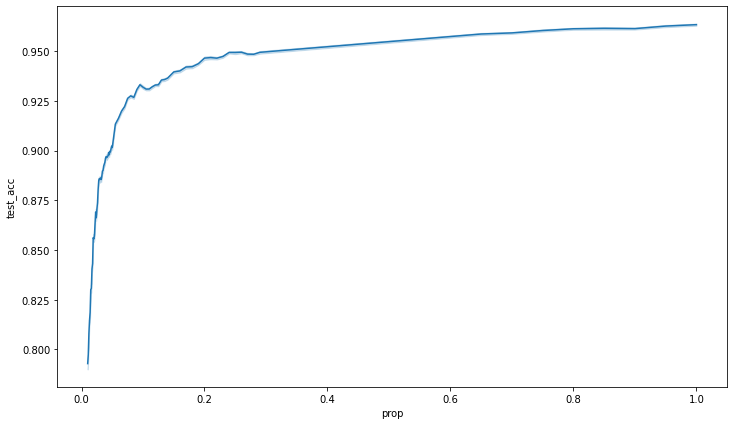

In [6]:
# df_results = logger.df_results
df_results = pd.read_csv("demo_baseline_tcga.csv")
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)
plt.figure(figsize=(12, 7))
sns.lineplot(data=df_le, x="prop", y="test_acc")

In [7]:
df_le.loc[df_le["prop"] >= 0.99]["test_acc"].describe()

count    50.000000
mean      0.963364
std       0.001990
min       0.957947
25%       0.962224
50%       0.963649
75%       0.964897
max       0.966500
Name: test_acc, dtype: float64

# Number of prototypes

In [ ]:
name = "demo_number_prototypes_tcga"
logger = LogResults(name, ["nprotos"])

nprotos = [10, 20, 40, 60, 80, 100]

for i in range(5):
    for nproto in nprotos:
        
        logger.update_hyps([nproto])
        
        config_swav = {
            "epochs": 200,
            "lr_init": 0.0001,
            "early_stop": 5,
            "coeff": 0.6,
        }
        
        # SwAV training
        
        idx = generate_indices(dataset)
        dataloaders = get_dataloaders(cancer_dataset, idx, [32, 1403, 1403])
        net_swav = NetSwav(input_dim, nproto=nproto).to(device)
        train_swav_tcga(config_swav, dataloaders, net_swav, device, config_swav["early_stop"], eps=0.09)
        torch.save(net_swav.state_dict(), "data/s12/swav_state_dict_0.pt")
        
        # Finetuning and evaluation
        
        idx = generate_indices(dataset, prop=0.03)
        base_bs = 256
        margin = 0.5
        bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))
        dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])
        
        config_nn = {
            "epochs": 200,
            "lr_init": 0.001,
            "early_stop": 5,
        }
        
        for j in range(10):
            net = Net(input_dim, output_dim).to(device)
            transfer_weights(net, f"data/s12/swav_state_dict_0.pt")
            train_nn(config_nn, dataloaders, net, weights=None, early_stop=config_nn["early_stop"], log=False, logger=logger)
            logger.next_run()
            logger.show_progression()
            
        logger.save_csv()

9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=1.9258 | SwAVEvalLoss=1.6274 |
| Epoch:   2/200 | SwAVTrainLoss=1.4451 | SwAVEvalLoss=1.2683 |
| Epoch:   3/200 | SwAVTrainLoss=1.2412 | SwAVEvalLoss=1.1662 |
| Epoch:   4/200 | SwAVTrainLoss=1.1312 | SwAVEvalLoss=1.0636 |
| Epoch:   5/200 | SwAVTrainLoss=1.0478 | SwAVEvalLoss=0.9867 |
| Epoch:   6/200 | SwAVTrainLoss=0.9838 | SwAVEvalLoss=0.9218 |
| Epoch:   7/200 | SwAVTrainLoss=0.9604 | SwAVEvalLoss=0.9182 |
INFO: Early stopping counter 1 of 5
| Epoch:   8/200 | SwAVTrainLoss=0.9264 | SwAVEvalLoss=0.9377 |
| Epoch:   9/200 | SwAVTrainLoss=0.9131 | SwAVEvalLoss=0.8978 |
| Epoch:  10/200 | SwAVTrainLoss=0.8970 | SwAVEvalLoss=0.8600 |
| Epoch:  11/200 | SwAVTrainLoss=0.8651 | SwAVEvalLoss=0.8109 |
INFO: Early stopping counter 1 of 5
| Epoch:  12/200 | SwAVTrainLoss=0.8333 | SwAVEvalLoss=0.8275 |
INFO: Early stopping counter 2 of 5
| Epoch:

| Epoch:  19/200 | SwAVTrainLoss=1.2738 | SwAVEvalLoss=1.1847 |
| Epoch:  20/200 | SwAVTrainLoss=1.2358 | SwAVEvalLoss=1.1470 |
INFO: Early stopping counter 1 of 5
| Epoch:  21/200 | SwAVTrainLoss=1.2223 | SwAVEvalLoss=1.1550 |
| Epoch:  22/200 | SwAVTrainLoss=1.2058 | SwAVEvalLoss=1.1204 |
INFO: Early stopping counter 1 of 5
| Epoch:  23/200 | SwAVTrainLoss=1.1968 | SwAVEvalLoss=1.1395 |
INFO: Early stopping counter 2 of 5
| Epoch:  24/200 | SwAVTrainLoss=1.1834 | SwAVEvalLoss=1.1215 |
| Epoch:  25/200 | SwAVTrainLoss=1.1599 | SwAVEvalLoss=1.0946 |
| Epoch:  26/200 | SwAVTrainLoss=1.1606 | SwAVEvalLoss=1.0552 |
| Epoch:  27/200 | SwAVTrainLoss=1.1528 | SwAVEvalLoss=1.0332 |
| Epoch:  28/200 | SwAVTrainLoss=1.1216 | SwAVEvalLoss=0.9956 |
INFO: Early stopping counter 1 of 5
| Epoch:  29/200 | SwAVTrainLoss=1.1067 | SwAVEvalLoss=1.0025 |
INFO: Early stopping counter 2 of 5
| Epoch:  30/200 | SwAVTrainLoss=1.1101 | SwAVEvalLoss=1.0230 |
| Epoch:  31/200 | SwAVTrainLoss=1.0833 | SwAVEvalLo

| Epoch:   8/200 | SwAVTrainLoss=2.2980 | SwAVEvalLoss=2.1817 |
| Epoch:   9/200 | SwAVTrainLoss=2.2623 | SwAVEvalLoss=2.1694 |
| Epoch:  10/200 | SwAVTrainLoss=2.2348 | SwAVEvalLoss=2.1382 |
| Epoch:  11/200 | SwAVTrainLoss=2.1963 | SwAVEvalLoss=2.1167 |
| Epoch:  12/200 | SwAVTrainLoss=2.1732 | SwAVEvalLoss=2.0645 |
| Epoch:  13/200 | SwAVTrainLoss=2.1478 | SwAVEvalLoss=2.0519 |
| Epoch:  14/200 | SwAVTrainLoss=2.1161 | SwAVEvalLoss=2.0501 |
INFO: Early stopping counter 1 of 5
| Epoch:  15/200 | SwAVTrainLoss=2.1038 | SwAVEvalLoss=2.0775 |
| Epoch:  16/200 | SwAVTrainLoss=2.0939 | SwAVEvalLoss=2.0220 |
| Epoch:  17/200 | SwAVTrainLoss=2.0776 | SwAVEvalLoss=1.9819 |
| Epoch:  18/200 | SwAVTrainLoss=2.0398 | SwAVEvalLoss=1.9728 |
INFO: Early stopping counter 1 of 5
| Epoch:  19/200 | SwAVTrainLoss=2.0143 | SwAVEvalLoss=2.0096 |
| Epoch:  20/200 | SwAVTrainLoss=2.0034 | SwAVEvalLoss=1.9330 |
| Epoch:  21/200 | SwAVTrainLoss=1.9933 | SwAVEvalLoss=1.8946 |
| Epoch:  22/200 | SwAVTrainLoss

| Epoch:   1/200 | SwAVTrainLoss=3.7251 | SwAVEvalLoss=3.4411 |
| Epoch:   2/200 | SwAVTrainLoss=3.3423 | SwAVEvalLoss=3.1814 |
| Epoch:   3/200 | SwAVTrainLoss=3.1018 | SwAVEvalLoss=2.9752 |
| Epoch:   4/200 | SwAVTrainLoss=2.9451 | SwAVEvalLoss=2.8369 |
| Epoch:   5/200 | SwAVTrainLoss=2.8631 | SwAVEvalLoss=2.7795 |
| Epoch:   6/200 | SwAVTrainLoss=2.7980 | SwAVEvalLoss=2.7032 |
| Epoch:   7/200 | SwAVTrainLoss=2.7497 | SwAVEvalLoss=2.7798 |
| Epoch:   8/200 | SwAVTrainLoss=2.7149 | SwAVEvalLoss=2.6639 |
| Epoch:   9/200 | SwAVTrainLoss=2.6832 | SwAVEvalLoss=2.5891 |
| Epoch:  10/200 | SwAVTrainLoss=2.6460 | SwAVEvalLoss=2.5797 |
| Epoch:  11/200 | SwAVTrainLoss=2.6277 | SwAVEvalLoss=2.5431 |
| Epoch:  12/200 | SwAVTrainLoss=2.5967 | SwAVEvalLoss=2.5213 |
| Epoch:  13/200 | SwAVTrainLoss=2.5702 | SwAVEvalLoss=2.4968 |
INFO: Early stopping counter 1 of 5
| Epoch:  14/200 | SwAVTrainLoss=2.5425 | SwAVEvalLoss=2.5266 |
INFO: Early stopping counter 2 of 5
| Epoch:  15/200 | SwAVTrainLoss


Iteration 34, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss nprotos
827  run-33    26  0.885959  0.567828  0.889522   0.594318      60
828  run-33    27  0.886671  0.575080  0.893086   0.589888      60
829  run-33    28  0.885246  0.560309  0.891661   0.572223      60
830  run-33    29  0.885959  0.546767  0.888810   0.556685      60
831  run-33    30  0.887384  0.543974  0.888810   0.559182      60

Iteration 35, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss nprotos
851  run-34    19  0.890948  0.701011  0.893086   0.716217      60
852  run-34    20  0.890948  0.674626  0.888810   0.696275      60
853  run-34    21  0.890235  0.655036  0.890235   0.673126      60
854  run-34    22  0.892373  0.625693  0.890235   0.651168      60
855  run-34    23  0.890235  0.610618  0.893799   0.624830      60

Iteration 36, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss np

| Epoch:  65/200 | SwAVTrainLoss=2.3661 | SwAVEvalLoss=2.2716 |
INFO: Early stopping counter 1 of 5
| Epoch:  66/200 | SwAVTrainLoss=2.3659 | SwAVEvalLoss=2.2886 |
| Epoch:  67/200 | SwAVTrainLoss=2.3660 | SwAVEvalLoss=2.2467 |
INFO: Early stopping counter 1 of 5
| Epoch:  68/200 | SwAVTrainLoss=2.3642 | SwAVEvalLoss=2.2557 |
INFO: Early stopping counter 2 of 5
| Epoch:  69/200 | SwAVTrainLoss=2.3583 | SwAVEvalLoss=2.2607 |
| Epoch:  70/200 | SwAVTrainLoss=2.3461 | SwAVEvalLoss=2.2394 |
INFO: Early stopping counter 1 of 5
| Epoch:  71/200 | SwAVTrainLoss=2.3468 | SwAVEvalLoss=2.2423 |
INFO: Early stopping counter 2 of 5
| Epoch:  72/200 | SwAVTrainLoss=2.3428 | SwAVEvalLoss=2.2983 |
INFO: Early stopping counter 3 of 5
| Epoch:  73/200 | SwAVTrainLoss=2.3363 | SwAVEvalLoss=2.2433 |
| Epoch:  74/200 | SwAVTrainLoss=2.3318 | SwAVEvalLoss=2.2035 |
INFO: Early stopping counter 1 of 5
| Epoch:  75/200 | SwAVTrainLoss=2.3252 | SwAVEvalLoss=2.2102 |
INFO: Early stopping counter 2 of 5
| Epoch:

INFO: Early stopping counter 2 of 5
| Epoch:  30/200 | SwAVTrainLoss=2.8901 | SwAVEvalLoss=2.8342 |
| Epoch:  31/200 | SwAVTrainLoss=2.8708 | SwAVEvalLoss=2.7911 |
| Epoch:  32/200 | SwAVTrainLoss=2.8624 | SwAVEvalLoss=2.7702 |
| Epoch:  33/200 | SwAVTrainLoss=2.8421 | SwAVEvalLoss=2.7620 |
INFO: Early stopping counter 1 of 5
| Epoch:  34/200 | SwAVTrainLoss=2.8445 | SwAVEvalLoss=2.7823 |
INFO: Early stopping counter 2 of 5
| Epoch:  35/200 | SwAVTrainLoss=2.8354 | SwAVEvalLoss=2.8219 |
INFO: Early stopping counter 3 of 5
| Epoch:  36/200 | SwAVTrainLoss=2.8204 | SwAVEvalLoss=2.7658 |
| Epoch:  37/200 | SwAVTrainLoss=2.8143 | SwAVEvalLoss=2.7324 |
| Epoch:  38/200 | SwAVTrainLoss=2.8019 | SwAVEvalLoss=2.7283 |
INFO: Early stopping counter 1 of 5
| Epoch:  39/200 | SwAVTrainLoss=2.7860 | SwAVEvalLoss=2.7543 |
| Epoch:  40/200 | SwAVTrainLoss=2.7862 | SwAVEvalLoss=2.6976 |
| Epoch:  41/200 | SwAVTrainLoss=2.7621 | SwAVEvalLoss=2.6274 |
INFO: Early stopping counter 1 of 5
| Epoch:  42/200

INFO: Early stopping counter 1 of 5
| Epoch:  13/200 | SwAVTrainLoss=0.7951 | SwAVEvalLoss=0.7991 |
| Epoch:  14/200 | SwAVTrainLoss=0.7779 | SwAVEvalLoss=0.7895 |
| Epoch:  15/200 | SwAVTrainLoss=0.7638 | SwAVEvalLoss=0.7686 |
| Epoch:  16/200 | SwAVTrainLoss=0.7608 | SwAVEvalLoss=0.7646 |
| Epoch:  17/200 | SwAVTrainLoss=0.7352 | SwAVEvalLoss=0.7331 |
| Epoch:  18/200 | SwAVTrainLoss=0.7293 | SwAVEvalLoss=0.7238 |
| Epoch:  19/200 | SwAVTrainLoss=0.7127 | SwAVEvalLoss=0.7126 |
| Epoch:  20/200 | SwAVTrainLoss=0.6825 | SwAVEvalLoss=0.6967 |
| Epoch:  21/200 | SwAVTrainLoss=0.6960 | SwAVEvalLoss=0.6826 |
| Epoch:  22/200 | SwAVTrainLoss=0.6792 | SwAVEvalLoss=0.6534 |
INFO: Early stopping counter 1 of 5
| Epoch:  23/200 | SwAVTrainLoss=0.6633 | SwAVEvalLoss=0.6558 |
| Epoch:  24/200 | SwAVTrainLoss=0.6631 | SwAVEvalLoss=0.6482 |
INFO: Early stopping counter 1 of 5
| Epoch:  25/200 | SwAVTrainLoss=0.6334 | SwAVEvalLoss=0.6693 |
INFO: Early stopping counter 2 of 5
| Epoch:  26/200 | SwAVT

INFO: Early stopping counter 1 of 5
| Epoch:  24/200 | SwAVTrainLoss=1.1845 | SwAVEvalLoss=1.1524 |
| Epoch:  25/200 | SwAVTrainLoss=1.1791 | SwAVEvalLoss=1.1449 |
| Epoch:  26/200 | SwAVTrainLoss=1.1761 | SwAVEvalLoss=1.0967 |
INFO: Early stopping counter 1 of 5
| Epoch:  27/200 | SwAVTrainLoss=1.1681 | SwAVEvalLoss=1.1164 |
INFO: Early stopping counter 2 of 5
| Epoch:  28/200 | SwAVTrainLoss=1.1551 | SwAVEvalLoss=1.1158 |
| Epoch:  29/200 | SwAVTrainLoss=1.1317 | SwAVEvalLoss=1.0753 |
INFO: Early stopping counter 1 of 5
| Epoch:  30/200 | SwAVTrainLoss=1.1307 | SwAVEvalLoss=1.0892 |
| Epoch:  31/200 | SwAVTrainLoss=1.1141 | SwAVEvalLoss=1.0258 |
INFO: Early stopping counter 1 of 5
| Epoch:  32/200 | SwAVTrainLoss=1.1100 | SwAVEvalLoss=1.0354 |
INFO: Early stopping counter 2 of 5
| Epoch:  33/200 | SwAVTrainLoss=1.1060 | SwAVEvalLoss=1.0342 |
| Epoch:  34/200 | SwAVTrainLoss=1.0723 | SwAVEvalLoss=0.9874 |
INFO: Early stopping counter 1 of 5
| Epoch:  35/200 | SwAVTrainLoss=1.0653 | Sw

| Epoch:  24/200 | SwAVTrainLoss=1.9402 | SwAVEvalLoss=1.8660 |
| Epoch:  25/200 | SwAVTrainLoss=1.9138 | SwAVEvalLoss=1.8440 |
INFO: Early stopping counter 1 of 5
| Epoch:  26/200 | SwAVTrainLoss=1.9147 | SwAVEvalLoss=1.8939 |
| Epoch:  27/200 | SwAVTrainLoss=1.8964 | SwAVEvalLoss=1.8368 |
INFO: Early stopping counter 1 of 5
| Epoch:  28/200 | SwAVTrainLoss=1.8885 | SwAVEvalLoss=1.8526 |
| Epoch:  29/200 | SwAVTrainLoss=1.8708 | SwAVEvalLoss=1.8365 |
| Epoch:  30/200 | SwAVTrainLoss=1.8619 | SwAVEvalLoss=1.8130 |
| Epoch:  31/200 | SwAVTrainLoss=1.8524 | SwAVEvalLoss=1.7681 |
INFO: Early stopping counter 1 of 5
| Epoch:  32/200 | SwAVTrainLoss=1.8388 | SwAVEvalLoss=1.7915 |
INFO: Early stopping counter 2 of 5
| Epoch:  33/200 | SwAVTrainLoss=1.8312 | SwAVEvalLoss=1.7818 |
INFO: Early stopping counter 3 of 5
| Epoch:  34/200 | SwAVTrainLoss=1.8370 | SwAVEvalLoss=1.7808 |
| Epoch:  35/200 | SwAVTrainLoss=1.8315 | SwAVEvalLoss=1.7099 |
INFO: Early stopping counter 1 of 5
| Epoch:  36/200


Iteration 90, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss nprotos
2268  run-89    24  0.885959  0.629495  0.890948   0.652612      40
2269  run-89    25  0.890235  0.609039  0.893799   0.624715      40
2270  run-89    26  0.893086  0.591450  0.893799   0.608762      40
2271  run-89    27  0.892373  0.571055  0.896650   0.580102      40
2272  run-89    28  0.893086  0.568441  0.890235   0.579325      40
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=3.6895 | SwAVEvalLoss=3.3980 |
| Epoch:   2/200 | SwAVTrainLoss=3.3125 | SwAVEvalLoss=3.1592 |
| Epoch:   3/200 | SwAVTrainLoss=3.1010 | SwAVEvalLoss=2.9531 |
| Epoch:   4/200 | SwAVTrainLoss=2.9573 | SwAVEvalLoss=2.8642 |
| Epoch:   5/200 | SwAVTrainLoss=2.8633 | SwAVEvalLoss=2.7715 |
| Epoch:   6/200 | SwAVTrainLoss=2.8043 | SwAVEvalLoss=2.7330 |
| Epoch:   7/200 | SwAVTrainLoss=2.7562 | SwAVE


Iteration 99, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss nprotos
2489  run-98    16  0.887384  0.765606  0.888810   0.792682      60
2490  run-98    17  0.890948  0.733080  0.883820   0.754884      60
2491  run-98    18  0.889522  0.699019  0.893086   0.720719      60
2492  run-98    19  0.889522  0.664258  0.890948   0.697884      60
2493  run-98    20  0.888810  0.644815  0.887384   0.657625      60

Iteration 100, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss nprotos
2511  run-99    17  0.893799  0.790119  0.893799   0.822662      60
2512  run-99    18  0.893799  0.753846  0.896650   0.777321      60
2513  run-99    19  0.892373  0.724946  0.895225   0.742320      60
2514  run-99    20  0.893086  0.690552  0.895937   0.731423      60
2515  run-99    21  0.892373  0.667228  0.895937   0.682709      60
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 e


Iteration 103, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
2602  run-102    22  0.886671  0.649281  0.891661   0.659814      80
2603  run-102    23  0.886671  0.625727  0.894512   0.630334      80
2604  run-102    24  0.886671  0.606267  0.888097   0.617550      80
2605  run-102    25  0.885959  0.600960  0.892373   0.598648      80
2606  run-102    26  0.888810  0.578315  0.897363   0.599422      80

Iteration 104, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
2633  run-103    26  0.891661  0.597519  0.885959   0.624058      80
2634  run-103    27  0.891661  0.594098  0.887384   0.600848      80
2635  run-103    28  0.887384  0.571229  0.883108   0.592212      80
2636  run-103    29  0.888097  0.562474  0.890235   0.578938      80
2637  run-103    30  0.886671  0.546079  0.883820   0.587816      80

Iteration 105, below are the last 5 epochs :
           id epoch   val_acc  val

INFO: Early stopping counter 1 of 5
| Epoch:  59/200 | SwAVTrainLoss=2.6596 | SwAVEvalLoss=2.5679 |
INFO: Early stopping counter 2 of 5
| Epoch:  60/200 | SwAVTrainLoss=2.6531 | SwAVEvalLoss=2.5769 |
INFO: Early stopping counter 3 of 5
| Epoch:  61/200 | SwAVTrainLoss=2.6432 | SwAVEvalLoss=2.5290 |
INFO: Early stopping counter 4 of 5
| Epoch:  62/200 | SwAVTrainLoss=2.6353 | SwAVEvalLoss=2.5678 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 111, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
2829  run-110    29  0.888097  0.577400  0.897363   0.594266     100
2830  run-110    30  0.890235  0.583029  0.895937   0.591204     100
2831  run-110    31  0.889522  0.558468  0.897363   0.574352     100
2832  run-110    32  0.890235  0.563530  0.897363   0.562879     100
2833  run-110    33  0.890235  0.5576


Iteration 122, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
3094  run-121    11  0.888097  0.916035  0.891661   0.949038      10
3095  run-121    12  0.883820  0.861657  0.896650   0.880408      10
3096  run-121    13  0.885959  0.816317  0.894512   0.831417      10
3097  run-121    14  0.887384  0.766131  0.888810   0.796126      10
3098  run-121    15  0.888810  0.722440  0.890948   0.751918      10

Iteration 123, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
3113  run-122    14  0.898788  0.811842  0.895937   0.845032      10
3114  run-122    15  0.898788  0.768382  0.894512   0.808118      10
3115  run-122    16  0.893799  0.731846  0.895937   0.767918      10
3116  run-122    17  0.894512  0.697754  0.897363   0.729260      10
3117  run-122    18  0.895225  0.667799  0.890235   0.720204      10

Iteration 124, below are the last 5 epochs :
           id epoch   val_acc  val

INFO: Early stopping counter 1 of 5
| Epoch:  53/200 | SwAVTrainLoss=0.9603 | SwAVEvalLoss=0.8839 |
| Epoch:  54/200 | SwAVTrainLoss=0.9747 | SwAVEvalLoss=0.8529 |
INFO: Early stopping counter 1 of 5
| Epoch:  55/200 | SwAVTrainLoss=0.9604 | SwAVEvalLoss=0.8738 |
INFO: Early stopping counter 2 of 5
| Epoch:  56/200 | SwAVTrainLoss=0.9682 | SwAVEvalLoss=0.8778 |
INFO: Early stopping counter 3 of 5
| Epoch:  57/200 | SwAVTrainLoss=0.9612 | SwAVEvalLoss=0.8601 |
INFO: Early stopping counter 4 of 5
| Epoch:  58/200 | SwAVTrainLoss=0.9545 | SwAVEvalLoss=0.8555 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 131, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
3285  run-130    21  0.880969  0.678974  0.890235   0.693579      20
3286  run-130    22  0.887384  0.643049  0.889522   0.669622      20
3287  run-1


Iteration 142, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
3550  run-141    20  0.889522  0.644641  0.893799   0.683123      40
3551  run-141    21  0.890235  0.629711  0.890235   0.663156      40
3552  run-141    22  0.888810  0.605391  0.892373   0.642498      40
3553  run-141    23  0.885959  0.589938  0.892373   0.636760      40
3554  run-141    24  0.889522  0.576480  0.891661   0.607279      40

Iteration 143, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
3571  run-142    16  0.885959  0.734272  0.891661   0.754443      40
3572  run-142    17  0.885246  0.693004  0.890948   0.729105      40
3573  run-142    18  0.885959  0.664181  0.896650   0.693496      40
3574  run-142    19  0.885959  0.632209  0.900214   0.673238      40
3575  run-142    20  0.886671  0.621431  0.897363   0.651442      40

Iteration 144, below are the last 5 epochs :
           id epoch   val_acc  val


Iteration 152, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
3783  run-151    17  0.883108  0.746970  0.891661   0.764949      60
3784  run-151    18  0.881682  0.721942  0.889522   0.730693      60
3785  run-151    19  0.883108  0.682810  0.890948   0.700329      60
3786  run-151    20  0.883108  0.663913  0.893086   0.668642      60
3787  run-151    21  0.883820  0.631209  0.892373   0.648476      60

Iteration 153, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
3809  run-152    21  0.888097  0.625979  0.892373   0.668055      60
3810  run-152    22  0.889522  0.622503  0.890235   0.651010      60
3811  run-152    23  0.890235  0.588314  0.890235   0.629937      60
3812  run-152    24  0.888097  0.575577  0.893799   0.621256      60
3813  run-152    25  0.891661  0.569886  0.893799   0.596577      60

Iteration 154, below are the last 5 epochs :
           id epoch   val_acc  val

| Epoch:  52/200 | SwAVTrainLoss=2.4365 | SwAVEvalLoss=2.3478 |
INFO: Early stopping counter 1 of 5
| Epoch:  53/200 | SwAVTrainLoss=2.4207 | SwAVEvalLoss=2.3689 |
| Epoch:  54/200 | SwAVTrainLoss=2.4207 | SwAVEvalLoss=2.3423 |
| Epoch:  55/200 | SwAVTrainLoss=2.4068 | SwAVEvalLoss=2.3183 |
INFO: Early stopping counter 1 of 5
| Epoch:  56/200 | SwAVTrainLoss=2.4215 | SwAVEvalLoss=2.3316 |
INFO: Early stopping counter 2 of 5
| Epoch:  57/200 | SwAVTrainLoss=2.4109 | SwAVEvalLoss=2.3271 |
| Epoch:  58/200 | SwAVTrainLoss=2.3940 | SwAVEvalLoss=2.2988 |
INFO: Early stopping counter 1 of 5
| Epoch:  59/200 | SwAVTrainLoss=2.3861 | SwAVEvalLoss=2.3081 |
| Epoch:  60/200 | SwAVTrainLoss=2.3727 | SwAVEvalLoss=2.2668 |
INFO: Early stopping counter 1 of 5
| Epoch:  61/200 | SwAVTrainLoss=2.3770 | SwAVEvalLoss=2.3047 |
INFO: Early stopping counter 2 of 5
| Epoch:  62/200 | SwAVTrainLoss=2.3873 | SwAVEvalLoss=2.3207 |
| Epoch:  63/200 | SwAVTrainLoss=2.3766 | SwAVEvalLoss=2.2576 |
INFO: Early stop

| Epoch:   1/200 | SwAVTrainLoss=4.2512 | SwAVEvalLoss=3.9899 |
| Epoch:   2/200 | SwAVTrainLoss=3.9114 | SwAVEvalLoss=3.7760 |
| Epoch:   3/200 | SwAVTrainLoss=3.7082 | SwAVEvalLoss=3.5792 |
| Epoch:   4/200 | SwAVTrainLoss=3.5683 | SwAVEvalLoss=3.4688 |
| Epoch:   5/200 | SwAVTrainLoss=3.4602 | SwAVEvalLoss=3.3479 |
| Epoch:   6/200 | SwAVTrainLoss=3.3899 | SwAVEvalLoss=3.3134 |
| Epoch:   7/200 | SwAVTrainLoss=3.3299 | SwAVEvalLoss=3.2332 |
| Epoch:   8/200 | SwAVTrainLoss=3.2847 | SwAVEvalLoss=3.2039 |
| Epoch:   9/200 | SwAVTrainLoss=3.2478 | SwAVEvalLoss=3.1841 |
| Epoch:  10/200 | SwAVTrainLoss=3.2227 | SwAVEvalLoss=3.1644 |
INFO: Early stopping counter 1 of 5
| Epoch:  11/200 | SwAVTrainLoss=3.1826 | SwAVEvalLoss=3.1834 |
| Epoch:  12/200 | SwAVTrainLoss=3.1607 | SwAVEvalLoss=3.0770 |
| Epoch:  13/200 | SwAVTrainLoss=3.1408 | SwAVEvalLoss=3.0552 |
| Epoch:  14/200 | SwAVTrainLoss=3.1142 | SwAVEvalLoss=3.0524 |
| Epoch:  15/200 | SwAVTrainLoss=3.0897 | SwAVEvalLoss=2.9912 |
INFO


Iteration 179, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
4483  run-178    26  0.888810  0.537070  0.890948   0.545947     100
4484  run-178    27  0.890235  0.515554  0.884533   0.533715     100
4485  run-178    28  0.888097  0.515175  0.893086   0.529010     100
4486  run-178    29  0.888097  0.512531  0.888810   0.519279     100
4487  run-178    30  0.890235  0.499020  0.892373   0.512625     100

Iteration 180, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
4510  run-179    22  0.894512  0.633771  0.892373   0.642128     100
4511  run-179    23  0.891661  0.618826  0.893799   0.634870     100
4512  run-179    24  0.898788  0.602582  0.891661   0.616353     100
4513  run-179    25  0.893086  0.581868  0.890235   0.583314     100
4514  run-179    26  0.893799  0.574262  0.891661   0.582909     100
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the 

| Epoch:   1/200 | SwAVTrainLoss=2.6843 | SwAVEvalLoss=2.3404 |
| Epoch:   2/200 | SwAVTrainLoss=2.2242 | SwAVEvalLoss=2.0026 |
| Epoch:   3/200 | SwAVTrainLoss=1.9559 | SwAVEvalLoss=1.8173 |
| Epoch:   4/200 | SwAVTrainLoss=1.7994 | SwAVEvalLoss=1.6848 |
| Epoch:   5/200 | SwAVTrainLoss=1.7069 | SwAVEvalLoss=1.6533 |
| Epoch:   6/200 | SwAVTrainLoss=1.6492 | SwAVEvalLoss=1.5744 |
| Epoch:   7/200 | SwAVTrainLoss=1.6063 | SwAVEvalLoss=1.5407 |
INFO: Early stopping counter 1 of 5
| Epoch:   8/200 | SwAVTrainLoss=1.5612 | SwAVEvalLoss=1.5537 |
| Epoch:   9/200 | SwAVTrainLoss=1.5374 | SwAVEvalLoss=1.5096 |
| Epoch:  10/200 | SwAVTrainLoss=1.5085 | SwAVEvalLoss=1.4777 |
| Epoch:  11/200 | SwAVTrainLoss=1.4736 | SwAVEvalLoss=1.4424 |
| Epoch:  12/200 | SwAVTrainLoss=1.4417 | SwAVEvalLoss=1.4130 |
| Epoch:  13/200 | SwAVTrainLoss=1.4139 | SwAVEvalLoss=1.3913 |
| Epoch:  14/200 | SwAVTrainLoss=1.3976 | SwAVEvalLoss=1.3627 |
| Epoch:  15/200 | SwAVTrainLoss=1.3705 | SwAVEvalLoss=1.3149 |
| Ep


Iteration 197, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
4940  run-196    30  0.881682  0.553045  0.887384   0.574053      20
4941  run-196    31  0.883108  0.537585  0.887384   0.556526      20
4942  run-196    32  0.884533  0.529225  0.893086   0.545012      20
4943  run-196    33  0.880257  0.527284  0.890235   0.539819      20
4944  run-196    34  0.883108  0.529657  0.890948   0.537493      20

Iteration 198, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
4960  run-197    15  0.885246  0.877517  0.880969   0.907555      20
4961  run-197    16  0.880257  0.840117  0.883108   0.875201      20
4962  run-197    17  0.880257  0.804503  0.883108   0.832341      20
4963  run-197    18  0.881682  0.758366  0.885959   0.800275      20
4964  run-197    19  0.880257  0.735418  0.883820   0.761221      20

Iteration 199, below are the last 5 epochs :
           id epoch   val_acc  val


Iteration 206, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
5156  run-205    21  0.889522  0.658698  0.893799   0.677519      40
5157  run-205    22  0.892373  0.631014  0.890948   0.662119      40
5158  run-205    23  0.888810  0.620923  0.893086   0.638276      40
5159  run-205    24  0.888810  0.599354  0.890948   0.621956      40
5160  run-205    25  0.886671  0.581706  0.893086   0.608069      40

Iteration 207, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
5178  run-206    17  0.890948  0.756582  0.895225   0.778186      40
5179  run-206    18  0.888097  0.719596  0.892373   0.741866      40
5180  run-206    19  0.890948  0.685735  0.894512   0.714991      40
5181  run-206    20  0.893086  0.661163  0.891661   0.689696      40
5182  run-206    21  0.893086  0.640761  0.893799   0.666494      40

Iteration 208, below are the last 5 epochs :
           id epoch   val_acc  val


Iteration 212, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
5307  run-211    20  0.885959  0.738255  0.885246   0.755818      60
5308  run-211    21  0.884533  0.694627  0.885246   0.736356      60
5309  run-211    22  0.877406  0.668501  0.883820   0.704033      60
5310  run-211    23  0.883108  0.648360  0.887384   0.674815      60
5311  run-211    24  0.882395  0.627023  0.890235   0.660122      60

Iteration 213, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss nprotos
5339  run-212    27  0.887384  0.552476  0.893086   0.580001      60
5340  run-212    28  0.889522  0.538038  0.895225   0.569549      60
5341  run-212    29  0.888097  0.549015  0.893086   0.554411      60
5342  run-212    30  0.887384  0.532159  0.896650   0.548277      60
5343  run-212    31  0.886671  0.529503  0.894512   0.530526      60

Iteration 214, below are the last 5 epochs :
           id epoch   val_acc  val

| Epoch:  51/200 | SwAVTrainLoss=2.4668 | SwAVEvalLoss=2.3667 |
INFO: Early stopping counter 1 of 5
| Epoch:  52/200 | SwAVTrainLoss=2.4605 | SwAVEvalLoss=2.3887 |
INFO: Early stopping counter 2 of 5
| Epoch:  53/200 | SwAVTrainLoss=2.4394 | SwAVEvalLoss=2.3996 |
| Epoch:  54/200 | SwAVTrainLoss=2.4321 | SwAVEvalLoss=2.3311 |
INFO: Early stopping counter 1 of 5
| Epoch:  55/200 | SwAVTrainLoss=2.4348 | SwAVEvalLoss=2.3816 |
INFO: Early stopping counter 2 of 5
| Epoch:  56/200 | SwAVTrainLoss=2.4304 | SwAVEvalLoss=2.3737 |
INFO: Early stopping counter 3 of 5
| Epoch:  57/200 | SwAVTrainLoss=2.4439 | SwAVEvalLoss=2.3761 |
INFO: Early stopping counter 4 of 5
| Epoch:  58/200 | SwAVTrainLoss=2.4160 | SwAVEvalLoss=2.3627 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 221, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  tes

| Epoch:  36/200 | SwAVTrainLoss=2.8346 | SwAVEvalLoss=2.7315 |
INFO: Early stopping counter 1 of 5
| Epoch:  37/200 | SwAVTrainLoss=2.8250 | SwAVEvalLoss=2.7997 |
INFO: Early stopping counter 2 of 5
| Epoch:  38/200 | SwAVTrainLoss=2.8138 | SwAVEvalLoss=2.7472 |
| Epoch:  39/200 | SwAVTrainLoss=2.8039 | SwAVEvalLoss=2.7234 |
INFO: Early stopping counter 1 of 5
| Epoch:  40/200 | SwAVTrainLoss=2.7993 | SwAVEvalLoss=2.7482 |
| Epoch:  41/200 | SwAVTrainLoss=2.7824 | SwAVEvalLoss=2.7054 |
| Epoch:  42/200 | SwAVTrainLoss=2.7717 | SwAVEvalLoss=2.7043 |
| Epoch:  43/200 | SwAVTrainLoss=2.7676 | SwAVEvalLoss=2.6659 |
INFO: Early stopping counter 1 of 5
| Epoch:  44/200 | SwAVTrainLoss=2.7609 | SwAVEvalLoss=2.7289 |
| Epoch:  45/200 | SwAVTrainLoss=2.7508 | SwAVEvalLoss=2.6415 |
INFO: Early stopping counter 1 of 5
| Epoch:  46/200 | SwAVTrainLoss=2.7358 | SwAVEvalLoss=2.6607 |
INFO: Early stopping counter 2 of 5
| Epoch:  47/200 | SwAVTrainLoss=2.7458 | SwAVEvalLoss=2.6948 |
INFO: Early stop

| Epoch:  15/200 | SwAVTrainLoss=0.7615 | SwAVEvalLoss=0.7155 |
INFO: Early stopping counter 1 of 5
| Epoch:  16/200 | SwAVTrainLoss=0.7539 | SwAVEvalLoss=0.7413 |
| Epoch:  17/200 | SwAVTrainLoss=0.7337 | SwAVEvalLoss=0.6903 |
INFO: Early stopping counter 1 of 5
| Epoch:  18/200 | SwAVTrainLoss=0.7064 | SwAVEvalLoss=0.7113 |
| Epoch:  19/200 | SwAVTrainLoss=0.7146 | SwAVEvalLoss=0.6738 |
| Epoch:  20/200 | SwAVTrainLoss=0.6888 | SwAVEvalLoss=0.6737 |
| Epoch:  21/200 | SwAVTrainLoss=0.6832 | SwAVEvalLoss=0.6654 |
INFO: Early stopping counter 1 of 5
| Epoch:  22/200 | SwAVTrainLoss=0.6672 | SwAVEvalLoss=0.7119 |
INFO: Early stopping counter 2 of 5
| Epoch:  23/200 | SwAVTrainLoss=0.6566 | SwAVEvalLoss=0.6673 |
| Epoch:  24/200 | SwAVTrainLoss=0.6480 | SwAVEvalLoss=0.6466 |
| Epoch:  25/200 | SwAVTrainLoss=0.6467 | SwAVEvalLoss=0.6009 |
INFO: Early stopping counter 1 of 5
| Epoch:  26/200 | SwAVTrainLoss=0.6318 | SwAVEvalLoss=0.6633 |
| Epoch:  27/200 | SwAVTrainLoss=0.6246 | SwAVEvalLo

<AxesSubplot:xlabel='nprotos', ylabel='test_acc'>

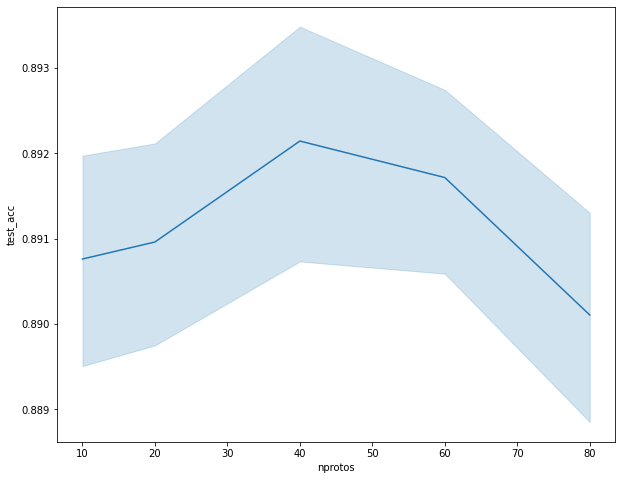

In [12]:
df_results = pd.read_csv("demo_number_prototypes_tcga.csv")
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)
df_le = df_le.loc[df_le["nprotos"] <= 80]
plt.figure(figsize=(10, 8))
sns.lineplot(data=df_le, x="nprotos", y="test_acc")

# Epsilon value

In [10]:
name = "demo_epsilon_value_tcga"
logger = LogResults(name, ["epsilon"])

epsilons = [0.05, 0.06, 0.07, 0.08, 0.09, 0.10, 0.11, 0.12, 0.13, 0.14]

for i in range(5):
    for eps in epsilons:
        
        logger.update_hyps([eps])
        
        config_swav = {
            "epochs": 200,
            "lr_init": 0.0001,
            "early_stop": 5,
            "coeff": 0.6,
        }
        
        # SwAV training
        
        idx = generate_indices(dataset)
        dataloaders = get_dataloaders(cancer_dataset, idx, [64, 1403, 1403])
        net_swav = NetSwav(input_dim, nproto=60).to(device)
        train_swav_tcga(config_swav, dataloaders, net_swav, device, config_swav["early_stop"], eps=eps)
        torch.save(net_swav.state_dict(), "data/s12/swav_state_dict_0.pt")
        
        # Finetuning and evaluation
        
        idx = generate_indices(dataset, prop=0.03)
        base_bs = 256
        margin = 0.5
        bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))
        dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])
        
        config_nn = {
            "epochs": 200,
            "lr_init": 0.001,
            "early_stop": 5,
        }
        
        for j in range(10):
            net = Net(input_dim, output_dim).to(device)
            transfer_weights(net, f"data/s12/swav_state_dict_0.pt")
            train_nn(config_nn, dataloaders, net, weights=None, early_stop=config_nn["early_stop"], log=False, logger=logger)
            logger.next_run()
            logger.show_progression()
            
        logger.save_csv()

9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=3.0282 | SwAVEvalLoss=1.9299 |
| Epoch:   2/200 | SwAVTrainLoss=1.8644 | SwAVEvalLoss=1.3686 |
| Epoch:   3/200 | SwAVTrainLoss=1.5741 | SwAVEvalLoss=1.1615 |
| Epoch:   4/200 | SwAVTrainLoss=1.4620 | SwAVEvalLoss=1.0674 |
| Epoch:   5/200 | SwAVTrainLoss=1.3977 | SwAVEvalLoss=1.0275 |
| Epoch:   6/200 | SwAVTrainLoss=1.3628 | SwAVEvalLoss=1.0029 |
| Epoch:   7/200 | SwAVTrainLoss=1.3218 | SwAVEvalLoss=0.9635 |
INFO: Early stopping counter 1 of 5
| Epoch:   8/200 | SwAVTrainLoss=1.2887 | SwAVEvalLoss=0.9858 |
| Epoch:   9/200 | SwAVTrainLoss=1.2794 | SwAVEvalLoss=0.9508 |
| Epoch:  10/200 | SwAVTrainLoss=1.2530 | SwAVEvalLoss=0.9458 |
| Epoch:  11/200 | SwAVTrainLoss=1.2531 | SwAVEvalLoss=0.9380 |
| Epoch:  12/200 | SwAVTrainLoss=1.2454 | SwAVEvalLoss=0.9187 |
| Epoch:  13/200 | SwAVTrainLoss=1.2328 | SwAVEvalLoss=0.9182 |
INFO: Early stop

KeyboardInterrupt: 

<AxesSubplot:xlabel='epsilon', ylabel='test_acc'>

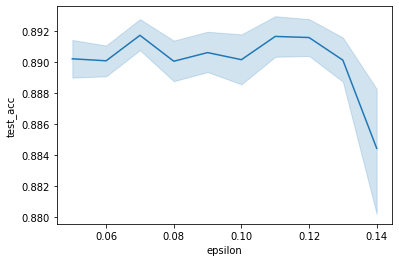

In [13]:
df_results = pd.read_csv("demo_epsilon_value_tcga.csv")
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)
# plt.figure(figsize=(10, 8))
sns.lineplot(data=df_le, x="epsilon", y="test_acc")

# Augmentation method

In [ ]:
name = "demo_augmentation_method_tcga_009"
logger = LogResults(name, ["coeff", "aug"])

coeffs = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
augmentations = ["noise", "mask"]

for i in range(5):
    for coeff in coeffs:
        for aug in augmentations:
            
            logger.update_hyps([coeff, aug])
            
            config_swav = {
                "epochs": 200,
                "lr_init": 0.0001,
                "early_stop": 5,
                "coeff": coeff,
            }
            
            # SwAV training
            
            idx = generate_indices(dataset)
            dataloaders = get_dataloaders(cancer_dataset, idx, [64, 1403, 1403])
            net_swav = NetSwav(input_dim, nproto=60).to(device)
            train_swav_tcga(config_swav, dataloaders, net_swav, device, config_swav["early_stop"], eps=0.09, method=aug)
            torch.save(net_swav.state_dict(), "data/s12/swav_state_dict_0.pt")
        
            # Finetuning and evaluation

            idx = generate_indices(dataset, prop=0.03)
            base_bs = 256
            margin = 0.5
            bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))
            dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])

            config_nn = {
                "epochs": 200,
                "lr_init": 0.001,
                "early_stop": 5,
            }

            for j in range(10):
                net = Net(input_dim, output_dim).to(device)
                transfer_weights(net, f"data/s12/swav_state_dict_0.pt")
                train_nn(config_nn, dataloaders, net, weights=None, early_stop=config_nn["early_stop"], log=False, logger=logger)
                logger.next_run()
                logger.show_progression()

            logger.save_csv()



9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=3.0217 | SwAVEvalLoss=2.6416 |
| Epoch:   2/200 | SwAVTrainLoss=2.6576 | SwAVEvalLoss=2.4594 |
| Epoch:   3/200 | SwAVTrainLoss=2.5305 | SwAVEvalLoss=2.3929 |
| Epoch:   4/200 | SwAVTrainLoss=2.4578 | SwAVEvalLoss=2.3434 |
| Epoch:   5/200 | SwAVTrainLoss=2.4173 | SwAVEvalLoss=2.3134 |
| Epoch:   6/200 | SwAVTrainLoss=2.3642 | SwAVEvalLoss=2.2695 |
| Epoch:   7/200 | SwAVTrainLoss=2.3187 | SwAVEvalLoss=2.2740 |
| Epoch:   8/200 | SwAVTrainLoss=2.2747 | SwAVEvalLoss=2.1631 |
| Epoch:   9/200 | SwAVTrainLoss=2.2481 | SwAVEvalLoss=2.1493 |
| Epoch:  10/200 | SwAVTrainLoss=2.2239 | SwAVEvalLoss=2.1225 |
| Epoch:  11/200 | SwAVTrainLoss=2.2026 | SwAVEvalLoss=2.0968 |
INFO: Early stopping counter 1 of 5
| Epoch:  12/200 | SwAVTrainLoss=2.1836 | SwAVEvalLoss=2.1675 |
| Epoch:  13/200 | SwAVTrainLoss=2.1596 | SwAVEvalLoss=2.0808 |
| Epoch:  14/200


Iteration 4, below are the last 5 epochs :
       id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
91  run-3    25  0.900927  0.547376  0.902352   0.573981    0.1  noise
92  run-3    26  0.901639  0.551320  0.898788   0.566558    0.1  noise
93  run-3    27  0.898788  0.541409  0.901639   0.554305    0.1  noise
94  run-3    28  0.898076  0.539767  0.898788   0.555834    0.1  noise
95  run-3    29  0.898076  0.538293  0.897363   0.548661    0.1  noise

Iteration 5, below are the last 5 epochs :
        id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
121  run-4    25  0.900214  0.536191  0.897363   0.575906    0.1  noise
122  run-4    26  0.895937  0.526312  0.898076   0.553202    0.1  noise
123  run-4    27  0.897363  0.529647  0.898076   0.549032    0.1  noise
124  run-4    28  0.897363  0.515688  0.894512   0.539338    0.1  noise
125  run-4    29  0.897363  0.494429  0.895937   0.534903    0.1  noise

Iteration 6, below are the last 5 epochs :
        id


Iteration 16, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
374  run-15    17  0.890948  0.641827  0.893086   0.669626    0.1  mask
375  run-15    18  0.890948  0.626240  0.894512   0.651217    0.1  mask
376  run-15    19  0.886671  0.616232  0.890235   0.645596    0.1  mask
377  run-15    20  0.887384  0.595333  0.897363   0.616858    0.1  mask
378  run-15    21  0.887384  0.586463  0.895937   0.602528    0.1  mask

Iteration 17, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
391  run-16    12  0.883820  0.844061  0.890948   0.875232    0.1  mask
392  run-16    13  0.884533  0.795665  0.887384   0.814632    0.1  mask
393  run-16    14  0.884533  0.750039  0.892373   0.784664    0.1  mask
394  run-16    15  0.886671  0.712694  0.887384   0.747689    0.1  mask
395  run-16    16  0.885246  0.679835  0.890235   0.729938    0.1  mask

Iteration 18, below are the last 5 epochs :
 


Iteration 25, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
578  run-24    13  0.891661  0.792079  0.895937   0.823997    0.2  noise
579  run-24    14  0.889522  0.749843  0.897363   0.787968    0.2  noise
580  run-24    15  0.894512  0.713808  0.896650   0.745782    0.2  noise
581  run-24    16  0.894512  0.682356  0.892373   0.710381    0.2  noise
582  run-24    17  0.892373  0.647378  0.896650   0.683725    0.2  noise

Iteration 26, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
601  run-25    18  0.895225  0.621079  0.892373   0.661273    0.2  noise
602  run-25    19  0.895225  0.604004  0.891661   0.644267    0.2  noise
603  run-25    20  0.897363  0.583354  0.890948   0.628035    0.2  noise
604  run-25    21  0.896650  0.573165  0.895937   0.604838    0.2  noise
605  run-25    22  0.895225  0.560700  0.895937   0.602242    0.2  noise

Iteration 27, below are the last 

INFO: Early stopping counter 2 of 5
| Epoch:  67/200 | SwAVTrainLoss=1.7286 | SwAVEvalLoss=1.6778 |
| Epoch:  68/200 | SwAVTrainLoss=1.7136 | SwAVEvalLoss=1.6548 |
| Epoch:  69/200 | SwAVTrainLoss=1.7050 | SwAVEvalLoss=1.6505 |
| Epoch:  70/200 | SwAVTrainLoss=1.7159 | SwAVEvalLoss=1.6443 |
INFO: Early stopping counter 1 of 5
| Epoch:  71/200 | SwAVTrainLoss=1.7024 | SwAVEvalLoss=1.6598 |
| Epoch:  72/200 | SwAVTrainLoss=1.6996 | SwAVEvalLoss=1.6268 |
INFO: Early stopping counter 1 of 5
| Epoch:  73/200 | SwAVTrainLoss=1.6888 | SwAVEvalLoss=1.6517 |
INFO: Early stopping counter 2 of 5
| Epoch:  74/200 | SwAVTrainLoss=1.6765 | SwAVEvalLoss=1.6405 |
INFO: Early stopping counter 3 of 5
| Epoch:  75/200 | SwAVTrainLoss=1.6802 | SwAVEvalLoss=1.6471 |
| Epoch:  76/200 | SwAVTrainLoss=1.6807 | SwAVEvalLoss=1.6214 |
INFO: Early stopping counter 1 of 5
| Epoch:  77/200 | SwAVTrainLoss=1.6733 | SwAVEvalLoss=1.6281 |
INFO: Early stopping counter 2 of 5
| Epoch:  78/200 | SwAVTrainLoss=1.6678 | Sw


Iteration 39, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
925  run-38    21  0.885959  0.626839  0.893799   0.641007    0.2  mask
926  run-38    22  0.890235  0.609865  0.898076   0.631855    0.2  mask
927  run-38    23  0.888097  0.588436  0.893799   0.599560    0.2  mask
928  run-38    24  0.891661  0.572451  0.897363   0.602063    0.2  mask
929  run-38    25  0.888810  0.559107  0.892373   0.579338    0.2  mask

Iteration 40, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
955  run-39    25  0.888810  0.576757  0.885959   0.589825    0.2  mask
956  run-39    26  0.887384  0.572229  0.890948   0.573231    0.2  mask
957  run-39    27  0.885246  0.547938  0.890948   0.560995    0.2  mask
958  run-39    28  0.885959  0.559255  0.894512   0.558842    0.2  mask
959  run-39    29  0.885246  0.529564  0.885959   0.555593    0.2  mask
9352 elements in the dataset
6546 elements in 


Iteration 49, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
1142  run-48    17  0.890235  0.655000  0.895937   0.702300    0.3  noise
1143  run-48    18  0.893086  0.646004  0.893799   0.665878    0.3  noise
1144  run-48    19  0.890948  0.625436  0.896650   0.651955    0.3  noise
1145  run-48    20  0.891661  0.608685  0.895937   0.630297    0.3  noise
1146  run-48    21  0.893799  0.591794  0.894512   0.610536    0.3  noise

Iteration 50, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
1162  run-49    15  0.891661  0.714650  0.889522   0.741351    0.3  noise
1163  run-49    16  0.892373  0.676278  0.894512   0.704385    0.3  noise
1164  run-49    17  0.892373  0.650721  0.892373   0.683266    0.3  noise
1165  run-49    18  0.891661  0.635149  0.896650   0.656716    0.3  noise
1166  run-49    19  0.891661  0.605918  0.895225   0.638452    0.3  noise
9352 elements in the d


Iteration 54, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
1255  run-53    16  0.883108  0.705594  0.888097   0.737643    0.3  mask
1256  run-53    17  0.884533  0.676599  0.891661   0.721669    0.3  mask
1257  run-53    18  0.883820  0.650952  0.889522   0.684567    0.3  mask
1258  run-53    19  0.883820  0.626032  0.888810   0.670171    0.3  mask
1259  run-53    20  0.888810  0.611599  0.888097   0.645393    0.3  mask

Iteration 55, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
1276  run-54    16  0.890948  0.691789  0.893799   0.737847    0.3  mask
1277  run-54    17  0.892373  0.664970  0.894512   0.707551    0.3  mask
1278  run-54    18  0.890948  0.639694  0.898076   0.672396    0.3  mask
1279  run-54    19  0.890235  0.615017  0.892373   0.654702    0.3  mask
1280  run-54    20  0.891661  0.598061  0.890948   0.637566    0.3  mask

Iteration 56, below are the last 


Iteration 64, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
1462  run-63    18  0.891661  0.620097  0.885246   0.670490    0.4  noise
1463  run-63    19  0.891661  0.608074  0.888097   0.645175    0.4  noise
1464  run-63    20  0.889522  0.592691  0.885246   0.625623    0.4  noise
1465  run-63    21  0.889522  0.568535  0.883820   0.612081    0.4  noise
1466  run-63    22  0.891661  0.561781  0.888097   0.602140    0.4  noise

Iteration 65, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
1483  run-64    16  0.890948  0.673939  0.890948   0.698204    0.4  noise
1484  run-64    17  0.883108  0.659539  0.889522   0.669613    0.4  noise
1485  run-64    18  0.885246  0.626289  0.888097   0.647786    0.4  noise
1486  run-64    19  0.883108  0.620854  0.892373   0.625710    0.4  noise
1487  run-64    20  0.888097  0.596298  0.892373   0.615648    0.4  noise

Iteration 66, below a


Iteration 75, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
1702  run-74    11  0.892373  0.944455  0.893086   0.975686    0.4  mask
1703  run-74    12  0.887384  0.882763  0.898076   0.918366    0.4  mask
1704  run-74    13  0.888097  0.845891  0.894512   0.861262    0.4  mask
1705  run-74    14  0.883820  0.793951  0.892373   0.812461    0.4  mask
1706  run-74    15  0.887384  0.751929  0.891661   0.768583    0.4  mask

Iteration 76, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
1725  run-75    18  0.890235  0.677211  0.893799   0.719529    0.4  mask
1726  run-75    19  0.893086  0.653928  0.890235   0.698183    0.4  mask
1727  run-75    20  0.889522  0.636480  0.895225   0.665779    0.4  mask
1728  run-75    21  0.891661  0.617357  0.890235   0.666673    0.4  mask
1729  run-75    22  0.888810  0.602410  0.890235   0.644669    0.4  mask

Iteration 77, below are the last 


Iteration 84, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
1889  run-83    13  0.888097  0.864107  0.885246   0.899153    0.5  noise
1890  run-83    14  0.890948  0.833687  0.888810   0.857686    0.5  noise
1891  run-83    15  0.890948  0.777283  0.883108   0.812263    0.5  noise
1892  run-83    16  0.885246  0.748006  0.883108   0.776293    0.5  noise
1893  run-83    17  0.884533  0.704374  0.883108   0.749323    0.5  noise

Iteration 85, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
1911  run-84    17  0.888810  0.707457  0.895937   0.738889    0.5  noise
1912  run-84    18  0.888097  0.666300  0.891661   0.702848    0.5  noise
1913  run-84    19  0.890948  0.662974  0.891661   0.681252    0.5  noise
1914  run-84    20  0.888097  0.649136  0.888810   0.657326    0.5  noise
1915  run-84    21  0.887384  0.624115  0.893799   0.639816    0.5  noise

Iteration 86, below a

INFO: Early stopping counter 2 of 5
| Epoch:  61/200 | SwAVTrainLoss=1.8718 | SwAVEvalLoss=1.8378 |
| Epoch:  62/200 | SwAVTrainLoss=1.8625 | SwAVEvalLoss=1.7784 |
INFO: Early stopping counter 1 of 5
| Epoch:  63/200 | SwAVTrainLoss=1.8608 | SwAVEvalLoss=1.7959 |
INFO: Early stopping counter 2 of 5
| Epoch:  64/200 | SwAVTrainLoss=1.8627 | SwAVEvalLoss=1.8332 |
INFO: Early stopping counter 3 of 5
| Epoch:  65/200 | SwAVTrainLoss=1.8443 | SwAVEvalLoss=1.7817 |
INFO: Early stopping counter 4 of 5
| Epoch:  66/200 | SwAVTrainLoss=1.8363 | SwAVEvalLoss=1.8042 |
| Epoch:  67/200 | SwAVTrainLoss=1.8355 | SwAVEvalLoss=1.7765 |
INFO: Early stopping counter 1 of 5
| Epoch:  68/200 | SwAVTrainLoss=1.8364 | SwAVEvalLoss=1.7921 |
INFO: Early stopping counter 2 of 5
| Epoch:  69/200 | SwAVTrainLoss=1.8321 | SwAVEvalLoss=1.8326 |
| Epoch:  70/200 | SwAVTrainLoss=1.8230 | SwAVEvalLoss=1.7583 |
INFO: Early stopping counter 1 of 5
| Epoch:  71/200 | SwAVTrainLoss=1.8113 | SwAVEvalLoss=1.7612 |
INFO: Ea

| Epoch:   1/200 | SwAVTrainLoss=3.0924 | SwAVEvalLoss=2.7576 |
| Epoch:   2/200 | SwAVTrainLoss=2.6913 | SwAVEvalLoss=2.5460 |
| Epoch:   3/200 | SwAVTrainLoss=2.5626 | SwAVEvalLoss=2.4148 |
| Epoch:   4/200 | SwAVTrainLoss=2.4574 | SwAVEvalLoss=2.3767 |
| Epoch:   5/200 | SwAVTrainLoss=2.4209 | SwAVEvalLoss=2.5840 |
| Epoch:   6/200 | SwAVTrainLoss=2.3683 | SwAVEvalLoss=2.2577 |
| Epoch:   7/200 | SwAVTrainLoss=2.3340 | SwAVEvalLoss=2.2400 |
| Epoch:   8/200 | SwAVTrainLoss=2.3008 | SwAVEvalLoss=2.2328 |
| Epoch:   9/200 | SwAVTrainLoss=2.2753 | SwAVEvalLoss=2.1984 |
| Epoch:  10/200 | SwAVTrainLoss=2.2395 | SwAVEvalLoss=2.1649 |
| Epoch:  11/200 | SwAVTrainLoss=2.2107 | SwAVEvalLoss=2.1611 |
INFO: Early stopping counter 1 of 5
| Epoch:  12/200 | SwAVTrainLoss=2.1915 | SwAVEvalLoss=2.1892 |
| Epoch:  13/200 | SwAVTrainLoss=2.1762 | SwAVEvalLoss=2.0706 |
INFO: Early stopping counter 1 of 5
| Epoch:  14/200 | SwAVTrainLoss=2.1471 | SwAVEvalLoss=2.1387 |
INFO: Early stopping counter 2 o


Iteration 102, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
2308  run-101    14  0.883108  0.826838  0.880257   0.865022    0.6  noise
2309  run-101    15  0.883820  0.803536  0.888810   0.820095    0.6  noise
2310  run-101    16  0.881682  0.751970  0.890948   0.784632    0.6  noise
2311  run-101    17  0.880969  0.709706  0.885246   0.747146    0.6  noise
2312  run-101    18  0.884533  0.684572  0.888810   0.710492    0.6  noise

Iteration 103, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  coeff    aug
2338  run-102    25  0.890235  0.526799  0.893799   0.557235    0.6  noise
2339  run-102    26  0.893799  0.533231  0.900927   0.555995    0.6  noise
2340  run-102    27  0.893086  0.519303  0.895225   0.534383    0.6  noise
2341  run-102    28  0.888810  0.513035  0.895225   0.544352    0.6  noise
2342  run-102    29  0.889522  0.505954  0.895225   0.520110    0.6  noise

Iterati

INFO: Early stopping counter 4 of 5
| Epoch:  50/200 | SwAVTrainLoss=2.0191 | SwAVEvalLoss=2.0064 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 111, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
2547  run-110    23  0.889522  0.568519  0.885246   0.601863    0.6  mask
2548  run-110    24  0.882395  0.571758  0.889522   0.595636    0.6  mask
2549  run-110    25  0.888810  0.550657  0.887384   0.584581    0.6  mask
2550  run-110    26  0.888810  0.546996  0.885959   0.566702    0.6  mask
2551  run-110    27  0.888810  0.539830  0.885246   0.567451    0.6  mask

Iteration 112, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  coeff   aug
2572  run-111    20  0.890948  0.654671  0.893086   0.677344    0.6  mask
2573  run-111    21  0.890235  0.630589  0.8

| Epoch:  38/200 | SwAVTrainLoss=1.9016 | SwAVEvalLoss=1.8796 |
| Epoch:  39/200 | SwAVTrainLoss=1.8977 | SwAVEvalLoss=1.8754 |
| Epoch:  40/200 | SwAVTrainLoss=1.8923 | SwAVEvalLoss=1.8393 |
INFO: Early stopping counter 1 of 5
| Epoch:  41/200 | SwAVTrainLoss=1.8806 | SwAVEvalLoss=1.8759 |
INFO: Early stopping counter 2 of 5
| Epoch:  42/200 | SwAVTrainLoss=1.8833 | SwAVEvalLoss=3.2149 |
INFO: Early stopping counter 3 of 5
| Epoch:  43/200 | SwAVTrainLoss=1.8682 | SwAVEvalLoss=1.8439 |
| Epoch:  44/200 | SwAVTrainLoss=1.8602 | SwAVEvalLoss=1.8160 |
| Epoch:  45/200 | SwAVTrainLoss=1.8497 | SwAVEvalLoss=1.8083 |
INFO: Early stopping counter 1 of 5
| Epoch:  46/200 | SwAVTrainLoss=1.8398 | SwAVEvalLoss=1.8117 |
| Epoch:  47/200 | SwAVTrainLoss=1.8342 | SwAVEvalLoss=1.7995 |
| Epoch:  48/200 | SwAVTrainLoss=1.8377 | SwAVEvalLoss=1.7950 |
INFO: Early stopping counter 1 of 5
| Epoch:  49/200 | SwAVTrainLoss=1.8342 | SwAVEvalLoss=1.7956 |
| Epoch:  50/200 | SwAVTrainLoss=1.8337 | SwAVEvalLo

| Epoch:  10/200 | SwAVTrainLoss=2.7232 | SwAVEvalLoss=2.6604 |
| Epoch:  11/200 | SwAVTrainLoss=2.6790 | SwAVEvalLoss=2.5941 |
| Epoch:  12/200 | SwAVTrainLoss=2.6371 | SwAVEvalLoss=2.5537 |
| Epoch:  13/200 | SwAVTrainLoss=2.6021 | SwAVEvalLoss=2.5393 |
| Epoch:  14/200 | SwAVTrainLoss=2.5697 | SwAVEvalLoss=2.4857 |
| Epoch:  15/200 | SwAVTrainLoss=2.5437 | SwAVEvalLoss=2.4791 |
| Epoch:  16/200 | SwAVTrainLoss=2.5250 | SwAVEvalLoss=2.4548 |
INFO: Early stopping counter 1 of 5
| Epoch:  17/200 | SwAVTrainLoss=2.4998 | SwAVEvalLoss=2.4772 |
| Epoch:  18/200 | SwAVTrainLoss=2.4784 | SwAVEvalLoss=2.4241 |
INFO: Early stopping counter 1 of 5
| Epoch:  19/200 | SwAVTrainLoss=2.4683 | SwAVEvalLoss=2.4637 |
| Epoch:  20/200 | SwAVTrainLoss=2.4492 | SwAVEvalLoss=2.3683 |
| Epoch:  21/200 | SwAVTrainLoss=2.4307 | SwAVEvalLoss=2.3636 |
| Epoch:  22/200 | SwAVTrainLoss=2.4175 | SwAVEvalLoss=2.3630 |
| Epoch:  23/200 | SwAVTrainLoss=2.4020 | SwAVEvalLoss=2.3362 |
INFO: Early stopping counter 1 o

<AxesSubplot:xlabel='coeff', ylabel='test_acc'>

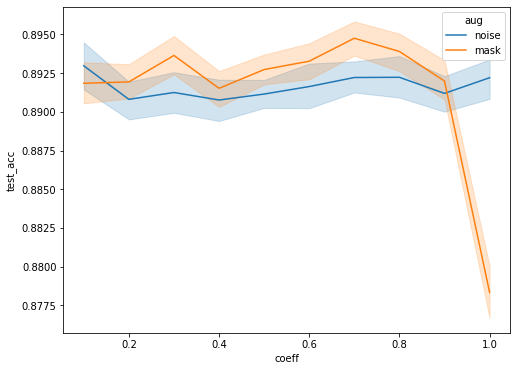

In [28]:
df_results = pd.read_csv("demo_augmentation_method_tcga_009.csv")
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)
plt.figure(figsize=(8, 6))
sns.lineplot(data=df_le, x="coeff", y="test_acc", hue="aug")

# Batch size SwAV

In [25]:
name = "demo_batch_size_swav_tcga_009"
logger = LogResults(name, ["bs"])

batch_sizes = [32, 64, 128, 256, 512, 1024]

for i in range(5):
    for bs in batch_sizes:
        
        logger.update_hyps([bs])
        
        config_swav = {
            "epochs": 200,
            "lr_init": 0.0001,
            "early_stop": 5,
            "coeff": 0.6,
        }
        
        # SwAV training
        
        idx = generate_indices(dataset)
        dataloaders = get_dataloaders(cancer_dataset, idx, [bs, 256, 256])
        net_swav = NetSwav(input_dim, nproto=60).to(device)
        train_swav_tcga(config_swav, dataloaders, net_swav, device, config_swav["early_stop"], eps=0.09)
        torch.save(net_swav.state_dict(), "data/s12/swav_state_dict_0.pt")
        
        # Finetuning and evaluation
        
        idx = generate_indices(dataset, prop=0.03)
        base_bs = 256
        margin = 0.5
        bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))
        dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])
        
        config_nn = {
            "epochs": 200,
            "lr_init": 0.001,
            "early_stop": 5,
        }
        
        for j in range(10):
            net = Net(input_dim, output_dim).to(device)
            transfer_weights(net, f"data/s12/swav_state_dict_0.pt")
            train_nn(config_nn, dataloaders, net, weights=None, early_stop=config_nn["early_stop"], log=False, logger=logger)
            logger.next_run()
            logger.show_progression()
            
        logger.save_csv()

9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=3.7253 | SwAVEvalLoss=3.4537 |
| Epoch:   2/200 | SwAVTrainLoss=3.3533 | SwAVEvalLoss=3.2452 |
| Epoch:   3/200 | SwAVTrainLoss=3.1342 | SwAVEvalLoss=3.0063 |
| Epoch:   4/200 | SwAVTrainLoss=2.9731 | SwAVEvalLoss=2.9174 |
| Epoch:   5/200 | SwAVTrainLoss=2.8792 | SwAVEvalLoss=2.8914 |
| Epoch:   6/200 | SwAVTrainLoss=2.8156 | SwAVEvalLoss=2.7478 |
| Epoch:   7/200 | SwAVTrainLoss=2.7805 | SwAVEvalLoss=2.7345 |
| Epoch:   8/200 | SwAVTrainLoss=2.7379 | SwAVEvalLoss=2.7070 |
| Epoch:   9/200 | SwAVTrainLoss=2.7169 | SwAVEvalLoss=2.6631 |
| Epoch:  10/200 | SwAVTrainLoss=2.6836 | SwAVEvalLoss=2.6374 |
INFO: Early stopping counter 1 of 5
| Epoch:  11/200 | SwAVTrainLoss=2.6444 | SwAVEvalLoss=2.6768 |
| Epoch:  12/200 | SwAVTrainLoss=2.6202 | SwAVEvalLoss=2.5650 |
| Epoch:  13/200 | SwAVTrainLoss=2.5917 | SwAVEvalLoss=2.5356 |
INFO: Early stop


Iteration 8, below are the last 5 epochs :
        id epoch   val_acc  val_loss  test_acc  test_loss  bs
222  run-7    23  0.884533  0.628332  0.883108   0.683665  32
223  run-7    24  0.890948  0.622183  0.880969   0.656986  32
224  run-7    25  0.890235  0.610335  0.882395   0.639555  32
225  run-7    26  0.886671  0.588852  0.884533   0.626171  32
226  run-7    27  0.887384  0.569784  0.882395   0.603689  32

Iteration 9, below are the last 5 epochs :
        id epoch   val_acc  val_loss  test_acc  test_loss  bs
252  run-8    25  0.885959  0.560248  0.889522   0.587620  32
253  run-8    26  0.882395  0.554817  0.890235   0.591711  32
254  run-8    27  0.885959  0.541889  0.885959   0.568286  32
255  run-8    28  0.885959  0.533949  0.889522   0.562458  32
256  run-8    29  0.884533  0.515833  0.894512   0.548809  32

Iteration 10, below are the last 5 epochs :
        id epoch   val_acc  val_loss  test_acc  test_loss  bs
288  run-9    31  0.893086  0.530641  0.895225   0.532017  32


Iteration 14, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  bs
376  run-13    17  0.893799  0.681422  0.892373   0.712048  64
377  run-13    18  0.893086  0.652239  0.892373   0.689458  64
378  run-13    19  0.895225  0.630848  0.890235   0.648409  64
379  run-13    20  0.895937  0.607289  0.893799   0.638856  64
380  run-13    21  0.895225  0.585454  0.896650   0.621873  64

Iteration 15, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  bs
398  run-14    17  0.892373  0.701268  0.890948   0.724283  64
399  run-14    18  0.892373  0.668003  0.891661   0.691581  64
400  run-14    19  0.890235  0.645804  0.891661   0.655978  64
401  run-14    20  0.893799  0.630354  0.889522   0.645794  64
402  run-14    21  0.890948  0.607521  0.891661   0.626931  64

Iteration 16, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  bs
417  run-15    14  0.898076  0.792658  0.89308


Iteration 24, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss   bs
600  run-23    22  0.888810  0.608786  0.893799   0.649400  128
601  run-23    23  0.893799  0.596613  0.893086   0.638461  128
602  run-23    24  0.895225  0.590255  0.893799   0.625873  128
603  run-23    25  0.890948  0.577918  0.895225   0.608888  128
604  run-23    26  0.890235  0.563150  0.893799   0.598000  128

Iteration 25, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss   bs
618  run-24    13  0.882395  0.881178  0.883820   0.933438  128
619  run-24    14  0.883820  0.832473  0.885246   0.883142  128
620  run-24    15  0.883820  0.788375  0.887384   0.844721  128
621  run-24    16  0.885959  0.748349  0.882395   0.795227  128
622  run-24    17  0.885246  0.721797  0.883820   0.771421  128

Iteration 26, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss   bs
639  run-25    16  0.890948  0.77

INFO: Early stopping counter 1 of 5
| Epoch:  69/200 | SwAVTrainLoss=1.4502 | SwAVEvalLoss=1.5579 |
INFO: Early stopping counter 2 of 5
| Epoch:  70/200 | SwAVTrainLoss=1.4425 | SwAVEvalLoss=1.5724 |
| Epoch:  71/200 | SwAVTrainLoss=1.4490 | SwAVEvalLoss=1.5204 |
INFO: Early stopping counter 1 of 5
| Epoch:  72/200 | SwAVTrainLoss=1.4323 | SwAVEvalLoss=1.5924 |
INFO: Early stopping counter 2 of 5
| Epoch:  73/200 | SwAVTrainLoss=1.4370 | SwAVEvalLoss=1.5385 |
INFO: Early stopping counter 3 of 5
| Epoch:  74/200 | SwAVTrainLoss=1.4355 | SwAVEvalLoss=1.5798 |
INFO: Early stopping counter 4 of 5
| Epoch:  75/200 | SwAVTrainLoss=1.4371 | SwAVEvalLoss=1.5605 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 31, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss   bs
736  run-30    11  0.886671  0.967132  0.888810   1.009

INFO: Early stopping counter 2 of 5
| Epoch:  44/200 | SwAVTrainLoss=1.3143 | SwAVEvalLoss=1.5269 |
| Epoch:  45/200 | SwAVTrainLoss=1.3035 | SwAVEvalLoss=1.5065 |
| Epoch:  46/200 | SwAVTrainLoss=1.2960 | SwAVEvalLoss=1.4991 |
| Epoch:  47/200 | SwAVTrainLoss=1.2859 | SwAVEvalLoss=1.4809 |
| Epoch:  48/200 | SwAVTrainLoss=1.2776 | SwAVEvalLoss=1.4486 |
INFO: Early stopping counter 1 of 5
| Epoch:  49/200 | SwAVTrainLoss=1.2490 | SwAVEvalLoss=1.4576 |
| Epoch:  50/200 | SwAVTrainLoss=1.2460 | SwAVEvalLoss=1.4437 |
INFO: Early stopping counter 1 of 5
| Epoch:  51/200 | SwAVTrainLoss=1.2504 | SwAVEvalLoss=1.4840 |
INFO: Early stopping counter 2 of 5
| Epoch:  52/200 | SwAVTrainLoss=1.2553 | SwAVEvalLoss=1.4459 |
INFO: Early stopping counter 3 of 5
| Epoch:  53/200 | SwAVTrainLoss=1.2285 | SwAVEvalLoss=1.4739 |
INFO: Early stopping counter 4 of 5
| Epoch:  54/200 | SwAVTrainLoss=1.2159 | SwAVEvalLoss=1.4525 |
| Epoch:  55/200 | SwAVTrainLoss=1.2084 | SwAVEvalLoss=1.4162 |
INFO: Early stop

| Epoch:   1/200 | SwAVTrainLoss=4.4390 | SwAVEvalLoss=4.0697 |
| Epoch:   2/200 | SwAVTrainLoss=3.8952 | SwAVEvalLoss=3.7311 |
| Epoch:   3/200 | SwAVTrainLoss=3.6837 | SwAVEvalLoss=3.6290 |
| Epoch:   4/200 | SwAVTrainLoss=3.6034 | SwAVEvalLoss=3.5765 |
| Epoch:   5/200 | SwAVTrainLoss=3.5538 | SwAVEvalLoss=3.5338 |
| Epoch:   6/200 | SwAVTrainLoss=3.5098 | SwAVEvalLoss=3.4887 |
| Epoch:   7/200 | SwAVTrainLoss=3.4638 | SwAVEvalLoss=3.4463 |
| Epoch:   8/200 | SwAVTrainLoss=3.4164 | SwAVEvalLoss=3.4096 |
| Epoch:   9/200 | SwAVTrainLoss=3.3638 | SwAVEvalLoss=3.3532 |
| Epoch:  10/200 | SwAVTrainLoss=3.3106 | SwAVEvalLoss=3.3047 |
| Epoch:  11/200 | SwAVTrainLoss=3.2555 | SwAVEvalLoss=3.2565 |
| Epoch:  12/200 | SwAVTrainLoss=3.1940 | SwAVEvalLoss=3.1835 |
| Epoch:  13/200 | SwAVTrainLoss=3.1292 | SwAVEvalLoss=3.1304 |
| Epoch:  14/200 | SwAVTrainLoss=3.0606 | SwAVEvalLoss=3.0592 |
| Epoch:  15/200 | SwAVTrainLoss=2.9932 | SwAVEvalLoss=2.9933 |
| Epoch:  16/200 | SwAVTrainLoss=2.9173 


Iteration 58, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss    bs
1225  run-57     9  0.879544  0.970559  0.880969   1.021610  1024
1226  run-57    10  0.882395  0.924345  0.883108   0.977119  1024
1227  run-57    11  0.882395  0.891253  0.883820   0.943407  1024
1228  run-57    12  0.884533  0.856552  0.883108   0.907059  1024
1229  run-57    13  0.883108  0.823575  0.884533   0.884191  1024

Iteration 59, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss    bs
1246  run-58    16  0.888097  0.729394  0.883108   0.759813  1024
1247  run-58    17  0.889522  0.702333  0.884533   0.726087  1024
1248  run-58    18  0.889522  0.684996  0.888097   0.711600  1024
1249  run-58    19  0.892373  0.663137  0.893799   0.692058  1024
1250  run-58    20  0.890948  0.644528  0.887384   0.679523  1024

Iteration 60, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss    bs
1274  r

| Epoch:   2/200 | SwAVTrainLoss=3.4175 | SwAVEvalLoss=3.2628 |
| Epoch:   3/200 | SwAVTrainLoss=3.1392 | SwAVEvalLoss=2.9731 |
| Epoch:   4/200 | SwAVTrainLoss=2.8953 | SwAVEvalLoss=2.7786 |
| Epoch:   5/200 | SwAVTrainLoss=2.7348 | SwAVEvalLoss=2.6593 |
| Epoch:   6/200 | SwAVTrainLoss=2.6386 | SwAVEvalLoss=2.5539 |
| Epoch:   7/200 | SwAVTrainLoss=2.5701 | SwAVEvalLoss=2.5470 |
| Epoch:   8/200 | SwAVTrainLoss=2.5332 | SwAVEvalLoss=2.4843 |
| Epoch:   9/200 | SwAVTrainLoss=2.5003 | SwAVEvalLoss=2.4530 |
| Epoch:  10/200 | SwAVTrainLoss=2.4624 | SwAVEvalLoss=2.4482 |
| Epoch:  11/200 | SwAVTrainLoss=2.4445 | SwAVEvalLoss=2.3931 |
INFO: Early stopping counter 1 of 5
| Epoch:  12/200 | SwAVTrainLoss=2.4191 | SwAVEvalLoss=2.4176 |
| Epoch:  13/200 | SwAVTrainLoss=2.3847 | SwAVEvalLoss=2.3406 |
| Epoch:  14/200 | SwAVTrainLoss=2.3599 | SwAVEvalLoss=2.3358 |
| Epoch:  15/200 | SwAVTrainLoss=2.3435 | SwAVEvalLoss=2.3191 |
| Epoch:  16/200 | SwAVTrainLoss=2.3189 | SwAVEvalLoss=2.2875 |
INFO

| Epoch:  16/200 | SwAVTrainLoss=2.1730 | SwAVEvalLoss=2.2004 |
| Epoch:  17/200 | SwAVTrainLoss=2.1509 | SwAVEvalLoss=2.1516 |
| Epoch:  18/200 | SwAVTrainLoss=2.1244 | SwAVEvalLoss=2.1253 |
INFO: Early stopping counter 1 of 5
| Epoch:  19/200 | SwAVTrainLoss=2.1135 | SwAVEvalLoss=2.1575 |
| Epoch:  20/200 | SwAVTrainLoss=2.1017 | SwAVEvalLoss=2.1234 |
| Epoch:  21/200 | SwAVTrainLoss=2.0825 | SwAVEvalLoss=2.0692 |
| Epoch:  22/200 | SwAVTrainLoss=2.0660 | SwAVEvalLoss=2.0551 |
INFO: Early stopping counter 1 of 5
| Epoch:  23/200 | SwAVTrainLoss=2.0486 | SwAVEvalLoss=2.0902 |
| Epoch:  24/200 | SwAVTrainLoss=2.0376 | SwAVEvalLoss=2.0295 |
INFO: Early stopping counter 1 of 5
| Epoch:  25/200 | SwAVTrainLoss=2.0288 | SwAVEvalLoss=2.0530 |
| Epoch:  26/200 | SwAVTrainLoss=2.0268 | SwAVEvalLoss=2.0287 |
| Epoch:  27/200 | SwAVTrainLoss=2.0119 | SwAVEvalLoss=2.0233 |
| Epoch:  28/200 | SwAVTrainLoss=2.0079 | SwAVEvalLoss=2.0146 |
| Epoch:  29/200 | SwAVTrainLoss=1.9904 | SwAVEvalLoss=2.011


Iteration 89, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   bs
1886  run-88    16  0.893086  0.737412  0.896650   0.756686  128
1887  run-88    17  0.890948  0.696190  0.893799   0.721413  128
1888  run-88    18  0.893799  0.664557  0.893086   0.691391  128
1889  run-88    19  0.895225  0.634489  0.895225   0.661767  128
1890  run-88    20  0.891661  0.617212  0.888810   0.640049  128

Iteration 90, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   bs
1907  run-89    16  0.894512  0.719204  0.895937   0.761281  128
1908  run-89    17  0.893086  0.695049  0.898788   0.722404  128
1909  run-89    18  0.893799  0.650619  0.896650   0.700768  128
1910  run-89    19  0.893799  0.636864  0.892373   0.664305  128
1911  run-89    20  0.894512  0.615221  0.893799   0.635424  128
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/2


Iteration 96, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   bs
2022  run-95    15  0.887384  0.813895  0.882395   0.856593  256
2023  run-95    16  0.889522  0.778660  0.886671   0.821932  256
2024  run-95    17  0.883820  0.746159  0.884533   0.786827  256
2025  run-95    18  0.885959  0.720175  0.883108   0.761807  256
2026  run-95    19  0.886671  0.696174  0.885959   0.740188  256

Iteration 97, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   bs
2039  run-96    12  0.893799  0.932036  0.890948   0.967638  256
2040  run-96    13  0.893799  0.872167  0.889522   0.926484  256
2041  run-96    14  0.894512  0.823131  0.888097   0.871367  256
2042  run-96    15  0.893799  0.789164  0.887384   0.830837  256
2043  run-96    16  0.895225  0.746316  0.895937   0.796615  256

Iteration 98, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss   bs
2054  run-97    10  


Iteration 104, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   bs
2165  run-103    15  0.888810  0.737830  0.895937   0.770504  512
2166  run-103    16  0.889522  0.706898  0.893086   0.750215  512
2167  run-103    17  0.886671  0.695505  0.891661   0.718368  512
2168  run-103    18  0.888810  0.668443  0.889522   0.696025  512
2169  run-103    19  0.886671  0.651928  0.893086   0.683260  512

Iteration 105, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   bs
2180  run-104    10  0.886671  0.943694  0.890235   0.992370  512
2181  run-104    11  0.885959  0.896338  0.893086   0.950842  512
2182  run-104    12  0.888810  0.850694  0.889522   0.908125  512
2183  run-104    13  0.889522  0.814984  0.893799   0.854768  512
2184  run-104    14  0.890235  0.779084  0.891661   0.824683  512

Iteration 106, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   bs
2201

INFO: Early stopping counter 2 of 5
| Epoch:  70/200 | SwAVTrainLoss=1.0419 | SwAVEvalLoss=1.3731 |
| Epoch:  71/200 | SwAVTrainLoss=1.0354 | SwAVEvalLoss=1.3022 |
INFO: Early stopping counter 1 of 5
| Epoch:  72/200 | SwAVTrainLoss=1.0146 | SwAVEvalLoss=1.4512 |
INFO: Early stopping counter 2 of 5
| Epoch:  73/200 | SwAVTrainLoss=1.0089 | SwAVEvalLoss=1.3850 |
INFO: Early stopping counter 3 of 5
| Epoch:  74/200 | SwAVTrainLoss=1.0109 | SwAVEvalLoss=1.3076 |
INFO: Early stopping counter 4 of 5
| Epoch:  75/200 | SwAVTrainLoss=0.9971 | SwAVEvalLoss=1.3159 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 111, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss    bs
2298  run-110    20  0.886671  0.641210  0.880969   0.691688  1024
2299  run-110    21  0.887384  0.642665  0.882395   0.667339  1024
2300  run-110    

INFO: Early stopping counter 1 of 5
| Epoch:  40/200 | SwAVTrainLoss=2.2309 | SwAVEvalLoss=2.2369 |
| Epoch:  41/200 | SwAVTrainLoss=2.2365 | SwAVEvalLoss=2.1993 |
INFO: Early stopping counter 1 of 5
| Epoch:  42/200 | SwAVTrainLoss=2.2268 | SwAVEvalLoss=2.2004 |
| Epoch:  43/200 | SwAVTrainLoss=2.2094 | SwAVEvalLoss=2.1738 |
| Epoch:  44/200 | SwAVTrainLoss=2.1924 | SwAVEvalLoss=2.1699 |
| Epoch:  45/200 | SwAVTrainLoss=2.1933 | SwAVEvalLoss=2.1174 |
INFO: Early stopping counter 1 of 5
| Epoch:  46/200 | SwAVTrainLoss=2.1730 | SwAVEvalLoss=2.1443 |
INFO: Early stopping counter 2 of 5
| Epoch:  47/200 | SwAVTrainLoss=2.1757 | SwAVEvalLoss=2.1316 |
INFO: Early stopping counter 3 of 5
| Epoch:  48/200 | SwAVTrainLoss=2.1789 | SwAVEvalLoss=2.2093 |
INFO: Early stopping counter 4 of 5
| Epoch:  49/200 | SwAVTrainLoss=2.1777 | SwAVEvalLoss=2.1497 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1

| Epoch:  38/200 | SwAVTrainLoss=2.0691 | SwAVEvalLoss=2.0642 |
INFO: Early stopping counter 1 of 5
| Epoch:  39/200 | SwAVTrainLoss=2.0626 | SwAVEvalLoss=2.0885 |
| Epoch:  40/200 | SwAVTrainLoss=2.0559 | SwAVEvalLoss=2.0502 |
INFO: Early stopping counter 1 of 5
| Epoch:  41/200 | SwAVTrainLoss=2.0411 | SwAVEvalLoss=2.0567 |
INFO: Early stopping counter 2 of 5
| Epoch:  42/200 | SwAVTrainLoss=2.0429 | SwAVEvalLoss=2.0712 |
| Epoch:  43/200 | SwAVTrainLoss=2.0384 | SwAVEvalLoss=2.0477 |
INFO: Early stopping counter 1 of 5
| Epoch:  44/200 | SwAVTrainLoss=2.0307 | SwAVEvalLoss=2.0510 |
| Epoch:  45/200 | SwAVTrainLoss=2.0203 | SwAVEvalLoss=2.0019 |
INFO: Early stopping counter 1 of 5
| Epoch:  46/200 | SwAVTrainLoss=2.0166 | SwAVEvalLoss=2.0449 |
INFO: Early stopping counter 2 of 5
| Epoch:  47/200 | SwAVTrainLoss=2.0057 | SwAVEvalLoss=2.0200 |
INFO: Early stopping counter 3 of 5
| Epoch:  48/200 | SwAVTrainLoss=1.9951 | SwAVEvalLoss=2.0192 |
| Epoch:  49/200 | SwAVTrainLoss=1.9982 | Sw

| Epoch:  16/200 | SwAVTrainLoss=2.1626 | SwAVEvalLoss=2.1471 |
| Epoch:  17/200 | SwAVTrainLoss=2.1386 | SwAVEvalLoss=2.1460 |
| Epoch:  18/200 | SwAVTrainLoss=2.1214 | SwAVEvalLoss=2.0836 |
INFO: Early stopping counter 1 of 5
| Epoch:  19/200 | SwAVTrainLoss=2.1002 | SwAVEvalLoss=2.1188 |
| Epoch:  20/200 | SwAVTrainLoss=2.0784 | SwAVEvalLoss=2.0787 |
| Epoch:  21/200 | SwAVTrainLoss=2.0729 | SwAVEvalLoss=2.0684 |
| Epoch:  22/200 | SwAVTrainLoss=2.0634 | SwAVEvalLoss=2.0606 |
INFO: Early stopping counter 1 of 5
| Epoch:  23/200 | SwAVTrainLoss=2.0586 | SwAVEvalLoss=2.0650 |
| Epoch:  24/200 | SwAVTrainLoss=2.0437 | SwAVEvalLoss=2.0480 |
| Epoch:  25/200 | SwAVTrainLoss=2.0297 | SwAVEvalLoss=2.0340 |
| Epoch:  26/200 | SwAVTrainLoss=2.0253 | SwAVEvalLoss=2.0262 |
| Epoch:  27/200 | SwAVTrainLoss=2.0088 | SwAVEvalLoss=2.0103 |
INFO: Early stopping counter 1 of 5
| Epoch:  28/200 | SwAVTrainLoss=1.9995 | SwAVEvalLoss=2.0252 |
| Epoch:  29/200 | SwAVTrainLoss=1.9946 | SwAVEvalLoss=2.009

| Epoch:  20/200 | SwAVTrainLoss=1.8704 | SwAVEvalLoss=1.9420 |
| Epoch:  21/200 | SwAVTrainLoss=1.8427 | SwAVEvalLoss=1.9264 |
| Epoch:  22/200 | SwAVTrainLoss=1.8199 | SwAVEvalLoss=1.8887 |
| Epoch:  23/200 | SwAVTrainLoss=1.7915 | SwAVEvalLoss=1.8714 |
| Epoch:  24/200 | SwAVTrainLoss=1.7720 | SwAVEvalLoss=1.8356 |
| Epoch:  25/200 | SwAVTrainLoss=1.7514 | SwAVEvalLoss=1.8115 |
| Epoch:  26/200 | SwAVTrainLoss=1.7393 | SwAVEvalLoss=1.7889 |
INFO: Early stopping counter 1 of 5
| Epoch:  27/200 | SwAVTrainLoss=1.7190 | SwAVEvalLoss=1.8107 |
| Epoch:  28/200 | SwAVTrainLoss=1.6972 | SwAVEvalLoss=1.7658 |
INFO: Early stopping counter 1 of 5
| Epoch:  29/200 | SwAVTrainLoss=1.6870 | SwAVEvalLoss=1.8099 |
| Epoch:  30/200 | SwAVTrainLoss=1.6622 | SwAVEvalLoss=1.7402 |
INFO: Early stopping counter 1 of 5
| Epoch:  31/200 | SwAVTrainLoss=1.6599 | SwAVEvalLoss=1.7594 |
INFO: Early stopping counter 2 of 5
| Epoch:  32/200 | SwAVTrainLoss=1.6506 | SwAVEvalLoss=1.7720 |
| Epoch:  33/200 | SwAVT

| Epoch:   8/200 | SwAVTrainLoss=3.0892 | SwAVEvalLoss=3.0699 |
| Epoch:   9/200 | SwAVTrainLoss=2.9873 | SwAVEvalLoss=2.9627 |
| Epoch:  10/200 | SwAVTrainLoss=2.8821 | SwAVEvalLoss=2.8675 |
| Epoch:  11/200 | SwAVTrainLoss=2.7694 | SwAVEvalLoss=2.7607 |
| Epoch:  12/200 | SwAVTrainLoss=2.6608 | SwAVEvalLoss=2.6466 |
| Epoch:  13/200 | SwAVTrainLoss=2.5558 | SwAVEvalLoss=2.5576 |
| Epoch:  14/200 | SwAVTrainLoss=2.4469 | SwAVEvalLoss=2.4525 |
| Epoch:  15/200 | SwAVTrainLoss=2.3491 | SwAVEvalLoss=2.3681 |
| Epoch:  16/200 | SwAVTrainLoss=2.2550 | SwAVEvalLoss=2.2789 |
| Epoch:  17/200 | SwAVTrainLoss=2.1676 | SwAVEvalLoss=2.2371 |
| Epoch:  18/200 | SwAVTrainLoss=2.0978 | SwAVEvalLoss=2.1774 |
| Epoch:  19/200 | SwAVTrainLoss=2.0290 | SwAVEvalLoss=2.0964 |
| Epoch:  20/200 | SwAVTrainLoss=1.9678 | SwAVEvalLoss=2.0317 |
| Epoch:  21/200 | SwAVTrainLoss=1.9084 | SwAVEvalLoss=1.9933 |
| Epoch:  22/200 | SwAVTrainLoss=1.8566 | SwAVEvalLoss=1.9337 |
INFO: Early stopping counter 1 of 5
| Ep

| Epoch:   1/200 | SwAVTrainLoss=4.4368 | SwAVEvalLoss=4.0157 |
| Epoch:   2/200 | SwAVTrainLoss=3.8112 | SwAVEvalLoss=3.6808 |
| Epoch:   3/200 | SwAVTrainLoss=3.6292 | SwAVEvalLoss=3.5765 |
| Epoch:   4/200 | SwAVTrainLoss=3.5500 | SwAVEvalLoss=3.5226 |
| Epoch:   5/200 | SwAVTrainLoss=3.4960 | SwAVEvalLoss=3.4763 |
| Epoch:   6/200 | SwAVTrainLoss=3.4441 | SwAVEvalLoss=3.4329 |
| Epoch:   7/200 | SwAVTrainLoss=3.3930 | SwAVEvalLoss=3.3827 |
| Epoch:   8/200 | SwAVTrainLoss=3.3448 | SwAVEvalLoss=3.3371 |
| Epoch:   9/200 | SwAVTrainLoss=3.2912 | SwAVEvalLoss=3.2863 |
| Epoch:  10/200 | SwAVTrainLoss=3.2325 | SwAVEvalLoss=3.2249 |
| Epoch:  11/200 | SwAVTrainLoss=3.1699 | SwAVEvalLoss=3.1661 |
| Epoch:  12/200 | SwAVTrainLoss=3.1119 | SwAVEvalLoss=3.1096 |
| Epoch:  13/200 | SwAVTrainLoss=3.0475 | SwAVEvalLoss=3.0398 |
| Epoch:  14/200 | SwAVTrainLoss=2.9781 | SwAVEvalLoss=2.9791 |
| Epoch:  15/200 | SwAVTrainLoss=2.9065 | SwAVEvalLoss=2.8986 |
| Epoch:  16/200 | SwAVTrainLoss=2.8314 


Iteration 178, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss    bs
3678  run-177    12  0.888097  0.859196  0.884533   0.894601  1024
3679  run-177    13  0.888097  0.822384  0.885959   0.853984  1024
3680  run-177    14  0.885959  0.774506  0.888810   0.826237  1024
3681  run-177    15  0.884533  0.763949  0.878831   0.792260  1024
3682  run-177    16  0.886671  0.739444  0.888097   0.773409  1024

Iteration 179, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss    bs
3699  run-178    16  0.891661  0.746426  0.892373   0.785803  1024
3700  run-178    17  0.892373  0.716476  0.893799   0.755106  1024
3701  run-178    18  0.894512  0.692088  0.895225   0.739287  1024
3702  run-178    19  0.895225  0.673148  0.895225   0.724875  1024
3703  run-178    20  0.891661  0.651263  0.896650   0.700501  1024

Iteration 180, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_lo


Iteration 187, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
3918  run-186    26  0.883820  0.566085  0.890948   0.581977  32
3919  run-186    27  0.885246  0.561064  0.894512   0.577177  32
3920  run-186    28  0.889522  0.545004  0.895225   0.563158  32
3921  run-186    29  0.885959  0.533954  0.894512   0.563041  32
3922  run-186    30  0.888810  0.540137  0.896650   0.551523  32

Iteration 188, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
3939  run-187    16  0.885959  0.802567  0.898788   0.832806  32
3940  run-187    17  0.889522  0.763700  0.896650   0.778143  32
3941  run-187    18  0.888810  0.727542  0.899501   0.759007  32
3942  run-187    19  0.890235  0.691472  0.897363   0.726904  32
3943  run-187    20  0.890948  0.667407  0.899501   0.699308  32

Iteration 189, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
3961  run-188    


Iteration 192, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
4032  run-191    19  0.887384  0.653893  0.895937   0.672334  64
4033  run-191    20  0.888810  0.642981  0.893799   0.655140  64
4034  run-191    21  0.892373  0.618878  0.890948   0.635167  64
4035  run-191    22  0.890235  0.611202  0.895937   0.613702  64
4036  run-191    23  0.892373  0.582525  0.893799   0.602649  64

Iteration 193, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
4055  run-192    18  0.897363  0.702020  0.900214   0.735664  64
4056  run-192    19  0.895937  0.672637  0.895937   0.706945  64
4057  run-192    20  0.895937  0.645173  0.897363   0.679863  64
4058  run-192    21  0.894512  0.622731  0.900927   0.657734  64
4059  run-192    22  0.895225  0.606304  0.895937   0.644639  64

Iteration 194, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
4079  run-193    


Iteration 202, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   bs
4265  run-201    13  0.892373  0.936457  0.890235   0.955093  128
4266  run-201    14  0.888810  0.874392  0.889522   0.909690  128
4267  run-201    15  0.893799  0.833232  0.889522   0.858751  128
4268  run-201    16  0.893799  0.777090  0.888097   0.813381  128
4269  run-201    17  0.893799  0.742534  0.889522   0.766290  128

Iteration 203, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   bs
4286  run-202    16  0.887384  0.748998  0.885246   0.775793  128
4287  run-202    17  0.890235  0.714215  0.885959   0.733964  128
4288  run-202    18  0.888097  0.673021  0.888097   0.715965  128
4289  run-202    19  0.890235  0.665915  0.885959   0.691118  128
4290  run-202    20  0.890948  0.633428  0.883820   0.662600  128

Iteration 204, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   bs
4303

INFO: Early stopping counter 4 of 5
| Epoch:  55/200 | SwAVTrainLoss=1.5176 | SwAVEvalLoss=1.5989 |
| Epoch:  56/200 | SwAVTrainLoss=1.5025 | SwAVEvalLoss=1.5842 |
INFO: Early stopping counter 1 of 5
| Epoch:  57/200 | SwAVTrainLoss=1.5028 | SwAVEvalLoss=1.6063 |
INFO: Early stopping counter 2 of 5
| Epoch:  58/200 | SwAVTrainLoss=1.5093 | SwAVEvalLoss=1.6012 |
| Epoch:  59/200 | SwAVTrainLoss=1.5042 | SwAVEvalLoss=1.5824 |
INFO: Early stopping counter 1 of 5
| Epoch:  60/200 | SwAVTrainLoss=1.4978 | SwAVEvalLoss=1.6280 |
INFO: Early stopping counter 2 of 5
| Epoch:  61/200 | SwAVTrainLoss=1.4918 | SwAVEvalLoss=1.6532 |
| Epoch:  62/200 | SwAVTrainLoss=1.4884 | SwAVEvalLoss=1.5808 |
| Epoch:  63/200 | SwAVTrainLoss=1.4917 | SwAVEvalLoss=1.5749 |
INFO: Early stopping counter 1 of 5
| Epoch:  64/200 | SwAVTrainLoss=1.4857 | SwAVEvalLoss=1.5773 |
| Epoch:  65/200 | SwAVTrainLoss=1.4810 | SwAVEvalLoss=1.5290 |
INFO: Early stopping counter 1 of 5
| Epoch:  66/200 | SwAVTrainLoss=1.4775 | Sw

| Epoch:  28/200 | SwAVTrainLoss=1.7539 | SwAVEvalLoss=1.8529 |
INFO: Early stopping counter 1 of 5
| Epoch:  29/200 | SwAVTrainLoss=1.7015 | SwAVEvalLoss=1.8722 |
| Epoch:  30/200 | SwAVTrainLoss=1.6646 | SwAVEvalLoss=1.7963 |
| Epoch:  31/200 | SwAVTrainLoss=1.6262 | SwAVEvalLoss=1.7778 |
| Epoch:  32/200 | SwAVTrainLoss=1.5984 | SwAVEvalLoss=1.7344 |
| Epoch:  33/200 | SwAVTrainLoss=1.5668 | SwAVEvalLoss=1.6764 |
INFO: Early stopping counter 1 of 5
| Epoch:  34/200 | SwAVTrainLoss=1.5418 | SwAVEvalLoss=1.7075 |
| Epoch:  35/200 | SwAVTrainLoss=1.5047 | SwAVEvalLoss=1.6530 |
INFO: Early stopping counter 1 of 5
| Epoch:  36/200 | SwAVTrainLoss=1.4881 | SwAVEvalLoss=1.6578 |
| Epoch:  37/200 | SwAVTrainLoss=1.4657 | SwAVEvalLoss=1.6240 |
| Epoch:  38/200 | SwAVTrainLoss=1.4577 | SwAVEvalLoss=1.5945 |
| Epoch:  39/200 | SwAVTrainLoss=1.4157 | SwAVEvalLoss=1.5706 |
INFO: Early stopping counter 1 of 5
| Epoch:  40/200 | SwAVTrainLoss=1.4040 | SwAVEvalLoss=1.5923 |
| Epoch:  41/200 | SwAVT

| Epoch:  17/200 | SwAVTrainLoss=2.8329 | SwAVEvalLoss=2.8594 |
| Epoch:  18/200 | SwAVTrainLoss=2.7649 | SwAVEvalLoss=2.7855 |
| Epoch:  19/200 | SwAVTrainLoss=2.6983 | SwAVEvalLoss=2.7251 |
| Epoch:  20/200 | SwAVTrainLoss=2.6236 | SwAVEvalLoss=2.6951 |
| Epoch:  21/200 | SwAVTrainLoss=2.5615 | SwAVEvalLoss=2.6018 |
| Epoch:  22/200 | SwAVTrainLoss=2.4924 | SwAVEvalLoss=2.5477 |
| Epoch:  23/200 | SwAVTrainLoss=2.4271 | SwAVEvalLoss=2.4719 |
| Epoch:  24/200 | SwAVTrainLoss=2.3673 | SwAVEvalLoss=2.4376 |
| Epoch:  25/200 | SwAVTrainLoss=2.3027 | SwAVEvalLoss=2.3630 |
| Epoch:  26/200 | SwAVTrainLoss=2.2384 | SwAVEvalLoss=2.3122 |
| Epoch:  27/200 | SwAVTrainLoss=2.1819 | SwAVEvalLoss=2.2780 |
| Epoch:  28/200 | SwAVTrainLoss=2.1193 | SwAVEvalLoss=2.2310 |
| Epoch:  29/200 | SwAVTrainLoss=2.0658 | SwAVEvalLoss=2.1657 |
| Epoch:  30/200 | SwAVTrainLoss=2.0049 | SwAVEvalLoss=2.1293 |
| Epoch:  31/200 | SwAVTrainLoss=1.9513 | SwAVEvalLoss=2.0678 |
| Epoch:  32/200 | SwAVTrainLoss=1.9174 


Iteration 239, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss    bs
4987  run-238    19  0.888097  0.654647  0.873842   0.692391  1024
4988  run-238    20  0.890235  0.630006  0.875980   0.679301  1024
4989  run-238    21  0.890235  0.628354  0.872416   0.667331  1024
4990  run-238    22  0.891661  0.612134  0.877406   0.651664  1024
4991  run-238    23  0.888810  0.615452  0.873842   0.640326  1024

Iteration 240, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss    bs
5003  run-239    11  0.882395  0.788816  0.871703   0.838500  1024
5004  run-239    12  0.884533  0.753784  0.870278   0.804258  1024
5005  run-239    13  0.886671  0.723203  0.867427   0.768595  1024
5006  run-239    14  0.890235  0.705022  0.861725   0.750858  1024
5007  run-239    15  0.888810  0.683043  0.856023   0.722826  1024
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in 


Iteration 250, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
5243  run-249    19  0.892373  0.602061  0.896650   0.637501  32
5244  run-249    20  0.893799  0.593029  0.895937   0.614404  32
5245  run-249    21  0.891661  0.568641  0.896650   0.593909  32
5246  run-249    22  0.890948  0.560086  0.893799   0.591172  32
5247  run-249    23  0.893086  0.540413  0.896650   0.569877  32
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=3.8329 | SwAVEvalLoss=3.5602 |
| Epoch:   2/200 | SwAVTrainLoss=3.4566 | SwAVEvalLoss=3.3243 |
| Epoch:   3/200 | SwAVTrainLoss=3.2103 | SwAVEvalLoss=3.0862 |
| Epoch:   4/200 | SwAVTrainLoss=2.9863 | SwAVEvalLoss=2.8699 |
| Epoch:   5/200 | SwAVTrainLoss=2.8065 | SwAVEvalLoss=2.7163 |
| Epoch:   6/200 | SwAVTrainLoss=2.6933 | SwAVEvalLoss=2.6110 |
| Epoch:   7/200 | SwAVTrainLoss=2.6130 | SwAVEvalLoss=2.5780 |



Iteration 253, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
5313  run-252    16  0.888810  0.739177  0.892373   0.767312  64
5314  run-252    17  0.891661  0.712959  0.898788   0.739798  64
5315  run-252    18  0.893086  0.679148  0.897363   0.705049  64
5316  run-252    19  0.886671  0.656115  0.898076   0.674797  64
5317  run-252    20  0.889522  0.626769  0.896650   0.647422  64

Iteration 254, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
5337  run-253    19  0.888097  0.664915  0.895225   0.694526  64
5338  run-253    20  0.885959  0.634131  0.893086   0.662473  64
5339  run-253    21  0.887384  0.615389  0.892373   0.635971  64
5340  run-253    22  0.888097  0.587591  0.895225   0.626466  64
5341  run-253    23  0.888097  0.579192  0.895225   0.603887  64

Iteration 255, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss  bs
5364  run-254    

| Epoch:  61/200 | SwAVTrainLoss=1.7776 | SwAVEvalLoss=1.7850 |
INFO: Early stopping counter 1 of 5
| Epoch:  62/200 | SwAVTrainLoss=1.7687 | SwAVEvalLoss=1.7916 |
INFO: Early stopping counter 2 of 5
| Epoch:  63/200 | SwAVTrainLoss=1.7625 | SwAVEvalLoss=1.8172 |
| Epoch:  64/200 | SwAVTrainLoss=1.7575 | SwAVEvalLoss=1.7834 |
INFO: Early stopping counter 1 of 5
| Epoch:  65/200 | SwAVTrainLoss=1.7472 | SwAVEvalLoss=1.8075 |
INFO: Early stopping counter 2 of 5
| Epoch:  66/200 | SwAVTrainLoss=1.7421 | SwAVEvalLoss=1.8314 |
| Epoch:  67/200 | SwAVTrainLoss=1.7495 | SwAVEvalLoss=1.7750 |
| Epoch:  68/200 | SwAVTrainLoss=1.7476 | SwAVEvalLoss=1.7511 |
INFO: Early stopping counter 1 of 5
| Epoch:  69/200 | SwAVTrainLoss=1.7385 | SwAVEvalLoss=1.7735 |
INFO: Early stopping counter 2 of 5
| Epoch:  70/200 | SwAVTrainLoss=1.7376 | SwAVEvalLoss=1.7715 |
INFO: Early stopping counter 3 of 5
| Epoch:  71/200 | SwAVTrainLoss=1.7173 | SwAVEvalLoss=1.7620 |
| Epoch:  72/200 | SwAVTrainLoss=1.7131 | Sw

| Epoch:  29/200 | SwAVTrainLoss=1.7316 | SwAVEvalLoss=1.7883 |
| Epoch:  30/200 | SwAVTrainLoss=1.7145 | SwAVEvalLoss=1.7821 |
| Epoch:  31/200 | SwAVTrainLoss=1.6985 | SwAVEvalLoss=1.7522 |
INFO: Early stopping counter 1 of 5
| Epoch:  32/200 | SwAVTrainLoss=1.6906 | SwAVEvalLoss=1.7545 |
INFO: Early stopping counter 2 of 5
| Epoch:  33/200 | SwAVTrainLoss=1.6793 | SwAVEvalLoss=1.7670 |
| Epoch:  34/200 | SwAVTrainLoss=1.6697 | SwAVEvalLoss=1.7442 |
| Epoch:  35/200 | SwAVTrainLoss=1.6609 | SwAVEvalLoss=1.7159 |
| Epoch:  36/200 | SwAVTrainLoss=1.6528 | SwAVEvalLoss=1.7119 |
INFO: Early stopping counter 1 of 5
| Epoch:  37/200 | SwAVTrainLoss=1.6434 | SwAVEvalLoss=1.7185 |
| Epoch:  38/200 | SwAVTrainLoss=1.6296 | SwAVEvalLoss=1.7046 |
| Epoch:  39/200 | SwAVTrainLoss=1.6333 | SwAVEvalLoss=1.6986 |
| Epoch:  40/200 | SwAVTrainLoss=1.6155 | SwAVEvalLoss=1.6702 |
INFO: Early stopping counter 1 of 5
| Epoch:  41/200 | SwAVTrainLoss=1.6090 | SwAVEvalLoss=1.6759 |
INFO: Early stopping cou

| Epoch:  27/200 | SwAVTrainLoss=1.7194 | SwAVEvalLoss=1.8182 |
| Epoch:  28/200 | SwAVTrainLoss=1.6779 | SwAVEvalLoss=1.8127 |
| Epoch:  29/200 | SwAVTrainLoss=1.6584 | SwAVEvalLoss=1.7820 |
| Epoch:  30/200 | SwAVTrainLoss=1.6234 | SwAVEvalLoss=1.7768 |
| Epoch:  31/200 | SwAVTrainLoss=1.5923 | SwAVEvalLoss=1.7284 |
| Epoch:  32/200 | SwAVTrainLoss=1.5808 | SwAVEvalLoss=1.7091 |
INFO: Early stopping counter 1 of 5
| Epoch:  33/200 | SwAVTrainLoss=1.5420 | SwAVEvalLoss=1.7162 |
| Epoch:  34/200 | SwAVTrainLoss=1.5201 | SwAVEvalLoss=1.6584 |
INFO: Early stopping counter 1 of 5
| Epoch:  35/200 | SwAVTrainLoss=1.5066 | SwAVEvalLoss=1.6607 |
| Epoch:  36/200 | SwAVTrainLoss=1.4807 | SwAVEvalLoss=1.6059 |
INFO: Early stopping counter 1 of 5
| Epoch:  37/200 | SwAVTrainLoss=1.4601 | SwAVEvalLoss=1.6351 |
INFO: Early stopping counter 2 of 5
| Epoch:  38/200 | SwAVTrainLoss=1.4505 | SwAVEvalLoss=1.6372 |
| Epoch:  39/200 | SwAVTrainLoss=1.4254 | SwAVEvalLoss=1.5867 |
INFO: Early stopping cou

| Epoch:   6/200 | SwAVTrainLoss=3.4424 | SwAVEvalLoss=3.4276 |
| Epoch:   7/200 | SwAVTrainLoss=3.3870 | SwAVEvalLoss=3.3739 |
| Epoch:   8/200 | SwAVTrainLoss=3.3319 | SwAVEvalLoss=3.3217 |
| Epoch:   9/200 | SwAVTrainLoss=3.2726 | SwAVEvalLoss=3.2584 |
| Epoch:  10/200 | SwAVTrainLoss=3.2087 | SwAVEvalLoss=3.1879 |
| Epoch:  11/200 | SwAVTrainLoss=3.1419 | SwAVEvalLoss=3.1387 |
| Epoch:  12/200 | SwAVTrainLoss=3.0755 | SwAVEvalLoss=3.0655 |
| Epoch:  13/200 | SwAVTrainLoss=2.9960 | SwAVEvalLoss=3.0030 |
| Epoch:  14/200 | SwAVTrainLoss=2.9170 | SwAVEvalLoss=2.9281 |
| Epoch:  15/200 | SwAVTrainLoss=2.8373 | SwAVEvalLoss=2.8429 |
| Epoch:  16/200 | SwAVTrainLoss=2.7575 | SwAVEvalLoss=2.7638 |
| Epoch:  17/200 | SwAVTrainLoss=2.6775 | SwAVEvalLoss=2.6996 |
| Epoch:  18/200 | SwAVTrainLoss=2.5937 | SwAVEvalLoss=2.6585 |
| Epoch:  19/200 | SwAVTrainLoss=2.5125 | SwAVEvalLoss=2.5447 |
| Epoch:  20/200 | SwAVTrainLoss=2.4365 | SwAVEvalLoss=2.4872 |
| Epoch:  21/200 | SwAVTrainLoss=2.3683 


Iteration 295, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss    bs
6170  run-294    17  0.878118  0.740925  0.878118   0.778679  1024
6171  run-294    18  0.879544  0.716778  0.876693   0.768101  1024
6172  run-294    19  0.882395  0.703402  0.879544   0.737118  1024
6173  run-294    20  0.881682  0.687084  0.877406   0.724743  1024
6174  run-294    21  0.879544  0.659744  0.880257   0.715028  1024

Iteration 296, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss    bs
6188  run-295    13  0.895937  0.827087  0.892373   0.859040  1024
6189  run-295    14  0.896650  0.804720  0.892373   0.844530  1024
6190  run-295    15  0.894512  0.774307  0.890948   0.812063  1024
6191  run-295    16  0.896650  0.753760  0.895937   0.787475  1024
6192  run-295    17  0.895225  0.733718  0.890948   0.764097  1024

Iteration 297, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_lo

<AxesSubplot:xlabel='bs', ylabel='test_acc'>

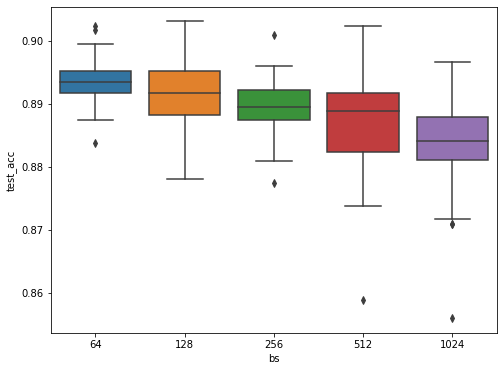

In [26]:
df_results = pd.read_csv("demo_batch_size_swav_tcga_009.csv")
df_results = df_results.loc[df_results["bs"] > 32]
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_le, x="bs", y="test_acc")

# Epochs number SwAV

In [ ]:
name = "demo_nepochs_swav_tcga"
logger = LogResults(name, ["nepochs"])

maxepochs = [8, 16, 32, 64, 128, 256, 512, 1024]

for i in range(5):
    for nepochs in maxepochs:
        
        logger.update_hyps([nepochs])
        
        config_swav = {
            "epochs": nepochs,
            "lr_init": 0.0001,
            "early_stop": 0,
            "coeff": 0.6,
        }
        
        # SwAV training
        
        idx = generate_indices(dataset)
        dataloaders = get_dataloaders(cancer_dataset, idx, [32, 1403, 1403])
        net_swav = NetSwav(input_dim, nproto=60).to(device)
        train_swav_tcga(config_swav, dataloaders, net_swav, device, config_swav["early_stop"], eps=0.09)
        torch.save(net_swav.state_dict(), "data/s12/swav_state_dict_0.pt")
        
        # Finetuning and evaluation
        
        idx = generate_indices(dataset, prop=0.03)
        base_bs = 256
        margin = 0.5
        bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))
        dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])
        
        config_nn = {
            "epochs": 200,
            "lr_init": 0.001,
            "early_stop": 5,
        }
        
        for j in range(10):
            net = Net(input_dim, output_dim).to(device)
            transfer_weights(net, f"data/s12/swav_state_dict_0.pt")
            train_nn(config_nn, dataloaders, net, weights=None, early_stop=config_nn["early_stop"], log=False, logger=logger)
            logger.next_run()
            logger.show_progression()
            
        logger.save_csv()

<AxesSubplot:xlabel='nepochs', ylabel='test_acc'>

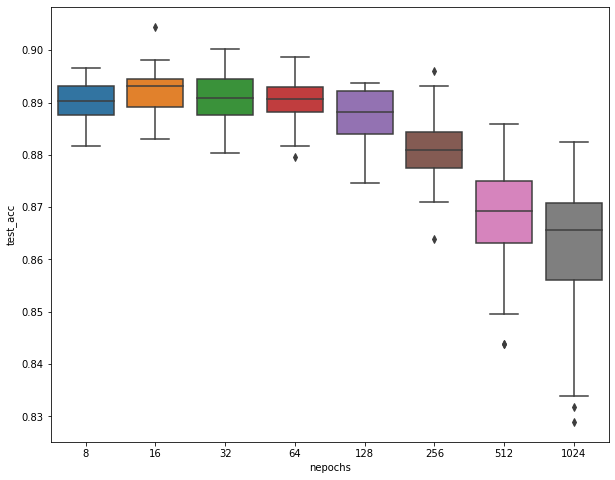

In [18]:
df_results = pd.read_csv("demo_nepochs_swav_tcga.csv")
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)
plt.figure(figsize=(10, 8))
sns.boxplot(data=df_le, x="nepochs", y="test_acc")

# SwAV pretraining

In [41]:
for i in range(10):
        
        config_swav = {
            "epochs": 200,
            "lr_init": 0.0001,
            "early_stop": 5,
            "coeff": 0.9,
        }
        
        # SwAV training
        
        idx = generate_indices(dataset)
        dataloaders = get_dataloaders(cancer_dataset, idx, [64, 1403, 1403])
        net_swav = NetSwav(input_dim, nproto=60).to(device)
        train_swav_tcga(config_swav, dataloaders, net_swav, device, config_swav["early_stop"], eps=0.05)
        torch.save(net_swav.state_dict(), f"data/s15/swav_state_dict_bs_64_{i}.pt")

9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=4.5545 | SwAVEvalLoss=4.3214 |
| Epoch:   2/200 | SwAVTrainLoss=4.2070 | SwAVEvalLoss=4.1179 |
| Epoch:   3/200 | SwAVTrainLoss=4.0636 | SwAVEvalLoss=4.0051 |
| Epoch:   4/200 | SwAVTrainLoss=3.9528 | SwAVEvalLoss=3.8653 |
| Epoch:   5/200 | SwAVTrainLoss=3.8370 | SwAVEvalLoss=3.7596 |
| Epoch:   6/200 | SwAVTrainLoss=3.7136 | SwAVEvalLoss=3.6405 |
| Epoch:   7/200 | SwAVTrainLoss=3.5926 | SwAVEvalLoss=3.5098 |
| Epoch:   8/200 | SwAVTrainLoss=3.5023 | SwAVEvalLoss=3.4433 |
| Epoch:   9/200 | SwAVTrainLoss=3.4080 | SwAVEvalLoss=3.3278 |
| Epoch:  10/200 | SwAVTrainLoss=3.3284 | SwAVEvalLoss=3.2494 |
| Epoch:  11/200 | SwAVTrainLoss=3.2543 | SwAVEvalLoss=3.1788 |
| Epoch:  12/200 | SwAVTrainLoss=3.1864 | SwAVEvalLoss=3.1022 |
| Epoch:  13/200 | SwAVTrainLoss=3.0978 | SwAVEvalLoss=3.0469 |
| Epoch:  14/200 | SwAVTrainLoss=3.0328 | SwAVEvalLo

INFO: Early stopping counter 2 of 5
| Epoch:  44/200 | SwAVTrainLoss=1.9349 | SwAVEvalLoss=1.7259 |
INFO: Early stopping counter 3 of 5
| Epoch:  45/200 | SwAVTrainLoss=1.8934 | SwAVEvalLoss=1.7254 |
| Epoch:  46/200 | SwAVTrainLoss=1.9035 | SwAVEvalLoss=1.6955 |
INFO: Early stopping counter 1 of 5
| Epoch:  47/200 | SwAVTrainLoss=1.9002 | SwAVEvalLoss=1.6992 |
| Epoch:  48/200 | SwAVTrainLoss=1.9096 | SwAVEvalLoss=1.6284 |
INFO: Early stopping counter 1 of 5
| Epoch:  49/200 | SwAVTrainLoss=1.8721 | SwAVEvalLoss=1.6886 |
| Epoch:  50/200 | SwAVTrainLoss=1.8842 | SwAVEvalLoss=1.6282 |
| Epoch:  51/200 | SwAVTrainLoss=1.8705 | SwAVEvalLoss=1.6223 |
| Epoch:  52/200 | SwAVTrainLoss=1.8553 | SwAVEvalLoss=1.6195 |
INFO: Early stopping counter 1 of 5
| Epoch:  53/200 | SwAVTrainLoss=1.8741 | SwAVEvalLoss=1.6261 |
| Epoch:  54/200 | SwAVTrainLoss=1.8403 | SwAVEvalLoss=1.5930 |
| Epoch:  55/200 | SwAVTrainLoss=1.8399 | SwAVEvalLoss=1.5639 |
INFO: Early stopping counter 1 of 5
| Epoch:  56/200

INFO: Early stopping counter 2 of 5
| Epoch:  79/200 | SwAVTrainLoss=1.7230 | SwAVEvalLoss=1.4829 |
INFO: Early stopping counter 3 of 5
| Epoch:  80/200 | SwAVTrainLoss=1.7190 | SwAVEvalLoss=1.4824 |
INFO: Early stopping counter 4 of 5
| Epoch:  81/200 | SwAVTrainLoss=1.7202 | SwAVEvalLoss=1.4615 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=4.5213 | SwAVEvalLoss=4.3293 |
| Epoch:   2/200 | SwAVTrainLoss=4.2102 | SwAVEvalLoss=4.1115 |
| Epoch:   3/200 | SwAVTrainLoss=4.0524 | SwAVEvalLoss=3.9604 |
| Epoch:   4/200 | SwAVTrainLoss=3.8774 | SwAVEvalLoss=3.7985 |
| Epoch:   5/200 | SwAVTrainLoss=3.7295 | SwAVEvalLoss=3.6561 |
| Epoch:   6/200 | SwAVTrainLoss=3.5806 | SwAVEvalLoss=3.5111 |
| Epoch:   7/200 | SwAVTrainLoss=3.4705 | SwAVEvalLoss=3.3932 |
| Epoch:   8/200 | SwAVTrainLoss=3.3786 | SwAVEvalLoss=3.3115 |
| Epoch:   9/20

| Epoch:  25/200 | SwAVTrainLoss=2.3759 | SwAVEvalLoss=2.2249 |
| Epoch:  26/200 | SwAVTrainLoss=2.3293 | SwAVEvalLoss=2.1615 |
| Epoch:  27/200 | SwAVTrainLoss=2.2858 | SwAVEvalLoss=2.1245 |
| Epoch:  28/200 | SwAVTrainLoss=2.2641 | SwAVEvalLoss=2.0997 |
| Epoch:  29/200 | SwAVTrainLoss=2.2269 | SwAVEvalLoss=2.0405 |
| Epoch:  30/200 | SwAVTrainLoss=2.1999 | SwAVEvalLoss=2.0208 |
| Epoch:  31/200 | SwAVTrainLoss=2.1698 | SwAVEvalLoss=1.9766 |
| Epoch:  32/200 | SwAVTrainLoss=2.1448 | SwAVEvalLoss=1.9658 |
| Epoch:  33/200 | SwAVTrainLoss=2.1149 | SwAVEvalLoss=1.9448 |
| Epoch:  34/200 | SwAVTrainLoss=2.1016 | SwAVEvalLoss=1.8969 |
INFO: Early stopping counter 1 of 5
| Epoch:  35/200 | SwAVTrainLoss=2.0787 | SwAVEvalLoss=1.9142 |
| Epoch:  36/200 | SwAVTrainLoss=2.0847 | SwAVEvalLoss=1.8705 |
| Epoch:  37/200 | SwAVTrainLoss=2.0365 | SwAVEvalLoss=1.8597 |
| Epoch:  38/200 | SwAVTrainLoss=2.0428 | SwAVEvalLoss=1.8133 |
| Epoch:  39/200 | SwAVTrainLoss=2.0265 | SwAVEvalLoss=1.7996 |
INFO

INFO: Early stopping counter 2 of 5
| Epoch:  63/200 | SwAVTrainLoss=1.8131 | SwAVEvalLoss=1.5487 |
INFO: Early stopping counter 3 of 5
| Epoch:  64/200 | SwAVTrainLoss=1.7753 | SwAVEvalLoss=1.5464 |
| Epoch:  65/200 | SwAVTrainLoss=1.7746 | SwAVEvalLoss=1.5274 |
| Epoch:  66/200 | SwAVTrainLoss=1.7883 | SwAVEvalLoss=1.4982 |
INFO: Early stopping counter 1 of 5
| Epoch:  67/200 | SwAVTrainLoss=1.7672 | SwAVEvalLoss=1.5256 |
INFO: Early stopping counter 2 of 5
| Epoch:  68/200 | SwAVTrainLoss=1.7686 | SwAVEvalLoss=1.5409 |
INFO: Early stopping counter 3 of 5
| Epoch:  69/200 | SwAVTrainLoss=1.7568 | SwAVEvalLoss=1.5055 |
INFO: Early stopping counter 4 of 5
| Epoch:  70/200 | SwAVTrainLoss=1.7496 | SwAVEvalLoss=1.5568 |
| Epoch:  71/200 | SwAVTrainLoss=1.7424 | SwAVEvalLoss=1.4803 |
INFO: Early stopping counter 1 of 5
| Epoch:  72/200 | SwAVTrainLoss=1.7444 | SwAVEvalLoss=1.4979 |
INFO: Early stopping counter 2 of 5
| Epoch:  73/200 | SwAVTrainLoss=1.7238 | SwAVEvalLoss=1.4972 |
INFO: Ea

| Epoch:   1/200 | SwAVTrainLoss=4.4829 | SwAVEvalLoss=4.2422 |
| Epoch:   2/200 | SwAVTrainLoss=4.1606 | SwAVEvalLoss=4.0744 |
| Epoch:   3/200 | SwAVTrainLoss=4.0322 | SwAVEvalLoss=3.9699 |
| Epoch:   4/200 | SwAVTrainLoss=3.9127 | SwAVEvalLoss=3.8521 |
| Epoch:   5/200 | SwAVTrainLoss=3.7765 | SwAVEvalLoss=3.7091 |
| Epoch:   6/200 | SwAVTrainLoss=3.6710 | SwAVEvalLoss=3.5890 |
| Epoch:   7/200 | SwAVTrainLoss=3.5648 | SwAVEvalLoss=3.5011 |
| Epoch:   8/200 | SwAVTrainLoss=3.4562 | SwAVEvalLoss=3.3988 |
| Epoch:   9/200 | SwAVTrainLoss=3.3627 | SwAVEvalLoss=3.2438 |
| Epoch:  10/200 | SwAVTrainLoss=3.2442 | SwAVEvalLoss=3.1403 |
| Epoch:  11/200 | SwAVTrainLoss=3.1185 | SwAVEvalLoss=3.0113 |
| Epoch:  12/200 | SwAVTrainLoss=3.0271 | SwAVEvalLoss=2.9568 |
| Epoch:  13/200 | SwAVTrainLoss=2.9571 | SwAVEvalLoss=2.8689 |
| Epoch:  14/200 | SwAVTrainLoss=2.8879 | SwAVEvalLoss=2.8011 |
| Epoch:  15/200 | SwAVTrainLoss=2.8245 | SwAVEvalLoss=2.7475 |
| Epoch:  16/200 | SwAVTrainLoss=2.7567 

| Epoch: 108/200 | SwAVTrainLoss=1.6179 | SwAVEvalLoss=1.3445 |
INFO: Early stopping counter 1 of 5
| Epoch: 109/200 | SwAVTrainLoss=1.6265 | SwAVEvalLoss=1.3525 |
| Epoch: 110/200 | SwAVTrainLoss=1.6181 | SwAVEvalLoss=1.3098 |
INFO: Early stopping counter 1 of 5
| Epoch: 111/200 | SwAVTrainLoss=1.6379 | SwAVEvalLoss=1.3410 |
INFO: Early stopping counter 2 of 5
| Epoch: 112/200 | SwAVTrainLoss=1.5987 | SwAVEvalLoss=1.3177 |
INFO: Early stopping counter 3 of 5
| Epoch: 113/200 | SwAVTrainLoss=1.6108 | SwAVEvalLoss=1.3469 |
INFO: Early stopping counter 4 of 5
| Epoch: 114/200 | SwAVTrainLoss=1.6081 | SwAVEvalLoss=1.3491 |
INFO: Early stopping counter 5 of 5
INFO: Early stopping
9352 elements in the dataset
6546 elements in the trainset
1403 elements in the valset
1403 elements in the testset
| Epoch:   1/200 | SwAVTrainLoss=4.5092 | SwAVEvalLoss=4.2754 |
| Epoch:   2/200 | SwAVTrainLoss=4.2005 | SwAVEvalLoss=4.1202 |
| Epoch:   3/200 | SwAVTrainLoss=4.0822 | SwAVEvalLoss=4.0293 |
| Epoch

| Epoch:  34/200 | SwAVTrainLoss=2.0678 | SwAVEvalLoss=1.8766 |
| Epoch:  35/200 | SwAVTrainLoss=2.0700 | SwAVEvalLoss=1.8608 |
| Epoch:  36/200 | SwAVTrainLoss=2.0616 | SwAVEvalLoss=1.8370 |
| Epoch:  37/200 | SwAVTrainLoss=2.0318 | SwAVEvalLoss=1.8130 |
| Epoch:  38/200 | SwAVTrainLoss=2.0163 | SwAVEvalLoss=1.8095 |
| Epoch:  39/200 | SwAVTrainLoss=1.9785 | SwAVEvalLoss=1.7755 |
| Epoch:  40/200 | SwAVTrainLoss=1.9729 | SwAVEvalLoss=1.7545 |
INFO: Early stopping counter 1 of 5
| Epoch:  41/200 | SwAVTrainLoss=1.9760 | SwAVEvalLoss=1.7803 |
| Epoch:  42/200 | SwAVTrainLoss=1.9492 | SwAVEvalLoss=1.7412 |
| Epoch:  43/200 | SwAVTrainLoss=1.9346 | SwAVEvalLoss=1.7297 |
| Epoch:  44/200 | SwAVTrainLoss=1.9168 | SwAVEvalLoss=1.7251 |
| Epoch:  45/200 | SwAVTrainLoss=1.9081 | SwAVEvalLoss=1.6750 |
| Epoch:  46/200 | SwAVTrainLoss=1.9018 | SwAVEvalLoss=1.6459 |
INFO: Early stopping counter 1 of 5
| Epoch:  47/200 | SwAVTrainLoss=1.9002 | SwAVEvalLoss=1.6666 |
INFO: Early stopping counter 2 o

# Learning rate fine-tuning

In [38]:
name = "tcga_lr"
logger = LogResults(name, ["pretraining", "lr_init"])
lrs = [0.002, 0.0015, 0.001, 0.0008, 0.0006, 0.0004, 0.0002, 0.0001, 0.00008, 0.00006, 0.00004, 0.00002]

for lr in lrs:
    for pretraining in  ["SwAV", "None"]:
        
        logger.update_hyps([pretraining, lr])
        
        # Finetuning and evaluation
        
        idx = generate_indices(dataset, prop=0.03)
        base_bs = 256
        margin = 0.5
        bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))
        dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])

        config_nn = {
            "epochs": 200,
            "lr_init": lr,
            "early_stop": 5,
        }

        for i in range(50):

            net = Net(input_dim, output_dim).to(device)

            if pretraining == "SwAV":
                print("transfer...")
                transfer_weights(net, f"data/s15/swav_state_dict_bs_64_{str(i % 10)}.pt")
            
            train_nn(config_nn, dataloaders, net, weights=None, early_stop=config_nn["early_stop"], log=False, logger=logger)
            logger.next_run()
            logger.show_progression()

        logger.save_csv()
        

9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 1, below are the last 5 epochs :
       id epoch   val_acc  val_loss  test_acc  test_loss pretraining  lr_init
8   run-0     8  0.885959  0.718761  0.879544   0.756227        SwAV    0.002
9   run-0     9  0.890948  0.652029  0.876693   0.702412        SwAV    0.002
10  run-0    10  0.888810  0.602713  0.874555   0.649321        SwAV    0.002
11  run-0    11  0.885246  0.564437  0.880969   0.592948        SwAV    0.002
12  run-0    12  0.885246  0.523798  0.880257   0.556727        SwAV    0.002
transfer...

Iteration 2, below are the last 5 epochs :
       id epoch   val_acc  val_loss  test_acc  test_loss pretraining  lr_init
29  run-1    16  0.894512  0.476339  0.883108   0.503203        SwAV    0.002
30  run-1    17  0.892373  0.453348  0.884533   0.484446        SwAV    0.002
31  run-1    18  0.892373  0.454758  0.886671   0.480657        SwAV   

transfer...

Iteration 16, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
300  run-15    29  0.883820  0.428033  0.885246   0.433754        SwAV   
301  run-15    30  0.888097  0.403628  0.889522   0.440569        SwAV   
302  run-15    31  0.885959  0.425291  0.887384   0.439612        SwAV   
303  run-15    32  0.886671  0.419184  0.890948   0.429721        SwAV   
304  run-15    33  0.886671  0.421469  0.888810   0.432791        SwAV   

     lr_init  
300    0.002  
301    0.002  
302    0.002  
303    0.002  
304    0.002  
transfer...

Iteration 17, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
314  run-16     9  0.890235  0.710697  0.890948   0.752570        SwAV   
315  run-16    10  0.887384  0.659346  0.886671   0.687239        SwAV   
316  run-16    11  0.887384  0.613026  0.891661   0.648249        SwAV   
317  run-16    12  0.883108  0.579850  0.883108   0.609

transfer...

Iteration 30, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
552  run-29    11  0.897363  0.569488  0.893086   0.595457        SwAV   
553  run-29    12  0.896650  0.529181  0.890948   0.563368        SwAV   
554  run-29    13  0.895937  0.503944  0.892373   0.544596        SwAV   
555  run-29    14  0.896650  0.483004  0.893799   0.503951        SwAV   
556  run-29    15  0.897363  0.466315  0.895937   0.482681        SwAV   

     lr_init  
552    0.002  
553    0.002  
554    0.002  
555    0.002  
556    0.002  
transfer...

Iteration 31, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
570  run-30    13  0.887384  0.495976  0.883820   0.536145        SwAV   
571  run-30    14  0.888097  0.485044  0.879544   0.522199        SwAV   
572  run-30    15  0.888810  0.464420  0.885246   0.497697        SwAV   
573  run-30    16  0.888810  0.445746  0.881682   0.493

transfer...

Iteration 44, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
822  run-43    18  0.892373  0.454488  0.884533   0.475544        SwAV   
823  run-43    19  0.894512  0.436716  0.890235   0.471981        SwAV   
824  run-43    20  0.892373  0.447639  0.887384   0.452867        SwAV   
825  run-43    21  0.892373  0.421446  0.887384   0.440934        SwAV   
826  run-43    22  0.888810  0.430862  0.888097   0.448778        SwAV   

     lr_init  
822    0.002  
823    0.002  
824    0.002  
825    0.002  
826    0.002  
transfer...

Iteration 45, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
839  run-44    12  0.888097  0.517989  0.886671   0.536143        SwAV   
840  run-44    13  0.891661  0.502427  0.888810   0.517476        SwAV   
841  run-44    14  0.890235  0.477538  0.892373   0.504408        SwAV   
842  run-44    15  0.889522  0.467405  0.884533   0.478


Iteration 58, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
1124  run-57    21  0.883820  0.636686  0.875267   0.688522        None   
1125  run-57    22  0.880257  0.611199  0.880257   0.652123        None   
1126  run-57    23  0.880257  0.580137  0.876693   0.632076        None   
1127  run-57    24  0.874555  0.571245  0.873129   0.611414        None   
1128  run-57    25  0.879544  0.549054  0.874555   0.601270        None   

      lr_init  
1124    0.002  
1125    0.002  
1126    0.002  
1127    0.002  
1128    0.002  

Iteration 59, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
1149  run-58    20  0.873129  0.671653  0.873842   0.717274        None   
1150  run-58    21  0.873129  0.643826  0.863863   0.689839        None   
1151  run-58    22  0.876693  0.625525  0.868852   0.650657        None   
1152  run-58    23  0.878118  0.591606  0.861012   0.643917    


Iteration 72, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
1448  run-71    23  0.884533  0.582221  0.880257   0.595080        None   
1449  run-71    24  0.884533  0.557208  0.878831   0.581960        None   
1450  run-71    25  0.884533  0.520856  0.873842   0.567134        None   
1451  run-71    26  0.885246  0.533121  0.883820   0.556346        None   
1452  run-71    27  0.883108  0.507083  0.876693   0.550600        None   

      lr_init  
1448    0.002  
1449    0.002  
1450    0.002  
1451    0.002  
1452    0.002  

Iteration 73, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
1468  run-72    15  0.877406  0.943185  0.873842   0.990900        None   
1469  run-72    16  0.872416  0.861672  0.873842   0.905073        None   
1470  run-72    17  0.875267  0.795592  0.877406   0.852049        None   
1471  run-72    18  0.878831  0.748279  0.876693   0.793334    


Iteration 86, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
1801  run-85    19  0.874555  0.721183  0.873129   0.757702        None   
1802  run-85    20  0.875267  0.665315  0.876693   0.725341        None   
1803  run-85    21  0.876693  0.635606  0.875267   0.680407        None   
1804  run-85    22  0.870991  0.610823  0.875267   0.654148        None   
1805  run-85    23  0.873129  0.610327  0.871703   0.633930        None   

      lr_init  
1801    0.002  
1802    0.002  
1803    0.002  
1804    0.002  
1805    0.002  

Iteration 87, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
1823  run-86    17  0.878118  0.775639  0.876693   0.820686        None   
1824  run-86    18  0.878831  0.739465  0.875980   0.763678        None   
1825  run-86    19  0.874555  0.689763  0.875267   0.714664        None   
1826  run-86    20  0.875267  0.653886  0.875267   0.690320    


Iteration 100, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
2140  run-99    25  0.881682  0.538022  0.873129   0.564547        None   
2141  run-99    26  0.883820  0.524147  0.875980   0.552105        None   
2142  run-99    27  0.884533  0.507454  0.874555   0.547108        None   
2143  run-99    28  0.880257  0.512075  0.873129   0.525973        None   
2144  run-99    29  0.881682  0.501453  0.875980   0.531316        None   

      lr_init  
2140    0.002  
2141    0.002  
2142    0.002  
2143    0.002  
2144    0.002  
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 101, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
2157  run-100    12  0.890235  0.675692  0.889522   0.717145        SwAV   
2158  run-100    13  0.893086  0.631952  0.890948   0.675306        SwAV   
2159  

transfer...

Iteration 114, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
2410  run-113    15  0.891661  0.569682  0.883820   0.608777        SwAV   
2411  run-113    16  0.890948  0.556593  0.888810   0.589683        SwAV   
2412  run-113    17  0.891661  0.538286  0.884533   0.557386        SwAV   
2413  run-113    18  0.894512  0.514101  0.888097   0.554632        SwAV   
2414  run-113    19  0.892373  0.500590  0.884533   0.542858        SwAV   

      lr_init  
2410   0.0015  
2411   0.0015  
2412   0.0015  
2413   0.0015  
2414   0.0015  
transfer...

Iteration 115, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
2428  run-114    13  0.885959  0.634161  0.890235   0.668236        SwAV   
2429  run-114    14  0.884533  0.612769  0.888810   0.632665        SwAV   
2430  run-114    15  0.889522  0.574087  0.887384   0.605142        SwAV   
2431  run-114    16  0.8880

transfer...

Iteration 128, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
2717  run-127    20  0.890235  0.503639  0.893799   0.515652        SwAV   
2718  run-127    21  0.892373  0.504607  0.892373   0.504105        SwAV   
2719  run-127    22  0.890948  0.491041  0.890948   0.484071        SwAV   
2720  run-127    23  0.891661  0.486460  0.893799   0.500939        SwAV   
2721  run-127    24  0.892373  0.480149  0.893799   0.483964        SwAV   

      lr_init  
2717   0.0015  
2718   0.0015  
2719   0.0015  
2720   0.0015  
2721   0.0015  
transfer...

Iteration 129, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
2731  run-128     9  0.884533  0.842176  0.881682   0.877777        SwAV   
2732  run-128    10  0.887384  0.780413  0.883820   0.805517        SwAV   
2733  run-128    11  0.885246  0.710823  0.887384   0.744751        SwAV   
2734  run-128    12  0.8838

transfer...

Iteration 142, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3016  run-141    19  0.892373  0.490916  0.893799   0.518537        SwAV   
3017  run-141    20  0.892373  0.492225  0.888810   0.504886        SwAV   
3018  run-141    21  0.890235  0.481408  0.890948   0.497029        SwAV   
3019  run-141    22  0.891661  0.470861  0.891661   0.490365        SwAV   
3020  run-141    23  0.890948  0.453969  0.885959   0.488018        SwAV   

      lr_init  
3016   0.0015  
3017   0.0015  
3018   0.0015  
3019   0.0015  
3020   0.0015  
transfer...

Iteration 143, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3030  run-142     9  0.885959  0.794092  0.883108   0.835299        SwAV   
3031  run-142    10  0.887384  0.744318  0.881682   0.761892        SwAV   
3032  run-142    11  0.887384  0.686139  0.883108   0.708402        SwAV   
3033  run-142    12  0.8880


Iteration 156, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3299  run-155    11  0.867427  1.499568  0.862438   1.543294        None   
3300  run-155    12  0.870278  1.417047  0.864576   1.452139        None   
3301  run-155    13  0.871703  1.321949  0.869565   1.365940        None   
3302  run-155    14  0.872416  1.238934  0.867427   1.282305        None   
3303  run-155    15  0.870991  1.159393  0.867427   1.200004        None   

      lr_init  
3299   0.0015  
3300   0.0015  
3301   0.0015  
3302   0.0015  
3303   0.0015  

Iteration 157, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3324  run-156    20  0.873129  0.817275  0.883820   0.866940        None   
3325  run-156    21  0.874555  0.774444  0.880257   0.818972        None   
3326  run-156    22  0.873842  0.721530  0.880257   0.763873        None   
3327  run-156    23  0.870991  0.691092  0.883820  


Iteration 170, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3621  run-169    10  0.861012  1.562254  0.861725   1.595347        None   
3622  run-169    11  0.867427  1.468696  0.866001   1.505845        None   
3623  run-169    12  0.866714  1.378967  0.861012   1.420863        None   
3624  run-169    13  0.868140  1.292449  0.866001   1.338797        None   
3625  run-169    14  0.868140  1.207676  0.867427   1.252120        None   

      lr_init  
3621   0.0015  
3622   0.0015  
3623   0.0015  
3624   0.0015  
3625   0.0015  

Iteration 171, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3649  run-170    23  0.879544  0.705007  0.880257   0.733154        None   
3650  run-170    24  0.880969  0.676434  0.880969   0.710682        None   
3651  run-170    25  0.880257  0.644329  0.880969   0.670692        None   
3652  run-170    26  0.880257  0.622504  0.881682  


Iteration 184, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3953  run-183    16  0.877406  0.985536  0.881682   1.034861        None   
3954  run-183    17  0.878118  0.910598  0.882395   0.961529        None   
3955  run-183    18  0.875980  0.856428  0.881682   0.908545        None   
3956  run-183    19  0.878118  0.804427  0.884533   0.852079        None   
3957  run-183    20  0.878831  0.755393  0.878118   0.802649        None   

      lr_init  
3953   0.0015  
3954   0.0015  
3955   0.0015  
3956   0.0015  
3957   0.0015  

Iteration 185, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
3985  run-184    27  0.882395  0.593507  0.869565   0.636428        None   
3986  run-184    28  0.882395  0.576727  0.875980   0.616218        None   
3987  run-184    29  0.878118  0.578042  0.873129   0.618231        None   
3988  run-184    30  0.878118  0.552119  0.874555  


Iteration 198, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
4291  run-197    18  0.878118  0.996096  0.876693   1.046929        None   
4292  run-197    19  0.879544  0.931221  0.874555   0.980495        None   
4293  run-197    20  0.877406  0.872687  0.870991   0.914815        None   
4294  run-197    21  0.879544  0.816257  0.874555   0.856943        None   
4295  run-197    22  0.878831  0.779626  0.873842   0.821865        None   

      lr_init  
4291   0.0015  
4292   0.0015  
4293   0.0015  
4294   0.0015  
4295   0.0015  

Iteration 199, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
4321  run-198    25  0.883820  0.628589  0.870991   0.665034        None   
4322  run-198    26  0.883820  0.616379  0.868852   0.644882        None   
4323  run-198    27  0.881682  0.595533  0.870278   0.636297        None   
4324  run-198    28  0.880969  0.572840  0.872416  

transfer...

Iteration 212, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
4631  run-211    19  0.892373  0.637102  0.890235   0.683407        SwAV   
4632  run-211    20  0.890948  0.618002  0.892373   0.658852        SwAV   
4633  run-211    21  0.889522  0.600051  0.888810   0.633085        SwAV   
4634  run-211    22  0.891661  0.583034  0.895225   0.629639        SwAV   
4635  run-211    23  0.892373  0.566498  0.894512   0.605100        SwAV   

      lr_init  
4631    0.001  
4632    0.001  
4633    0.001  
4634    0.001  
4635    0.001  
transfer...

Iteration 213, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
4653  run-212    17  0.895225  0.661005  0.895937   0.692287        SwAV   
4654  run-212    18  0.895937  0.625077  0.893799   0.665196        SwAV   
4655  run-212    19  0.894512  0.612749  0.898788   0.644026        SwAV   
4656  run-212    20  0.8959

transfer...

Iteration 226, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
4955  run-225    17  0.898076  0.676501  0.893799   0.694812        SwAV   
4956  run-225    18  0.895937  0.647218  0.899501   0.675249        SwAV   
4957  run-225    19  0.897363  0.624476  0.900214   0.646044        SwAV   
4958  run-225    20  0.898076  0.604620  0.898076   0.625175        SwAV   
4959  run-225    21  0.894512  0.578866  0.900214   0.601983        SwAV   

      lr_init  
4955    0.001  
4956    0.001  
4957    0.001  
4958    0.001  
4959    0.001  
transfer...

Iteration 227, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
4980  run-226    20  0.888810  0.648343  0.900927   0.678696        SwAV   
4981  run-226    21  0.893799  0.624317  0.899501   0.653779        SwAV   
4982  run-226    22  0.892373  0.594524  0.895225   0.640276        SwAV   
4983  run-226    23  0.8923

transfer...

Iteration 240, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
5297  run-239    20  0.891661  0.619625  0.892373   0.650427        SwAV   
5298  run-239    21  0.893799  0.595750  0.895225   0.629945        SwAV   
5299  run-239    22  0.894512  0.576533  0.892373   0.615286        SwAV   
5300  run-239    23  0.896650  0.560058  0.893086   0.597697        SwAV   
5301  run-239    24  0.895937  0.552211  0.894512   0.581364        SwAV   

      lr_init  
5297    0.001  
5298    0.001  
5299    0.001  
5300    0.001  
5301    0.001  
transfer...

Iteration 241, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
5326  run-240    24  0.890948  0.548837  0.890235   0.573004        SwAV   
5327  run-240    25  0.892373  0.538134  0.885959   0.564954        SwAV   
5328  run-240    26  0.894512  0.528743  0.889522   0.544667        SwAV   
5329  run-240    27  0.8923


Iteration 254, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
5644  run-253    12  0.877406  1.631925  0.877406   1.665434        None   
5645  run-253    13  0.877406  1.550274  0.876693   1.592550        None   
5646  run-253    14  0.876693  1.480224  0.871703   1.511661        None   
5647  run-253    15  0.878831  1.403591  0.873129   1.433397        None   
5648  run-253    16  0.876693  1.311738  0.875267   1.352094        None   

      lr_init  
5644    0.001  
5645    0.001  
5646    0.001  
5647    0.001  
5648    0.001  

Iteration 255, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
5664  run-254    15  0.880969  1.397037  0.883820   1.451375        None   
5665  run-254    16  0.880257  1.324219  0.881682   1.358550        None   
5666  run-254    17  0.878831  1.252259  0.880969   1.293619        None   
5667  run-254    18  0.880969  1.177728  0.883820  


Iteration 268, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
6015  run-267    14  0.885246  1.474843  0.888810   1.506868        None   
6016  run-267    15  0.886671  1.397226  0.893086   1.423497        None   
6017  run-267    16  0.885246  1.312262  0.890948   1.347235        None   
6018  run-267    17  0.885959  1.231618  0.888810   1.268211        None   
6019  run-267    18  0.885246  1.161123  0.891661   1.203007        None   

      lr_init  
6015    0.001  
6016    0.001  
6017    0.001  
6018    0.001  
6019    0.001  

Iteration 269, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
6043  run-268    23  0.883108  0.854613  0.870278   0.899490        None   
6044  run-268    24  0.878831  0.819593  0.879544   0.854326        None   
6045  run-268    25  0.875267  0.776624  0.880257   0.829038        None   
6046  run-268    26  0.878118  0.758768  0.876693  


Iteration 282, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
6374  run-281    24  0.889522  0.830774  0.877406   0.884601        None   
6375  run-281    25  0.893799  0.797682  0.878831   0.851924        None   
6376  run-281    26  0.890948  0.772452  0.874555   0.819563        None   
6377  run-281    27  0.888810  0.737975  0.875980   0.784298        None   
6378  run-281    28  0.886671  0.708406  0.880969   0.746925        None   

      lr_init  
6374    0.001  
6375    0.001  
6376    0.001  
6377    0.001  
6378    0.001  

Iteration 283, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
6393  run-282    14  0.875980  1.465751  0.878831   1.504133        None   
6394  run-282    15  0.878118  1.377927  0.878831   1.430946        None   
6395  run-282    16  0.876693  1.301263  0.886671   1.358368        None   
6396  run-282    17  0.876693  1.224073  0.888097  


Iteration 296, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
6715  run-295    23  0.879544  0.868647  0.862438   0.912435        None   
6716  run-295    24  0.877406  0.828395  0.872416   0.870680        None   
6717  run-295    25  0.879544  0.795725  0.863863   0.838660        None   
6718  run-295    26  0.877406  0.766310  0.867427   0.792765        None   
6719  run-295    27  0.878118  0.734827  0.875267   0.783221        None   

      lr_init  
6715    0.001  
6716    0.001  
6717    0.001  
6718    0.001  
6719    0.001  

Iteration 297, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
6738  run-296    18  0.884533  1.112898  0.883108   1.149397        None   
6739  run-296    19  0.881682  1.053835  0.881682   1.095360        None   
6740  run-296    20  0.883108  0.987976  0.884533   1.031867        None   
6741  run-296    21  0.882395  0.936649  0.883820  

transfer...

Iteration 310, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
7081  run-309    19  0.893086  0.742424  0.900927   0.769785        SwAV   
7082  run-309    20  0.895225  0.721517  0.901639   0.744037        SwAV   
7083  run-309    21  0.894512  0.696319  0.898788   0.715925        SwAV   
7084  run-309    22  0.895937  0.671303  0.902352   0.697400        SwAV   
7085  run-309    23  0.891661  0.658467  0.900214   0.681111        SwAV   

      lr_init  
7081   0.0008  
7082   0.0008  
7083   0.0008  
7084   0.0008  
7085   0.0008  
transfer...

Iteration 311, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
7107  run-310    21  0.888810  0.670187  0.898076   0.696410        SwAV   
7108  run-310    22  0.889522  0.641254  0.893799   0.670623        SwAV   
7109  run-310    23  0.893086  0.621185  0.895225   0.650678        SwAV   
7110  run-310    24  0.8902

transfer...

Iteration 324, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
7460  run-323    22  0.897363  0.652949  0.897363   0.684426        SwAV   
7461  run-323    23  0.895225  0.636374  0.900927   0.669897        SwAV   
7462  run-323    24  0.900927  0.611387  0.900927   0.638356        SwAV   
7463  run-323    25  0.898076  0.604542  0.898788   0.635042        SwAV   
7464  run-323    26  0.896650  0.590137  0.898076   0.615944        SwAV   

      lr_init  
7460   0.0008  
7461   0.0008  
7462   0.0008  
7463   0.0008  
7464   0.0008  
transfer...

Iteration 325, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
7485  run-324    20  0.894512  0.700678  0.893799   0.710557        SwAV   
7486  run-324    21  0.896650  0.677137  0.890235   0.698891        SwAV   
7487  run-324    22  0.895937  0.653010  0.893086   0.681180        SwAV   
7488  run-324    23  0.8959

transfer...

Iteration 338, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
7858  run-337    25  0.891661  0.654669  0.892373   0.680866        SwAV   
7859  run-337    26  0.889522  0.642258  0.892373   0.663950        SwAV   
7860  run-337    27  0.888810  0.629890  0.893086   0.661114        SwAV   
7861  run-337    28  0.890235  0.604719  0.893086   0.640876        SwAV   
7862  run-337    29  0.889522  0.596391  0.892373   0.623584        SwAV   

      lr_init  
7858   0.0008  
7859   0.0008  
7860   0.0008  
7861   0.0008  
7862   0.0008  
transfer...

Iteration 339, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
7877  run-338    14  0.893799  0.885302  0.893086   0.914767        SwAV   
7878  run-338    15  0.897363  0.834358  0.893799   0.875986        SwAV   
7879  run-338    16  0.897363  0.796551  0.893799   0.834334        SwAV   
7880  run-338    17  0.8937


Iteration 352, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
8221  run-351    24  0.876693  0.952129  0.884533   0.996537        None   
8222  run-351    25  0.878118  0.919170  0.885246   0.960665        None   
8223  run-351    26  0.876693  0.888709  0.876693   0.919636        None   
8224  run-351    27  0.876693  0.852123  0.875980   0.897394        None   
8225  run-351    28  0.879544  0.828334  0.880257   0.865876        None   

      lr_init  
8221   0.0008  
8222   0.0008  
8223   0.0008  
8224   0.0008  
8225   0.0008  

Iteration 353, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
8253  run-352    27  0.881682  0.827049  0.883108   0.854702        None   
8254  run-352    28  0.880969  0.795317  0.887384   0.825101        None   
8255  run-352    29  0.881682  0.774713  0.883108   0.806870        None   
8256  run-352    30  0.880969  0.746818  0.885246  


Iteration 366, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
8589  run-365    19  0.886671  1.201132  0.880257   1.248100        None   
8590  run-365    20  0.880969  1.146148  0.883108   1.191637        None   
8591  run-365    21  0.882395  1.086336  0.882395   1.125472        None   
8592  run-365    22  0.883108  1.028436  0.882395   1.073796        None   
8593  run-365    23  0.881682  0.981522  0.881682   1.027803        None   

      lr_init  
8589   0.0008  
8590   0.0008  
8591   0.0008  
8592   0.0008  
8593   0.0008  

Iteration 367, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
8619  run-366    25  0.886671  0.855338  0.885246   0.899591        None   
8620  run-366    26  0.886671  0.825849  0.885246   0.861526        None   
8621  run-366    27  0.883108  0.794560  0.885246   0.840106        None   
8622  run-366    28  0.884533  0.763339  0.885959  


Iteration 380, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
8937  run-379    17  0.873842  1.391558  0.883820   1.425621        None   
8938  run-379    18  0.878118  1.323874  0.884533   1.363304        None   
8939  run-379    19  0.875267  1.254923  0.884533   1.304870        None   
8940  run-379    20  0.878831  1.198619  0.882395   1.229500        None   
8941  run-379    21  0.878831  1.135831  0.882395   1.172929        None   

      lr_init  
8937   0.0008  
8938   0.0008  
8939   0.0008  
8940   0.0008  
8941   0.0008  

Iteration 381, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
8963  run-380    21  0.888097  1.083162  0.885246   1.107798        None   
8964  run-380    22  0.885246  1.024807  0.885959   1.063111        None   
8965  run-380    23  0.886671  0.976148  0.886671   1.019944        None   
8966  run-380    24  0.886671  0.938247  0.888810  


Iteration 394, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
9310  run-393    18  0.883820  1.276368  0.883820   1.324042        None   
9311  run-393    19  0.879544  1.222467  0.886671   1.256160        None   
9312  run-393    20  0.883820  1.155731  0.884533   1.188743        None   
9313  run-393    21  0.881682  1.096905  0.883820   1.146087        None   
9314  run-393    22  0.883820  1.040103  0.883820   1.078723        None   

      lr_init  
9310   0.0008  
9311   0.0008  
9312   0.0008  
9313   0.0008  
9314   0.0008  

Iteration 395, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
9338  run-394    23  0.881682  0.997843  0.885959   1.038957        None   
9339  run-394    24  0.883820  0.946438  0.888097   1.000877        None   
9340  run-394    25  0.880969  0.916274  0.885959   0.954859        None   
9341  run-394    26  0.883820  0.879275  0.884533  

transfer...

Iteration 408, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
9725  run-407    30  0.895225  0.684501  0.889522   0.708015        SwAV   
9726  run-407    31  0.895225  0.669045  0.891661   0.694384        SwAV   
9727  run-407    32  0.896650  0.666209  0.898076   0.684772        SwAV   
9728  run-407    33  0.893799  0.639381  0.897363   0.680468        SwAV   
9729  run-407    34  0.893799  0.636877  0.898076   0.656772        SwAV   

      lr_init  
9725   0.0006  
9726   0.0006  
9727   0.0006  
9728   0.0006  
9729   0.0006  
transfer...

Iteration 409, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
9752  run-408    22  0.891661  0.795247  0.893799   0.828294        SwAV   
9753  run-408    23  0.893086  0.775416  0.893799   0.802063        SwAV   
9754  run-408    24  0.895225  0.752609  0.893086   0.780015        SwAV   
9755  run-408    25  0.8959

transfer...

Iteration 422, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
10140  run-421    31  0.892373  0.709350  0.893799   0.728335        SwAV   
10141  run-421    32  0.890948  0.689295  0.899501   0.708082        SwAV   
10142  run-421    33  0.891661  0.692478  0.893086   0.691574        SwAV   
10143  run-421    34  0.889522  0.671921  0.896650   0.672706        SwAV   
10144  run-421    35  0.894512  0.669017  0.893799   0.666064        SwAV   

       lr_init  
10140   0.0006  
10141   0.0006  
10142   0.0006  
10143   0.0006  
10144   0.0006  
transfer...

Iteration 423, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
10163  run-422    18  0.889522  0.972249  0.893086   1.020405        SwAV   
10164  run-422    19  0.892373  0.940134  0.895937   0.976657        SwAV   
10165  run-422    20  0.890948  0.901805  0.892373   0.937276        SwAV   
10166  run-

transfer...

Iteration 436, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
10574  run-435    25  0.891661  0.778558  0.887384   0.809922        SwAV   
10575  run-435    26  0.888810  0.757815  0.888810   0.803414        SwAV   
10576  run-435    27  0.890948  0.741757  0.889522   0.773256        SwAV   
10577  run-435    28  0.891661  0.725564  0.890948   0.766264        SwAV   
10578  run-435    29  0.888810  0.722723  0.893086   0.743383        SwAV   

       lr_init  
10574   0.0006  
10575   0.0006  
10576   0.0006  
10577   0.0006  
10578   0.0006  
transfer...

Iteration 437, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
10600  run-436    21  0.890948  0.893059  0.891661   0.925354        SwAV   
10601  run-436    22  0.892373  0.866297  0.892373   0.899240        SwAV   
10602  run-436    23  0.892373  0.835613  0.892373   0.863340        SwAV   
10603  run-

transfer...

Iteration 450, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
11023  run-449    23  0.893799  0.881758  0.895225   0.896789        SwAV   
11024  run-449    24  0.893086  0.848693  0.895225   0.870219        SwAV   
11025  run-449    25  0.892373  0.820897  0.891661   0.846639        SwAV   
11026  run-449    26  0.893799  0.797360  0.894512   0.822970        SwAV   
11027  run-449    27  0.894512  0.774435  0.892373   0.799272        SwAV   

       lr_init  
11023   0.0006  
11024   0.0006  
11025   0.0006  
11026   0.0006  
11027   0.0006  
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset

Iteration 451, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
11054  run-450    26  0.884533  0.988375  0.886671   1.031878        None   
11055  run-450    27  0.883108  0.951555  0.890948   0.986896 


Iteration 464, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
11440  run-463    27  0.885959  0.955413  0.893086   1.002758        None   
11441  run-463    28  0.884533  0.919485  0.890235   0.961729        None   
11442  run-463    29  0.888810  0.889869  0.893086   0.936464        None   
11443  run-463    30  0.885246  0.868013  0.888810   0.909951        None   
11444  run-463    31  0.886671  0.847798  0.889522   0.880418        None   

       lr_init  
11440   0.0006  
11441   0.0006  
11442   0.0006  
11443   0.0006  
11444   0.0006  

Iteration 465, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
11475  run-464    30  0.884533  0.877719  0.883820   0.940141        None   
11476  run-464    31  0.885959  0.858639  0.885959   0.902751        None   
11477  run-464    32  0.886671  0.835398  0.890948   0.886519        None   
11478  run-464    33  0.885246  0.8


Iteration 478, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
11804  run-477    22  0.883820  1.178403  0.885246   1.225000        None   
11805  run-477    23  0.883820  1.139926  0.884533   1.176909        None   
11806  run-477    24  0.883820  1.085469  0.878118   1.125599        None   
11807  run-477    25  0.885246  1.040393  0.878831   1.083424        None   
11808  run-477    26  0.884533  1.003351  0.878118   1.042089        None   

       lr_init  
11804   0.0006  
11805   0.0006  
11806   0.0006  
11807   0.0006  
11808   0.0006  

Iteration 479, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
11837  run-478    28  0.886671  0.933204  0.895937   0.964316        None   
11838  run-478    29  0.887384  0.898376  0.889522   0.935348        None   
11839  run-478    30  0.888810  0.873982  0.896650   0.906221        None   
11840  run-478    31  0.893799  0.8


Iteration 492, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
12198  run-491    18  0.890948  1.392423  0.888810   1.431148        None   
12199  run-491    19  0.890948  1.327749  0.888810   1.382911        None   
12200  run-491    20  0.890235  1.271989  0.890235   1.316427        None   
12201  run-491    21  0.890235  1.223104  0.889522   1.260310        None   
12202  run-491    22  0.889522  1.167985  0.887384   1.222978        None   

       lr_init  
12198   0.0006  
12199   0.0006  
12200   0.0006  
12201   0.0006  
12202   0.0006  

Iteration 493, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
12216  run-492    13  0.876693  1.754696  0.873129   1.784231        None   
12217  run-492    14  0.877406  1.675524  0.871703   1.722426        None   
12218  run-492    15  0.877406  1.607723  0.878118   1.642475        None   
12219  run-492    16  0.878118  1.5

transfer...

Iteration 506, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
12640  run-505    28  0.880257  0.933872  0.884533   0.952308        SwAV   
12641  run-505    29  0.880257  0.912665  0.885246   0.934572        SwAV   
12642  run-505    30  0.880257  0.890053  0.885959   0.906886        SwAV   
12643  run-505    31  0.878118  0.864983  0.884533   0.893079        SwAV   
12644  run-505    32  0.877406  0.855253  0.883108   0.867703        SwAV   

       lr_init  
12640   0.0004  
12641   0.0004  
12642   0.0004  
12643   0.0004  
12644   0.0004  
transfer...

Iteration 507, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
12675  run-506    30  0.891661  0.885767  0.898076   0.918400        SwAV   
12676  run-506    31  0.890235  0.864594  0.895225   0.905126        SwAV   
12677  run-506    32  0.891661  0.854350  0.898076   0.877749        SwAV   
12678  run-

transfer...

Iteration 520, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
13155  run-519    36  0.886671  0.820282  0.890235   0.862696        SwAV   
13156  run-519    37  0.889522  0.803850  0.893086   0.834015        SwAV   
13157  run-519    38  0.888810  0.786581  0.890948   0.812844        SwAV   
13158  run-519    39  0.888810  0.777058  0.893799   0.805698        SwAV   
13159  run-519    40  0.892373  0.761220  0.893086   0.797753        SwAV   

       lr_init  
13155   0.0004  
13156   0.0004  
13157   0.0004  
13158   0.0004  
13159   0.0004  
transfer...

Iteration 521, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
13203  run-520    43  0.895937  0.713116  0.895937   0.753359        SwAV   
13204  run-520    44  0.900214  0.710342  0.899501   0.726325        SwAV   
13205  run-520    45  0.897363  0.690604  0.900214   0.725028        SwAV   
13206  run-

transfer...

Iteration 534, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
13653  run-533    25  0.884533  1.009468  0.883108   1.047411        SwAV   
13654  run-533    26  0.887384  0.975802  0.883820   1.015602        SwAV   
13655  run-533    27  0.885246  0.955963  0.882395   0.985558        SwAV   
13656  run-533    28  0.888810  0.920609  0.884533   0.966291        SwAV   
13657  run-533    29  0.887384  0.893844  0.884533   0.946390        SwAV   

       lr_init  
13653   0.0004  
13654   0.0004  
13655   0.0004  
13656   0.0004  
13657   0.0004  
transfer...

Iteration 535, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
13690  run-534    32  0.893799  0.797220  0.895225   0.824246        SwAV   
13691  run-534    33  0.895225  0.781304  0.897363   0.811181        SwAV   
13692  run-534    34  0.896650  0.762961  0.895225   0.809125        SwAV   
13693  run-

transfer...

Iteration 548, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
14174  run-547    40  0.895225  0.773013  0.891661   0.792428        SwAV   
14175  run-547    41  0.893799  0.762012  0.892373   0.780011        SwAV   
14176  run-547    42  0.895937  0.749679  0.894512   0.768123        SwAV   
14177  run-547    43  0.893799  0.738791  0.891661   0.755885        SwAV   
14178  run-547    44  0.897363  0.736755  0.894512   0.750806        SwAV   

       lr_init  
14174   0.0004  
14175   0.0004  
14176   0.0004  
14177   0.0004  
14178   0.0004  
transfer...

Iteration 549, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
14210  run-548    31  0.895225  0.844148  0.893086   0.870831        SwAV   
14211  run-548    32  0.893799  0.823005  0.894512   0.856051        SwAV   
14212  run-548    33  0.893086  0.801188  0.898788   0.822119        SwAV   
14213  run-


Iteration 562, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
14563  run-561    19  0.881682  1.462087  0.882395   1.510531        None   
14564  run-561    20  0.880257  1.413741  0.881682   1.461173        None   
14565  run-561    21  0.884533  1.360453  0.885246   1.407468        None   
14566  run-561    22  0.880969  1.313252  0.885959   1.360839        None   
14567  run-561    23  0.880257  1.263229  0.883108   1.310229        None   

       lr_init  
14563   0.0004  
14564   0.0004  
14565   0.0004  
14566   0.0004  
14567   0.0004  

Iteration 563, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
14597  run-562    29  0.883820  1.072738  0.887384   1.118830        None   
14598  run-562    30  0.885246  1.041890  0.885959   1.093647        None   
14599  run-562    31  0.887384  1.013755  0.883108   1.066736        None   
14600  run-562    32  0.889522  0.9


Iteration 576, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
14909  run-575    11  0.866001  1.936969  0.856736   1.974965        None   
14910  run-575    12  0.864576  1.879862  0.861012   1.923816        None   
14911  run-575    13  0.867427  1.828538  0.862438   1.872121        None   
14912  run-575    14  0.866714  1.775021  0.864576   1.811272        None   
14913  run-575    15  0.868140  1.713021  0.859587   1.769282        None   

       lr_init  
14909   0.0004  
14910   0.0004  
14911   0.0004  
14912   0.0004  
14913   0.0004  

Iteration 577, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
14936  run-576    22  0.877406  1.337412  0.877406   1.384123        None   
14937  run-576    23  0.878831  1.304213  0.877406   1.340611        None   
14938  run-576    24  0.875267  1.267312  0.878118   1.293721        None   
14939  run-576    25  0.875980  1.2


Iteration 590, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
15308  run-589    22  0.885246  1.324836  0.881682   1.372505        None   
15309  run-589    23  0.884533  1.265996  0.882395   1.324462        None   
15310  run-589    24  0.881682  1.230599  0.884533   1.277269        None   
15311  run-589    25  0.885246  1.188195  0.883820   1.232250        None   
15312  run-589    26  0.883108  1.148346  0.884533   1.206031        None   

       lr_init  
15308   0.0004  
15309   0.0004  
15310   0.0004  
15311   0.0004  
15312   0.0004  

Iteration 591, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
15328  run-590    15  0.875980  1.693438  0.873842   1.732663        None   
15329  run-590    16  0.874555  1.637290  0.874555   1.674500        None   
15330  run-590    17  0.875980  1.587742  0.880257   1.611183        None   
15331  run-590    18  0.875980  1.5

transfer...

Iteration 604, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
15770  run-603    48  0.892373  0.985733  0.890948   1.022636        SwAV   
15771  run-603    49  0.893799  0.970432  0.890235   1.014706        SwAV   
15772  run-603    50  0.890948  0.959837  0.887384   0.998746        SwAV   
15773  run-603    51  0.888097  0.945243  0.893086   0.992574        SwAV   
15774  run-603    52  0.890235  0.939013  0.888810   0.974788        SwAV   

       lr_init  
15770   0.0002  
15771   0.0002  
15772   0.0002  
15773   0.0002  
15774   0.0002  
transfer...

Iteration 605, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
15823  run-604    48  0.885959  0.986831  0.886671   1.024499        SwAV   
15824  run-604    49  0.885246  0.977859  0.888097   1.000123        SwAV   
15825  run-604    50  0.884533  0.966964  0.885959   0.989081        SwAV   
15826  run-

transfer...

Iteration 618, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
16619  run-617    62  0.879544  0.913074  0.878831   0.922458        SwAV   
16620  run-617    63  0.880257  0.897931  0.881682   0.921013        SwAV   
16621  run-617    64  0.875980  0.891459  0.880969   0.907746        SwAV   
16622  run-617    65  0.880257  0.885855  0.882395   0.898872        SwAV   
16623  run-617    66  0.880969  0.883052  0.880969   0.886953        SwAV   

       lr_init  
16619   0.0002  
16620   0.0002  
16621   0.0002  
16622   0.0002  
16623   0.0002  
transfer...

Iteration 619, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
16662  run-618    38  0.890948  1.110641  0.895225   1.146747        SwAV   
16663  run-618    39  0.890235  1.086938  0.891661   1.121902        SwAV   
16664  run-618    40  0.887384  1.065250  0.894512   1.093557        SwAV   
16665  run-

transfer...

Iteration 632, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
17357  run-631    60  0.877406  0.926526  0.885959   0.952728        SwAV   
17358  run-631    61  0.878831  0.928259  0.882395   0.945451        SwAV   
17359  run-631    62  0.879544  0.921448  0.885959   0.928629        SwAV   
17360  run-631    63  0.879544  0.905046  0.887384   0.922736        SwAV   
17361  run-631    64  0.879544  0.899137  0.891661   0.921172        SwAV   

       lr_init  
17357   0.0002  
17358   0.0002  
17359   0.0002  
17360   0.0002  
17361   0.0002  
transfer...

Iteration 633, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
17404  run-632    42  0.890948  1.007031  0.892373   1.033297        SwAV   
17405  run-632    43  0.888810  0.990405  0.893799   1.024342        SwAV   
17406  run-632    44  0.890948  0.975726  0.892373   1.002997        SwAV   
17407  run-

transfer...

Iteration 646, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
18077  run-645    43  0.878831  1.077651  0.880257   1.099816        SwAV   
18078  run-645    44  0.882395  1.064627  0.883108   1.089422        SwAV   
18079  run-645    45  0.879544  1.045514  0.881682   1.076391        SwAV   
18080  run-645    46  0.880969  1.029053  0.881682   1.053389        SwAV   
18081  run-645    47  0.882395  1.014753  0.880969   1.036077        SwAV   

       lr_init  
18077   0.0002  
18078   0.0002  
18079   0.0002  
18080   0.0002  
18081   0.0002  
transfer...

Iteration 647, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
18124  run-646    42  0.889522  1.139688  0.900214   1.164352        SwAV   
18125  run-646    43  0.890948  1.113839  0.897363   1.144204        SwAV   
18126  run-646    44  0.890948  1.097144  0.900214   1.129048        SwAV   
18127  run-


Iteration 660, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
18558  run-659    27  0.892373  1.342616  0.893086   1.380328        None   
18559  run-659    28  0.890948  1.309974  0.888810   1.361350        None   
18560  run-659    29  0.888097  1.279302  0.893799   1.328646        None   
18561  run-659    30  0.889522  1.258766  0.890235   1.294827        None   
18562  run-659    31  0.886671  1.229649  0.893799   1.271202        None   

       lr_init  
18558   0.0002  
18559   0.0002  
18560   0.0002  
18561   0.0002  
18562   0.0002  

Iteration 661, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
18581  run-660    18  0.885246  1.683289  0.873129   1.719902        None   
18582  run-660    19  0.887384  1.642598  0.875267   1.679696        None   
18583  run-660    20  0.885959  1.602060  0.873842   1.629813        None   
18584  run-660    21  0.886671  1.5


Iteration 674, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
18915  run-673    12  0.877406  1.956192  0.870991   1.985004        None   
18916  run-673    13  0.875267  1.902525  0.869565   1.943345        None   
18917  run-673    14  0.877406  1.856335  0.877406   1.900976        None   
18918  run-673    15  0.878118  1.814443  0.874555   1.859315        None   
18919  run-673    16  0.879544  1.770035  0.878118   1.807531        None   

       lr_init  
18915   0.0002  
18916   0.0002  
18917   0.0002  
18918   0.0002  
18919   0.0002  

Iteration 675, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
18946  run-674    26  0.886671  1.373393  0.885246   1.430012        None   
18947  run-674    27  0.887384  1.344174  0.889522   1.398592        None   
18948  run-674    28  0.888097  1.312335  0.892373   1.360984        None   
18949  run-674    29  0.888097  1.2


Iteration 688, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
19316  run-687    16  0.891661  1.819154  0.885959   1.859505        None   
19317  run-687    17  0.893799  1.771749  0.885246   1.806282        None   
19318  run-687    18  0.893799  1.727593  0.887384   1.765669        None   
19319  run-687    19  0.894512  1.683367  0.886671   1.725514        None   
19320  run-687    20  0.894512  1.638922  0.888810   1.677329        None   

       lr_init  
19316   0.0002  
19317   0.0002  
19318   0.0002  
19319   0.0002  
19320   0.0002  

Iteration 689, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
19338  run-688    17  0.880969  1.712926  0.885959   1.739169        None   
19339  run-688    18  0.883108  1.663381  0.890948   1.693322        None   
19340  run-688    19  0.881682  1.622300  0.892373   1.655271        None   
19341  run-688    20  0.881682  1.5

transfer...

Iteration 702, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
19816  run-701    90  0.874555  1.056712  0.885246   1.079589        SwAV   
19817  run-701    91  0.873842  1.046631  0.879544   1.077080        SwAV   
19818  run-701    92  0.873129  1.034131  0.882395   1.068128        SwAV   
19819  run-701    93  0.873842  1.028051  0.883108   1.054139        SwAV   
19820  run-701    94  0.873129  1.021436  0.885959   1.040229        SwAV   

       lr_init  
19816   0.0001  
19817   0.0001  
19818   0.0001  
19819   0.0001  
19820   0.0001  
transfer...

Iteration 703, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
19883  run-702    62  0.874555  1.190702  0.880257   1.228635        SwAV   
19884  run-702    63  0.873842  1.179134  0.877406   1.214612        SwAV   
19885  run-702    64  0.873842  1.165859  0.876693   1.200384        SwAV   
19886  run-

transfer...

Iteration 716, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
20795  run-715    42  0.855310  1.605089  0.843906   1.646761        SwAV   
20796  run-715    43  0.853172  1.588005  0.847470   1.630276        SwAV   
20797  run-715    44  0.852459  1.567363  0.847470   1.599255        SwAV   
20798  run-715    45  0.856023  1.546040  0.853172   1.580377        SwAV   
20799  run-715    46  0.855310  1.514803  0.850321   1.561075        SwAV   

       lr_init  
20795   0.0001  
20796   0.0001  
20797   0.0001  
20798   0.0001  
20799   0.0001  
transfer...

Iteration 717, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
20863  run-716    63  0.863150  1.283202  0.868140   1.321715        SwAV   
20864  run-716    64  0.863863  1.269306  0.869565   1.318258        SwAV   
20865  run-716    65  0.861012  1.256310  0.873129   1.299582        SwAV   
20866  run-

transfer...

Iteration 730, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
21862  run-729   100  0.885959  0.997775  0.890235   1.027244        SwAV   
21863  run-729   101  0.888097  0.998447  0.890948   1.024133        SwAV   
21864  run-729   102  0.889522  0.981449  0.890235   1.015588        SwAV   
21865  run-729   103  0.886671  0.973777  0.890235   1.004998        SwAV   
21866  run-729   104  0.887384  0.973419  0.890948   1.001432        SwAV   

       lr_init  
21862   0.0001  
21863   0.0001  
21864   0.0001  
21865   0.0001  
21866   0.0001  
transfer...

Iteration 731, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
21929  run-730    62  0.874555  1.264124  0.882395   1.308475        SwAV   
21930  run-730    63  0.875267  1.246172  0.884533   1.293748        SwAV   
21931  run-730    64  0.876693  1.234914  0.884533   1.274337        SwAV   
21932  run-

transfer...

Iteration 744, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
22955  run-743    71  0.877406  1.142052  0.888810   1.184359        SwAV   
22956  run-743    72  0.881682  1.134501  0.886671   1.172470        SwAV   
22957  run-743    73  0.875267  1.121664  0.884533   1.166718        SwAV   
22958  run-743    74  0.879544  1.120605  0.882395   1.151143        SwAV   
22959  run-743    75  0.878831  1.109561  0.886671   1.142035        SwAV   

       lr_init  
22955   0.0001  
22956   0.0001  
22957   0.0001  
22958   0.0001  
22959   0.0001  
transfer...

Iteration 745, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
23032  run-744    72  0.875980  1.108714  0.884533   1.122995        SwAV   
23033  run-744    73  0.879544  1.091159  0.886671   1.110378        SwAV   
23034  run-744    74  0.877406  1.082916  0.883108   1.105897        SwAV   
23035  run-


Iteration 758, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
23595  run-757    28  0.890948  1.465983  0.889522   1.511971        None   
23596  run-757    29  0.890235  1.446694  0.889522   1.489039        None   
23597  run-757    30  0.888097  1.412518  0.887384   1.461862        None   
23598  run-757    31  0.892373  1.394728  0.891661   1.449160        None   
23599  run-757    32  0.888810  1.372882  0.890948   1.427486        None   

       lr_init  
23595   0.0001  
23596   0.0001  
23597   0.0001  
23598   0.0001  
23599   0.0001  

Iteration 759, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
23616  run-758    16  0.885246  1.850103  0.888810   1.885747        None   
23617  run-758    17  0.883820  1.803842  0.883820   1.844505        None   
23618  run-758    18  0.883820  1.766267  0.889522   1.807596        None   
23619  run-758    19  0.885959  1.7


Iteration 772, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
23949  run-771    15  0.879544  1.887949  0.876693   1.930195        None   
23950  run-771    16  0.878831  1.857329  0.876693   1.888772        None   
23951  run-771    17  0.883108  1.810837  0.878118   1.846049        None   
23952  run-771    18  0.878831  1.777064  0.880969   1.810278        None   
23953  run-771    19  0.880257  1.740534  0.882395   1.770951        None   

       lr_init  
23949   0.0001  
23950   0.0001  
23951   0.0001  
23952   0.0001  
23953   0.0001  

Iteration 773, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
23963  run-772     9  0.876693  2.178437  0.873129   2.195967        None   
23964  run-772    10  0.876693  2.134680  0.870278   2.145788        None   
23965  run-772    11  0.877406  2.081393  0.877406   2.105323        None   
23966  run-772    12  0.876693  2.0


Iteration 786, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
24284  run-785    18  0.883108  1.788437  0.879544   1.814365        None   
24285  run-785    19  0.880969  1.752913  0.879544   1.777514        None   
24286  run-785    20  0.882395  1.705358  0.880257   1.742006        None   
24287  run-785    21  0.878831  1.667074  0.880969   1.708917        None   
24288  run-785    22  0.882395  1.649065  0.883820   1.678206        None   

       lr_init  
24284   0.0001  
24285   0.0001  
24286   0.0001  
24287   0.0001  
24288   0.0001  

Iteration 787, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
24316  run-786    27  0.885959  1.467313  0.880257   1.504532        None   
24317  run-786    28  0.886671  1.440275  0.883108   1.483638        None   
24318  run-786    29  0.888810  1.418093  0.880969   1.461997        None   
24319  run-786    30  0.884533  1.3


Iteration 800, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
24650  run-799    23  0.884533  1.582924  0.880969   1.621908        None   
24651  run-799    24  0.889522  1.545035  0.879544   1.589213        None   
24652  run-799    25  0.888097  1.520983  0.884533   1.549928        None   
24653  run-799    26  0.888097  1.490326  0.884533   1.523071        None   
24654  run-799    27  0.884533  1.467459  0.879544   1.500078        None   

       lr_init  
24650   0.0001  
24651   0.0001  
24652   0.0001  
24653   0.0001  
24654   0.0001  
9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 801, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
24752  run-800    97  0.876693  1.073185  0.885246   1.085646        SwAV   
24753  run-800    98  0.877406  1.062343  0.880257   1.077119 

transfer...

Iteration 813, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
25723  run-812    82  0.879544  1.161087  0.873129   1.176858        SwAV   
25724  run-812    83  0.878118  1.139426  0.875980   1.169252        SwAV   
25725  run-812    84  0.881682  1.139043  0.873129   1.157951        SwAV   
25726  run-812    85  0.881682  1.117859  0.867427   1.150206        SwAV   
25727  run-812    86  0.880257  1.117454  0.875267   1.146231        SwAV   

       lr_init  
25723  0.00008  
25724  0.00008  
25725  0.00008  
25726  0.00008  
25727  0.00008  
transfer...

Iteration 814, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
25804  run-813    76  0.873129  1.227213  0.880969   1.255392        SwAV   
25805  run-813    77  0.872416  1.216211  0.876693   1.248248        SwAV   
25806  run-813    78  0.871703  1.216839  0.882395   1.243174        SwAV   
25807  run-

transfer...

Iteration 827, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
26840  run-826    76  0.868140  1.240706  0.873129   1.279920        SwAV   
26841  run-826    77  0.866714  1.228127  0.875980   1.256887        SwAV   
26842  run-826    78  0.866001  1.212352  0.877406   1.249048        SwAV   
26843  run-826    79  0.863863  1.205652  0.875980   1.235094        SwAV   
26844  run-826    80  0.862438  1.194045  0.879544   1.232613        SwAV   

       lr_init  
26840  0.00008  
26841  0.00008  
26842  0.00008  
26843  0.00008  
26844  0.00008  
transfer...

Iteration 828, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
26903  run-827    58  0.822523  1.634322  0.822523   1.659021        SwAV   
26904  run-827    59  0.822523  1.626338  0.821810   1.650874        SwAV   
26905  run-827    60  0.823949  1.607251  0.822523   1.622698        SwAV   
26906  run-

transfer...

Iteration 841, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
27955  run-840    87  0.870278  1.101736  0.878118   1.135875        SwAV   
27956  run-840    88  0.867427  1.097824  0.879544   1.120875        SwAV   
27957  run-840    89  0.872416  1.081836  0.877406   1.120226        SwAV   
27958  run-840    90  0.870991  1.072127  0.881682   1.106663        SwAV   
27959  run-840    91  0.869565  1.065964  0.877406   1.109973        SwAV   

       lr_init  
27955  0.00008  
27956  0.00008  
27957  0.00008  
27958  0.00008  
27959  0.00008  
transfer...

Iteration 842, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
28053  run-841    93  0.872416  1.160894  0.875267   1.188106        SwAV   
28054  run-841    94  0.874555  1.160946  0.872416   1.187462        SwAV   
28055  run-841    95  0.875267  1.151549  0.875267   1.173378        SwAV   
28056  run-


Iteration 855, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
28877  run-854    25  0.885959  1.549470  0.885959   1.581856        None   
28878  run-854    26  0.888097  1.509556  0.887384   1.559256        None   
28879  run-854    27  0.887384  1.488255  0.885246   1.532219        None   
28880  run-854    28  0.885959  1.454809  0.888097   1.501998        None   
28881  run-854    29  0.888810  1.438319  0.882395   1.483483        None   

       lr_init  
28877  0.00008  
28878  0.00008  
28879  0.00008  
28880  0.00008  
28881  0.00008  

Iteration 856, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
28909  run-855    27  0.881682  1.553679  0.883820   1.599733        None   
28910  run-855    28  0.885959  1.527885  0.884533   1.577252        None   
28911  run-855    29  0.883820  1.507284  0.884533   1.551262        None   
28912  run-855    30  0.880969  1.4


Iteration 869, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
29228  run-868    20  0.885246  1.737361  0.886671   1.769735        None   
29229  run-868    21  0.883108  1.712449  0.887384   1.740009        None   
29230  run-868    22  0.883820  1.675526  0.887384   1.707003        None   
29231  run-868    23  0.885246  1.638691  0.886671   1.675595        None   
29232  run-868    24  0.883108  1.607766  0.885246   1.647990        None   

       lr_init  
29228  0.00008  
29229  0.00008  
29230  0.00008  
29231  0.00008  
29232  0.00008  

Iteration 870, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
29261  run-869    28  0.875980  1.512261  0.880969   1.553751        None   
29262  run-869    29  0.880257  1.496949  0.878831   1.539220        None   
29263  run-869    30  0.878831  1.465567  0.878831   1.515415        None   
29264  run-869    31  0.876693  1.4


Iteration 883, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
29602  run-882    24  0.883820  1.647805  0.889522   1.684165        None   
29603  run-882    25  0.882395  1.620754  0.889522   1.656286        None   
29604  run-882    26  0.880969  1.592945  0.890948   1.626461        None   
29605  run-882    27  0.881682  1.561528  0.888097   1.600672        None   
29606  run-882    28  0.882395  1.541283  0.888097   1.572100        None   

       lr_init  
29602  0.00008  
29603  0.00008  
29604  0.00008  
29605  0.00008  
29606  0.00008  

Iteration 884, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
29631  run-883    24  0.879544  1.622945  0.885959   1.675392        None   
29632  run-883    25  0.881682  1.594831  0.881682   1.646949        None   
29633  run-883    26  0.880257  1.574892  0.883820   1.618791        None   
29634  run-883    27  0.878831  1.5


Iteration 897, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
29985  run-896    37  0.882395  1.407402  0.889522   1.439176        None   
29986  run-896    38  0.880257  1.403879  0.889522   1.422432        None   
29987  run-896    39  0.882395  1.379035  0.889522   1.413885        None   
29988  run-896    40  0.878118  1.361971  0.891661   1.402124        None   
29989  run-896    41  0.880257  1.361768  0.889522   1.389712        None   

       lr_init  
29985  0.00008  
29986  0.00008  
29987  0.00008  
29988  0.00008  
29989  0.00008  

Iteration 898, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
30006  run-897    16  0.879544  1.920307  0.880969   1.950818        None   
30007  run-897    17  0.878831  1.880309  0.880257   1.912051        None   
30008  run-897    18  0.880257  1.834202  0.885959   1.871244        None   
30009  run-897    19  0.880969  1.8

transfer...

Iteration 911, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
31034  run-910    97  0.863863  1.224115  0.858874   1.267162        SwAV   
31035  run-910    98  0.863863  1.222541  0.863863   1.263535        SwAV   
31036  run-910    99  0.858874  1.207874  0.859587   1.247402        SwAV   
31037  run-910   100  0.863150  1.190376  0.863863   1.252690        SwAV   
31038  run-910   101  0.862438  1.194195  0.865289   1.234825        SwAV   

       lr_init  
31034  0.00006  
31035  0.00006  
31036  0.00006  
31037  0.00006  
31038  0.00006  
transfer...

Iteration 912, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
31150  run-911   111  0.863863  1.201959  0.872416   1.227008        SwAV   
31151  run-911   112  0.865289  1.196651  0.875267   1.224301        SwAV   
31152  run-911   113  0.868852  1.194802  0.870991   1.213924        SwAV   
31153  run-

transfer...

Iteration 925, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
32313  run-924    99  0.866001  1.277168  0.872416   1.311232        SwAV   
32314  run-924   100  0.868140  1.268057  0.877406   1.283445        SwAV   
32315  run-924   101  0.870991  1.255299  0.875980   1.277523        SwAV   
32316  run-924   102  0.871703  1.251359  0.875980   1.275109        SwAV   
32317  run-924   103  0.870991  1.250557  0.876693   1.267751        SwAV   

       lr_init  
32313  0.00006  
32314  0.00006  
32315  0.00006  
32316  0.00006  
32317  0.00006  
transfer...

Iteration 926, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
32396  run-925    78  0.866001  1.453908  0.861012   1.476072        SwAV   
32397  run-925    79  0.868852  1.440157  0.865289   1.455627        SwAV   
32398  run-925    80  0.869565  1.420093  0.865289   1.448450        SwAV   
32399  run-

transfer...

Iteration 939, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
33627  run-938    71  0.852459  1.384454  0.852459   1.431696        SwAV   
33628  run-938    72  0.852459  1.364941  0.856736   1.408683        SwAV   
33629  run-938    73  0.854597  1.352905  0.854597   1.401931        SwAV   
33630  run-938    74  0.856023  1.348176  0.861012   1.389168        SwAV   
33631  run-938    75  0.856023  1.327722  0.861725   1.377760        SwAV   

       lr_init  
33627  0.00006  
33628  0.00006  
33629  0.00006  
33630  0.00006  
33631  0.00006  
transfer...

Iteration 940, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
33737  run-939   105  0.859587  1.314177  0.860299   1.366970        SwAV   
33738  run-939   106  0.855310  1.313608  0.862438   1.355176        SwAV   
33739  run-939   107  0.856736  1.298346  0.859587   1.344127        SwAV   
33740  run-


Iteration 952, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
34653  run-951    23  0.882395  1.711390  0.880969   1.747957        None   
34654  run-951    24  0.885246  1.679194  0.883820   1.721940        None   
34655  run-951    25  0.883820  1.653297  0.883108   1.689308        None   
34656  run-951    26  0.885246  1.630155  0.882395   1.668313        None   
34657  run-951    27  0.885246  1.602729  0.882395   1.640186        None   

       lr_init  
34653  0.00006  
34654  0.00006  
34655  0.00006  
34656  0.00006  
34657  0.00006  

Iteration 953, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
34676  run-952    18  0.887384  1.820837  0.877406   1.863170        None   
34677  run-952    19  0.885959  1.780290  0.881682   1.821542        None   
34678  run-952    20  0.890235  1.741707  0.883108   1.794499        None   
34679  run-952    21  0.888097  1.7


Iteration 966, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
35031  run-965    18  0.876693  1.832813  0.883820   1.871609        None   
35032  run-965    19  0.881682  1.799222  0.887384   1.841262        None   
35033  run-965    20  0.880257  1.762770  0.883820   1.797565        None   
35034  run-965    21  0.882395  1.728671  0.886671   1.766865        None   
35035  run-965    22  0.879544  1.692715  0.881682   1.734531        None   

       lr_init  
35031  0.00006  
35032  0.00006  
35033  0.00006  
35034  0.00006  
35035  0.00006  

Iteration 967, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
35051  run-966    15  0.873129  2.002193  0.873842   2.040911        None   
35052  run-966    16  0.871703  1.957684  0.874555   1.995388        None   
35053  run-966    17  0.875267  1.921754  0.875980   1.954871        None   
35054  run-966    18  0.875980  1.8


Iteration 980, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
35392  run-979    20  0.882395  1.808217  0.886671   1.846392        None   
35393  run-979    21  0.878831  1.777518  0.884533   1.823313        None   
35394  run-979    22  0.880257  1.737458  0.885959   1.786654        None   
35395  run-979    23  0.881682  1.708212  0.885959   1.750895        None   
35396  run-979    24  0.880969  1.682002  0.889522   1.728746        None   

       lr_init  
35392  0.00006  
35393  0.00006  
35394  0.00006  
35395  0.00006  
35396  0.00006  

Iteration 981, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
35419  run-980    22  0.881682  1.732768  0.876693   1.764457        None   
35420  run-980    23  0.881682  1.701644  0.875267   1.744580        None   
35421  run-980    24  0.883108  1.673074  0.876693   1.706922        None   
35422  run-980    25  0.878118  1.6


Iteration 994, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
35757  run-993    17  0.876693  1.918231  0.878831   1.948604        None   
35758  run-993    18  0.876693  1.883241  0.882395   1.909876        None   
35759  run-993    19  0.878118  1.837972  0.880257   1.867242        None   
35760  run-993    20  0.875980  1.804646  0.883108   1.839509        None   
35761  run-993    21  0.878118  1.768079  0.883108   1.797690        None   

       lr_init  
35757  0.00006  
35758  0.00006  
35759  0.00006  
35760  0.00006  
35761  0.00006  

Iteration 995, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
35784  run-994    22  0.875980  1.695822  0.873129   1.742960        None   
35785  run-994    23  0.881682  1.659696  0.873129   1.699430        None   
35786  run-994    24  0.881682  1.631421  0.878831   1.670703        None   
35787  run-994    25  0.878118  1.6

transfer...

Iteration 1008, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
36842  run-1007   125  0.844619  1.532790  0.844619   1.560203        SwAV   
36843  run-1007   126  0.843193  1.511786  0.846044   1.557162        SwAV   
36844  run-1007   127  0.845331  1.503204  0.844619   1.551746        SwAV   
36845  run-1007   128  0.847470  1.500734  0.844619   1.534530        SwAV   
36846  run-1007   129  0.846044  1.491473  0.845331   1.528504        SwAV   

       lr_init  
36842  0.00004  
36843  0.00004  
36844  0.00004  
36845  0.00004  
36846  0.00004  
transfer...

Iteration 1009, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
36962  run-1008   115  0.874555  1.296004  0.872416   1.318017        SwAV   
36963  run-1008   116  0.873842  1.290291  0.874555   1.304502        SwAV   
36964  run-1008   117  0.874555  1.281877  0.877406   1.298077        SwAV   


Iteration 1021, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
38317  run-1020    86  0.828938  1.603029  0.826800   1.653539        SwAV   
38318  run-1020    87  0.827512  1.591898  0.828225   1.641374        SwAV   
38319  run-1020    88  0.830364  1.590166  0.826800   1.635641        SwAV   
38320  run-1020    89  0.828938  1.580361  0.833215   1.612011        SwAV   
38321  run-1020    90  0.829651  1.562398  0.831789   1.602230        SwAV   

       lr_init  
38317  0.00004  
38318  0.00004  
38319  0.00004  
38320  0.00004  
38321  0.00004  
transfer...

Iteration 1022, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
38439  run-1021   117  0.828938  1.552083  0.823949   1.571537        SwAV   
38440  run-1021   118  0.832502  1.535116  0.830364   1.572794        SwAV   
38441  run-1021   119  0.831076  1.531626  0.826800   1.551881        SwAV   
38442  run-

transfer...

Iteration 1035, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
39890  run-1034   123  0.876693  1.378100  0.880257   1.402849        SwAV   
39891  run-1034   124  0.876693  1.361164  0.878831   1.389263        SwAV   
39892  run-1034   125  0.876693  1.354282  0.878831   1.384566        SwAV   
39893  run-1034   126  0.878831  1.351066  0.878118   1.384317        SwAV   
39894  run-1034   127  0.876693  1.336251  0.878831   1.366524        SwAV   

       lr_init  
39890  0.00004  
39891  0.00004  
39892  0.00004  
39893  0.00004  
39894  0.00004  
transfer...

Iteration 1036, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
39992  run-1035    97  0.861012  1.577725  0.846757   1.605850        SwAV   
39993  run-1035    98  0.859587  1.552164  0.853172   1.602356        SwAV   
39994  run-1035    99  0.859587  1.547936  0.851746   1.596429        SwAV   


Iteration 1048, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
41345  run-1047   130  0.855310  1.370944  0.846757   1.412608        SwAV   
41346  run-1047   131  0.856023  1.356663  0.846757   1.407052        SwAV   
41347  run-1047   132  0.856023  1.358163  0.849608   1.400232        SwAV   
41348  run-1047   133  0.856736  1.348027  0.849608   1.392817        SwAV   
41349  run-1047   134  0.860299  1.352727  0.854597   1.387845        SwAV   

       lr_init  
41345  0.00004  
41346  0.00004  
41347  0.00004  
41348  0.00004  
41349  0.00004  
transfer...

Iteration 1049, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
41474  run-1048   124  0.866001  1.212533  0.875267   1.252200        SwAV   
41475  run-1048   125  0.864576  1.217920  0.873842   1.249168        SwAV   
41476  run-1048   126  0.866001  1.202502  0.870278   1.242959        SwAV   
41477  run-


Iteration 1062, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
41937  run-1061    14  0.870278  2.131228  0.864576   2.155966        None   
41938  run-1061    15  0.868852  2.083176  0.861725   2.111943        None   
41939  run-1061    16  0.869565  2.037295  0.868852   2.064244        None   
41940  run-1061    17  0.870278  1.997328  0.870991   2.027808        None   
41941  run-1061    18  0.868140  1.952457  0.876693   1.982540        None   

       lr_init  
41937  0.00004  
41938  0.00004  
41939  0.00004  
41940  0.00004  
41941  0.00004  

Iteration 1063, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
41965  run-1062    23  0.878831  1.825708  0.884533   1.852532        None   
41966  run-1062    24  0.877406  1.789083  0.885959   1.825074        None   
41967  run-1062    25  0.878118  1.760576  0.883108   1.798080        None   
41968  run-1062    26  


Iteration 1076, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
42336  run-1075    22  0.873129  1.776654  0.875267   1.824866        None   
42337  run-1075    23  0.873842  1.755126  0.877406   1.793703        None   
42338  run-1075    24  0.876693  1.728833  0.879544   1.761536        None   
42339  run-1075    25  0.875267  1.701778  0.883108   1.736525        None   
42340  run-1075    26  0.874555  1.667129  0.876693   1.707311        None   

       lr_init  
42336  0.00004  
42337  0.00004  
42338  0.00004  
42339  0.00004  
42340  0.00004  

Iteration 1077, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
42362  run-1076    21  0.881682  1.787549  0.885959   1.815802        None   
42363  run-1076    22  0.881682  1.760055  0.879544   1.784583        None   
42364  run-1076    23  0.882395  1.727858  0.886671   1.763743        None   
42365  run-1076    24  


Iteration 1090, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
42709  run-1089    25  0.878831  1.644887  0.873842   1.700134        None   
42710  run-1089    26  0.880257  1.623302  0.875980   1.668661        None   
42711  run-1089    27  0.875980  1.594809  0.873129   1.639064        None   
42712  run-1089    28  0.877406  1.580762  0.875980   1.612787        None   
42713  run-1089    29  0.880969  1.544671  0.876693   1.597582        None   

       lr_init  
42709  0.00004  
42710  0.00004  
42711  0.00004  
42712  0.00004  
42713  0.00004  

Iteration 1091, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
42740  run-1090    26  0.880969  1.675687  0.877406   1.721187        None   
42741  run-1090    27  0.879544  1.648476  0.879544   1.699400        None   
42742  run-1090    28  0.884533  1.632271  0.878118   1.670626        None   
42743  run-1090    29  

transfer...

Iteration 1104, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
43634  run-1103   124  0.813257  1.892986  0.803991   1.941652        SwAV   
43635  run-1103   125  0.814683  1.893942  0.810406   1.928502        SwAV   
43636  run-1103   126  0.815396  1.880458  0.811832   1.925949        SwAV   
43637  run-1103   127  0.814683  1.880826  0.813257   1.908938        SwAV   
43638  run-1103   128  0.818247  1.874020  0.813970   1.907557        SwAV   

       lr_init  
43634  0.00002  
43635  0.00002  
43636  0.00002  
43637  0.00002  
43638  0.00002  
transfer...

Iteration 1105, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
43789  run-1104   150  0.828938  1.658496  0.821098   1.707881        SwAV   
43790  run-1104   151  0.828938  1.660332  0.818959   1.705507        SwAV   
43791  run-1104   152  0.831076  1.649464  0.821810   1.697783        SwAV   


Iteration 1117, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
45643  run-1116   152  0.843193  1.761271  0.839629   1.798561        SwAV   
45644  run-1116   153  0.843193  1.755596  0.839629   1.788398        SwAV   
45645  run-1116   154  0.845331  1.750762  0.842480   1.781821        SwAV   
45646  run-1116   155  0.843193  1.745147  0.839629   1.777964        SwAV   
45647  run-1116   156  0.844619  1.734577  0.845331   1.770787        SwAV   

       lr_init  
45643  0.00002  
45644  0.00002  
45645  0.00002  
45646  0.00002  
45647  0.00002  
transfer...

Iteration 1118, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
45834  run-1117   186  0.818959  1.793975  0.817534   1.817820        SwAV   
45835  run-1117   187  0.819672  1.790784  0.816821   1.820999        SwAV   
45836  run-1117   188  0.821098  1.790855  0.818247   1.814439        SwAV   
45837  run-

transfer...

Iteration 1131, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
47494  run-1130   159  0.845331  1.593690  0.842480   1.632142        SwAV   
47495  run-1130   160  0.846044  1.581266  0.843193   1.622508        SwAV   
47496  run-1130   161  0.848182  1.582729  0.841055   1.612226        SwAV   
47497  run-1130   162  0.849608  1.573336  0.845331   1.613965        SwAV   
47498  run-1130   163  0.846757  1.564523  0.846757   1.607250        SwAV   

       lr_init  
47494  0.00002  
47495  0.00002  
47496  0.00002  
47497  0.00002  
47498  0.00002  
transfer...

Iteration 1132, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
47668  run-1131   169  0.804704  1.749696  0.815396   1.767010        SwAV   
47669  run-1131   170  0.806130  1.747267  0.818959   1.770172        SwAV   
47670  run-1131   171  0.804704  1.740217  0.817534   1.761848        SwAV   


Iteration 1144, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
49440  run-1143   157  0.836778  1.617379  0.823236   1.646338        SwAV   
49441  run-1143   158  0.836778  1.614252  0.826800   1.633752        SwAV   
49442  run-1143   159  0.836066  1.609071  0.826800   1.625010        SwAV   
49443  run-1143   160  0.835353  1.605475  0.826087   1.625680        SwAV   
49444  run-1143   161  0.836066  1.590743  0.828225   1.627989        SwAV   

       lr_init  
49440  0.00002  
49441  0.00002  
49442  0.00002  
49443  0.00002  
49444  0.00002  
transfer...

Iteration 1145, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
49452  run-1144     7  0.062010  3.073291  0.069850   3.067895        SwAV   
49453  run-1144     8  0.062723  3.066385  0.075552   3.058251        SwAV   
49454  run-1144     9  0.061297  3.058609  0.074840   3.052003        SwAV   
49455  run-


Iteration 1157, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
50287  run-1156    22  0.853172  2.071495  0.850321   2.083861        None   
50288  run-1156    23  0.846044  2.039214  0.854597   2.054631        None   
50289  run-1156    24  0.851746  2.001699  0.856736   2.021514        None   
50290  run-1156    25  0.853172  1.977920  0.860299   1.990067        None   
50291  run-1156    26  0.851746  1.947125  0.858161   1.968995        None   

       lr_init  
50287  0.00002  
50288  0.00002  
50289  0.00002  
50290  0.00002  
50291  0.00002  

Iteration 1158, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
50320  run-1157    28  0.861012  1.834238  0.864576   1.879647        None   
50321  run-1157    29  0.861012  1.803249  0.865289   1.847043        None   
50322  run-1157    30  0.856736  1.787975  0.862438   1.826111        None   
50323  run-1157    31  


Iteration 1171, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
50763  run-1170    31  0.868140  1.745016  0.866714   1.803289        None   
50764  run-1170    32  0.866714  1.728379  0.864576   1.781544        None   
50765  run-1170    33  0.866714  1.709293  0.862438   1.764220        None   
50766  run-1170    34  0.865289  1.697244  0.864576   1.748345        None   
50767  run-1170    35  0.864576  1.678135  0.866001   1.735862        None   

       lr_init  
50763  0.00002  
50764  0.00002  
50765  0.00002  
50766  0.00002  
50767  0.00002  

Iteration 1172, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
50796  run-1171    28  0.853885  1.821900  0.852459   1.867107        None   
50797  run-1171    29  0.857448  1.800597  0.849608   1.839581        None   
50798  run-1171    30  0.855310  1.775005  0.848895   1.816863        None   
50799  run-1171    31  


Iteration 1185, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
51205  run-1184    27  0.863150  1.860831  0.856023   1.908267        None   
51206  run-1184    28  0.868140  1.834811  0.854597   1.885659        None   
51207  run-1184    29  0.865289  1.809224  0.857448   1.854979        None   
51208  run-1184    30  0.867427  1.790529  0.859587   1.836912        None   
51209  run-1184    31  0.867427  1.760371  0.855310   1.817879        None   

       lr_init  
51205  0.00002  
51206  0.00002  
51207  0.00002  
51208  0.00002  
51209  0.00002  

Iteration 1186, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
51236  run-1185    26  0.863863  1.858366  0.856736   1.899215        None   
51237  run-1185    27  0.861725  1.829581  0.859587   1.868587        None   
51238  run-1185    28  0.864576  1.812628  0.861725   1.851658        None   
51239  run-1185    29  


Iteration 1199, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
51663  run-1198    31  0.878118  1.797206  0.866001   1.839281        None   
51664  run-1198    32  0.875980  1.783670  0.865289   1.824136        None   
51665  run-1198    33  0.874555  1.760732  0.863150   1.801919        None   
51666  run-1198    34  0.878118  1.747000  0.867427   1.789937        None   
51667  run-1198    35  0.875980  1.724721  0.861725   1.769245        None   

       lr_init  
51663  0.00002  
51664  0.00002  
51665  0.00002  
51666  0.00002  
51667  0.00002  

Iteration 1200, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss pretraining  \
51696  run-1199    28  0.868852  1.794535  0.861725   1.841475        None   
51697  run-1199    29  0.868852  1.769153  0.855310   1.818079        None   
51698  run-1199    30  0.868852  1.750515  0.856023   1.793571        None   
51699  run-1199    31  

<AxesSubplot:xlabel='lr_init', ylabel='test_acc'>

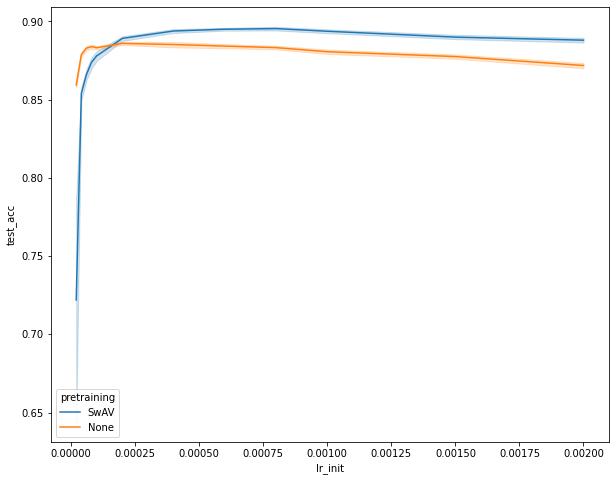

In [39]:
df_results = pd.read_csv("tcga_lr.csv")
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)
plt.figure(figsize=(10, 8))
sns.lineplot(data=df_le, x="lr_init", y="test_acc", hue="pretraining")

In [40]:
df_le.groupby(["pretraining", "lr_init"], as_index=False).mean()

,pretraining,lr_init,Unnamed: 0,epoch,val_acc,val_loss,test_acc,test_loss
0,None,0.00002,50903.24,31.54,0.863207,1.762683,0.859416,1.806913
1,None,0.00004,42322.60,27.68,0.878418,1.662235,0.878845,1.705608
2,None,0.00006,35275.42,25.30,0.882808,1.638685,0.882951,1.679131
3,None,0.00008,29408.48,25.26,0.883991,1.596994,0.883920,1.636408
4,None,0.00010,24034.10,24.30,0.882509,1.586370,0.883207,1.624377
5,None,0.00020,18980.36,25.74,0.885445,1.403432,0.885987,1.446318
6,None,0.00040,14923.30,25.38,0.883279,1.207521,0.885260,1.251136
7,None,0.00060,11749.64,26.64,0.883806,1.007866,0.884262,1.048210
8,None,0.00080,8831.82,25.10,0.881696,0.941611,0.883279,0.982674
9,None,0.00100,6205.12,24.22,0.880513,0.860297,0.880656,0.899773


# Final SwAV performance evaluation

In [5]:
steps = (
    list(np.arange(0.01, 0.05, 0.001))
    + list(np.arange(0.05, 0.14, 0.005))
    + list(np.arange(0.14, 0.30, 0.01))
    + list(np.arange(0.30, 1.05, 0.05))
)

lr_catalog = {
    "SwAV": 0.0008,
    "None": 0.0004,
}

name = "demo_swav_performance_tcga"
logger = LogResults(name, ["prop", "lr_init", "pretraining", "bs", "nb_labels"])

for prop in steps:
    
    # Finetuning and evaluation
    
    prop = round(prop, 3)
    idx = generate_indices(dataset, prop)
    base_bs = 256
    margin = 0.5
    bs = round(len(idx[0]) / (len(idx[0]) // base_bs + margin))

    dataloaders = get_dataloaders(cancer_dataset, idx, [bs, bs, bs])
    
    for pretraining in  ["SwAV", "None"]:
        
        lr = lr_catalog[pretraining]
        
        logger.update_hyps([prop, lr, pretraining, bs, len(idx[0])])

        config_nn = {
            "epochs": 200,
            "lr_init": lr,
            "early_stop": 5,
        }

        for i in range(50):

            net = Net(input_dim, output_dim).to(device)

            if pretraining == "SwAV":
                print("transfer...")
                transfer_weights(net, f"data/s15/swav_state_dict_bs_64_{str(i % 10)}.pt")
            train_nn(config_nn, dataloaders, net, weights=w, early_stop=5, log=False, logger=logger)

            logger.next_run()
            logger.show_progression()                

        logger.save_csv()


9352 elements in the dataset
67 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 1, below are the last 5 epochs :
       id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
24  run-0    24  0.817534  0.972593  0.807555   1.038821  0.01   0.0008   
25  run-0    25  0.826087  0.963087  0.805417   1.028981  0.01   0.0008   
26  run-0    26  0.825374  0.949545  0.803279   1.009192  0.01   0.0008   
27  run-0    27  0.825374  0.926415  0.811832   0.984234  0.01   0.0008   
28  run-0    28  0.832502  0.902719  0.806842   0.990061  0.01   0.0008   

   pretraining   bs nb_labels  
24        SwAV  134        67  
25        SwAV  134        67  
26        SwAV  134        67  
27        SwAV  134        67  
28        SwAV  134        67  
transfer...

Iteration 2, below are the last 5 epochs :
       id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
48  run-1    19  0.835353  1.089062  0.817534   1.137831

transfer...

Iteration 13, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
358  run-12    28  0.823236  0.896489  0.812545   0.962000  0.01   0.0008   
359  run-12    29  0.828225  0.872512  0.809694   0.937369  0.01   0.0008   
360  run-12    30  0.825374  0.882604  0.817534   0.930458  0.01   0.0008   
361  run-12    31  0.826087  0.863143  0.813257   0.930261  0.01   0.0008   
362  run-12    32  0.828225  0.858634  0.810406   0.921806  0.01   0.0008   

    pretraining   bs nb_labels  
358        SwAV  134        67  
359        SwAV  134        67  
360        SwAV  134        67  
361        SwAV  134        67  
362        SwAV  134        67  
transfer...

Iteration 14, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
384  run-13    21  0.830364  1.033884  0.813257   1.110645  0.01   0.0008   
385  run-13    22  0.835353  1.016925  0.814683   1.075842  0.01   0.00

transfer...

Iteration 25, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
716  run-24    24  0.823236  0.953754  0.811832   1.002811  0.01   0.0008   
717  run-24    25  0.819672  0.922421  0.816108   0.984844  0.01   0.0008   
718  run-24    26  0.826087  0.916923  0.810406   0.968333  0.01   0.0008   
719  run-24    27  0.820385  0.898555  0.809694   0.973409  0.01   0.0008   
720  run-24    28  0.826087  0.889381  0.817534   0.945725  0.01   0.0008   

    pretraining   bs nb_labels  
716        SwAV  134        67  
717        SwAV  134        67  
718        SwAV  134        67  
719        SwAV  134        67  
720        SwAV  134        67  
transfer...

Iteration 26, below are the last 5 epochs :
         id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
743  run-25    22  0.826800  0.996065  0.813257   1.074434  0.01   0.0008   
744  run-25    23  0.829651  0.985246  0.815396   1.056496  0.01   0.00

transfer...

Iteration 37, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
1058  run-36    22  0.819672  1.031727  0.818959   1.095143  0.01   0.0008   
1059  run-36    23  0.813257  0.999017  0.816108   1.059243  0.01   0.0008   
1060  run-36    24  0.816821  0.973201  0.808268   1.030496  0.01   0.0008   
1061  run-36    25  0.819672  0.968288  0.808268   1.013001  0.01   0.0008   
1062  run-36    26  0.815396  0.941550  0.813257   1.008188  0.01   0.0008   

     pretraining   bs nb_labels  
1058        SwAV  134        67  
1059        SwAV  134        67  
1060        SwAV  134        67  
1061        SwAV  134        67  
1062        SwAV  134        67  
transfer...

Iteration 38, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
1095  run-37    32  0.824661  0.867195  0.818959   0.916964  0.01   0.0008   
1096  run-37    33  0.823236  0.857236  0.811119   0.9051

transfer...

Iteration 49, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
1402  run-48    23  0.828938  0.998786  0.828938   1.028783  0.01   0.0008   
1403  run-48    24  0.832502  0.982144  0.829651   1.006342  0.01   0.0008   
1404  run-48    25  0.826087  0.956446  0.825374   0.997060  0.01   0.0008   
1405  run-48    26  0.830364  0.945566  0.828225   0.975151  0.01   0.0008   
1406  run-48    27  0.826087  0.931971  0.825374   0.969965  0.01   0.0008   

     pretraining   bs nb_labels  
1402        SwAV  134        67  
1403        SwAV  134        67  
1404        SwAV  134        67  
1405        SwAV  134        67  
1406        SwAV  134        67  
transfer...

Iteration 50, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
1428  run-49    21  0.823236  1.019307  0.823236   1.075765  0.01   0.0008   
1429  run-49    22  0.820385  1.007976  0.821098   1.0382


Iteration 61, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
1767  run-60    26  0.808268  1.616743  0.769066   1.652235  0.01   0.0004   
1768  run-60    27  0.800428  1.587724  0.769066   1.640603  0.01   0.0004   
1769  run-60    28  0.806842  1.571835  0.773343   1.611636  0.01   0.0004   
1770  run-60    29  0.808268  1.546695  0.774056   1.600461  0.01   0.0004   
1771  run-60    30  0.811832  1.515700  0.771917   1.576269  0.01   0.0004   

     pretraining   bs nb_labels  
1767        None  134        67  
1768        None  134        67  
1769        None  134        67  
1770        None  134        67  
1771        None  134        67  

Iteration 62, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
1802  run-61    30  0.815396  1.587859  0.789736   1.628521  0.01   0.0004   
1803  run-61    31  0.814683  1.563892  0.789736   1.615614  0.01   0.0004   
180


Iteration 73, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
2169  run-72    30  0.807555  1.551816  0.789024   1.605764  0.01   0.0004   
2170  run-72    31  0.804704  1.521247  0.789024   1.586516  0.01   0.0004   
2171  run-72    32  0.806842  1.512729  0.785460   1.567205  0.01   0.0004   
2172  run-72    33  0.811832  1.505987  0.794013   1.545308  0.01   0.0004   
2173  run-72    34  0.811832  1.488394  0.791875   1.537164  0.01   0.0004   

     pretraining   bs nb_labels  
2169        None  134        67  
2170        None  134        67  
2171        None  134        67  
2172        None  134        67  
2173        None  134        67  

Iteration 74, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
2204  run-73    30  0.801853  1.508150  0.782609   1.546103  0.01   0.0004   
2205  run-73    31  0.800428  1.481914  0.785460   1.526601  0.01   0.0004   
220


Iteration 85, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
2550  run-84    22  0.809694  1.755398  0.799002   1.784968  0.01   0.0004   
2551  run-84    23  0.806130  1.729843  0.796864   1.759148  0.01   0.0004   
2552  run-84    24  0.812545  1.690607  0.794013   1.731351  0.01   0.0004   
2553  run-84    25  0.807555  1.649276  0.794013   1.694468  0.01   0.0004   
2554  run-84    26  0.812545  1.639057  0.799002   1.661655  0.01   0.0004   

     pretraining   bs nb_labels  
2550        None  134        67  
2551        None  134        67  
2552        None  134        67  
2553        None  134        67  
2554        None  134        67  

Iteration 86, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
2588  run-85    33  0.813970  1.488059  0.792587   1.534434  0.01   0.0004   
2589  run-85    34  0.816108  1.469179  0.788311   1.517920  0.01   0.0004   
259


Iteration 97, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
2962  run-96    25  0.821098  1.660857  0.798289   1.699221  0.01   0.0004   
2963  run-96    26  0.819672  1.639212  0.804704   1.679808  0.01   0.0004   
2964  run-96    27  0.820385  1.609538  0.803279   1.657294  0.01   0.0004   
2965  run-96    28  0.823236  1.584584  0.800428   1.639700  0.01   0.0004   
2966  run-96    29  0.821810  1.593636  0.793300   1.611392  0.01   0.0004   

     pretraining   bs nb_labels  
2962        None  134        67  
2963        None  134        67  
2964        None  134        67  
2965        None  134        67  
2966        None  134        67  

Iteration 98, below are the last 5 epochs :
          id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
2988  run-97    21  0.797577  1.801806  0.786172   1.823226  0.01   0.0004   
2989  run-97    22  0.796864  1.770022  0.787598   1.800867  0.01   0.0004   
299


Iteration 108, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
3285  run-107    25  0.831076  0.991581  0.827512   1.043323  0.011   0.0008   
3286  run-107    26  0.835353  0.968384  0.830364   1.021096  0.011   0.0008   
3287  run-107    27  0.833215  0.949827  0.831076   1.002407  0.011   0.0008   
3288  run-107    28  0.835353  0.928330  0.827512   0.984168  0.011   0.0008   
3289  run-107    29  0.831076  0.912920  0.833927   0.973257  0.011   0.0008   

     pretraining   bs nb_labels  
3285        SwAV  144        72  
3286        SwAV  144        72  
3287        SwAV  144        72  
3288        SwAV  144        72  
3289        SwAV  144        72  
transfer...

Iteration 109, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
3314  run-108    24  0.849608  0.854668  0.851746   0.909953  0.011   0.0008   
3315  run-108    25  0.848895  0.840167  0.849608  

transfer...

Iteration 120, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
3608  run-119    21  0.818247  1.002270  0.806842   1.051304  0.011   0.0008   
3609  run-119    22  0.823236  0.986295  0.818247   1.035585  0.011   0.0008   
3610  run-119    23  0.813970  0.967607  0.810406   1.014124  0.011   0.0008   
3611  run-119    24  0.819672  0.950115  0.815396   0.998010  0.011   0.0008   
3612  run-119    25  0.816821  0.936844  0.811832   0.985216  0.011   0.0008   

     pretraining   bs nb_labels  
3608        SwAV  144        72  
3609        SwAV  144        72  
3610        SwAV  144        72  
3611        SwAV  144        72  
3612        SwAV  144        72  
transfer...

Iteration 121, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
3634  run-120    21  0.822523  1.031647  0.812545   1.090641  0.011   0.0008   
3635  run-120    22  0.828938  1.007407

transfer...

Iteration 132, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
3956  run-131    21  0.841055  0.990577  0.816108   1.042967  0.011   0.0008   
3957  run-131    22  0.836066  0.971525  0.818247   1.020154  0.011   0.0008   
3958  run-131    23  0.835353  0.948034  0.816821   0.995994  0.011   0.0008   
3959  run-131    24  0.844619  0.929542  0.821810   0.978735  0.011   0.0008   
3960  run-131    25  0.838204  0.908760  0.821810   0.959677  0.011   0.0008   

     pretraining   bs nb_labels  
3956        SwAV  144        72  
3957        SwAV  144        72  
3958        SwAV  144        72  
3959        SwAV  144        72  
3960        SwAV  144        72  
transfer...

Iteration 133, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
3980  run-132    19  0.831076  1.048060  0.819672   1.100128  0.011   0.0008   
3981  run-132    20  0.840342  1.016289

transfer...

Iteration 144, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
4301  run-143    24  0.833927  0.928104  0.820385   0.989157  0.011   0.0008   
4302  run-143    25  0.834640  0.906729  0.819672   0.968077  0.011   0.0008   
4303  run-143    26  0.835353  0.889670  0.818247   0.946466  0.011   0.0008   
4304  run-143    27  0.835353  0.871714  0.812545   0.934698  0.011   0.0008   
4305  run-143    28  0.833927  0.862287  0.813970   0.923950  0.011   0.0008   

     pretraining   bs nb_labels  
4301        SwAV  144        72  
4302        SwAV  144        72  
4303        SwAV  144        72  
4304        SwAV  144        72  
4305        SwAV  144        72  
transfer...

Iteration 145, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
4326  run-144    20  0.829651  1.051391  0.827512   1.098870  0.011   0.0008   
4327  run-144    21  0.832502  1.026396


Iteration 156, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
4683  run-155    37  0.801853  1.416522  0.789024   1.467967  0.011   0.0004   
4684  run-155    38  0.808981  1.403152  0.794013   1.458490  0.011   0.0004   
4685  run-155    39  0.802566  1.393439  0.793300   1.444642  0.011   0.0004   
4686  run-155    40  0.808268  1.383294  0.794013   1.438410  0.011   0.0004   
4687  run-155    41  0.805417  1.371454  0.791162   1.424661  0.011   0.0004   

     pretraining   bs nb_labels  
4683        None  144        72  
4684        None  144        72  
4685        None  144        72  
4686        None  144        72  
4687        None  144        72  

Iteration 157, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
4721  run-156    33  0.819672  1.438182  0.803279   1.490076  0.011   0.0004   
4722  run-156    34  0.821098  1.422001  0.799002   1.479305  0


Iteration 168, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
5047  run-167    23  0.811119  1.710629  0.789736   1.750812  0.011   0.0004   
5048  run-167    24  0.812545  1.676623  0.786885   1.724075  0.011   0.0004   
5049  run-167    25  0.811119  1.646945  0.784747   1.695311  0.011   0.0004   
5050  run-167    26  0.811119  1.624222  0.792587   1.674377  0.011   0.0004   
5051  run-167    27  0.813257  1.600979  0.791162   1.642937  0.011   0.0004   

     pretraining   bs nb_labels  
5047        None  144        72  
5048        None  144        72  
5049        None  144        72  
5050        None  144        72  
5051        None  144        72  

Iteration 169, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
5080  run-168    28  0.815396  1.608883  0.796151   1.660078  0.011   0.0004   
5081  run-168    29  0.806842  1.580463  0.797577   1.640792  0


Iteration 180, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
5429  run-179    29  0.818247  1.580883  0.796151   1.627378  0.011   0.0004   
5430  run-179    30  0.817534  1.560364  0.796151   1.601499  0.011   0.0004   
5431  run-179    31  0.821810  1.542763  0.794726   1.587576  0.011   0.0004   
5432  run-179    32  0.820385  1.526966  0.794726   1.565723  0.011   0.0004   
5433  run-179    33  0.818959  1.505967  0.797577   1.549792  0.011   0.0004   

     pretraining   bs nb_labels  
5429        None  144        72  
5430        None  144        72  
5431        None  144        72  
5432        None  144        72  
5433        None  144        72  

Iteration 181, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
5464  run-180    30  0.812545  1.523882  0.789736   1.568078  0.011   0.0004   
5465  run-180    31  0.808268  1.508314  0.795438   1.553580  0


Iteration 192, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
5788  run-191    28  0.796151  1.539696  0.791875   1.576661  0.011   0.0004   
5789  run-191    29  0.799715  1.512583  0.786885   1.557490  0.011   0.0004   
5790  run-191    30  0.804704  1.486999  0.789024   1.537527  0.011   0.0004   
5791  run-191    31  0.806130  1.469663  0.787598   1.516943  0.011   0.0004   
5792  run-191    32  0.803991  1.454769  0.793300   1.495214  0.011   0.0004   

     pretraining   bs nb_labels  
5788        None  144        72  
5789        None  144        72  
5790        None  144        72  
5791        None  144        72  
5792        None  144        72  

Iteration 193, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
5823  run-192    30  0.816821  1.503660  0.790449   1.540968  0.011   0.0004   
5824  run-192    31  0.820385  1.485877  0.801140   1.523422  0

transfer...

Iteration 204, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
6165  run-203    26  0.845331  0.900688  0.838917   0.914077  0.012   0.0008   
6166  run-203    27  0.846757  0.872095  0.840342   0.908233  0.012   0.0008   
6167  run-203    28  0.849608  0.825586  0.837491   0.900192  0.012   0.0008   
6168  run-203    29  0.851033  0.813099  0.840342   0.864924  0.012   0.0008   
6169  run-203    30  0.846757  0.864666  0.830364   0.853921  0.012   0.0008   

     pretraining   bs nb_labels  
6165        SwAV  154        77  
6166        SwAV  154        77  
6167        SwAV  154        77  
6168        SwAV  154        77  
6169        SwAV  154        77  
transfer...

Iteration 205, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
6190  run-204    20  0.833215  1.038966  0.827512   1.089588  0.012   0.0008   
6191  run-204    21  0.834640  1.003818

transfer...

Iteration 216, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
6491  run-215    27  0.841768  0.822138  0.839629   0.984494  0.012   0.0008   
6492  run-215    28  0.839629  0.907561  0.833927   0.941830  0.012   0.0008   
6493  run-215    29  0.843193  0.834912  0.838917   0.945960  0.012   0.0008   
6494  run-215    30  0.848895  0.885752  0.831789   0.893107  0.012   0.0008   
6495  run-215    31  0.846044  0.807698  0.833927   0.870118  0.012   0.0008   

     pretraining   bs nb_labels  
6491        SwAV  154        77  
6492        SwAV  154        77  
6493        SwAV  154        77  
6494        SwAV  154        77  
6495        SwAV  154        77  
transfer...

Iteration 217, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
6519  run-216    23  0.835353  0.942869  0.833215   0.974653  0.012   0.0008   
6520  run-216    24  0.837491  0.893976

transfer...

Iteration 228, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
6828  run-227    31  0.841055  0.788602  0.838917   0.858588  0.012   0.0008   
6829  run-227    32  0.841055  0.803439  0.836778   0.840954  0.012   0.0008   
6830  run-227    33  0.840342  0.786147  0.840342   0.861567  0.012   0.0008   
6831  run-227    34  0.836778  0.764365  0.839629   0.821477  0.012   0.0008   
6832  run-227    35  0.838204  0.766424  0.840342   0.816727  0.012   0.0008   

     pretraining   bs nb_labels  
6828        SwAV  154        77  
6829        SwAV  154        77  
6830        SwAV  154        77  
6831        SwAV  154        77  
6832        SwAV  154        77  
transfer...

Iteration 229, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
6854  run-228    21  0.838204  1.010702  0.837491   1.053381  0.012   0.0008   
6855  run-228    22  0.838917  0.963360

transfer...

Iteration 240, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
7142  run-239    14  0.832502  1.186538  0.822523   1.249260  0.012   0.0008   
7143  run-239    15  0.833927  1.155186  0.833215   1.239833  0.012   0.0008   
7144  run-239    16  0.836778  1.119886  0.829651   1.169808  0.012   0.0008   
7145  run-239    17  0.836066  1.083335  0.830364   1.131311  0.012   0.0008   
7146  run-239    18  0.838917  1.088744  0.834640   1.119238  0.012   0.0008   

     pretraining   bs nb_labels  
7142        SwAV  154        77  
7143        SwAV  154        77  
7144        SwAV  154        77  
7145        SwAV  154        77  
7146        SwAV  154        77  
transfer...

Iteration 241, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
7170  run-240    23  0.834640  0.958402  0.823236   1.014220  0.012   0.0008   
7171  run-240    24  0.836778  0.920095


Iteration 252, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
7455  run-251    19  0.817534  1.749301  0.794726   1.780722  0.012   0.0004   
7456  run-251    20  0.816108  1.757411  0.794726   1.767975  0.012   0.0004   
7457  run-251    21  0.822523  1.720873  0.801140   1.705579  0.012   0.0004   
7458  run-251    22  0.823236  1.680237  0.791162   1.684721  0.012   0.0004   
7459  run-251    23  0.820385  1.606305  0.791875   1.711012  0.012   0.0004   

     pretraining   bs nb_labels  
7455        None  154        77  
7456        None  154        77  
7457        None  154        77  
7458        None  154        77  
7459        None  154        77  

Iteration 253, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
7481  run-252    21  0.821810  1.721272  0.810406   1.739222  0.012   0.0004   
7482  run-252    22  0.828938  1.663517  0.816821   1.704124  0


Iteration 264, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
7809  run-263    24  0.814683  1.645743  0.810406   1.689986  0.012   0.0004   
7810  run-263    25  0.814683  1.607425  0.813257   1.632997  0.012   0.0004   
7811  run-263    26  0.814683  1.602283  0.816108   1.606090  0.012   0.0004   
7812  run-263    27  0.813257  1.568058  0.818247   1.604325  0.012   0.0004   
7813  run-263    28  0.813257  1.525071  0.812545   1.570019  0.012   0.0004   

     pretraining   bs nb_labels  
7809        None  154        77  
7810        None  154        77  
7811        None  154        77  
7812        None  154        77  
7813        None  154        77  

Iteration 265, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
7842  run-264    28  0.808981  1.515778  0.803279   1.590634  0.012   0.0004   
7843  run-264    29  0.813257  1.478901  0.806130   1.531204  0


Iteration 276, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
8168  run-275    19  0.815396  1.778464  0.806130   1.824190  0.012   0.0004   
8169  run-275    20  0.822523  1.748231  0.806842   1.785380  0.012   0.0004   
8170  run-275    21  0.814683  1.717658  0.812545   1.769160  0.012   0.0004   
8171  run-275    22  0.818247  1.677160  0.809694   1.698251  0.012   0.0004   
8172  run-275    23  0.818959  1.636326  0.813257   1.671844  0.012   0.0004   

     pretraining   bs nb_labels  
8168        None  154        77  
8169        None  154        77  
8170        None  154        77  
8171        None  154        77  
8172        None  154        77  

Iteration 277, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
8195  run-276    22  0.808268  1.710824  0.795438   1.751703  0.012   0.0004   
8196  run-276    23  0.815396  1.671244  0.796864   1.695245  0


Iteration 288, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
8568  run-287    24  0.826087  1.638376  0.810406   1.662771  0.012   0.0004   
8569  run-287    25  0.826800  1.608506  0.803279   1.613937  0.012   0.0004   
8570  run-287    26  0.823236  1.536002  0.809694   1.571411  0.012   0.0004   
8571  run-287    27  0.823236  1.567778  0.809694   1.543443  0.012   0.0004   
8572  run-287    28  0.823949  1.480405  0.808268   1.537463  0.012   0.0004   

     pretraining   bs nb_labels  
8568        None  154        77  
8569        None  154        77  
8570        None  154        77  
8571        None  154        77  
8572        None  154        77  

Iteration 289, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
8596  run-288    23  0.818247  1.647207  0.808268   1.649769  0.012   0.0004   
8597  run-288    24  0.820385  1.601468  0.801853   1.674550  0


Iteration 300, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
8935  run-299    23  0.828225  1.674450  0.812545   1.683207  0.012   0.0004   
8936  run-299    24  0.825374  1.607377  0.811832   1.634971  0.012   0.0004   
8937  run-299    25  0.822523  1.619278  0.810406   1.599877  0.012   0.0004   
8938  run-299    26  0.826800  1.576552  0.808268   1.555296  0.012   0.0004   
8939  run-299    27  0.823949  1.528581  0.811832   1.580131  0.012   0.0004   

     pretraining   bs nb_labels  
8935        None  154        77  
8936        None  154        77  
8937        None  154        77  
8938        None  154        77  
8939        None  154        77  
9352 elements in the dataset
84 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 301, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
8966  run-300    

transfer...

Iteration 311, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
9244  run-310    16  0.836778  1.084061  0.823236   1.147987  0.013   0.0008   
9245  run-310    17  0.831789  1.046678  0.821810   1.106869  0.013   0.0008   
9246  run-310    18  0.834640  1.009185  0.828938   1.079026  0.013   0.0008   
9247  run-310    19  0.836066  0.994658  0.823236   1.058247  0.013   0.0008   
9248  run-310    20  0.833927  0.962992  0.823236   1.021761  0.013   0.0008   

     pretraining   bs nb_labels  
9244        SwAV  168        84  
9245        SwAV  168        84  
9246        SwAV  168        84  
9247        SwAV  168        84  
9248        SwAV  168        84  
transfer...

Iteration 312, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
9265  run-311    16  0.853885  1.012744  0.846757   1.075088  0.013   0.0008   
9266  run-311    17  0.856023  0.983428

transfer...

Iteration 323, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
9562  run-322    26  0.843906  0.858072  0.845331   0.922109  0.013   0.0008   
9563  run-322    27  0.843906  0.842861  0.838917   0.891579  0.013   0.0008   
9564  run-322    28  0.843906  0.834727  0.843906   0.895072  0.013   0.0008   
9565  run-322    29  0.840342  0.817373  0.841055   0.848305  0.013   0.0008   
9566  run-322    30  0.845331  0.797823  0.840342   0.844763  0.013   0.0008   

     pretraining   bs nb_labels  
9562        SwAV  168        84  
9563        SwAV  168        84  
9564        SwAV  168        84  
9565        SwAV  168        84  
9566        SwAV  168        84  
transfer...

Iteration 324, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
9589  run-323    22  0.828938  0.960705  0.834640   1.035733  0.013   0.0008   
9590  run-323    23  0.829651  0.939040

transfer...

Iteration 335, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
9873  run-334    16  0.840342  1.158722  0.834640   1.206124  0.013   0.0008   
9874  run-334    17  0.839629  1.103349  0.835353   1.156482  0.013   0.0008   
9875  run-334    18  0.834640  1.097305  0.835353   1.115995  0.013   0.0008   
9876  run-334    19  0.833927  1.075995  0.835353   1.092437  0.013   0.0008   
9877  run-334    20  0.838204  1.012902  0.838204   1.065866  0.013   0.0008   

     pretraining   bs nb_labels  
9873        SwAV  168        84  
9874        SwAV  168        84  
9875        SwAV  168        84  
9876        SwAV  168        84  
9877        SwAV  168        84  
transfer...

Iteration 336, below are the last 5 epochs :
           id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
9899  run-335    21  0.830364  0.986796  0.828938   1.032684  0.013   0.0008   
9900  run-335    22  0.833215  0.975139

transfer...

Iteration 346, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
10180  run-345    18  0.856736  1.061933  0.841768   1.104105  0.013   0.0008   
10181  run-345    19  0.848182  1.023985  0.838204   1.078708  0.013   0.0008   
10182  run-345    20  0.853172  0.990602  0.843906   1.061588  0.013   0.0008   
10183  run-345    21  0.851033  0.969957  0.844619   1.034983  0.013   0.0008   
10184  run-345    22  0.843906  0.946446  0.837491   0.986440  0.013   0.0008   

      pretraining   bs nb_labels  
10180        SwAV  168        84  
10181        SwAV  168        84  
10182        SwAV  168        84  
10183        SwAV  168        84  
10184        SwAV  168        84  
transfer...

Iteration 347, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
10215  run-346    30  0.841768  0.786573  0.839629   0.862264  0.013   0.0008   
10216  run-346    31  0.8


Iteration 357, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
10506  run-356    19  0.807555  1.821006  0.795438   1.841923  0.013   0.0004   
10507  run-356    20  0.809694  1.785562  0.794013   1.815945  0.013   0.0004   
10508  run-356    21  0.804704  1.736193  0.796864   1.767586  0.013   0.0004   
10509  run-356    22  0.809694  1.704642  0.797577   1.747828  0.013   0.0004   
10510  run-356    23  0.808981  1.687166  0.796864   1.701798  0.013   0.0004   

      pretraining   bs nb_labels  
10506        None  168        84  
10507        None  168        84  
10508        None  168        84  
10509        None  168        84  
10510        None  168        84  

Iteration 358, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
10521  run-357    10  0.788311  2.110337  0.796864   2.116329  0.013   0.0004   
10522  run-357    11  0.793300  2.056960  0.79828


Iteration 369, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
10833  run-368    24  0.831789  1.583369  0.811832   1.623527  0.013   0.0004   
10834  run-368    25  0.828225  1.556484  0.819672   1.600114  0.013   0.0004   
10835  run-368    26  0.828938  1.526935  0.813970   1.578060  0.013   0.0004   
10836  run-368    27  0.825374  1.496168  0.820385   1.543318  0.013   0.0004   
10837  run-368    28  0.831076  1.483197  0.816108   1.516459  0.013   0.0004   

      pretraining   bs nb_labels  
10833        None  168        84  
10834        None  168        84  
10835        None  168        84  
10836        None  168        84  
10837        None  168        84  

Iteration 370, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
10875  run-369    37  0.823236  1.277698  0.823236   1.330361  0.013   0.0004   
10876  run-369    38  0.825374  1.247256  0.83250


Iteration 381, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
11176  run-380    23  0.827512  1.582178  0.812545   1.626507  0.013   0.0004   
11177  run-380    24  0.828938  1.547805  0.808268   1.600281  0.013   0.0004   
11178  run-380    25  0.828225  1.507160  0.811832   1.578679  0.013   0.0004   
11179  run-380    26  0.827512  1.502744  0.815396   1.535306  0.013   0.0004   
11180  run-380    27  0.828225  1.473109  0.812545   1.515101  0.013   0.0004   

      pretraining   bs nb_labels  
11176        None  168        84  
11177        None  168        84  
11178        None  168        84  
11179        None  168        84  
11180        None  168        84  

Iteration 382, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
11208  run-381    27  0.837491  1.489237  0.821810   1.550060  0.013   0.0004   
11209  run-381    28  0.833927  1.475818  0.81967


Iteration 393, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
11533  run-392    27  0.821098  1.437038  0.822523   1.491264  0.013   0.0004   
11534  run-392    28  0.819672  1.416258  0.823236   1.456557  0.013   0.0004   
11535  run-392    29  0.821810  1.387020  0.825374   1.438806  0.013   0.0004   
11536  run-392    30  0.816821  1.373314  0.822523   1.413721  0.013   0.0004   
11537  run-392    31  0.823236  1.351942  0.819672   1.380571  0.013   0.0004   

      pretraining   bs nb_labels  
11533        None  168        84  
11534        None  168        84  
11535        None  168        84  
11536        None  168        84  
11537        None  168        84  

Iteration 394, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
11555  run-393    17  0.826087  1.823801  0.818959   1.843019  0.013   0.0004   
11556  run-393    18  0.823236  1.782393  0.81539

transfer...

Iteration 404, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
11854  run-403    21  0.846757  0.968049  0.848182   1.004445  0.014   0.0008   
11855  run-403    22  0.845331  0.949522  0.851033   0.974320  0.014   0.0008   
11856  run-403    23  0.851033  0.917940  0.844619   0.960506  0.014   0.0008   
11857  run-403    24  0.851033  0.901519  0.851746   0.940451  0.014   0.0008   
11858  run-403    25  0.849608  0.873986  0.851746   0.915676  0.014   0.0008   

      pretraining   bs nb_labels  
11854        SwAV  184        92  
11855        SwAV  184        92  
11856        SwAV  184        92  
11857        SwAV  184        92  
11858        SwAV  184        92  
transfer...

Iteration 405, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
11880  run-404    21  0.851033  0.937283  0.849608   0.973925  0.014   0.0008   
11881  run-404    22  0.8

transfer...

Iteration 415, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
12144  run-414    22  0.846757  0.926825  0.839629   0.969123  0.014   0.0008   
12145  run-414    23  0.837491  0.903609  0.843193   0.943037  0.014   0.0008   
12146  run-414    24  0.838204  0.889557  0.838917   0.920561  0.014   0.0008   
12147  run-414    25  0.841055  0.864553  0.839629   0.902889  0.014   0.0008   
12148  run-414    26  0.839629  0.844745  0.841768   0.878170  0.014   0.0008   

      pretraining   bs nb_labels  
12144        SwAV  184        92  
12145        SwAV  184        92  
12146        SwAV  184        92  
12147        SwAV  184        92  
12148        SwAV  184        92  
transfer...

Iteration 416, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
12171  run-415    22  0.852459  0.887337  0.849608   0.932319  0.014   0.0008   
12172  run-415    23  0.8

transfer...

Iteration 426, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
12445  run-425    15  0.861012  1.124889  0.851746   1.176622  0.014   0.0008   
12446  run-425    16  0.858874  1.076819  0.856023   1.129945  0.014   0.0008   
12447  run-425    17  0.856023  1.035788  0.858161   1.090667  0.014   0.0008   
12448  run-425    18  0.855310  1.007539  0.856023   1.057012  0.014   0.0008   
12449  run-425    19  0.856736  0.974357  0.862438   1.026137  0.014   0.0008   

      pretraining   bs nb_labels  
12445        SwAV  184        92  
12446        SwAV  184        92  
12447        SwAV  184        92  
12448        SwAV  184        92  
12449        SwAV  184        92  
transfer...

Iteration 427, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
12473  run-426    23  0.841055  0.874283  0.841768   0.921580  0.014   0.0008   
12474  run-426    24  0.8

transfer...

Iteration 437, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
12747  run-436    25  0.846757  0.874900  0.843193   0.929742  0.014   0.0008   
12748  run-436    26  0.846757  0.855938  0.843906   0.914610  0.014   0.0008   
12749  run-436    27  0.845331  0.843233  0.840342   0.891596  0.014   0.0008   
12750  run-436    28  0.846044  0.817334  0.841768   0.879868  0.014   0.0008   
12751  run-436    29  0.848895  0.799041  0.838917   0.873012  0.014   0.0008   

      pretraining   bs nb_labels  
12747        SwAV  184        92  
12748        SwAV  184        92  
12749        SwAV  184        92  
12750        SwAV  184        92  
12751        SwAV  184        92  
transfer...

Iteration 438, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
12775  run-437    23  0.840342  0.923285  0.831789   0.975268  0.014   0.0008   
12776  run-437    24  0.8

transfer...

Iteration 448, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
13033  run-447    27  0.848895  0.811860  0.852459   0.860995  0.014   0.0008   
13034  run-447    28  0.851033  0.796219  0.848182   0.841343  0.014   0.0008   
13035  run-447    29  0.848182  0.779720  0.849608   0.819365  0.014   0.0008   
13036  run-447    30  0.849608  0.761962  0.849608   0.803181  0.014   0.0008   
13037  run-447    31  0.846757  0.757241  0.852459   0.800099  0.014   0.0008   

      pretraining   bs nb_labels  
13033        SwAV  184        92  
13034        SwAV  184        92  
13035        SwAV  184        92  
13036        SwAV  184        92  
13037        SwAV  184        92  
transfer...

Iteration 449, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
13059  run-448    21  0.844619  0.955908  0.833927   1.006644  0.014   0.0008   
13060  run-448    22  0.8


Iteration 459, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
13325  run-458    25  0.840342  1.465526  0.827512   1.513600  0.014   0.0004   
13326  run-458    26  0.840342  1.436956  0.831076   1.482282  0.014   0.0004   
13327  run-458    27  0.840342  1.406139  0.826800   1.456215  0.014   0.0004   
13328  run-458    28  0.840342  1.381551  0.826087   1.430611  0.014   0.0004   
13329  run-458    29  0.838204  1.350344  0.833927   1.401615  0.014   0.0004   

      pretraining   bs nb_labels  
13325        None  184        92  
13326        None  184        92  
13327        None  184        92  
13328        None  184        92  
13329        None  184        92  

Iteration 460, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
13359  run-459    29  0.835353  1.410122  0.823236   1.447165  0.014   0.0004   
13360  run-459    30  0.831789  1.392782  0.83250


Iteration 471, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
13680  run-470    14  0.815396  2.001767  0.808268   2.015959  0.014   0.0004   
13681  run-470    15  0.816108  1.960297  0.798289   1.972763  0.014   0.0004   
13682  run-470    16  0.816108  1.912335  0.802566   1.930726  0.014   0.0004   
13683  run-470    17  0.818959  1.876797  0.806130   1.898845  0.014   0.0004   
13684  run-470    18  0.818247  1.834863  0.805417   1.854575  0.014   0.0004   

      pretraining   bs nb_labels  
13680        None  184        92  
13681        None  184        92  
13682        None  184        92  
13683        None  184        92  
13684        None  184        92  

Iteration 472, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
13709  run-471    24  0.835353  1.545545  0.821098   1.565373  0.014   0.0004   
13710  run-471    25  0.831076  1.519936  0.82252


Iteration 483, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14024  run-482    20  0.816108  1.685769  0.804704   1.708560  0.014   0.0004   
14025  run-482    21  0.822523  1.641739  0.811832   1.675008  0.014   0.0004   
14026  run-482    22  0.823236  1.594960  0.818247   1.634502  0.014   0.0004   
14027  run-482    23  0.822523  1.562284  0.810406   1.593929  0.014   0.0004   
14028  run-482    24  0.820385  1.526754  0.813970   1.551305  0.014   0.0004   

      pretraining   bs nb_labels  
14024        None  184        92  
14025        None  184        92  
14026        None  184        92  
14027        None  184        92  
14028        None  184        92  

Iteration 484, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14059  run-483    30  0.826087  1.422043  0.824661   1.452640  0.014   0.0004   
14060  run-483    31  0.828225  1.408014  0.81610


Iteration 495, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14353  run-494    27  0.837491  1.427586  0.824661   1.475754  0.014   0.0004   
14354  run-494    28  0.834640  1.396677  0.829651   1.457532  0.014   0.0004   
14355  run-494    29  0.833215  1.379754  0.827512   1.433133  0.014   0.0004   
14356  run-494    30  0.833927  1.353364  0.828938   1.403512  0.014   0.0004   
14357  run-494    31  0.834640  1.330046  0.831789   1.387101  0.014   0.0004   

      pretraining   bs nb_labels  
14353        None  184        92  
14354        None  184        92  
14355        None  184        92  
14356        None  184        92  
14357        None  184        92  

Iteration 496, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14380  run-495    22  0.831076  1.612587  0.818247   1.658054  0.014   0.0004   
14381  run-495    23  0.831789  1.579745  0.81824

transfer...

Iteration 506, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14644  run-505    23  0.860299  0.876656  0.861725   0.876010  0.015   0.0008   
14645  run-505    24  0.856736  0.842688  0.857448   0.856921  0.015   0.0008   
14646  run-505    25  0.852459  0.815057  0.857448   0.879514  0.015   0.0008   
14647  run-505    26  0.859587  0.764712  0.861725   0.843537  0.015   0.0008   
14648  run-505    27  0.862438  0.750525  0.863150   0.784174  0.015   0.0008   

      pretraining   bs nb_labels  
14644        SwAV  198        99  
14645        SwAV  198        99  
14646        SwAV  198        99  
14647        SwAV  198        99  
14648        SwAV  198        99  
transfer...

Iteration 507, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14670  run-506    21  0.868852  0.864480  0.857448   0.872223  0.015   0.0008   
14671  run-506    22  0.8

transfer...

Iteration 517, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14942  run-516    24  0.856736  0.888543  0.857448   1.000885  0.015   0.0008   
14943  run-516    25  0.854597  0.879636  0.862438   0.954810  0.015   0.0008   
14944  run-516    26  0.858161  0.875085  0.860299   0.942269  0.015   0.0008   
14945  run-516    27  0.858161  0.802005  0.857448   0.864329  0.015   0.0008   
14946  run-516    28  0.856023  0.830744  0.853885   0.850010  0.015   0.0008   

      pretraining   bs nb_labels  
14942        SwAV  198        99  
14943        SwAV  198        99  
14944        SwAV  198        99  
14945        SwAV  198        99  
14946        SwAV  198        99  
transfer...

Iteration 518, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
14974  run-517    27  0.850321  0.749266  0.849608   0.792645  0.015   0.0008   
14975  run-517    28  0.8

transfer...

Iteration 528, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
15247  run-527    25  0.841055  0.820474  0.848895   0.856094  0.015   0.0008   
15248  run-527    26  0.844619  0.814673  0.848182   0.849449  0.015   0.0008   
15249  run-527    27  0.842480  0.803498  0.848895   0.832379  0.015   0.0008   
15250  run-527    28  0.847470  0.778890  0.842480   0.869271  0.015   0.0008   
15251  run-527    29  0.849608  0.768765  0.846044   0.781399  0.015   0.0008   

      pretraining   bs nb_labels  
15247        SwAV  198        99  
15248        SwAV  198        99  
15249        SwAV  198        99  
15250        SwAV  198        99  
15251        SwAV  198        99  
transfer...

Iteration 529, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
15273  run-528    21  0.861725  0.877644  0.855310   0.955380  0.015   0.0008   
15274  run-528    22  0.8

transfer...

Iteration 539, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
15541  run-538    20  0.866001  0.893391  0.856736   0.930948  0.015   0.0008   
15542  run-538    21  0.865289  0.880634  0.856023   0.896360  0.015   0.0008   
15543  run-538    22  0.868852  0.867877  0.857448   0.860844  0.015   0.0008   
15544  run-538    23  0.859587  0.836694  0.861012   0.867298  0.015   0.0008   
15545  run-538    24  0.863863  0.811544  0.856736   0.874064  0.015   0.0008   

      pretraining   bs nb_labels  
15541        SwAV  198        99  
15542        SwAV  198        99  
15543        SwAV  198        99  
15544        SwAV  198        99  
15545        SwAV  198        99  
transfer...

Iteration 540, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
15569  run-539    23  0.863863  0.890451  0.847470   0.930353  0.015   0.0008   
15570  run-539    24  0.8

transfer...

Iteration 550, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
15842  run-549    28  0.867427  0.756837  0.853885   0.793072  0.015   0.0008   
15843  run-549    29  0.863863  0.771406  0.862438   0.783223  0.015   0.0008   
15844  run-549    30  0.868140  0.735122  0.858161   0.763372  0.015   0.0008   
15845  run-549    31  0.857448  0.699597  0.859587   0.737102  0.015   0.0008   
15846  run-549    32  0.866001  0.685988  0.863863   0.704429  0.015   0.0008   

      pretraining   bs nb_labels  
15842        SwAV  198        99  
15843        SwAV  198        99  
15844        SwAV  198        99  
15845        SwAV  198        99  
15846        SwAV  198        99  

Iteration 551, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
15870  run-550    23  0.838917  1.601549  0.826087   1.587822  0.015   0.0004   
15871  run-550    24  0.839629  1.531


Iteration 562, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
16198  run-561    29  0.846757  1.407286  0.830364   1.411912  0.015   0.0004   
16199  run-561    30  0.846044  1.342360  0.825374   1.400916  0.015   0.0004   
16200  run-561    31  0.841055  1.284318  0.826087   1.379482  0.015   0.0004   
16201  run-561    32  0.844619  1.315504  0.827512   1.355683  0.015   0.0004   
16202  run-561    33  0.845331  1.268263  0.826800   1.357607  0.015   0.0004   

      pretraining   bs nb_labels  
16198        None  198        99  
16199        None  198        99  
16200        None  198        99  
16201        None  198        99  
16202        None  198        99  

Iteration 563, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
16230  run-562    27  0.849608  1.398188  0.826087   1.488131  0.015   0.0004   
16231  run-562    28  0.843906  1.365025  0.82181


Iteration 574, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
16550  run-573    16  0.826800  1.803219  0.817534   1.877710  0.015   0.0004   
16551  run-573    17  0.831076  1.782539  0.823949   1.816532  0.015   0.0004   
16552  run-573    18  0.828225  1.740205  0.816108   1.739382  0.015   0.0004   
16553  run-573    19  0.829651  1.677228  0.821098   1.730668  0.015   0.0004   
16554  run-573    20  0.829651  1.645605  0.819672   1.719551  0.015   0.0004   

      pretraining   bs nb_labels  
16550        None  198        99  
16551        None  198        99  
16552        None  198        99  
16553        None  198        99  
16554        None  198        99  

Iteration 575, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
16580  run-574    25  0.836066  1.511351  0.823236   1.508885  0.015   0.0004   
16581  run-574    26  0.835353  1.423170  0.82323


Iteration 586, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
16881  run-585    25  0.841055  1.491453  0.826800   1.535971  0.015   0.0004   
16882  run-585    26  0.841768  1.444693  0.826087   1.504417  0.015   0.0004   
16883  run-585    27  0.832502  1.435329  0.822523   1.460298  0.015   0.0004   
16884  run-585    28  0.841055  1.441034  0.825374   1.418687  0.015   0.0004   
16885  run-585    29  0.841768  1.337255  0.826800   1.445807  0.015   0.0004   

      pretraining   bs nb_labels  
16881        None  198        99  
16882        None  198        99  
16883        None  198        99  
16884        None  198        99  
16885        None  198        99  

Iteration 587, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
16924  run-586    38  0.850321  1.216005  0.835353   1.280371  0.015   0.0004   
16925  run-586    39  0.847470  1.223425  0.83107


Iteration 598, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
17258  run-597    33  0.843193  1.283059  0.825374   1.339892  0.015   0.0004   
17259  run-597    34  0.844619  1.270966  0.823949   1.390573  0.015   0.0004   
17260  run-597    35  0.845331  1.215420  0.828225   1.305483  0.015   0.0004   
17261  run-597    36  0.836778  1.258720  0.829651   1.255873  0.015   0.0004   
17262  run-597    37  0.844619  1.227624  0.822523   1.306776  0.015   0.0004   

      pretraining   bs nb_labels  
17258        None  198        99  
17259        None  198        99  
17260        None  198        99  
17261        None  198        99  
17262        None  198        99  

Iteration 599, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
17290  run-598    27  0.848895  1.445642  0.825374   1.490824  0.015   0.0004   
17291  run-598    28  0.845331  1.421474  0.83178

transfer...

Iteration 609, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
17556  run-608    18  0.856736  0.954470  0.858161   0.989114  0.016   0.0008   
17557  run-608    19  0.858161  0.923259  0.856736   0.958010  0.016   0.0008   
17558  run-608    20  0.858161  0.898112  0.856023   0.929669  0.016   0.0008   
17559  run-608    21  0.857448  0.876117  0.854597   0.906713  0.016   0.0008   
17560  run-608    22  0.853885  0.845131  0.861012   0.880956  0.016   0.0008   

      pretraining   bs nb_labels  
17556        SwAV  208       104  
17557        SwAV  208       104  
17558        SwAV  208       104  
17559        SwAV  208       104  
17560        SwAV  208       104  
transfer...

Iteration 610, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
17579  run-609    18  0.848182  1.001653  0.851746   1.037314  0.016   0.0008   
17580  run-609    19  0.8

transfer...

Iteration 620, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
17844  run-619    21  0.867427  0.853649  0.851033   0.905851  0.016   0.0008   
17845  run-619    22  0.868140  0.834027  0.855310   0.884440  0.016   0.0008   
17846  run-619    23  0.866001  0.812041  0.853885   0.862699  0.016   0.0008   
17847  run-619    24  0.865289  0.797800  0.856023   0.842043  0.016   0.0008   
17848  run-619    25  0.863150  0.783807  0.853885   0.823393  0.016   0.0008   

      pretraining   bs nb_labels  
17844        SwAV  208       104  
17845        SwAV  208       104  
17846        SwAV  208       104  
17847        SwAV  208       104  
17848        SwAV  208       104  
transfer...

Iteration 621, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
17875  run-620    26  0.845331  0.840771  0.844619   0.887666  0.016   0.0008   
17876  run-620    27  0.8

transfer...

Iteration 631, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
18163  run-630    23  0.851746  0.860759  0.849608   0.921060  0.016   0.0008   
18164  run-630    24  0.855310  0.842872  0.840342   0.897470  0.016   0.0008   
18165  run-630    25  0.857448  0.815775  0.841768   0.870561  0.016   0.0008   
18166  run-630    26  0.857448  0.801452  0.843193   0.851239  0.016   0.0008   
18167  run-630    27  0.846757  0.775105  0.843906   0.835946  0.016   0.0008   

      pretraining   bs nb_labels  
18163        SwAV  208       104  
18164        SwAV  208       104  
18165        SwAV  208       104  
18166        SwAV  208       104  
18167        SwAV  208       104  
transfer...

Iteration 632, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
18189  run-631    21  0.861725  0.876351  0.856023   0.920131  0.016   0.0008   
18190  run-631    22  0.8

transfer...

Iteration 642, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
18481  run-641    22  0.854597  0.878552  0.845331   0.923342  0.016   0.0008   
18482  run-641    23  0.850321  0.857712  0.848182   0.898613  0.016   0.0008   
18483  run-641    24  0.846044  0.840470  0.848895   0.876087  0.016   0.0008   
18484  run-641    25  0.855310  0.818610  0.845331   0.860893  0.016   0.0008   
18485  run-641    26  0.848895  0.802171  0.851033   0.847629  0.016   0.0008   

      pretraining   bs nb_labels  
18481        SwAV  208       104  
18482        SwAV  208       104  
18483        SwAV  208       104  
18484        SwAV  208       104  
18485        SwAV  208       104  
transfer...

Iteration 643, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
18511  run-642    25  0.856023  0.797604  0.856023   0.849128  0.016   0.0008   
18512  run-642    26  0.8


Iteration 653, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
18805  run-652    18  0.836066  1.722709  0.828938   1.752130  0.016   0.0004   
18806  run-652    19  0.837491  1.681045  0.821098   1.710291  0.016   0.0004   
18807  run-652    20  0.840342  1.638419  0.823236   1.671078  0.016   0.0004   
18808  run-652    21  0.843193  1.596971  0.829651   1.632700  0.016   0.0004   
18809  run-652    22  0.836778  1.559063  0.830364   1.599744  0.016   0.0004   

      pretraining   bs nb_labels  
18805        None  208       104  
18806        None  208       104  
18807        None  208       104  
18808        None  208       104  
18809        None  208       104  

Iteration 654, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
18835  run-653    25  0.851033  1.400919  0.842480   1.433805  0.016   0.0004   
18836  run-653    26  0.848182  1.375425  0.83321


Iteration 665, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
19171  run-664    15  0.829651  1.842134  0.814683   1.864207  0.016   0.0004   
19172  run-664    16  0.831076  1.796054  0.809694   1.820787  0.016   0.0004   
19173  run-664    17  0.830364  1.755663  0.817534   1.777093  0.016   0.0004   
19174  run-664    18  0.827512  1.711755  0.820385   1.741030  0.016   0.0004   
19175  run-664    19  0.829651  1.673240  0.823949   1.703095  0.016   0.0004   

      pretraining   bs nb_labels  
19171        None  208       104  
19172        None  208       104  
19173        None  208       104  
19174        None  208       104  
19175        None  208       104  

Iteration 666, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
19192  run-665    16  0.818959  1.793444  0.811832   1.812805  0.016   0.0004   
19193  run-665    17  0.824661  1.749639  0.82109


Iteration 677, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
19533  run-676    22  0.843906  1.524678  0.827512   1.570643  0.016   0.0004   
19534  run-676    23  0.844619  1.485086  0.826087   1.537007  0.016   0.0004   
19535  run-676    24  0.846044  1.449951  0.832502   1.494412  0.016   0.0004   
19536  run-676    25  0.845331  1.413143  0.827512   1.466214  0.016   0.0004   
19537  run-676    26  0.846757  1.379566  0.829651   1.430181  0.016   0.0004   

      pretraining   bs nb_labels  
19533        None  208       104  
19534        None  208       104  
19535        None  208       104  
19536        None  208       104  
19537        None  208       104  

Iteration 678, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
19555  run-677    17  0.829651  1.813730  0.799002   1.860340  0.016   0.0004   
19556  run-677    18  0.830364  1.770424  0.80755


Iteration 689, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
19852  run-688    34  0.831789  1.255335  0.829651   1.296983  0.016   0.0004   
19853  run-688    35  0.832502  1.237851  0.828938   1.275787  0.016   0.0004   
19854  run-688    36  0.831076  1.224139  0.828225   1.252117  0.016   0.0004   
19855  run-688    37  0.835353  1.212319  0.834640   1.244961  0.016   0.0004   
19856  run-688    38  0.835353  1.189695  0.827512   1.232603  0.016   0.0004   

      pretraining   bs nb_labels  
19852        None  208       104  
19853        None  208       104  
19854        None  208       104  
19855        None  208       104  
19856        None  208       104  

Iteration 690, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
19875  run-689    18  0.844619  1.702099  0.832502   1.728776  0.016   0.0004   
19876  run-689    19  0.848895  1.655439  0.82680

9352 elements in the dataset
112 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 701, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
20200  run-700    29  0.868852  0.722789  0.857448   0.791261  0.017   0.0008   
20201  run-700    30  0.861012  0.722219  0.859587   0.761254  0.017   0.0008   
20202  run-700    31  0.870991  0.712760  0.859587   0.742493  0.017   0.0008   
20203  run-700    32  0.866714  0.705235  0.861012   0.757115  0.017   0.0008   
20204  run-700    33  0.863150  0.681485  0.863863   0.740941  0.017   0.0008   

      pretraining   bs nb_labels  
20200        SwAV  224       112  
20201        SwAV  224       112  
20202        SwAV  224       112  
20203        SwAV  224       112  
20204        SwAV  224       112  
transfer...

Iteration 702, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr

transfer...

Iteration 712, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
20505  run-711    21  0.863863  0.841934  0.869565   0.886150  0.017   0.0008   
20506  run-711    22  0.864576  0.812133  0.868852   0.847823  0.017   0.0008   
20507  run-711    23  0.863150  0.802215  0.870991   0.821924  0.017   0.0008   
20508  run-711    24  0.868140  0.765404  0.865289   0.817196  0.017   0.0008   
20509  run-711    25  0.868852  0.766393  0.860299   0.792922  0.017   0.0008   

      pretraining   bs nb_labels  
20505        SwAV  224       112  
20506        SwAV  224       112  
20507        SwAV  224       112  
20508        SwAV  224       112  
20509        SwAV  224       112  
transfer...

Iteration 713, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
20532  run-712    22  0.854597  0.822325  0.846044   0.883278  0.017   0.0008   
20533  run-712    23  0.8

transfer...

Iteration 723, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
20809  run-722    23  0.870278  0.825771  0.863150   0.874461  0.017   0.0008   
20810  run-722    24  0.873842  0.824433  0.863863   0.843012  0.017   0.0008   
20811  run-722    25  0.869565  0.813669  0.865289   0.818980  0.017   0.0008   
20812  run-722    26  0.868140  0.763534  0.866001   0.844181  0.017   0.0008   
20813  run-722    27  0.871703  0.753006  0.861725   0.797834  0.017   0.0008   

      pretraining   bs nb_labels  
20809        SwAV  224       112  
20810        SwAV  224       112  
20811        SwAV  224       112  
20812        SwAV  224       112  
20813        SwAV  224       112  
transfer...

Iteration 724, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
20834  run-723    20  0.856736  0.959080  0.855310   1.005807  0.017   0.0008   
20835  run-723    21  0.8

transfer...

Iteration 734, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
21105  run-733    20  0.865289  0.918848  0.860299   0.969365  0.017   0.0008   
21106  run-733    21  0.870991  0.879060  0.862438   0.944695  0.017   0.0008   
21107  run-733    22  0.866714  0.876026  0.866001   0.926459  0.017   0.0008   
21108  run-733    23  0.863150  0.819958  0.862438   0.881182  0.017   0.0008   
21109  run-733    24  0.866001  0.813855  0.861725   0.853351  0.017   0.0008   

      pretraining   bs nb_labels  
21105        SwAV  224       112  
21106        SwAV  224       112  
21107        SwAV  224       112  
21108        SwAV  224       112  
21109        SwAV  224       112  
transfer...

Iteration 735, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
21129  run-734    19  0.866714  0.886657  0.873842   0.922481  0.017   0.0008   
21130  run-734    20  0.8

transfer...

Iteration 745, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
21412  run-744    26  0.868140  0.780395  0.861012   0.814375  0.017   0.0008   
21413  run-744    27  0.868140  0.755636  0.858874   0.765762  0.017   0.0008   
21414  run-744    28  0.866001  0.729502  0.864576   0.795281  0.017   0.0008   
21415  run-744    29  0.866001  0.728798  0.865289   0.764907  0.017   0.0008   
21416  run-744    30  0.869565  0.710094  0.860299   0.766894  0.017   0.0008   

      pretraining   bs nb_labels  
21412        SwAV  224       112  
21413        SwAV  224       112  
21414        SwAV  224       112  
21415        SwAV  224       112  
21416        SwAV  224       112  
transfer...

Iteration 746, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
21440  run-745    23  0.867427  0.824573  0.863863   0.847195  0.017   0.0008   
21441  run-745    24  0.8


Iteration 756, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
21738  run-755    30  0.851746  1.273370  0.848895   1.312967  0.017   0.0004   
21739  run-755    31  0.846757  1.198390  0.848895   1.291095  0.017   0.0004   
21740  run-755    32  0.853172  1.204160  0.852459   1.254999  0.017   0.0004   
21741  run-755    33  0.854597  1.190584  0.848182   1.249792  0.017   0.0004   
21742  run-755    34  0.850321  1.171844  0.845331   1.222800  0.017   0.0004   

      pretraining   bs nb_labels  
21738        None  224       112  
21739        None  224       112  
21740        None  224       112  
21741        None  224       112  
21742        None  224       112  

Iteration 757, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
21760  run-756    17  0.841055  1.732369  0.828938   1.769220  0.017   0.0004   
21761  run-756    18  0.836066  1.692148  0.82394


Iteration 768, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
22066  run-767    19  0.836066  1.620476  0.841768   1.633135  0.017   0.0004   
22067  run-767    20  0.832502  1.581989  0.843906   1.601330  0.017   0.0004   
22068  run-767    21  0.836066  1.549082  0.845331   1.571524  0.017   0.0004   
22069  run-767    22  0.834640  1.523252  0.846757   1.525088  0.017   0.0004   
22070  run-767    23  0.836778  1.462586  0.846757   1.508494  0.017   0.0004   

      pretraining   bs nb_labels  
22066        None  224       112  
22067        None  224       112  
22068        None  224       112  
22069        None  224       112  
22070        None  224       112  

Iteration 769, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
22082  run-768    11  0.838204  2.011484  0.816108   2.025568  0.017   0.0004   
22083  run-768    12  0.836778  1.966226  0.81682


Iteration 780, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
22414  run-779    23  0.854597  1.490970  0.835353   1.518707  0.017   0.0004   
22415  run-779    24  0.853172  1.451251  0.836066   1.478351  0.017   0.0004   
22416  run-779    25  0.855310  1.395198  0.835353   1.448029  0.017   0.0004   
22417  run-779    26  0.856023  1.381035  0.835353   1.392906  0.017   0.0004   
22418  run-779    27  0.858161  1.323453  0.833927   1.389879  0.017   0.0004   

      pretraining   bs nb_labels  
22414        None  224       112  
22415        None  224       112  
22416        None  224       112  
22417        None  224       112  
22418        None  224       112  

Iteration 781, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
22434  run-780    15  0.841055  1.818675  0.847470   1.825352  0.017   0.0004   
22435  run-780    16  0.846044  1.782811  0.84533


Iteration 792, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
22726  run-791    17  0.845331  1.744315  0.837491   1.756158  0.017   0.0004   
22727  run-791    18  0.840342  1.697264  0.839629   1.702306  0.017   0.0004   
22728  run-791    19  0.843193  1.655848  0.842480   1.663286  0.017   0.0004   
22729  run-791    20  0.841768  1.628425  0.843906   1.623509  0.017   0.0004   
22730  run-791    21  0.844619  1.552238  0.840342   1.585930  0.017   0.0004   

      pretraining   bs nb_labels  
22726        None  224       112  
22727        None  224       112  
22728        None  224       112  
22729        None  224       112  
22730        None  224       112  

Iteration 793, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
22756  run-792    25  0.852459  1.384636  0.848895   1.408833  0.017   0.0004   
22757  run-792    26  0.845331  1.338352  0.84818

transfer...

Iteration 803, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
23042  run-802    29  0.870278  0.720599  0.861012   0.758555  0.018   0.0008   
23043  run-802    30  0.866714  0.707702  0.858874   0.744249  0.018   0.0008   
23044  run-802    31  0.871703  0.695221  0.863863   0.733073  0.018   0.0008   
23045  run-802    32  0.868140  0.688105  0.856023   0.724169  0.018   0.0008   
23046  run-802    33  0.866714  0.679237  0.861012   0.715861  0.018   0.0008   

      pretraining   bs nb_labels  
23042        SwAV  236       118  
23043        SwAV  236       118  
23044        SwAV  236       118  
23045        SwAV  236       118  
23046        SwAV  236       118  
transfer...

Iteration 804, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
23071  run-803    24  0.870278  0.836979  0.857448   0.888230  0.018   0.0008   
23072  run-803    25  0.8

transfer...

Iteration 814, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
23366  run-813    18  0.872416  1.012624  0.868852   1.049273  0.018   0.0008   
23367  run-813    19  0.869565  0.977643  0.863150   1.015125  0.018   0.0008   
23368  run-813    20  0.873842  0.944357  0.866714   0.980736  0.018   0.0008   
23369  run-813    21  0.874555  0.912727  0.867427   0.949348  0.018   0.0008   
23370  run-813    22  0.873129  0.883796  0.866714   0.921492  0.018   0.0008   

      pretraining   bs nb_labels  
23366        SwAV  236       118  
23367        SwAV  236       118  
23368        SwAV  236       118  
23369        SwAV  236       118  
23370        SwAV  236       118  
transfer...

Iteration 815, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
23396  run-814    25  0.864576  0.758965  0.864576   0.792076  0.018   0.0008   
23397  run-814    26  0.8

transfer...

Iteration 825, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
23671  run-824    21  0.867427  0.845792  0.861012   0.872637  0.018   0.0008   
23672  run-824    22  0.865289  0.820116  0.858161   0.846801  0.018   0.0008   
23673  run-824    23  0.868140  0.796871  0.855310   0.824154  0.018   0.0008   
23674  run-824    24  0.865289  0.778282  0.858874   0.805122  0.018   0.0008   
23675  run-824    25  0.865289  0.758652  0.859587   0.786630  0.018   0.0008   

      pretraining   bs nb_labels  
23671        SwAV  236       118  
23672        SwAV  236       118  
23673        SwAV  236       118  
23674        SwAV  236       118  
23675        SwAV  236       118  
transfer...

Iteration 826, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
23697  run-825    21  0.866001  0.880932  0.861012   0.929771  0.018   0.0008   
23698  run-825    22  0.8

transfer...

Iteration 836, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
23977  run-835    28  0.867427  0.709103  0.856023   0.748200  0.018   0.0008   
23978  run-835    29  0.868140  0.695998  0.856736   0.736509  0.018   0.0008   
23979  run-835    30  0.868140  0.685788  0.856023   0.725914  0.018   0.0008   
23980  run-835    31  0.868140  0.675100  0.852459   0.716454  0.018   0.0008   
23981  run-835    32  0.864576  0.668344  0.856023   0.707716  0.018   0.0008   

      pretraining   bs nb_labels  
23977        SwAV  236       118  
23978        SwAV  236       118  
23979        SwAV  236       118  
23980        SwAV  236       118  
23981        SwAV  236       118  
transfer...

Iteration 837, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
24003  run-836    21  0.864576  0.838882  0.862438   0.884923  0.018   0.0008   
24004  run-836    22  0.8

transfer...

Iteration 847, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
24284  run-846    24  0.866001  0.809511  0.858161   0.848589  0.018   0.0008   
24285  run-846    25  0.863150  0.789479  0.860299   0.826669  0.018   0.0008   
24286  run-846    26  0.861012  0.771198  0.863863   0.807672  0.018   0.0008   
24287  run-846    27  0.863863  0.751761  0.860299   0.790466  0.018   0.0008   
24288  run-846    28  0.863150  0.734987  0.861725   0.774039  0.018   0.0008   

      pretraining   bs nb_labels  
24284        SwAV  236       118  
24285        SwAV  236       118  
24286        SwAV  236       118  
24287        SwAV  236       118  
24288        SwAV  236       118  
transfer...

Iteration 848, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
24312  run-847    23  0.859587  0.846365  0.861012   0.881724  0.018   0.0008   
24313  run-847    24  0.8


Iteration 858, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
24595  run-857    17  0.843193  1.711485  0.838204   1.739240  0.018   0.0004   
24596  run-857    18  0.846757  1.666678  0.833215   1.696330  0.018   0.0004   
24597  run-857    19  0.846757  1.622784  0.838917   1.653041  0.018   0.0004   
24598  run-857    20  0.845331  1.580353  0.833215   1.611639  0.018   0.0004   
24599  run-857    21  0.847470  1.540178  0.840342   1.573468  0.018   0.0004   

      pretraining   bs nb_labels  
24595        None  236       118  
24596        None  236       118  
24597        None  236       118  
24598        None  236       118  
24599        None  236       118  

Iteration 859, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
24620  run-858    20  0.852459  1.578478  0.838917   1.620492  0.018   0.0004   
24621  run-858    21  0.851033  1.539133  0.84176


Iteration 870, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
24937  run-869    28  0.856023  1.229313  0.850321   1.279303  0.018   0.0004   
24938  run-869    29  0.853172  1.204886  0.846757   1.254662  0.018   0.0004   
24939  run-869    30  0.853172  1.180990  0.851746   1.232739  0.018   0.0004   
24940  run-869    31  0.854597  1.159090  0.848182   1.210561  0.018   0.0004   
24941  run-869    32  0.856023  1.140343  0.852459   1.190463  0.018   0.0004   

      pretraining   bs nb_labels  
24937        None  236       118  
24938        None  236       118  
24939        None  236       118  
24940        None  236       118  
24941        None  236       118  

Iteration 871, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
24972  run-870    30  0.852459  1.262168  0.840342   1.303862  0.018   0.0004   
24973  run-870    31  0.858161  1.238661  0.83535


Iteration 882, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
25299  run-881    34  0.850321  1.183549  0.843906   1.233196  0.018   0.0004   
25300  run-881    35  0.850321  1.165026  0.843906   1.215349  0.018   0.0004   
25301  run-881    36  0.848895  1.150393  0.848895   1.197568  0.018   0.0004   
25302  run-881    37  0.848895  1.134088  0.836778   1.183250  0.018   0.0004   
25303  run-881    38  0.848182  1.120201  0.846757   1.171416  0.018   0.0004   

      pretraining   bs nb_labels  
25299        None  236       118  
25300        None  236       118  
25301        None  236       118  
25302        None  236       118  
25303        None  236       118  

Iteration 883, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
25336  run-882    32  0.843906  1.241609  0.838204   1.282586  0.018   0.0004   
25337  run-882    33  0.844619  1.221412  0.84390


Iteration 894, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
25629  run-893    26  0.855310  1.305126  0.852459   1.350385  0.018   0.0004   
25630  run-893    27  0.856023  1.274736  0.843193   1.319236  0.018   0.0004   
25631  run-893    28  0.856736  1.245598  0.853885   1.291123  0.018   0.0004   
25632  run-893    29  0.858161  1.219457  0.851746   1.266182  0.018   0.0004   
25633  run-893    30  0.856023  1.193731  0.852459   1.242389  0.018   0.0004   

      pretraining   bs nb_labels  
25629        None  236       118  
25630        None  236       118  
25631        None  236       118  
25632        None  236       118  
25633        None  236       118  

Iteration 895, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
25660  run-894    26  0.846044  1.410677  0.833927   1.459273  0.018   0.0004   
25661  run-894    27  0.848182  1.380275  0.84105

transfer...

Iteration 905, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
25968  run-904    25  0.883108  0.751841  0.881682   0.796257  0.019   0.0008   
25969  run-904    26  0.877406  0.742553  0.883108   0.773121  0.019   0.0008   
25970  run-904    27  0.881682  0.720505  0.883820   0.747747  0.019   0.0008   
25971  run-904    28  0.881682  0.706756  0.885959   0.735723  0.019   0.0008   
25972  run-904    29  0.876693  0.700564  0.882395   0.730858  0.019   0.0008   

      pretraining   bs nb_labels  
25968        SwAV  248       124  
25969        SwAV  248       124  
25970        SwAV  248       124  
25971        SwAV  248       124  
25972        SwAV  248       124  
transfer...

Iteration 906, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
25996  run-905    23  0.880257  0.831940  0.871703   0.884543  0.019   0.0008   
25997  run-905    24  0.8

transfer...

Iteration 916, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
26273  run-915    30  0.878118  0.716863  0.866001   0.760368  0.019   0.0008   
26274  run-915    31  0.878118  0.705903  0.874555   0.740440  0.019   0.0008   
26275  run-915    32  0.879544  0.687870  0.872416   0.741429  0.019   0.0008   
26276  run-915    33  0.875267  0.685294  0.873129   0.720500  0.019   0.0008   
26277  run-915    34  0.875980  0.673194  0.873129   0.720404  0.019   0.0008   

      pretraining   bs nb_labels  
26273        SwAV  248       124  
26274        SwAV  248       124  
26275        SwAV  248       124  
26276        SwAV  248       124  
26277        SwAV  248       124  
transfer...

Iteration 917, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
26301  run-916    23  0.883820  0.774646  0.878118   0.810066  0.019   0.0008   
26302  run-916    24  0.8

transfer...

Iteration 927, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
26566  run-926    24  0.877406  0.796269  0.874555   0.850184  0.019   0.0008   
26567  run-926    25  0.875267  0.784081  0.875267   0.820310  0.019   0.0008   
26568  run-926    26  0.875980  0.750516  0.875980   0.801118  0.019   0.0008   
26569  run-926    27  0.880257  0.737167  0.875267   0.782026  0.019   0.0008   
26570  run-926    28  0.878118  0.712583  0.877406   0.766482  0.019   0.0008   

      pretraining   bs nb_labels  
26566        SwAV  248       124  
26567        SwAV  248       124  
26568        SwAV  248       124  
26569        SwAV  248       124  
26570        SwAV  248       124  
transfer...

Iteration 928, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
26597  run-927    26  0.882395  0.726774  0.883820   0.757008  0.019   0.0008   
26598  run-927    27  0.8

transfer...

Iteration 938, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
26899  run-937    31  0.880257  0.681853  0.883820   0.722346  0.019   0.0008   
26900  run-937    32  0.878118  0.664379  0.884533   0.701066  0.019   0.0008   
26901  run-937    33  0.876693  0.650798  0.887384   0.690087  0.019   0.0008   
26902  run-937    34  0.879544  0.642535  0.889522   0.675907  0.019   0.0008   
26903  run-937    35  0.880257  0.634567  0.890948   0.670533  0.019   0.0008   

      pretraining   bs nb_labels  
26899        SwAV  248       124  
26900        SwAV  248       124  
26901        SwAV  248       124  
26902        SwAV  248       124  
26903        SwAV  248       124  
transfer...

Iteration 939, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
26928  run-938    24  0.867427  0.790598  0.875980   0.821758  0.019   0.0008   
26929  run-938    25  0.8

transfer...

Iteration 949, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
27214  run-948    23  0.875980  0.810900  0.872416   0.853938  0.019   0.0008   
27215  run-948    24  0.878831  0.785589  0.873129   0.831671  0.019   0.0008   
27216  run-948    25  0.876693  0.767439  0.871703   0.808109  0.019   0.0008   
27217  run-948    26  0.871703  0.749348  0.869565   0.799805  0.019   0.0008   
27218  run-948    27  0.875980  0.743445  0.863150   0.783795  0.019   0.0008   

      pretraining   bs nb_labels  
27214        SwAV  248       124  
27215        SwAV  248       124  
27216        SwAV  248       124  
27217        SwAV  248       124  
27218        SwAV  248       124  
transfer...

Iteration 950, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
27242  run-949    23  0.875267  0.778625  0.881682   0.830660  0.019   0.0008   
27243  run-949    24  0.8


Iteration 960, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
27516  run-959    18  0.850321  1.638076  0.841768   1.675542  0.019   0.0004   
27517  run-959    19  0.848182  1.595688  0.839629   1.635617  0.019   0.0004   
27518  run-959    20  0.848895  1.549959  0.843193   1.592330  0.019   0.0004   
27519  run-959    21  0.842480  1.518204  0.844619   1.560220  0.019   0.0004   
27520  run-959    22  0.848895  1.472127  0.848182   1.518488  0.019   0.0004   

      pretraining   bs nb_labels  
27516        None  248       124  
27517        None  248       124  
27518        None  248       124  
27519        None  248       124  
27520        None  248       124  

Iteration 961, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
27542  run-960    21  0.843906  1.554106  0.831076   1.586267  0.019   0.0004   
27543  run-960    22  0.848895  1.513079  0.83962


Iteration 972, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
27837  run-971    13  0.845331  1.863464  0.826800   1.883241  0.019   0.0004   
27838  run-971    14  0.846044  1.821209  0.827512   1.837089  0.019   0.0004   
27839  run-971    15  0.846044  1.779965  0.831789   1.800222  0.019   0.0004   
27840  run-971    16  0.843906  1.729310  0.831789   1.751150  0.019   0.0004   
27841  run-971    17  0.844619  1.694825  0.833927   1.714401  0.019   0.0004   

      pretraining   bs nb_labels  
27837        None  248       124  
27838        None  248       124  
27839        None  248       124  
27840        None  248       124  
27841        None  248       124  

Iteration 973, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
27865  run-972    23  0.863863  1.436283  0.854597   1.474502  0.019   0.0004   
27866  run-972    24  0.861725  1.394450  0.85673


Iteration 984, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
28228  run-983    25  0.860299  1.363915  0.851033   1.391602  0.019   0.0004   
28229  run-983    26  0.861012  1.335162  0.851746   1.363484  0.019   0.0004   
28230  run-983    27  0.860299  1.305427  0.848182   1.332329  0.019   0.0004   
28231  run-983    28  0.859587  1.278995  0.856023   1.313985  0.019   0.0004   
28232  run-983    29  0.860299  1.251663  0.851033   1.287213  0.019   0.0004   

      pretraining   bs nb_labels  
28228        None  248       124  
28229        None  248       124  
28230        None  248       124  
28231        None  248       124  
28232        None  248       124  

Iteration 985, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
28255  run-984    22  0.862438  1.466171  0.852459   1.515788  0.019   0.0004   
28256  run-984    23  0.863863  1.430209  0.84818


Iteration 996, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
28567  run-995    28  0.862438  1.298719  0.860299   1.324146  0.019   0.0004   
28568  run-995    29  0.863863  1.274003  0.863863   1.307003  0.019   0.0004   
28569  run-995    30  0.858874  1.246465  0.861725   1.275637  0.019   0.0004   
28570  run-995    31  0.858874  1.221882  0.862438   1.260839  0.019   0.0004   
28571  run-995    32  0.858874  1.203776  0.866001   1.237793  0.019   0.0004   

      pretraining   bs nb_labels  
28567        None  248       124  
28568        None  248       124  
28569        None  248       124  
28570        None  248       124  
28571        None  248       124  

Iteration 997, below are the last 5 epochs :
            id epoch   val_acc  val_loss  test_acc  test_loss   prop  lr_init  \
28584  run-996    12  0.853172  1.909051  0.849608   1.934800  0.019   0.0004   
28585  run-996    13  0.851033  1.862999  0.84675

transfer...

Iteration 1007, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
28867  run-1006    26  0.880257  0.764950  0.878118   0.822451  0.02   0.0008   
28868  run-1006    27  0.883108  0.760675  0.879544   0.776519  0.02   0.0008   
28869  run-1006    28  0.882395  0.731133  0.881682   0.764392  0.02   0.0008   
28870  run-1006    29  0.882395  0.709948  0.884533   0.746940  0.02   0.0008   
28871  run-1006    30  0.883108  0.701196  0.882395   0.732538  0.02   0.0008   

      pretraining   bs nb_labels  
28867        SwAV  266       133  
28868        SwAV  266       133  
28869        SwAV  266       133  
28870        SwAV  266       133  
28871        SwAV  266       133  
transfer...

Iteration 1008, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
28904  run-1007    32  0.877406  0.643795  0.879544   0.701076  0.02   0.0008   
28905  run-1007    33  

transfer...

Iteration 1018, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
29202  run-1017    28  0.876693  0.713443  0.878118   0.752267  0.02   0.0008   
29203  run-1017    29  0.876693  0.701604  0.878118   0.732838  0.02   0.0008   
29204  run-1017    30  0.869565  0.725378  0.877406   0.722479  0.02   0.0008   
29205  run-1017    31  0.873842  0.684757  0.877406   0.718893  0.02   0.0008   
29206  run-1017    32  0.875267  0.680500  0.871703   0.736230  0.02   0.0008   

      pretraining   bs nb_labels  
29202        SwAV  266       133  
29203        SwAV  266       133  
29204        SwAV  266       133  
29205        SwAV  266       133  
29206        SwAV  266       133  
transfer...

Iteration 1019, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
29231  run-1018    24  0.873842  0.768461  0.865289   0.813551  0.02   0.0008   
29232  run-1018    25  

transfer...

Iteration 1029, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
29528  run-1028    20  0.867427  0.853216  0.871703   0.888211  0.02   0.0008   
29529  run-1028    21  0.868140  0.814824  0.869565   0.885380  0.02   0.0008   
29530  run-1028    22  0.868852  0.793624  0.872416   0.859632  0.02   0.0008   
29531  run-1028    23  0.870278  0.800951  0.867427   0.827571  0.02   0.0008   
29532  run-1028    24  0.869565  0.767639  0.868140   0.826475  0.02   0.0008   

      pretraining   bs nb_labels  
29528        SwAV  266       133  
29529        SwAV  266       133  
29530        SwAV  266       133  
29531        SwAV  266       133  
29532        SwAV  266       133  
transfer...

Iteration 1030, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
29558  run-1029    25  0.878831  0.718444  0.876693   0.794033  0.02   0.0008   
29559  run-1029    26  

transfer...

Iteration 1040, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
29845  run-1039    31  0.876693  0.660230  0.878831   0.695211  0.02   0.0008   
29846  run-1039    32  0.878118  0.676512  0.881682   0.677393  0.02   0.0008   
29847  run-1039    33  0.875267  0.636809  0.881682   0.675774  0.02   0.0008   
29848  run-1039    34  0.876693  0.619585  0.880969   0.694813  0.02   0.0008   
29849  run-1039    35  0.877406  0.666292  0.880969   0.664637  0.02   0.0008   

      pretraining   bs nb_labels  
29845        SwAV  266       133  
29846        SwAV  266       133  
29847        SwAV  266       133  
29848        SwAV  266       133  
29849        SwAV  266       133  
transfer...

Iteration 1041, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
29872  run-1040    22  0.883108  0.809157  0.883108   0.816140  0.02   0.0008   
29873  run-1040    23  


Iteration 1051, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
30162  run-1050    23  0.864576  1.430121  0.848895   1.469150  0.02   0.0004   
30163  run-1050    24  0.863150  1.358349  0.845331   1.404563  0.02   0.0004   
30164  run-1050    25  0.858874  1.351721  0.844619   1.403095  0.02   0.0004   
30165  run-1050    26  0.863863  1.317658  0.840342   1.358877  0.02   0.0004   
30166  run-1050    27  0.865289  1.276605  0.838917   1.323200  0.02   0.0004   

      pretraining   bs nb_labels  
30162        None  266       133  
30163        None  266       133  
30164        None  266       133  
30165        None  266       133  
30166        None  266       133  

Iteration 1052, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
30182  run-1051    15  0.850321  1.774165  0.851746   1.808662  0.02   0.0004   
30183  run-1051    16  0.853885  1.714915  0.84


Iteration 1063, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
30544  run-1062    28  0.852459  1.217814  0.849608   1.286379  0.02   0.0004   
30545  run-1062    29  0.853885  1.219025  0.852459   1.252887  0.02   0.0004   
30546  run-1062    30  0.853172  1.166485  0.853885   1.225834  0.02   0.0004   
30547  run-1062    31  0.851033  1.159062  0.856023   1.182315  0.02   0.0004   
30548  run-1062    32  0.852459  1.142122  0.852459   1.196667  0.02   0.0004   

      pretraining   bs nb_labels  
30544        None  266       133  
30545        None  266       133  
30546        None  266       133  
30547        None  266       133  
30548        None  266       133  

Iteration 1064, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
30571  run-1063    22  0.857448  1.435880  0.849608   1.456814  0.02   0.0004   
30572  run-1063    23  0.858874  1.394548  0.85


Iteration 1075, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
30914  run-1074    30  0.856023  1.229688  0.850321   1.251076  0.02   0.0004   
30915  run-1074    31  0.858874  1.218166  0.849608   1.231093  0.02   0.0004   
30916  run-1074    32  0.859587  1.156958  0.850321   1.218351  0.02   0.0004   
30917  run-1074    33  0.854597  1.154181  0.851033   1.189871  0.02   0.0004   
30918  run-1074    34  0.852459  1.136896  0.849608   1.194317  0.02   0.0004   

      pretraining   bs nb_labels  
30914        None  266       133  
30915        None  266       133  
30916        None  266       133  
30917        None  266       133  
30918        None  266       133  

Iteration 1076, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
30940  run-1075    21  0.854597  1.474078  0.847470   1.503944  0.02   0.0004   
30941  run-1075    22  0.855310  1.425878  0.84


Iteration 1087, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
31258  run-1086    28  0.857448  1.277726  0.846757   1.305472  0.02   0.0004   
31259  run-1086    29  0.858161  1.256932  0.849608   1.295108  0.02   0.0004   
31260  run-1086    30  0.860299  1.208231  0.847470   1.253493  0.02   0.0004   
31261  run-1086    31  0.860299  1.189672  0.850321   1.226627  0.02   0.0004   
31262  run-1086    32  0.861012  1.171886  0.853172   1.196391  0.02   0.0004   

      pretraining   bs nb_labels  
31258        None  266       133  
31259        None  266       133  
31260        None  266       133  
31261        None  266       133  
31262        None  266       133  

Iteration 1088, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
31293  run-1087    30  0.870991  1.189820  0.861725   1.223346  0.02   0.0004   
31294  run-1087    31  0.873842  1.162812  0.86


Iteration 1099, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
31583  run-1098    27  0.864576  1.302277  0.848182   1.337578  0.02   0.0004   
31584  run-1098    28  0.861012  1.268167  0.858161   1.329679  0.02   0.0004   
31585  run-1098    29  0.861725  1.244735  0.853172   1.292135  0.02   0.0004   
31586  run-1098    30  0.862438  1.227334  0.859587   1.269818  0.02   0.0004   
31587  run-1098    31  0.860299  1.186428  0.851746   1.216649  0.02   0.0004   

      pretraining   bs nb_labels  
31583        None  266       133  
31584        None  266       133  
31585        None  266       133  
31586        None  266       133  
31587        None  266       133  

Iteration 1100, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
31600  run-1099    12  0.851033  1.905992  0.828225   1.928233  0.02   0.0004   
31601  run-1099    13  0.851746  1.838154  0.82

transfer...

Iteration 1110, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
31884  run-1109    19  0.872416  0.911198  0.874555   0.936328  0.021   
31885  run-1109    20  0.873842  0.863799  0.873842   0.897835  0.021   
31886  run-1109    21  0.877406  0.812799  0.874555   0.858215  0.021   
31887  run-1109    22  0.874555  0.767104  0.877406   0.824048  0.021   
31888  run-1109    23  0.873842  0.821475  0.880257   0.856073  0.021   

       lr_init pretraining   bs nb_labels  
31884   0.0008        SwAV  274       137  
31885   0.0008        SwAV  274       137  
31886   0.0008        SwAV  274       137  
31887   0.0008        SwAV  274       137  
31888   0.0008        SwAV  274       137  
transfer...

Iteration 1111, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
31913  run-1110    24  0.875267  0.768033  0.877406   0.792007  0.021   
31914  run-1110    25  0.878118  

transfer...

Iteration 1121, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
32213  run-1120    28  0.875267  0.713045  0.876693   0.785230  0.021   
32214  run-1120    29  0.878831  0.677884  0.882395   0.749651  0.021   
32215  run-1120    30  0.882395  0.668429  0.877406   0.748988  0.021   
32216  run-1120    31  0.882395  0.732894  0.880257   0.740192  0.021   
32217  run-1120    32  0.882395  0.660480  0.873842   0.729211  0.021   

       lr_init pretraining   bs nb_labels  
32213   0.0008        SwAV  274       137  
32214   0.0008        SwAV  274       137  
32215   0.0008        SwAV  274       137  
32216   0.0008        SwAV  274       137  
32217   0.0008        SwAV  274       137  
transfer...

Iteration 1122, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
32240  run-1121    22  0.874555  0.767055  0.880969   0.854094  0.021   
32241  run-1121    23  0.877406  

transfer...

Iteration 1132, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
32525  run-1131    21  0.878118  0.867720  0.881682   0.897887  0.021   
32526  run-1131    22  0.882395  0.827950  0.884533   0.879066  0.021   
32527  run-1131    23  0.878118  0.789751  0.880969   0.855286  0.021   
32528  run-1131    24  0.881682  0.769061  0.877406   0.776979  0.021   
32529  run-1131    25  0.878118  0.750856  0.878831   0.814740  0.021   

       lr_init pretraining   bs nb_labels  
32525   0.0008        SwAV  274       137  
32526   0.0008        SwAV  274       137  
32527   0.0008        SwAV  274       137  
32528   0.0008        SwAV  274       137  
32529   0.0008        SwAV  274       137  
transfer...

Iteration 1133, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
32551  run-1132    21  0.867427  0.846662  0.868140   0.923570  0.021   
32552  run-1132    22  0.873129  

transfer...

Iteration 1143, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
32827  run-1142    23  0.875980  0.808938  0.869565   0.825512  0.021   
32828  run-1142    24  0.876693  0.805067  0.871703   0.829730  0.021   
32829  run-1142    25  0.877406  0.743190  0.873129   0.771172  0.021   
32830  run-1142    26  0.874555  0.736941  0.873842   0.789923  0.021   
32831  run-1142    27  0.875980  0.720553  0.873842   0.728592  0.021   

       lr_init pretraining   bs nb_labels  
32827   0.0008        SwAV  274       137  
32828   0.0008        SwAV  274       137  
32829   0.0008        SwAV  274       137  
32830   0.0008        SwAV  274       137  
32831   0.0008        SwAV  274       137  
transfer...

Iteration 1144, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
32857  run-1143    25  0.885246  0.753941  0.871703   0.812228  0.021   
32858  run-1143    26  0.883108  


Iteration 1154, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
33142  run-1153    27  0.865289  1.204729  0.858874   1.231837  0.021   
33143  run-1153    28  0.868140  1.163689  0.856023   1.186559  0.021   
33144  run-1153    29  0.866714  1.135529  0.858874   1.206102  0.021   
33145  run-1153    30  0.867427  1.128470  0.857448   1.148280  0.021   
33146  run-1153    31  0.863150  1.094245  0.856023   1.151672  0.021   

       lr_init pretraining   bs nb_labels  
33142   0.0004        None  274       137  
33143   0.0004        None  274       137  
33144   0.0004        None  274       137  
33145   0.0004        None  274       137  
33146   0.0004        None  274       137  

Iteration 1155, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
33165  run-1154    18  0.848895  1.553765  0.833927   1.634588  0.021   
33166  run-1154    19  0.851033  1.525475  0.837491   1.5


Iteration 1165, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
33483  run-1164    27  0.860299  1.217784  0.848182   1.309611  0.021   
33484  run-1164    28  0.861012  1.243132  0.849608   1.291573  0.021   
33485  run-1164    29  0.857448  1.214871  0.848895   1.225215  0.021   
33486  run-1164    30  0.861012  1.176271  0.850321   1.214651  0.021   
33487  run-1164    31  0.862438  1.118987  0.856023   1.182079  0.021   

       lr_init pretraining   bs nb_labels  
33483   0.0004        None  274       137  
33484   0.0004        None  274       137  
33485   0.0004        None  274       137  
33486   0.0004        None  274       137  
33487   0.0004        None  274       137  

Iteration 1166, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
33513  run-1165    25  0.864576  1.349237  0.848182   1.319163  0.021   
33514  run-1165    26  0.863863  1.276324  0.852459   1.3


Iteration 1176, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
33798  run-1175    31  0.868852  1.183410  0.848182   1.275033  0.021   
33799  run-1175    32  0.869565  1.110164  0.846044   1.204483  0.021   
33800  run-1175    33  0.866001  1.140090  0.853172   1.202464  0.021   
33801  run-1175    34  0.865289  1.134439  0.848895   1.175169  0.021   
33802  run-1175    35  0.866714  1.108445  0.851033   1.183913  0.021   

       lr_init pretraining   bs nb_labels  
33798   0.0004        None  274       137  
33799   0.0004        None  274       137  
33800   0.0004        None  274       137  
33801   0.0004        None  274       137  
33802   0.0004        None  274       137  

Iteration 1177, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
33826  run-1176    23  0.868140  1.382359  0.846757   1.452659  0.021   
33827  run-1176    24  0.865289  1.382760  0.851746   1.3


Iteration 1187, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
34130  run-1186    31  0.869565  1.142461  0.861725   1.202190  0.021   
34131  run-1186    32  0.873129  1.124049  0.871703   1.157560  0.021   
34132  run-1186    33  0.870991  1.086487  0.866001   1.144306  0.021   
34133  run-1186    34  0.872416  1.059552  0.870991   1.118588  0.021   
34134  run-1186    35  0.867427  1.088454  0.863863   1.125141  0.021   

       lr_init pretraining   bs nb_labels  
34130   0.0004        None  274       137  
34131   0.0004        None  274       137  
34132   0.0004        None  274       137  
34133   0.0004        None  274       137  
34134   0.0004        None  274       137  

Iteration 1188, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
34162  run-1187    27  0.858161  1.318583  0.844619   1.340200  0.021   
34163  run-1187    28  0.861012  1.209130  0.851033   1.2


Iteration 1198, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
34437  run-1197    29  0.856023  1.149375  0.843193   1.220161  0.021   
34438  run-1197    30  0.858161  1.147946  0.853885   1.170949  0.021   
34439  run-1197    31  0.856736  1.143368  0.850321   1.186176  0.021   
34440  run-1197    32  0.863150  1.091103  0.847470   1.166935  0.021   
34441  run-1197    33  0.861012  1.101539  0.856736   1.191593  0.021   

       lr_init pretraining   bs nb_labels  
34437   0.0004        None  274       137  
34438   0.0004        None  274       137  
34439   0.0004        None  274       137  
34440   0.0004        None  274       137  
34441   0.0004        None  274       137  

Iteration 1199, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
34464  run-1198    22  0.873129  1.425477  0.870991   1.485085  0.021   
34465  run-1198    23  0.873129  1.387052  0.868140   1.4

transfer...

Iteration 1209, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
34741  run-1208    21  0.883108  0.808077  0.885246   0.836453  0.022   
34742  run-1208    22  0.882395  0.784618  0.883820   0.813734  0.022   
34743  run-1208    23  0.885959  0.760376  0.888810   0.791650  0.022   
34744  run-1208    24  0.885246  0.739414  0.889522   0.771406  0.022   
34745  run-1208    25  0.885959  0.719316  0.890948   0.754769  0.022   

       lr_init pretraining   bs nb_labels  
34741   0.0008        SwAV  288       144  
34742   0.0008        SwAV  288       144  
34743   0.0008        SwAV  288       144  
34744   0.0008        SwAV  288       144  
34745   0.0008        SwAV  288       144  
transfer...

Iteration 1210, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
34769  run-1209    23  0.887384  0.745979  0.893086   0.785839  0.022   
34770  run-1209    24  0.885246  

transfer...

Iteration 1220, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
35068  run-1219    26  0.886671  0.688416  0.883108   0.725647  0.022   
35069  run-1219    27  0.885246  0.674312  0.880969   0.710409  0.022   
35070  run-1219    28  0.879544  0.659172  0.883820   0.696528  0.022   
35071  run-1219    29  0.884533  0.646899  0.882395   0.683127  0.022   
35072  run-1219    30  0.881682  0.637266  0.884533   0.672719  0.022   

       lr_init pretraining   bs nb_labels  
35068   0.0008        SwAV  288       144  
35069   0.0008        SwAV  288       144  
35070   0.0008        SwAV  288       144  
35071   0.0008        SwAV  288       144  
35072   0.0008        SwAV  288       144  
transfer...

Iteration 1221, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
35101  run-1220    28  0.880257  0.669804  0.884533   0.699807  0.022   
35102  run-1220    29  0.880257  

transfer...

Iteration 1231, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
35420  run-1230    21  0.878831  0.818407  0.880257   0.853074  0.022   
35421  run-1230    22  0.880969  0.789927  0.881682   0.829589  0.022   
35422  run-1230    23  0.881682  0.766309  0.885246   0.799241  0.022   
35423  run-1230    24  0.874555  0.740766  0.882395   0.773552  0.022   
35424  run-1230    25  0.880257  0.720811  0.880257   0.753817  0.022   

       lr_init pretraining   bs nb_labels  
35420   0.0008        SwAV  288       144  
35421   0.0008        SwAV  288       144  
35422   0.0008        SwAV  288       144  
35423   0.0008        SwAV  288       144  
35424   0.0008        SwAV  288       144  
transfer...

Iteration 1232, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
35449  run-1231    24  0.885959  0.727708  0.890235   0.762482  0.022   
35450  run-1231    25  0.888097  

transfer...

Iteration 1242, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
35732  run-1241    24  0.883108  0.763968  0.884533   0.798876  0.022   
35733  run-1241    25  0.883820  0.741829  0.883108   0.774765  0.022   
35734  run-1241    26  0.883820  0.721969  0.885959   0.753800  0.022   
35735  run-1241    27  0.883820  0.702505  0.884533   0.736227  0.022   
35736  run-1241    28  0.882395  0.687600  0.886671   0.719588  0.022   

       lr_init pretraining   bs nb_labels  
35732   0.0008        SwAV  288       144  
35733   0.0008        SwAV  288       144  
35734   0.0008        SwAV  288       144  
35735   0.0008        SwAV  288       144  
35736   0.0008        SwAV  288       144  
transfer...

Iteration 1243, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
35757  run-1242    20  0.880969  0.890131  0.885246   0.909136  0.022   
35758  run-1242    21  0.881682  


Iteration 1253, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
36059  run-1252    28  0.863150  1.183447  0.857448   1.220642  0.022   
36060  run-1252    29  0.862438  1.154933  0.861012   1.195490  0.022   
36061  run-1252    30  0.865289  1.130320  0.860299   1.169827  0.022   
36062  run-1252    31  0.864576  1.108077  0.856023   1.148925  0.022   
36063  run-1252    32  0.866714  1.087768  0.863150   1.125578  0.022   

       lr_init pretraining   bs nb_labels  
36059   0.0004        None  288       144  
36060   0.0004        None  288       144  
36061   0.0004        None  288       144  
36062   0.0004        None  288       144  
36063   0.0004        None  288       144  

Iteration 1254, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
36094  run-1253    30  0.880969  1.143213  0.872416   1.194588  0.022   
36095  run-1253    31  0.880257  1.120597  0.878118   1.1


Iteration 1264, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
36398  run-1263    31  0.868140  1.143189  0.858874   1.190132  0.022   
36399  run-1263    32  0.864576  1.120425  0.858874   1.173209  0.022   
36400  run-1263    33  0.866001  1.100518  0.864576   1.146723  0.022   
36401  run-1263    34  0.864576  1.081557  0.860299   1.135165  0.022   
36402  run-1263    35  0.863150  1.063035  0.854597   1.114555  0.022   

       lr_init pretraining   bs nb_labels  
36398   0.0004        None  288       144  
36399   0.0004        None  288       144  
36400   0.0004        None  288       144  
36401   0.0004        None  288       144  
36402   0.0004        None  288       144  

Iteration 1265, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
36429  run-1264    26  0.874555  1.216154  0.869565   1.258174  0.022   
36430  run-1264    27  0.870278  1.186326  0.868140   1.2


Iteration 1275, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
36721  run-1274    22  0.863863  1.426663  0.854597   1.463523  0.022   
36722  run-1274    23  0.863150  1.389697  0.858874   1.425977  0.022   
36723  run-1274    24  0.865289  1.349747  0.856023   1.390601  0.022   
36724  run-1274    25  0.865289  1.316755  0.859587   1.353915  0.022   
36725  run-1274    26  0.865289  1.284100  0.858874   1.327278  0.022   

       lr_init pretraining   bs nb_labels  
36721   0.0004        None  288       144  
36722   0.0004        None  288       144  
36723   0.0004        None  288       144  
36724   0.0004        None  288       144  
36725   0.0004        None  288       144  

Iteration 1276, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
36760  run-1275    34  0.866714  1.077298  0.861725   1.121942  0.022   
36761  run-1275    35  0.870278  1.059490  0.862438   1.1


Iteration 1286, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
37055  run-1285    28  0.878118  1.229312  0.858161   1.278729  0.022   
37056  run-1285    29  0.877406  1.202959  0.860299   1.251759  0.022   
37057  run-1285    30  0.877406  1.180670  0.866714   1.229826  0.022   
37058  run-1285    31  0.875980  1.158216  0.866001   1.205370  0.022   
37059  run-1285    32  0.880257  1.140042  0.863863   1.186631  0.022   

       lr_init pretraining   bs nb_labels  
37055   0.0004        None  288       144  
37056   0.0004        None  288       144  
37057   0.0004        None  288       144  
37058   0.0004        None  288       144  
37059   0.0004        None  288       144  

Iteration 1287, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
37089  run-1286    29  0.866001  1.184337  0.866001   1.221440  0.022   
37090  run-1286    30  0.863863  1.156699  0.863863   1.1


Iteration 1297, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
37382  run-1296    33  0.867427  1.100930  0.862438   1.130709  0.022   
37383  run-1296    34  0.863150  1.079127  0.863150   1.116399  0.022   
37384  run-1296    35  0.869565  1.065707  0.862438   1.095122  0.022   
37385  run-1296    36  0.866714  1.047154  0.857448   1.080136  0.022   
37386  run-1296    37  0.863863  1.031495  0.864576   1.063830  0.022   

       lr_init pretraining   bs nb_labels  
37382   0.0004        None  288       144  
37383   0.0004        None  288       144  
37384   0.0004        None  288       144  
37385   0.0004        None  288       144  
37386   0.0004        None  288       144  

Iteration 1298, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
37413  run-1297    26  0.860299  1.260220  0.842480   1.304818  0.022   
37414  run-1297    27  0.859587  1.226338  0.845331   1.2

transfer...

Iteration 1308, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
37700  run-1307    25  0.890235  0.734702  0.895225   0.760384  0.023   
37701  run-1307    26  0.885246  0.712479  0.897363   0.737748  0.023   
37702  run-1307    27  0.890235  0.692943  0.894512   0.717831  0.023   
37703  run-1307    28  0.888097  0.673108  0.898076   0.702244  0.023   
37704  run-1307    29  0.890235  0.661059  0.893799   0.690737  0.023   

       lr_init pretraining   bs nb_labels  
37700   0.0008        SwAV  304       152  
37701   0.0008        SwAV  304       152  
37702   0.0008        SwAV  304       152  
37703   0.0008        SwAV  304       152  
37704   0.0008        SwAV  304       152  
transfer...

Iteration 1309, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
37729  run-1308    24  0.890948  0.703982  0.892373   0.739482  0.023   
37730  run-1308    25  0.890235  

transfer...

Iteration 1319, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38013  run-1318    18  0.883108  0.880535  0.881682   0.897984  0.023   
38014  run-1318    19  0.886671  0.853255  0.883820   0.870594  0.023   
38015  run-1318    20  0.887384  0.818301  0.888097   0.843109  0.023   
38016  run-1318    21  0.885959  0.783334  0.885246   0.817372  0.023   
38017  run-1318    22  0.882395  0.770770  0.886671   0.793650  0.023   

       lr_init pretraining   bs nb_labels  
38013   0.0008        SwAV  304       152  
38014   0.0008        SwAV  304       152  
38015   0.0008        SwAV  304       152  
38016   0.0008        SwAV  304       152  
38017   0.0008        SwAV  304       152  
transfer...

Iteration 1320, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38039  run-1319    21  0.888810  0.809471  0.883108   0.851319  0.023   
38040  run-1319    22  0.887384  

transfer...

Iteration 1330, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38337  run-1329    26  0.895225  0.716489  0.895937   0.765438  0.023   
38338  run-1329    27  0.898788  0.695518  0.893799   0.745396  0.023   
38339  run-1329    28  0.899501  0.680287  0.895937   0.730017  0.023   
38340  run-1329    29  0.898788  0.674728  0.903065   0.714016  0.023   
38341  run-1329    30  0.901639  0.663029  0.902352   0.699169  0.023   

       lr_init pretraining   bs nb_labels  
38337   0.0008        SwAV  304       152  
38338   0.0008        SwAV  304       152  
38339   0.0008        SwAV  304       152  
38340   0.0008        SwAV  304       152  
38341   0.0008        SwAV  304       152  
transfer...

Iteration 1331, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38360  run-1330    18  0.887384  0.890919  0.890948   0.946152  0.023   
38361  run-1330    19  0.885246  

transfer...

Iteration 1341, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38629  run-1340    21  0.890235  0.819623  0.884533   0.885525  0.023   
38630  run-1340    22  0.887384  0.797281  0.883820   0.859811  0.023   
38631  run-1340    23  0.892373  0.774079  0.889522   0.832751  0.023   
38632  run-1340    24  0.890235  0.743381  0.887384   0.808602  0.023   
38633  run-1340    25  0.891661  0.729777  0.889522   0.785518  0.023   

       lr_init pretraining   bs nb_labels  
38629   0.0008        SwAV  304       152  
38630   0.0008        SwAV  304       152  
38631   0.0008        SwAV  304       152  
38632   0.0008        SwAV  304       152  
38633   0.0008        SwAV  304       152  
transfer...

Iteration 1342, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38658  run-1341    24  0.888810  0.719867  0.888097   0.773313  0.023   
38659  run-1341    25  0.885959  


Iteration 1352, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38923  run-1351    24  0.866714  1.308255  0.866714   1.348041  0.023   
38924  run-1351    25  0.871703  1.277398  0.868852   1.302031  0.023   
38925  run-1351    26  0.873842  1.241604  0.871703   1.280072  0.023   
38926  run-1351    27  0.871703  1.204110  0.871703   1.243652  0.023   
38927  run-1351    28  0.872416  1.184622  0.869565   1.217000  0.023   

       lr_init pretraining   bs nb_labels  
38923   0.0004        None  304       152  
38924   0.0004        None  304       152  
38925   0.0004        None  304       152  
38926   0.0004        None  304       152  
38927   0.0004        None  304       152  

Iteration 1353, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
38954  run-1352    26  0.875980  1.244842  0.871703   1.279108  0.023   
38955  run-1352    27  0.878118  1.205394  0.872416   1.2


Iteration 1363, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
39260  run-1362    24  0.870991  1.311512  0.864576   1.338546  0.023   
39261  run-1362    25  0.870991  1.279536  0.869565   1.302179  0.023   
39262  run-1362    26  0.866714  1.243265  0.865289   1.277995  0.023   
39263  run-1362    27  0.870278  1.213611  0.866714   1.244015  0.023   
39264  run-1362    28  0.870991  1.187889  0.868852   1.211704  0.023   

       lr_init pretraining   bs nb_labels  
39260   0.0004        None  304       152  
39261   0.0004        None  304       152  
39262   0.0004        None  304       152  
39263   0.0004        None  304       152  
39264   0.0004        None  304       152  

Iteration 1364, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
39292  run-1363    27  0.871703  1.206626  0.868852   1.246763  0.023   
39293  run-1363    28  0.872416  1.189603  0.868852   1.2


Iteration 1374, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
39572  run-1373    21  0.872416  1.434826  0.857448   1.459335  0.023   
39573  run-1373    22  0.866714  1.397152  0.859587   1.425071  0.023   
39574  run-1373    23  0.867427  1.358504  0.867427   1.387803  0.023   
39575  run-1373    24  0.871703  1.314466  0.863863   1.350088  0.023   
39576  run-1373    25  0.868852  1.272624  0.863863   1.324682  0.023   

       lr_init pretraining   bs nb_labels  
39572   0.0004        None  304       152  
39573   0.0004        None  304       152  
39574   0.0004        None  304       152  
39575   0.0004        None  304       152  
39576   0.0004        None  304       152  

Iteration 1375, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
39604  run-1374    27  0.875980  1.233592  0.874555   1.261798  0.023   
39605  run-1374    28  0.874555  1.185919  0.874555   1.2


Iteration 1385, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
39894  run-1384    18  0.868140  1.546890  0.868140   1.575114  0.023   
39895  run-1384    19  0.870278  1.500605  0.867427   1.532731  0.023   
39896  run-1384    20  0.872416  1.465942  0.869565   1.485137  0.023   
39897  run-1384    21  0.869565  1.414751  0.870278   1.452359  0.023   
39898  run-1384    22  0.866001  1.376273  0.877406   1.400910  0.023   

       lr_init pretraining   bs nb_labels  
39894   0.0004        None  304       152  
39895   0.0004        None  304       152  
39896   0.0004        None  304       152  
39897   0.0004        None  304       152  
39898   0.0004        None  304       152  

Iteration 1386, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
39925  run-1385    26  0.872416  1.227127  0.873842   1.276671  0.023   
39926  run-1385    27  0.873129  1.202482  0.866714   1.2


Iteration 1396, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
40210  run-1395    25  0.870278  1.271613  0.869565   1.290886  0.023   
40211  run-1395    26  0.873842  1.231321  0.868852   1.256061  0.023   
40212  run-1395    27  0.870991  1.200960  0.869565   1.232807  0.023   
40213  run-1395    28  0.870991  1.178281  0.870991   1.206866  0.023   
40214  run-1395    29  0.869565  1.144777  0.868140   1.171836  0.023   

       lr_init pretraining   bs nb_labels  
40210   0.0004        None  304       152  
40211   0.0004        None  304       152  
40212   0.0004        None  304       152  
40213   0.0004        None  304       152  
40214   0.0004        None  304       152  

Iteration 1397, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
40236  run-1396    21  0.871703  1.357883  0.863863   1.385668  0.023   
40237  run-1396    22  0.873129  1.318358  0.868852   1.3

transfer...

Iteration 1407, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
40508  run-1406    21  0.888810  0.810053  0.895937   0.818664  0.024   
40509  run-1406    22  0.889522  0.764558  0.893086   0.790032  0.024   
40510  run-1406    23  0.889522  0.740015  0.897363   0.776231  0.024   
40511  run-1406    24  0.889522  0.722938  0.890948   0.748928  0.024   
40512  run-1406    25  0.890235  0.690198  0.893086   0.717735  0.024   

       lr_init pretraining   bs nb_labels  
40508   0.0008        SwAV  312       156  
40509   0.0008        SwAV  312       156  
40510   0.0008        SwAV  312       156  
40511   0.0008        SwAV  312       156  
40512   0.0008        SwAV  312       156  
transfer...

Iteration 1408, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
40547  run-1407    34  0.892373  0.601445  0.896650   0.631140  0.024   
40548  run-1407    35  0.885959  

transfer...

Iteration 1418, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
40839  run-1417    28  0.892373  0.696587  0.889522   0.728506  0.024   
40840  run-1417    29  0.892373  0.675837  0.886671   0.712616  0.024   
40841  run-1417    30  0.888810  0.660715  0.890235   0.700070  0.024   
40842  run-1417    31  0.895937  0.640006  0.890948   0.685440  0.024   
40843  run-1417    32  0.890948  0.628325  0.892373   0.660252  0.024   

       lr_init pretraining   bs nb_labels  
40839   0.0008        SwAV  312       156  
40840   0.0008        SwAV  312       156  
40841   0.0008        SwAV  312       156  
40842   0.0008        SwAV  312       156  
40843   0.0008        SwAV  312       156  
transfer...

Iteration 1419, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
40867  run-1418    23  0.884533  0.764478  0.883820   0.803897  0.024   
40868  run-1418    24  0.885246  

transfer...

Iteration 1429, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
41164  run-1428    24  0.889522  0.752597  0.886671   0.784916  0.024   
41165  run-1428    25  0.886671  0.737868  0.893086   0.755344  0.024   
41166  run-1428    26  0.887384  0.711557  0.889522   0.742354  0.024   
41167  run-1428    27  0.887384  0.681871  0.890948   0.732001  0.024   
41168  run-1428    28  0.889522  0.678835  0.890948   0.705414  0.024   

       lr_init pretraining   bs nb_labels  
41164   0.0008        SwAV  312       156  
41165   0.0008        SwAV  312       156  
41166   0.0008        SwAV  312       156  
41167   0.0008        SwAV  312       156  
41168   0.0008        SwAV  312       156  
transfer...

Iteration 1430, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
41189  run-1429    20  0.890948  0.868611  0.890948   0.889869  0.024   
41190  run-1429    21  0.889522  

transfer...

Iteration 1440, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
41477  run-1439    25  0.881682  0.736229  0.891661   0.766177  0.024   
41478  run-1439    26  0.883820  0.727968  0.890235   0.757196  0.024   
41479  run-1439    27  0.885246  0.705589  0.890235   0.733744  0.024   
41480  run-1439    28  0.883108  0.691198  0.893799   0.721146  0.024   
41481  run-1439    29  0.883820  0.682970  0.890948   0.711029  0.024   

       lr_init pretraining   bs nb_labels  
41477   0.0008        SwAV  312       156  
41478   0.0008        SwAV  312       156  
41479   0.0008        SwAV  312       156  
41480   0.0008        SwAV  312       156  
41481   0.0008        SwAV  312       156  
transfer...

Iteration 1441, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
41502  run-1440    20  0.888810  0.863788  0.886671   0.888307  0.024   
41503  run-1440    21  0.888810  


Iteration 1451, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
41787  run-1450    39  0.878118  0.960285  0.873842   1.003079  0.024   
41788  run-1450    40  0.878831  0.956065  0.873129   0.990007  0.024   
41789  run-1450    41  0.877406  0.937590  0.875980   0.979975  0.024   
41790  run-1450    42  0.880257  0.930903  0.873129   0.971536  0.024   
41791  run-1450    43  0.878831  0.927728  0.875980   0.969323  0.024   

       lr_init pretraining   bs nb_labels  
41787   0.0004        None  312       156  
41788   0.0004        None  312       156  
41789   0.0004        None  312       156  
41790   0.0004        None  312       156  
41791   0.0004        None  312       156  

Iteration 1452, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
41814  run-1451    22  0.875980  1.320504  0.863863   1.356379  0.024   
41815  run-1451    23  0.878831  1.286996  0.863863   1.3


Iteration 1462, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
42115  run-1461    22  0.873129  1.327892  0.858874   1.381462  0.024   
42116  run-1461    23  0.870991  1.289791  0.860299   1.341931  0.024   
42117  run-1461    24  0.874555  1.276010  0.858874   1.297333  0.024   
42118  run-1461    25  0.871703  1.236620  0.861725   1.269207  0.024   
42119  run-1461    26  0.875267  1.192363  0.863150   1.243335  0.024   

       lr_init pretraining   bs nb_labels  
42115   0.0004        None  312       156  
42116   0.0004        None  312       156  
42117   0.0004        None  312       156  
42118   0.0004        None  312       156  
42119   0.0004        None  312       156  

Iteration 1463, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
42149  run-1462    29  0.871703  1.148130  0.873129   1.191921  0.024   
42150  run-1462    30  0.870278  1.134978  0.872416   1.1


Iteration 1473, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
42435  run-1472    30  0.883820  1.084748  0.873129   1.144608  0.024   
42436  run-1472    31  0.879544  1.071795  0.875980   1.125746  0.024   
42437  run-1472    32  0.879544  1.056192  0.873842   1.100792  0.024   
42438  run-1472    33  0.879544  1.035325  0.872416   1.073548  0.024   
42439  run-1472    34  0.880257  1.008051  0.872416   1.055513  0.024   

       lr_init pretraining   bs nb_labels  
42435   0.0004        None  312       156  
42436   0.0004        None  312       156  
42437   0.0004        None  312       156  
42438   0.0004        None  312       156  
42439   0.0004        None  312       156  

Iteration 1474, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
42461  run-1473    21  0.866001  1.370026  0.853172   1.412911  0.024   
42462  run-1473    22  0.868140  1.339035  0.854597   1.3


Iteration 1484, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
42745  run-1483    24  0.870991  1.280750  0.857448   1.319179  0.024   
42746  run-1483    25  0.870278  1.233736  0.861725   1.274441  0.024   
42747  run-1483    26  0.868140  1.206817  0.860299   1.249938  0.024   
42748  run-1483    27  0.870278  1.171889  0.859587   1.217754  0.024   
42749  run-1483    28  0.869565  1.156258  0.863863   1.191166  0.024   

       lr_init pretraining   bs nb_labels  
42745   0.0004        None  312       156  
42746   0.0004        None  312       156  
42747   0.0004        None  312       156  
42748   0.0004        None  312       156  
42749   0.0004        None  312       156  

Iteration 1485, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
42772  run-1484    22  0.868852  1.323655  0.855310   1.339808  0.024   
42773  run-1484    23  0.870278  1.259671  0.862438   1.3


Iteration 1495, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
43074  run-1494    18  0.871703  1.521131  0.866714   1.542712  0.024   
43075  run-1494    19  0.868852  1.465562  0.868852   1.500138  0.024   
43076  run-1494    20  0.869565  1.435663  0.863863   1.461716  0.024   
43077  run-1494    21  0.871703  1.384249  0.862438   1.423066  0.024   
43078  run-1494    22  0.866714  1.345096  0.872416   1.380961  0.024   

       lr_init pretraining   bs nb_labels  
43074   0.0004        None  312       156  
43075   0.0004        None  312       156  
43076   0.0004        None  312       156  
43077   0.0004        None  312       156  
43078   0.0004        None  312       156  

Iteration 1496, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
43102  run-1495    23  0.866001  1.299881  0.862438   1.349394  0.024   
43103  run-1495    24  0.865289  1.264758  0.860299   1.3

transfer...

Iteration 1506, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
43400  run-1505    25  0.890235  0.751785  0.893086   0.781677  0.025   
43401  run-1505    26  0.888810  0.697381  0.894512   0.739185  0.025   
43402  run-1505    27  0.890235  0.678462  0.893799   0.708699  0.025   
43403  run-1505    28  0.889522  0.666121  0.890948   0.726722  0.025   
43404  run-1505    29  0.893799  0.679298  0.891661   0.700575  0.025   

       lr_init pretraining   bs nb_labels  
43400   0.0008        SwAV  326       163  
43401   0.0008        SwAV  326       163  
43402   0.0008        SwAV  326       163  
43403   0.0008        SwAV  326       163  
43404   0.0008        SwAV  326       163  
transfer...

Iteration 1507, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
43436  run-1506    31  0.893086  0.620426  0.891661   0.627648  0.025   
43437  run-1506    32  0.898076  

transfer...

Iteration 1517, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
43725  run-1516    22  0.887384  0.803577  0.891661   0.850922  0.025   
43726  run-1516    23  0.886671  0.788771  0.888097   0.828623  0.025   
43727  run-1516    24  0.885246  0.746115  0.888097   0.775316  0.025   
43728  run-1516    25  0.886671  0.729333  0.891661   0.736123  0.025   
43729  run-1516    26  0.885246  0.717702  0.896650   0.734128  0.025   

       lr_init pretraining   bs nb_labels  
43725   0.0008        SwAV  326       163  
43726   0.0008        SwAV  326       163  
43727   0.0008        SwAV  326       163  
43728   0.0008        SwAV  326       163  
43729   0.0008        SwAV  326       163  
transfer...

Iteration 1518, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
43753  run-1517    23  0.891661  0.743044  0.898076   0.784972  0.025   
43754  run-1517    24  0.893799  

transfer...

Iteration 1528, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44047  run-1527    26  0.885959  0.729490  0.885246   0.759070  0.025   
44048  run-1527    27  0.884533  0.731609  0.887384   0.736052  0.025   
44049  run-1527    28  0.884533  0.681012  0.888097   0.725810  0.025   
44050  run-1527    29  0.882395  0.679367  0.884533   0.700110  0.025   
44051  run-1527    30  0.883108  0.670714  0.884533   0.667735  0.025   

       lr_init pretraining   bs nb_labels  
44047   0.0008        SwAV  326       163  
44048   0.0008        SwAV  326       163  
44049   0.0008        SwAV  326       163  
44050   0.0008        SwAV  326       163  
44051   0.0008        SwAV  326       163  
transfer...

Iteration 1529, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44075  run-1528    23  0.893086  0.775871  0.893799   0.784737  0.025   
44076  run-1528    24  0.894512  

transfer...

Iteration 1539, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44367  run-1538    25  0.889522  0.708622  0.890948   0.720781  0.025   
44368  run-1538    26  0.893086  0.693314  0.894512   0.725487  0.025   
44369  run-1538    27  0.895937  0.668993  0.891661   0.688696  0.025   
44370  run-1538    28  0.891661  0.649066  0.898788   0.684911  0.025   
44371  run-1538    29  0.895937  0.636204  0.897363   0.649485  0.025   

       lr_init pretraining   bs nb_labels  
44367   0.0008        SwAV  326       163  
44368   0.0008        SwAV  326       163  
44369   0.0008        SwAV  326       163  
44370   0.0008        SwAV  326       163  
44371   0.0008        SwAV  326       163  
transfer...

Iteration 1540, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44392  run-1539    20  0.890235  0.895536  0.890948   0.916684  0.025   
44393  run-1539    21  0.890948  

transfer...

Iteration 1550, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44663  run-1549    27  0.892373  0.678791  0.893086   0.722238  0.025   
44664  run-1549    28  0.888097  0.674644  0.890948   0.721527  0.025   
44665  run-1549    29  0.887384  0.646655  0.894512   0.669726  0.025   
44666  run-1549    30  0.889522  0.626344  0.895937   0.667864  0.025   
44667  run-1549    31  0.887384  0.639763  0.890235   0.645167  0.025   

       lr_init pretraining   bs nb_labels  
44663   0.0008        SwAV  326       163  
44664   0.0008        SwAV  326       163  
44665   0.0008        SwAV  326       163  
44666   0.0008        SwAV  326       163  
44667   0.0008        SwAV  326       163  

Iteration 1551, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44682  run-1550    14  0.873842  1.682768  0.860299   1.710609  0.025   
44683  run-1550    15  0.875267  1.626724  0.


Iteration 1561, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44949  run-1560    14  0.871703  1.725100  0.848182   1.751966  0.025   
44950  run-1560    15  0.872416  1.654661  0.851746   1.691813  0.025   
44951  run-1560    16  0.874555  1.621146  0.849608   1.637594  0.025   
44952  run-1560    17  0.870278  1.558112  0.853172   1.576487  0.025   
44953  run-1560    18  0.873842  1.524182  0.856736   1.536673  0.025   

       lr_init pretraining   bs nb_labels  
44949   0.0004        None  326       163  
44950   0.0004        None  326       163  
44951   0.0004        None  326       163  
44952   0.0004        None  326       163  
44953   0.0004        None  326       163  

Iteration 1562, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
44975  run-1561    21  0.878831  1.348450  0.876693   1.418756  0.025   
44976  run-1561    22  0.874555  1.327474  0.874555   1.3


Iteration 1572, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
45264  run-1571    32  0.873129  1.010410  0.875267   1.055410  0.025   
45265  run-1571    33  0.869565  0.999630  0.873842   1.042416  0.025   
45266  run-1571    34  0.866714  0.971154  0.875267   1.038626  0.025   
45267  run-1571    35  0.874555  0.990008  0.868852   1.008014  0.025   
45268  run-1571    36  0.871703  0.945330  0.873842   0.994306  0.025   

       lr_init pretraining   bs nb_labels  
45264   0.0004        None  326       163  
45265   0.0004        None  326       163  
45266   0.0004        None  326       163  
45267   0.0004        None  326       163  
45268   0.0004        None  326       163  

Iteration 1573, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
45302  run-1572    33  0.883108  1.034481  0.877406   1.066643  0.025   
45303  run-1572    34  0.881682  1.006116  0.871703   1.0


Iteration 1583, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
45598  run-1582    30  0.868852  1.072118  0.868852   1.093982  0.025   
45599  run-1582    31  0.867427  1.028025  0.874555   1.092620  0.025   
45600  run-1582    32  0.873129  1.015044  0.870278   1.056211  0.025   
45601  run-1582    33  0.873129  1.001976  0.871703   1.031975  0.025   
45602  run-1582    34  0.866714  0.987631  0.872416   1.037759  0.025   

       lr_init pretraining   bs nb_labels  
45598   0.0004        None  326       163  
45599   0.0004        None  326       163  
45600   0.0004        None  326       163  
45601   0.0004        None  326       163  
45602   0.0004        None  326       163  

Iteration 1584, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
45616  run-1583    13  0.868140  1.783522  0.846757   1.798296  0.025   
45617  run-1583    14  0.869565  1.760088  0.843906   1.7


Iteration 1594, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
45878  run-1593    15  0.863863  1.661569  0.863150   1.677146  0.025   
45879  run-1593    16  0.867427  1.613327  0.869565   1.599678  0.025   
45880  run-1593    17  0.866714  1.557737  0.868852   1.568425  0.025   
45881  run-1593    18  0.865289  1.519479  0.865289   1.546212  0.025   
45882  run-1593    19  0.868140  1.468967  0.863150   1.514619  0.025   

       lr_init pretraining   bs nb_labels  
45878   0.0004        None  326       163  
45879   0.0004        None  326       163  
45880   0.0004        None  326       163  
45881   0.0004        None  326       163  
45882   0.0004        None  326       163  

Iteration 1595, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
45901  run-1594    18  0.863863  1.436971  0.867427   1.477057  0.025   
45902  run-1594    19  0.868140  1.424669  0.863150   1.4

transfer...

Iteration 1605, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
46192  run-1604    28  0.887384  0.642673  0.892373   0.649141  0.026   
46193  run-1604    29  0.888810  0.662205  0.884533   0.684398  0.026   
46194  run-1604    30  0.885246  0.649575  0.888097   0.656219  0.026   
46195  run-1604    31  0.884533  0.610178  0.890948   0.685157  0.026   
46196  run-1604    32  0.890235  0.584620  0.892373   0.634425  0.026   

       lr_init pretraining   bs nb_labels  
46192   0.0008        SwAV  342       171  
46193   0.0008        SwAV  342       171  
46194   0.0008        SwAV  342       171  
46195   0.0008        SwAV  342       171  
46196   0.0008        SwAV  342       171  
transfer...

Iteration 1606, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
46220  run-1605    23  0.889522  0.720598  0.890235   0.797179  0.026   
46221  run-1605    24  0.886671  

transfer...

Iteration 1616, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
46502  run-1615    28  0.897363  0.641270  0.893086   0.651616  0.026   
46503  run-1615    29  0.893086  0.615258  0.892373   0.680553  0.026   
46504  run-1615    30  0.892373  0.612569  0.895937   0.638580  0.026   
46505  run-1615    31  0.888810  0.598496  0.893799   0.658321  0.026   
46506  run-1615    32  0.890235  0.589123  0.894512   0.592701  0.026   

       lr_init pretraining   bs nb_labels  
46502   0.0008        SwAV  342       171  
46503   0.0008        SwAV  342       171  
46504   0.0008        SwAV  342       171  
46505   0.0008        SwAV  342       171  
46506   0.0008        SwAV  342       171  
transfer...

Iteration 1617, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
46533  run-1616    26  0.890235  0.692557  0.885959   0.694066  0.026   
46534  run-1616    27  0.885246  

transfer...

Iteration 1627, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
46853  run-1626    37  0.888097  0.583933  0.890235   0.622755  0.026   
46854  run-1626    38  0.891661  0.569158  0.893086   0.580655  0.026   
46855  run-1626    39  0.888097  0.556243  0.893086   0.556018  0.026   
46856  run-1626    40  0.884533  0.541927  0.893799   0.597756  0.026   
46857  run-1626    41  0.888810  0.553470  0.890948   0.614862  0.026   

       lr_init pretraining   bs nb_labels  
46853   0.0008        SwAV  342       171  
46854   0.0008        SwAV  342       171  
46855   0.0008        SwAV  342       171  
46856   0.0008        SwAV  342       171  
46857   0.0008        SwAV  342       171  
transfer...

Iteration 1628, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
46888  run-1627    30  0.894512  0.627029  0.889522   0.666808  0.026   
46889  run-1627    31  0.892373  

transfer...

Iteration 1638, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
47194  run-1637    30  0.894512  0.608685  0.893799   0.620867  0.026   
47195  run-1637    31  0.887384  0.586250  0.895225   0.592459  0.026   
47196  run-1637    32  0.890948  0.572314  0.893799   0.629945  0.026   
47197  run-1637    33  0.891661  0.641916  0.892373   0.604255  0.026   
47198  run-1637    34  0.894512  0.608484  0.890948   0.584399  0.026   

       lr_init pretraining   bs nb_labels  
47194   0.0008        SwAV  342       171  
47195   0.0008        SwAV  342       171  
47196   0.0008        SwAV  342       171  
47197   0.0008        SwAV  342       171  
47198   0.0008        SwAV  342       171  
transfer...

Iteration 1639, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
47224  run-1638    25  0.886671  0.693828  0.886671   0.766959  0.026   
47225  run-1638    26  0.882395  

transfer...

Iteration 1649, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
47520  run-1648    24  0.880969  0.756238  0.875980   0.754759  0.026   
47521  run-1648    25  0.873129  0.700069  0.878831   0.754219  0.026   
47522  run-1648    26  0.874555  0.713863  0.874555   0.736060  0.026   
47523  run-1648    27  0.879544  0.696385  0.873842   0.721805  0.026   
47524  run-1648    28  0.881682  0.676018  0.882395   0.668427  0.026   

       lr_init pretraining   bs nb_labels  
47520   0.0008        SwAV  342       171  
47521   0.0008        SwAV  342       171  
47522   0.0008        SwAV  342       171  
47523   0.0008        SwAV  342       171  
47524   0.0008        SwAV  342       171  
transfer...

Iteration 1650, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
47554  run-1649    29  0.885246  0.674432  0.894512   0.756518  0.026   
47555  run-1649    30  0.887384  


Iteration 1660, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
47862  run-1659    22  0.880257  1.341213  0.876693   1.415508  0.026   
47863  run-1659    23  0.882395  1.328719  0.878118   1.315761  0.026   
47864  run-1659    24  0.880969  1.252495  0.875267   1.316637  0.026   
47865  run-1659    25  0.880969  1.219724  0.878118   1.229913  0.026   
47866  run-1659    26  0.883820  1.163574  0.880257   1.241985  0.026   

       lr_init pretraining   bs nb_labels  
47862   0.0004        None  342       171  
47863   0.0004        None  342       171  
47864   0.0004        None  342       171  
47865   0.0004        None  342       171  
47866   0.0004        None  342       171  

Iteration 1661, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
47901  run-1660    34  0.870991  1.013438  0.874555   1.044790  0.026   
47902  run-1660    35  0.871703  0.968910  0.874555   1.0


Iteration 1671, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
48218  run-1670    30  0.878831  1.053029  0.870991   1.087495  0.026   
48219  run-1670    31  0.877406  1.090176  0.875267   1.069819  0.026   
48220  run-1670    32  0.874555  1.011063  0.874555   1.043462  0.026   
48221  run-1670    33  0.877406  0.998578  0.872416   1.052990  0.026   
48222  run-1670    34  0.871703  0.976752  0.873842   1.057117  0.026   

       lr_init pretraining   bs nb_labels  
48218   0.0004        None  342       171  
48219   0.0004        None  342       171  
48220   0.0004        None  342       171  
48221   0.0004        None  342       171  
48222   0.0004        None  342       171  

Iteration 1672, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
48259  run-1671    36  0.865289  0.985143  0.870991   0.995158  0.026   
48260  run-1671    37  0.867427  0.984948  0.870991   0.9


Iteration 1682, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
48571  run-1681    27  0.877406  1.157948  0.872416   1.157914  0.026   
48572  run-1681    28  0.878831  1.094928  0.874555   1.176496  0.026   
48573  run-1681    29  0.875980  1.097002  0.872416   1.126758  0.026   
48574  run-1681    30  0.874555  1.087008  0.873842   1.063034  0.026   
48575  run-1681    31  0.878831  1.035125  0.875980   1.078415  0.026   

       lr_init pretraining   bs nb_labels  
48571   0.0004        None  342       171  
48572   0.0004        None  342       171  
48573   0.0004        None  342       171  
48574   0.0004        None  342       171  
48575   0.0004        None  342       171  

Iteration 1683, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
48602  run-1682    26  0.873842  1.223291  0.875267   1.255226  0.026   
48603  run-1682    27  0.876693  1.197689  0.870991   1.2


Iteration 1693, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
48919  run-1692    27  0.879544  1.188029  0.868140   1.222051  0.026   
48920  run-1692    28  0.877406  1.183471  0.865289   1.218179  0.026   
48921  run-1692    29  0.879544  1.195473  0.871703   1.171607  0.026   
48922  run-1692    30  0.880969  1.130337  0.868852   1.159228  0.026   
48923  run-1692    31  0.878118  1.101009  0.863150   1.134723  0.026   

       lr_init pretraining   bs nb_labels  
48919   0.0004        None  342       171  
48920   0.0004        None  342       171  
48921   0.0004        None  342       171  
48922   0.0004        None  342       171  
48923   0.0004        None  342       171  

Iteration 1694, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
48951  run-1693    27  0.872416  1.156742  0.873129   1.240436  0.026   
48952  run-1693    28  0.872416  1.147569  0.872416   1.1

transfer...

Iteration 1704, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
49260  run-1703    24  0.885959  0.756797  0.883108   0.804559  0.027   
49261  run-1703    25  0.889522  0.730442  0.882395   0.778343  0.027   
49262  run-1703    26  0.888097  0.706119  0.888097   0.754395  0.027   
49263  run-1703    27  0.887384  0.683412  0.886671   0.730060  0.027   
49264  run-1703    28  0.888097  0.662412  0.883820   0.708391  0.027   

       lr_init pretraining   bs nb_labels  
49260   0.0008        SwAV  356       178  
49261   0.0008        SwAV  356       178  
49262   0.0008        SwAV  356       178  
49263   0.0008        SwAV  356       178  
49264   0.0008        SwAV  356       178  
transfer...

Iteration 1705, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
49295  run-1704    30  0.895225  0.605663  0.898076   0.625325  0.027   
49296  run-1704    31  0.890235  

transfer...

Iteration 1715, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
49600  run-1714    32  0.896650  0.594117  0.896650   0.613570  0.027   
49601  run-1714    33  0.895937  0.584955  0.898788   0.606329  0.027   
49602  run-1714    34  0.894512  0.576627  0.895225   0.598178  0.027   
49603  run-1714    35  0.898076  0.569995  0.893086   0.589478  0.027   
49604  run-1714    36  0.898076  0.563934  0.895937   0.583778  0.027   

       lr_init pretraining   bs nb_labels  
49600   0.0008        SwAV  356       178  
49601   0.0008        SwAV  356       178  
49602   0.0008        SwAV  356       178  
49603   0.0008        SwAV  356       178  
49604   0.0008        SwAV  356       178  
transfer...

Iteration 1716, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
49626  run-1715    21  0.888810  0.774519  0.893799   0.802005  0.027   
49627  run-1715    22  0.893086  

transfer...

Iteration 1726, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
49933  run-1725    30  0.899501  0.604687  0.895937   0.637601  0.027   
49934  run-1725    31  0.898076  0.592095  0.897363   0.624180  0.027   
49935  run-1725    32  0.895937  0.581897  0.893799   0.613928  0.027   
49936  run-1725    33  0.898788  0.571689  0.900214   0.603580  0.027   
49937  run-1725    34  0.897363  0.562693  0.892373   0.594942  0.027   

       lr_init pretraining   bs nb_labels  
49933   0.0008        SwAV  356       178  
49934   0.0008        SwAV  356       178  
49935   0.0008        SwAV  356       178  
49936   0.0008        SwAV  356       178  
49937   0.0008        SwAV  356       178  
transfer...

Iteration 1727, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
49963  run-1726    25  0.899501  0.743965  0.897363   0.765687  0.027   
49964  run-1726    26  0.897363  

transfer...

Iteration 1737, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
50269  run-1736    31  0.894512  0.615427  0.890948   0.647756  0.027   
50270  run-1736    32  0.888810  0.602982  0.893086   0.634185  0.027   
50271  run-1736    33  0.893086  0.592839  0.895937   0.623492  0.027   
50272  run-1736    34  0.890235  0.584632  0.895225   0.614159  0.027   
50273  run-1736    35  0.894512  0.575700  0.893086   0.604233  0.027   

       lr_init pretraining   bs nb_labels  
50269   0.0008        SwAV  356       178  
50270   0.0008        SwAV  356       178  
50271   0.0008        SwAV  356       178  
50272   0.0008        SwAV  356       178  
50273   0.0008        SwAV  356       178  
transfer...

Iteration 1738, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
50304  run-1737    30  0.888097  0.632223  0.897363   0.651723  0.027   
50305  run-1737    31  0.890948  

transfer...

Iteration 1748, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
50604  run-1747    27  0.885959  0.718970  0.886671   0.734612  0.027   
50605  run-1747    28  0.887384  0.696241  0.887384   0.713588  0.027   
50606  run-1747    29  0.888810  0.675263  0.893086   0.694304  0.027   
50607  run-1747    30  0.892373  0.657822  0.889522   0.674929  0.027   
50608  run-1747    31  0.888097  0.641434  0.888097   0.658183  0.027   

       lr_init pretraining   bs nb_labels  
50604   0.0008        SwAV  356       178  
50605   0.0008        SwAV  356       178  
50606   0.0008        SwAV  356       178  
50607   0.0008        SwAV  356       178  
50608   0.0008        SwAV  356       178  
transfer...

Iteration 1749, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
50630  run-1748    21  0.890948  0.779409  0.892373   0.810177  0.027   
50631  run-1748    22  0.893799  


Iteration 1759, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
50943  run-1758    33  0.881682  1.017134  0.875267   1.048094  0.027   
50944  run-1758    34  0.879544  0.997671  0.876693   1.029112  0.027   
50945  run-1758    35  0.880969  0.980300  0.880257   1.011272  0.027   
50946  run-1758    36  0.880969  0.963544  0.883820   0.994646  0.027   
50947  run-1758    37  0.880257  0.948208  0.882395   0.980311  0.027   

       lr_init pretraining   bs nb_labels  
50943   0.0004        None  356       178  
50944   0.0004        None  356       178  
50945   0.0004        None  356       178  
50946   0.0004        None  356       178  
50947   0.0004        None  356       178  

Iteration 1760, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
50973  run-1759    25  0.875267  1.207280  0.879544   1.241817  0.027   
50974  run-1759    26  0.878831  1.170283  0.879544   1.2


Iteration 1770, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
51297  run-1769    33  0.874555  1.014555  0.870991   1.051174  0.027   
51298  run-1769    34  0.873129  0.994220  0.879544   1.028801  0.027   
51299  run-1769    35  0.878118  0.973841  0.876693   1.010717  0.027   
51300  run-1769    36  0.879544  0.956682  0.875980   0.991180  0.027   
51301  run-1769    37  0.875980  0.940398  0.873129   0.975527  0.027   

       lr_init pretraining   bs nb_labels  
51297   0.0004        None  356       178  
51298   0.0004        None  356       178  
51299   0.0004        None  356       178  
51300   0.0004        None  356       178  
51301   0.0004        None  356       178  

Iteration 1771, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
51321  run-1770    19  0.873842  1.498025  0.873842   1.526921  0.027   
51322  run-1770    20  0.868852  1.447429  0.870278   1.4


Iteration 1781, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
51613  run-1780    32  0.885246  1.019016  0.879544   1.057035  0.027   
51614  run-1780    33  0.885246  0.998036  0.883108   1.035492  0.027   
51615  run-1780    34  0.881682  0.975240  0.884533   1.014210  0.027   
51616  run-1780    35  0.885959  0.955819  0.885246   0.996459  0.027   
51617  run-1780    36  0.885959  0.938121  0.881682   0.978399  0.027   

       lr_init pretraining   bs nb_labels  
51613   0.0004        None  356       178  
51614   0.0004        None  356       178  
51615   0.0004        None  356       178  
51616   0.0004        None  356       178  
51617   0.0004        None  356       178  

Iteration 1782, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
51648  run-1781    30  0.878831  1.062897  0.872416   1.093379  0.027   
51649  run-1781    31  0.876693  1.037559  0.881682   1.0


Iteration 1792, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
51960  run-1791    23  0.873842  1.301354  0.867427   1.344150  0.027   
51961  run-1791    24  0.875267  1.260175  0.863150   1.301519  0.027   
51962  run-1791    25  0.875980  1.220765  0.869565   1.263876  0.027   
51963  run-1791    26  0.875267  1.184222  0.867427   1.227649  0.027   
51964  run-1791    27  0.876693  1.150631  0.867427   1.192626  0.027   

       lr_init pretraining   bs nb_labels  
51960   0.0004        None  356       178  
51961   0.0004        None  356       178  
51962   0.0004        None  356       178  
51963   0.0004        None  356       178  
51964   0.0004        None  356       178  

Iteration 1793, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
51989  run-1792    24  0.885246  1.238188  0.886671   1.268204  0.027   
51990  run-1792    25  0.883820  1.200000  0.885959   1.2

transfer...

Iteration 1803, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
52292  run-1802    33  0.892373  0.567655  0.900214   0.590918  0.028   
52293  run-1802    34  0.895225  0.560073  0.896650   0.582903  0.028   
52294  run-1802    35  0.892373  0.552036  0.895225   0.572239  0.028   
52295  run-1802    36  0.891661  0.541280  0.895937   0.566612  0.028   
52296  run-1802    37  0.889522  0.535298  0.896650   0.558781  0.028   

       lr_init pretraining   bs nb_labels  
52292   0.0008        SwAV  366       183  
52293   0.0008        SwAV  366       183  
52294   0.0008        SwAV  366       183  
52295   0.0008        SwAV  366       183  
52296   0.0008        SwAV  366       183  
transfer...

Iteration 1804, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
52322  run-1803    25  0.888097  0.674636  0.895225   0.701389  0.028   
52323  run-1803    26  0.888810  

transfer...

Iteration 1814, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
52651  run-1813    24  0.893799  0.735337  0.896650   0.758289  0.028   
52652  run-1813    25  0.888810  0.710705  0.897363   0.736415  0.028   
52653  run-1813    26  0.890235  0.688517  0.899501   0.713610  0.028   
52654  run-1813    27  0.891661  0.670550  0.896650   0.693004  0.028   
52655  run-1813    28  0.890948  0.650001  0.897363   0.676278  0.028   

       lr_init pretraining   bs nb_labels  
52651   0.0008        SwAV  366       183  
52652   0.0008        SwAV  366       183  
52653   0.0008        SwAV  366       183  
52654   0.0008        SwAV  366       183  
52655   0.0008        SwAV  366       183  
transfer...

Iteration 1815, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
52678  run-1814    22  0.893799  0.740579  0.896650   0.755986  0.028   
52679  run-1814    23  0.893799  

transfer...

Iteration 1825, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
52992  run-1824    17  0.893086  0.919729  0.897363   0.948318  0.028   
52993  run-1824    18  0.894512  0.876752  0.902352   0.907358  0.028   
52994  run-1824    19  0.894512  0.841672  0.895937   0.870470  0.028   
52995  run-1824    20  0.893799  0.805554  0.893799   0.832329  0.028   
52996  run-1824    21  0.893799  0.768026  0.900214   0.799825  0.028   

       lr_init pretraining   bs nb_labels  
52992   0.0008        SwAV  366       183  
52993   0.0008        SwAV  366       183  
52994   0.0008        SwAV  366       183  
52995   0.0008        SwAV  366       183  
52996   0.0008        SwAV  366       183  
transfer...

Iteration 1826, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
53019  run-1825    22  0.890235  0.734587  0.899501   0.761226  0.028   
53020  run-1825    23  0.890235  

transfer...

Iteration 1836, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
53325  run-1835    31  0.891661  0.594592  0.893799   0.617844  0.028   
53326  run-1835    32  0.895937  0.579601  0.898076   0.607086  0.028   
53327  run-1835    33  0.895937  0.569388  0.893086   0.597317  0.028   
53328  run-1835    34  0.896650  0.559631  0.892373   0.590990  0.028   
53329  run-1835    35  0.896650  0.554103  0.895225   0.580808  0.028   

       lr_init pretraining   bs nb_labels  
53325   0.0008        SwAV  366       183  
53326   0.0008        SwAV  366       183  
53327   0.0008        SwAV  366       183  
53328   0.0008        SwAV  366       183  
53329   0.0008        SwAV  366       183  
transfer...

Iteration 1837, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
53354  run-1836    24  0.889522  0.723601  0.894512   0.745369  0.028   
53355  run-1836    25  0.885959  

transfer...

Iteration 1847, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
53636  run-1846    20  0.890948  0.817889  0.891661   0.855460  0.028   
53637  run-1846    21  0.891661  0.784201  0.890948   0.820710  0.028   
53638  run-1846    22  0.889522  0.757635  0.889522   0.792026  0.028   
53639  run-1846    23  0.889522  0.731009  0.892373   0.766644  0.028   
53640  run-1846    24  0.890235  0.702728  0.890948   0.738559  0.028   

       lr_init pretraining   bs nb_labels  
53636   0.0008        SwAV  366       183  
53637   0.0008        SwAV  366       183  
53638   0.0008        SwAV  366       183  
53639   0.0008        SwAV  366       183  
53640   0.0008        SwAV  366       183  
transfer...

Iteration 1848, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
53672  run-1847    31  0.898076  0.634330  0.896650   0.661872  0.028   
53673  run-1847    32  0.897363  


Iteration 1858, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
53992  run-1857    27  0.882395  1.176715  0.866714   1.216781  0.028   
53993  run-1857    28  0.885246  1.145762  0.873129   1.183161  0.028   
53994  run-1857    29  0.886671  1.116014  0.877406   1.155998  0.028   
53995  run-1857    30  0.883108  1.085964  0.876693   1.126802  0.028   
53996  run-1857    31  0.885959  1.061222  0.875267   1.100988  0.028   

       lr_init pretraining   bs nb_labels  
53992   0.0004        None  366       183  
53993   0.0004        None  366       183  
53994   0.0004        None  366       183  
53995   0.0004        None  366       183  
53996   0.0004        None  366       183  

Iteration 1859, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
54031  run-1858    34  0.890235  0.986057  0.890235   1.023496  0.028   
54032  run-1858    35  0.886671  0.966392  0.885959   1.0


Iteration 1869, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
54353  run-1868    26  0.882395  1.197486  0.875980   1.232145  0.028   
54354  run-1868    27  0.883820  1.162859  0.878831   1.197063  0.028   
54355  run-1868    28  0.883108  1.127893  0.878118   1.166178  0.028   
54356  run-1868    29  0.888810  1.099074  0.880257   1.137895  0.028   
54357  run-1868    30  0.885246  1.067657  0.881682   1.109609  0.028   

       lr_init pretraining   bs nb_labels  
54353   0.0004        None  366       183  
54354   0.0004        None  366       183  
54355   0.0004        None  366       183  
54356   0.0004        None  366       183  
54357   0.0004        None  366       183  

Iteration 1870, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
54374  run-1869    16  0.876693  1.661492  0.880257   1.680204  0.028   
54375  run-1869    17  0.875980  1.604248  0.873842   1.6


Iteration 1880, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
54652  run-1879    13  0.877406  1.855398  0.867427   1.871704  0.028   
54653  run-1879    14  0.880969  1.798198  0.872416   1.818760  0.028   
54654  run-1879    15  0.878831  1.744698  0.869565   1.763547  0.028   
54655  run-1879    16  0.880969  1.691217  0.876693   1.708551  0.028   
54656  run-1879    17  0.880257  1.637343  0.878831   1.652729  0.028   

       lr_init pretraining   bs nb_labels  
54652   0.0004        None  366       183  
54653   0.0004        None  366       183  
54654   0.0004        None  366       183  
54655   0.0004        None  366       183  
54656   0.0004        None  366       183  

Iteration 1881, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
54672  run-1880    15  0.874555  1.667452  0.869565   1.696696  0.028   
54673  run-1880    16  0.874555  1.608822  0.868852   1.6


Iteration 1891, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
54972  run-1890    24  0.878118  1.278192  0.877406   1.316331  0.028   
54973  run-1890    25  0.878118  1.236627  0.875267   1.274861  0.028   
54974  run-1890    26  0.880257  1.199571  0.874555   1.239687  0.028   
54975  run-1890    27  0.879544  1.164183  0.876693   1.202663  0.028   
54976  run-1890    28  0.878831  1.126481  0.881682   1.174398  0.028   

       lr_init pretraining   bs nb_labels  
54972   0.0004        None  366       183  
54973   0.0004        None  366       183  
54974   0.0004        None  366       183  
54975   0.0004        None  366       183  
54976   0.0004        None  366       183  

Iteration 1892, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
55002  run-1891    25  0.884533  1.226620  0.874555   1.264925  0.028   
55003  run-1891    26  0.885959  1.189451  0.876693   1.2

transfer...

Iteration 1902, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
55317  run-1901    23  0.897363  0.718841  0.898788   0.730935  0.029   
55318  run-1901    24  0.897363  0.696654  0.898788   0.713682  0.029   
55319  run-1901    25  0.895937  0.666663  0.903065   0.698211  0.029   
55320  run-1901    26  0.895937  0.655890  0.897363   0.666264  0.029   
55321  run-1901    27  0.898076  0.642339  0.898076   0.656556  0.029   

       lr_init pretraining   bs nb_labels  
55317   0.0008        SwAV  382       191  
55318   0.0008        SwAV  382       191  
55319   0.0008        SwAV  382       191  
55320   0.0008        SwAV  382       191  
55321   0.0008        SwAV  382       191  
transfer...

Iteration 1903, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
55340  run-1902    18  0.885246  0.885660  0.888097   0.905629  0.029   
55341  run-1902    19  0.884533  

transfer...

Iteration 1913, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
55658  run-1912    22  0.894512  0.767576  0.898788   0.802569  0.029   
55659  run-1912    23  0.890948  0.742665  0.900214   0.773359  0.029   
55660  run-1912    24  0.893086  0.715511  0.897363   0.738736  0.029   
55661  run-1912    25  0.894512  0.699576  0.899501   0.718935  0.029   
55662  run-1912    26  0.897363  0.677881  0.903065   0.697171  0.029   

       lr_init pretraining   bs nb_labels  
55658   0.0008        SwAV  382       191  
55659   0.0008        SwAV  382       191  
55660   0.0008        SwAV  382       191  
55661   0.0008        SwAV  382       191  
55662   0.0008        SwAV  382       191  
transfer...

Iteration 1914, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
55684  run-1913    21  0.896650  0.806102  0.903065   0.838309  0.029   
55685  run-1913    22  0.894512  

transfer...

Iteration 1924, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
55972  run-1923    27  0.892373  0.652357  0.901639   0.674237  0.029   
55973  run-1923    28  0.893086  0.630395  0.898788   0.662054  0.029   
55974  run-1923    29  0.895937  0.624851  0.901639   0.639886  0.029   
55975  run-1923    30  0.895937  0.606459  0.898788   0.624301  0.029   
55976  run-1923    31  0.893086  0.598131  0.895225   0.619161  0.029   

       lr_init pretraining   bs nb_labels  
55972   0.0008        SwAV  382       191  
55973   0.0008        SwAV  382       191  
55974   0.0008        SwAV  382       191  
55975   0.0008        SwAV  382       191  
55976   0.0008        SwAV  382       191  
transfer...

Iteration 1925, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
56007  run-1924    30  0.895937  0.590739  0.890235   0.629177  0.029   
56008  run-1924    31  0.896650  

transfer...

Iteration 1935, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
56325  run-1934    26  0.900214  0.655963  0.898076   0.680191  0.029   
56326  run-1934    27  0.900927  0.637290  0.902352   0.675605  0.029   
56327  run-1934    28  0.898788  0.626222  0.898788   0.660046  0.029   
56328  run-1934    29  0.900214  0.610664  0.899501   0.633999  0.029   
56329  run-1934    30  0.897363  0.607819  0.898788   0.628755  0.029   

       lr_init pretraining   bs nb_labels  
56325   0.0008        SwAV  382       191  
56326   0.0008        SwAV  382       191  
56327   0.0008        SwAV  382       191  
56328   0.0008        SwAV  382       191  
56329   0.0008        SwAV  382       191  
transfer...

Iteration 1936, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
56356  run-1935    26  0.893086  0.671976  0.897363   0.702104  0.029   
56357  run-1935    27  0.896650  

transfer...

Iteration 1946, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
56645  run-1945    22  0.898076  0.751582  0.897363   0.788054  0.029   
56646  run-1945    23  0.895225  0.729671  0.902352   0.760084  0.029   
56647  run-1945    24  0.896650  0.705799  0.898076   0.738185  0.029   
56648  run-1945    25  0.895937  0.686517  0.897363   0.716471  0.029   
56649  run-1945    26  0.895937  0.664084  0.896650   0.687083  0.029   

       lr_init pretraining   bs nb_labels  
56645   0.0008        SwAV  382       191  
56646   0.0008        SwAV  382       191  
56647   0.0008        SwAV  382       191  
56648   0.0008        SwAV  382       191  
56649   0.0008        SwAV  382       191  
transfer...

Iteration 1947, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
56677  run-1946    27  0.896650  0.662092  0.900927   0.685535  0.029   
56678  run-1946    28  0.897363  


Iteration 1957, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
56988  run-1956    32  0.888810  0.981200  0.888097   1.011962  0.029   
56989  run-1956    33  0.885959  0.949460  0.889522   0.985546  0.029   
56990  run-1956    34  0.888097  0.932496  0.890948   0.967653  0.029   
56991  run-1956    35  0.888097  0.912934  0.891661   0.955734  0.029   
56992  run-1956    36  0.890235  0.898798  0.893086   0.934642  0.029   

       lr_init pretraining   bs nb_labels  
56988   0.0004        None  382       191  
56989   0.0004        None  382       191  
56990   0.0004        None  382       191  
56991   0.0004        None  382       191  
56992   0.0004        None  382       191  

Iteration 1958, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
57019  run-1957    26  0.884533  1.162449  0.885246   1.188675  0.029   
57020  run-1957    27  0.885246  1.118123  0.886671   1.1


Iteration 1968, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
57319  run-1967    24  0.877406  1.250251  0.876693   1.275443  0.029   
57320  run-1967    25  0.882395  1.208932  0.882395   1.236840  0.029   
57321  run-1967    26  0.882395  1.176758  0.880969   1.197993  0.029   
57322  run-1967    27  0.879544  1.142264  0.882395   1.171343  0.029   
57323  run-1967    28  0.883108  1.111111  0.883108   1.143932  0.029   

       lr_init pretraining   bs nb_labels  
57319   0.0004        None  382       191  
57320   0.0004        None  382       191  
57321   0.0004        None  382       191  
57322   0.0004        None  382       191  
57323   0.0004        None  382       191  

Iteration 1969, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
57351  run-1968    27  0.884533  1.136379  0.883820   1.188494  0.029   
57352  run-1968    28  0.883820  1.108806  0.883820   1.1


Iteration 1979, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
57646  run-1978    24  0.878118  1.237449  0.885246   1.277295  0.029   
57647  run-1978    25  0.880969  1.199956  0.881682   1.238731  0.029   
57648  run-1978    26  0.880969  1.158443  0.883820   1.197598  0.029   
57649  run-1978    27  0.882395  1.121691  0.885246   1.163984  0.029   
57650  run-1978    28  0.882395  1.084739  0.886671   1.125036  0.029   

       lr_init pretraining   bs nb_labels  
57646   0.0004        None  382       191  
57647   0.0004        None  382       191  
57648   0.0004        None  382       191  
57649   0.0004        None  382       191  
57650   0.0004        None  382       191  

Iteration 1980, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
57676  run-1979    25  0.880257  1.205562  0.879544   1.238952  0.029   
57677  run-1979    26  0.878118  1.170522  0.874555   1.2


Iteration 1990, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
58002  run-1989    29  0.880969  1.062896  0.871703   1.096857  0.029   
58003  run-1989    30  0.881682  1.028913  0.883820   1.061568  0.029   
58004  run-1989    31  0.881682  1.002760  0.880969   1.035915  0.029   
58005  run-1989    32  0.881682  0.976415  0.875980   1.017956  0.029   
58006  run-1989    33  0.881682  0.960720  0.880969   1.000805  0.029   

       lr_init pretraining   bs nb_labels  
58002   0.0004        None  382       191  
58003   0.0004        None  382       191  
58004   0.0004        None  382       191  
58005   0.0004        None  382       191  
58006   0.0004        None  382       191  

Iteration 1991, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
58035  run-1990    28  0.883108  1.126997  0.883820   1.154250  0.029   
58036  run-1990    29  0.885959  1.093238  0.885246   1.1

9352 elements in the dataset
196 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 2001, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
58355  run-2000    21  0.893799  0.808337  0.895937   0.833876  0.03   0.0008   
58356  run-2000    22  0.893799  0.767786  0.891661   0.808193  0.03   0.0008   
58357  run-2000    23  0.893086  0.742178  0.895225   0.779918  0.03   0.0008   
58358  run-2000    24  0.892373  0.715969  0.895937   0.754987  0.03   0.0008   
58359  run-2000    25  0.892373  0.698656  0.890948   0.733460  0.03   0.0008   

      pretraining   bs nb_labels  
58355        SwAV  392       196  
58356        SwAV  392       196  
58357        SwAV  392       196  
58358        SwAV  392       196  
58359        SwAV  392       196  
transfer...

Iteration 2002, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  

transfer...

Iteration 2012, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
58656  run-2011    17  0.890235  0.925791  0.891661   0.945275  0.03   0.0008   
58657  run-2011    18  0.890235  0.901186  0.895225   0.913063  0.03   0.0008   
58658  run-2011    19  0.888810  0.850558  0.895225   0.871577  0.03   0.0008   
58659  run-2011    20  0.888097  0.815078  0.895937   0.856607  0.03   0.0008   
58660  run-2011    21  0.890948  0.786049  0.898076   0.816550  0.03   0.0008   

      pretraining   bs nb_labels  
58656        SwAV  392       196  
58657        SwAV  392       196  
58658        SwAV  392       196  
58659        SwAV  392       196  
58660        SwAV  392       196  
transfer...

Iteration 2013, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
58685  run-2012    24  0.893799  0.716250  0.890948   0.739858  0.03   0.0008   
58686  run-2012    25  

transfer...

Iteration 2023, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
58985  run-2022    20  0.889522  0.856517  0.893799   0.875931  0.03   0.0008   
58986  run-2022    21  0.891661  0.823146  0.893086   0.840263  0.03   0.0008   
58987  run-2022    22  0.890235  0.785415  0.901639   0.802286  0.03   0.0008   
58988  run-2022    23  0.889522  0.748744  0.899501   0.778353  0.03   0.0008   
58989  run-2022    24  0.890235  0.732132  0.898788   0.748409  0.03   0.0008   

      pretraining   bs nb_labels  
58985        SwAV  392       196  
58986        SwAV  392       196  
58987        SwAV  392       196  
58988        SwAV  392       196  
58989        SwAV  392       196  
transfer...

Iteration 2024, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
59019  run-2023    29  0.899501  0.602760  0.903778   0.645433  0.03   0.0008   
59020  run-2023    30  

transfer...

Iteration 2034, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
59322  run-2033    24  0.892373  0.735631  0.898788   0.764444  0.03   0.0008   
59323  run-2033    25  0.890948  0.705248  0.901639   0.726336  0.03   0.0008   
59324  run-2033    26  0.890235  0.691819  0.899501   0.703713  0.03   0.0008   
59325  run-2033    27  0.893086  0.670095  0.900927   0.688747  0.03   0.0008   
59326  run-2033    28  0.892373  0.646902  0.900214   0.669609  0.03   0.0008   

      pretraining   bs nb_labels  
59322        SwAV  392       196  
59323        SwAV  392       196  
59324        SwAV  392       196  
59325        SwAV  392       196  
59326        SwAV  392       196  
transfer...

Iteration 2035, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
59346  run-2034    19  0.895225  0.830968  0.899501   0.845541  0.03   0.0008   
59347  run-2034    20  

transfer...

Iteration 2045, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
59652  run-2044    22  0.890235  0.782334  0.895937   0.810909  0.03   0.0008   
59653  run-2044    23  0.891661  0.750596  0.895225   0.786914  0.03   0.0008   
59654  run-2044    24  0.890948  0.720553  0.898076   0.751521  0.03   0.0008   
59655  run-2044    25  0.893799  0.705020  0.900214   0.723271  0.03   0.0008   
59656  run-2044    26  0.890235  0.680602  0.898076   0.710440  0.03   0.0008   

      pretraining   bs nb_labels  
59652        SwAV  392       196  
59653        SwAV  392       196  
59654        SwAV  392       196  
59655        SwAV  392       196  
59656        SwAV  392       196  
transfer...

Iteration 2046, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
59678  run-2045    21  0.888097  0.789741  0.893086   0.808814  0.03   0.0008   
59679  run-2045    22  


Iteration 2056, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
60004  run-2055    24  0.883820  1.251713  0.880257   1.295260  0.03   0.0004   
60005  run-2055    25  0.887384  1.223749  0.881682   1.252433  0.03   0.0004   
60006  run-2055    26  0.887384  1.175142  0.880257   1.216285  0.03   0.0004   
60007  run-2055    27  0.886671  1.152935  0.885246   1.181293  0.03   0.0004   
60008  run-2055    28  0.880969  1.122071  0.883820   1.153014  0.03   0.0004   

      pretraining   bs nb_labels  
60004        None  392       196  
60005        None  392       196  
60006        None  392       196  
60007        None  392       196  
60008        None  392       196  

Iteration 2057, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
60034  run-2056    25  0.880257  1.215987  0.887384   1.241208  0.03   0.0004   
60035  run-2056    26  0.880969  1.183259  0.88


Iteration 2068, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
60381  run-2067    30  0.886671  1.034143  0.882395   1.054469  0.03   0.0004   
60382  run-2067    31  0.886671  1.004552  0.886671   1.035455  0.03   0.0004   
60383  run-2067    32  0.889522  0.966295  0.892373   1.015985  0.03   0.0004   
60384  run-2067    33  0.888097  0.964459  0.886671   0.997826  0.03   0.0004   
60385  run-2067    34  0.889522  0.931770  0.888097   0.974011  0.03   0.0004   

      pretraining   bs nb_labels  
60381        None  392       196  
60382        None  392       196  
60383        None  392       196  
60384        None  392       196  
60385        None  392       196  

Iteration 2069, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
60404  run-2068    18  0.882395  1.490242  0.879544   1.518424  0.03   0.0004   
60405  run-2068    19  0.882395  1.439425  0.87


Iteration 2080, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
60751  run-2079    24  0.876693  1.215833  0.885246   1.260846  0.03   0.0004   
60752  run-2079    25  0.878118  1.176063  0.884533   1.219301  0.03   0.0004   
60753  run-2079    26  0.879544  1.135575  0.886671   1.178974  0.03   0.0004   
60754  run-2079    27  0.877406  1.106346  0.884533   1.153151  0.03   0.0004   
60755  run-2079    28  0.878118  1.077393  0.887384   1.125956  0.03   0.0004   

      pretraining   bs nb_labels  
60751        None  392       196  
60752        None  392       196  
60753        None  392       196  
60754        None  392       196  
60755        None  392       196  

Iteration 2081, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
60791  run-2080    35  0.889522  0.957099  0.878118   0.988579  0.03   0.0004   
60792  run-2080    36  0.886671  0.941472  0.87


Iteration 2092, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
61120  run-2091    13  0.873129  1.819028  0.865289   1.836422  0.03   0.0004   
61121  run-2091    14  0.876693  1.761556  0.871703   1.777192  0.03   0.0004   
61122  run-2091    15  0.874555  1.712639  0.873129   1.728902  0.03   0.0004   
61123  run-2091    16  0.877406  1.668774  0.877406   1.681611  0.03   0.0004   
61124  run-2091    17  0.878831  1.613558  0.874555   1.625882  0.03   0.0004   

      pretraining   bs nb_labels  
61120        None  392       196  
61121        None  392       196  
61122        None  392       196  
61123        None  392       196  
61124        None  392       196  

Iteration 2093, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
61150  run-2092    25  0.878831  1.189560  0.873129   1.240651  0.03   0.0004   
61151  run-2092    26  0.878118  1.156195  0.87

transfer...

Iteration 2103, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
61476  run-2102    20  0.891661  0.817337  0.895225   0.815273  0.031   
61477  run-2102    21  0.888810  0.790398  0.893086   0.796922  0.031   
61478  run-2102    22  0.890948  0.746437  0.894512   0.771088  0.031   
61479  run-2102    23  0.892373  0.729273  0.894512   0.754966  0.031   
61480  run-2102    24  0.892373  0.709194  0.893799   0.742456  0.031   

       lr_init pretraining   bs nb_labels  
61476   0.0008        SwAV  404       202  
61477   0.0008        SwAV  404       202  
61478   0.0008        SwAV  404       202  
61479   0.0008        SwAV  404       202  
61480   0.0008        SwAV  404       202  
transfer...

Iteration 2104, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
61508  run-2103    27  0.896650  0.654240  0.895225   0.686516  0.031   
61509  run-2103    28  0.894512  

transfer...

Iteration 2114, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
61794  run-2113    21  0.895225  0.741640  0.898788   0.790865  0.031   
61795  run-2113    22  0.896650  0.736027  0.901639   0.771056  0.031   
61796  run-2113    23  0.895937  0.711994  0.897363   0.742149  0.031   
61797  run-2113    24  0.896650  0.669924  0.905203   0.715846  0.031   
61798  run-2113    25  0.894512  0.652281  0.901639   0.693548  0.031   

       lr_init pretraining   bs nb_labels  
61794   0.0008        SwAV  404       202  
61795   0.0008        SwAV  404       202  
61796   0.0008        SwAV  404       202  
61797   0.0008        SwAV  404       202  
61798   0.0008        SwAV  404       202  
transfer...

Iteration 2115, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
61824  run-2114    25  0.890948  0.708056  0.893086   0.731139  0.031   
61825  run-2114    26  0.888097  

transfer...

Iteration 2125, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
62115  run-2124    25  0.893799  0.659456  0.896650   0.698267  0.031   
62116  run-2124    26  0.895225  0.644935  0.895225   0.686907  0.031   
62117  run-2124    27  0.895225  0.625524  0.897363   0.667766  0.031   
62118  run-2124    28  0.896650  0.608788  0.893086   0.638566  0.031   
62119  run-2124    29  0.895937  0.597250  0.897363   0.644278  0.031   

       lr_init pretraining   bs nb_labels  
62115   0.0008        SwAV  404       202  
62116   0.0008        SwAV  404       202  
62117   0.0008        SwAV  404       202  
62118   0.0008        SwAV  404       202  
62119   0.0008        SwAV  404       202  
transfer...

Iteration 2126, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
62149  run-2125    29  0.897363  0.602530  0.893799   0.625886  0.031   
62150  run-2125    30  0.897363  

transfer...

Iteration 2136, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
62462  run-2135    25  0.898076  0.662360  0.895937   0.674170  0.031   
62463  run-2135    26  0.898788  0.634503  0.897363   0.669209  0.031   
62464  run-2135    27  0.898788  0.613922  0.897363   0.663376  0.031   
62465  run-2135    28  0.899501  0.605145  0.895937   0.645685  0.031   
62466  run-2135    29  0.895937  0.582703  0.896650   0.644715  0.031   

       lr_init pretraining   bs nb_labels  
62462   0.0008        SwAV  404       202  
62463   0.0008        SwAV  404       202  
62464   0.0008        SwAV  404       202  
62465   0.0008        SwAV  404       202  
62466   0.0008        SwAV  404       202  
transfer...

Iteration 2137, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
62493  run-2136    26  0.887384  0.686905  0.897363   0.726644  0.031   
62494  run-2136    27  0.888810  

transfer...

Iteration 2147, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
62787  run-2146    19  0.890948  0.812894  0.897363   0.845473  0.031   
62788  run-2146    20  0.888097  0.789360  0.903065   0.814187  0.031   
62789  run-2146    21  0.889522  0.765898  0.902352   0.788161  0.031   
62790  run-2146    22  0.891661  0.743367  0.900927   0.756672  0.031   
62791  run-2146    23  0.890235  0.704387  0.903065   0.722635  0.031   

       lr_init pretraining   bs nb_labels  
62787   0.0008        SwAV  404       202  
62788   0.0008        SwAV  404       202  
62789   0.0008        SwAV  404       202  
62790   0.0008        SwAV  404       202  
62791   0.0008        SwAV  404       202  
transfer...

Iteration 2148, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
62821  run-2147    29  0.893086  0.626815  0.895937   0.650235  0.031   
62822  run-2147    30  0.893086  


Iteration 2158, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
63134  run-2157    24  0.885959  1.200418  0.885246   1.221905  0.031   
63135  run-2157    25  0.882395  1.164523  0.891661   1.198616  0.031   
63136  run-2157    26  0.882395  1.125758  0.886671   1.146455  0.031   
63137  run-2157    27  0.885959  1.108426  0.888097   1.119585  0.031   
63138  run-2157    28  0.884533  1.058630  0.888097   1.082592  0.031   

       lr_init pretraining   bs nb_labels  
63134   0.0004        None  404       202  
63135   0.0004        None  404       202  
63136   0.0004        None  404       202  
63137   0.0004        None  404       202  
63138   0.0004        None  404       202  

Iteration 2159, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
63169  run-2158    30  0.889522  1.028313  0.888810   1.066764  0.031   
63170  run-2158    31  0.888810  1.000363  0.888097   1.0


Iteration 2169, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
63450  run-2168    22  0.886671  1.324158  0.877406   1.369778  0.031   
63451  run-2168    23  0.885959  1.277587  0.877406   1.322616  0.031   
63452  run-2168    24  0.885959  1.233968  0.878118   1.269402  0.031   
63453  run-2168    25  0.884533  1.202197  0.877406   1.236663  0.031   
63454  run-2168    26  0.884533  1.175154  0.878831   1.187269  0.031   

       lr_init pretraining   bs nb_labels  
63450   0.0004        None  404       202  
63451   0.0004        None  404       202  
63452   0.0004        None  404       202  
63453   0.0004        None  404       202  
63454   0.0004        None  404       202  

Iteration 2170, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
63484  run-2169    29  0.883820  1.020954  0.883820   1.064312  0.031   
63485  run-2169    30  0.885959  1.001257  0.885246   1.0


Iteration 2180, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
63793  run-2179    23  0.878831  1.267049  0.875980   1.290521  0.031   
63794  run-2179    24  0.878118  1.229929  0.880969   1.249063  0.031   
63795  run-2179    25  0.880969  1.188720  0.878831   1.217161  0.031   
63796  run-2179    26  0.881682  1.159738  0.878118   1.209709  0.031   
63797  run-2179    27  0.881682  1.115226  0.880969   1.142991  0.031   

       lr_init pretraining   bs nb_labels  
63793   0.0004        None  404       202  
63794   0.0004        None  404       202  
63795   0.0004        None  404       202  
63796   0.0004        None  404       202  
63797   0.0004        None  404       202  

Iteration 2181, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
63815  run-2180    17  0.880969  1.584747  0.879544   1.604391  0.031   
63816  run-2180    18  0.883108  1.529232  0.880969   1.5


Iteration 2191, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
64102  run-2190    25  0.886671  1.167121  0.890948   1.195074  0.031   
64103  run-2190    26  0.886671  1.125247  0.892373   1.161043  0.031   
64104  run-2190    27  0.879544  1.088327  0.893799   1.120001  0.031   
64105  run-2190    28  0.882395  1.054559  0.890948   1.096511  0.031   
64106  run-2190    29  0.885246  1.029551  0.893799   1.083448  0.031   

       lr_init pretraining   bs nb_labels  
64102   0.0004        None  404       202  
64103   0.0004        None  404       202  
64104   0.0004        None  404       202  
64105   0.0004        None  404       202  
64106   0.0004        None  404       202  

Iteration 2192, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
64132  run-2191    25  0.878118  1.165064  0.875980   1.212898  0.031   
64133  run-2191    26  0.877406  1.129040  0.880257   1.1

transfer...

Iteration 2202, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
64449  run-2201    27  0.898076  0.589832  0.897363   0.623768  0.032   
64450  run-2201    28  0.898076  0.617246  0.901639   0.611925  0.032   
64451  run-2201    29  0.895937  0.561368  0.896650   0.621026  0.032   
64452  run-2201    30  0.900214  0.549115  0.900927   0.611026  0.032   
64453  run-2201    31  0.895937  0.529039  0.895937   0.597182  0.032   

       lr_init pretraining   bs nb_labels  
64449   0.0008        SwAV  420       210  
64450   0.0008        SwAV  420       210  
64451   0.0008        SwAV  420       210  
64452   0.0008        SwAV  420       210  
64453   0.0008        SwAV  420       210  
transfer...

Iteration 2203, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
64486  run-2202    32  0.900214  0.573877  0.898788   0.599338  0.032   
64487  run-2202    33  0.902352  

transfer...

Iteration 2213, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
64783  run-2212    22  0.898788  0.749719  0.902352   0.779225  0.032   
64784  run-2212    23  0.896650  0.741597  0.898076   0.756910  0.032   
64785  run-2212    24  0.895937  0.693266  0.897363   0.743745  0.032   
64786  run-2212    25  0.896650  0.667685  0.900214   0.706845  0.032   
64787  run-2212    26  0.893799  0.642060  0.897363   0.700539  0.032   

       lr_init pretraining   bs nb_labels  
64783   0.0008        SwAV  420       210  
64784   0.0008        SwAV  420       210  
64785   0.0008        SwAV  420       210  
64786   0.0008        SwAV  420       210  
64787   0.0008        SwAV  420       210  
transfer...

Iteration 2214, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
64813  run-2213    25  0.888810  0.678973  0.890948   0.694153  0.032   
64814  run-2213    26  0.889522  

transfer...

Iteration 2224, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
65124  run-2223    23  0.895225  0.735895  0.895937   0.772850  0.032   
65125  run-2223    24  0.893086  0.698782  0.896650   0.734523  0.032   
65126  run-2223    25  0.890948  0.665737  0.893799   0.722094  0.032   
65127  run-2223    26  0.891661  0.643937  0.897363   0.688970  0.032   
65128  run-2223    27  0.895225  0.635033  0.897363   0.660700  0.032   

       lr_init pretraining   bs nb_labels  
65124   0.0008        SwAV  420       210  
65125   0.0008        SwAV  420       210  
65126   0.0008        SwAV  420       210  
65127   0.0008        SwAV  420       210  
65128   0.0008        SwAV  420       210  
transfer...

Iteration 2225, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
65158  run-2224    29  0.895937  0.627206  0.895937   0.674166  0.032   
65159  run-2224    30  0.896650  

transfer...

Iteration 2235, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
65459  run-2234    24  0.893086  0.680993  0.896650   0.695702  0.032   
65460  run-2234    25  0.898076  0.645527  0.900214   0.663090  0.032   
65461  run-2234    26  0.892373  0.634564  0.897363   0.654994  0.032   
65462  run-2234    27  0.895937  0.603010  0.899501   0.628082  0.032   
65463  run-2234    28  0.894512  0.628751  0.898788   0.609953  0.032   

       lr_init pretraining   bs nb_labels  
65459   0.0008        SwAV  420       210  
65460   0.0008        SwAV  420       210  
65461   0.0008        SwAV  420       210  
65462   0.0008        SwAV  420       210  
65463   0.0008        SwAV  420       210  
transfer...

Iteration 2236, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
65487  run-2235    23  0.886671  0.692243  0.889522   0.733423  0.032   
65488  run-2235    24  0.890235  

transfer...

Iteration 2246, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
65784  run-2245    19  0.891661  0.809264  0.891661   0.861829  0.032   
65785  run-2245    20  0.891661  0.775567  0.895225   0.809778  0.032   
65786  run-2245    21  0.893086  0.727148  0.893799   0.776754  0.032   
65787  run-2245    22  0.893086  0.723142  0.898788   0.757410  0.032   
65788  run-2245    23  0.893086  0.700318  0.899501   0.730332  0.032   

       lr_init pretraining   bs nb_labels  
65784   0.0008        SwAV  420       210  
65785   0.0008        SwAV  420       210  
65786   0.0008        SwAV  420       210  
65787   0.0008        SwAV  420       210  
65788   0.0008        SwAV  420       210  
transfer...

Iteration 2247, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
65814  run-2246    25  0.894512  0.689371  0.895937   0.708231  0.032   
65815  run-2246    26  0.893799  


Iteration 2257, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
66147  run-2256    23  0.880969  1.285715  0.868140   1.287938  0.032   
66148  run-2256    24  0.880969  1.222762  0.868140   1.254362  0.032   
66149  run-2256    25  0.879544  1.191910  0.873129   1.238965  0.032   
66150  run-2256    26  0.878831  1.148754  0.873842   1.201862  0.032   
66151  run-2256    27  0.881682  1.125694  0.872416   1.145501  0.032   

       lr_init pretraining   bs nb_labels  
66147   0.0004        None  420       210  
66148   0.0004        None  420       210  
66149   0.0004        None  420       210  
66150   0.0004        None  420       210  
66151   0.0004        None  420       210  

Iteration 2258, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
66187  run-2257    35  0.887384  0.879744  0.878118   0.922167  0.032   
66188  run-2257    36  0.888810  0.878003  0.882395   0.9


Iteration 2268, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
66480  run-2267    26  0.880969  1.172018  0.873129   1.206853  0.032   
66481  run-2267    27  0.878831  1.124399  0.871703   1.169268  0.032   
66482  run-2267    28  0.880257  1.099723  0.878831   1.132832  0.032   
66483  run-2267    29  0.878831  1.062638  0.870991   1.132138  0.032   
66484  run-2267    30  0.880257  1.043146  0.876693   1.086881  0.032   

       lr_init pretraining   bs nb_labels  
66480   0.0004        None  420       210  
66481   0.0004        None  420       210  
66482   0.0004        None  420       210  
66483   0.0004        None  420       210  
66484   0.0004        None  420       210  

Iteration 2269, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
66514  run-2268    29  0.875267  1.054317  0.872416   1.093926  0.032   
66515  run-2268    30  0.875980  1.034462  0.873129   1.0


Iteration 2279, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
66817  run-2278    28  0.886671  1.079847  0.875980   1.150428  0.032   
66818  run-2278    29  0.889522  1.053256  0.877406   1.101310  0.032   
66819  run-2278    30  0.885246  1.014515  0.879544   1.062976  0.032   
66820  run-2278    31  0.884533  0.990591  0.878831   1.050332  0.032   
66821  run-2278    32  0.888097  0.968774  0.881682   1.004049  0.032   

       lr_init pretraining   bs nb_labels  
66817   0.0004        None  420       210  
66818   0.0004        None  420       210  
66819   0.0004        None  420       210  
66820   0.0004        None  420       210  
66821   0.0004        None  420       210  

Iteration 2280, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
66846  run-2279    24  0.886671  1.231421  0.882395   1.265478  0.032   
66847  run-2279    25  0.888097  1.179357  0.883820   1.2


Iteration 2290, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
67176  run-2289    32  0.885959  0.930572  0.883820   0.966483  0.032   
67177  run-2289    33  0.886671  0.909726  0.885959   0.940640  0.032   
67178  run-2289    34  0.886671  0.898779  0.889522   0.928365  0.032   
67179  run-2289    35  0.885246  0.870402  0.887384   0.925049  0.032   
67180  run-2289    36  0.883108  0.840412  0.886671   0.892705  0.032   

       lr_init pretraining   bs nb_labels  
67176   0.0004        None  420       210  
67177   0.0004        None  420       210  
67178   0.0004        None  420       210  
67179   0.0004        None  420       210  
67180   0.0004        None  420       210  

Iteration 2291, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
67214  run-2290    33  0.883108  0.929284  0.883108   0.983632  0.032   
67215  run-2290    34  0.885959  0.912362  0.884533   0.9

9352 elements in the dataset
215 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 2301, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
67551  run-2300    33  0.899501  0.576318  0.895225   0.604602  0.033   
67552  run-2300    34  0.896650  0.578828  0.895225   0.600879  0.033   
67553  run-2300    35  0.897363  0.551383  0.894512   0.582873  0.033   
67554  run-2300    36  0.898788  0.553366  0.896650   0.605768  0.033   
67555  run-2300    37  0.897363  0.533266  0.898076   0.576468  0.033   

       lr_init pretraining   bs nb_labels  
67551   0.0008        SwAV  430       215  
67552   0.0008        SwAV  430       215  
67553   0.0008        SwAV  430       215  
67554   0.0008        SwAV  430       215  
67555   0.0008        SwAV  430       215  
transfer...

Iteration 2302, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  

transfer...

Iteration 2312, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
67866  run-2311    20  0.888810  0.759781  0.891661   0.773439  0.033   
67867  run-2311    21  0.888810  0.748265  0.892373   0.790133  0.033   
67868  run-2311    22  0.889522  0.695872  0.890948   0.749334  0.033   
67869  run-2311    23  0.889522  0.719458  0.892373   0.716392  0.033   
67870  run-2311    24  0.890235  0.680909  0.889522   0.700343  0.033   

       lr_init pretraining   bs nb_labels  
67866   0.0008        SwAV  430       215  
67867   0.0008        SwAV  430       215  
67868   0.0008        SwAV  430       215  
67869   0.0008        SwAV  430       215  
67870   0.0008        SwAV  430       215  
transfer...

Iteration 2313, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
67894  run-2312    23  0.897363  0.658677  0.899501   0.715347  0.033   
67895  run-2312    24  0.893799  

transfer...

Iteration 2323, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
68208  run-2322    21  0.895937  0.763613  0.894512   0.794433  0.033   
68209  run-2322    22  0.891661  0.719283  0.894512   0.751754  0.033   
68210  run-2322    23  0.895225  0.702592  0.896650   0.707091  0.033   
68211  run-2322    24  0.896650  0.694437  0.895225   0.728861  0.033   
68212  run-2322    25  0.895225  0.644325  0.895225   0.681714  0.033   

       lr_init pretraining   bs nb_labels  
68208   0.0008        SwAV  430       215  
68209   0.0008        SwAV  430       215  
68210   0.0008        SwAV  430       215  
68211   0.0008        SwAV  430       215  
68212   0.0008        SwAV  430       215  
transfer...

Iteration 2324, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
68241  run-2323    28  0.898076  0.615872  0.893799   0.666509  0.033   
68242  run-2323    29  0.903778  

transfer...

Iteration 2334, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
68535  run-2333    27  0.893799  0.640580  0.894512   0.705398  0.033   
68536  run-2333    28  0.893086  0.637522  0.895937   0.665711  0.033   
68537  run-2333    29  0.893086  0.645241  0.894512   0.643040  0.033   
68538  run-2333    30  0.895937  0.622893  0.897363   0.650555  0.033   
68539  run-2333    31  0.890948  0.611414  0.890235   0.629987  0.033   

       lr_init pretraining   bs nb_labels  
68535   0.0008        SwAV  430       215  
68536   0.0008        SwAV  430       215  
68537   0.0008        SwAV  430       215  
68538   0.0008        SwAV  430       215  
68539   0.0008        SwAV  430       215  
transfer...

Iteration 2335, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
68576  run-2334    36  0.895937  0.538239  0.903065   0.582173  0.033   
68577  run-2334    37  0.897363  

transfer...

Iteration 2345, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
68881  run-2344    28  0.895937  0.628859  0.897363   0.699894  0.033   
68882  run-2344    29  0.897363  0.626884  0.895225   0.640747  0.033   
68883  run-2344    30  0.896650  0.602579  0.898076   0.639895  0.033   
68884  run-2344    31  0.897363  0.575196  0.895937   0.627253  0.033   
68885  run-2344    32  0.900927  0.589990  0.900214   0.593931  0.033   

       lr_init pretraining   bs nb_labels  
68881   0.0008        SwAV  430       215  
68882   0.0008        SwAV  430       215  
68883   0.0008        SwAV  430       215  
68884   0.0008        SwAV  430       215  
68885   0.0008        SwAV  430       215  
transfer...

Iteration 2346, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
68909  run-2345    23  0.898076  0.690818  0.900214   0.752387  0.033   
68910  run-2345    24  0.897363  


Iteration 2356, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
69225  run-2355    28  0.886671  1.052606  0.881682   1.080719  0.033   
69226  run-2355    29  0.888810  1.018992  0.885959   1.066563  0.033   
69227  run-2355    30  0.890235  1.008481  0.884533   1.033007  0.033   
69228  run-2355    31  0.884533  0.984274  0.883820   1.016956  0.033   
69229  run-2355    32  0.887384  0.977224  0.883108   0.992516  0.033   

       lr_init pretraining   bs nb_labels  
69225   0.0004        None  430       215  
69226   0.0004        None  430       215  
69227   0.0004        None  430       215  
69228   0.0004        None  430       215  
69229   0.0004        None  430       215  

Iteration 2357, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
69259  run-2356    29  0.888810  1.027230  0.890948   1.059532  0.033   
69260  run-2356    30  0.888810  1.002055  0.890948   1.0


Iteration 2367, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
69558  run-2366    24  0.885246  1.225026  0.875267   1.224971  0.033   
69559  run-2366    25  0.886671  1.195004  0.878118   1.194080  0.033   
69560  run-2366    26  0.881682  1.135001  0.881682   1.197056  0.033   
69561  run-2366    27  0.889522  1.083102  0.878831   1.163347  0.033   
69562  run-2366    28  0.887384  1.062815  0.878831   1.087476  0.033   

       lr_init pretraining   bs nb_labels  
69558   0.0004        None  430       215  
69559   0.0004        None  430       215  
69560   0.0004        None  430       215  
69561   0.0004        None  430       215  
69562   0.0004        None  430       215  

Iteration 2368, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
69590  run-2367    27  0.886671  1.069123  0.876693   1.113194  0.033   
69591  run-2367    28  0.886671  1.067405  0.878118   1.0


Iteration 2378, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
69931  run-2377    33  0.888097  0.887771  0.893086   0.934144  0.033   
69932  run-2377    34  0.889522  0.881090  0.890948   0.898074  0.033   
69933  run-2377    35  0.881682  0.867818  0.887384   0.885021  0.033   
69934  run-2377    36  0.886671  0.859229  0.889522   0.877468  0.033   
69935  run-2377    37  0.888097  0.808414  0.895225   0.870655  0.033   

       lr_init pretraining   bs nb_labels  
69931   0.0004        None  430       215  
69932   0.0004        None  430       215  
69933   0.0004        None  430       215  
69934   0.0004        None  430       215  
69935   0.0004        None  430       215  

Iteration 2379, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
69954  run-2378    18  0.878831  1.496737  0.870991   1.513728  0.033   
69955  run-2378    19  0.880257  1.430860  0.875980   1.4


Iteration 2389, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
70268  run-2388    29  0.881682  1.024713  0.883108   1.086083  0.033   
70269  run-2388    30  0.883820  1.027709  0.886671   1.051396  0.033   
70270  run-2388    31  0.884533  0.988566  0.880969   1.025610  0.033   
70271  run-2388    32  0.888097  0.961560  0.884533   1.014189  0.033   
70272  run-2388    33  0.883108  0.947695  0.883820   0.971220  0.033   

       lr_init pretraining   bs nb_labels  
70268   0.0004        None  430       215  
70269   0.0004        None  430       215  
70270   0.0004        None  430       215  
70271   0.0004        None  430       215  
70272   0.0004        None  430       215  

Iteration 2390, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
70298  run-2389    25  0.885959  1.170998  0.886671   1.186522  0.033   
70299  run-2389    26  0.886671  1.115785  0.885959   1.1


Iteration 2400, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
70612  run-2399    35  0.888810  0.889813  0.883820   0.959952  0.033   
70613  run-2399    36  0.887384  0.857122  0.881682   0.937196  0.033   
70614  run-2399    37  0.885959  0.900654  0.886671   0.924729  0.033   
70615  run-2399    38  0.887384  0.879482  0.889522   0.890898  0.033   
70616  run-2399    39  0.883108  0.851308  0.889522   0.885727  0.033   

       lr_init pretraining   bs nb_labels  
70612   0.0004        None  430       215  
70613   0.0004        None  430       215  
70614   0.0004        None  430       215  
70615   0.0004        None  430       215  
70616   0.0004        None  430       215  
9352 elements in the dataset
223 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 2401, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
706

transfer...

Iteration 2411, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
70937  run-2410    26  0.894512  0.644042  0.900927   0.638152  0.034   
70938  run-2410    27  0.890235  0.597515  0.903065   0.654840  0.034   
70939  run-2410    28  0.896650  0.574436  0.903778   0.626825  0.034   
70940  run-2410    29  0.893799  0.559560  0.898788   0.594889  0.034   
70941  run-2410    30  0.893799  0.573687  0.898076   0.572196  0.034   

       lr_init pretraining   bs nb_labels  
70937   0.0008        SwAV  446       223  
70938   0.0008        SwAV  446       223  
70939   0.0008        SwAV  446       223  
70940   0.0008        SwAV  446       223  
70941   0.0008        SwAV  446       223  
transfer...

Iteration 2412, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
70965  run-2411    23  0.895225  0.730069  0.893086   0.745221  0.034   
70966  run-2411    24  0.890235  

transfer...

Iteration 2422, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
71261  run-2421    24  0.898076  0.729797  0.903065   0.721713  0.034   
71262  run-2421    25  0.897363  0.691336  0.898788   0.690293  0.034   
71263  run-2421    26  0.895225  0.705042  0.903778   0.706863  0.034   
71264  run-2421    27  0.896650  0.620682  0.903065   0.647630  0.034   
71265  run-2421    28  0.896650  0.604108  0.903065   0.660564  0.034   

       lr_init pretraining   bs nb_labels  
71261   0.0008        SwAV  446       223  
71262   0.0008        SwAV  446       223  
71263   0.0008        SwAV  446       223  
71264   0.0008        SwAV  446       223  
71265   0.0008        SwAV  446       223  
transfer...

Iteration 2423, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
71287  run-2422    21  0.888810  0.818194  0.895937   0.819256  0.034   
71288  run-2422    22  0.888097  

transfer...

Iteration 2433, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
71584  run-2432    31  0.893799  0.607246  0.902352   0.582156  0.034   
71585  run-2432    32  0.895937  0.546971  0.898076   0.590774  0.034   
71586  run-2432    33  0.896650  0.517711  0.900214   0.565214  0.034   
71587  run-2432    34  0.894512  0.520053  0.898076   0.542225  0.034   
71588  run-2432    35  0.895225  0.563114  0.899501   0.574004  0.034   

       lr_init pretraining   bs nb_labels  
71584   0.0008        SwAV  446       223  
71585   0.0008        SwAV  446       223  
71586   0.0008        SwAV  446       223  
71587   0.0008        SwAV  446       223  
71588   0.0008        SwAV  446       223  
transfer...

Iteration 2434, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
71619  run-2433    30  0.893799  0.623462  0.901639   0.615270  0.034   
71620  run-2433    31  0.894512  

transfer...

Iteration 2444, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
71918  run-2443    27  0.900214  0.579355  0.899501   0.618195  0.034   
71919  run-2443    28  0.900214  0.572095  0.903065   0.579022  0.034   
71920  run-2443    29  0.895937  0.587319  0.898788   0.595050  0.034   
71921  run-2443    30  0.899501  0.594143  0.904490   0.615766  0.034   
71922  run-2443    31  0.895937  0.544678  0.900927   0.589986  0.034   

       lr_init pretraining   bs nb_labels  
71918   0.0008        SwAV  446       223  
71919   0.0008        SwAV  446       223  
71920   0.0008        SwAV  446       223  
71921   0.0008        SwAV  446       223  
71922   0.0008        SwAV  446       223  
transfer...

Iteration 2445, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
71958  run-2444    35  0.890948  0.532474  0.897363   0.548299  0.034   
71959  run-2444    36  0.890235  


Iteration 2455, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
72273  run-2454    28  0.885246  1.059418  0.889522   1.097726  0.034   
72274  run-2454    29  0.887384  1.069767  0.886671   1.056631  0.034   
72275  run-2454    30  0.888810  0.968711  0.889522   1.021106  0.034   
72276  run-2454    31  0.888097  0.955136  0.888810   0.989086  0.034   
72277  run-2454    32  0.887384  0.959448  0.890235   0.996003  0.034   

       lr_init pretraining   bs nb_labels  
72273   0.0004        None  446       223  
72274   0.0004        None  446       223  
72275   0.0004        None  446       223  
72276   0.0004        None  446       223  
72277   0.0004        None  446       223  

Iteration 2456, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
72304  run-2455    26  0.885246  1.106102  0.891661   1.136218  0.034   
72305  run-2455    27  0.888097  1.081941  0.891661   1.1


Iteration 2466, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
72600  run-2465    24  0.883108  1.196407  0.887384   1.238950  0.034   
72601  run-2465    25  0.880257  1.167590  0.885246   1.194411  0.034   
72602  run-2465    26  0.885246  1.166754  0.885246   1.163600  0.034   
72603  run-2465    27  0.884533  1.087448  0.893086   1.119514  0.034   
72604  run-2465    28  0.882395  1.053026  0.890235   1.074563  0.034   

       lr_init pretraining   bs nb_labels  
72600   0.0004        None  446       223  
72601   0.0004        None  446       223  
72602   0.0004        None  446       223  
72603   0.0004        None  446       223  
72604   0.0004        None  446       223  

Iteration 2467, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
72632  run-2466    27  0.886671  1.099276  0.891661   1.107252  0.034   
72633  run-2466    28  0.889522  1.051354  0.890948   1.0


Iteration 2477, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
72946  run-2476    32  0.883108  0.970095  0.890235   1.013362  0.034   
72947  run-2476    33  0.883820  0.963447  0.891661   0.959669  0.034   
72948  run-2476    34  0.883108  0.909802  0.891661   0.969159  0.034   
72949  run-2476    35  0.883108  0.924336  0.889522   0.921588  0.034   
72950  run-2476    36  0.883820  0.901046  0.893086   0.894416  0.034   

       lr_init pretraining   bs nb_labels  
72946   0.0004        None  446       223  
72947   0.0004        None  446       223  
72948   0.0004        None  446       223  
72949   0.0004        None  446       223  
72950   0.0004        None  446       223  

Iteration 2478, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
72977  run-2477    26  0.885959  1.168255  0.885959   1.171932  0.034   
72978  run-2477    27  0.885246  1.115749  0.885959   1.1


Iteration 2488, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
73281  run-2487    18  0.877406  1.485904  0.875267   1.543202  0.034   
73282  run-2487    19  0.880969  1.482213  0.875980   1.488295  0.034   
73283  run-2487    20  0.878118  1.416357  0.875267   1.391057  0.034   
73284  run-2487    21  0.879544  1.383392  0.877406   1.392189  0.034   
73285  run-2487    22  0.878118  1.320391  0.877406   1.317383  0.034   

       lr_init pretraining   bs nb_labels  
73281   0.0004        None  446       223  
73282   0.0004        None  446       223  
73283   0.0004        None  446       223  
73284   0.0004        None  446       223  
73285   0.0004        None  446       223  

Iteration 2489, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
73314  run-2488    28  0.885246  1.080000  0.887384   1.109406  0.034   
73315  run-2488    29  0.884533  1.073219  0.886671   1.0


Iteration 2499, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
73624  run-2498    29  0.890948  1.025444  0.888810   1.096182  0.034   
73625  run-2498    30  0.891661  1.014904  0.885246   1.032801  0.034   
73626  run-2498    31  0.888097  0.949192  0.888810   0.987052  0.034   
73627  run-2498    32  0.890235  0.944098  0.890235   0.988708  0.034   
73628  run-2498    33  0.891661  0.910520  0.890235   0.967627  0.034   

       lr_init pretraining   bs nb_labels  
73624   0.0004        None  446       223  
73625   0.0004        None  446       223  
73626   0.0004        None  446       223  
73627   0.0004        None  446       223  
73628   0.0004        None  446       223  

Iteration 2500, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
73652  run-2499    23  0.878118  1.274427  0.883108   1.302565  0.034   
73653  run-2499    24  0.878831  1.259585  0.883108   1.2

transfer...

Iteration 2510, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
73945  run-2509    23  0.895937  0.789536  0.897363   0.764422  0.035   
73946  run-2509    24  0.897363  0.743654  0.896650   0.747440  0.035   
73947  run-2509    25  0.898076  0.653997  0.899501   0.732159  0.035   
73948  run-2509    26  0.898076  0.662037  0.895937   0.742646  0.035   
73949  run-2509    27  0.895937  0.637135  0.899501   0.614388  0.035   

       lr_init pretraining   bs nb_labels  
73945   0.0008        SwAV  456       228  
73946   0.0008        SwAV  456       228  
73947   0.0008        SwAV  456       228  
73948   0.0008        SwAV  456       228  
73949   0.0008        SwAV  456       228  
transfer...

Iteration 2511, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
73974  run-2510    24  0.898788  0.737576  0.905203   0.705922  0.035   
73975  run-2510    25  0.896650  

transfer...

Iteration 2521, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
74259  run-2520    23  0.897363  0.731312  0.904490   0.747074  0.035   
74260  run-2520    24  0.898076  0.670259  0.905916   0.737699  0.035   
74261  run-2520    25  0.895937  0.722377  0.903065   0.634257  0.035   
74262  run-2520    26  0.895937  0.670138  0.900927   0.695965  0.035   
74263  run-2520    27  0.898788  0.597462  0.905203   0.654676  0.035   

       lr_init pretraining   bs nb_labels  
74259   0.0008        SwAV  456       228  
74260   0.0008        SwAV  456       228  
74261   0.0008        SwAV  456       228  
74262   0.0008        SwAV  456       228  
74263   0.0008        SwAV  456       228  
transfer...

Iteration 2522, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
74286  run-2521    22  0.894512  0.706561  0.894512   0.747635  0.035   
74287  run-2521    23  0.895225  

transfer...

Iteration 2532, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
74582  run-2531    23  0.888810  0.682336  0.898076   0.714552  0.035   
74583  run-2531    24  0.895937  0.674168  0.898788   0.732690  0.035   
74584  run-2531    25  0.895937  0.679854  0.897363   0.732052  0.035   
74585  run-2531    26  0.892373  0.611183  0.898076   0.701764  0.035   
74586  run-2531    27  0.893799  0.640129  0.898076   0.614838  0.035   

       lr_init pretraining   bs nb_labels  
74582   0.0008        SwAV  456       228  
74583   0.0008        SwAV  456       228  
74584   0.0008        SwAV  456       228  
74585   0.0008        SwAV  456       228  
74586   0.0008        SwAV  456       228  
transfer...

Iteration 2533, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
74610  run-2532    23  0.895937  0.741533  0.902352   0.775560  0.035   
74611  run-2532    24  0.890948  

transfer...

Iteration 2543, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
74908  run-2542    19  0.895937  0.871652  0.900214   0.894209  0.035   
74909  run-2542    20  0.896650  0.809914  0.903778   0.849887  0.035   
74910  run-2542    21  0.898788  0.768932  0.907341   0.834978  0.035   
74911  run-2542    22  0.895937  0.739768  0.906629   0.839466  0.035   
74912  run-2542    23  0.898788  0.677674  0.906629   0.714377  0.035   

       lr_init pretraining   bs nb_labels  
74908   0.0008        SwAV  456       228  
74909   0.0008        SwAV  456       228  
74910   0.0008        SwAV  456       228  
74911   0.0008        SwAV  456       228  
74912   0.0008        SwAV  456       228  
transfer...

Iteration 2544, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
74937  run-2543    24  0.903065  0.714272  0.902352   0.703459  0.035   
74938  run-2543    25  0.903065  


Iteration 2554, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
75238  run-2553    27  0.885246  1.021563  0.880257   1.158573  0.035   
75239  run-2553    28  0.880969  0.985570  0.879544   1.056310  0.035   
75240  run-2553    29  0.883108  0.994734  0.885959   1.022684  0.035   
75241  run-2553    30  0.880257  1.067602  0.883108   1.010269  0.035   
75242  run-2553    31  0.883108  0.904436  0.883108   1.007996  0.035   

       lr_init pretraining   bs nb_labels  
75238   0.0004        None  456       228  
75239   0.0004        None  456       228  
75240   0.0004        None  456       228  
75241   0.0004        None  456       228  
75242   0.0004        None  456       228  

Iteration 2555, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
75268  run-2554    25  0.887384  1.183449  0.888810   1.213134  0.035   
75269  run-2554    26  0.884533  1.110265  0.895937   1.1


Iteration 2565, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
75619  run-2564    37  0.893086  0.889744  0.896650   0.886767  0.035   
75620  run-2564    38  0.891661  0.900138  0.897363   0.900736  0.035   
75621  run-2564    39  0.893086  0.813300  0.894512   0.918964  0.035   
75622  run-2564    40  0.893799  0.841751  0.893799   0.821202  0.035   
75623  run-2564    41  0.891661  0.848157  0.896650   0.860869  0.035   

       lr_init pretraining   bs nb_labels  
75619   0.0004        None  456       228  
75620   0.0004        None  456       228  
75621   0.0004        None  456       228  
75622   0.0004        None  456       228  
75623   0.0004        None  456       228  

Iteration 2566, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
75649  run-2565    25  0.883820  1.164416  0.882395   1.233167  0.035   
75650  run-2565    26  0.887384  1.119716  0.883820   1.1


Iteration 2576, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
75972  run-2575    22  0.878831  1.301550  0.883108   1.387942  0.035   
75973  run-2575    23  0.879544  1.260453  0.882395   1.312200  0.035   
75974  run-2575    24  0.875980  1.182413  0.883820   1.271619  0.035   
75975  run-2575    25  0.879544  1.109913  0.886671   1.210830  0.035   
75976  run-2575    26  0.880257  1.145146  0.883820   1.154931  0.035   

       lr_init pretraining   bs nb_labels  
75972   0.0004        None  456       228  
75973   0.0004        None  456       228  
75974   0.0004        None  456       228  
75975   0.0004        None  456       228  
75976   0.0004        None  456       228  

Iteration 2577, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
76006  run-2576    29  0.893799  0.971854  0.893799   1.064829  0.035   
76007  run-2576    30  0.893799  0.940460  0.899501   1.0


Iteration 2587, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
76333  run-2586    38  0.893086  0.839725  0.888097   0.896883  0.035   
76334  run-2586    39  0.889522  0.840588  0.887384   0.950350  0.035   
76335  run-2586    40  0.890235  0.810099  0.890948   0.832412  0.035   
76336  run-2586    41  0.887384  0.782124  0.890235   0.802439  0.035   
76337  run-2586    42  0.889522  0.742629  0.890235   0.892360  0.035   

       lr_init pretraining   bs nb_labels  
76333   0.0004        None  456       228  
76334   0.0004        None  456       228  
76335   0.0004        None  456       228  
76336   0.0004        None  456       228  
76337   0.0004        None  456       228  

Iteration 2588, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
76367  run-2587    29  0.886671  1.060345  0.893086   1.070681  0.035   
76368  run-2587    30  0.885959  1.011316  0.890948   1.0


Iteration 2598, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
76684  run-2597    27  0.883108  1.082424  0.888810   1.045631  0.035   
76685  run-2597    28  0.886671  1.063928  0.891661   1.051520  0.035   
76686  run-2597    29  0.888810  1.022386  0.890948   1.084226  0.035   
76687  run-2597    30  0.884533  0.988085  0.892373   0.954962  0.035   
76688  run-2597    31  0.888810  0.981653  0.890235   0.965237  0.035   

       lr_init pretraining   bs nb_labels  
76684   0.0004        None  456       228  
76685   0.0004        None  456       228  
76686   0.0004        None  456       228  
76687   0.0004        None  456       228  
76688   0.0004        None  456       228  

Iteration 2599, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
76712  run-2598    23  0.890235  1.269314  0.881682   1.278839  0.035   
76713  run-2598    24  0.892373  1.260546  0.886671   1.2

transfer...

Iteration 2609, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
76996  run-2608    21  0.891661  0.793553  0.899501   0.833199  0.036   
76997  run-2608    22  0.893086  0.764356  0.898788   0.804747  0.036   
76998  run-2608    23  0.895937  0.736862  0.895225   0.776465  0.036   
76999  run-2608    24  0.892373  0.710551  0.898788   0.750534  0.036   
77000  run-2608    25  0.895225  0.687002  0.900214   0.725532  0.036   

       lr_init pretraining   bs nb_labels  
76996   0.0008        SwAV  470       235  
76997   0.0008        SwAV  470       235  
76998   0.0008        SwAV  470       235  
76999   0.0008        SwAV  470       235  
77000   0.0008        SwAV  470       235  
transfer...

Iteration 2610, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
77021  run-2609    20  0.898788  0.835050  0.894512   0.854570  0.036   
77022  run-2609    21  0.899501  

transfer...

Iteration 2620, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
77334  run-2619    27  0.896650  0.653135  0.897363   0.677697  0.036   
77335  run-2619    28  0.898788  0.633875  0.904490   0.659203  0.036   
77336  run-2619    29  0.898788  0.616216  0.900927   0.641909  0.036   
77337  run-2619    30  0.898076  0.600581  0.900927   0.626175  0.036   
77338  run-2619    31  0.898076  0.585784  0.903065   0.612168  0.036   

       lr_init pretraining   bs nb_labels  
77334   0.0008        SwAV  470       235  
77335   0.0008        SwAV  470       235  
77336   0.0008        SwAV  470       235  
77337   0.0008        SwAV  470       235  
77338   0.0008        SwAV  470       235  
transfer...

Iteration 2621, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
77365  run-2620    26  0.893799  0.657379  0.904490   0.686401  0.036   
77366  run-2620    27  0.895225  

transfer...

Iteration 2631, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
77665  run-2630    19  0.891661  0.879594  0.899501   0.908563  0.036   
77666  run-2630    20  0.891661  0.841505  0.896650   0.871182  0.036   
77667  run-2630    21  0.892373  0.805718  0.898788   0.833681  0.036   
77668  run-2630    22  0.890948  0.771520  0.900927   0.800234  0.036   
77669  run-2630    23  0.892373  0.740790  0.901639   0.768793  0.036   

       lr_init pretraining   bs nb_labels  
77665   0.0008        SwAV  470       235  
77666   0.0008        SwAV  470       235  
77667   0.0008        SwAV  470       235  
77668   0.0008        SwAV  470       235  
77669   0.0008        SwAV  470       235  
transfer...

Iteration 2632, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
77701  run-2631    31  0.900927  0.554114  0.903065   0.585439  0.036   
77702  run-2631    32  0.900214  

transfer...

Iteration 2642, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
78014  run-2641    22  0.892373  0.712436  0.898788   0.741466  0.036   
78015  run-2641    23  0.895225  0.687695  0.899501   0.716345  0.036   
78016  run-2641    24  0.894512  0.664773  0.900927   0.692096  0.036   
78017  run-2641    25  0.895937  0.645012  0.900927   0.670138  0.036   
78018  run-2641    26  0.892373  0.624997  0.902352   0.650766  0.036   

       lr_init pretraining   bs nb_labels  
78014   0.0008        SwAV  470       235  
78015   0.0008        SwAV  470       235  
78016   0.0008        SwAV  470       235  
78017   0.0008        SwAV  470       235  
78018   0.0008        SwAV  470       235  
transfer...

Iteration 2643, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
78045  run-2642    26  0.900927  0.654329  0.903065   0.683305  0.036   
78046  run-2642    27  0.899501  


Iteration 2653, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
78366  run-2652    30  0.888810  0.993865  0.894512   1.028939  0.036   
78367  run-2652    31  0.890235  0.967854  0.897363   1.003922  0.036   
78368  run-2652    32  0.890235  0.944351  0.900927   0.980794  0.036   
78369  run-2652    33  0.890235  0.921815  0.897363   0.959474  0.036   
78370  run-2652    34  0.890948  0.903570  0.897363   0.939632  0.036   

       lr_init pretraining   bs nb_labels  
78366   0.0004        None  470       235  
78367   0.0004        None  470       235  
78368   0.0004        None  470       235  
78369   0.0004        None  470       235  
78370   0.0004        None  470       235  

Iteration 2654, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
78396  run-2653    25  0.885246  1.155639  0.885246   1.182780  0.036   
78397  run-2653    26  0.884533  1.119463  0.888097   1.1


Iteration 2664, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
78678  run-2663    27  0.883820  1.109344  0.891661   1.141024  0.036   
78679  run-2663    28  0.888097  1.076009  0.888097   1.107719  0.036   
78680  run-2663    29  0.886671  1.045252  0.889522   1.077508  0.036   
78681  run-2663    30  0.887384  1.017015  0.890948   1.049854  0.036   
78682  run-2663    31  0.889522  0.990417  0.892373   1.023799  0.036   

       lr_init pretraining   bs nb_labels  
78678   0.0004        None  470       235  
78679   0.0004        None  470       235  
78680   0.0004        None  470       235  
78681   0.0004        None  470       235  
78682   0.0004        None  470       235  

Iteration 2665, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
78709  run-2664    26  0.890948  1.112829  0.885246   1.144829  0.036   
78710  run-2664    27  0.888810  1.081095  0.884533   1.1


Iteration 2675, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
79033  run-2674    27  0.893086  1.139484  0.885246   1.181992  0.036   
79034  run-2674    28  0.893086  1.108124  0.885246   1.149004  0.036   
79035  run-2674    29  0.891661  1.077124  0.888097   1.119062  0.036   
79036  run-2674    30  0.891661  1.048508  0.886671   1.091092  0.036   
79037  run-2674    31  0.893086  1.021523  0.885246   1.064887  0.036   

       lr_init pretraining   bs nb_labels  
79033   0.0004        None  470       235  
79034   0.0004        None  470       235  
79035   0.0004        None  470       235  
79036   0.0004        None  470       235  
79037   0.0004        None  470       235  

Iteration 2676, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
79070  run-2675    32  0.887384  0.944084  0.892373   0.980299  0.036   
79071  run-2675    33  0.888810  0.921906  0.895225   0.9


Iteration 2686, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
79376  run-2685    30  0.886671  1.047302  0.893799   1.081348  0.036   
79377  run-2685    31  0.888810  1.022515  0.899501   1.056217  0.036   
79378  run-2685    32  0.886671  0.997942  0.896650   1.032572  0.036   
79379  run-2685    33  0.888810  0.975898  0.892373   1.011173  0.036   
79380  run-2685    34  0.889522  0.955029  0.898788   0.990543  0.036   

       lr_init pretraining   bs nb_labels  
79376   0.0004        None  470       235  
79377   0.0004        None  470       235  
79378   0.0004        None  470       235  
79379   0.0004        None  470       235  
79380   0.0004        None  470       235  

Iteration 2687, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
79403  run-2686    22  0.885246  1.278399  0.888097   1.300940  0.036   
79404  run-2686    23  0.884533  1.233506  0.887384   1.2


Iteration 2697, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
79708  run-2696    23  0.887384  1.241612  0.887384   1.273438  0.036   
79709  run-2696    24  0.887384  1.199068  0.885246   1.231688  0.036   
79710  run-2696    25  0.890235  1.158982  0.891661   1.192813  0.036   
79711  run-2696    26  0.888810  1.121022  0.890948   1.155552  0.036   
79712  run-2696    27  0.888097  1.085706  0.889522   1.120505  0.036   

       lr_init pretraining   bs nb_labels  
79708   0.0004        None  470       235  
79709   0.0004        None  470       235  
79710   0.0004        None  470       235  
79711   0.0004        None  470       235  
79712   0.0004        None  470       235  

Iteration 2698, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
79746  run-2697    33  0.887384  0.961226  0.885246   0.999057  0.036   
79747  run-2697    34  0.888810  0.938925  0.883820   0.9

transfer...

Iteration 2708, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
80042  run-2707    19  0.885959  0.874141  0.893086   0.890766  0.037   
80043  run-2707    20  0.883820  0.837020  0.895937   0.855602  0.037   
80044  run-2707    21  0.887384  0.804610  0.897363   0.822010  0.037   
80045  run-2707    22  0.887384  0.772678  0.898076   0.787184  0.037   
80046  run-2707    23  0.885959  0.740328  0.898788   0.755393  0.037   

       lr_init pretraining   bs nb_labels  
80042   0.0008        SwAV  488       244  
80043   0.0008        SwAV  488       244  
80044   0.0008        SwAV  488       244  
80045   0.0008        SwAV  488       244  
80046   0.0008        SwAV  488       244  
transfer...

Iteration 2709, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
80074  run-2708    27  0.901639  0.611515  0.903065   0.625751  0.037   
80075  run-2708    28  0.900927  

transfer...

Iteration 2719, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
80377  run-2718    21  0.896650  0.752932  0.902352   0.771326  0.037   
80378  run-2718    22  0.895937  0.724759  0.906629   0.739384  0.037   
80379  run-2718    23  0.897363  0.694015  0.904490   0.710483  0.037   
80380  run-2718    24  0.895937  0.670317  0.905203   0.685685  0.037   
80381  run-2718    25  0.896650  0.647386  0.903065   0.663833  0.037   

       lr_init pretraining   bs nb_labels  
80377   0.0008        SwAV  488       244  
80378   0.0008        SwAV  488       244  
80379   0.0008        SwAV  488       244  
80380   0.0008        SwAV  488       244  
80381   0.0008        SwAV  488       244  
transfer...

Iteration 2720, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
80402  run-2719    20  0.892373  0.802281  0.898076   0.819525  0.037   
80403  run-2719    21  0.893086  

transfer...

Iteration 2730, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
80726  run-2729    32  0.898076  0.540212  0.903778   0.569806  0.037   
80727  run-2729    33  0.898076  0.530857  0.903778   0.559688  0.037   
80728  run-2729    34  0.899501  0.521201  0.904490   0.544596  0.037   
80729  run-2729    35  0.899501  0.513281  0.905916   0.537260  0.037   
80730  run-2729    36  0.900927  0.502846  0.907341   0.531858  0.037   

       lr_init pretraining   bs nb_labels  
80726   0.0008        SwAV  488       244  
80727   0.0008        SwAV  488       244  
80728   0.0008        SwAV  488       244  
80729   0.0008        SwAV  488       244  
80730   0.0008        SwAV  488       244  
transfer...

Iteration 2731, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
80761  run-2730    30  0.898076  0.586528  0.905916   0.611808  0.037   
80762  run-2730    31  0.893799  

transfer...

Iteration 2741, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
81077  run-2740    22  0.897363  0.749549  0.903065   0.771963  0.037   
81078  run-2740    23  0.898788  0.719889  0.902352   0.741308  0.037   
81079  run-2740    24  0.896650  0.695094  0.901639   0.717824  0.037   
81080  run-2740    25  0.902352  0.673973  0.905203   0.693736  0.037   
81081  run-2740    26  0.899501  0.649671  0.899501   0.669947  0.037   

       lr_init pretraining   bs nb_labels  
81077   0.0008        SwAV  488       244  
81078   0.0008        SwAV  488       244  
81079   0.0008        SwAV  488       244  
81080   0.0008        SwAV  488       244  
81081   0.0008        SwAV  488       244  
transfer...

Iteration 2742, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
81099  run-2741    17  0.894512  0.860011  0.900214   0.889231  0.037   
81100  run-2741    18  0.894512  


Iteration 2752, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
81413  run-2751    28  0.885959  1.011401  0.888810   1.036362  0.037   
81414  run-2751    29  0.887384  0.984452  0.889522   1.008018  0.037   
81415  run-2751    30  0.885959  0.954632  0.890235   0.980554  0.037   
81416  run-2751    31  0.888097  0.931388  0.895225   0.952013  0.037   
81417  run-2751    32  0.886671  0.904246  0.888810   0.931973  0.037   

       lr_init pretraining   bs nb_labels  
81413   0.0004        None  488       244  
81414   0.0004        None  488       244  
81415   0.0004        None  488       244  
81416   0.0004        None  488       244  
81417   0.0004        None  488       244  

Iteration 2753, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
81442  run-2752    24  0.888097  1.215814  0.888097   1.228674  0.037   
81443  run-2752    25  0.888097  1.172458  0.892373   1.1


Iteration 2763, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
81755  run-2762    37  0.891661  0.826433  0.895937   0.849464  0.037   
81756  run-2762    38  0.893086  0.815305  0.896650   0.835842  0.037   
81757  run-2762    39  0.890235  0.801193  0.896650   0.825583  0.037   
81758  run-2762    40  0.893086  0.790693  0.898076   0.810728  0.037   
81759  run-2762    41  0.886671  0.780625  0.896650   0.802018  0.037   

       lr_init pretraining   bs nb_labels  
81755   0.0004        None  488       244  
81756   0.0004        None  488       244  
81757   0.0004        None  488       244  
81758   0.0004        None  488       244  
81759   0.0004        None  488       244  

Iteration 2764, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
81783  run-2763    23  0.880257  1.254124  0.886671   1.282072  0.037   
81784  run-2763    24  0.880257  1.212013  0.888097   1.2


Iteration 2774, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
82070  run-2773    27  0.886671  1.089428  0.893086   1.115804  0.037   
82071  run-2773    28  0.890235  1.059783  0.894512   1.083043  0.037   
82072  run-2773    29  0.888097  1.028222  0.891661   1.053833  0.037   
82073  run-2773    30  0.890948  1.000499  0.892373   1.028017  0.037   
82074  run-2773    31  0.893086  0.977636  0.895225   1.002019  0.037   

       lr_init pretraining   bs nb_labels  
82070   0.0004        None  488       244  
82071   0.0004        None  488       244  
82072   0.0004        None  488       244  
82073   0.0004        None  488       244  
82074   0.0004        None  488       244  

Iteration 2775, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
82094  run-2774    19  0.883820  1.387730  0.888810   1.399442  0.037   
82095  run-2774    20  0.885246  1.334428  0.892373   1.3


Iteration 2785, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
82403  run-2784    27  0.890948  1.078179  0.891661   1.102159  0.037   
82404  run-2784    28  0.892373  1.045489  0.893086   1.071385  0.037   
82405  run-2784    29  0.892373  1.019652  0.895225   1.038654  0.037   
82406  run-2784    30  0.894512  0.989045  0.897363   1.012948  0.037   
82407  run-2784    31  0.890948  0.964646  0.891661   0.987251  0.037   

       lr_init pretraining   bs nb_labels  
82403   0.0004        None  488       244  
82404   0.0004        None  488       244  
82405   0.0004        None  488       244  
82406   0.0004        None  488       244  
82407   0.0004        None  488       244  

Iteration 2786, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
82438  run-2785    30  0.885246  0.992191  0.885959   1.019920  0.037   
82439  run-2785    31  0.888810  0.966253  0.884533   0.9


Iteration 2796, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
82725  run-2795    20  0.884533  1.363596  0.883820   1.381175  0.037   
82726  run-2795    21  0.887384  1.315507  0.888810   1.333708  0.037   
82727  run-2795    22  0.885959  1.268235  0.887384   1.287753  0.037   
82728  run-2795    23  0.885246  1.222674  0.888097   1.245597  0.037   
82729  run-2795    24  0.886671  1.178417  0.888810   1.200674  0.037   

       lr_init pretraining   bs nb_labels  
82725   0.0004        None  488       244  
82726   0.0004        None  488       244  
82727   0.0004        None  488       244  
82728   0.0004        None  488       244  
82729   0.0004        None  488       244  

Iteration 2797, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
82769  run-2796    39  0.895225  0.820655  0.895225   0.855279  0.037   
82770  run-2796    40  0.893799  0.807309  0.895937   0.8

transfer...

Iteration 2807, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
83086  run-2806    29  0.901639  0.580502  0.903065   0.591515  0.038   
83087  run-2806    30  0.902352  0.566323  0.910192   0.577619  0.038   
83088  run-2806    31  0.899501  0.551894  0.908767   0.563790  0.038   
83089  run-2806    32  0.901639  0.543012  0.909480   0.552466  0.038   
83090  run-2806    33  0.902352  0.533885  0.903778   0.544728  0.038   

       lr_init pretraining   bs nb_labels  
83086   0.0008        SwAV  498       249  
83087   0.0008        SwAV  498       249  
83088   0.0008        SwAV  498       249  
83089   0.0008        SwAV  498       249  
83090   0.0008        SwAV  498       249  
transfer...

Iteration 2808, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
83116  run-2807    25  0.903065  0.710744  0.906629   0.728219  0.038   
83117  run-2807    26  0.900214  

transfer...

Iteration 2818, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
83420  run-2817    29  0.900927  0.610983  0.904490   0.628174  0.038   
83421  run-2817    30  0.900927  0.595549  0.907341   0.611222  0.038   
83422  run-2817    31  0.900214  0.577756  0.903778   0.592288  0.038   
83423  run-2817    32  0.899501  0.565714  0.908767   0.580349  0.038   
83424  run-2817    33  0.902352  0.553522  0.908767   0.566721  0.038   

       lr_init pretraining   bs nb_labels  
83420   0.0008        SwAV  498       249  
83421   0.0008        SwAV  498       249  
83422   0.0008        SwAV  498       249  
83423   0.0008        SwAV  498       249  
83424   0.0008        SwAV  498       249  
transfer...

Iteration 2819, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
83452  run-2818    27  0.895937  0.619750  0.898788   0.648131  0.038   
83453  run-2818    28  0.899501  

transfer...

Iteration 2829, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
83765  run-2828    25  0.901639  0.654209  0.902352   0.663906  0.038   
83766  run-2828    26  0.900927  0.638653  0.903065   0.649516  0.038   
83767  run-2828    27  0.900927  0.620122  0.901639   0.633149  0.038   
83768  run-2828    28  0.904490  0.605061  0.900927   0.619022  0.038   
83769  run-2828    29  0.903065  0.590320  0.900927   0.605579  0.038   

       lr_init pretraining   bs nb_labels  
83765   0.0008        SwAV  498       249  
83766   0.0008        SwAV  498       249  
83767   0.0008        SwAV  498       249  
83768   0.0008        SwAV  498       249  
83769   0.0008        SwAV  498       249  
transfer...

Iteration 2830, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
83795  run-2829    25  0.895225  0.670190  0.905203   0.694587  0.038   
83796  run-2829    26  0.895937  

transfer...

Iteration 2840, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
84114  run-2839    23  0.898788  0.693330  0.905916   0.720208  0.038   
84115  run-2839    24  0.896650  0.669517  0.904490   0.696054  0.038   
84116  run-2839    25  0.899501  0.648346  0.904490   0.674143  0.038   
84117  run-2839    26  0.898076  0.628973  0.905203   0.653299  0.038   
84118  run-2839    27  0.895225  0.610553  0.905916   0.634794  0.038   

       lr_init pretraining   bs nb_labels  
84114   0.0008        SwAV  498       249  
84115   0.0008        SwAV  498       249  
84116   0.0008        SwAV  498       249  
84117   0.0008        SwAV  498       249  
84118   0.0008        SwAV  498       249  
transfer...

Iteration 2841, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
84138  run-2840    19  0.897363  0.839877  0.899501   0.873991  0.038   
84139  run-2840    20  0.898076  


Iteration 2851, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
84425  run-2850    23  0.885959  1.189591  0.888810   1.209298  0.038   
84426  run-2850    24  0.885246  1.153619  0.889522   1.177271  0.038   
84427  run-2850    25  0.888810  1.111512  0.888097   1.137152  0.038   
84428  run-2850    26  0.886671  1.076140  0.889522   1.099815  0.038   
84429  run-2850    27  0.885246  1.040852  0.890948   1.069456  0.038   

       lr_init pretraining   bs nb_labels  
84425   0.0004        None  498       249  
84426   0.0004        None  498       249  
84427   0.0004        None  498       249  
84428   0.0004        None  498       249  
84429   0.0004        None  498       249  

Iteration 2852, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
84447  run-2851    17  0.886671  1.522481  0.875980   1.540578  0.038   
84448  run-2851    18  0.883108  1.467535  0.877406   1.4


Iteration 2862, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
84759  run-2861    26  0.888097  1.099125  0.885959   1.128740  0.038   
84760  run-2861    27  0.888810  1.063330  0.888097   1.096700  0.038   
84761  run-2861    28  0.890948  1.031995  0.889522   1.061633  0.038   
84762  run-2861    29  0.891661  1.001234  0.888097   1.030632  0.038   
84763  run-2861    30  0.891661  0.968412  0.888097   1.004290  0.038   

       lr_init pretraining   bs nb_labels  
84759   0.0004        None  498       249  
84760   0.0004        None  498       249  
84761   0.0004        None  498       249  
84762   0.0004        None  498       249  
84763   0.0004        None  498       249  

Iteration 2863, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
84784  run-2862    20  0.879544  1.340814  0.879544   1.371338  0.038   
84785  run-2862    21  0.878118  1.293104  0.885959   1.3


Iteration 2873, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
85082  run-2872    31  0.895225  0.975748  0.903065   0.996749  0.038   
85083  run-2872    32  0.897363  0.946854  0.900927   0.972656  0.038   
85084  run-2872    33  0.894512  0.923615  0.899501   0.946687  0.038   
85085  run-2872    34  0.898076  0.902162  0.904490   0.926747  0.038   
85086  run-2872    35  0.891661  0.881391  0.899501   0.907167  0.038   

       lr_init pretraining   bs nb_labels  
85082   0.0004        None  498       249  
85083   0.0004        None  498       249  
85084   0.0004        None  498       249  
85085   0.0004        None  498       249  
85086   0.0004        None  498       249  

Iteration 2874, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
85122  run-2873    35  0.891661  0.873998  0.888097   0.903140  0.038   
85123  run-2873    36  0.888097  0.858624  0.890235   0.8


Iteration 2884, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
85419  run-2883    24  0.881682  1.150982  0.885246   1.169020  0.038   
85420  run-2883    25  0.883108  1.107756  0.890948   1.131980  0.038   
85421  run-2883    26  0.883108  1.078684  0.889522   1.099756  0.038   
85422  run-2883    27  0.886671  1.043283  0.890235   1.067110  0.038   
85423  run-2883    28  0.883108  1.015050  0.891661   1.039928  0.038   

       lr_init pretraining   bs nb_labels  
85419   0.0004        None  498       249  
85420   0.0004        None  498       249  
85421   0.0004        None  498       249  
85422   0.0004        None  498       249  
85423   0.0004        None  498       249  

Iteration 2885, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
85440  run-2884    16  0.881682  1.586258  0.878831   1.604120  0.038   
85441  run-2884    17  0.881682  1.530375  0.880969   1.5


Iteration 2895, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
85763  run-2894    23  0.879544  1.268245  0.890948   1.282427  0.038   
85764  run-2894    24  0.885959  1.223071  0.895225   1.240523  0.038   
85765  run-2894    25  0.885246  1.182362  0.893799   1.200851  0.038   
85766  run-2894    26  0.883820  1.139110  0.895225   1.161475  0.038   
85767  run-2894    27  0.886671  1.104041  0.895937   1.123455  0.038   

       lr_init pretraining   bs nb_labels  
85763   0.0004        None  498       249  
85764   0.0004        None  498       249  
85765   0.0004        None  498       249  
85766   0.0004        None  498       249  
85767   0.0004        None  498       249  

Iteration 2896, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
85785  run-2895    17  0.887384  1.557287  0.885246   1.574293  0.038   
85786  run-2895    18  0.887384  1.499817  0.883820   1.5

transfer...

Iteration 2906, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
86061  run-2905    21  0.896650  0.707187  0.908054   0.729416  0.039   
86062  run-2905    22  0.898788  0.693406  0.904490   0.706214  0.039   
86063  run-2905    23  0.896650  0.660371  0.907341   0.682844  0.039   
86064  run-2905    24  0.897363  0.641330  0.905916   0.658527  0.039   
86065  run-2905    25  0.900214  0.619325  0.906629   0.640725  0.039   

       lr_init pretraining   bs nb_labels  
86061   0.0008        SwAV  508       254  
86062   0.0008        SwAV  508       254  
86063   0.0008        SwAV  508       254  
86064   0.0008        SwAV  508       254  
86065   0.0008        SwAV  508       254  
transfer...

Iteration 2907, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
86093  run-2906    27  0.890235  0.637498  0.898076   0.663387  0.039   
86094  run-2906    28  0.892373  

transfer...

Iteration 2917, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
86388  run-2916    27  0.899501  0.630847  0.904490   0.652757  0.039   
86389  run-2916    28  0.900214  0.609005  0.902352   0.634376  0.039   
86390  run-2916    29  0.899501  0.596984  0.903778   0.615687  0.039   
86391  run-2916    30  0.895225  0.583392  0.905203   0.602702  0.039   
86392  run-2916    31  0.897363  0.566594  0.905916   0.594266  0.039   

       lr_init pretraining   bs nb_labels  
86388   0.0008        SwAV  508       254  
86389   0.0008        SwAV  508       254  
86390   0.0008        SwAV  508       254  
86391   0.0008        SwAV  508       254  
86392   0.0008        SwAV  508       254  
transfer...

Iteration 2918, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
86416  run-2917    23  0.902352  0.772368  0.908054   0.778515  0.039   
86417  run-2917    24  0.900214  

transfer...

Iteration 2928, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
86707  run-2927    29  0.905203  0.598906  0.906629   0.621129  0.039   
86708  run-2927    30  0.905203  0.585279  0.908054   0.603264  0.039   
86709  run-2927    31  0.903065  0.575946  0.905916   0.589318  0.039   
86710  run-2927    32  0.903778  0.564646  0.904490   0.581710  0.039   
86711  run-2927    33  0.905203  0.547159  0.906629   0.564478  0.039   

       lr_init pretraining   bs nb_labels  
86707   0.0008        SwAV  508       254  
86708   0.0008        SwAV  508       254  
86709   0.0008        SwAV  508       254  
86710   0.0008        SwAV  508       254  
86711   0.0008        SwAV  508       254  
transfer...

Iteration 2929, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
86739  run-2928    27  0.905203  0.593230  0.903778   0.622373  0.039   
86740  run-2928    28  0.903065  

transfer...

Iteration 2939, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
87042  run-2938    27  0.903778  0.633396  0.900927   0.654524  0.039   
87043  run-2938    28  0.900927  0.619496  0.903778   0.641227  0.039   
87044  run-2938    29  0.901639  0.606707  0.905203   0.630788  0.039   
87045  run-2938    30  0.905203  0.594102  0.898788   0.621152  0.039   
87046  run-2938    31  0.905203  0.581303  0.901639   0.601132  0.039   

       lr_init pretraining   bs nb_labels  
87042   0.0008        SwAV  508       254  
87043   0.0008        SwAV  508       254  
87044   0.0008        SwAV  508       254  
87045   0.0008        SwAV  508       254  
87046   0.0008        SwAV  508       254  
transfer...

Iteration 2940, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
87073  run-2939    26  0.895225  0.650723  0.903778   0.664894  0.039   
87074  run-2939    27  0.891661  

transfer...

Iteration 2950, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
87363  run-2949    21  0.897363  0.757715  0.906629   0.783177  0.039   
87364  run-2949    22  0.897363  0.724799  0.909480   0.748880  0.039   
87365  run-2949    23  0.895225  0.699704  0.907341   0.723318  0.039   
87366  run-2949    24  0.896650  0.677990  0.905203   0.700127  0.039   
87367  run-2949    25  0.895225  0.664590  0.908054   0.680131  0.039   

       lr_init pretraining   bs nb_labels  
87363   0.0008        SwAV  508       254  
87364   0.0008        SwAV  508       254  
87365   0.0008        SwAV  508       254  
87366   0.0008        SwAV  508       254  
87367   0.0008        SwAV  508       254  

Iteration 2951, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
87392  run-2950    24  0.885959  1.201980  0.892373   1.221677  0.039   
87393  run-2950    25  0.887384  1.164575  0.


Iteration 2961, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
87684  run-2960    24  0.888810  1.169291  0.895225   1.202507  0.039   
87685  run-2960    25  0.891661  1.127840  0.895937   1.158598  0.039   
87686  run-2960    26  0.892373  1.101706  0.894512   1.127480  0.039   
87687  run-2960    27  0.888810  1.060513  0.898076   1.099063  0.039   
87688  run-2960    28  0.889522  1.031908  0.896650   1.064395  0.039   

       lr_init pretraining   bs nb_labels  
87684   0.0004        None  508       254  
87685   0.0004        None  508       254  
87686   0.0004        None  508       254  
87687   0.0004        None  508       254  
87688   0.0004        None  508       254  

Iteration 2962, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
87709  run-2961    20  0.885959  1.355117  0.885959   1.375242  0.039   
87710  run-2961    21  0.888097  1.296983  0.885959   1.3


Iteration 2972, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
88013  run-2971    33  0.891661  0.912572  0.890948   0.940795  0.039   
88014  run-2971    34  0.888097  0.887417  0.891661   0.923916  0.039   
88015  run-2971    35  0.887384  0.875666  0.888810   0.908024  0.039   
88016  run-2971    36  0.885959  0.851230  0.891661   0.885781  0.039   
88017  run-2971    37  0.888097  0.840778  0.888810   0.874252  0.039   

       lr_init pretraining   bs nb_labels  
88013   0.0004        None  508       254  
88014   0.0004        None  508       254  
88015   0.0004        None  508       254  
88016   0.0004        None  508       254  
88017   0.0004        None  508       254  

Iteration 2973, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
88042  run-2972    24  0.895937  1.159900  0.897363   1.180845  0.039   
88043  run-2972    25  0.893799  1.126915  0.899501   1.1


Iteration 2983, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
88347  run-2982    25  0.886671  1.112856  0.890948   1.138858  0.039   
88348  run-2982    26  0.888097  1.084599  0.891661   1.110523  0.039   
88349  run-2982    27  0.888810  1.047173  0.888810   1.072945  0.039   
88350  run-2982    28  0.888810  1.023178  0.895225   1.048812  0.039   
88351  run-2982    29  0.889522  0.993740  0.892373   1.023941  0.039   

       lr_init pretraining   bs nb_labels  
88347   0.0004        None  508       254  
88348   0.0004        None  508       254  
88349   0.0004        None  508       254  
88350   0.0004        None  508       254  
88351   0.0004        None  508       254  

Iteration 2984, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
88373  run-2983    21  0.886671  1.284066  0.888097   1.299092  0.039   
88374  run-2983    22  0.885246  1.234097  0.886671   1.2


Iteration 2994, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
88670  run-2993    28  0.892373  1.055876  0.892373   1.082817  0.039   
88671  run-2993    29  0.893086  1.027570  0.895225   1.050808  0.039   
88672  run-2993    30  0.893086  0.996874  0.895937   1.025332  0.039   
88673  run-2993    31  0.894512  0.976564  0.896650   1.002810  0.039   
88674  run-2993    32  0.893799  0.951796  0.895225   0.978506  0.039   

       lr_init pretraining   bs nb_labels  
88670   0.0004        None  508       254  
88671   0.0004        None  508       254  
88672   0.0004        None  508       254  
88673   0.0004        None  508       254  
88674   0.0004        None  508       254  

Iteration 2995, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
88707  run-2994    32  0.891661  0.950415  0.894512   0.989408  0.039   
88708  run-2994    33  0.890948  0.929685  0.893799   0.9

transfer...

Iteration 3005, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
88943  run-3004    17  0.910192  0.636757  0.912331   0.555470  0.04   0.0008   
88944  run-3004    18  0.908767  0.530416  0.910192   0.545733  0.04   0.0008   
88945  run-3004    19  0.913043  0.497112  0.913756   0.601032  0.04   0.0008   
88946  run-3004    20  0.908767  0.486357  0.910192   0.517329  0.04   0.0008   
88947  run-3004    21  0.908054  0.486011  0.903778   0.569382  0.04   0.0008   

      pretraining   bs nb_labels  
88943        SwAV  175       262  
88944        SwAV  175       262  
88945        SwAV  175       262  
88946        SwAV  175       262  
88947        SwAV  175       262  
transfer...

Iteration 3006, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
88970  run-3005    22  0.901639  0.439040  0.909480   0.489982  0.04   0.0008   
88971  run-3005    23  

transfer...

Iteration 3016, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
89199  run-3015    16  0.902352  0.531974  0.905916   0.571858  0.04   0.0008   
89200  run-3015    17  0.903065  0.522823  0.908767   0.555085  0.04   0.0008   
89201  run-3015    18  0.905916  0.534959  0.911618   0.598532  0.04   0.0008   
89202  run-3015    19  0.907341  0.534582  0.905916   0.516768  0.04   0.0008   
89203  run-3015    20  0.900214  0.483487  0.908767   0.495302  0.04   0.0008   

      pretraining   bs nb_labels  
89199        SwAV  175       262  
89200        SwAV  175       262  
89201        SwAV  175       262  
89202        SwAV  175       262  
89203        SwAV  175       262  
transfer...

Iteration 3017, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
89220  run-3016    16  0.907341  0.522372  0.904490   0.556990  0.04   0.0008   
89221  run-3016    17  

transfer...

Iteration 3027, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
89444  run-3026    18  0.908054  0.581358  0.909480   0.535434  0.04   0.0008   
89445  run-3026    19  0.903065  0.605056  0.906629   0.545622  0.04   0.0008   
89446  run-3026    20  0.908054  0.517298  0.903778   0.518676  0.04   0.0008   
89447  run-3026    21  0.906629  0.486114  0.904490   0.531017  0.04   0.0008   
89448  run-3026    22  0.903778  0.468379  0.906629   0.547842  0.04   0.0008   

      pretraining   bs nb_labels  
89444        SwAV  175       262  
89445        SwAV  175       262  
89446        SwAV  175       262  
89447        SwAV  175       262  
89448        SwAV  175       262  
transfer...

Iteration 3028, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
89467  run-3027    18  0.905203  0.517655  0.908767   0.581182  0.04   0.0008   
89468  run-3027    19  

transfer...

Iteration 3038, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
89702  run-3037    22  0.905203  0.524403  0.909480   0.535295  0.04   0.0008   
89703  run-3037    23  0.910905  0.470977  0.903065   0.481700  0.04   0.0008   
89704  run-3037    24  0.908054  0.457054  0.902352   0.554013  0.04   0.0008   
89705  run-3037    25  0.907341  0.453227  0.906629   0.478946  0.04   0.0008   
89706  run-3037    26  0.908767  0.472888  0.913043   0.498442  0.04   0.0008   

      pretraining   bs nb_labels  
89702        SwAV  175       262  
89703        SwAV  175       262  
89704        SwAV  175       262  
89705        SwAV  175       262  
89706        SwAV  175       262  
transfer...

Iteration 3039, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
89731  run-3038    24  0.907341  0.481277  0.907341   0.524655  0.04   0.0008   
89732  run-3038    25  

transfer...

Iteration 3049, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
89989  run-3048    21  0.908054  0.456275  0.910192   0.474228  0.04   0.0008   
89990  run-3048    22  0.906629  0.512637  0.907341   0.547969  0.04   0.0008   
89991  run-3048    23  0.908767  0.441821  0.908054   0.451479  0.04   0.0008   
89992  run-3048    24  0.907341  0.459032  0.913756   0.584386  0.04   0.0008   
89993  run-3048    25  0.913043  0.442917  0.903778   0.460993  0.04   0.0008   

      pretraining   bs nb_labels  
89989        SwAV  175       262  
89990        SwAV  175       262  
89991        SwAV  175       262  
89992        SwAV  175       262  
89993        SwAV  175       262  
transfer...

Iteration 3050, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
90006  run-3049    12  0.897363  0.664706  0.893799   0.808773  0.04   0.0008   
90007  run-3049    13  


Iteration 3060, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
90254  run-3059    25  0.891661  0.811202  0.892373   0.760837  0.04   0.0004   
90255  run-3059    26  0.890948  0.852473  0.896650   0.770601  0.04   0.0004   
90256  run-3059    27  0.894512  0.694338  0.905203   0.763828  0.04   0.0004   
90257  run-3059    28  0.898788  0.664259  0.899501   0.682234  0.04   0.0004   
90258  run-3059    29  0.895225  0.688027  0.899501   0.678008  0.04   0.0004   

      pretraining   bs nb_labels  
90254        None  175       262  
90255        None  175       262  
90256        None  175       262  
90257        None  175       262  
90258        None  175       262  

Iteration 3061, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
90274  run-3060    15  0.900214  1.002392  0.894512   1.119542  0.04   0.0004   
90275  run-3060    16  0.899501  0.954563  0.89


Iteration 3072, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
90552  run-3071    18  0.896650  0.866816  0.897363   0.882295  0.04   0.0004   
90553  run-3071    19  0.895937  0.853721  0.901639   0.879848  0.04   0.0004   
90554  run-3071    20  0.896650  0.820255  0.899501   0.831318  0.04   0.0004   
90555  run-3071    21  0.893799  0.855944  0.892373   0.892339  0.04   0.0004   
90556  run-3071    22  0.893086  0.902634  0.899501   0.900828  0.04   0.0004   

      pretraining   bs nb_labels  
90552        None  175       262  
90553        None  175       262  
90554        None  175       262  
90555        None  175       262  
90556        None  175       262  

Iteration 3073, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
90568  run-3072    11  0.885959  1.299614  0.885246   1.347756  0.04   0.0004   
90569  run-3072    12  0.891661  1.225837  0.89


Iteration 3084, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
90834  run-3083    28  0.899501  0.659352  0.895225   0.664580  0.04   0.0004   
90835  run-3083    29  0.903065  0.726800  0.894512   0.718116  0.04   0.0004   
90836  run-3083    30  0.902352  0.704659  0.896650   0.704377  0.04   0.0004   
90837  run-3083    31  0.903778  0.590380  0.900927   0.792247  0.04   0.0004   
90838  run-3083    32  0.901639  0.802315  0.897363   0.831721  0.04   0.0004   

      pretraining   bs nb_labels  
90834        None  175       262  
90835        None  175       262  
90836        None  175       262  
90837        None  175       262  
90838        None  175       262  

Iteration 3085, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
90860  run-3084    21  0.897363  0.889383  0.887384   0.827512  0.04   0.0004   
90861  run-3084    22  0.896650  0.771900  0.89


Iteration 3096, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
91107  run-3095    12  0.885959  1.275522  0.884533   1.257837  0.04   0.0004   
91108  run-3095    13  0.884533  1.154404  0.888810   1.164548  0.04   0.0004   
91109  run-3095    14  0.885959  1.069892  0.892373   1.122863  0.04   0.0004   
91110  run-3095    15  0.889522  1.095355  0.887384   1.068654  0.04   0.0004   
91111  run-3095    16  0.883108  1.070415  0.886671   1.091082  0.04   0.0004   

      pretraining   bs nb_labels  
91107        None  175       262  
91108        None  175       262  
91109        None  175       262  
91110        None  175       262  
91111        None  175       262  

Iteration 3097, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss  prop  lr_init  \
91129  run-3096    17  0.895937  0.982220  0.902352   0.983227  0.04   0.0004   
91130  run-3096    18  0.896650  0.991545  0.89

transfer...

Iteration 3107, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
91384  run-3106    22  0.901639  0.484295  0.903778   0.520724  0.041   
91385  run-3106    23  0.904490  0.476917  0.904490   0.509179  0.041   
91386  run-3106    24  0.900927  0.470050  0.904490   0.498808  0.041   
91387  run-3106    25  0.905203  0.463976  0.905203   0.495507  0.041   
91388  run-3106    26  0.904490  0.456498  0.905916   0.491769  0.041   

       lr_init pretraining   bs nb_labels  
91384   0.0008        SwAV  179       269  
91385   0.0008        SwAV  179       269  
91386   0.0008        SwAV  179       269  
91387   0.0008        SwAV  179       269  
91388   0.0008        SwAV  179       269  
transfer...

Iteration 3108, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
91412  run-3107    23  0.912331  0.466501  0.910905   0.487605  0.041   
91413  run-3107    24  0.910905  

transfer...

Iteration 3118, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
91624  run-3117    21  0.910192  0.489392  0.911618   0.510242  0.041   
91625  run-3117    22  0.908054  0.480240  0.912331   0.501693  0.041   
91626  run-3117    23  0.908767  0.469359  0.913756   0.491561  0.041   
91627  run-3117    24  0.913756  0.461497  0.915895   0.482066  0.041   
91628  run-3117    25  0.915182  0.453661  0.913043   0.476240  0.041   

       lr_init pretraining   bs nb_labels  
91624   0.0008        SwAV  179       269  
91625   0.0008        SwAV  179       269  
91626   0.0008        SwAV  179       269  
91627   0.0008        SwAV  179       269  
91628   0.0008        SwAV  179       269  
transfer...

Iteration 3119, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
91645  run-3118    16  0.903778  0.562141  0.906629   0.597641  0.041   
91646  run-3118    17  0.903778  

transfer...

Iteration 3129, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
91878  run-3128    18  0.905916  0.530995  0.905203   0.546044  0.041   
91879  run-3128    19  0.901639  0.518660  0.905203   0.535325  0.041   
91880  run-3128    20  0.903065  0.503286  0.905203   0.522263  0.041   
91881  run-3128    21  0.905916  0.492820  0.904490   0.509480  0.041   
91882  run-3128    22  0.902352  0.488334  0.903065   0.505329  0.041   

       lr_init pretraining   bs nb_labels  
91878   0.0008        SwAV  179       269  
91879   0.0008        SwAV  179       269  
91880   0.0008        SwAV  179       269  
91881   0.0008        SwAV  179       269  
91882   0.0008        SwAV  179       269  
transfer...

Iteration 3130, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
91900  run-3129    17  0.900214  0.582564  0.908054   0.608387  0.041   
91901  run-3129    18  0.902352  

transfer...

Iteration 3140, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92149  run-3139    18  0.908054  0.535217  0.910905   0.568510  0.041   
92150  run-3139    19  0.901639  0.515061  0.910905   0.553801  0.041   
92151  run-3139    20  0.909480  0.502511  0.908767   0.536857  0.041   
92152  run-3139    21  0.905203  0.495957  0.911618   0.527420  0.041   
92153  run-3139    22  0.904490  0.486811  0.914469   0.518295  0.041   

       lr_init pretraining   bs nb_labels  
92149   0.0008        SwAV  179       269  
92150   0.0008        SwAV  179       269  
92151   0.0008        SwAV  179       269  
92152   0.0008        SwAV  179       269  
92153   0.0008        SwAV  179       269  
transfer...

Iteration 3141, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92173  run-3140    19  0.911618  0.521802  0.905916   0.560035  0.041   
92174  run-3140    20  0.908054  


Iteration 3151, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92392  run-3150    18  0.898076  0.889117  0.897363   0.926798  0.041   
92393  run-3150    19  0.894512  0.858633  0.895225   0.894499  0.041   
92394  run-3150    20  0.892373  0.830016  0.892373   0.867530  0.041   
92395  run-3150    21  0.894512  0.806764  0.892373   0.840387  0.041   
92396  run-3150    22  0.898076  0.785375  0.897363   0.824091  0.041   

       lr_init pretraining   bs nb_labels  
92392   0.0004        None  179       269  
92393   0.0004        None  179       269  
92394   0.0004        None  179       269  
92395   0.0004        None  179       269  
92396   0.0004        None  179       269  

Iteration 3152, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92419  run-3151    22  0.896650  0.759496  0.901639   0.790944  0.041   
92420  run-3151    23  0.901639  0.743372  0.894512   0.7


Iteration 3162, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92660  run-3161    16  0.890235  0.980871  0.889522   1.016475  0.041   
92661  run-3161    17  0.890948  0.944855  0.880969   0.979609  0.041   
92662  run-3161    18  0.892373  0.915326  0.885959   0.953172  0.041   
92663  run-3161    19  0.890235  0.888238  0.888097   0.921955  0.041   
92664  run-3161    20  0.893086  0.857703  0.885246   0.895893  0.041   

       lr_init pretraining   bs nb_labels  
92660   0.0004        None  179       269  
92661   0.0004        None  179       269  
92662   0.0004        None  179       269  
92663   0.0004        None  179       269  
92664   0.0004        None  179       269  

Iteration 3163, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92680  run-3162    15  0.897363  1.004644  0.896650   1.033756  0.041   
92681  run-3162    16  0.900927  0.961144  0.894512   0.9


Iteration 3173, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92915  run-3172    20  0.890948  0.844718  0.893799   0.871869  0.041   
92916  run-3172    21  0.892373  0.825708  0.891661   0.854121  0.041   
92917  run-3172    22  0.891661  0.811932  0.895937   0.841718  0.041   
92918  run-3172    23  0.895225  0.794457  0.891661   0.822921  0.041   
92919  run-3172    24  0.893799  0.775286  0.897363   0.800041  0.041   

       lr_init pretraining   bs nb_labels  
92915   0.0004        None  179       269  
92916   0.0004        None  179       269  
92917   0.0004        None  179       269  
92918   0.0004        None  179       269  
92919   0.0004        None  179       269  

Iteration 3174, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
92943  run-3173    23  0.897363  0.750207  0.898788   0.781800  0.041   
92944  run-3173    24  0.899501  0.729776  0.898076   0.7


Iteration 3184, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93176  run-3183    22  0.900214  0.813244  0.900214   0.844000  0.041   
93177  run-3183    23  0.898788  0.791100  0.893086   0.824227  0.041   
93178  run-3183    24  0.896650  0.768707  0.898076   0.798824  0.041   
93179  run-3183    25  0.901639  0.749718  0.900927   0.778666  0.041   
93180  run-3183    26  0.899501  0.741931  0.900214   0.770225  0.041   

       lr_init pretraining   bs nb_labels  
93176   0.0004        None  179       269  
93177   0.0004        None  179       269  
93178   0.0004        None  179       269  
93179   0.0004        None  179       269  
93180   0.0004        None  179       269  

Iteration 3185, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93205  run-3184    24  0.895937  0.799282  0.901639   0.822838  0.041   
93206  run-3184    25  0.893086  0.791231  0.898076   0.8


Iteration 3195, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93421  run-3194    13  0.880969  1.136940  0.890948   1.157575  0.041   
93422  run-3194    14  0.888097  1.075652  0.895225   1.098643  0.041   
93423  run-3194    15  0.884533  1.022441  0.895225   1.044232  0.041   
93424  run-3194    16  0.890235  0.983796  0.890235   1.008550  0.041   
93425  run-3194    17  0.887384  0.942038  0.895225   0.964640  0.041   

       lr_init pretraining   bs nb_labels  
93421   0.0004        None  179       269  
93422   0.0004        None  179       269  
93423   0.0004        None  179       269  
93424   0.0004        None  179       269  
93425   0.0004        None  179       269  

Iteration 3196, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93441  run-3195    15  0.896650  1.047459  0.895225   1.074878  0.041   
93442  run-3195    16  0.896650  1.001835  0.892373   1.0

transfer...

Iteration 3206, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93682  run-3205    19  0.911618  0.511392  0.910905   0.544437  0.042   
93683  run-3205    20  0.910905  0.498093  0.911618   0.541671  0.042   
93684  run-3205    21  0.910905  0.491579  0.905916   0.527218  0.042   
93685  run-3205    22  0.912331  0.484860  0.905916   0.520790  0.042   
93686  run-3205    23  0.911618  0.481576  0.908054   0.510008  0.042   

       lr_init pretraining   bs nb_labels  
93682   0.0008        SwAV  184       276  
93683   0.0008        SwAV  184       276  
93684   0.0008        SwAV  184       276  
93685   0.0008        SwAV  184       276  
93686   0.0008        SwAV  184       276  
transfer...

Iteration 3207, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93706  run-3206    19  0.906629  0.517292  0.913043   0.534912  0.042   
93707  run-3206    20  0.907341  

transfer...

Iteration 3217, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93930  run-3216    17  0.906629  0.562561  0.909480   0.588568  0.042   
93931  run-3216    18  0.907341  0.533772  0.912331   0.566724  0.042   
93932  run-3216    19  0.910905  0.514489  0.907341   0.551619  0.042   
93933  run-3216    20  0.910905  0.513317  0.905916   0.533705  0.042   
93934  run-3216    21  0.910192  0.496101  0.910905   0.526164  0.042   

       lr_init pretraining   bs nb_labels  
93930   0.0008        SwAV  184       276  
93931   0.0008        SwAV  184       276  
93932   0.0008        SwAV  184       276  
93933   0.0008        SwAV  184       276  
93934   0.0008        SwAV  184       276  
transfer...

Iteration 3218, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
93955  run-3217    20  0.908054  0.506798  0.908054   0.530125  0.042   
93956  run-3217    21  0.905203  

transfer...

Iteration 3228, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94182  run-3227    21  0.905916  0.491939  0.911618   0.527022  0.042   
94183  run-3227    22  0.900927  0.485888  0.903065   0.509144  0.042   
94184  run-3227    23  0.900927  0.472503  0.908767   0.498108  0.042   
94185  run-3227    24  0.903778  0.468404  0.905203   0.498648  0.042   
94186  run-3227    25  0.907341  0.465953  0.903778   0.482244  0.042   

       lr_init pretraining   bs nb_labels  
94182   0.0008        SwAV  184       276  
94183   0.0008        SwAV  184       276  
94184   0.0008        SwAV  184       276  
94185   0.0008        SwAV  184       276  
94186   0.0008        SwAV  184       276  
transfer...

Iteration 3229, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94212  run-3228    25  0.909480  0.457213  0.908767   0.488227  0.042   
94213  run-3228    26  0.906629  

transfer...

Iteration 3239, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94435  run-3238    21  0.906629  0.486178  0.909480   0.501201  0.042   
94436  run-3238    22  0.901639  0.474724  0.905203   0.494510  0.042   
94437  run-3238    23  0.907341  0.472138  0.909480   0.496353  0.042   
94438  run-3238    24  0.913043  0.462895  0.907341   0.481388  0.042   
94439  run-3238    25  0.905203  0.461724  0.902352   0.468269  0.042   

       lr_init pretraining   bs nb_labels  
94435   0.0008        SwAV  184       276  
94436   0.0008        SwAV  184       276  
94437   0.0008        SwAV  184       276  
94438   0.0008        SwAV  184       276  
94439   0.0008        SwAV  184       276  
transfer...

Iteration 3240, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94456  run-3239    16  0.909480  0.581092  0.911618   0.600359  0.042   
94457  run-3239    17  0.908054  

transfer...

Iteration 3250, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94684  run-3249    15  0.900927  0.621382  0.899501   0.632296  0.042   
94685  run-3249    16  0.903065  0.595987  0.903065   0.604814  0.042   
94686  run-3249    17  0.900927  0.569639  0.905916   0.585460  0.042   
94687  run-3249    18  0.900927  0.547153  0.903778   0.554268  0.042   
94688  run-3249    19  0.903065  0.529678  0.907341   0.544999  0.042   

       lr_init pretraining   bs nb_labels  
94684   0.0008        SwAV  184       276  
94685   0.0008        SwAV  184       276  
94686   0.0008        SwAV  184       276  
94687   0.0008        SwAV  184       276  
94688   0.0008        SwAV  184       276  

Iteration 3251, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94709  run-3250    20  0.892373  0.812898  0.900927   0.840517  0.042   
94710  run-3250    21  0.899501  0.784628  0.


Iteration 3261, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94949  run-3260    21  0.897363  0.748059  0.905203   0.773830  0.042   
94950  run-3260    22  0.900927  0.723117  0.905203   0.758721  0.042   
94951  run-3260    23  0.902352  0.703494  0.902352   0.744705  0.042   
94952  run-3260    24  0.898076  0.699533  0.903778   0.732254  0.042   
94953  run-3260    25  0.897363  0.684977  0.902352   0.721062  0.042   

       lr_init pretraining   bs nb_labels  
94949   0.0004        None  184       276  
94950   0.0004        None  184       276  
94951   0.0004        None  184       276  
94952   0.0004        None  184       276  
94953   0.0004        None  184       276  

Iteration 3262, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
94973  run-3261    19  0.891661  0.839110  0.893799   0.870686  0.042   
94974  run-3261    20  0.889522  0.814721  0.897363   0.8


Iteration 3272, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
95201  run-3271    15  0.898788  0.960714  0.888097   1.006865  0.042   
95202  run-3271    16  0.900214  0.923433  0.887384   0.954492  0.042   
95203  run-3271    17  0.898788  0.885210  0.894512   0.925666  0.042   
95204  run-3271    18  0.900214  0.851943  0.890948   0.893210  0.042   
95205  run-3271    19  0.896650  0.831971  0.888097   0.869638  0.042   

       lr_init pretraining   bs nb_labels  
95201   0.0004        None  184       276  
95202   0.0004        None  184       276  
95203   0.0004        None  184       276  
95204   0.0004        None  184       276  
95205   0.0004        None  184       276  

Iteration 3273, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
95223  run-3272    17  0.891661  0.923588  0.891661   0.956268  0.042   
95224  run-3272    18  0.896650  0.886571  0.895937   0.9


Iteration 3283, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
95462  run-3282    20  0.898076  0.811713  0.899501   0.846664  0.042   
95463  run-3282    21  0.895937  0.792859  0.895937   0.826267  0.042   
95464  run-3282    22  0.898076  0.782053  0.900214   0.806752  0.042   
95465  run-3282    23  0.898788  0.753438  0.899501   0.788718  0.042   
95466  run-3282    24  0.898788  0.735065  0.900214   0.766937  0.042   

       lr_init pretraining   bs nb_labels  
95462   0.0004        None  184       276  
95463   0.0004        None  184       276  
95464   0.0004        None  184       276  
95465   0.0004        None  184       276  
95466   0.0004        None  184       276  

Iteration 3284, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
95481  run-3283    14  0.894512  1.050648  0.891661   1.080343  0.042   
95482  run-3283    15  0.898076  0.995992  0.898076   1.0


Iteration 3294, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
95715  run-3293    16  0.891661  0.919058  0.895225   0.956819  0.042   
95716  run-3293    17  0.897363  0.889386  0.890948   0.919935  0.042   
95717  run-3293    18  0.895225  0.854660  0.895225   0.891442  0.042   
95718  run-3293    19  0.894512  0.832954  0.894512   0.861267  0.042   
95719  run-3293    20  0.895937  0.803413  0.893799   0.839720  0.042   

       lr_init pretraining   bs nb_labels  
95715   0.0004        None  184       276  
95716   0.0004        None  184       276  
95717   0.0004        None  184       276  
95718   0.0004        None  184       276  
95719   0.0004        None  184       276  

Iteration 3295, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
95741  run-3294    21  0.897363  0.747164  0.901639   0.794075  0.042   
95742  run-3294    22  0.903065  0.741691  0.896650   0.7

transfer...

Iteration 3305, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
95996  run-3304    21  0.908054  0.495085  0.902352   0.517902  0.043   
95997  run-3304    22  0.909480  0.485838  0.900927   0.517026  0.043   
95998  run-3304    23  0.908054  0.474232  0.902352   0.492263  0.043   
95999  run-3304    24  0.904490  0.471922  0.905203   0.498063  0.043   
96000  run-3304    25  0.899501  0.481606  0.900214   0.488418  0.043   

       lr_init pretraining   bs nb_labels  
95996   0.0008        SwAV  187       280  
95997   0.0008        SwAV  187       280  
95998   0.0008        SwAV  187       280  
95999   0.0008        SwAV  187       280  
96000   0.0008        SwAV  187       280  
transfer...

Iteration 3306, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
96022  run-3305    21  0.904490  0.480595  0.903778   0.507335  0.043   
96023  run-3305    22  0.900927  

transfer...

Iteration 3316, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
96266  run-3315    16  0.905203  0.580297  0.906629   0.607784  0.043   
96267  run-3315    17  0.903778  0.558845  0.908767   0.578066  0.043   
96268  run-3315    18  0.903778  0.541872  0.911618   0.563648  0.043   
96269  run-3315    19  0.905916  0.534221  0.908767   0.550605  0.043   
96270  run-3315    20  0.905203  0.514461  0.912331   0.536615  0.043   

       lr_init pretraining   bs nb_labels  
96266   0.0008        SwAV  187       280  
96267   0.0008        SwAV  187       280  
96268   0.0008        SwAV  187       280  
96269   0.0008        SwAV  187       280  
96270   0.0008        SwAV  187       280  
transfer...

Iteration 3317, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
96297  run-3316    26  0.912331  0.439921  0.907341   0.481707  0.043   
96298  run-3316    27  0.909480  

transfer...

Iteration 3327, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
96518  run-3326    17  0.909480  0.564505  0.900927   0.598661  0.043   
96519  run-3326    18  0.908054  0.545956  0.907341   0.575317  0.043   
96520  run-3326    19  0.908767  0.519341  0.908054   0.547487  0.043   
96521  run-3326    20  0.906629  0.505787  0.909480   0.531054  0.043   
96522  run-3326    21  0.911618  0.493320  0.910192   0.520199  0.043   

       lr_init pretraining   bs nb_labels  
96518   0.0008        SwAV  187       280  
96519   0.0008        SwAV  187       280  
96520   0.0008        SwAV  187       280  
96521   0.0008        SwAV  187       280  
96522   0.0008        SwAV  187       280  
transfer...

Iteration 3328, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
96545  run-3327    22  0.908767  0.455109  0.914469   0.497469  0.043   
96546  run-3327    23  0.902352  

transfer...

Iteration 3338, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
96780  run-3337    18  0.908054  0.516381  0.908767   0.543962  0.043   
96781  run-3337    19  0.903778  0.501697  0.909480   0.525207  0.043   
96782  run-3337    20  0.905203  0.491152  0.903778   0.502716  0.043   
96783  run-3337    21  0.907341  0.471163  0.904490   0.494888  0.043   
96784  run-3337    22  0.903065  0.458223  0.909480   0.479163  0.043   

       lr_init pretraining   bs nb_labels  
96780   0.0008        SwAV  187       280  
96781   0.0008        SwAV  187       280  
96782   0.0008        SwAV  187       280  
96783   0.0008        SwAV  187       280  
96784   0.0008        SwAV  187       280  
transfer...

Iteration 3339, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
96800  run-3338    15  0.910192  0.634622  0.906629   0.651903  0.043   
96801  run-3338    16  0.902352  

transfer...

Iteration 3349, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97028  run-3348    15  0.905203  0.602233  0.907341   0.619596  0.043   
97029  run-3348    16  0.908054  0.560177  0.906629   0.592057  0.043   
97030  run-3348    17  0.910905  0.541831  0.908767   0.576222  0.043   
97031  run-3348    18  0.908767  0.523994  0.906629   0.559009  0.043   
97032  run-3348    19  0.907341  0.513899  0.905916   0.534378  0.043   

       lr_init pretraining   bs nb_labels  
97028   0.0008        SwAV  187       280  
97029   0.0008        SwAV  187       280  
97030   0.0008        SwAV  187       280  
97031   0.0008        SwAV  187       280  
97032   0.0008        SwAV  187       280  
transfer...

Iteration 3350, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97053  run-3349    20  0.908054  0.518090  0.909480   0.552823  0.043   
97054  run-3349    21  0.912331  


Iteration 3360, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97289  run-3359    18  0.898076  0.866721  0.895937   0.903628  0.043   
97290  run-3359    19  0.900927  0.845361  0.895937   0.873088  0.043   
97291  run-3359    20  0.898788  0.810195  0.897363   0.843046  0.043   
97292  run-3359    21  0.900214  0.789738  0.898076   0.824739  0.043   
97293  run-3359    22  0.900214  0.776820  0.900927   0.807214  0.043   

       lr_init pretraining   bs nb_labels  
97289   0.0004        None  187       280  
97290   0.0004        None  187       280  
97291   0.0004        None  187       280  
97292   0.0004        None  187       280  
97293   0.0004        None  187       280  

Iteration 3361, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97317  run-3360    23  0.883820  0.763596  0.894512   0.779185  0.043   
97318  run-3360    24  0.890948  0.729490  0.893799   0.7


Iteration 3371, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97563  run-3370    20  0.898788  0.847619  0.909480   0.874997  0.043   
97564  run-3370    21  0.897363  0.825421  0.900927   0.861553  0.043   
97565  run-3370    22  0.898788  0.805825  0.908767   0.839638  0.043   
97566  run-3370    23  0.899501  0.794417  0.910192   0.806696  0.043   
97567  run-3370    24  0.894512  0.769914  0.904490   0.792228  0.043   

       lr_init pretraining   bs nb_labels  
97563   0.0004        None  187       280  
97564   0.0004        None  187       280  
97565   0.0004        None  187       280  
97566   0.0004        None  187       280  
97567   0.0004        None  187       280  

Iteration 3372, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97589  run-3371    21  0.898788  0.792985  0.901639   0.828253  0.043   
97590  run-3371    22  0.895937  0.765033  0.897363   0.8


Iteration 3382, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97833  run-3381    24  0.895225  0.752178  0.900214   0.788790  0.043   
97834  run-3381    25  0.891661  0.729153  0.899501   0.773769  0.043   
97835  run-3381    26  0.894512  0.724725  0.895937   0.749246  0.043   
97836  run-3381    27  0.896650  0.701376  0.893799   0.735071  0.043   
97837  run-3381    28  0.896650  0.684737  0.894512   0.727198  0.043   

       lr_init pretraining   bs nb_labels  
97833   0.0004        None  187       280  
97834   0.0004        None  187       280  
97835   0.0004        None  187       280  
97836   0.0004        None  187       280  
97837   0.0004        None  187       280  

Iteration 3383, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
97858  run-3382    20  0.899501  0.805792  0.895225   0.852568  0.043   
97859  run-3382    21  0.898076  0.777577  0.900927   0.8


Iteration 3393, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98094  run-3392    32  0.900927  0.622484  0.898076   0.661175  0.043   
98095  run-3392    33  0.897363  0.623506  0.900214   0.661383  0.043   
98096  run-3392    34  0.902352  0.630725  0.898788   0.654509  0.043   
98097  run-3392    35  0.900214  0.614816  0.902352   0.651459  0.043   
98098  run-3392    36  0.898788  0.610503  0.904490   0.638887  0.043   

       lr_init pretraining   bs nb_labels  
98094   0.0004        None  187       280  
98095   0.0004        None  187       280  
98096   0.0004        None  187       280  
98097   0.0004        None  187       280  
98098   0.0004        None  187       280  

Iteration 3394, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98122  run-3393    23  0.898076  0.764762  0.896650   0.791587  0.043   
98123  run-3393    24  0.894512  0.759356  0.891661   0.7

transfer...

Iteration 3404, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98350  run-3403    18  0.904490  0.517954  0.905203   0.563755  0.044   
98351  run-3403    19  0.905916  0.484670  0.907341   0.532068  0.044   
98352  run-3403    20  0.907341  0.485547  0.902352   0.527143  0.044   
98353  run-3403    21  0.908054  0.472705  0.907341   0.521553  0.044   
98354  run-3403    22  0.908767  0.456575  0.906629   0.510992  0.044   

       lr_init pretraining   bs nb_labels  
98350   0.0008        SwAV  191       286  
98351   0.0008        SwAV  191       286  
98352   0.0008        SwAV  191       286  
98353   0.0008        SwAV  191       286  
98354   0.0008        SwAV  191       286  
transfer...

Iteration 3405, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98377  run-3404    22  0.915895  0.469980  0.908767   0.512424  0.044   
98378  run-3404    23  0.917320  

transfer...

Iteration 3415, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98625  run-3414    17  0.903778  0.545352  0.915182   0.555252  0.044   
98626  run-3414    18  0.908054  0.506701  0.910192   0.539664  0.044   
98627  run-3414    19  0.909480  0.501201  0.915895   0.521232  0.044   
98628  run-3414    20  0.908767  0.480060  0.910905   0.508367  0.044   
98629  run-3414    21  0.908054  0.481115  0.917320   0.503132  0.044   

       lr_init pretraining   bs nb_labels  
98625   0.0008        SwAV  191       286  
98626   0.0008        SwAV  191       286  
98627   0.0008        SwAV  191       286  
98628   0.0008        SwAV  191       286  
98629   0.0008        SwAV  191       286  
transfer...

Iteration 3416, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98653  run-3415    23  0.907341  0.485798  0.905203   0.508615  0.044   
98654  run-3415    24  0.902352  

transfer...

Iteration 3426, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98883  run-3425    18  0.908767  0.536589  0.913043   0.548701  0.044   
98884  run-3425    19  0.909480  0.513710  0.911618   0.530943  0.044   
98885  run-3425    20  0.905916  0.505451  0.910905   0.520588  0.044   
98886  run-3425    21  0.908767  0.503322  0.913756   0.514000  0.044   
98887  run-3425    22  0.905916  0.488788  0.909480   0.508477  0.044   

       lr_init pretraining   bs nb_labels  
98883   0.0008        SwAV  191       286  
98884   0.0008        SwAV  191       286  
98885   0.0008        SwAV  191       286  
98886   0.0008        SwAV  191       286  
98887   0.0008        SwAV  191       286  
transfer...

Iteration 3427, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
98904  run-3426    16  0.909480  0.572203  0.908767   0.608052  0.044   
98905  run-3426    17  0.908054  

transfer...

Iteration 3437, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99147  run-3436    21  0.913043  0.484358  0.910905   0.508169  0.044   
99148  run-3436    22  0.907341  0.468095  0.915182   0.507079  0.044   
99149  run-3436    23  0.907341  0.459876  0.908054   0.486264  0.044   
99150  run-3436    24  0.909480  0.448944  0.910905   0.495865  0.044   
99151  run-3436    25  0.912331  0.441842  0.913043   0.468640  0.044   

       lr_init pretraining   bs nb_labels  
99147   0.0008        SwAV  191       286  
99148   0.0008        SwAV  191       286  
99149   0.0008        SwAV  191       286  
99150   0.0008        SwAV  191       286  
99151   0.0008        SwAV  191       286  
transfer...

Iteration 3438, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99174  run-3437    22  0.908767  0.480778  0.915182   0.515413  0.044   
99175  run-3437    23  0.906629  

transfer...

Iteration 3448, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99399  run-3447    21  0.908767  0.481857  0.910905   0.494472  0.044   
99400  run-3447    22  0.909480  0.468032  0.918746   0.480909  0.044   
99401  run-3447    23  0.910192  0.440184  0.911618   0.457873  0.044   
99402  run-3447    24  0.910192  0.441322  0.910905   0.477749  0.044   
99403  run-3447    25  0.905203  0.437800  0.908767   0.444811  0.044   

       lr_init pretraining   bs nb_labels  
99399   0.0008        SwAV  191       286  
99400   0.0008        SwAV  191       286  
99401   0.0008        SwAV  191       286  
99402   0.0008        SwAV  191       286  
99403   0.0008        SwAV  191       286  
transfer...

Iteration 3449, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99420  run-3448    16  0.908767  0.539027  0.909480   0.588309  0.044   
99421  run-3448    17  0.912331  


Iteration 3459, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99669  run-3458    14  0.898076  1.015410  0.890235   1.056253  0.044   
99670  run-3458    15  0.897363  0.979440  0.895225   1.019120  0.044   
99671  run-3458    16  0.895225  0.924602  0.901639   0.970116  0.044   
99672  run-3458    17  0.899501  0.893381  0.897363   0.931302  0.044   
99673  run-3458    18  0.900214  0.851911  0.898788   0.888318  0.044   

       lr_init pretraining   bs nb_labels  
99669   0.0004        None  191       286  
99670   0.0004        None  191       286  
99671   0.0004        None  191       286  
99672   0.0004        None  191       286  
99673   0.0004        None  191       286  

Iteration 3460, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99700  run-3459    26  0.898076  0.690664  0.899501   0.734122  0.044   
99701  run-3459    27  0.900927  0.683708  0.899501   0.7


Iteration 3470, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99941  run-3469    28  0.905916  0.668247  0.901639   0.702144  0.044   
99942  run-3469    29  0.905203  0.653150  0.903065   0.689059  0.044   
99943  run-3469    30  0.905203  0.638478  0.896650   0.686153  0.044   
99944  run-3469    31  0.906629  0.642978  0.903778   0.676450  0.044   
99945  run-3469    32  0.908054  0.632290  0.901639   0.681171  0.044   

       lr_init pretraining   bs nb_labels  
99941   0.0004        None  191       286  
99942   0.0004        None  191       286  
99943   0.0004        None  191       286  
99944   0.0004        None  191       286  
99945   0.0004        None  191       286  

Iteration 3471, below are the last 5 epochs :
             id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
99961  run-3470    15  0.888097  1.008665  0.886671   1.042273  0.044   
99962  run-3470    16  0.890948  0.968173  0.885959   1.0


Iteration 3481, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
100203  run-3480    16  0.901639  0.889400  0.897363   0.936564  0.044   
100204  run-3480    17  0.898788  0.855856  0.899501   0.896728  0.044   
100205  run-3480    18  0.900214  0.833349  0.899501   0.868521  0.044   
100206  run-3480    19  0.903065  0.816545  0.900927   0.839118  0.044   
100207  run-3480    20  0.904490  0.783090  0.894512   0.809281  0.044   

        lr_init pretraining   bs nb_labels  
100203   0.0004        None  191       286  
100204   0.0004        None  191       286  
100205   0.0004        None  191       286  
100206   0.0004        None  191       286  
100207   0.0004        None  191       286  

Iteration 3482, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
100226  run-3481    18  0.904490  0.896899  0.895225   0.907000  0.044   
100227  run-3481    19  0.903778  0.859908 


Iteration 3492, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
100460  run-3491    15  0.888810  0.998064  0.888810   1.018108  0.044   
100461  run-3491    16  0.890235  0.945570  0.888097   0.973093  0.044   
100462  run-3491    17  0.887384  0.891699  0.885959   0.941145  0.044   
100463  run-3491    18  0.888810  0.853125  0.900214   0.888597  0.044   
100464  run-3491    19  0.886671  0.837147  0.888810   0.857827  0.044   

        lr_init pretraining   bs nb_labels  
100460   0.0004        None  191       286  
100461   0.0004        None  191       286  
100462   0.0004        None  191       286  
100463   0.0004        None  191       286  
100464   0.0004        None  191       286  

Iteration 3493, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
100482  run-3492    17  0.892373  0.905866  0.893086   0.950231  0.044   
100483  run-3492    18  0.889522  0.856240 

transfer...

Iteration 3503, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
100727  run-3502    21  0.910192  0.487759  0.900927   0.512466  0.045   
100728  run-3502    22  0.907341  0.448942  0.902352   0.522123  0.045   
100729  run-3502    23  0.910905  0.455503  0.900927   0.471535  0.045   
100730  run-3502    24  0.906629  0.460312  0.908054   0.494238  0.045   
100731  run-3502    25  0.903065  0.446772  0.904490   0.483254  0.045   

        lr_init pretraining   bs nb_labels  
100727   0.0008        SwAV  197       296  
100728   0.0008        SwAV  197       296  
100729   0.0008        SwAV  197       296  
100730   0.0008        SwAV  197       296  
100731   0.0008        SwAV  197       296  
transfer...

Iteration 3504, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
100754  run-3503    22  0.910192  0.451862  0.908054   0.480372  0.045   
100755  run-3503   

transfer...

Iteration 3514, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
100991  run-3513    19  0.909480  0.525058  0.909480   0.553099  0.045   
100992  run-3513    20  0.906629  0.516910  0.908054   0.536114  0.045   
100993  run-3513    21  0.913043  0.509013  0.908767   0.528299  0.045   
100994  run-3513    22  0.910192  0.510056  0.904490   0.523362  0.045   
100995  run-3513    23  0.913756  0.482667  0.906629   0.508655  0.045   

        lr_init pretraining   bs nb_labels  
100991   0.0008        SwAV  197       296  
100992   0.0008        SwAV  197       296  
100993   0.0008        SwAV  197       296  
100994   0.0008        SwAV  197       296  
100995   0.0008        SwAV  197       296  
transfer...

Iteration 3515, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
101014  run-3514    18  0.907341  0.511310  0.908767   0.558951  0.045   
101015  run-3514   

transfer...

Iteration 3525, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
101252  run-3524    23  0.908767  0.435966  0.910192   0.470069  0.045   
101253  run-3524    24  0.909480  0.466329  0.915895   0.459323  0.045   
101254  run-3524    25  0.908767  0.431587  0.913756   0.488126  0.045   
101255  run-3524    26  0.909480  0.415199  0.908767   0.431384  0.045   
101256  run-3524    27  0.905203  0.440074  0.908767   0.456871  0.045   

        lr_init pretraining   bs nb_labels  
101252   0.0008        SwAV  197       296  
101253   0.0008        SwAV  197       296  
101254   0.0008        SwAV  197       296  
101255   0.0008        SwAV  197       296  
101256   0.0008        SwAV  197       296  
transfer...

Iteration 3526, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
101275  run-3525    18  0.904490  0.548060  0.910905   0.567021  0.045   
101276  run-3525   

transfer...

Iteration 3536, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
101503  run-3535    17  0.907341  0.539505  0.905916   0.532711  0.045   
101504  run-3535    18  0.909480  0.477037  0.914469   0.492499  0.045   
101505  run-3535    19  0.909480  0.488186  0.906629   0.497210  0.045   
101506  run-3535    20  0.909480  0.462674  0.908054   0.471191  0.045   
101507  run-3535    21  0.909480  0.473189  0.912331   0.496475  0.045   

        lr_init pretraining   bs nb_labels  
101503   0.0008        SwAV  197       296  
101504   0.0008        SwAV  197       296  
101505   0.0008        SwAV  197       296  
101506   0.0008        SwAV  197       296  
101507   0.0008        SwAV  197       296  
transfer...

Iteration 3537, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
101528  run-3536    20  0.905203  0.486736  0.910192   0.526856  0.045   
101529  run-3536   

transfer...

Iteration 3547, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
101776  run-3546    25  0.911618  0.465489  0.912331   0.454505  0.045   
101777  run-3546    26  0.908767  0.452564  0.906629   0.482749  0.045   
101778  run-3546    27  0.908054  0.435385  0.908054   0.458691  0.045   
101779  run-3546    28  0.906629  0.457624  0.905203   0.471002  0.045   
101780  run-3546    29  0.908054  0.449203  0.906629   0.486407  0.045   

        lr_init pretraining   bs nb_labels  
101776   0.0008        SwAV  197       296  
101777   0.0008        SwAV  197       296  
101778   0.0008        SwAV  197       296  
101779   0.0008        SwAV  197       296  
101780   0.0008        SwAV  197       296  
transfer...

Iteration 3548, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
101800  run-3547    19  0.910192  0.515439  0.907341   0.575911  0.045   
101801  run-3547   


Iteration 3558, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102048  run-3557    12  0.897363  1.107351  0.890235   1.128494  0.045   
102049  run-3557    13  0.895225  1.081507  0.897363   1.054881  0.045   
102050  run-3557    14  0.896650  1.030387  0.896650   1.026496  0.045   
102051  run-3557    15  0.895225  0.925788  0.893086   0.965220  0.045   
102052  run-3557    16  0.897363  0.884360  0.898076   0.908337  0.045   

        lr_init pretraining   bs nb_labels  
102048   0.0004        None  197       296  
102049   0.0004        None  197       296  
102050   0.0004        None  197       296  
102051   0.0004        None  197       296  
102052   0.0004        None  197       296  

Iteration 3559, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102078  run-3558    25  0.896650  0.720542  0.898076   0.757921  0.045   
102079  run-3558    26  0.895937  0.725373 


Iteration 3569, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102295  run-3568    20  0.898788  0.804505  0.900927   0.811769  0.045   
102296  run-3568    21  0.898788  0.784483  0.900214   0.801497  0.045   
102297  run-3568    22  0.902352  0.761017  0.900214   0.778546  0.045   
102298  run-3568    23  0.897363  0.746404  0.899501   0.781910  0.045   
102299  run-3568    24  0.901639  0.729581  0.896650   0.728372  0.045   

        lr_init pretraining   bs nb_labels  
102295   0.0004        None  197       296  
102296   0.0004        None  197       296  
102297   0.0004        None  197       296  
102298   0.0004        None  197       296  
102299   0.0004        None  197       296  

Iteration 3570, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102330  run-3569    30  0.897363  0.642391  0.898076   0.685758  0.045   
102331  run-3569    31  0.898788  0.633811 


Iteration 3580, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102560  run-3579    16  0.907341  0.884548  0.900214   0.959188  0.045   
102561  run-3579    17  0.904490  0.874384  0.895225   0.943892  0.045   
102562  run-3579    18  0.901639  0.829256  0.899501   0.885822  0.045   
102563  run-3579    19  0.899501  0.799976  0.899501   0.848343  0.045   
102564  run-3579    20  0.905916  0.832386  0.904490   0.836739  0.045   

        lr_init pretraining   bs nb_labels  
102560   0.0004        None  197       296  
102561   0.0004        None  197       296  
102562   0.0004        None  197       296  
102563   0.0004        None  197       296  
102564   0.0004        None  197       296  

Iteration 3581, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102577  run-3580    12  0.891661  1.171591  0.883108   1.246155  0.045   
102578  run-3580    13  0.890948  1.106874 


Iteration 3591, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102816  run-3590    17  0.893799  0.841026  0.891661   0.911151  0.045   
102817  run-3590    18  0.898076  0.793838  0.890948   0.833736  0.045   
102818  run-3590    19  0.895937  0.767521  0.892373   0.807567  0.045   
102819  run-3590    20  0.900927  0.756228  0.895225   0.808648  0.045   
102820  run-3590    21  0.899501  0.739510  0.893086   0.776528  0.045   

        lr_init pretraining   bs nb_labels  
102816   0.0004        None  197       296  
102817   0.0004        None  197       296  
102818   0.0004        None  197       296  
102819   0.0004        None  197       296  
102820   0.0004        None  197       296  

Iteration 3592, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
102837  run-3591    16  0.894512  0.913001  0.894512   0.945495  0.045   
102838  run-3591    17  0.895937  0.917240 

transfer...

Iteration 3602, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103077  run-3601    13  0.904490  0.635822  0.913043   0.658256  0.046   
103078  run-3601    14  0.907341  0.600912  0.906629   0.624689  0.046   
103079  run-3601    15  0.907341  0.569095  0.908767   0.590293  0.046   
103080  run-3601    16  0.905916  0.543306  0.912331   0.565664  0.046   
103081  run-3601    17  0.904490  0.528266  0.911618   0.550804  0.046   

        lr_init pretraining   bs nb_labels  
103077   0.0008        SwAV  201       302  
103078   0.0008        SwAV  201       302  
103079   0.0008        SwAV  201       302  
103080   0.0008        SwAV  201       302  
103081   0.0008        SwAV  201       302  
transfer...

Iteration 3603, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103098  run-3602    16  0.901639  0.564322  0.910192   0.589673  0.046   
103099  run-3602   

transfer...

Iteration 3613, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103334  run-3612    17  0.914469  0.545665  0.913756   0.581333  0.046   
103335  run-3612    18  0.915182  0.527609  0.913043   0.562404  0.046   
103336  run-3612    19  0.915182  0.511194  0.912331   0.544764  0.046   
103337  run-3612    20  0.913756  0.500480  0.912331   0.534292  0.046   
103338  run-3612    21  0.916607  0.488606  0.916607   0.522866  0.046   

        lr_init pretraining   bs nb_labels  
103334   0.0008        SwAV  201       302  
103335   0.0008        SwAV  201       302  
103336   0.0008        SwAV  201       302  
103337   0.0008        SwAV  201       302  
103338   0.0008        SwAV  201       302  
transfer...

Iteration 3614, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103354  run-3613    15  0.906629  0.619422  0.912331   0.648597  0.046   
103355  run-3613   

transfer...

Iteration 3624, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103579  run-3623    20  0.909480  0.492293  0.910905   0.512538  0.046   
103580  run-3623    21  0.911618  0.481229  0.910905   0.500730  0.046   
103581  run-3623    22  0.914469  0.470246  0.911618   0.490150  0.046   
103582  run-3623    23  0.910905  0.458954  0.913043   0.479301  0.046   
103583  run-3623    24  0.912331  0.452040  0.909480   0.471470  0.046   

        lr_init pretraining   bs nb_labels  
103579   0.0008        SwAV  201       302  
103580   0.0008        SwAV  201       302  
103581   0.0008        SwAV  201       302  
103582   0.0008        SwAV  201       302  
103583   0.0008        SwAV  201       302  
transfer...

Iteration 3625, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103607  run-3624    23  0.911618  0.460591  0.910905   0.497346  0.046   
103608  run-3624   

transfer...

Iteration 3635, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103855  run-3634    23  0.908054  0.452644  0.912331   0.478403  0.046   
103856  run-3634    24  0.908767  0.448681  0.914469   0.474440  0.046   
103857  run-3634    25  0.909480  0.446091  0.912331   0.469285  0.046   
103858  run-3634    26  0.908767  0.438489  0.910905   0.464301  0.046   
103859  run-3634    27  0.911618  0.433702  0.907341   0.459866  0.046   

        lr_init pretraining   bs nb_labels  
103855   0.0008        SwAV  201       302  
103856   0.0008        SwAV  201       302  
103857   0.0008        SwAV  201       302  
103858   0.0008        SwAV  201       302  
103859   0.0008        SwAV  201       302  
transfer...

Iteration 3636, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
103883  run-3635    23  0.911618  0.478281  0.907341   0.497903  0.046   
103884  run-3635   

transfer...

Iteration 3646, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104108  run-3645    16  0.915895  0.555533  0.911618   0.584520  0.046   
104109  run-3645    17  0.906629  0.535777  0.914469   0.564128  0.046   
104110  run-3645    18  0.910905  0.515151  0.912331   0.542574  0.046   
104111  run-3645    19  0.910192  0.499568  0.915895   0.527117  0.046   
104112  run-3645    20  0.913043  0.486898  0.910192   0.513179  0.046   

        lr_init pretraining   bs nb_labels  
104108   0.0008        SwAV  201       302  
104109   0.0008        SwAV  201       302  
104110   0.0008        SwAV  201       302  
104111   0.0008        SwAV  201       302  
104112   0.0008        SwAV  201       302  
transfer...

Iteration 3647, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104134  run-3646    21  0.908054  0.467083  0.915182   0.490474  0.046   
104135  run-3646   


Iteration 3657, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104375  run-3656    24  0.905203  0.718995  0.903778   0.752240  0.046   
104376  run-3656    25  0.895937  0.706858  0.900927   0.740682  0.046   
104377  run-3656    26  0.898788  0.688760  0.903778   0.723628  0.046   
104378  run-3656    27  0.901639  0.672779  0.901639   0.707770  0.046   
104379  run-3656    28  0.903778  0.657654  0.899501   0.691450  0.046   

        lr_init pretraining   bs nb_labels  
104375   0.0004        None  201       302  
104376   0.0004        None  201       302  
104377   0.0004        None  201       302  
104378   0.0004        None  201       302  
104379   0.0004        None  201       302  

Iteration 3658, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104401  run-3657    21  0.898788  0.773629  0.905203   0.805338  0.046   
104402  run-3657    22  0.899501  0.754279 


Iteration 3668, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104653  run-3667    14  0.894512  1.011042  0.900214   1.037782  0.046   
104654  run-3667    15  0.895225  0.957226  0.901639   0.984933  0.046   
104655  run-3667    16  0.898076  0.909006  0.895937   0.937523  0.046   
104656  run-3667    17  0.898076  0.869056  0.901639   0.897051  0.046   
104657  run-3667    18  0.897363  0.835861  0.904490   0.863787  0.046   

        lr_init pretraining   bs nb_labels  
104653   0.0004        None  201       302  
104654   0.0004        None  201       302  
104655   0.0004        None  201       302  
104656   0.0004        None  201       302  
104657   0.0004        None  201       302  

Iteration 3669, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104681  run-3668    23  0.900214  0.751496  0.900927   0.776836  0.046   
104682  run-3668    24  0.896650  0.733498 


Iteration 3679, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104933  run-3678    16  0.896650  0.937539  0.894512   0.970428  0.046   
104934  run-3678    17  0.900214  0.896269  0.896650   0.932264  0.046   
104935  run-3678    18  0.899501  0.859988  0.898076   0.892729  0.046   
104936  run-3678    19  0.898076  0.830396  0.901639   0.865574  0.046   
104937  run-3678    20  0.897363  0.799662  0.896650   0.835245  0.046   

        lr_init pretraining   bs nb_labels  
104933   0.0004        None  201       302  
104934   0.0004        None  201       302  
104935   0.0004        None  201       302  
104936   0.0004        None  201       302  
104937   0.0004        None  201       302  

Iteration 3680, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
104954  run-3679    16  0.898788  0.881021  0.893799   0.907476  0.046   
104955  run-3679    17  0.899501  0.844589 


Iteration 3690, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
105192  run-3689    21  0.895225  0.786809  0.888097   0.819745  0.046   
105193  run-3689    22  0.895937  0.772254  0.898076   0.805907  0.046   
105194  run-3689    23  0.900927  0.749974  0.897363   0.784870  0.046   
105195  run-3689    24  0.896650  0.730236  0.903065   0.765095  0.046   
105196  run-3689    25  0.899501  0.712172  0.896650   0.747362  0.046   

        lr_init pretraining   bs nb_labels  
105192   0.0004        None  201       302  
105193   0.0004        None  201       302  
105194   0.0004        None  201       302  
105195   0.0004        None  201       302  
105196   0.0004        None  201       302  

Iteration 3691, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
105217  run-3690    20  0.901639  0.798915  0.900927   0.832714  0.046   
105218  run-3690    21  0.900214  0.774437 

9352 elements in the dataset
307 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 3701, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
105438  run-3700    16  0.910192  0.562963  0.913756   0.588329  0.047   
105439  run-3700    17  0.911618  0.540468  0.910192   0.568337  0.047   
105440  run-3700    18  0.910192  0.519508  0.912331   0.547923  0.047   
105441  run-3700    19  0.906629  0.508268  0.918033   0.533826  0.047   
105442  run-3700    20  0.910192  0.498153  0.915895   0.523362  0.047   

        lr_init pretraining   bs nb_labels  
105438   0.0008        SwAV  205       307  
105439   0.0008        SwAV  205       307  
105440   0.0008        SwAV  205       307  
105441   0.0008        SwAV  205       307  
105442   0.0008        SwAV  205       307  
transfer...

Iteration 3702, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc

transfer...

Iteration 3712, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
105704  run-3711    18  0.915182  0.493826  0.908767   0.528637  0.047   
105705  run-3711    19  0.907341  0.478455  0.912331   0.513807  0.047   
105706  run-3711    20  0.913043  0.464881  0.912331   0.501700  0.047   
105707  run-3711    21  0.909480  0.456065  0.910905   0.492947  0.047   
105708  run-3711    22  0.916607  0.448491  0.909480   0.484285  0.047   

        lr_init pretraining   bs nb_labels  
105704   0.0008        SwAV  205       307  
105705   0.0008        SwAV  205       307  
105706   0.0008        SwAV  205       307  
105707   0.0008        SwAV  205       307  
105708   0.0008        SwAV  205       307  
transfer...

Iteration 3713, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
105731  run-3712    22  0.913756  0.463297  0.915895   0.488880  0.047   
105732  run-3712   

transfer...

Iteration 3723, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
105961  run-3722    18  0.903778  0.531925  0.910905   0.562959  0.047   
105962  run-3722    19  0.906629  0.513404  0.911618   0.542976  0.047   
105963  run-3722    20  0.908767  0.502650  0.910192   0.530042  0.047   
105964  run-3722    21  0.909480  0.492017  0.913043   0.520816  0.047   
105965  run-3722    22  0.908054  0.481144  0.911618   0.510816  0.047   

        lr_init pretraining   bs nb_labels  
105961   0.0008        SwAV  205       307  
105962   0.0008        SwAV  205       307  
105963   0.0008        SwAV  205       307  
105964   0.0008        SwAV  205       307  
105965   0.0008        SwAV  205       307  
transfer...

Iteration 3724, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
105990  run-3723    24  0.912331  0.440918  0.915182   0.467062  0.047   
105991  run-3723   

transfer...

Iteration 3734, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
106223  run-3733    17  0.905916  0.543272  0.913043   0.575082  0.047   
106224  run-3733    18  0.906629  0.522918  0.912331   0.553281  0.047   
106225  run-3733    19  0.912331  0.503875  0.916607   0.536896  0.047   
106226  run-3733    20  0.910192  0.488355  0.917320   0.520734  0.047   
106227  run-3733    21  0.906629  0.476395  0.913043   0.506679  0.047   

        lr_init pretraining   bs nb_labels  
106223   0.0008        SwAV  205       307  
106224   0.0008        SwAV  205       307  
106225   0.0008        SwAV  205       307  
106226   0.0008        SwAV  205       307  
106227   0.0008        SwAV  205       307  
transfer...

Iteration 3735, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
106244  run-3734    16  0.912331  0.551440  0.912331   0.582749  0.047   
106245  run-3734   

transfer...

Iteration 3745, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
106490  run-3744    19  0.910192  0.518956  0.908054   0.552027  0.047   
106491  run-3744    20  0.913756  0.501641  0.905203   0.538366  0.047   
106492  run-3744    21  0.908054  0.488869  0.904490   0.521471  0.047   
106493  run-3744    22  0.910905  0.478588  0.908767   0.507786  0.047   
106494  run-3744    23  0.911618  0.469958  0.908767   0.502715  0.047   

        lr_init pretraining   bs nb_labels  
106490   0.0008        SwAV  205       307  
106491   0.0008        SwAV  205       307  
106492   0.0008        SwAV  205       307  
106493   0.0008        SwAV  205       307  
106494   0.0008        SwAV  205       307  
transfer...

Iteration 3746, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
106510  run-3745    15  0.915895  0.583344  0.911618   0.616785  0.047   
106511  run-3745   


Iteration 3756, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
106758  run-3755    18  0.903778  0.853896  0.897363   0.894542  0.047   
106759  run-3755    19  0.900927  0.823414  0.896650   0.864341  0.047   
106760  run-3755    20  0.898788  0.795008  0.897363   0.836075  0.047   
106761  run-3755    21  0.901639  0.773147  0.895937   0.815740  0.047   
106762  run-3755    22  0.901639  0.747192  0.901639   0.790830  0.047   

        lr_init pretraining   bs nb_labels  
106758   0.0004        None  205       307  
106759   0.0004        None  205       307  
106760   0.0004        None  205       307  
106761   0.0004        None  205       307  
106762   0.0004        None  205       307  

Iteration 3757, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
106789  run-3756    26  0.904490  0.688537  0.903778   0.730463  0.047   
106790  run-3756    27  0.900927  0.682725 


Iteration 3767, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
107050  run-3766    27  0.899501  0.666771  0.901639   0.707591  0.047   
107051  run-3766    28  0.903065  0.656610  0.899501   0.694757  0.047   
107052  run-3766    29  0.901639  0.642925  0.903778   0.682732  0.047   
107053  run-3766    30  0.897363  0.636527  0.898076   0.673151  0.047   
107054  run-3766    31  0.899501  0.627551  0.898076   0.664434  0.047   

        lr_init pretraining   bs nb_labels  
107050   0.0004        None  205       307  
107051   0.0004        None  205       307  
107052   0.0004        None  205       307  
107053   0.0004        None  205       307  
107054   0.0004        None  205       307  

Iteration 3768, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
107072  run-3767    17  0.889522  0.899745  0.892373   0.932272  0.047   
107073  run-3767    18  0.893799  0.864339 


Iteration 3778, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
107322  run-3777    25  0.901639  0.699811  0.901639   0.736811  0.047   
107323  run-3777    26  0.895937  0.685444  0.896650   0.723022  0.047   
107324  run-3777    27  0.900927  0.677043  0.902352   0.711858  0.047   
107325  run-3777    28  0.900214  0.664341  0.905203   0.698913  0.047   
107326  run-3777    29  0.902352  0.657934  0.902352   0.694561  0.047   

        lr_init pretraining   bs nb_labels  
107322   0.0004        None  205       307  
107323   0.0004        None  205       307  
107324   0.0004        None  205       307  
107325   0.0004        None  205       307  
107326   0.0004        None  205       307  

Iteration 3779, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
107343  run-3778    16  0.893799  0.920380  0.893799   0.948296  0.047   
107344  run-3778    17  0.896650  0.878803 


Iteration 3789, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
107618  run-3788    22  0.898788  0.759316  0.898076   0.805892  0.047   
107619  run-3788    23  0.898076  0.743811  0.899501   0.786598  0.047   
107620  run-3788    24  0.898076  0.730730  0.898788   0.773868  0.047   
107621  run-3788    25  0.900214  0.712504  0.902352   0.758811  0.047   
107622  run-3788    26  0.900927  0.705525  0.901639   0.751630  0.047   

        lr_init pretraining   bs nb_labels  
107618   0.0004        None  205       307  
107619   0.0004        None  205       307  
107620   0.0004        None  205       307  
107621   0.0004        None  205       307  
107622   0.0004        None  205       307  

Iteration 3790, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
107647  run-3789    24  0.893799  0.691038  0.892373   0.729374  0.047   
107648  run-3789    25  0.898788  0.672499 


Iteration 3800, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
107899  run-3799    14  0.898788  1.011124  0.893086   1.045288  0.047   
107900  run-3799    15  0.901639  0.956065  0.901639   0.988188  0.047   
107901  run-3799    16  0.898076  0.907314  0.894512   0.944908  0.047   
107902  run-3799    17  0.900214  0.865753  0.897363   0.902035  0.047   
107903  run-3799    18  0.897363  0.827395  0.904490   0.866356  0.047   

        lr_init pretraining   bs nb_labels  
107899   0.0004        None  205       307  
107900   0.0004        None  205       307  
107901   0.0004        None  205       307  
107902   0.0004        None  205       307  
107903   0.0004        None  205       307  
9352 elements in the dataset
314 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 3801, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss 

transfer...

Iteration 3811, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108157  run-3810    19  0.909480  0.518521  0.910905   0.551226  0.048   
108158  run-3810    20  0.911618  0.504258  0.908054   0.539301  0.048   
108159  run-3810    21  0.907341  0.491596  0.903778   0.530890  0.048   
108160  run-3810    22  0.910192  0.481663  0.905203   0.515214  0.048   
108161  run-3810    23  0.908054  0.468224  0.908767   0.505683  0.048   

        lr_init pretraining   bs nb_labels  
108157   0.0008        SwAV  209       314  
108158   0.0008        SwAV  209       314  
108159   0.0008        SwAV  209       314  
108160   0.0008        SwAV  209       314  
108161   0.0008        SwAV  209       314  
transfer...

Iteration 3812, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108180  run-3811    18  0.908054  0.502529  0.909480   0.521630  0.048   
108181  run-3811   

transfer...

Iteration 3822, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108430  run-3821    20  0.906629  0.480544  0.913043   0.501611  0.048   
108431  run-3821    21  0.909480  0.467748  0.912331   0.487151  0.048   
108432  run-3821    22  0.914469  0.461285  0.910905   0.482311  0.048   
108433  run-3821    23  0.909480  0.448799  0.911618   0.467609  0.048   
108434  run-3821    24  0.913756  0.452346  0.911618   0.469206  0.048   

        lr_init pretraining   bs nb_labels  
108430   0.0008        SwAV  209       314  
108431   0.0008        SwAV  209       314  
108432   0.0008        SwAV  209       314  
108433   0.0008        SwAV  209       314  
108434   0.0008        SwAV  209       314  
transfer...

Iteration 3823, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108453  run-3822    18  0.913043  0.518077  0.916607   0.550751  0.048   
108454  run-3822   

transfer...

Iteration 3833, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108700  run-3832    18  0.911618  0.509700  0.909480   0.535294  0.048   
108701  run-3832    19  0.910905  0.485630  0.911618   0.523595  0.048   
108702  run-3832    20  0.910192  0.474278  0.913043   0.507306  0.048   
108703  run-3832    21  0.913043  0.465834  0.910192   0.497550  0.048   
108704  run-3832    22  0.908054  0.457612  0.911618   0.490485  0.048   

        lr_init pretraining   bs nb_labels  
108700   0.0008        SwAV  209       314  
108701   0.0008        SwAV  209       314  
108702   0.0008        SwAV  209       314  
108703   0.0008        SwAV  209       314  
108704   0.0008        SwAV  209       314  
transfer...

Iteration 3834, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108724  run-3833    19  0.914469  0.485100  0.908767   0.520766  0.048   
108725  run-3833   

transfer...

Iteration 3844, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108947  run-3843    22  0.907341  0.475323  0.913043   0.498305  0.048   
108948  run-3843    23  0.908054  0.465927  0.908767   0.484703  0.048   
108949  run-3843    24  0.909480  0.461635  0.911618   0.486629  0.048   
108950  run-3843    25  0.913756  0.445829  0.910905   0.472647  0.048   
108951  run-3843    26  0.913043  0.441464  0.911618   0.463645  0.048   

        lr_init pretraining   bs nb_labels  
108947   0.0008        SwAV  209       314  
108948   0.0008        SwAV  209       314  
108949   0.0008        SwAV  209       314  
108950   0.0008        SwAV  209       314  
108951   0.0008        SwAV  209       314  
transfer...

Iteration 3845, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
108965  run-3844    13  0.902352  0.673624  0.905916   0.688816  0.048   
108966  run-3844   


Iteration 3855, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
109215  run-3854    21  0.903065  0.753797  0.902352   0.795905  0.048   
109216  run-3854    22  0.906629  0.752821  0.900927   0.784496  0.048   
109217  run-3854    23  0.903065  0.734518  0.908767   0.769051  0.048   
109218  run-3854    24  0.902352  0.719651  0.901639   0.754502  0.048   
109219  run-3854    25  0.903778  0.703577  0.905203   0.739647  0.048   

        lr_init pretraining   bs nb_labels  
109215   0.0004        None  209       314  
109216   0.0004        None  209       314  
109217   0.0004        None  209       314  
109218   0.0004        None  209       314  
109219   0.0004        None  209       314  

Iteration 3856, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
109245  run-3855    25  0.908054  0.711085  0.910905   0.750157  0.048   
109246  run-3855    26  0.908054  0.700184 


Iteration 3866, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
109497  run-3865    15  0.897363  0.941518  0.899501   0.981335  0.048   
109498  run-3865    16  0.898076  0.888281  0.897363   0.935164  0.048   
109499  run-3865    17  0.895225  0.852710  0.900214   0.885837  0.048   
109500  run-3865    18  0.898788  0.820269  0.900214   0.855188  0.048   
109501  run-3865    19  0.900214  0.792672  0.900214   0.837606  0.048   

        lr_init pretraining   bs nb_labels  
109497   0.0004        None  209       314  
109498   0.0004        None  209       314  
109499   0.0004        None  209       314  
109500   0.0004        None  209       314  
109501   0.0004        None  209       314  

Iteration 3867, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
109526  run-3866    24  0.905916  0.708634  0.905916   0.732478  0.048   
109527  run-3866    25  0.901639  0.703580 


Iteration 3877, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
109761  run-3876    23  0.900927  0.731278  0.896650   0.770063  0.048   
109762  run-3876    24  0.898788  0.715375  0.902352   0.750713  0.048   
109763  run-3876    25  0.898076  0.700003  0.898788   0.734581  0.048   
109764  run-3876    26  0.901639  0.682792  0.900927   0.719357  0.048   
109765  run-3876    27  0.900927  0.673201  0.904490   0.714161  0.048   

        lr_init pretraining   bs nb_labels  
109761   0.0004        None  209       314  
109762   0.0004        None  209       314  
109763   0.0004        None  209       314  
109764   0.0004        None  209       314  
109765   0.0004        None  209       314  

Iteration 3878, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
109785  run-3877    19  0.906629  0.789265  0.904490   0.823012  0.048   
109786  run-3877    20  0.907341  0.766200 


Iteration 3888, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110006  run-3887    14  0.901639  1.007302  0.897363   1.051617  0.048   
110007  run-3887    15  0.903778  0.949407  0.901639   0.987237  0.048   
110008  run-3887    16  0.903065  0.902790  0.898076   0.940605  0.048   
110009  run-3887    17  0.904490  0.862302  0.899501   0.905351  0.048   
110010  run-3887    18  0.903065  0.822015  0.897363   0.867023  0.048   

        lr_init pretraining   bs nb_labels  
110006   0.0004        None  209       314  
110007   0.0004        None  209       314  
110008   0.0004        None  209       314  
110009   0.0004        None  209       314  
110010   0.0004        None  209       314  

Iteration 3889, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110028  run-3888    17  0.903778  0.889352  0.902352   0.933422  0.048   
110029  run-3888    18  0.903778  0.856055 


Iteration 3899, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110269  run-3898    15  0.902352  0.940530  0.895937   0.985232  0.048   
110270  run-3898    16  0.900927  0.899756  0.899501   0.931785  0.048   
110271  run-3898    17  0.902352  0.855981  0.897363   0.895853  0.048   
110272  run-3898    18  0.903065  0.818606  0.900927   0.861380  0.048   
110273  run-3898    19  0.900214  0.790773  0.898788   0.828027  0.048   

        lr_init pretraining   bs nb_labels  
110269   0.0004        None  209       314  
110270   0.0004        None  209       314  
110271   0.0004        None  209       314  
110272   0.0004        None  209       314  
110273   0.0004        None  209       314  

Iteration 3900, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110305  run-3899    31  0.900927  0.611179  0.900927   0.648746  0.048   
110306  run-3899    32  0.904490  0.615246 

transfer...

Iteration 3910, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110534  run-3909    20  0.916607  0.479422  0.920884   0.513842  0.049   
110535  run-3909    21  0.915182  0.476237  0.912331   0.506180  0.049   
110536  run-3909    22  0.915895  0.453240  0.918033   0.496208  0.049   
110537  run-3909    23  0.919458  0.449295  0.909480   0.481063  0.049   
110538  run-3909    24  0.914469  0.440557  0.913043   0.471641  0.049   

        lr_init pretraining   bs nb_labels  
110534   0.0008        SwAV  215       322  
110535   0.0008        SwAV  215       322  
110536   0.0008        SwAV  215       322  
110537   0.0008        SwAV  215       322  
110538   0.0008        SwAV  215       322  
transfer...

Iteration 3911, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110558  run-3910    19  0.910192  0.505632  0.908767   0.538730  0.049   
110559  run-3910   

transfer...

Iteration 3921, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110776  run-3920    16  0.909480  0.524387  0.915895   0.555617  0.049   
110777  run-3920    17  0.908767  0.502935  0.914469   0.530637  0.049   
110778  run-3920    18  0.905916  0.480123  0.908767   0.509121  0.049   
110779  run-3920    19  0.912331  0.463959  0.912331   0.495649  0.049   
110780  run-3920    20  0.913756  0.450103  0.913756   0.486093  0.049   

        lr_init pretraining   bs nb_labels  
110776   0.0008        SwAV  215       322  
110777   0.0008        SwAV  215       322  
110778   0.0008        SwAV  215       322  
110779   0.0008        SwAV  215       322  
110780   0.0008        SwAV  215       322  
transfer...

Iteration 3922, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
110797  run-3921    16  0.909480  0.549050  0.907341   0.570857  0.049   
110798  run-3921   

transfer...

Iteration 3932, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111053  run-3931    17  0.910192  0.515754  0.912331   0.550818  0.049   
111054  run-3931    18  0.913043  0.499849  0.914469   0.526241  0.049   
111055  run-3931    19  0.912331  0.487849  0.912331   0.521966  0.049   
111056  run-3931    20  0.912331  0.478402  0.912331   0.506334  0.049   
111057  run-3931    21  0.913043  0.466967  0.913043   0.492335  0.049   

        lr_init pretraining   bs nb_labels  
111053   0.0008        SwAV  215       322  
111054   0.0008        SwAV  215       322  
111055   0.0008        SwAV  215       322  
111056   0.0008        SwAV  215       322  
111057   0.0008        SwAV  215       322  
transfer...

Iteration 3933, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111075  run-3932    17  0.910192  0.538500  0.905203   0.562269  0.049   
111076  run-3932   

transfer...

Iteration 3943, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111300  run-3942    18  0.901639  0.512326  0.905203   0.534999  0.049   
111301  run-3942    19  0.905203  0.483264  0.910192   0.512735  0.049   
111302  run-3942    20  0.899501  0.477115  0.908054   0.509502  0.049   
111303  run-3942    21  0.910192  0.465120  0.908054   0.481010  0.049   
111304  run-3942    22  0.906629  0.453783  0.907341   0.490613  0.049   

        lr_init pretraining   bs nb_labels  
111300   0.0008        SwAV  215       322  
111301   0.0008        SwAV  215       322  
111302   0.0008        SwAV  215       322  
111303   0.0008        SwAV  215       322  
111304   0.0008        SwAV  215       322  
transfer...

Iteration 3944, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111321  run-3943    16  0.918033  0.538561  0.911618   0.578091  0.049   
111322  run-3943   


Iteration 3954, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111557  run-3953    17  0.898788  0.817843  0.904490   0.856205  0.049   
111558  run-3953    18  0.903065  0.781721  0.902352   0.817944  0.049   
111559  run-3953    19  0.900214  0.748372  0.904490   0.787445  0.049   
111560  run-3953    20  0.903065  0.727273  0.900927   0.763962  0.049   
111561  run-3953    21  0.899501  0.716249  0.903778   0.753069  0.049   

        lr_init pretraining   bs nb_labels  
111557   0.0004        None  215       322  
111558   0.0004        None  215       322  
111559   0.0004        None  215       322  
111560   0.0004        None  215       322  
111561   0.0004        None  215       322  

Iteration 3955, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111579  run-3954    17  0.902352  0.868631  0.897363   0.909080  0.049   
111580  run-3954    18  0.898788  0.842941 


Iteration 3965, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111839  run-3964    28  0.900214  0.654581  0.900214   0.684524  0.049   
111840  run-3964    29  0.905203  0.639020  0.904490   0.680775  0.049   
111841  run-3964    30  0.900927  0.644320  0.908767   0.667928  0.049   
111842  run-3964    31  0.905203  0.621668  0.903065   0.651199  0.049   
111843  run-3964    32  0.899501  0.609451  0.900927   0.644681  0.049   

        lr_init pretraining   bs nb_labels  
111839   0.0004        None  215       322  
111840   0.0004        None  215       322  
111841   0.0004        None  215       322  
111842   0.0004        None  215       322  
111843   0.0004        None  215       322  

Iteration 3966, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
111862  run-3965    18  0.903778  0.801323  0.908054   0.839315  0.049   
111863  run-3965    19  0.902352  0.768488 


Iteration 3976, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
112102  run-3975    18  0.899501  0.844938  0.893086   0.889472  0.049   
112103  run-3975    19  0.899501  0.823629  0.892373   0.880771  0.049   
112104  run-3975    20  0.900927  0.793850  0.893086   0.833029  0.049   
112105  run-3975    21  0.900214  0.774691  0.898788   0.819508  0.049   
112106  run-3975    22  0.903065  0.754046  0.900927   0.797227  0.049   

        lr_init pretraining   bs nb_labels  
112102   0.0004        None  215       322  
112103   0.0004        None  215       322  
112104   0.0004        None  215       322  
112105   0.0004        None  215       322  
112106   0.0004        None  215       322  

Iteration 3977, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
112129  run-3976    22  0.901639  0.716125  0.899501   0.759130  0.049   
112130  run-3976    23  0.898076  0.699264 


Iteration 3987, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
112396  run-3986    18  0.894512  0.837866  0.895937   0.866273  0.049   
112397  run-3986    19  0.893799  0.800052  0.895937   0.841503  0.049   
112398  run-3986    20  0.896650  0.780075  0.893086   0.819362  0.049   
112399  run-3986    21  0.894512  0.755438  0.900927   0.798664  0.049   
112400  run-3986    22  0.897363  0.725899  0.900214   0.771744  0.049   

        lr_init pretraining   bs nb_labels  
112396   0.0004        None  215       322  
112397   0.0004        None  215       322  
112398   0.0004        None  215       322  
112399   0.0004        None  215       322  
112400   0.0004        None  215       322  

Iteration 3988, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
112428  run-3987    27  0.902352  0.668851  0.895937   0.701971  0.049   
112429  run-3987    28  0.903065  0.648987 


Iteration 3998, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
112693  run-3997    24  0.898076  0.662791  0.903778   0.696689  0.049   
112694  run-3997    25  0.905203  0.648024  0.905203   0.683092  0.049   
112695  run-3997    26  0.899501  0.640547  0.903065   0.684198  0.049   
112696  run-3997    27  0.901639  0.626585  0.900214   0.670505  0.049   
112697  run-3997    28  0.900214  0.614409  0.905916   0.665655  0.049   

        lr_init pretraining   bs nb_labels  
112693   0.0004        None  215       322  
112694   0.0004        None  215       322  
112695   0.0004        None  215       322  
112696   0.0004        None  215       322  
112697   0.0004        None  215       322  

Iteration 3999, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
112722  run-3998    24  0.902352  0.695475  0.901639   0.731163  0.049   
112723  run-3998    25  0.905916  0.679876 

transfer...

Iteration 4009, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
112948  run-4008    15  0.909480  0.542436  0.905916   0.578315  0.05   
112949  run-4008    16  0.911618  0.513192  0.905203   0.545126  0.05   
112950  run-4008    17  0.907341  0.495165  0.909480   0.519947  0.05   
112951  run-4008    18  0.911618  0.477833  0.912331   0.513811  0.05   
112952  run-4008    19  0.913043  0.461885  0.908767   0.496086  0.05   

        lr_init pretraining   bs nb_labels  
112948   0.0008        SwAV  217       326  
112949   0.0008        SwAV  217       326  
112950   0.0008        SwAV  217       326  
112951   0.0008        SwAV  217       326  
112952   0.0008        SwAV  217       326  
transfer...

Iteration 4010, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
112973  run-4009    20  0.906629  0.497235  0.910192   0.513130  0.05   
112974  run-4009    21  0.9

transfer...

Iteration 4020, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
113203  run-4019    15  0.909480  0.590811  0.904490   0.613074  0.05   
113204  run-4019    16  0.908767  0.549121  0.910192   0.580472  0.05   
113205  run-4019    17  0.905916  0.517773  0.913043   0.550492  0.05   
113206  run-4019    18  0.909480  0.500491  0.909480   0.533194  0.05   
113207  run-4019    19  0.908054  0.480061  0.903778   0.522753  0.05   

        lr_init pretraining   bs nb_labels  
113203   0.0008        SwAV  217       326  
113204   0.0008        SwAV  217       326  
113205   0.0008        SwAV  217       326  
113206   0.0008        SwAV  217       326  
113207   0.0008        SwAV  217       326  
transfer...

Iteration 4021, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
113224  run-4020    16  0.912331  0.547645  0.912331   0.583351  0.05   
113225  run-4020    17  0.9

transfer...

Iteration 4031, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
113468  run-4030    21  0.910192  0.463917  0.909480   0.499627  0.05   
113469  run-4030    22  0.911618  0.454331  0.910905   0.498640  0.05   
113470  run-4030    23  0.910192  0.453421  0.908054   0.480468  0.05   
113471  run-4030    24  0.909480  0.453105  0.905916   0.472031  0.05   
113472  run-4030    25  0.903065  0.431677  0.908054   0.469406  0.05   

        lr_init pretraining   bs nb_labels  
113468   0.0008        SwAV  217       326  
113469   0.0008        SwAV  217       326  
113470   0.0008        SwAV  217       326  
113471   0.0008        SwAV  217       326  
113472   0.0008        SwAV  217       326  
transfer...

Iteration 4032, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
113489  run-4031    16  0.910192  0.527357  0.905916   0.558305  0.05   
113490  run-4031    17  0.9

transfer...

Iteration 4042, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
113725  run-4041    20  0.918033  0.454432  0.915182   0.486611  0.05   
113726  run-4041    21  0.920171  0.452537  0.910192   0.482512  0.05   
113727  run-4041    22  0.909480  0.432174  0.914469   0.473439  0.05   
113728  run-4041    23  0.915182  0.434257  0.914469   0.472633  0.05   
113729  run-4041    24  0.915182  0.437689  0.913043   0.472321  0.05   

        lr_init pretraining   bs nb_labels  
113725   0.0008        SwAV  217       326  
113726   0.0008        SwAV  217       326  
113727   0.0008        SwAV  217       326  
113728   0.0008        SwAV  217       326  
113729   0.0008        SwAV  217       326  
transfer...

Iteration 4043, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
113748  run-4042    18  0.913756  0.504864  0.907341   0.526036  0.05   
113749  run-4042    19  0.9


Iteration 4053, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114005  run-4052    23  0.898076  0.743569  0.898788   0.786180  0.05   
114006  run-4052    24  0.894512  0.717453  0.897363   0.768864  0.05   
114007  run-4052    25  0.895225  0.699205  0.904490   0.744985  0.05   
114008  run-4052    26  0.893086  0.685284  0.902352   0.719179  0.05   
114009  run-4052    27  0.892373  0.677333  0.897363   0.723636  0.05   

        lr_init pretraining   bs nb_labels  
114005   0.0004        None  217       326  
114006   0.0004        None  217       326  
114007   0.0004        None  217       326  
114008   0.0004        None  217       326  
114009   0.0004        None  217       326  

Iteration 4054, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114032  run-4053    22  0.905916  0.750888  0.903065   0.785785  0.05   
114033  run-4053    23  0.905916  0.727558  0.90377


Iteration 4064, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114246  run-4063    10  0.889522  1.251168  0.891661   1.295299  0.05   
114247  run-4063    11  0.895937  1.156592  0.888810   1.206808  0.05   
114248  run-4063    12  0.895937  1.084647  0.890948   1.121316  0.05   
114249  run-4063    13  0.895225  1.026798  0.893799   1.070309  0.05   
114250  run-4063    14  0.889522  0.978040  0.892373   1.007412  0.05   

        lr_init pretraining   bs nb_labels  
114246   0.0004        None  217       326  
114247   0.0004        None  217       326  
114248   0.0004        None  217       326  
114249   0.0004        None  217       326  
114250   0.0004        None  217       326  

Iteration 4065, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114279  run-4064    28  0.908767  0.636615  0.899501   0.678255  0.05   
114280  run-4064    29  0.906629  0.632816  0.90021


Iteration 4075, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114523  run-4074    15  0.902352  0.930381  0.900927   0.961628  0.05   
114524  run-4074    16  0.904490  0.888643  0.899501   0.921515  0.05   
114525  run-4074    17  0.905916  0.844531  0.897363   0.878688  0.05   
114526  run-4074    18  0.907341  0.830825  0.900214   0.868670  0.05   
114527  run-4074    19  0.903065  0.821046  0.901639   0.848770  0.05   

        lr_init pretraining   bs nb_labels  
114523   0.0004        None  217       326  
114524   0.0004        None  217       326  
114525   0.0004        None  217       326  
114526   0.0004        None  217       326  
114527   0.0004        None  217       326  

Iteration 4076, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114551  run-4075    23  0.895937  0.709081  0.906629   0.753224  0.05   
114552  run-4075    24  0.903065  0.694374  0.90662


Iteration 4086, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114811  run-4085    24  0.904490  0.694918  0.900214   0.729192  0.05   
114812  run-4085    25  0.905203  0.672376  0.899501   0.710147  0.05   
114813  run-4085    26  0.908767  0.659892  0.905203   0.702869  0.05   
114814  run-4085    27  0.905916  0.643657  0.901639   0.685655  0.05   
114815  run-4085    28  0.903065  0.653939  0.900927   0.676837  0.05   

        lr_init pretraining   bs nb_labels  
114811   0.0004        None  217       326  
114812   0.0004        None  217       326  
114813   0.0004        None  217       326  
114814   0.0004        None  217       326  
114815   0.0004        None  217       326  

Iteration 4087, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
114834  run-4086    18  0.900927  0.814085  0.898076   0.853359  0.05   
114835  run-4086    19  0.898076  0.793653  0.89379


Iteration 4097, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
115086  run-4096    18  0.895937  0.823776  0.903778   0.863423  0.05   
115087  run-4096    19  0.900214  0.791628  0.902352   0.841593  0.05   
115088  run-4096    20  0.900927  0.780392  0.906629   0.816460  0.05   
115089  run-4096    21  0.898788  0.747960  0.901639   0.805756  0.05   
115090  run-4096    22  0.899501  0.742457  0.905916   0.778116  0.05   

        lr_init pretraining   bs nb_labels  
115086   0.0004        None  217       326  
115087   0.0004        None  217       326  
115088   0.0004        None  217       326  
115089   0.0004        None  217       326  
115090   0.0004        None  217       326  

Iteration 4098, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
115110  run-4097    19  0.900927  0.768793  0.892373   0.823984  0.05   
115111  run-4097    20  0.898788  0.750249  0.90163

transfer...

Iteration 4108, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
115372  run-4107    21  0.924448  0.446187  0.921597   0.480670  0.055   
115373  run-4107    22  0.924448  0.434251  0.918746   0.467103  0.055   
115374  run-4107    23  0.925160  0.421919  0.923022   0.453212  0.055   
115375  run-4107    24  0.923735  0.414577  0.921597   0.445066  0.055   
115376  run-4107    25  0.925160  0.405132  0.922309   0.437109  0.055   

        lr_init pretraining   bs nb_labels  
115372   0.0008        SwAV  240       360  
115373   0.0008        SwAV  240       360  
115374   0.0008        SwAV  240       360  
115375   0.0008        SwAV  240       360  
115376   0.0008        SwAV  240       360  
transfer...

Iteration 4109, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
115404  run-4108    27  0.919458  0.393302  0.918033   0.424791  0.055   
115405  run-4108   

transfer...

Iteration 4119, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
115637  run-4118    19  0.924448  0.459773  0.922309   0.481755  0.055   
115638  run-4118    20  0.921597  0.447760  0.921597   0.471511  0.055   
115639  run-4118    21  0.921597  0.438284  0.923022   0.460149  0.055   
115640  run-4118    22  0.922309  0.429873  0.920884   0.452085  0.055   
115641  run-4118    23  0.919458  0.423436  0.919458   0.444692  0.055   

        lr_init pretraining   bs nb_labels  
115637   0.0008        SwAV  240       360  
115638   0.0008        SwAV  240       360  
115639   0.0008        SwAV  240       360  
115640   0.0008        SwAV  240       360  
115641   0.0008        SwAV  240       360  
transfer...

Iteration 4120, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
115658  run-4119    16  0.918746  0.515836  0.922309   0.547545  0.055   
115659  run-4119   

transfer...

Iteration 4130, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
115908  run-4129    20  0.921597  0.439431  0.923022   0.472062  0.055   
115909  run-4129    21  0.925160  0.426445  0.919458   0.462724  0.055   
115910  run-4129    22  0.920884  0.417140  0.921597   0.452967  0.055   
115911  run-4129    23  0.920171  0.413368  0.921597   0.445205  0.055   
115912  run-4129    24  0.920884  0.404835  0.916607   0.438708  0.055   

        lr_init pretraining   bs nb_labels  
115908   0.0008        SwAV  240       360  
115909   0.0008        SwAV  240       360  
115910   0.0008        SwAV  240       360  
115911   0.0008        SwAV  240       360  
115912   0.0008        SwAV  240       360  
transfer...

Iteration 4131, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
115924  run-4130    11  0.918746  0.696087  0.916607   0.729964  0.055   
115925  run-4130   

transfer...

Iteration 4141, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
116168  run-4140    22  0.923735  0.436535  0.920171   0.465851  0.055   
116169  run-4140    23  0.917320  0.430176  0.924448   0.458956  0.055   
116170  run-4140    24  0.920884  0.422069  0.918746   0.450903  0.055   
116171  run-4140    25  0.923735  0.416720  0.919458   0.443990  0.055   
116172  run-4140    26  0.921597  0.409433  0.919458   0.439158  0.055   

        lr_init pretraining   bs nb_labels  
116168   0.0008        SwAV  240       360  
116169   0.0008        SwAV  240       360  
116170   0.0008        SwAV  240       360  
116171   0.0008        SwAV  240       360  
116172   0.0008        SwAV  240       360  
transfer...

Iteration 4142, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
116190  run-4141    17  0.915182  0.483490  0.920884   0.513950  0.055   
116191  run-4141   


Iteration 4152, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
116434  run-4151    21  0.915182  0.678344  0.915182   0.719954  0.055   
116435  run-4151    22  0.912331  0.661263  0.915182   0.702926  0.055   
116436  run-4151    23  0.915182  0.641368  0.913756   0.684672  0.055   
116437  run-4151    24  0.913756  0.626189  0.919458   0.670888  0.055   
116438  run-4151    25  0.914469  0.614038  0.916607   0.652957  0.055   

        lr_init pretraining   bs nb_labels  
116434   0.0004        None  240       360  
116435   0.0004        None  240       360  
116436   0.0004        None  240       360  
116437   0.0004        None  240       360  
116438   0.0004        None  240       360  

Iteration 4153, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
116473  run-4152    34  0.912331  0.567433  0.921597   0.601373  0.055   
116474  run-4152    35  0.918746  0.561185 


Iteration 4163, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
116748  run-4162    25  0.916607  0.634207  0.917320   0.677760  0.055   
116749  run-4162    26  0.918033  0.618649  0.918746   0.660812  0.055   
116750  run-4162    27  0.918033  0.608778  0.916607   0.653545  0.055   
116751  run-4162    28  0.916607  0.601333  0.918746   0.643250  0.055   
116752  run-4162    29  0.915895  0.590772  0.916607   0.633418  0.055   

        lr_init pretraining   bs nb_labels  
116748   0.0004        None  240       360  
116749   0.0004        None  240       360  
116750   0.0004        None  240       360  
116751   0.0004        None  240       360  
116752   0.0004        None  240       360  

Iteration 4164, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
116773  run-4163    20  0.913043  0.755125  0.906629   0.787041  0.055   
116774  run-4163    21  0.912331  0.726724 


Iteration 4174, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
117040  run-4173    15  0.907341  0.908531  0.915182   0.937861  0.055   
117041  run-4173    16  0.909480  0.857883  0.910192   0.887747  0.055   
117042  run-4173    17  0.910192  0.817331  0.912331   0.850911  0.055   
117043  run-4173    18  0.906629  0.790063  0.911618   0.819526  0.055   
117044  run-4173    19  0.908054  0.754564  0.918746   0.784217  0.055   

        lr_init pretraining   bs nb_labels  
117040   0.0004        None  240       360  
117041   0.0004        None  240       360  
117042   0.0004        None  240       360  
117043   0.0004        None  240       360  
117044   0.0004        None  240       360  

Iteration 4175, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
117064  run-4174    19  0.917320  0.729898  0.915182   0.767022  0.055   
117065  run-4174    20  0.913756  0.707683 


Iteration 4185, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
117342  run-4184    17  0.908767  0.830133  0.912331   0.870949  0.055   
117343  run-4184    18  0.913043  0.797121  0.910192   0.834302  0.055   
117344  run-4184    19  0.911618  0.772219  0.906629   0.805073  0.055   
117345  run-4184    20  0.912331  0.737020  0.913043   0.777461  0.055   
117346  run-4184    21  0.910192  0.719518  0.912331   0.757452  0.055   

        lr_init pretraining   bs nb_labels  
117342   0.0004        None  240       360  
117343   0.0004        None  240       360  
117344   0.0004        None  240       360  
117345   0.0004        None  240       360  
117346   0.0004        None  240       360  

Iteration 4186, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
117371  run-4185    24  0.915182  0.642236  0.918033   0.667854  0.055   
117372  run-4185    25  0.912331  0.627903 


Iteration 4196, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
117651  run-4195    29  0.912331  0.601933  0.914469   0.645161  0.055   
117652  run-4195    30  0.913756  0.595143  0.907341   0.641770  0.055   
117653  run-4195    31  0.912331  0.584110  0.908054   0.626345  0.055   
117654  run-4195    32  0.911618  0.574785  0.908767   0.620788  0.055   
117655  run-4195    33  0.911618  0.568028  0.909480   0.610538  0.055   

        lr_init pretraining   bs nb_labels  
117651   0.0004        None  240       360  
117652   0.0004        None  240       360  
117653   0.0004        None  240       360  
117654   0.0004        None  240       360  
117655   0.0004        None  240       360  

Iteration 4197, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
117683  run-4196    27  0.910192  0.639221  0.915182   0.672701  0.055   
117684  run-4196    28  0.914469  0.632892 

transfer...

Iteration 4207, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
117940  run-4206    23  0.927299  0.397895  0.922309   0.444015  0.06   
117941  run-4206    24  0.926586  0.383932  0.920884   0.429233  0.06   
117942  run-4206    25  0.924448  0.381601  0.921597   0.407457  0.06   
117943  run-4206    26  0.925160  0.357700  0.921597   0.407858  0.06   
117944  run-4206    27  0.927299  0.350882  0.925873   0.403165  0.06   

        lr_init pretraining   bs nb_labels  
117940   0.0008        SwAV  263       394  
117941   0.0008        SwAV  263       394  
117942   0.0008        SwAV  263       394  
117943   0.0008        SwAV  263       394  
117944   0.0008        SwAV  263       394  
transfer...

Iteration 4208, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
117965  run-4207    20  0.928724  0.423330  0.925160   0.458211  0.06   
117966  run-4207    21  0.9

transfer...

Iteration 4218, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
118231  run-4217    20  0.934426  0.420280  0.925160   0.451052  0.06   
118232  run-4217    21  0.933001  0.399182  0.925873   0.428039  0.06   
118233  run-4217    22  0.934426  0.385203  0.925873   0.431256  0.06   
118234  run-4217    23  0.934426  0.385794  0.924448   0.410999  0.06   
118235  run-4217    24  0.928724  0.376172  0.927299   0.397938  0.06   

        lr_init pretraining   bs nb_labels  
118231   0.0008        SwAV  263       394  
118232   0.0008        SwAV  263       394  
118233   0.0008        SwAV  263       394  
118234   0.0008        SwAV  263       394  
118235   0.0008        SwAV  263       394  
transfer...

Iteration 4219, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
118254  run-4218    18  0.922309  0.456208  0.923735   0.486143  0.06   
118255  run-4218    19  0.9

transfer...

Iteration 4229, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
118504  run-4228    20  0.928724  0.416304  0.923022   0.435065  0.06   
118505  run-4228    21  0.925160  0.403694  0.923735   0.421090  0.06   
118506  run-4228    22  0.925873  0.390580  0.923735   0.435065  0.06   
118507  run-4228    23  0.927299  0.390573  0.924448   0.419997  0.06   
118508  run-4228    24  0.925160  0.408085  0.923022   0.425944  0.06   

        lr_init pretraining   bs nb_labels  
118504   0.0008        SwAV  263       394  
118505   0.0008        SwAV  263       394  
118506   0.0008        SwAV  263       394  
118507   0.0008        SwAV  263       394  
118508   0.0008        SwAV  263       394  
transfer...

Iteration 4230, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
118537  run-4229    28  0.930150  0.353460  0.918033   0.398176  0.06   
118538  run-4229    29  0.9

transfer...

Iteration 4240, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
118808  run-4239    25  0.928724  0.395758  0.925160   0.438052  0.06   
118809  run-4239    26  0.926586  0.381205  0.923022   0.423677  0.06   
118810  run-4239    27  0.932288  0.380859  0.923735   0.414715  0.06   
118811  run-4239    28  0.930862  0.378783  0.922309   0.399656  0.06   
118812  run-4239    29  0.933713  0.355388  0.919458   0.402865  0.06   

        lr_init pretraining   bs nb_labels  
118808   0.0008        SwAV  263       394  
118809   0.0008        SwAV  263       394  
118810   0.0008        SwAV  263       394  
118811   0.0008        SwAV  263       394  
118812   0.0008        SwAV  263       394  
transfer...

Iteration 4241, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
118831  run-4240    18  0.923735  0.455721  0.922309   0.480649  0.06   
118832  run-4240    19  0.9


Iteration 4251, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
119099  run-4250    15  0.910905  0.907547  0.909480   0.945091  0.06   
119100  run-4250    16  0.911618  0.859662  0.910192   0.879855  0.06   
119101  run-4250    17  0.912331  0.812941  0.910192   0.850553  0.06   
119102  run-4250    18  0.912331  0.768490  0.908054   0.818066  0.06   
119103  run-4250    19  0.908767  0.739833  0.909480   0.773097  0.06   

        lr_init pretraining   bs nb_labels  
119099   0.0004        None  263       394  
119100   0.0004        None  263       394  
119101   0.0004        None  263       394  
119102   0.0004        None  263       394  
119103   0.0004        None  263       394  

Iteration 4252, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
119129  run-4251    25  0.921597  0.632118  0.917320   0.665552  0.06   
119130  run-4251    26  0.919458  0.611203  0.92017


Iteration 4262, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
119451  run-4261    25  0.914469  0.649903  0.908767   0.702228  0.06   
119452  run-4261    26  0.915182  0.639329  0.910192   0.682983  0.06   
119453  run-4261    27  0.913043  0.616152  0.912331   0.664440  0.06   
119454  run-4261    28  0.915182  0.612513  0.913043   0.658568  0.06   
119455  run-4261    29  0.915895  0.593362  0.912331   0.626167  0.06   

        lr_init pretraining   bs nb_labels  
119451   0.0004        None  263       394  
119452   0.0004        None  263       394  
119453   0.0004        None  263       394  
119454   0.0004        None  263       394  
119455   0.0004        None  263       394  

Iteration 4263, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
119477  run-4262    21  0.913043  0.701255  0.918746   0.715741  0.06   
119478  run-4262    22  0.915182  0.658858  0.91161


Iteration 4273, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
119783  run-4272    23  0.915182  0.710643  0.921597   0.757627  0.06   
119784  run-4272    24  0.913756  0.689251  0.914469   0.700888  0.06   
119785  run-4272    25  0.913756  0.666751  0.923022   0.705019  0.06   
119786  run-4272    26  0.916607  0.646192  0.918746   0.684629  0.06   
119787  run-4272    27  0.915182  0.646074  0.919458   0.694628  0.06   

        lr_init pretraining   bs nb_labels  
119783   0.0004        None  263       394  
119784   0.0004        None  263       394  
119785   0.0004        None  263       394  
119786   0.0004        None  263       394  
119787   0.0004        None  263       394  

Iteration 4274, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
119810  run-4273    22  0.921597  0.671630  0.921597   0.710875  0.06   
119811  run-4273    23  0.920171  0.651709  0.92516


Iteration 4284, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
120122  run-4283    23  0.920884  0.666552  0.915182   0.697267  0.06   
120123  run-4283    24  0.921597  0.643140  0.918033   0.701580  0.06   
120124  run-4283    25  0.921597  0.631504  0.915895   0.673188  0.06   
120125  run-4283    26  0.920884  0.619835  0.920884   0.647011  0.06   
120126  run-4283    27  0.921597  0.596243  0.922309   0.648014  0.06   

        lr_init pretraining   bs nb_labels  
120122   0.0004        None  263       394  
120123   0.0004        None  263       394  
120124   0.0004        None  263       394  
120125   0.0004        None  263       394  
120126   0.0004        None  263       394  

Iteration 4285, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
120152  run-4284    25  0.920171  0.625371  0.913043   0.660150  0.06   
120153  run-4284    26  0.920171  0.606037  0.91660


Iteration 4295, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
120465  run-4294    18  0.913756  0.775776  0.912331   0.798024  0.06   
120466  run-4294    19  0.919458  0.749364  0.918033   0.770576  0.06   
120467  run-4294    20  0.918746  0.700562  0.916607   0.758457  0.06   
120468  run-4294    21  0.919458  0.686043  0.918033   0.738392  0.06   
120469  run-4294    22  0.918746  0.671129  0.914469   0.701650  0.06   

        lr_init pretraining   bs nb_labels  
120465   0.0004        None  263       394  
120466   0.0004        None  263       394  
120467   0.0004        None  263       394  
120468   0.0004        None  263       394  
120469   0.0004        None  263       394  

Iteration 4296, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
120486  run-4295    16  0.910192  0.865771  0.916607   0.884197  0.06   
120487  run-4295    17  0.912331  0.828003  0.91161

transfer...

Iteration 4306, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
120769  run-4305    16  0.931575  0.488113  0.927299   0.521756  0.065   
120770  run-4305    17  0.932288  0.467117  0.927299   0.501972  0.065   
120771  run-4305    18  0.933713  0.447856  0.925873   0.484742  0.065   
120772  run-4305    19  0.934426  0.436588  0.925160   0.474831  0.065   
120773  run-4305    20  0.932288  0.422309  0.925873   0.460483  0.065   

        lr_init pretraining   bs nb_labels  
120769   0.0008        SwAV  282       423  
120770   0.0008        SwAV  282       423  
120771   0.0008        SwAV  282       423  
120772   0.0008        SwAV  282       423  
120773   0.0008        SwAV  282       423  
transfer...

Iteration 4307, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
120789  run-4306    15  0.930862  0.497585  0.928011   0.532643  0.065   
120790  run-4306   

transfer...

Iteration 4317, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121043  run-4316    20  0.931575  0.401671  0.929437   0.440265  0.065   
121044  run-4316    21  0.937277  0.389136  0.932288   0.429339  0.065   
121045  run-4316    22  0.932288  0.379508  0.931575   0.420315  0.065   
121046  run-4316    23  0.929437  0.372542  0.930150   0.413292  0.065   
121047  run-4316    24  0.933001  0.363930  0.927299   0.406188  0.065   

        lr_init pretraining   bs nb_labels  
121043   0.0008        SwAV  282       423  
121044   0.0008        SwAV  282       423  
121045   0.0008        SwAV  282       423  
121046   0.0008        SwAV  282       423  
121047   0.0008        SwAV  282       423  
transfer...

Iteration 4318, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121070  run-4317    22  0.935852  0.375206  0.931575   0.410056  0.065   
121071  run-4317   

transfer...

Iteration 4328, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121340  run-4327    26  0.937277  0.366247  0.928011   0.406802  0.065   
121341  run-4327    27  0.933713  0.358622  0.925873   0.397324  0.065   
121342  run-4327    28  0.933713  0.352716  0.930150   0.392665  0.065   
121343  run-4327    29  0.932288  0.349108  0.927299   0.389291  0.065   
121344  run-4327    30  0.930862  0.345644  0.924448   0.385873  0.065   

        lr_init pretraining   bs nb_labels  
121340   0.0008        SwAV  282       423  
121341   0.0008        SwAV  282       423  
121342   0.0008        SwAV  282       423  
121343   0.0008        SwAV  282       423  
121344   0.0008        SwAV  282       423  
transfer...

Iteration 4329, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121365  run-4328    20  0.932288  0.403818  0.929437   0.439448  0.065   
121366  run-4328   

transfer...

Iteration 4339, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121619  run-4338    15  0.927299  0.526289  0.923022   0.559792  0.065   
121620  run-4338    16  0.928011  0.494761  0.933001   0.527200  0.065   
121621  run-4338    17  0.927299  0.467237  0.929437   0.500828  0.065   
121622  run-4338    18  0.927299  0.443828  0.930862   0.476281  0.065   
121623  run-4338    19  0.928724  0.426584  0.929437   0.460394  0.065   

        lr_init pretraining   bs nb_labels  
121619   0.0008        SwAV  282       423  
121620   0.0008        SwAV  282       423  
121621   0.0008        SwAV  282       423  
121622   0.0008        SwAV  282       423  
121623   0.0008        SwAV  282       423  
transfer...

Iteration 4340, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121643  run-4339    19  0.931575  0.424935  0.927299   0.458409  0.065   
121644  run-4339   

transfer...

Iteration 4350, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121897  run-4349    19  0.931575  0.419109  0.932288   0.459501  0.065   
121898  run-4349    20  0.931575  0.407784  0.933001   0.448930  0.065   
121899  run-4349    21  0.933713  0.396249  0.930150   0.437852  0.065   
121900  run-4349    22  0.934426  0.386880  0.928011   0.428486  0.065   
121901  run-4349    23  0.934426  0.376553  0.929437   0.419531  0.065   

        lr_init pretraining   bs nb_labels  
121897   0.0008        SwAV  282       423  
121898   0.0008        SwAV  282       423  
121899   0.0008        SwAV  282       423  
121900   0.0008        SwAV  282       423  
121901   0.0008        SwAV  282       423  

Iteration 4351, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
121933  run-4350    31  0.925160  0.529475  0.927299   0.568206  0.065   
121934  run-4350    32  0.92444


Iteration 4361, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
122233  run-4360    30  0.929437  0.543448  0.923022   0.584209  0.065   
122234  run-4360    31  0.929437  0.530912  0.924448   0.572014  0.065   
122235  run-4360    32  0.930150  0.524868  0.919458   0.564795  0.065   
122236  run-4360    33  0.929437  0.515714  0.921597   0.553607  0.065   
122237  run-4360    34  0.932288  0.511235  0.927299   0.551976  0.065   

        lr_init pretraining   bs nb_labels  
122233   0.0004        None  282       423  
122234   0.0004        None  282       423  
122235   0.0004        None  282       423  
122236   0.0004        None  282       423  
122237   0.0004        None  282       423  

Iteration 4362, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
122263  run-4361    25  0.922309  0.597929  0.922309   0.647922  0.065   
122264  run-4361    26  0.926586  0.583408 


Iteration 4372, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
122544  run-4371    11  0.912331  1.082702  0.913756   1.122667  0.065   
122545  run-4371    12  0.910192  1.008078  0.913756   1.049212  0.065   
122546  run-4371    13  0.914469  0.936571  0.910905   0.977036  0.065   
122547  run-4371    14  0.913043  0.873755  0.916607   0.915299  0.065   
122548  run-4371    15  0.914469  0.819280  0.917320   0.861121  0.065   

        lr_init pretraining   bs nb_labels  
122544   0.0004        None  282       423  
122545   0.0004        None  282       423  
122546   0.0004        None  282       423  
122547   0.0004        None  282       423  
122548   0.0004        None  282       423  

Iteration 4373, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
122566  run-4372    17  0.920171  0.790153  0.917320   0.835425  0.065   
122567  run-4372    18  0.920171  0.758017 


Iteration 4383, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
122830  run-4382    22  0.920884  0.673781  0.920884   0.721544  0.065   
122831  run-4382    23  0.920884  0.651656  0.923022   0.700691  0.065   
122832  run-4382    24  0.922309  0.635131  0.924448   0.685111  0.065   
122833  run-4382    25  0.919458  0.617797  0.925160   0.667835  0.065   
122834  run-4382    26  0.918746  0.602221  0.926586   0.653335  0.065   

        lr_init pretraining   bs nb_labels  
122830   0.0004        None  282       423  
122831   0.0004        None  282       423  
122832   0.0004        None  282       423  
122833   0.0004        None  282       423  
122834   0.0004        None  282       423  

Iteration 4384, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
122866  run-4383    31  0.925160  0.532687  0.926586   0.582838  0.065   
122867  run-4383    32  0.925873  0.533834 


Iteration 4394, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
123149  run-4393    15  0.918033  0.858917  0.911618   0.904056  0.065   
123150  run-4393    16  0.918033  0.810516  0.913756   0.857368  0.065   
123151  run-4393    17  0.922309  0.769033  0.915895   0.815361  0.065   
123152  run-4393    18  0.920171  0.734342  0.916607   0.780957  0.065   
123153  run-4393    19  0.920171  0.710266  0.917320   0.756899  0.065   

        lr_init pretraining   bs nb_labels  
123149   0.0004        None  282       423  
123150   0.0004        None  282       423  
123151   0.0004        None  282       423  
123152   0.0004        None  282       423  
123153   0.0004        None  282       423  

Iteration 4395, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
123178  run-4394    24  0.923022  0.596095  0.922309   0.627879  0.065   
123179  run-4394    25  0.920171  0.584863 

transfer...

Iteration 4405, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
123435  run-4404    23  0.933713  0.370950  0.928724   0.409048  0.07   
123436  run-4404    24  0.935852  0.365006  0.931575   0.404731  0.07   
123437  run-4404    25  0.929437  0.365148  0.929437   0.405920  0.07   
123438  run-4404    26  0.935852  0.351372  0.932288   0.388508  0.07   
123439  run-4404    27  0.933713  0.342668  0.933001   0.388699  0.07   

        lr_init pretraining   bs nb_labels  
123435   0.0008        SwAV  305       458  
123436   0.0008        SwAV  305       458  
123437   0.0008        SwAV  305       458  
123438   0.0008        SwAV  305       458  
123439   0.0008        SwAV  305       458  
transfer...

Iteration 4406, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
123461  run-4405    21  0.935852  0.383451  0.930862   0.418983  0.07   
123462  run-4405    22  0.9

transfer...

Iteration 4416, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
123705  run-4415    20  0.935139  0.409232  0.930150   0.426899  0.07   
123706  run-4415    21  0.935852  0.390714  0.931575   0.426436  0.07   
123707  run-4415    22  0.934426  0.384063  0.927299   0.410063  0.07   
123708  run-4415    23  0.935852  0.372539  0.929437   0.413604  0.07   
123709  run-4415    24  0.936565  0.364866  0.933713   0.408377  0.07   

        lr_init pretraining   bs nb_labels  
123705   0.0008        SwAV  305       458  
123706   0.0008        SwAV  305       458  
123707   0.0008        SwAV  305       458  
123708   0.0008        SwAV  305       458  
123709   0.0008        SwAV  305       458  
transfer...

Iteration 4417, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
123731  run-4416    21  0.935852  0.401165  0.928724   0.431583  0.07   
123732  run-4416    22  0.9

transfer...

Iteration 4427, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
123996  run-4426    19  0.930150  0.428673  0.927299   0.468844  0.07   
123997  run-4426    20  0.929437  0.421282  0.925873   0.448824  0.07   
123998  run-4426    21  0.928724  0.407593  0.929437   0.434195  0.07   
123999  run-4426    22  0.930150  0.396718  0.927299   0.433144  0.07   
124000  run-4426    23  0.931575  0.386149  0.926586   0.415054  0.07   

        lr_init pretraining   bs nb_labels  
123996   0.0008        SwAV  305       458  
123997   0.0008        SwAV  305       458  
123998   0.0008        SwAV  305       458  
123999   0.0008        SwAV  305       458  
124000   0.0008        SwAV  305       458  
transfer...

Iteration 4428, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
124022  run-4427    21  0.934426  0.395094  0.930862   0.424957  0.07   
124023  run-4427    22  0.9

transfer...

Iteration 4438, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
124285  run-4437    21  0.933713  0.409919  0.930862   0.431445  0.07   
124286  run-4437    22  0.935139  0.399416  0.935139   0.423242  0.07   
124287  run-4437    23  0.935852  0.381939  0.935852   0.424366  0.07   
124288  run-4437    24  0.933001  0.375041  0.928724   0.401968  0.07   
124289  run-4437    25  0.935139  0.363107  0.933713   0.396988  0.07   

        lr_init pretraining   bs nb_labels  
124285   0.0008        SwAV  305       458  
124286   0.0008        SwAV  305       458  
124287   0.0008        SwAV  305       458  
124288   0.0008        SwAV  305       458  
124289   0.0008        SwAV  305       458  
transfer...

Iteration 4439, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
124310  run-4438    20  0.935852  0.400360  0.931575   0.435002  0.07   
124311  run-4438    21  0.9

transfer...

Iteration 4449, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
124569  run-4448    21  0.934426  0.387346  0.931575   0.425291  0.07   
124570  run-4448    22  0.933001  0.376356  0.934426   0.424368  0.07   
124571  run-4448    23  0.933713  0.375178  0.931575   0.407787  0.07   
124572  run-4448    24  0.930862  0.369222  0.930150   0.398559  0.07   
124573  run-4448    25  0.930862  0.361739  0.932288   0.397904  0.07   

        lr_init pretraining   bs nb_labels  
124569   0.0008        SwAV  305       458  
124570   0.0008        SwAV  305       458  
124571   0.0008        SwAV  305       458  
124572   0.0008        SwAV  305       458  
124573   0.0008        SwAV  305       458  
transfer...

Iteration 4450, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
124591  run-4449    17  0.935139  0.454801  0.935139   0.487131  0.07   
124592  run-4449    18  0.9


Iteration 4460, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
124854  run-4459    24  0.925160  0.596360  0.924448   0.637137  0.07   
124855  run-4459    25  0.925873  0.578643  0.925160   0.624669  0.07   
124856  run-4459    26  0.930150  0.569062  0.928724   0.611227  0.07   
124857  run-4459    27  0.926586  0.561364  0.927299   0.605683  0.07   
124858  run-4459    28  0.925873  0.546412  0.925873   0.587361  0.07   

        lr_init pretraining   bs nb_labels  
124854   0.0004        None  305       458  
124855   0.0004        None  305       458  
124856   0.0004        None  305       458  
124857   0.0004        None  305       458  
124858   0.0004        None  305       458  

Iteration 4461, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
124876  run-4460    17  0.919458  0.754394  0.917320   0.784818  0.07   
124877  run-4460    18  0.913043  0.712712  0.91660


Iteration 4471, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
125211  run-4470    25  0.924448  0.563374  0.923735   0.612396  0.07   
125212  run-4470    26  0.924448  0.562370  0.931575   0.601121  0.07   
125213  run-4470    27  0.925160  0.547989  0.929437   0.583212  0.07   
125214  run-4470    28  0.926586  0.531318  0.925160   0.580185  0.07   
125215  run-4470    29  0.927299  0.532316  0.923735   0.565834  0.07   

        lr_init pretraining   bs nb_labels  
125211   0.0004        None  305       458  
125212   0.0004        None  305       458  
125213   0.0004        None  305       458  
125214   0.0004        None  305       458  
125215   0.0004        None  305       458  

Iteration 4472, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
125245  run-4471    29  0.929437  0.534357  0.928011   0.575967  0.07   
125246  run-4471    30  0.925873  0.529512  0.92872


Iteration 4482, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
125542  run-4481    34  0.925160  0.495592  0.924448   0.528200  0.07   
125543  run-4481    35  0.924448  0.483396  0.925873   0.522378  0.07   
125544  run-4481    36  0.924448  0.477353  0.928724   0.519073  0.07   
125545  run-4481    37  0.930150  0.472022  0.925160   0.513048  0.07   
125546  run-4481    38  0.925873  0.472480  0.926586   0.511979  0.07   

        lr_init pretraining   bs nb_labels  
125542   0.0004        None  305       458  
125543   0.0004        None  305       458  
125544   0.0004        None  305       458  
125545   0.0004        None  305       458  
125546   0.0004        None  305       458  

Iteration 4483, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
125577  run-4482    30  0.932288  0.537639  0.923735   0.576936  0.07   
125578  run-4482    31  0.929437  0.522976  0.92302


Iteration 4493, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
125864  run-4492    19  0.918746  0.702632  0.921597   0.739362  0.07   
125865  run-4492    20  0.917320  0.684108  0.928011   0.700843  0.07   
125866  run-4492    21  0.918033  0.652258  0.925873   0.685427  0.07   
125867  run-4492    22  0.919458  0.640536  0.928724   0.667491  0.07   
125868  run-4492    23  0.921597  0.610323  0.925160   0.642458  0.07   

        lr_init pretraining   bs nb_labels  
125864   0.0004        None  305       458  
125865   0.0004        None  305       458  
125866   0.0004        None  305       458  
125867   0.0004        None  305       458  
125868   0.0004        None  305       458  

Iteration 4494, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
125894  run-4493    25  0.922309  0.585869  0.926586   0.622165  0.07   
125895  run-4493    26  0.920171  0.576222  0.92230

transfer...

Iteration 4504, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
126177  run-4503    20  0.934426  0.369746  0.931575   0.422679  0.075   
126178  run-4503    21  0.937990  0.365494  0.931575   0.397857  0.075   
126179  run-4503    22  0.937277  0.354592  0.930862   0.390382  0.075   
126180  run-4503    23  0.938703  0.352174  0.928724   0.385980  0.075   
126181  run-4503    24  0.935852  0.346211  0.933001   0.385856  0.075   

        lr_init pretraining   bs nb_labels  
126177   0.0008        SwAV  327       490  
126178   0.0008        SwAV  327       490  
126179   0.0008        SwAV  327       490  
126180   0.0008        SwAV  327       490  
126181   0.0008        SwAV  327       490  
transfer...

Iteration 4505, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
126202  run-4504    20  0.936565  0.386481  0.935139   0.416460  0.075   
126203  run-4504   

transfer...

Iteration 4515, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
126460  run-4514    22  0.934426  0.377310  0.928011   0.404685  0.075   
126461  run-4514    23  0.935852  0.373758  0.929437   0.395052  0.075   
126462  run-4514    24  0.936565  0.373610  0.934426   0.389740  0.075   
126463  run-4514    25  0.936565  0.357696  0.933001   0.403601  0.075   
126464  run-4514    26  0.936565  0.348108  0.929437   0.387899  0.075   

        lr_init pretraining   bs nb_labels  
126460   0.0008        SwAV  327       490  
126461   0.0008        SwAV  327       490  
126462   0.0008        SwAV  327       490  
126463   0.0008        SwAV  327       490  
126464   0.0008        SwAV  327       490  
transfer...

Iteration 4516, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
126489  run-4515    24  0.936565  0.343924  0.930862   0.372109  0.075   
126490  run-4515   

transfer...

Iteration 4526, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
126756  run-4525    22  0.940128  0.360361  0.933001   0.429672  0.075   
126757  run-4525    23  0.939416  0.370924  0.934426   0.396997  0.075   
126758  run-4525    24  0.935139  0.342983  0.932288   0.383202  0.075   
126759  run-4525    25  0.933001  0.354847  0.935139   0.364314  0.075   
126760  run-4525    26  0.941554  0.335878  0.932288   0.370047  0.075   

        lr_init pretraining   bs nb_labels  
126756   0.0008        SwAV  327       490  
126757   0.0008        SwAV  327       490  
126758   0.0008        SwAV  327       490  
126759   0.0008        SwAV  327       490  
126760   0.0008        SwAV  327       490  
transfer...

Iteration 4527, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
126784  run-4526    23  0.937277  0.359339  0.935139   0.401257  0.075   
126785  run-4526   

transfer...

Iteration 4537, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
127054  run-4536    29  0.933713  0.320203  0.930150   0.342168  0.075   
127055  run-4536    30  0.933001  0.310873  0.929437   0.343719  0.075   
127056  run-4536    31  0.930862  0.303045  0.930862   0.333150  0.075   
127057  run-4536    32  0.935139  0.310632  0.930862   0.333548  0.075   
127058  run-4536    33  0.935852  0.324192  0.932288   0.348046  0.075   

        lr_init pretraining   bs nb_labels  
127054   0.0008        SwAV  327       490  
127055   0.0008        SwAV  327       490  
127056   0.0008        SwAV  327       490  
127057   0.0008        SwAV  327       490  
127058   0.0008        SwAV  327       490  
transfer...

Iteration 4538, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
127079  run-4537    20  0.933713  0.399426  0.930862   0.424300  0.075   
127080  run-4537   

transfer...

Iteration 4548, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
127326  run-4547    18  0.935852  0.459456  0.925160   0.482780  0.075   
127327  run-4547    19  0.937277  0.440697  0.929437   0.475430  0.075   
127328  run-4547    20  0.937990  0.415855  0.925160   0.444934  0.075   
127329  run-4547    21  0.935852  0.412427  0.928724   0.415046  0.075   
127330  run-4547    22  0.935139  0.381978  0.927299   0.417863  0.075   

        lr_init pretraining   bs nb_labels  
127326   0.0008        SwAV  327       490  
127327   0.0008        SwAV  327       490  
127328   0.0008        SwAV  327       490  
127329   0.0008        SwAV  327       490  
127330   0.0008        SwAV  327       490  
transfer...

Iteration 4549, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
127350  run-4548    19  0.939416  0.402183  0.930862   0.433133  0.075   
127351  run-4548   


Iteration 4559, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
127651  run-4558    29  0.926586  0.517711  0.932288   0.545578  0.075   
127652  run-4558    30  0.929437  0.511268  0.927299   0.541158  0.075   
127653  run-4558    31  0.927299  0.495970  0.927299   0.558938  0.075   
127654  run-4558    32  0.929437  0.484573  0.929437   0.535866  0.075   
127655  run-4558    33  0.930862  0.506006  0.927299   0.522940  0.075   

        lr_init pretraining   bs nb_labels  
127651   0.0004        None  327       490  
127652   0.0004        None  327       490  
127653   0.0004        None  327       490  
127654   0.0004        None  327       490  
127655   0.0004        None  327       490  

Iteration 4560, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
127676  run-4559    20  0.923022  0.663563  0.923735   0.696203  0.075   
127677  run-4559    21  0.923735  0.627796 


Iteration 4570, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
127996  run-4569    28  0.929437  0.543145  0.928724   0.582778  0.075   
127997  run-4569    29  0.932288  0.535380  0.930150   0.565274  0.075   
127998  run-4569    30  0.928011  0.512842  0.928724   0.553917  0.075   
127999  run-4569    31  0.930862  0.506675  0.925873   0.538713  0.075   
128000  run-4569    32  0.930862  0.499009  0.931575   0.537256  0.075   

        lr_init pretraining   bs nb_labels  
127996   0.0004        None  327       490  
127997   0.0004        None  327       490  
127998   0.0004        None  327       490  
127999   0.0004        None  327       490  
128000   0.0004        None  327       490  

Iteration 4571, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
128028  run-4570    27  0.930862  0.509508  0.926586   0.559511  0.075   
128029  run-4570    28  0.930862  0.510180 


Iteration 4581, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
128334  run-4580    22  0.919458  0.617890  0.923735   0.678671  0.075   
128335  run-4580    23  0.923022  0.609098  0.924448   0.655135  0.075   
128336  run-4580    24  0.919458  0.603917  0.926586   0.631913  0.075   
128337  run-4580    25  0.923022  0.579411  0.923735   0.609509  0.075   
128338  run-4580    26  0.923735  0.567059  0.925873   0.621158  0.075   

        lr_init pretraining   bs nb_labels  
128334   0.0004        None  327       490  
128335   0.0004        None  327       490  
128336   0.0004        None  327       490  
128337   0.0004        None  327       490  
128338   0.0004        None  327       490  

Iteration 4582, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
128368  run-4581    29  0.933713  0.519519  0.928011   0.544966  0.075   
128369  run-4581    30  0.935852  0.504768 


Iteration 4592, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
128650  run-4591    25  0.925873  0.560986  0.925873   0.568814  0.075   
128651  run-4591    26  0.925160  0.537047  0.925160   0.562550  0.075   
128652  run-4591    27  0.926586  0.532721  0.924448   0.550923  0.075   
128653  run-4591    28  0.927299  0.531935  0.921597   0.535792  0.075   
128654  run-4591    29  0.923022  0.503918  0.923735   0.535891  0.075   

        lr_init pretraining   bs nb_labels  
128650   0.0004        None  327       490  
128651   0.0004        None  327       490  
128652   0.0004        None  327       490  
128653   0.0004        None  327       490  
128654   0.0004        None  327       490  

Iteration 4593, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
128683  run-4592    28  0.931575  0.564101  0.921597   0.611214  0.075   
128684  run-4592    29  0.933001  0.538515 

transfer...

Iteration 4603, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
128945  run-4602    14  0.939416  0.381126  0.933713   0.408903  0.08   
128946  run-4602    15  0.938703  0.366270  0.930862   0.402845  0.08   
128947  run-4602    16  0.938703  0.352035  0.933001   0.388780  0.08   
128948  run-4602    17  0.940128  0.344929  0.929437   0.382170  0.08   
128949  run-4602    18  0.940128  0.333044  0.932288   0.367212  0.08   

        lr_init pretraining   bs nb_labels  
128945   0.0008        SwAV  209       523  
128946   0.0008        SwAV  209       523  
128947   0.0008        SwAV  209       523  
128948   0.0008        SwAV  209       523  
128949   0.0008        SwAV  209       523  
transfer...

Iteration 4604, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
128963  run-4603    13  0.935139  0.413455  0.930862   0.446193  0.08   
128964  run-4603    14  0.9

transfer...

Iteration 4614, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129182  run-4613    14  0.934426  0.378014  0.926586   0.403357  0.08   
129183  run-4613    15  0.937277  0.360495  0.934426   0.394807  0.08   
129184  run-4613    16  0.933713  0.351116  0.938703   0.386968  0.08   
129185  run-4613    17  0.937277  0.334967  0.933713   0.370185  0.08   
129186  run-4613    18  0.935852  0.328532  0.933713   0.355487  0.08   

        lr_init pretraining   bs nb_labels  
129182   0.0008        SwAV  209       523  
129183   0.0008        SwAV  209       523  
129184   0.0008        SwAV  209       523  
129185   0.0008        SwAV  209       523  
129186   0.0008        SwAV  209       523  
transfer...

Iteration 4615, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129202  run-4614    15  0.940841  0.374206  0.933713   0.401197  0.08   
129203  run-4614    16  0.9

transfer...

Iteration 4625, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129420  run-4624    19  0.938703  0.342038  0.930150   0.369857  0.08   
129421  run-4624    20  0.937990  0.332685  0.931575   0.361824  0.08   
129422  run-4624    21  0.937990  0.329842  0.932288   0.352459  0.08   
129423  run-4624    22  0.940128  0.319748  0.933001   0.341667  0.08   
129424  run-4624    23  0.937990  0.309385  0.934426   0.334772  0.08   

        lr_init pretraining   bs nb_labels  
129420   0.0008        SwAV  209       523  
129421   0.0008        SwAV  209       523  
129422   0.0008        SwAV  209       523  
129423   0.0008        SwAV  209       523  
129424   0.0008        SwAV  209       523  
transfer...

Iteration 4626, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129443  run-4625    18  0.936565  0.336146  0.933001   0.371245  0.08   
129444  run-4625    19  0.9

transfer...

Iteration 4636, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129664  run-4635    18  0.938703  0.333813  0.931575   0.369898  0.08   
129665  run-4635    19  0.940128  0.323561  0.933001   0.360781  0.08   
129666  run-4635    20  0.940841  0.319428  0.928011   0.359878  0.08   
129667  run-4635    21  0.940841  0.313353  0.930150   0.357864  0.08   
129668  run-4635    22  0.937277  0.308958  0.930150   0.350368  0.08   

        lr_init pretraining   bs nb_labels  
129664   0.0008        SwAV  209       523  
129665   0.0008        SwAV  209       523  
129666   0.0008        SwAV  209       523  
129667   0.0008        SwAV  209       523  
129668   0.0008        SwAV  209       523  
transfer...

Iteration 4637, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129690  run-4636    21  0.941554  0.326231  0.934426   0.352360  0.08   
129691  run-4636    22  0.9

transfer...

Iteration 4647, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129906  run-4646    18  0.937277  0.337198  0.930862   0.373806  0.08   
129907  run-4646    19  0.939416  0.329777  0.928724   0.363702  0.08   
129908  run-4646    20  0.937990  0.324347  0.936565   0.361663  0.08   
129909  run-4646    21  0.937990  0.317760  0.932288   0.351896  0.08   
129910  run-4646    22  0.937277  0.310130  0.931575   0.348928  0.08   

        lr_init pretraining   bs nb_labels  
129906   0.0008        SwAV  209       523  
129907   0.0008        SwAV  209       523  
129908   0.0008        SwAV  209       523  
129909   0.0008        SwAV  209       523  
129910   0.0008        SwAV  209       523  
transfer...

Iteration 4648, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
129929  run-4647    18  0.934426  0.324329  0.932288   0.356663  0.08   
129930  run-4647    19  0.9


Iteration 4658, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
130178  run-4657    18  0.933713  0.548878  0.932288   0.579005  0.08   
130179  run-4657    19  0.925873  0.537237  0.929437   0.565143  0.08   
130180  run-4657    20  0.933001  0.521051  0.929437   0.549553  0.08   
130181  run-4657    21  0.930862  0.499735  0.930862   0.532346  0.08   
130182  run-4657    22  0.930862  0.488392  0.933713   0.524238  0.08   

        lr_init pretraining   bs nb_labels  
130178   0.0004        None  209       523  
130179   0.0004        None  209       523  
130180   0.0004        None  209       523  
130181   0.0004        None  209       523  
130182   0.0004        None  209       523  

Iteration 4659, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
130210  run-4658    27  0.933001  0.439937  0.931575   0.477474  0.08   
130211  run-4658    28  0.928724  0.431466  0.92302


Iteration 4669, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
130468  run-4668    26  0.933001  0.455317  0.928724   0.487212  0.08   
130469  run-4668    27  0.933713  0.449461  0.925160   0.482924  0.08   
130470  run-4668    28  0.933001  0.444969  0.929437   0.476023  0.08   
130471  run-4668    29  0.933001  0.430106  0.924448   0.459939  0.08   
130472  run-4668    30  0.933001  0.420308  0.929437   0.457996  0.08   

        lr_init pretraining   bs nb_labels  
130468   0.0004        None  209       523  
130469   0.0004        None  209       523  
130470   0.0004        None  209       523  
130471   0.0004        None  209       523  
130472   0.0004        None  209       523  

Iteration 4670, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
130498  run-4669    25  0.931575  0.473907  0.933001   0.509608  0.08   
130499  run-4669    26  0.933001  0.466509  0.93086


Iteration 4680, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
130734  run-4679    21  0.929437  0.495476  0.934426   0.536275  0.08   
130735  run-4679    22  0.937990  0.483565  0.930862   0.527300  0.08   
130736  run-4679    23  0.933713  0.469577  0.930862   0.512165  0.08   
130737  run-4679    24  0.932288  0.460196  0.934426   0.503819  0.08   
130738  run-4679    25  0.935852  0.450770  0.928724   0.492760  0.08   

        lr_init pretraining   bs nb_labels  
130734   0.0004        None  209       523  
130735   0.0004        None  209       523  
130736   0.0004        None  209       523  
130737   0.0004        None  209       523  
130738   0.0004        None  209       523  

Iteration 4681, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
130755  run-4680    16  0.928724  0.571802  0.923735   0.600102  0.08   
130756  run-4680    17  0.921597  0.549384  0.92801


Iteration 4691, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
130997  run-4690    17  0.923735  0.569980  0.925160   0.605393  0.08   
130998  run-4690    18  0.931575  0.541976  0.925873   0.583278  0.08   
130999  run-4690    19  0.925873  0.521264  0.928724   0.563516  0.08   
131000  run-4690    20  0.929437  0.511639  0.927299   0.549157  0.08   
131001  run-4690    21  0.928011  0.500658  0.929437   0.534730  0.08   

        lr_init pretraining   bs nb_labels  
130997   0.0004        None  209       523  
130998   0.0004        None  209       523  
130999   0.0004        None  209       523  
131000   0.0004        None  209       523  
131001   0.0004        None  209       523  

Iteration 4692, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
131033  run-4691    31  0.930150  0.409139  0.929437   0.446099  0.08   
131034  run-4691    32  0.937277  0.399346  0.92729

transfer...

Iteration 4702, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
131292  run-4701    15  0.940128  0.376765  0.933713   0.381102  0.085   
131293  run-4701    16  0.941554  0.346622  0.933713   0.375575  0.085   
131294  run-4701    17  0.938703  0.343671  0.940128   0.350702  0.085   
131295  run-4701    18  0.940128  0.320790  0.933001   0.349820  0.085   
131296  run-4701    19  0.941554  0.317355  0.932288   0.337186  0.085   

        lr_init pretraining   bs nb_labels  
131292   0.0008        SwAV  222       556  
131293   0.0008        SwAV  222       556  
131294   0.0008        SwAV  222       556  
131295   0.0008        SwAV  222       556  
131296   0.0008        SwAV  222       556  
transfer...

Iteration 4703, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
131313  run-4702    16  0.941554  0.348373  0.931575   0.373394  0.085   
131314  run-4702   

transfer...

Iteration 4713, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
131534  run-4712    20  0.942979  0.309108  0.933001   0.334410  0.085   
131535  run-4712    21  0.942267  0.315077  0.935139   0.334276  0.085   
131536  run-4712    22  0.941554  0.313904  0.936565   0.331162  0.085   
131537  run-4712    23  0.939416  0.299691  0.934426   0.323433  0.085   
131538  run-4712    24  0.942267  0.287003  0.933001   0.328111  0.085   

        lr_init pretraining   bs nb_labels  
131534   0.0008        SwAV  222       556  
131535   0.0008        SwAV  222       556  
131536   0.0008        SwAV  222       556  
131537   0.0008        SwAV  222       556  
131538   0.0008        SwAV  222       556  
transfer...

Iteration 4714, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
131559  run-4713    20  0.942267  0.310238  0.928724   0.349718  0.085   
131560  run-4713   

transfer...

Iteration 4724, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
131770  run-4723    15  0.937277  0.361464  0.935139   0.388507  0.085   
131771  run-4723    16  0.938703  0.352251  0.934426   0.370694  0.085   
131772  run-4723    17  0.938703  0.337333  0.935852   0.364046  0.085   
131773  run-4723    18  0.934426  0.342633  0.928011   0.352628  0.085   
131774  run-4723    19  0.938703  0.333661  0.933713   0.349383  0.085   

        lr_init pretraining   bs nb_labels  
131770   0.0008        SwAV  222       556  
131771   0.0008        SwAV  222       556  
131772   0.0008        SwAV  222       556  
131773   0.0008        SwAV  222       556  
131774   0.0008        SwAV  222       556  
transfer...

Iteration 4725, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
131788  run-4724    13  0.942267  0.379007  0.934426   0.412073  0.085   
131789  run-4724   

transfer...

Iteration 4735, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
131999  run-4734    14  0.942267  0.385295  0.932288   0.422591  0.085   
132000  run-4734    15  0.939416  0.378247  0.935139   0.404983  0.085   
132001  run-4734    16  0.941554  0.362924  0.930862   0.385288  0.085   
132002  run-4734    17  0.940128  0.348635  0.930150   0.400101  0.085   
132003  run-4734    18  0.940128  0.343734  0.930862   0.370623  0.085   

        lr_init pretraining   bs nb_labels  
131999   0.0008        SwAV  222       556  
132000   0.0008        SwAV  222       556  
132001   0.0008        SwAV  222       556  
132002   0.0008        SwAV  222       556  
132003   0.0008        SwAV  222       556  
transfer...

Iteration 4736, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
132021  run-4735    17  0.940841  0.338131  0.939416   0.371999  0.085   
132022  run-4735   

transfer...

Iteration 4746, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
132239  run-4745    17  0.944405  0.334744  0.932288   0.380982  0.085   
132240  run-4745    18  0.942267  0.324255  0.933713   0.365763  0.085   
132241  run-4745    19  0.940128  0.316170  0.930150   0.360785  0.085   
132242  run-4745    20  0.942267  0.318359  0.928724   0.353449  0.085   
132243  run-4745    21  0.938703  0.305170  0.931575   0.337736  0.085   

        lr_init pretraining   bs nb_labels  
132239   0.0008        SwAV  222       556  
132240   0.0008        SwAV  222       556  
132241   0.0008        SwAV  222       556  
132242   0.0008        SwAV  222       556  
132243   0.0008        SwAV  222       556  
transfer...

Iteration 4747, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
132261  run-4746    17  0.939416  0.323891  0.933001   0.359455  0.085   
132262  run-4746   


Iteration 4757, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
132517  run-4756    22  0.940128  0.504209  0.928724   0.552909  0.085   
132518  run-4756    23  0.934426  0.486158  0.928724   0.518007  0.085   
132519  run-4756    24  0.940128  0.464806  0.930862   0.495844  0.085   
132520  run-4756    25  0.938703  0.452923  0.933001   0.488025  0.085   
132521  run-4756    26  0.933713  0.460633  0.928724   0.486020  0.085   

        lr_init pretraining   bs nb_labels  
132517   0.0004        None  222       556  
132518   0.0004        None  222       556  
132519   0.0004        None  222       556  
132520   0.0004        None  222       556  
132521   0.0004        None  222       556  

Iteration 4758, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
132548  run-4757    26  0.933001  0.428390  0.928011   0.466542  0.085   
132549  run-4757    27  0.936565  0.442286 


Iteration 4768, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
132829  run-4767    27  0.932288  0.413275  0.928724   0.471790  0.085   
132830  run-4767    28  0.933001  0.420000  0.932288   0.452777  0.085   
132831  run-4767    29  0.931575  0.405590  0.930150   0.444888  0.085   
132832  run-4767    30  0.931575  0.400405  0.926586   0.432082  0.085   
132833  run-4767    31  0.931575  0.403392  0.928011   0.442177  0.085   

        lr_init pretraining   bs nb_labels  
132829   0.0004        None  222       556  
132830   0.0004        None  222       556  
132831   0.0004        None  222       556  
132832   0.0004        None  222       556  
132833   0.0004        None  222       556  

Iteration 4769, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
132857  run-4768    23  0.927299  0.456806  0.927299   0.494655  0.085   
132858  run-4768    24  0.934426  0.455990 


Iteration 4779, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
133118  run-4778    16  0.928724  0.552629  0.930862   0.579820  0.085   
133119  run-4778    17  0.928011  0.532535  0.935139   0.563812  0.085   
133120  run-4778    18  0.928011  0.507319  0.928724   0.555355  0.085   
133121  run-4778    19  0.930150  0.498374  0.932288   0.522118  0.085   
133122  run-4778    20  0.932288  0.495688  0.928724   0.515233  0.085   

        lr_init pretraining   bs nb_labels  
133118   0.0004        None  222       556  
133119   0.0004        None  222       556  
133120   0.0004        None  222       556  
133121   0.0004        None  222       556  
133122   0.0004        None  222       556  

Iteration 4780, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
133151  run-4779    28  0.936565  0.419913  0.926586   0.432459  0.085   
133152  run-4779    29  0.936565  0.408207 


Iteration 4790, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
133410  run-4789    23  0.928724  0.460476  0.928724   0.485861  0.085   
133411  run-4789    24  0.934426  0.442037  0.923735   0.490807  0.085   
133412  run-4789    25  0.930862  0.440792  0.928724   0.474063  0.085   
133413  run-4789    26  0.935139  0.428733  0.923022   0.463480  0.085   
133414  run-4789    27  0.931575  0.427293  0.928011   0.470096  0.085   

        lr_init pretraining   bs nb_labels  
133410   0.0004        None  222       556  
133411   0.0004        None  222       556  
133412   0.0004        None  222       556  
133413   0.0004        None  222       556  
133414   0.0004        None  222       556  

Iteration 4791, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
133434  run-4790    19  0.928724  0.509879  0.928724   0.544072  0.085   
133435  run-4790    20  0.930862  0.484391 

9352 elements in the dataset
590 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 4801, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
133693  run-4800    16  0.946543  0.346002  0.936565   0.380902  0.09   
133694  run-4800    17  0.944405  0.337528  0.937990   0.370481  0.09   
133695  run-4800    18  0.945118  0.328688  0.935852   0.363426  0.09   
133696  run-4800    19  0.944405  0.318822  0.935139   0.352516  0.09   
133697  run-4800    20  0.943692  0.311744  0.935139   0.346835  0.09   

        lr_init pretraining   bs nb_labels  
133693   0.0008        SwAV  236       590  
133694   0.0008        SwAV  236       590  
133695   0.0008        SwAV  236       590  
133696   0.0008        SwAV  236       590  
133697   0.0008        SwAV  236       590  
transfer...

Iteration 4802, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test

transfer...

Iteration 4812, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
133942  run-4811    22  0.943692  0.306362  0.935852   0.344727  0.09   
133943  run-4811    23  0.946543  0.301575  0.937277   0.339566  0.09   
133944  run-4811    24  0.944405  0.301118  0.938703   0.336262  0.09   
133945  run-4811    25  0.944405  0.299054  0.938703   0.333240  0.09   
133946  run-4811    26  0.944405  0.295074  0.940128   0.329081  0.09   

        lr_init pretraining   bs nb_labels  
133942   0.0008        SwAV  236       590  
133943   0.0008        SwAV  236       590  
133944   0.0008        SwAV  236       590  
133945   0.0008        SwAV  236       590  
133946   0.0008        SwAV  236       590  
transfer...

Iteration 4813, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
133961  run-4812    14  0.946543  0.352337  0.936565   0.384495  0.09   
133962  run-4812    15  0.9

transfer...

Iteration 4823, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134179  run-4822    17  0.940841  0.327844  0.930150   0.355335  0.09   
134180  run-4822    18  0.937990  0.321720  0.928011   0.349868  0.09   
134181  run-4822    19  0.940128  0.314786  0.930862   0.345636  0.09   
134182  run-4822    20  0.942979  0.306729  0.935852   0.339121  0.09   
134183  run-4822    21  0.938703  0.301737  0.930862   0.331719  0.09   

        lr_init pretraining   bs nb_labels  
134179   0.0008        SwAV  236       590  
134180   0.0008        SwAV  236       590  
134181   0.0008        SwAV  236       590  
134182   0.0008        SwAV  236       590  
134183   0.0008        SwAV  236       590  
transfer...

Iteration 4824, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134198  run-4823    14  0.940841  0.364409  0.933713   0.389111  0.09   
134199  run-4823    15  0.9

transfer...

Iteration 4834, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134411  run-4833    16  0.940841  0.329039  0.935852   0.362577  0.09   
134412  run-4833    17  0.942267  0.318170  0.933713   0.349966  0.09   
134413  run-4833    18  0.940841  0.310649  0.937990   0.344214  0.09   
134414  run-4833    19  0.940128  0.303438  0.934426   0.337183  0.09   
134415  run-4833    20  0.942979  0.299079  0.933001   0.331186  0.09   

        lr_init pretraining   bs nb_labels  
134411   0.0008        SwAV  236       590  
134412   0.0008        SwAV  236       590  
134413   0.0008        SwAV  236       590  
134414   0.0008        SwAV  236       590  
134415   0.0008        SwAV  236       590  
transfer...

Iteration 4835, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134430  run-4834    14  0.941554  0.363560  0.938703   0.389502  0.09   
134431  run-4834    15  0.9

transfer...

Iteration 4845, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134644  run-4844    18  0.942267  0.311464  0.935139   0.345249  0.09   
134645  run-4844    19  0.946543  0.306681  0.935139   0.342250  0.09   
134646  run-4844    20  0.943692  0.298549  0.936565   0.338075  0.09   
134647  run-4844    21  0.945830  0.292587  0.930862   0.333757  0.09   
134648  run-4844    22  0.947969  0.288322  0.937990   0.329144  0.09   

        lr_init pretraining   bs nb_labels  
134644   0.0008        SwAV  236       590  
134645   0.0008        SwAV  236       590  
134646   0.0008        SwAV  236       590  
134647   0.0008        SwAV  236       590  
134648   0.0008        SwAV  236       590  
transfer...

Iteration 4846, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134669  run-4845    20  0.947256  0.307131  0.935139   0.340134  0.09   
134670  run-4845    21  0.9


Iteration 4856, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134908  run-4855    26  0.938703  0.433996  0.930862   0.458949  0.09   
134909  run-4855    27  0.939416  0.421532  0.925873   0.445883  0.09   
134910  run-4855    28  0.938703  0.414321  0.930150   0.438005  0.09   
134911  run-4855    29  0.940128  0.406632  0.930150   0.431238  0.09   
134912  run-4855    30  0.938703  0.400476  0.937990   0.425529  0.09   

        lr_init pretraining   bs nb_labels  
134908   0.0004        None  236       590  
134909   0.0004        None  236       590  
134910   0.0004        None  236       590  
134911   0.0004        None  236       590  
134912   0.0004        None  236       590  

Iteration 4857, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
134932  run-4856    19  0.935852  0.486412  0.930150   0.515773  0.09   
134933  run-4856    20  0.934426  0.476879  0.93157


Iteration 4867, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
135161  run-4866    21  0.933713  0.476604  0.930862   0.504769  0.09   
135162  run-4866    22  0.937277  0.462518  0.935852   0.490566  0.09   
135163  run-4866    23  0.931575  0.450668  0.933001   0.479297  0.09   
135164  run-4866    24  0.935852  0.442306  0.935852   0.469942  0.09   
135165  run-4866    25  0.933713  0.429534  0.928724   0.459134  0.09   

        lr_init pretraining   bs nb_labels  
135161   0.0004        None  236       590  
135162   0.0004        None  236       590  
135163   0.0004        None  236       590  
135164   0.0004        None  236       590  
135165   0.0004        None  236       590  

Iteration 4868, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
135185  run-4867    19  0.939416  0.490459  0.929437   0.516309  0.09   
135186  run-4867    20  0.935139  0.479476  0.93442


Iteration 4878, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
135465  run-4877    37  0.940128  0.357723  0.928724   0.395085  0.09   
135466  run-4877    38  0.940128  0.359544  0.933001   0.397213  0.09   
135467  run-4877    39  0.940128  0.351652  0.929437   0.389083  0.09   
135468  run-4877    40  0.942979  0.343079  0.934426   0.382050  0.09   
135469  run-4877    41  0.939416  0.338742  0.933001   0.376196  0.09   

        lr_init pretraining   bs nb_labels  
135465   0.0004        None  236       590  
135466   0.0004        None  236       590  
135467   0.0004        None  236       590  
135468   0.0004        None  236       590  
135469   0.0004        None  236       590  

Iteration 4879, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
135499  run-4878    29  0.941554  0.404728  0.934426   0.438027  0.09   
135500  run-4878    30  0.940128  0.394487  0.93015


Iteration 4889, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
135756  run-4888    19  0.933713  0.493519  0.931575   0.522693  0.09   
135757  run-4888    20  0.934426  0.481288  0.934426   0.509850  0.09   
135758  run-4888    21  0.938703  0.464724  0.934426   0.493636  0.09   
135759  run-4888    22  0.937990  0.452369  0.933001   0.479956  0.09   
135760  run-4888    23  0.936565  0.440498  0.937277   0.469128  0.09   

        lr_init pretraining   bs nb_labels  
135756   0.0004        None  236       590  
135757   0.0004        None  236       590  
135758   0.0004        None  236       590  
135759   0.0004        None  236       590  
135760   0.0004        None  236       590  

Iteration 4890, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
135774  run-4889    13  0.933001  0.637862  0.928011   0.670156  0.09   
135775  run-4889    14  0.935139  0.602057  0.92801


Iteration 4900, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
136017  run-4899    24  0.942267  0.425763  0.936565   0.461231  0.09   
136018  run-4899    25  0.940128  0.415313  0.935852   0.451388  0.09   
136019  run-4899    26  0.943692  0.403990  0.933713   0.440875  0.09   
136020  run-4899    27  0.941554  0.394867  0.934426   0.431397  0.09   
136021  run-4899    28  0.944405  0.390383  0.933001   0.427087  0.09   

        lr_init pretraining   bs nb_labels  
136017   0.0004        None  236       590  
136018   0.0004        None  236       590  
136019   0.0004        None  236       590  
136020   0.0004        None  236       590  
136021   0.0004        None  236       590  
9352 elements in the dataset
622 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 4901, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop

transfer...

Iteration 4911, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136225  run-4910    11  0.937277  0.435794  0.933001   0.470628  0.095   
136226  run-4910    12  0.940841  0.405578  0.936565   0.435273  0.095   
136227  run-4910    13  0.937277  0.383437  0.933001   0.413165  0.095   
136228  run-4910    14  0.937990  0.362561  0.936565   0.392040  0.095   
136229  run-4910    15  0.943692  0.349027  0.933713   0.384021  0.095   

        lr_init pretraining   bs nb_labels  
136225   0.0008        SwAV  249       622  
136226   0.0008        SwAV  249       622  
136227   0.0008        SwAV  249       622  
136228   0.0008        SwAV  249       622  
136229   0.0008        SwAV  249       622  
transfer...

Iteration 4912, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136250  run-4911    20  0.944405  0.308380  0.936565   0.339425  0.095   
136251  run-4911   

transfer...

Iteration 4922, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136447  run-4921    13  0.945830  0.370211  0.939416   0.415319  0.095   
136448  run-4921    14  0.949394  0.351582  0.941554   0.393577  0.095   
136449  run-4921    15  0.946543  0.344397  0.940128   0.382569  0.095   
136450  run-4921    16  0.947256  0.331711  0.938703   0.362911  0.095   
136451  run-4921    17  0.946543  0.330448  0.936565   0.372015  0.095   

        lr_init pretraining   bs nb_labels  
136447   0.0008        SwAV  249       622  
136448   0.0008        SwAV  249       622  
136449   0.0008        SwAV  249       622  
136450   0.0008        SwAV  249       622  
136451   0.0008        SwAV  249       622  
transfer...

Iteration 4923, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136465  run-4922    13  0.942267  0.384401  0.938703   0.419117  0.095   
136466  run-4922   

transfer...

Iteration 4933, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136668  run-4932    13  0.946543  0.385817  0.933713   0.415975  0.095   
136669  run-4932    14  0.946543  0.360948  0.936565   0.395616  0.095   
136670  run-4932    15  0.947969  0.346452  0.933001   0.386739  0.095   
136671  run-4932    16  0.944405  0.337343  0.937277   0.378048  0.095   
136672  run-4932    17  0.944405  0.325138  0.936565   0.372473  0.095   

        lr_init pretraining   bs nb_labels  
136668   0.0008        SwAV  249       622  
136669   0.0008        SwAV  249       622  
136670   0.0008        SwAV  249       622  
136671   0.0008        SwAV  249       622  
136672   0.0008        SwAV  249       622  
transfer...

Iteration 4934, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136689  run-4933    16  0.942267  0.330397  0.938703   0.362995  0.095   
136690  run-4933   

transfer...

Iteration 4944, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136886  run-4943    12  0.946543  0.407087  0.938703   0.439292  0.095   
136887  run-4943    13  0.945118  0.378575  0.936565   0.410336  0.095   
136888  run-4943    14  0.942979  0.360643  0.937277   0.389000  0.095   
136889  run-4943    15  0.943692  0.342580  0.930862   0.374279  0.095   
136890  run-4943    16  0.945830  0.334019  0.936565   0.363123  0.095   

        lr_init pretraining   bs nb_labels  
136886   0.0008        SwAV  249       622  
136887   0.0008        SwAV  249       622  
136888   0.0008        SwAV  249       622  
136889   0.0008        SwAV  249       622  
136890   0.0008        SwAV  249       622  
transfer...

Iteration 4945, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
136906  run-4944    15  0.945118  0.350236  0.937990   0.393565  0.095   
136907  run-4944   


Iteration 4955, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137138  run-4954    21  0.936565  0.443265  0.935139   0.466842  0.095   
137139  run-4954    22  0.939416  0.432145  0.928724   0.456811  0.095   
137140  run-4954    23  0.935852  0.421979  0.930150   0.456441  0.095   
137141  run-4954    24  0.939416  0.411554  0.934426   0.445760  0.095   
137142  run-4954    25  0.934426  0.407752  0.934426   0.433584  0.095   

        lr_init pretraining   bs nb_labels  
137138   0.0004        None  249       622  
137139   0.0004        None  249       622  
137140   0.0004        None  249       622  
137141   0.0004        None  249       622  
137142   0.0004        None  249       622  

Iteration 4956, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137164  run-4955    21  0.941554  0.446418  0.932288   0.486143  0.095   
137165  run-4955    22  0.937990  0.430796 


Iteration 4966, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137420  run-4965    18  0.944405  0.510993  0.936565   0.551118  0.095   
137421  run-4965    19  0.940841  0.493105  0.935852   0.529284  0.095   
137422  run-4965    20  0.943692  0.476718  0.940128   0.508882  0.095   
137423  run-4965    21  0.941554  0.467269  0.936565   0.496625  0.095   
137424  run-4965    22  0.942267  0.453783  0.934426   0.485032  0.095   

        lr_init pretraining   bs nb_labels  
137420   0.0004        None  249       622  
137421   0.0004        None  249       622  
137422   0.0004        None  249       622  
137423   0.0004        None  249       622  
137424   0.0004        None  249       622  

Iteration 4967, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137442  run-4966    17  0.940128  0.506676  0.932288   0.532030  0.095   
137443  run-4966    18  0.940128  0.483733 


Iteration 4977, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137695  run-4976    21  0.937990  0.452382  0.933713   0.492231  0.095   
137696  run-4976    22  0.943692  0.438722  0.930150   0.473132  0.095   
137697  run-4976    23  0.937277  0.438993  0.933713   0.468476  0.095   
137698  run-4976    24  0.941554  0.426585  0.937990   0.448655  0.095   
137699  run-4976    25  0.941554  0.417236  0.934426   0.456092  0.095   

        lr_init pretraining   bs nb_labels  
137695   0.0004        None  249       622  
137696   0.0004        None  249       622  
137697   0.0004        None  249       622  
137698   0.0004        None  249       622  
137699   0.0004        None  249       622  

Iteration 4978, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137724  run-4977    24  0.937277  0.443040  0.935852   0.467850  0.095   
137725  run-4977    25  0.936565  0.432771 


Iteration 4988, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137969  run-4987    22  0.942267  0.447268  0.932288   0.483810  0.095   
137970  run-4987    23  0.942979  0.444289  0.932288   0.479427  0.095   
137971  run-4987    24  0.940128  0.432441  0.935139   0.472896  0.095   
137972  run-4987    25  0.939416  0.428264  0.933001   0.471757  0.095   
137973  run-4987    26  0.945118  0.422370  0.932288   0.463609  0.095   

        lr_init pretraining   bs nb_labels  
137969   0.0004        None  249       622  
137970   0.0004        None  249       622  
137971   0.0004        None  249       622  
137972   0.0004        None  249       622  
137973   0.0004        None  249       622  

Iteration 4989, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
137989  run-4988    15  0.941554  0.540958  0.932288   0.586788  0.095   
137990  run-4988    16  0.942979  0.528289 


Iteration 4999, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
138220  run-4998    18  0.937277  0.484668  0.934426   0.511418  0.095   
138221  run-4998    19  0.937990  0.466202  0.930150   0.502241  0.095   
138222  run-4998    20  0.938703  0.462541  0.935139   0.487004  0.095   
138223  run-4998    21  0.933713  0.445086  0.931575   0.475507  0.095   
138224  run-4998    22  0.938703  0.432664  0.936565   0.466045  0.095   

        lr_init pretraining   bs nb_labels  
138220   0.0004        None  249       622  
138221   0.0004        None  249       622  
138222   0.0004        None  249       622  
138223   0.0004        None  249       622  
138224   0.0004        None  249       622  

Iteration 5000, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
138245  run-4999    20  0.938703  0.458337  0.930150   0.484197  0.095   
138246  run-4999    21  0.943692  0.445291 

transfer...

Iteration 5010, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
138443  run-5009    14  0.942267  0.379973  0.938703   0.408466   0.1   
138444  run-5009    15  0.942267  0.359297  0.929437   0.404328   0.1   
138445  run-5009    16  0.941554  0.352911  0.934426   0.397946   0.1   
138446  run-5009    17  0.944405  0.346238  0.934426   0.387118   0.1   
138447  run-5009    18  0.944405  0.333577  0.928011   0.367296   0.1   

        lr_init pretraining   bs nb_labels  
138443   0.0008        SwAV  263       657  
138444   0.0008        SwAV  263       657  
138445   0.0008        SwAV  263       657  
138446   0.0008        SwAV  263       657  
138447   0.0008        SwAV  263       657  
transfer...

Iteration 5011, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
138460  run-5010    12  0.947256  0.383254  0.935139   0.423365   0.1   
138461  run-5010    13  0.9

transfer...

Iteration 5021, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
138651  run-5020    13  0.948681  0.371901  0.935139   0.409888   0.1   
138652  run-5020    14  0.945830  0.347000  0.930150   0.381677   0.1   
138653  run-5020    15  0.945830  0.335628  0.934426   0.358851   0.1   
138654  run-5020    16  0.945118  0.329130  0.935852   0.379054   0.1   
138655  run-5020    17  0.947256  0.321868  0.930862   0.376159   0.1   

        lr_init pretraining   bs nb_labels  
138651   0.0008        SwAV  263       657  
138652   0.0008        SwAV  263       657  
138653   0.0008        SwAV  263       657  
138654   0.0008        SwAV  263       657  
138655   0.0008        SwAV  263       657  
transfer...

Iteration 5022, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
138668  run-5021    12  0.945830  0.389955  0.938703   0.423381   0.1   
138669  run-5021    13  0.9

transfer...

Iteration 5032, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
138851  run-5031    13  0.945830  0.359568  0.936565   0.409377   0.1   
138852  run-5031    14  0.949394  0.353959  0.933713   0.389266   0.1   
138853  run-5031    15  0.947256  0.345450  0.933001   0.377298   0.1   
138854  run-5031    16  0.948681  0.335542  0.933001   0.381688   0.1   
138855  run-5031    17  0.944405  0.317846  0.936565   0.356215   0.1   

        lr_init pretraining   bs nb_labels  
138851   0.0008        SwAV  263       657  
138852   0.0008        SwAV  263       657  
138853   0.0008        SwAV  263       657  
138854   0.0008        SwAV  263       657  
138855   0.0008        SwAV  263       657  
transfer...

Iteration 5033, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
138870  run-5032    14  0.942267  0.374847  0.934426   0.408266   0.1   
138871  run-5032    15  0.9

transfer...

Iteration 5043, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139077  run-5042    13  0.947969  0.362340  0.938703   0.405512   0.1   
139078  run-5042    14  0.942979  0.348326  0.940128   0.376392   0.1   
139079  run-5042    15  0.947969  0.324468  0.938703   0.368178   0.1   
139080  run-5042    16  0.946543  0.314245  0.935139   0.352475   0.1   
139081  run-5042    17  0.948681  0.319199  0.940128   0.360018   0.1   

        lr_init pretraining   bs nb_labels  
139077   0.0008        SwAV  263       657  
139078   0.0008        SwAV  263       657  
139079   0.0008        SwAV  263       657  
139080   0.0008        SwAV  263       657  
139081   0.0008        SwAV  263       657  
transfer...

Iteration 5044, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139095  run-5043    13  0.949394  0.383330  0.940128   0.401491   0.1   
139096  run-5043    14  0.9


Iteration 5054, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139310  run-5053    18  0.944405  0.497544  0.932288   0.513102   0.1   
139311  run-5053    19  0.945118  0.470938  0.928724   0.510262   0.1   
139312  run-5053    20  0.945118  0.466664  0.929437   0.506890   0.1   
139313  run-5053    21  0.944405  0.450023  0.928011   0.488509   0.1   
139314  run-5053    22  0.941554  0.428771  0.928011   0.465063   0.1   

        lr_init pretraining   bs nb_labels  
139310   0.0004        None  263       657  
139311   0.0004        None  263       657  
139312   0.0004        None  263       657  
139313   0.0004        None  263       657  
139314   0.0004        None  263       657  

Iteration 5055, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139335  run-5054    20  0.942979  0.450432  0.931575   0.478305   0.1   
139336  run-5054    21  0.939416  0.420683  0.93300


Iteration 5065, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139583  run-5064    20  0.940128  0.472666  0.936565   0.494287   0.1   
139584  run-5064    21  0.937277  0.440998  0.934426   0.476771   0.1   
139585  run-5064    22  0.937990  0.437421  0.939416   0.473218   0.1   
139586  run-5064    23  0.936565  0.442819  0.935139   0.466625   0.1   
139587  run-5064    24  0.939416  0.419438  0.937277   0.458015   0.1   

        lr_init pretraining   bs nb_labels  
139583   0.0004        None  263       657  
139584   0.0004        None  263       657  
139585   0.0004        None  263       657  
139586   0.0004        None  263       657  
139587   0.0004        None  263       657  

Iteration 5066, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139606  run-5065    18  0.942979  0.457006  0.926586   0.504347   0.1   
139607  run-5065    19  0.941554  0.452568  0.92658


Iteration 5076, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139858  run-5075    25  0.945830  0.399705  0.938703   0.447924   0.1   
139859  run-5075    26  0.945118  0.415537  0.934426   0.441115   0.1   
139860  run-5075    27  0.943692  0.383622  0.935139   0.438499   0.1   
139861  run-5075    28  0.942979  0.383326  0.935852   0.437708   0.1   
139862  run-5075    29  0.945118  0.380136  0.933713   0.426676   0.1   

        lr_init pretraining   bs nb_labels  
139858   0.0004        None  263       657  
139859   0.0004        None  263       657  
139860   0.0004        None  263       657  
139861   0.0004        None  263       657  
139862   0.0004        None  263       657  

Iteration 5077, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
139880  run-5076    17  0.942267  0.502515  0.932288   0.546450   0.1   
139881  run-5076    18  0.942267  0.507096  0.93015


Iteration 5087, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
140159  run-5086    25  0.938703  0.411720  0.935852   0.450063   0.1   
140160  run-5086    26  0.941554  0.406941  0.930862   0.443056   0.1   
140161  run-5086    27  0.943692  0.411377  0.933713   0.443777   0.1   
140162  run-5086    28  0.941554  0.381733  0.937990   0.437702   0.1   
140163  run-5086    29  0.943692  0.385383  0.930862   0.431203   0.1   

        lr_init pretraining   bs nb_labels  
140159   0.0004        None  263       657  
140160   0.0004        None  263       657  
140161   0.0004        None  263       657  
140162   0.0004        None  263       657  
140163   0.0004        None  263       657  

Iteration 5088, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
140187  run-5087    23  0.940841  0.462315  0.932288   0.472941   0.1   
140188  run-5087    24  0.941554  0.432015  0.93086


Iteration 5098, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
140442  run-5097    23  0.939416  0.414347  0.927299   0.457691   0.1   
140443  run-5097    24  0.942979  0.421652  0.932288   0.444948   0.1   
140444  run-5097    25  0.943692  0.402595  0.930862   0.430217   0.1   
140445  run-5097    26  0.942979  0.402610  0.931575   0.423596   0.1   
140446  run-5097    27  0.940128  0.396194  0.932288   0.425493   0.1   

        lr_init pretraining   bs nb_labels  
140442   0.0004        None  263       657  
140443   0.0004        None  263       657  
140444   0.0004        None  263       657  
140445   0.0004        None  263       657  
140446   0.0004        None  263       657  

Iteration 5099, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
140469  run-5098    22  0.937990  0.462510  0.933713   0.475310   0.1   
140470  run-5098    23  0.940841  0.428911  0.93585

transfer...

Iteration 5109, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
140684  run-5108    15  0.946543  0.331365  0.935852   0.369624  0.105   
140685  run-5108    16  0.945830  0.322315  0.937990   0.385677  0.105   
140686  run-5108    17  0.944405  0.309814  0.937990   0.364805  0.105   
140687  run-5108    18  0.940841  0.324591  0.937990   0.353330  0.105   
140688  run-5108    19  0.947256  0.297238  0.940128   0.333444  0.105   

        lr_init pretraining   bs nb_labels  
140684   0.0008        SwAV  274       685  
140685   0.0008        SwAV  274       685  
140686   0.0008        SwAV  274       685  
140687   0.0008        SwAV  274       685  
140688   0.0008        SwAV  274       685  
transfer...

Iteration 5110, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
140706  run-5109    17  0.947256  0.346163  0.937277   0.342313  0.105   
140707  run-5109   

transfer...

Iteration 5120, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
140914  run-5119    20  0.948681  0.307223  0.939416   0.312801  0.105   
140915  run-5119    21  0.950107  0.286870  0.937277   0.348593  0.105   
140916  run-5119    22  0.947969  0.283763  0.937277   0.330084  0.105   
140917  run-5119    23  0.945118  0.298940  0.935852   0.296683  0.105   
140918  run-5119    24  0.950820  0.266841  0.939416   0.289201  0.105   

        lr_init pretraining   bs nb_labels  
140914   0.0008        SwAV  274       685  
140915   0.0008        SwAV  274       685  
140916   0.0008        SwAV  274       685  
140917   0.0008        SwAV  274       685  
140918   0.0008        SwAV  274       685  
transfer...

Iteration 5121, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
140937  run-5120    18  0.947256  0.307438  0.934426   0.360328  0.105   
140938  run-5120   

transfer...

Iteration 5131, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141136  run-5130    16  0.944405  0.348441  0.937990   0.363953  0.105   
141137  run-5130    17  0.946543  0.324672  0.940128   0.376579  0.105   
141138  run-5130    18  0.948681  0.309635  0.940128   0.320691  0.105   
141139  run-5130    19  0.942979  0.286967  0.937277   0.329636  0.105   
141140  run-5130    20  0.950107  0.292395  0.937990   0.308200  0.105   

        lr_init pretraining   bs nb_labels  
141136   0.0008        SwAV  274       685  
141137   0.0008        SwAV  274       685  
141138   0.0008        SwAV  274       685  
141139   0.0008        SwAV  274       685  
141140   0.0008        SwAV  274       685  
transfer...

Iteration 5132, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141157  run-5131    16  0.947969  0.324259  0.936565   0.365920  0.105   
141158  run-5131   

transfer...

Iteration 5142, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141359  run-5141    12  0.945118  0.391011  0.933001   0.421701  0.105   
141360  run-5141    13  0.947256  0.360304  0.935139   0.410971  0.105   
141361  run-5141    14  0.940128  0.351929  0.937277   0.381763  0.105   
141362  run-5141    15  0.941554  0.335263  0.930862   0.416843  0.105   
141363  run-5141    16  0.937990  0.313414  0.930150   0.352364  0.105   

        lr_init pretraining   bs nb_labels  
141359   0.0008        SwAV  274       685  
141360   0.0008        SwAV  274       685  
141361   0.0008        SwAV  274       685  
141362   0.0008        SwAV  274       685  
141363   0.0008        SwAV  274       685  
transfer...

Iteration 5143, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141380  run-5142    16  0.946543  0.340746  0.939416   0.365126  0.105   
141381  run-5142   


Iteration 5153, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141588  run-5152    20  0.943692  0.437543  0.933001   0.457981  0.105   
141589  run-5152    21  0.943692  0.428616  0.928011   0.468839  0.105   
141590  run-5152    22  0.941554  0.449845  0.932288   0.460327  0.105   
141591  run-5152    23  0.942267  0.446921  0.930862   0.448825  0.105   
141592  run-5152    24  0.945830  0.401960  0.930862   0.427381  0.105   

        lr_init pretraining   bs nb_labels  
141588   0.0004        None  274       685  
141589   0.0004        None  274       685  
141590   0.0004        None  274       685  
141591   0.0004        None  274       685  
141592   0.0004        None  274       685  

Iteration 5154, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141617  run-5153    24  0.945118  0.402061  0.933001   0.431185  0.105   
141618  run-5153    25  0.940128  0.391284 


Iteration 5164, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141864  run-5163    18  0.942267  0.477420  0.933001   0.490390  0.105   
141865  run-5163    19  0.946543  0.441257  0.934426   0.485346  0.105   
141866  run-5163    20  0.942267  0.426344  0.934426   0.479333  0.105   
141867  run-5163    21  0.941554  0.424060  0.933713   0.468205  0.105   
141868  run-5163    22  0.940841  0.416629  0.934426   0.451381  0.105   

        lr_init pretraining   bs nb_labels  
141864   0.0004        None  274       685  
141865   0.0004        None  274       685  
141866   0.0004        None  274       685  
141867   0.0004        None  274       685  
141868   0.0004        None  274       685  

Iteration 5165, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
141884  run-5164    15  0.935852  0.568440  0.931575   0.580633  0.105   
141885  run-5164    16  0.939416  0.529230 


Iteration 5175, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
142138  run-5174    21  0.944405  0.452776  0.933001   0.503664  0.105   
142139  run-5174    22  0.945118  0.427715  0.937277   0.474723  0.105   
142140  run-5174    23  0.945830  0.409101  0.935139   0.459223  0.105   
142141  run-5174    24  0.946543  0.442068  0.930150   0.459222  0.105   
142142  run-5174    25  0.947256  0.438235  0.936565   0.486811  0.105   

        lr_init pretraining   bs nb_labels  
142138   0.0004        None  274       685  
142139   0.0004        None  274       685  
142140   0.0004        None  274       685  
142141   0.0004        None  274       685  
142142   0.0004        None  274       685  

Iteration 5176, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
142162  run-5175    19  0.942267  0.530002  0.930862   0.519581  0.105   
142163  run-5175    20  0.938703  0.484045 


Iteration 5186, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
142420  run-5185    20  0.942979  0.434634  0.940128   0.490030  0.105   
142421  run-5185    21  0.945118  0.458498  0.939416   0.488219  0.105   
142422  run-5185    22  0.943692  0.439611  0.938703   0.464055  0.105   
142423  run-5185    23  0.941554  0.400053  0.940128   0.467202  0.105   
142424  run-5185    24  0.945830  0.409607  0.941554   0.436995  0.105   

        lr_init pretraining   bs nb_labels  
142420   0.0004        None  274       685  
142421   0.0004        None  274       685  
142422   0.0004        None  274       685  
142423   0.0004        None  274       685  
142424   0.0004        None  274       685  

Iteration 5187, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
142440  run-5186    15  0.941554  0.507061  0.933713   0.524696  0.105   
142441  run-5186    16  0.940841  0.532736 


Iteration 5197, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
142696  run-5196    20  0.940128  0.500482  0.934426   0.479649  0.105   
142697  run-5196    21  0.937990  0.475706  0.935139   0.507738  0.105   
142698  run-5196    22  0.939416  0.465735  0.935139   0.485120  0.105   
142699  run-5196    23  0.936565  0.453222  0.935139   0.449725  0.105   
142700  run-5196    24  0.940128  0.393627  0.933001   0.476674  0.105   

        lr_init pretraining   bs nb_labels  
142696   0.0004        None  274       685  
142697   0.0004        None  274       685  
142698   0.0004        None  274       685  
142699   0.0004        None  274       685  
142700   0.0004        None  274       685  

Iteration 5198, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
142721  run-5197    20  0.941554  0.418522  0.928724   0.465868  0.105   
142722  run-5197    21  0.938703  0.413773 

transfer...

Iteration 5208, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
142935  run-5207    17  0.942267  0.316505  0.934426   0.349878  0.11   
142936  run-5207    18  0.945830  0.306659  0.933713   0.344056  0.11   
142937  run-5207    19  0.942979  0.298844  0.932288   0.337341  0.11   
142938  run-5207    20  0.940128  0.291585  0.933001   0.331627  0.11   
142939  run-5207    21  0.941554  0.291624  0.935139   0.326517  0.11   

        lr_init pretraining   bs nb_labels  
142935   0.0008        SwAV  288       719  
142936   0.0008        SwAV  288       719  
142937   0.0008        SwAV  288       719  
142938   0.0008        SwAV  288       719  
142939   0.0008        SwAV  288       719  
transfer...

Iteration 5209, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
142957  run-5208    17  0.949394  0.312517  0.932288   0.342673  0.11   
142958  run-5208    18  0.9

transfer...

Iteration 5219, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143154  run-5218    17  0.950820  0.322923  0.937277   0.365276  0.11   
143155  run-5218    18  0.947969  0.315065  0.940128   0.357932  0.11   
143156  run-5218    19  0.947256  0.310451  0.940841   0.348012  0.11   
143157  run-5218    20  0.947969  0.306300  0.941554   0.344397  0.11   
143158  run-5218    21  0.947969  0.299348  0.940841   0.339435  0.11   

        lr_init pretraining   bs nb_labels  
143154   0.0008        SwAV  288       719  
143155   0.0008        SwAV  288       719  
143156   0.0008        SwAV  288       719  
143157   0.0008        SwAV  288       719  
143158   0.0008        SwAV  288       719  
transfer...

Iteration 5220, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143172  run-5219    13  0.944405  0.377159  0.937990   0.410343  0.11   
143173  run-5219    14  0.9

transfer...

Iteration 5230, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143376  run-5229    24  0.947256  0.281977  0.940128   0.325583  0.11   
143377  run-5229    25  0.947256  0.279654  0.936565   0.320319  0.11   
143378  run-5229    26  0.950107  0.275743  0.937277   0.313981  0.11   
143379  run-5229    27  0.945830  0.270117  0.935852   0.309168  0.11   
143380  run-5229    28  0.949394  0.266491  0.935852   0.309497  0.11   

        lr_init pretraining   bs nb_labels  
143376   0.0008        SwAV  288       719  
143377   0.0008        SwAV  288       719  
143378   0.0008        SwAV  288       719  
143379   0.0008        SwAV  288       719  
143380   0.0008        SwAV  288       719  
transfer...

Iteration 5231, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143399  run-5230    18  0.947969  0.318248  0.934426   0.352340  0.11   
143400  run-5230    19  0.9

transfer...

Iteration 5241, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143603  run-5240    15  0.946543  0.333925  0.935139   0.371071  0.11   
143604  run-5240    16  0.942979  0.323032  0.937990   0.361268  0.11   
143605  run-5240    17  0.949394  0.313079  0.935852   0.351427  0.11   
143606  run-5240    18  0.950107  0.306236  0.935139   0.344125  0.11   
143607  run-5240    19  0.943692  0.300555  0.938703   0.335339  0.11   

        lr_init pretraining   bs nb_labels  
143603   0.0008        SwAV  288       719  
143604   0.0008        SwAV  288       719  
143605   0.0008        SwAV  288       719  
143606   0.0008        SwAV  288       719  
143607   0.0008        SwAV  288       719  
transfer...

Iteration 5242, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143623  run-5241    15  0.946543  0.342570  0.938703   0.370572  0.11   
143624  run-5241    16  0.9


Iteration 5252, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143835  run-5251    19  0.943692  0.469412  0.935852   0.502986  0.11   
143836  run-5251    20  0.943692  0.454871  0.929437   0.489663  0.11   
143837  run-5251    21  0.940841  0.450837  0.934426   0.488235  0.11   
143838  run-5251    22  0.943692  0.435454  0.935139   0.474613  0.11   
143839  run-5251    23  0.939416  0.425073  0.936565   0.464324  0.11   

        lr_init pretraining   bs nb_labels  
143835   0.0004        None  288       719  
143836   0.0004        None  288       719  
143837   0.0004        None  288       719  
143838   0.0004        None  288       719  
143839   0.0004        None  288       719  

Iteration 5253, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
143863  run-5252    23  0.943692  0.413238  0.933713   0.449437  0.11   
143864  run-5252    24  0.940841  0.403338  0.93228


Iteration 5263, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
144134  run-5262    20  0.940841  0.450484  0.933713   0.485066  0.11   
144135  run-5262    21  0.941554  0.444034  0.930862   0.479342  0.11   
144136  run-5262    22  0.941554  0.432297  0.930862   0.464639  0.11   
144137  run-5262    23  0.942979  0.421608  0.928724   0.457322  0.11   
144138  run-5262    24  0.941554  0.414412  0.930862   0.449306  0.11   

        lr_init pretraining   bs nb_labels  
144134   0.0004        None  288       719  
144135   0.0004        None  288       719  
144136   0.0004        None  288       719  
144137   0.0004        None  288       719  
144138   0.0004        None  288       719  

Iteration 5264, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
144160  run-5263    21  0.940841  0.416646  0.935852   0.453808  0.11   
144161  run-5263    22  0.943692  0.410543  0.93585


Iteration 5274, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
144412  run-5273    29  0.945118  0.363345  0.930150   0.402018  0.11   
144413  run-5273    30  0.943692  0.361044  0.933713   0.397662  0.11   
144414  run-5273    31  0.937990  0.355399  0.933713   0.393319  0.11   
144415  run-5273    32  0.941554  0.346870  0.930862   0.386930  0.11   
144416  run-5273    33  0.943692  0.344145  0.933713   0.381836  0.11   

        lr_init pretraining   bs nb_labels  
144412   0.0004        None  288       719  
144413   0.0004        None  288       719  
144414   0.0004        None  288       719  
144415   0.0004        None  288       719  
144416   0.0004        None  288       719  

Iteration 5275, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
144440  run-5274    23  0.942979  0.416286  0.929437   0.449338  0.11   
144441  run-5274    24  0.941554  0.407082  0.92943


Iteration 5285, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
144707  run-5284    32  0.942979  0.359339  0.928724   0.397833  0.11   
144708  run-5284    33  0.940128  0.352237  0.928724   0.391310  0.11   
144709  run-5284    34  0.942979  0.348952  0.933001   0.388394  0.11   
144710  run-5284    35  0.944405  0.342471  0.930150   0.384361  0.11   
144711  run-5284    36  0.942979  0.339498  0.928724   0.382409  0.11   

        lr_init pretraining   bs nb_labels  
144707   0.0004        None  288       719  
144708   0.0004        None  288       719  
144709   0.0004        None  288       719  
144710   0.0004        None  288       719  
144711   0.0004        None  288       719  

Iteration 5286, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
144735  run-5285    23  0.942267  0.406980  0.935139   0.443005  0.11   
144736  run-5285    24  0.941554  0.398956  0.93086


Iteration 5296, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
144978  run-5295    26  0.945118  0.394972  0.931575   0.430073  0.11   
144979  run-5295    27  0.945118  0.387152  0.935139   0.421552  0.11   
144980  run-5295    28  0.940841  0.380677  0.928724   0.419937  0.11   
144981  run-5295    29  0.942267  0.381825  0.933001   0.416684  0.11   
144982  run-5295    30  0.945118  0.372597  0.930862   0.408795  0.11   

        lr_init pretraining   bs nb_labels  
144978   0.0004        None  288       719  
144979   0.0004        None  288       719  
144980   0.0004        None  288       719  
144981   0.0004        None  288       719  
144982   0.0004        None  288       719  

Iteration 5297, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
145000  run-5296    17  0.943692  0.495818  0.932288   0.520329  0.11   
145001  run-5296    18  0.939416  0.479178  0.93371

transfer...

Iteration 5307, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145234  run-5306    14  0.955809  0.343302  0.937990   0.388018  0.115   
145235  run-5306    15  0.954383  0.337965  0.942979   0.377102  0.115   
145236  run-5306    16  0.954383  0.322499  0.937277   0.363409  0.115   
145237  run-5306    17  0.951532  0.306299  0.940128   0.354245  0.115   
145238  run-5306    18  0.952958  0.297824  0.944405   0.348781  0.115   

        lr_init pretraining   bs nb_labels  
145234   0.0008        SwAV  302       755  
145235   0.0008        SwAV  302       755  
145236   0.0008        SwAV  302       755  
145237   0.0008        SwAV  302       755  
145238   0.0008        SwAV  302       755  
transfer...

Iteration 5308, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145255  run-5307    16  0.955809  0.330688  0.933713   0.359934  0.115   
145256  run-5307   

transfer...

Iteration 5318, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145463  run-5317    19  0.953671  0.295584  0.934426   0.329331  0.115   
145464  run-5317    20  0.950820  0.285073  0.937990   0.324700  0.115   
145465  run-5317    21  0.952245  0.283798  0.933713   0.320318  0.115   
145466  run-5317    22  0.951532  0.274536  0.940128   0.314130  0.115   
145467  run-5317    23  0.953671  0.270134  0.940128   0.314443  0.115   

        lr_init pretraining   bs nb_labels  
145463   0.0008        SwAV  302       755  
145464   0.0008        SwAV  302       755  
145465   0.0008        SwAV  302       755  
145466   0.0008        SwAV  302       755  
145467   0.0008        SwAV  302       755  
transfer...

Iteration 5319, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145483  run-5318    15  0.955096  0.332414  0.935852   0.365397  0.115   
145484  run-5318   

transfer...

Iteration 5329, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145695  run-5328    20  0.955809  0.277449  0.939416   0.318430  0.115   
145696  run-5328    21  0.951532  0.270143  0.937990   0.312227  0.115   
145697  run-5328    22  0.953671  0.267700  0.933713   0.316385  0.115   
145698  run-5328    23  0.951532  0.257274  0.937277   0.301910  0.115   
145699  run-5328    24  0.952958  0.257906  0.939416   0.294624  0.115   

        lr_init pretraining   bs nb_labels  
145695   0.0008        SwAV  302       755  
145696   0.0008        SwAV  302       755  
145697   0.0008        SwAV  302       755  
145698   0.0008        SwAV  302       755  
145699   0.0008        SwAV  302       755  
transfer...

Iteration 5330, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145716  run-5329    16  0.953671  0.315720  0.934426   0.347952  0.115   
145717  run-5329   

transfer...

Iteration 5340, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145921  run-5339    14  0.948681  0.357710  0.936565   0.406458  0.115   
145922  run-5339    15  0.949394  0.346520  0.933001   0.382695  0.115   
145923  run-5339    16  0.950107  0.332280  0.935139   0.370705  0.115   
145924  run-5339    17  0.945118  0.319633  0.933001   0.358353  0.115   
145925  run-5339    18  0.947256  0.313592  0.933713   0.348972  0.115   

        lr_init pretraining   bs nb_labels  
145921   0.0008        SwAV  302       755  
145922   0.0008        SwAV  302       755  
145923   0.0008        SwAV  302       755  
145924   0.0008        SwAV  302       755  
145925   0.0008        SwAV  302       755  
transfer...

Iteration 5341, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
145948  run-5340    22  0.951532  0.274565  0.938703   0.315609  0.115   
145949  run-5340   


Iteration 5351, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
146141  run-5350    17  0.948681  0.480315  0.929437   0.515668  0.115   
146142  run-5350    18  0.944405  0.465635  0.935139   0.508581  0.115   
146143  run-5350    19  0.948681  0.447142  0.932288   0.482989  0.115   
146144  run-5350    20  0.947969  0.441595  0.933713   0.472530  0.115   
146145  run-5350    21  0.945830  0.427234  0.937277   0.464468  0.115   

        lr_init pretraining   bs nb_labels  
146141   0.0004        None  302       755  
146142   0.0004        None  302       755  
146143   0.0004        None  302       755  
146144   0.0004        None  302       755  
146145   0.0004        None  302       755  

Iteration 5352, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
146176  run-5351    30  0.945118  0.376010  0.930862   0.418601  0.115   
146177  run-5351    31  0.950107  0.370194 


Iteration 5362, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
146443  run-5361    24  0.947969  0.396752  0.931575   0.433807  0.115   
146444  run-5361    25  0.946543  0.390113  0.932288   0.421612  0.115   
146445  run-5361    26  0.946543  0.380090  0.932288   0.413954  0.115   
146446  run-5361    27  0.944405  0.369857  0.930150   0.413295  0.115   
146447  run-5361    28  0.943692  0.365729  0.932288   0.398899  0.115   

        lr_init pretraining   bs nb_labels  
146443   0.0004        None  302       755  
146444   0.0004        None  302       755  
146445   0.0004        None  302       755  
146446   0.0004        None  302       755  
146447   0.0004        None  302       755  

Iteration 5363, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
146475  run-5362    27  0.950820  0.379589  0.934426   0.412227  0.115   
146476  run-5362    28  0.950107  0.362719 


Iteration 5373, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
146744  run-5372    19  0.944405  0.446143  0.934426   0.486816  0.115   
146745  run-5372    20  0.942979  0.434897  0.938703   0.465171  0.115   
146746  run-5372    21  0.946543  0.421738  0.933713   0.451961  0.115   
146747  run-5372    22  0.946543  0.403920  0.936565   0.440582  0.115   
146748  run-5372    23  0.942267  0.397559  0.937990   0.435253  0.115   

        lr_init pretraining   bs nb_labels  
146744   0.0004        None  302       755  
146745   0.0004        None  302       755  
146746   0.0004        None  302       755  
146747   0.0004        None  302       755  
146748   0.0004        None  302       755  

Iteration 5374, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
146774  run-5373    25  0.948681  0.387906  0.940128   0.427573  0.115   
146775  run-5373    26  0.950107  0.382262 


Iteration 5384, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
147049  run-5383    19  0.947256  0.440174  0.930862   0.475893  0.115   
147050  run-5383    20  0.942979  0.424499  0.933001   0.464387  0.115   
147051  run-5383    21  0.940841  0.417360  0.933713   0.452287  0.115   
147052  run-5383    22  0.942979  0.401891  0.931575   0.439303  0.115   
147053  run-5383    23  0.943692  0.394006  0.936565   0.432093  0.115   

        lr_init pretraining   bs nb_labels  
147049   0.0004        None  302       755  
147050   0.0004        None  302       755  
147051   0.0004        None  302       755  
147052   0.0004        None  302       755  
147053   0.0004        None  302       755  

Iteration 5385, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
147075  run-5384    21  0.945118  0.447238  0.929437   0.482390  0.115   
147076  run-5384    22  0.945118  0.436212 


Iteration 5395, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
147340  run-5394    19  0.939416  0.474360  0.937277   0.510655  0.115   
147341  run-5394    20  0.944405  0.456162  0.933001   0.493027  0.115   
147342  run-5394    21  0.947969  0.445174  0.935852   0.483532  0.115   
147343  run-5394    22  0.945830  0.437963  0.935139   0.476617  0.115   
147344  run-5394    23  0.947969  0.422357  0.935852   0.463367  0.115   

        lr_init pretraining   bs nb_labels  
147340   0.0004        None  302       755  
147341   0.0004        None  302       755  
147342   0.0004        None  302       755  
147343   0.0004        None  302       755  
147344   0.0004        None  302       755  

Iteration 5396, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
147371  run-5395    26  0.946543  0.375004  0.928724   0.413758  0.115   
147372  run-5395    27  0.947969  0.365951 

transfer...

Iteration 5406, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
147588  run-5405    16  0.950107  0.317164  0.933713   0.334093  0.12   
147589  run-5405    17  0.951532  0.288704  0.934426   0.331079  0.12   
147590  run-5405    18  0.949394  0.281708  0.935139   0.331757  0.12   
147591  run-5405    19  0.953671  0.274231  0.937277   0.309627  0.12   
147592  run-5405    20  0.948681  0.280985  0.937277   0.314642  0.12   

        lr_init pretraining   bs nb_labels  
147588   0.0008        SwAV  224       784  
147589   0.0008        SwAV  224       784  
147590   0.0008        SwAV  224       784  
147591   0.0008        SwAV  224       784  
147592   0.0008        SwAV  224       784  
transfer...

Iteration 5407, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
147608  run-5406    15  0.950820  0.285257  0.937277   0.331981  0.12   
147609  run-5406    16  0.9

transfer...

Iteration 5417, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
147796  run-5416    13  0.951532  0.340511  0.937990   0.355595  0.12   
147797  run-5416    14  0.949394  0.318663  0.942267   0.356631  0.12   
147798  run-5416    15  0.952958  0.310587  0.940841   0.338105  0.12   
147799  run-5416    16  0.953671  0.315816  0.939416   0.331855  0.12   
147800  run-5416    17  0.950820  0.278867  0.935852   0.340348  0.12   

        lr_init pretraining   bs nb_labels  
147796   0.0008        SwAV  224       784  
147797   0.0008        SwAV  224       784  
147798   0.0008        SwAV  224       784  
147799   0.0008        SwAV  224       784  
147800   0.0008        SwAV  224       784  
transfer...

Iteration 5418, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
147815  run-5417    14  0.953671  0.317400  0.937277   0.363225  0.12   
147816  run-5417    15  0.9

transfer...

Iteration 5428, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148006  run-5427    14  0.950107  0.319637  0.937990   0.347105  0.12   
148007  run-5427    15  0.952958  0.307600  0.942267   0.345353  0.12   
148008  run-5427    16  0.950107  0.285451  0.942979   0.336287  0.12   
148009  run-5427    17  0.951532  0.286341  0.942267   0.333972  0.12   
148010  run-5427    18  0.949394  0.267171  0.937990   0.315126  0.12   

        lr_init pretraining   bs nb_labels  
148006   0.0008        SwAV  224       784  
148007   0.0008        SwAV  224       784  
148008   0.0008        SwAV  224       784  
148009   0.0008        SwAV  224       784  
148010   0.0008        SwAV  224       784  
transfer...

Iteration 5429, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148027  run-5428    16  0.950820  0.304907  0.934426   0.349772  0.12   
148028  run-5428    17  0.9

transfer...

Iteration 5439, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148213  run-5438    14  0.955096  0.328059  0.940128   0.361549  0.12   
148214  run-5438    15  0.955809  0.290277  0.941554   0.355143  0.12   
148215  run-5438    16  0.951532  0.297069  0.937990   0.328738  0.12   
148216  run-5438    17  0.952958  0.272674  0.935139   0.339791  0.12   
148217  run-5438    18  0.952245  0.266059  0.940841   0.331145  0.12   

        lr_init pretraining   bs nb_labels  
148213   0.0008        SwAV  224       784  
148214   0.0008        SwAV  224       784  
148215   0.0008        SwAV  224       784  
148216   0.0008        SwAV  224       784  
148217   0.0008        SwAV  224       784  
transfer...

Iteration 5440, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148231  run-5439    13  0.948681  0.324040  0.936565   0.391390  0.12   
148232  run-5439    14  0.9

transfer...

Iteration 5450, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148406  run-5449    10  0.948681  0.376919  0.935139   0.428815  0.12   
148407  run-5449    11  0.948681  0.356217  0.937990   0.402921  0.12   
148408  run-5449    12  0.952245  0.360211  0.937990   0.380113  0.12   
148409  run-5449    13  0.950820  0.326300  0.935852   0.369565  0.12   
148410  run-5449    14  0.948681  0.321706  0.936565   0.353449  0.12   

        lr_init pretraining   bs nb_labels  
148406   0.0008        SwAV  224       784  
148407   0.0008        SwAV  224       784  
148408   0.0008        SwAV  224       784  
148409   0.0008        SwAV  224       784  
148410   0.0008        SwAV  224       784  

Iteration 5451, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148428  run-5450    17  0.945830  0.562149  0.928011   0.593927  0.12   
148429  run-5450    18  0.944405  0.529


Iteration 5461, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148669  run-5460    18  0.949394  0.420021  0.930150   0.466898  0.12   
148670  run-5460    19  0.947969  0.407488  0.928724   0.448794  0.12   
148671  run-5460    20  0.949394  0.399001  0.935852   0.441806  0.12   
148672  run-5460    21  0.946543  0.396868  0.931575   0.448843  0.12   
148673  run-5460    22  0.946543  0.368928  0.931575   0.407755  0.12   

        lr_init pretraining   bs nb_labels  
148669   0.0004        None  224       784  
148670   0.0004        None  224       784  
148671   0.0004        None  224       784  
148672   0.0004        None  224       784  
148673   0.0004        None  224       784  

Iteration 5462, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148695  run-5461    21  0.945118  0.400854  0.934426   0.434026  0.12   
148696  run-5461    22  0.942979  0.407075  0.93656


Iteration 5472, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148926  run-5471    18  0.945118  0.441609  0.931575   0.466277  0.12   
148927  run-5471    19  0.949394  0.417429  0.934426   0.446552  0.12   
148928  run-5471    20  0.945830  0.420161  0.932288   0.432503  0.12   
148929  run-5471    21  0.948681  0.382783  0.935852   0.429530  0.12   
148930  run-5471    22  0.945830  0.373879  0.933713   0.403036  0.12   

        lr_init pretraining   bs nb_labels  
148926   0.0004        None  224       784  
148927   0.0004        None  224       784  
148928   0.0004        None  224       784  
148929   0.0004        None  224       784  
148930   0.0004        None  224       784  

Iteration 5473, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
148947  run-5472    16  0.948681  0.531340  0.929437   0.579080  0.12   
148948  run-5472    17  0.947256  0.564772  0.93300


Iteration 5483, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
149187  run-5482    22  0.952245  0.369617  0.936565   0.411287  0.12   
149188  run-5482    23  0.949394  0.358894  0.936565   0.397312  0.12   
149189  run-5482    24  0.947256  0.345780  0.933713   0.398376  0.12   
149190  run-5482    25  0.944405  0.337919  0.935139   0.396211  0.12   
149191  run-5482    26  0.946543  0.327989  0.936565   0.371347  0.12   

        lr_init pretraining   bs nb_labels  
149187   0.0004        None  224       784  
149188   0.0004        None  224       784  
149189   0.0004        None  224       784  
149190   0.0004        None  224       784  
149191   0.0004        None  224       784  

Iteration 5484, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
149207  run-5483    15  0.946543  0.482074  0.935139   0.520411  0.12   
149208  run-5483    16  0.947969  0.463558  0.93656


Iteration 5494, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
149457  run-5493    25  0.949394  0.361456  0.934426   0.408076  0.12   
149458  run-5493    26  0.948681  0.368125  0.935852   0.407260  0.12   
149459  run-5493    27  0.951532  0.357115  0.930862   0.410330  0.12   
149460  run-5493    28  0.951532  0.360635  0.937990   0.397450  0.12   
149461  run-5493    29  0.952245  0.344943  0.932288   0.401758  0.12   

        lr_init pretraining   bs nb_labels  
149457   0.0004        None  224       784  
149458   0.0004        None  224       784  
149459   0.0004        None  224       784  
149460   0.0004        None  224       784  
149461   0.0004        None  224       784  

Iteration 5495, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
149482  run-5494    20  0.952958  0.388786  0.933001   0.422004  0.12   
149483  run-5494    21  0.953671  0.382844  0.93513

transfer...

Iteration 5505, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
149687  run-5504    11  0.944405  0.331163  0.931575   0.368353  0.125   
149688  run-5504    12  0.946543  0.314612  0.935139   0.343350  0.125   
149689  run-5504    13  0.950107  0.298192  0.935139   0.366383  0.125   
149690  run-5504    14  0.949394  0.299931  0.937990   0.551056  0.125   
149691  run-5504    15  0.949394  0.316343  0.935852   0.320629  0.125   

        lr_init pretraining   bs nb_labels  
149687   0.0008        SwAV  233       817  
149688   0.0008        SwAV  233       817  
149689   0.0008        SwAV  233       817  
149690   0.0008        SwAV  233       817  
149691   0.0008        SwAV  233       817  
transfer...

Iteration 5506, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
149714  run-5505    22  0.947969  0.225602  0.934426   0.268110  0.125   
149715  run-5505   

transfer...

Iteration 5516, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
149904  run-5515    19  0.951532  0.261241  0.937990   0.287264  0.125   
149905  run-5515    20  0.950820  0.265311  0.935852   0.388765  0.125   
149906  run-5515    21  0.948681  0.307751  0.940128   0.279304  0.125   
149907  run-5515    22  0.951532  0.314848  0.940841   0.345694  0.125   
149908  run-5515    23  0.950107  0.222904  0.937277   0.338358  0.125   

        lr_init pretraining   bs nb_labels  
149904   0.0008        SwAV  233       817  
149905   0.0008        SwAV  233       817  
149906   0.0008        SwAV  233       817  
149907   0.0008        SwAV  233       817  
149908   0.0008        SwAV  233       817  
transfer...

Iteration 5517, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
149923  run-5516    14  0.951532  0.305373  0.933713   0.319357  0.125   
149924  run-5516   

transfer...

Iteration 5527, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150099  run-5526    12  0.946543  0.366967  0.935852   0.345408  0.125   
150100  run-5526    13  0.946543  0.292040  0.932288   0.328728  0.125   
150101  run-5526    14  0.946543  0.309666  0.933713   0.363033  0.125   
150102  run-5526    15  0.947969  0.275378  0.937277   0.363011  0.125   
150103  run-5526    16  0.945118  0.314742  0.936565   0.321412  0.125   

        lr_init pretraining   bs nb_labels  
150099   0.0008        SwAV  233       817  
150100   0.0008        SwAV  233       817  
150101   0.0008        SwAV  233       817  
150102   0.0008        SwAV  233       817  
150103   0.0008        SwAV  233       817  
transfer...

Iteration 5528, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150125  run-5527    21  0.946543  0.236648  0.938703   0.278426  0.125   
150126  run-5527   

transfer...

Iteration 5538, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150312  run-5537    11  0.947969  0.347329  0.937277   0.394219  0.125   
150313  run-5537    12  0.947969  0.363855  0.937277   0.381929  0.125   
150314  run-5537    13  0.947969  0.479410  0.935852   0.347762  0.125   
150315  run-5537    14  0.943692  0.302682  0.928724   0.356364  0.125   
150316  run-5537    15  0.947256  0.368658  0.936565   0.413200  0.125   

        lr_init pretraining   bs nb_labels  
150312   0.0008        SwAV  233       817  
150313   0.0008        SwAV  233       817  
150314   0.0008        SwAV  233       817  
150315   0.0008        SwAV  233       817  
150316   0.0008        SwAV  233       817  
transfer...

Iteration 5539, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150326  run-5538     9  0.950820  0.389689  0.939416   0.447021  0.125   
150327  run-5538   

transfer...

Iteration 5549, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150503  run-5548    11  0.950820  0.336927  0.935139   0.375957  0.125   
150504  run-5548    12  0.951532  0.332622  0.933713   0.397948  0.125   
150505  run-5548    13  0.951532  0.309001  0.933713   0.352428  0.125   
150506  run-5548    14  0.947969  0.283109  0.930862   0.485428  0.125   
150507  run-5548    15  0.949394  0.365663  0.933001   0.322192  0.125   

        lr_init pretraining   bs nb_labels  
150503   0.0008        SwAV  233       817  
150504   0.0008        SwAV  233       817  
150505   0.0008        SwAV  233       817  
150506   0.0008        SwAV  233       817  
150507   0.0008        SwAV  233       817  
transfer...

Iteration 5550, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150524  run-5549    16  0.951532  0.249498  0.938703   0.547187  0.125   
150525  run-5549   


Iteration 5560, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150740  run-5559    16  0.945830  0.394568  0.932288   0.422801  0.125   
150741  run-5559    17  0.944405  0.390328  0.933713   0.425473  0.125   
150742  run-5559    18  0.945830  0.372946  0.934426   0.398357  0.125   
150743  run-5559    19  0.942267  0.371817  0.940128   0.385134  0.125   
150744  run-5559    20  0.945830  0.378205  0.933001   0.584674  0.125   

        lr_init pretraining   bs nb_labels  
150740   0.0004        None  233       817  
150741   0.0004        None  233       817  
150742   0.0004        None  233       817  
150743   0.0004        None  233       817  
150744   0.0004        None  233       817  

Iteration 5561, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150763  run-5560    18  0.942267  0.394614  0.933001   0.428684  0.125   
150764  run-5560    19  0.942979  0.396415 


Iteration 5571, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
150985  run-5570    16  0.947256  0.482699  0.933713   0.589373  0.125   
150986  run-5570    17  0.946543  0.599682  0.930862   0.607023  0.125   
150987  run-5570    18  0.946543  0.448881  0.929437   0.571424  0.125   
150988  run-5570    19  0.944405  0.553304  0.933713   0.488278  0.125   
150989  run-5570    20  0.945830  0.463044  0.930150   0.469670  0.125   

        lr_init pretraining   bs nb_labels  
150985   0.0004        None  233       817  
150986   0.0004        None  233       817  
150987   0.0004        None  233       817  
150988   0.0004        None  233       817  
150989   0.0004        None  233       817  

Iteration 5572, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
151006  run-5571    16  0.945830  0.457370  0.931575   0.464466  0.125   
151007  run-5571    17  0.947256  0.399178 


Iteration 5582, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
151234  run-5581    15  0.945830  0.437866  0.930862   0.528277  0.125   
151235  run-5581    16  0.945830  0.398318  0.932288   0.536451  0.125   
151236  run-5581    17  0.943692  0.485094  0.934426   0.423822  0.125   
151237  run-5581    18  0.945830  0.396770  0.935139   0.413647  0.125   
151238  run-5581    19  0.945830  0.365207  0.933713   0.418029  0.125   

        lr_init pretraining   bs nb_labels  
151234   0.0004        None  233       817  
151235   0.0004        None  233       817  
151236   0.0004        None  233       817  
151237   0.0004        None  233       817  
151238   0.0004        None  233       817  

Iteration 5583, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
151257  run-5582    18  0.944405  0.386965  0.935139   0.426065  0.125   
151258  run-5582    19  0.945830  0.382832 


Iteration 5593, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
151472  run-5592    16  0.949394  0.406580  0.935852   0.476275  0.125   
151473  run-5592    17  0.947969  0.508978  0.932288   0.456597  0.125   
151474  run-5592    18  0.944405  0.427718  0.932288   0.479817  0.125   
151475  run-5592    19  0.947256  0.391459  0.937277   0.471972  0.125   
151476  run-5592    20  0.947256  0.395099  0.937990   0.413796  0.125   

        lr_init pretraining   bs nb_labels  
151472   0.0004        None  233       817  
151473   0.0004        None  233       817  
151474   0.0004        None  233       817  
151475   0.0004        None  233       817  
151476   0.0004        None  233       817  

Iteration 5594, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
151499  run-5593    22  0.947969  0.438849  0.939416   0.501142  0.125   
151500  run-5593    23  0.945830  0.412771 

transfer...

Iteration 5604, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
151705  run-5603    14  0.954383  0.293379  0.939416   0.341845  0.13   
151706  run-5603    15  0.957234  0.284192  0.942267   0.333912  0.13   
151707  run-5603    16  0.952245  0.273379  0.945830   0.323803  0.13   
151708  run-5603    17  0.955809  0.260734  0.941554   0.312494  0.13   
151709  run-5603    18  0.956522  0.256521  0.940841   0.305923  0.13   

        lr_init pretraining   bs nb_labels  
151705   0.0008        SwAV  243       852  
151706   0.0008        SwAV  243       852  
151707   0.0008        SwAV  243       852  
151708   0.0008        SwAV  243       852  
151709   0.0008        SwAV  243       852  
transfer...

Iteration 5605, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
151720  run-5604    10  0.952245  0.374478  0.942267   0.412480  0.13   
151721  run-5604    11  0.9

transfer...

Iteration 5615, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
151894  run-5614    14  0.953671  0.299895  0.943692   0.341470  0.13   
151895  run-5614    15  0.953671  0.287872  0.939416   0.325833  0.13   
151896  run-5614    16  0.955096  0.278704  0.939416   0.318320  0.13   
151897  run-5614    17  0.952245  0.276296  0.940128   0.311814  0.13   
151898  run-5614    18  0.952245  0.263935  0.938703   0.306250  0.13   

        lr_init pretraining   bs nb_labels  
151894   0.0008        SwAV  243       852  
151895   0.0008        SwAV  243       852  
151896   0.0008        SwAV  243       852  
151897   0.0008        SwAV  243       852  
151898   0.0008        SwAV  243       852  
transfer...

Iteration 5616, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
151911  run-5615    12  0.952245  0.326079  0.943692   0.367961  0.13   
151912  run-5615    13  0.9

transfer...

Iteration 5626, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152091  run-5625    12  0.953671  0.347295  0.936565   0.383371  0.13   
152092  run-5625    13  0.952245  0.337427  0.936565   0.374841  0.13   
152093  run-5625    14  0.955096  0.320244  0.938703   0.358242  0.13   
152094  run-5625    15  0.955096  0.310561  0.940841   0.356452  0.13   
152095  run-5625    16  0.956522  0.294547  0.933713   0.337974  0.13   

        lr_init pretraining   bs nb_labels  
152091   0.0008        SwAV  243       852  
152092   0.0008        SwAV  243       852  
152093   0.0008        SwAV  243       852  
152094   0.0008        SwAV  243       852  
152095   0.0008        SwAV  243       852  
transfer...

Iteration 5627, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152108  run-5626    12  0.955096  0.318624  0.937990   0.358877  0.13   
152109  run-5626    13  0.9

transfer...

Iteration 5637, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152307  run-5636    11  0.950820  0.352280  0.939416   0.394579  0.13   
152308  run-5636    12  0.952245  0.323973  0.940841   0.365040  0.13   
152309  run-5636    13  0.955096  0.308964  0.940128   0.349189  0.13   
152310  run-5636    14  0.953671  0.296207  0.937277   0.341110  0.13   
152311  run-5636    15  0.952958  0.283847  0.939416   0.331932  0.13   

        lr_init pretraining   bs nb_labels  
152307   0.0008        SwAV  243       852  
152308   0.0008        SwAV  243       852  
152309   0.0008        SwAV  243       852  
152310   0.0008        SwAV  243       852  
152311   0.0008        SwAV  243       852  
transfer...

Iteration 5638, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152325  run-5637    13  0.954383  0.319737  0.933001   0.368422  0.13   
152326  run-5637    14  0.9

transfer...

Iteration 5648, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152533  run-5647    12  0.954383  0.327349  0.940128   0.371738  0.13   
152534  run-5647    13  0.952958  0.307406  0.940841   0.351372  0.13   
152535  run-5647    14  0.954383  0.295168  0.939416   0.337310  0.13   
152536  run-5647    15  0.952958  0.292238  0.942979   0.337133  0.13   
152537  run-5647    16  0.955096  0.280229  0.940841   0.327624  0.13   

        lr_init pretraining   bs nb_labels  
152533   0.0008        SwAV  243       852  
152534   0.0008        SwAV  243       852  
152535   0.0008        SwAV  243       852  
152536   0.0008        SwAV  243       852  
152537   0.0008        SwAV  243       852  
transfer...

Iteration 5649, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152551  run-5648    13  0.952245  0.307179  0.939416   0.352794  0.13   
152552  run-5648    14  0.9


Iteration 5659, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152784  run-5658    21  0.952958  0.451102  0.940128   0.495146  0.13   
152785  run-5658    22  0.954383  0.433260  0.938703   0.472149  0.13   
152786  run-5658    23  0.952245  0.413013  0.937277   0.453768  0.13   
152787  run-5658    24  0.955096  0.403753  0.945830   0.445609  0.13   
152788  run-5658    25  0.955096  0.387745  0.938703   0.429569  0.13   

        lr_init pretraining   bs nb_labels  
152784   0.0004        None  243       852  
152785   0.0004        None  243       852  
152786   0.0004        None  243       852  
152787   0.0004        None  243       852  
152788   0.0004        None  243       852  

Iteration 5660, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
152808  run-5659    19  0.952958  0.385402  0.933713   0.427885  0.13   
152809  run-5659    20  0.952245  0.367314  0.93870


Iteration 5670, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
153029  run-5669    16  0.950107  0.414275  0.937277   0.448958  0.13   
153030  run-5669    17  0.947969  0.405729  0.938703   0.442117  0.13   
153031  run-5669    18  0.947969  0.387668  0.935139   0.426416  0.13   
153032  run-5669    19  0.948681  0.374652  0.937990   0.417259  0.13   
153033  run-5669    20  0.947969  0.364695  0.933713   0.404242  0.13   

        lr_init pretraining   bs nb_labels  
153029   0.0004        None  243       852  
153030   0.0004        None  243       852  
153031   0.0004        None  243       852  
153032   0.0004        None  243       852  
153033   0.0004        None  243       852  

Iteration 5671, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
153054  run-5670    20  0.945830  0.455936  0.933713   0.489819  0.13   
153055  run-5670    21  0.946543  0.442121  0.93656


Iteration 5681, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
153285  run-5680    22  0.955809  0.415330  0.942267   0.459863  0.13   
153286  run-5680    23  0.954383  0.398544  0.940841   0.438604  0.13   
153287  run-5680    24  0.955809  0.380655  0.932288   0.427930  0.13   
153288  run-5680    25  0.953671  0.362728  0.945118   0.415013  0.13   
153289  run-5680    26  0.952958  0.361171  0.937990   0.406407  0.13   

        lr_init pretraining   bs nb_labels  
153285   0.0004        None  243       852  
153286   0.0004        None  243       852  
153287   0.0004        None  243       852  
153288   0.0004        None  243       852  
153289   0.0004        None  243       852  

Iteration 5682, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
153305  run-5681    15  0.950820  0.459344  0.935852   0.502889  0.13   
153306  run-5681    16  0.953671  0.432439  0.93442


Iteration 5692, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
153522  run-5691    12  0.946543  0.546690  0.937990   0.578932  0.13   
153523  run-5691    13  0.950820  0.517330  0.937990   0.549770  0.13   
153524  run-5691    14  0.952245  0.499346  0.937990   0.533996  0.13   
153525  run-5691    15  0.949394  0.490958  0.939416   0.521349  0.13   
153526  run-5691    16  0.947256  0.468501  0.938703   0.510654  0.13   

        lr_init pretraining   bs nb_labels  
153522   0.0004        None  243       852  
153523   0.0004        None  243       852  
153524   0.0004        None  243       852  
153525   0.0004        None  243       852  
153526   0.0004        None  243       852  

Iteration 5693, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
153548  run-5692    21  0.955096  0.378796  0.942979   0.417465  0.13   
153549  run-5692    22  0.952958  0.367117  0.93585

transfer...

Iteration 5703, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
153768  run-5702    11  0.954383  0.349451  0.940128   0.388231  0.135   
153769  run-5702    12  0.956522  0.329157  0.937277   0.366958  0.135   
153770  run-5702    13  0.955096  0.315481  0.938703   0.360264  0.135   
153771  run-5702    14  0.956522  0.301518  0.941554   0.352459  0.135   
153772  run-5702    15  0.957234  0.292519  0.942979   0.341291  0.135   

        lr_init pretraining   bs nb_labels  
153768   0.0008        SwAV  253       884  
153769   0.0008        SwAV  253       884  
153770   0.0008        SwAV  253       884  
153771   0.0008        SwAV  253       884  
153772   0.0008        SwAV  253       884  
transfer...

Iteration 5704, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
153791  run-5703    18  0.954383  0.260454  0.939416   0.314376  0.135   
153792  run-5703   

transfer...

Iteration 5714, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
153972  run-5713    10  0.951532  0.377519  0.942979   0.426549  0.135   
153973  run-5713    11  0.952958  0.344710  0.941554   0.398457  0.135   
153974  run-5713    12  0.949394  0.344681  0.938703   0.388426  0.135   
153975  run-5713    13  0.951532  0.338796  0.940128   0.376131  0.135   
153976  run-5713    14  0.950820  0.315544  0.935139   0.364024  0.135   

        lr_init pretraining   bs nb_labels  
153972   0.0008        SwAV  253       884  
153973   0.0008        SwAV  253       884  
153974   0.0008        SwAV  253       884  
153975   0.0008        SwAV  253       884  
153976   0.0008        SwAV  253       884  
transfer...

Iteration 5715, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
153989  run-5714    12  0.952245  0.328715  0.940128   0.365943  0.135   
153990  run-5714   

transfer...

Iteration 5725, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154172  run-5724    12  0.957234  0.332576  0.941554   0.374923  0.135   
154173  run-5724    13  0.955809  0.312322  0.941554   0.361229  0.135   
154174  run-5724    14  0.956522  0.306398  0.940841   0.358490  0.135   
154175  run-5724    15  0.956522  0.292259  0.941554   0.343863  0.135   
154176  run-5724    16  0.955096  0.283446  0.942979   0.332973  0.135   

        lr_init pretraining   bs nb_labels  
154172   0.0008        SwAV  253       884  
154173   0.0008        SwAV  253       884  
154174   0.0008        SwAV  253       884  
154175   0.0008        SwAV  253       884  
154176   0.0008        SwAV  253       884  
transfer...

Iteration 5726, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154192  run-5725    15  0.957234  0.279572  0.936565   0.323453  0.135   
154193  run-5725   

transfer...

Iteration 5736, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154381  run-5735    18  0.953671  0.267291  0.938703   0.320370  0.135   
154382  run-5735    19  0.955809  0.263749  0.935139   0.317437  0.135   
154383  run-5735    20  0.955809  0.253839  0.938703   0.309328  0.135   
154384  run-5735    21  0.948681  0.253038  0.940128   0.316988  0.135   
154385  run-5735    22  0.955809  0.257213  0.940128   0.317434  0.135   

        lr_init pretraining   bs nb_labels  
154381   0.0008        SwAV  253       884  
154382   0.0008        SwAV  253       884  
154383   0.0008        SwAV  253       884  
154384   0.0008        SwAV  253       884  
154385   0.0008        SwAV  253       884  
transfer...

Iteration 5737, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154399  run-5736    13  0.954383  0.298478  0.943692   0.336053  0.135   
154400  run-5736   

transfer...

Iteration 5747, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154583  run-5746    11  0.955809  0.345505  0.936565   0.387909  0.135   
154584  run-5746    12  0.957234  0.319266  0.936565   0.360393  0.135   
154585  run-5746    13  0.955096  0.302668  0.941554   0.343881  0.135   
154586  run-5746    14  0.952245  0.287175  0.935852   0.325260  0.135   
154587  run-5746    15  0.954383  0.277696  0.935852   0.326683  0.135   

        lr_init pretraining   bs nb_labels  
154583   0.0008        SwAV  253       884  
154584   0.0008        SwAV  253       884  
154585   0.0008        SwAV  253       884  
154586   0.0008        SwAV  253       884  
154587   0.0008        SwAV  253       884  
transfer...

Iteration 5748, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154603  run-5747    15  0.954383  0.300416  0.942979   0.337228  0.135   
154604  run-5747   


Iteration 5758, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154834  run-5757    16  0.949394  0.433142  0.942979   0.490550  0.135   
154835  run-5757    17  0.952245  0.408246  0.938703   0.456530  0.135   
154836  run-5757    18  0.952958  0.404362  0.942267   0.447236  0.135   
154837  run-5757    19  0.954383  0.386548  0.938703   0.435505  0.135   
154838  run-5757    20  0.951532  0.379940  0.940128   0.429944  0.135   

        lr_init pretraining   bs nb_labels  
154834   0.0004        None  253       884  
154835   0.0004        None  253       884  
154836   0.0004        None  253       884  
154837   0.0004        None  253       884  
154838   0.0004        None  253       884  

Iteration 5759, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
154861  run-5758    22  0.948681  0.380662  0.940128   0.417457  0.135   
154862  run-5758    23  0.948681  0.362927 


Iteration 5769, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
155077  run-5768    14  0.945830  0.468318  0.933713   0.504615  0.135   
155078  run-5768    15  0.948681  0.451099  0.936565   0.488953  0.135   
155079  run-5768    16  0.948681  0.431932  0.935852   0.474542  0.135   
155080  run-5768    17  0.947969  0.416458  0.939416   0.453535  0.135   
155081  run-5768    18  0.949394  0.415416  0.940841   0.448489  0.135   

        lr_init pretraining   bs nb_labels  
155077   0.0004        None  253       884  
155078   0.0004        None  253       884  
155079   0.0004        None  253       884  
155080   0.0004        None  253       884  
155081   0.0004        None  253       884  

Iteration 5770, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
155096  run-5769    14  0.946543  0.489307  0.933713   0.522424  0.135   
155097  run-5769    15  0.947256  0.470785 


Iteration 5780, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
155333  run-5779    15  0.951532  0.443221  0.937277   0.500663  0.135   
155334  run-5779    16  0.948681  0.441345  0.929437   0.486906  0.135   
155335  run-5779    17  0.949394  0.422795  0.931575   0.473431  0.135   
155336  run-5779    18  0.952958  0.412111  0.931575   0.452589  0.135   
155337  run-5779    19  0.948681  0.394449  0.932288   0.445308  0.135   

        lr_init pretraining   bs nb_labels  
155333   0.0004        None  253       884  
155334   0.0004        None  253       884  
155335   0.0004        None  253       884  
155336   0.0004        None  253       884  
155337   0.0004        None  253       884  

Iteration 5781, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
155352  run-5780    14  0.952245  0.472140  0.937990   0.506130  0.135   
155353  run-5780    15  0.955096  0.453329 


Iteration 5791, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
155599  run-5790    20  0.948681  0.426581  0.933713   0.465690  0.135   
155600  run-5790    21  0.947969  0.420530  0.938703   0.463568  0.135   
155601  run-5790    22  0.952245  0.392821  0.940841   0.443879  0.135   
155602  run-5790    23  0.949394  0.388192  0.935139   0.426615  0.135   
155603  run-5790    24  0.952958  0.368057  0.936565   0.415962  0.135   

        lr_init pretraining   bs nb_labels  
155599   0.0004        None  253       884  
155600   0.0004        None  253       884  
155601   0.0004        None  253       884  
155602   0.0004        None  253       884  
155603   0.0004        None  253       884  

Iteration 5792, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss   prop  \
155619  run-5791    15  0.950107  0.561009  0.940128   0.600047  0.135   
155620  run-5791    16  0.950820  0.519453 

transfer...

Iteration 5802, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
155838  run-5801    10  0.950820  0.360997  0.945830   0.392691  0.14   
155839  run-5801    11  0.952958  0.343019  0.945118   0.362322  0.14   
155840  run-5801    12  0.954383  0.315229  0.944405   0.349378  0.14   
155841  run-5801    13  0.952958  0.306032  0.947969   0.348256  0.14   
155842  run-5801    14  0.952958  0.301093  0.945830   0.357166  0.14   

        lr_init pretraining   bs nb_labels  
155838   0.0008        SwAV  262       917  
155839   0.0008        SwAV  262       917  
155840   0.0008        SwAV  262       917  
155841   0.0008        SwAV  262       917  
155842   0.0008        SwAV  262       917  
transfer...

Iteration 5803, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
155856  run-5802    13  0.952958  0.300180  0.937990   0.346932  0.14   
155857  run-5802    14  0.9

transfer...

Iteration 5813, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156053  run-5812    20  0.954383  0.242705  0.945118   0.283521  0.14   
156054  run-5812    21  0.955809  0.235894  0.942979   0.282762  0.14   
156055  run-5812    22  0.956522  0.231790  0.937990   0.265535  0.14   
156056  run-5812    23  0.955096  0.226708  0.944405   0.260044  0.14   
156057  run-5812    24  0.957947  0.236046  0.943692   0.267200  0.14   

        lr_init pretraining   bs nb_labels  
156053   0.0008        SwAV  262       917  
156054   0.0008        SwAV  262       917  
156055   0.0008        SwAV  262       917  
156056   0.0008        SwAV  262       917  
156057   0.0008        SwAV  262       917  
transfer...

Iteration 5814, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156073  run-5813    15  0.952245  0.281781  0.944405   0.332618  0.14   
156074  run-5813    16  0.9

transfer...

Iteration 5824, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156281  run-5823    13  0.952245  0.308018  0.940841   0.338576  0.14   
156282  run-5823    14  0.955809  0.296676  0.945118   0.340665  0.14   
156283  run-5823    15  0.952958  0.282618  0.944405   0.338629  0.14   
156284  run-5823    16  0.955809  0.270535  0.942267   0.314994  0.14   
156285  run-5823    17  0.954383  0.255804  0.943692   0.313138  0.14   

        lr_init pretraining   bs nb_labels  
156281   0.0008        SwAV  262       917  
156282   0.0008        SwAV  262       917  
156283   0.0008        SwAV  262       917  
156284   0.0008        SwAV  262       917  
156285   0.0008        SwAV  262       917  
transfer...

Iteration 5825, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156300  run-5824    14  0.955096  0.306103  0.942979   0.335036  0.14   
156301  run-5824    15  0.9

transfer...

Iteration 5835, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156488  run-5834    17  0.955096  0.271048  0.942267   0.317688  0.14   
156489  run-5834    18  0.952958  0.277447  0.944405   0.318024  0.14   
156490  run-5834    19  0.957234  0.269599  0.943692   0.328752  0.14   
156491  run-5834    20  0.955096  0.254746  0.940841   0.289908  0.14   
156492  run-5834    21  0.950820  0.256978  0.946543   0.309215  0.14   

        lr_init pretraining   bs nb_labels  
156488   0.0008        SwAV  262       917  
156489   0.0008        SwAV  262       917  
156490   0.0008        SwAV  262       917  
156491   0.0008        SwAV  262       917  
156492   0.0008        SwAV  262       917  
transfer...

Iteration 5836, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156504  run-5835    11  0.955809  0.336560  0.940841   0.383085  0.14   
156505  run-5835    12  0.9

transfer...

Iteration 5846, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156696  run-5845    12  0.953671  0.321288  0.939416   0.336860  0.14   
156697  run-5845    13  0.955096  0.294763  0.942267   0.332114  0.14   
156698  run-5845    14  0.952958  0.282805  0.939416   0.327329  0.14   
156699  run-5845    15  0.952958  0.282374  0.943692   0.310214  0.14   
156700  run-5845    16  0.956522  0.266450  0.944405   0.316832  0.14   

        lr_init pretraining   bs nb_labels  
156696   0.0008        SwAV  262       917  
156697   0.0008        SwAV  262       917  
156698   0.0008        SwAV  262       917  
156699   0.0008        SwAV  262       917  
156700   0.0008        SwAV  262       917  
transfer...

Iteration 5847, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156711  run-5846    10  0.955809  0.342556  0.939416   0.382886  0.14   
156712  run-5846    11  0.9


Iteration 5857, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156910  run-5856    13  0.948681  0.535261  0.937990   0.573058  0.14   
156911  run-5856    14  0.948681  0.508679  0.934426   0.541957  0.14   
156912  run-5856    15  0.950107  0.480431  0.938703   0.535078  0.14   
156913  run-5856    16  0.947969  0.467079  0.935139   0.485992  0.14   
156914  run-5856    17  0.948681  0.454993  0.937277   0.488535  0.14   

        lr_init pretraining   bs nb_labels  
156910   0.0004        None  262       917  
156911   0.0004        None  262       917  
156912   0.0004        None  262       917  
156913   0.0004        None  262       917  
156914   0.0004        None  262       917  

Iteration 5858, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
156930  run-5857    15  0.950820  0.468930  0.933001   0.513628  0.14   
156931  run-5857    16  0.946543  0.438150  0.93941


Iteration 5868, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
157149  run-5867    15  0.947256  0.469119  0.936565   0.496131  0.14   
157150  run-5867    16  0.943692  0.430463  0.935139   0.489603  0.14   
157151  run-5867    17  0.947256  0.424113  0.933713   0.462681  0.14   
157152  run-5867    18  0.944405  0.409212  0.932288   0.443095  0.14   
157153  run-5867    19  0.945118  0.383878  0.934426   0.424864  0.14   

        lr_init pretraining   bs nb_labels  
157149   0.0004        None  262       917  
157150   0.0004        None  262       917  
157151   0.0004        None  262       917  
157152   0.0004        None  262       917  
157153   0.0004        None  262       917  

Iteration 5869, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
157175  run-5868    21  0.950820  0.362667  0.935852   0.412415  0.14   
157176  run-5868    22  0.950107  0.346035  0.93941


Iteration 5879, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
157391  run-5878    17  0.950107  0.411439  0.937990   0.449021  0.14   
157392  run-5878    18  0.949394  0.398094  0.934426   0.432679  0.14   
157393  run-5878    19  0.950820  0.381167  0.938703   0.439144  0.14   
157394  run-5878    20  0.950107  0.375464  0.936565   0.410158  0.14   
157395  run-5878    21  0.949394  0.354403  0.939416   0.422974  0.14   

        lr_init pretraining   bs nb_labels  
157391   0.0004        None  262       917  
157392   0.0004        None  262       917  
157393   0.0004        None  262       917  
157394   0.0004        None  262       917  
157395   0.0004        None  262       917  

Iteration 5880, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
157414  run-5879    18  0.952958  0.408392  0.934426   0.452341  0.14   
157415  run-5879    19  0.952958  0.403575  0.93228


Iteration 5890, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
157632  run-5889    16  0.951532  0.434988  0.931575   0.489382  0.14   
157633  run-5889    17  0.948681  0.415799  0.933001   0.455475  0.14   
157634  run-5889    18  0.952958  0.397922  0.932288   0.463230  0.14   
157635  run-5889    19  0.952958  0.399992  0.930862   0.433516  0.14   
157636  run-5889    20  0.952245  0.372884  0.935852   0.419635  0.14   

        lr_init pretraining   bs nb_labels  
157632   0.0004        None  262       917  
157633   0.0004        None  262       917  
157634   0.0004        None  262       917  
157635   0.0004        None  262       917  
157636   0.0004        None  262       917  

Iteration 5891, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
157651  run-5890    14  0.951532  0.447515  0.934426   0.487205  0.14   
157652  run-5890    15  0.950820  0.420164  0.93300

9352 elements in the dataset
983 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 5901, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
157869  run-5900    11  0.955096  0.336423  0.940128   0.372876  0.15   
157870  run-5900    12  0.955096  0.320149  0.945118   0.358183  0.15   
157871  run-5900    13  0.957234  0.302811  0.940841   0.343817  0.15   
157872  run-5900    14  0.955809  0.293562  0.940128   0.333419  0.15   
157873  run-5900    15  0.955096  0.285667  0.940128   0.326923  0.15   

        lr_init pretraining   bs nb_labels  
157869   0.0008        SwAV  281       983  
157870   0.0008        SwAV  281       983  
157871   0.0008        SwAV  281       983  
157872   0.0008        SwAV  281       983  
157873   0.0008        SwAV  281       983  
transfer...

Iteration 5902, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test

transfer...

Iteration 5912, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158081  run-5911    12  0.952958  0.341100  0.934426   0.378898  0.15   
158082  run-5911    13  0.951532  0.317875  0.941554   0.353291  0.15   
158083  run-5911    14  0.951532  0.299800  0.937277   0.339722  0.15   
158084  run-5911    15  0.951532  0.291449  0.936565   0.334808  0.15   
158085  run-5911    16  0.951532  0.284967  0.940841   0.327722  0.15   

        lr_init pretraining   bs nb_labels  
158081   0.0008        SwAV  281       983  
158082   0.0008        SwAV  281       983  
158083   0.0008        SwAV  281       983  
158084   0.0008        SwAV  281       983  
158085   0.0008        SwAV  281       983  
transfer...

Iteration 5913, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158097  run-5912    11  0.952245  0.349471  0.943692   0.380102  0.15   
158098  run-5912    12  0.9

transfer...

Iteration 5923, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158284  run-5922    11  0.953671  0.357059  0.944405   0.392079  0.15   
158285  run-5922    12  0.947969  0.345616  0.944405   0.381106  0.15   
158286  run-5922    13  0.950820  0.330919  0.943692   0.368952  0.15   
158287  run-5922    14  0.951532  0.307507  0.938703   0.345557  0.15   
158288  run-5922    15  0.953671  0.290353  0.947256   0.330057  0.15   

        lr_init pretraining   bs nb_labels  
158284   0.0008        SwAV  281       983  
158285   0.0008        SwAV  281       983  
158286   0.0008        SwAV  281       983  
158287   0.0008        SwAV  281       983  
158288   0.0008        SwAV  281       983  
transfer...

Iteration 5924, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158301  run-5923    12  0.955809  0.323855  0.945830   0.362987  0.15   
158302  run-5923    13  0.9

transfer...

Iteration 5934, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158477  run-5933    12  0.953671  0.317639  0.940841   0.354929  0.15   
158478  run-5933    13  0.954383  0.318215  0.936565   0.357787  0.15   
158479  run-5933    14  0.952958  0.304188  0.940841   0.341794  0.15   
158480  run-5933    15  0.950107  0.290707  0.940128   0.326222  0.15   
158481  run-5933    16  0.950820  0.281626  0.942979   0.316554  0.15   

        lr_init pretraining   bs nb_labels  
158477   0.0008        SwAV  281       983  
158478   0.0008        SwAV  281       983  
158479   0.0008        SwAV  281       983  
158480   0.0008        SwAV  281       983  
158481   0.0008        SwAV  281       983  
transfer...

Iteration 5935, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158493  run-5934    11  0.952958  0.341494  0.947969   0.384333  0.15   
158494  run-5934    12  0.9

transfer...

Iteration 5945, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158676  run-5944    19  0.956522  0.256702  0.945118   0.299308  0.15   
158677  run-5944    20  0.951532  0.249077  0.942979   0.291825  0.15   
158678  run-5944    21  0.953671  0.249535  0.942979   0.288718  0.15   
158679  run-5944    22  0.953671  0.242684  0.945118   0.282795  0.15   
158680  run-5944    23  0.956522  0.237328  0.947256   0.279612  0.15   

        lr_init pretraining   bs nb_labels  
158676   0.0008        SwAV  281       983  
158677   0.0008        SwAV  281       983  
158678   0.0008        SwAV  281       983  
158679   0.0008        SwAV  281       983  
158680   0.0008        SwAV  281       983  
transfer...

Iteration 5946, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158691  run-5945    10  0.957234  0.371499  0.940841   0.405580  0.15   
158692  run-5945    11  0.9


Iteration 5956, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158872  run-5955    14  0.950820  0.551124  0.937277   0.590851  0.15   
158873  run-5955    15  0.951532  0.516213  0.935852   0.558097  0.15   
158874  run-5955    16  0.949394  0.491104  0.939416   0.531838  0.15   
158875  run-5955    17  0.950820  0.469721  0.938703   0.513775  0.15   
158876  run-5955    18  0.951532  0.446207  0.942267   0.489514  0.15   

        lr_init pretraining   bs nb_labels  
158872   0.0004        None  281       983  
158873   0.0004        None  281       983  
158874   0.0004        None  281       983  
158875   0.0004        None  281       983  
158876   0.0004        None  281       983  

Iteration 5957, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
158889  run-5956    12  0.950107  0.511919  0.941554   0.542384  0.15   
158890  run-5956    13  0.950107  0.488175  0.93799


Iteration 5967, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
159100  run-5966    14  0.950107  0.453058  0.943692   0.488238  0.15   
159101  run-5966    15  0.953671  0.434469  0.941554   0.468616  0.15   
159102  run-5966    16  0.950820  0.411424  0.943692   0.446774  0.15   
159103  run-5966    17  0.949394  0.396747  0.938703   0.432751  0.15   
159104  run-5966    18  0.947969  0.381509  0.942979   0.414042  0.15   

        lr_init pretraining   bs nb_labels  
159100   0.0004        None  281       983  
159101   0.0004        None  281       983  
159102   0.0004        None  281       983  
159103   0.0004        None  281       983  
159104   0.0004        None  281       983  

Iteration 5968, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
159119  run-5967    14  0.949394  0.510675  0.935852   0.548798  0.15   
159120  run-5967    15  0.950820  0.484096  0.93585


Iteration 5978, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
159341  run-5977    13  0.951532  0.540165  0.937277   0.578254  0.15   
159342  run-5977    14  0.950107  0.510467  0.937277   0.547521  0.15   
159343  run-5977    15  0.950107  0.482631  0.938703   0.521065  0.15   
159344  run-5977    16  0.947969  0.455139  0.937277   0.494685  0.15   
159345  run-5977    17  0.951532  0.429825  0.940128   0.471172  0.15   

        lr_init pretraining   bs nb_labels  
159341   0.0004        None  281       983  
159342   0.0004        None  281       983  
159343   0.0004        None  281       983  
159344   0.0004        None  281       983  
159345   0.0004        None  281       983  

Iteration 5979, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
159367  run-5978    21  0.950820  0.372552  0.933713   0.415722  0.15   
159368  run-5978    22  0.951532  0.357244  0.94084


Iteration 5989, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
159589  run-5988    18  0.950820  0.376543  0.943692   0.416454  0.15   
159590  run-5988    19  0.949394  0.361789  0.943692   0.400687  0.15   
159591  run-5988    20  0.948681  0.350084  0.941554   0.392228  0.15   
159592  run-5988    21  0.950107  0.345990  0.940841   0.390681  0.15   
159593  run-5988    22  0.950107  0.338447  0.940841   0.382238  0.15   

        lr_init pretraining   bs nb_labels  
159589   0.0004        None  281       983  
159590   0.0004        None  281       983  
159591   0.0004        None  281       983  
159592   0.0004        None  281       983  
159593   0.0004        None  281       983  

Iteration 5990, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
159607  run-5989    13  0.947969  0.474478  0.935852   0.511723  0.15   
159608  run-5989    14  0.945118  0.447021  0.93799


Iteration 6000, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
159819  run-5999    14  0.951532  0.495012  0.940841   0.529126  0.15   
159820  run-5999    15  0.948681  0.463562  0.937990   0.498594  0.15   
159821  run-5999    16  0.950820  0.443472  0.940128   0.477320  0.15   
159822  run-5999    17  0.951532  0.442531  0.942267   0.477617  0.15   
159823  run-5999    18  0.952245  0.431635  0.940128   0.466844  0.15   

        lr_init pretraining   bs nb_labels  
159819   0.0004        None  281       983  
159820   0.0004        None  281       983  
159821   0.0004        None  281       983  
159822   0.0004        None  281       983  
159823   0.0004        None  281       983  
9352 elements in the dataset
1048 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 6001, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop

transfer...

Iteration 6011, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160010  run-6010     9  0.957234  0.379049  0.941554   0.367807  0.16   
160011  run-6010    10  0.958660  0.354749  0.946543   0.326910  0.16   
160012  run-6010    11  0.959373  0.346161  0.944405   0.311273  0.16   
160013  run-6010    12  0.955809  0.258806  0.947969   0.286955  0.16   
160014  run-6010    13  0.957234  0.364890  0.946543   0.353191  0.16   

        lr_init pretraining   bs nb_labels  
160010   0.0008        SwAV  233      1048  
160011   0.0008        SwAV  233      1048  
160012   0.0008        SwAV  233      1048  
160013   0.0008        SwAV  233      1048  
160014   0.0008        SwAV  233      1048  
transfer...

Iteration 6012, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160027  run-6011    12  0.955809  0.275566  0.940128   0.317544  0.16   
160028  run-6011    13  0.9

transfer...

Iteration 6022, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160197  run-6021     9  0.955809  0.312281  0.947256   0.345378  0.16   
160198  run-6021    10  0.954383  0.280451  0.945830   0.318363  0.16   
160199  run-6021    11  0.955096  0.263256  0.944405   0.311455  0.16   
160200  run-6021    12  0.956522  0.264580  0.949394   0.306625  0.16   
160201  run-6021    13  0.955096  0.246543  0.950107   0.294441  0.16   

        lr_init pretraining   bs nb_labels  
160197   0.0008        SwAV  233      1048  
160198   0.0008        SwAV  233      1048  
160199   0.0008        SwAV  233      1048  
160200   0.0008        SwAV  233      1048  
160201   0.0008        SwAV  233      1048  
transfer...

Iteration 6023, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160212  run-6022    10  0.952958  0.291179  0.939416   0.323643  0.16   
160213  run-6022    11  0.9

transfer...

Iteration 6033, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160357  run-6032     9  0.954383  0.336910  0.937990   0.332247  0.16   
160358  run-6032    10  0.955809  0.291217  0.942267   0.301478  0.16   
160359  run-6032    11  0.954383  0.275879  0.944405   0.292523  0.16   
160360  run-6032    12  0.956522  0.266032  0.940841   0.277996  0.16   
160361  run-6032    13  0.953671  0.269015  0.942267   0.279153  0.16   

        lr_init pretraining   bs nb_labels  
160357   0.0008        SwAV  233      1048  
160358   0.0008        SwAV  233      1048  
160359   0.0008        SwAV  233      1048  
160360   0.0008        SwAV  233      1048  
160361   0.0008        SwAV  233      1048  
transfer...

Iteration 6034, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160378  run-6033    16  0.953671  0.217257  0.947969   0.261651  0.16   
160379  run-6033    17  0.9

transfer...

Iteration 6044, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160537  run-6043    10  0.955809  0.379051  0.945830   0.329121  0.16   
160538  run-6043    11  0.955096  0.282595  0.942267   0.316939  0.16   
160539  run-6043    12  0.956522  0.255242  0.939416   0.317755  0.16   
160540  run-6043    13  0.956522  0.241288  0.948681   0.374338  0.16   
160541  run-6043    14  0.952958  0.251623  0.944405   0.276961  0.16   

        lr_init pretraining   bs nb_labels  
160537   0.0008        SwAV  233      1048  
160538   0.0008        SwAV  233      1048  
160539   0.0008        SwAV  233      1048  
160540   0.0008        SwAV  233      1048  
160541   0.0008        SwAV  233      1048  
transfer...

Iteration 6045, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160553  run-6044    11  0.955096  0.278730  0.945830   0.303560  0.16   
160554  run-6044    12  0.9


Iteration 6055, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160732  run-6054    15  0.953671  0.399899  0.940841   0.419787  0.16   
160733  run-6054    16  0.949394  0.343530  0.942267   0.490561  0.16   
160734  run-6054    17  0.951532  0.354413  0.942979   0.377289  0.16   
160735  run-6054    18  0.953671  0.332348  0.941554   0.362372  0.16   
160736  run-6054    19  0.954383  0.415375  0.942979   0.354715  0.16   

        lr_init pretraining   bs nb_labels  
160732   0.0004        None  233      1048  
160733   0.0004        None  233      1048  
160734   0.0004        None  233      1048  
160735   0.0004        None  233      1048  
160736   0.0004        None  233      1048  

Iteration 6056, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160749  run-6055    12  0.953671  0.423299  0.937990   0.426802  0.16   
160750  run-6055    13  0.952245  0.391256  0.93727


Iteration 6066, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160951  run-6065    16  0.952958  0.382679  0.941554   0.401952  0.16   
160952  run-6065    17  0.952958  0.321171  0.940128   0.365580  0.16   
160953  run-6065    18  0.948681  0.311802  0.940841   0.378531  0.16   
160954  run-6065    19  0.952958  0.289446  0.942267   0.364050  0.16   
160955  run-6065    20  0.947969  0.279843  0.942979   0.344397  0.16   

        lr_init pretraining   bs nb_labels  
160951   0.0004        None  233      1048  
160952   0.0004        None  233      1048  
160953   0.0004        None  233      1048  
160954   0.0004        None  233      1048  
160955   0.0004        None  233      1048  

Iteration 6067, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
160968  run-6066    12  0.953671  0.481479  0.939416   0.478339  0.16   
160969  run-6066    13  0.954383  0.473253  0.93513


Iteration 6077, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161162  run-6076    13  0.945118  0.397585  0.941554   0.408330  0.16   
161163  run-6076    14  0.945830  0.424287  0.942979   0.386776  0.16   
161164  run-6076    15  0.947969  0.375605  0.943692   0.395373  0.16   
161165  run-6076    16  0.948681  0.339010  0.940841   0.365989  0.16   
161166  run-6076    17  0.950107  0.370548  0.941554   0.431957  0.16   

        lr_init pretraining   bs nb_labels  
161162   0.0004        None  233      1048  
161163   0.0004        None  233      1048  
161164   0.0004        None  233      1048  
161165   0.0004        None  233      1048  
161166   0.0004        None  233      1048  

Iteration 6078, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161183  run-6077    16  0.952245  0.347285  0.942979   0.380662  0.16   
161184  run-6077    17  0.951532  0.387883  0.93727


Iteration 6088, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161376  run-6087    19  0.954383  0.391746  0.942267   0.418831  0.16   
161377  run-6087    20  0.951532  0.375014  0.943692   0.409184  0.16   
161378  run-6087    21  0.952245  0.339847  0.940841   0.482169  0.16   
161379  run-6087    22  0.949394  0.348349  0.942979   0.371172  0.16   
161380  run-6087    23  0.954383  0.317374  0.942267   0.361589  0.16   

        lr_init pretraining   bs nb_labels  
161376   0.0004        None  233      1048  
161377   0.0004        None  233      1048  
161378   0.0004        None  233      1048  
161379   0.0004        None  233      1048  
161380   0.0004        None  233      1048  

Iteration 6089, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161390  run-6088     9  0.950820  0.507509  0.938703   0.552772  0.16   
161391  run-6088    10  0.949394  0.482906  0.93870


Iteration 6099, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161582  run-6098    11  0.952245  0.433081  0.934426   0.594191  0.16   
161583  run-6098    12  0.950820  0.446524  0.935139   0.541396  0.16   
161584  run-6098    13  0.950107  0.413506  0.933713   0.412136  0.16   
161585  run-6098    14  0.951532  0.379126  0.937277   0.478253  0.16   
161586  run-6098    15  0.952245  0.391527  0.938703   0.401812  0.16   

        lr_init pretraining   bs nb_labels  
161582   0.0004        None  233      1048  
161583   0.0004        None  233      1048  
161584   0.0004        None  233      1048  
161585   0.0004        None  233      1048  
161586   0.0004        None  233      1048  

Iteration 6100, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161602  run-6099    15  0.952958  0.381276  0.941554   0.397757  0.16   
161603  run-6099    16  0.949394  0.342855  0.94155

transfer...

Iteration 6110, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161773  run-6109    14  0.957234  0.257597  0.947256   0.298497  0.17   
161774  run-6109    15  0.955096  0.248372  0.945118   0.291892  0.17   
161775  run-6109    16  0.958660  0.235512  0.943692   0.282642  0.17   
161776  run-6109    17  0.959373  0.233016  0.943692   0.279190  0.17   
161777  run-6109    18  0.957234  0.223754  0.945118   0.270726  0.17   

        lr_init pretraining   bs nb_labels  
161773   0.0008        SwAV  248      1114  
161774   0.0008        SwAV  248      1114  
161775   0.0008        SwAV  248      1114  
161776   0.0008        SwAV  248      1114  
161777   0.0008        SwAV  248      1114  
transfer...

Iteration 6111, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161790  run-6110    12  0.955809  0.280619  0.947256   0.319511  0.17   
161791  run-6110    13  0.9

transfer...

Iteration 6121, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161954  run-6120    13  0.957234  0.250249  0.949394   0.298558  0.17   
161955  run-6120    14  0.958660  0.244463  0.943692   0.286721  0.17   
161956  run-6120    15  0.958660  0.238742  0.945830   0.282799  0.17   
161957  run-6120    16  0.959373  0.234673  0.945830   0.277934  0.17   
161958  run-6120    17  0.959373  0.226284  0.942979   0.271436  0.17   

        lr_init pretraining   bs nb_labels  
161954   0.0008        SwAV  248      1114  
161955   0.0008        SwAV  248      1114  
161956   0.0008        SwAV  248      1114  
161957   0.0008        SwAV  248      1114  
161958   0.0008        SwAV  248      1114  
transfer...

Iteration 6122, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
161970  run-6121    11  0.956522  0.274790  0.945830   0.315064  0.17   
161971  run-6121    12  0.9

transfer...

Iteration 6132, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162148  run-6131    13  0.953671  0.259805  0.952245   0.299701  0.17   
162149  run-6131    14  0.952245  0.260306  0.947969   0.288447  0.17   
162150  run-6131    15  0.955096  0.242692  0.952958   0.272693  0.17   
162151  run-6131    16  0.955096  0.232957  0.947256   0.267118  0.17   
162152  run-6131    17  0.955096  0.229866  0.946543   0.261959  0.17   

        lr_init pretraining   bs nb_labels  
162148   0.0008        SwAV  248      1114  
162149   0.0008        SwAV  248      1114  
162150   0.0008        SwAV  248      1114  
162151   0.0008        SwAV  248      1114  
162152   0.0008        SwAV  248      1114  
transfer...

Iteration 6133, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162170  run-6132    17  0.958660  0.231377  0.947969   0.262175  0.17   
162171  run-6132    18  0.9

transfer...

Iteration 6143, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162330  run-6142    10  0.953671  0.299819  0.947256   0.347083  0.17   
162331  run-6142    11  0.957947  0.282344  0.948681   0.321665  0.17   
162332  run-6142    12  0.957234  0.271485  0.950107   0.312343  0.17   
162333  run-6142    13  0.957234  0.253361  0.950820   0.303146  0.17   
162334  run-6142    14  0.956522  0.246452  0.949394   0.295066  0.17   

        lr_init pretraining   bs nb_labels  
162330   0.0008        SwAV  248      1114  
162331   0.0008        SwAV  248      1114  
162332   0.0008        SwAV  248      1114  
162333   0.0008        SwAV  248      1114  
162334   0.0008        SwAV  248      1114  
transfer...

Iteration 6144, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162352  run-6143    17  0.956522  0.241616  0.942979   0.285616  0.17   
162353  run-6143    18  0.9


Iteration 6154, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162525  run-6153    16  0.952245  0.374184  0.942979   0.404920  0.17   
162526  run-6153    17  0.950820  0.359405  0.937990   0.390580  0.17   
162527  run-6153    18  0.948681  0.358314  0.944405   0.384017  0.17   
162528  run-6153    19  0.950107  0.341402  0.942979   0.379935  0.17   
162529  run-6153    20  0.951532  0.324862  0.943692   0.362948  0.17   

        lr_init pretraining   bs nb_labels  
162525   0.0004        None  248      1114  
162526   0.0004        None  248      1114  
162527   0.0004        None  248      1114  
162528   0.0004        None  248      1114  
162529   0.0004        None  248      1114  

Iteration 6155, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162546  run-6154    16  0.954383  0.344730  0.940841   0.387207  0.17   
162547  run-6154    17  0.955096  0.337725  0.94226


Iteration 6165, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162726  run-6164    15  0.952245  0.378721  0.939416   0.414245  0.17   
162727  run-6164    16  0.952245  0.376430  0.941554   0.401745  0.17   
162728  run-6164    17  0.948681  0.349279  0.939416   0.385760  0.17   
162729  run-6164    18  0.951532  0.342629  0.943692   0.379089  0.17   
162730  run-6164    19  0.953671  0.331482  0.937990   0.367502  0.17   

        lr_init pretraining   bs nb_labels  
162726   0.0004        None  248      1114  
162727   0.0004        None  248      1114  
162728   0.0004        None  248      1114  
162729   0.0004        None  248      1114  
162730   0.0004        None  248      1114  

Iteration 6166, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162744  run-6165    13  0.953671  0.427649  0.937990   0.458430  0.17   
162745  run-6165    14  0.947969  0.403225  0.94012


Iteration 6176, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162940  run-6175    18  0.952245  0.323350  0.944405   0.361401  0.17   
162941  run-6175    19  0.952245  0.311142  0.945830   0.352207  0.17   
162942  run-6175    20  0.950107  0.313145  0.945830   0.351458  0.17   
162943  run-6175    21  0.947969  0.297338  0.944405   0.339020  0.17   
162944  run-6175    22  0.955096  0.291312  0.945118   0.333414  0.17   

        lr_init pretraining   bs nb_labels  
162940   0.0004        None  248      1114  
162941   0.0004        None  248      1114  
162942   0.0004        None  248      1114  
162943   0.0004        None  248      1114  
162944   0.0004        None  248      1114  

Iteration 6177, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
162959  run-6176    14  0.954383  0.362942  0.939416   0.400572  0.17   
162960  run-6176    15  0.955809  0.349625  0.93727


Iteration 6187, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163138  run-6186    14  0.952958  0.394512  0.942267   0.433418  0.17   
163139  run-6186    15  0.952958  0.376677  0.940841   0.420056  0.17   
163140  run-6186    16  0.955096  0.369186  0.941554   0.407602  0.17   
163141  run-6186    17  0.955096  0.343716  0.939416   0.386691  0.17   
163142  run-6186    18  0.952958  0.339444  0.941554   0.385987  0.17   

        lr_init pretraining   bs nb_labels  
163138   0.0004        None  248      1114  
163139   0.0004        None  248      1114  
163140   0.0004        None  248      1114  
163141   0.0004        None  248      1114  
163142   0.0004        None  248      1114  

Iteration 6188, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163153  run-6187    10  0.952245  0.480728  0.941554   0.522454  0.17   
163154  run-6187    11  0.954383  0.438568  0.94297


Iteration 6198, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163353  run-6197    15  0.954383  0.368776  0.942979   0.411610  0.17   
163354  run-6197    16  0.951532  0.359222  0.942979   0.405106  0.17   
163355  run-6197    17  0.955096  0.346268  0.940128   0.391822  0.17   
163356  run-6197    18  0.954383  0.333624  0.941554   0.378057  0.17   
163357  run-6197    19  0.955096  0.319415  0.943692   0.364779  0.17   

        lr_init pretraining   bs nb_labels  
163353   0.0004        None  248      1114  
163354   0.0004        None  248      1114  
163355   0.0004        None  248      1114  
163356   0.0004        None  248      1114  
163357   0.0004        None  248      1114  

Iteration 6199, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163370  run-6198    12  0.950107  0.419119  0.943692   0.452492  0.17   
163371  run-6198    13  0.952958  0.403835  0.94440

transfer...

Iteration 6209, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163534  run-6208    10  0.957947  0.294689  0.942267   0.340504  0.18   
163535  run-6208    11  0.957947  0.270915  0.947256   0.312494  0.18   
163536  run-6208    12  0.956522  0.272334  0.947256   0.325584  0.18   
163537  run-6208    13  0.960798  0.248561  0.940128   0.291576  0.18   
163538  run-6208    14  0.960086  0.231513  0.943692   0.295869  0.18   

        lr_init pretraining   bs nb_labels  
163534   0.0008        SwAV  262      1181  
163535   0.0008        SwAV  262      1181  
163536   0.0008        SwAV  262      1181  
163537   0.0008        SwAV  262      1181  
163538   0.0008        SwAV  262      1181  
transfer...

Iteration 6210, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163548  run-6209     9  0.957234  0.292853  0.943692   0.336285  0.18   
163549  run-6209    10  0.9

transfer...

Iteration 6220, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163698  run-6219     9  0.958660  0.308793  0.941554   0.350624  0.18   
163699  run-6219    10  0.954383  0.283306  0.942979   0.330973  0.18   
163700  run-6219    11  0.957947  0.274750  0.942267   0.311145  0.18   
163701  run-6219    12  0.958660  0.252211  0.944405   0.291577  0.18   
163702  run-6219    13  0.954383  0.239133  0.940841   0.287628  0.18   

        lr_init pretraining   bs nb_labels  
163698   0.0008        SwAV  262      1181  
163699   0.0008        SwAV  262      1181  
163700   0.0008        SwAV  262      1181  
163701   0.0008        SwAV  262      1181  
163702   0.0008        SwAV  262      1181  
transfer...

Iteration 6221, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163712  run-6220     9  0.957234  0.311371  0.942979   0.357524  0.18   
163713  run-6220    10  0.9

transfer...

Iteration 6231, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163879  run-6230    10  0.957947  0.300288  0.945118   0.354684  0.18   
163880  run-6230    11  0.958660  0.278944  0.946543   0.311530  0.18   
163881  run-6230    12  0.957234  0.270647  0.945118   0.319395  0.18   
163882  run-6230    13  0.957947  0.253323  0.943692   0.306200  0.18   
163883  run-6230    14  0.958660  0.242685  0.943692   0.300786  0.18   

        lr_init pretraining   bs nb_labels  
163879   0.0008        SwAV  262      1181  
163880   0.0008        SwAV  262      1181  
163881   0.0008        SwAV  262      1181  
163882   0.0008        SwAV  262      1181  
163883   0.0008        SwAV  262      1181  
transfer...

Iteration 6232, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
163894  run-6231    10  0.960086  0.269868  0.948681   0.326367  0.18   
163895  run-6231    11  0.9

transfer...

Iteration 6242, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164052  run-6241    11  0.956522  0.296541  0.946543   0.354835  0.18   
164053  run-6241    12  0.959373  0.288209  0.947969   0.335123  0.18   
164054  run-6241    13  0.960086  0.266100  0.945830   0.305252  0.18   
164055  run-6241    14  0.956522  0.249133  0.945118   0.304345  0.18   
164056  run-6241    15  0.957947  0.254701  0.947256   0.295185  0.18   

        lr_init pretraining   bs nb_labels  
164052   0.0008        SwAV  262      1181  
164053   0.0008        SwAV  262      1181  
164054   0.0008        SwAV  262      1181  
164055   0.0008        SwAV  262      1181  
164056   0.0008        SwAV  262      1181  
transfer...

Iteration 6243, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164071  run-6242    14  0.958660  0.231331  0.946543   0.313026  0.18   
164072  run-6242    15  0.9


Iteration 6253, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164256  run-6252    15  0.955809  0.373411  0.945830   0.422072  0.18   
164257  run-6252    16  0.957234  0.348313  0.944405   0.410823  0.18   
164258  run-6252    17  0.953671  0.338939  0.947969   0.394757  0.18   
164259  run-6252    18  0.957947  0.338120  0.942267   0.383936  0.18   
164260  run-6252    19  0.957947  0.328927  0.940841   0.372389  0.18   

        lr_init pretraining   bs nb_labels  
164256   0.0004        None  262      1181  
164257   0.0004        None  262      1181  
164258   0.0004        None  262      1181  
164259   0.0004        None  262      1181  
164260   0.0004        None  262      1181  

Iteration 6254, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164273  run-6253    12  0.952958  0.436495  0.941554   0.470975  0.18   
164274  run-6253    13  0.953671  0.417536  0.94226


Iteration 6264, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164454  run-6263    10  0.956522  0.526445  0.940128   0.566432  0.18   
164455  run-6263    11  0.954383  0.500754  0.942267   0.542154  0.18   
164456  run-6263    12  0.955809  0.467861  0.940841   0.515566  0.18   
164457  run-6263    13  0.955096  0.437600  0.940128   0.488446  0.18   
164458  run-6263    14  0.955809  0.418004  0.945830   0.470193  0.18   

        lr_init pretraining   bs nb_labels  
164454   0.0004        None  262      1181  
164455   0.0004        None  262      1181  
164456   0.0004        None  262      1181  
164457   0.0004        None  262      1181  
164458   0.0004        None  262      1181  

Iteration 6265, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164478  run-6264    19  0.957947  0.363887  0.945830   0.409011  0.18   
164479  run-6264    20  0.959373  0.350862  0.94440


Iteration 6275, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164658  run-6274    18  0.953671  0.318068  0.944405   0.368187  0.18   
164659  run-6274    19  0.955096  0.290871  0.943692   0.350383  0.18   
164660  run-6274    20  0.953671  0.287645  0.940841   0.341689  0.18   
164661  run-6274    21  0.955096  0.297832  0.945118   0.328327  0.18   
164662  run-6274    22  0.955096  0.278004  0.945830   0.325392  0.18   

        lr_init pretraining   bs nb_labels  
164658   0.0004        None  262      1181  
164659   0.0004        None  262      1181  
164660   0.0004        None  262      1181  
164661   0.0004        None  262      1181  
164662   0.0004        None  262      1181  

Iteration 6276, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164677  run-6275    14  0.956522  0.376051  0.942979   0.413714  0.18   
164678  run-6275    15  0.955096  0.348829  0.94084


Iteration 6286, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164867  run-6285    12  0.955096  0.437837  0.939416   0.474262  0.18   
164868  run-6285    13  0.953671  0.411492  0.941554   0.452484  0.18   
164869  run-6285    14  0.952958  0.406593  0.940128   0.430756  0.18   
164870  run-6285    15  0.953671  0.357107  0.940841   0.425931  0.18   
164871  run-6285    16  0.954383  0.353161  0.942267   0.389738  0.18   

        lr_init pretraining   bs nb_labels  
164867   0.0004        None  262      1181  
164868   0.0004        None  262      1181  
164869   0.0004        None  262      1181  
164870   0.0004        None  262      1181  
164871   0.0004        None  262      1181  

Iteration 6287, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
164884  run-6286    12  0.953671  0.407596  0.943692   0.446929  0.18   
164885  run-6286    13  0.953671  0.376645  0.94369


Iteration 6297, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165075  run-6296    11  0.952958  0.423680  0.943692   0.469572  0.18   
165076  run-6296    12  0.955096  0.394278  0.938703   0.453183  0.18   
165077  run-6296    13  0.952958  0.365817  0.942267   0.428784  0.18   
165078  run-6296    14  0.952245  0.360707  0.941554   0.405054  0.18   
165079  run-6296    15  0.952958  0.354637  0.940841   0.393935  0.18   

        lr_init pretraining   bs nb_labels  
165075   0.0004        None  262      1181  
165076   0.0004        None  262      1181  
165077   0.0004        None  262      1181  
165078   0.0004        None  262      1181  
165079   0.0004        None  262      1181  

Iteration 6298, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165092  run-6297    12  0.957947  0.401030  0.942267   0.448724  0.18   
165093  run-6297    13  0.957234  0.408381  0.94440

transfer...

Iteration 6308, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165250  run-6307    18  0.955809  0.264879  0.944405   0.264849  0.19   
165251  run-6307    19  0.955096  0.237379  0.950107   0.279666  0.19   
165252  run-6307    20  0.952245  0.258927  0.944405   0.244822  0.19   
165253  run-6307    21  0.956522  0.189676  0.944405   0.258904  0.19   
165254  run-6307    22  0.957947  0.242992  0.948681   0.270892  0.19   

        lr_init pretraining   bs nb_labels  
165250   0.0008        SwAV  276      1244  
165251   0.0008        SwAV  276      1244  
165252   0.0008        SwAV  276      1244  
165253   0.0008        SwAV  276      1244  
165254   0.0008        SwAV  276      1244  
transfer...

Iteration 6309, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165265  run-6308    10  0.954383  0.268404  0.949394   0.413025  0.19   
165266  run-6308    11  0.9

transfer...

Iteration 6319, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165429  run-6318    10  0.954383  0.291707  0.945118   0.327213  0.19   
165430  run-6318    11  0.956522  0.287056  0.952245   0.320152  0.19   
165431  run-6318    12  0.955809  0.284134  0.950107   0.298247  0.19   
165432  run-6318    13  0.957947  0.243444  0.952958   0.302995  0.19   
165433  run-6318    14  0.954383  0.282930  0.950107   0.319456  0.19   

        lr_init pretraining   bs nb_labels  
165429   0.0008        SwAV  276      1244  
165430   0.0008        SwAV  276      1244  
165431   0.0008        SwAV  276      1244  
165432   0.0008        SwAV  276      1244  
165433   0.0008        SwAV  276      1244  
transfer...

Iteration 6320, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165443  run-6319     9  0.956522  0.297864  0.946543   0.372790  0.19   
165444  run-6319    10  0.9

transfer...

Iteration 6330, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165614  run-6329     9  0.956522  0.306121  0.950107   0.354351  0.19   
165615  run-6329    10  0.955809  0.301064  0.947969   0.334801  0.19   
165616  run-6329    11  0.953671  0.316288  0.944405   0.312857  0.19   
165617  run-6329    12  0.952245  0.336994  0.946543   0.322117  0.19   
165618  run-6329    13  0.954383  0.290436  0.945830   0.289676  0.19   

        lr_init pretraining   bs nb_labels  
165614   0.0008        SwAV  276      1244  
165615   0.0008        SwAV  276      1244  
165616   0.0008        SwAV  276      1244  
165617   0.0008        SwAV  276      1244  
165618   0.0008        SwAV  276      1244  
transfer...

Iteration 6331, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165629  run-6330    10  0.953671  0.280672  0.949394   0.301040  0.19   
165630  run-6330    11  0.9

transfer...

Iteration 6341, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165783  run-6340    12  0.956522  0.263459  0.942979   0.281655  0.19   
165784  run-6340    13  0.954383  0.240389  0.946543   0.279350  0.19   
165785  run-6340    14  0.953671  0.281366  0.945118   0.329289  0.19   
165786  run-6340    15  0.955096  0.240697  0.946543   0.311700  0.19   
165787  run-6340    16  0.955096  0.299275  0.945118   0.319140  0.19   

        lr_init pretraining   bs nb_labels  
165783   0.0008        SwAV  276      1244  
165784   0.0008        SwAV  276      1244  
165785   0.0008        SwAV  276      1244  
165786   0.0008        SwAV  276      1244  
165787   0.0008        SwAV  276      1244  
transfer...

Iteration 6342, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165803  run-6341    15  0.956522  0.213066  0.946543   0.350775  0.19   
165804  run-6341    16  0.9


Iteration 6352, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165963  run-6351    12  0.950820  0.440237  0.946543   0.430230  0.19   
165964  run-6351    13  0.952245  0.387951  0.944405   0.403626  0.19   
165965  run-6351    14  0.952958  0.357002  0.945830   0.428046  0.19   
165966  run-6351    15  0.953671  0.358796  0.946543   0.393873  0.19   
165967  run-6351    16  0.949394  0.355941  0.941554   0.350957  0.19   

        lr_init pretraining   bs nb_labels  
165963   0.0004        None  276      1244  
165964   0.0004        None  276      1244  
165965   0.0004        None  276      1244  
165966   0.0004        None  276      1244  
165967   0.0004        None  276      1244  

Iteration 6353, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
165979  run-6352    11  0.949394  0.411431  0.945118   0.430042  0.19   
165980  run-6352    12  0.954383  0.414779  0.94155


Iteration 6363, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166168  run-6362    11  0.952958  0.443135  0.945118   0.457873  0.19   
166169  run-6362    12  0.950107  0.428256  0.945118   0.458709  0.19   
166170  run-6362    13  0.948681  0.376097  0.947969   0.434858  0.19   
166171  run-6362    14  0.950107  0.370518  0.942979   0.395414  0.19   
166172  run-6362    15  0.952245  0.355146  0.943692   0.405385  0.19   

        lr_init pretraining   bs nb_labels  
166168   0.0004        None  276      1244  
166169   0.0004        None  276      1244  
166170   0.0004        None  276      1244  
166171   0.0004        None  276      1244  
166172   0.0004        None  276      1244  

Iteration 6364, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166193  run-6363    20  0.953671  0.295095  0.944405   0.314457  0.19   
166194  run-6363    21  0.952245  0.283654  0.94511


Iteration 6374, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166376  run-6373    10  0.949394  0.486235  0.943692   0.563729  0.19   
166377  run-6373    11  0.954383  0.506511  0.944405   0.560636  0.19   
166378  run-6373    12  0.954383  0.486411  0.945830   0.518298  0.19   
166379  run-6373    13  0.952958  0.416685  0.945830   0.483713  0.19   
166380  run-6373    14  0.952245  0.414010  0.944405   0.462653  0.19   

        lr_init pretraining   bs nb_labels  
166376   0.0004        None  276      1244  
166377   0.0004        None  276      1244  
166378   0.0004        None  276      1244  
166379   0.0004        None  276      1244  
166380   0.0004        None  276      1244  

Iteration 6375, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166395  run-6374    14  0.952958  0.358707  0.942979   0.405558  0.19   
166396  run-6374    15  0.947969  0.336379  0.94369


Iteration 6385, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166571  run-6384    10  0.954383  0.473851  0.942979   0.541314  0.19   
166572  run-6384    11  0.953671  0.468167  0.943692   0.516932  0.19   
166573  run-6384    12  0.950107  0.431332  0.944405   0.460403  0.19   
166574  run-6384    13  0.953671  0.410981  0.945118   0.480576  0.19   
166575  run-6384    14  0.953671  0.379347  0.940128   0.461183  0.19   

        lr_init pretraining   bs nb_labels  
166571   0.0004        None  276      1244  
166572   0.0004        None  276      1244  
166573   0.0004        None  276      1244  
166574   0.0004        None  276      1244  
166575   0.0004        None  276      1244  

Iteration 6386, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166587  run-6385    11  0.954383  0.450580  0.945118   0.438042  0.19   
166588  run-6385    12  0.956522  0.435533  0.94440


Iteration 6396, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166783  run-6395     9  0.949394  0.534740  0.939416   0.586345  0.19   
166784  run-6395    10  0.954383  0.541091  0.942979   0.548666  0.19   
166785  run-6395    11  0.950820  0.486925  0.940128   0.509936  0.19   
166786  run-6395    12  0.952958  0.439847  0.942979   0.470741  0.19   
166787  run-6395    13  0.953671  0.428157  0.942267   0.456936  0.19   

        lr_init pretraining   bs nb_labels  
166783   0.0004        None  276      1244  
166784   0.0004        None  276      1244  
166785   0.0004        None  276      1244  
166786   0.0004        None  276      1244  
166787   0.0004        None  276      1244  

Iteration 6397, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166802  run-6396    14  0.955096  0.355012  0.945118   0.431848  0.19   
166803  run-6396    15  0.955096  0.309354  0.94511

transfer...

Iteration 6407, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166979  run-6406    10  0.955809  0.257150  0.952245   0.288205   0.2   
166980  run-6406    11  0.960798  0.243598  0.951532   0.279039   0.2   
166981  run-6406    12  0.955096  0.234502  0.950820   0.267366   0.2   
166982  run-6406    13  0.957947  0.222870  0.954383   0.255951   0.2   
166983  run-6406    14  0.957947  0.219611  0.952958   0.251001   0.2   

        lr_init pretraining   bs nb_labels  
166979   0.0008        SwAV  238      1309  
166980   0.0008        SwAV  238      1309  
166981   0.0008        SwAV  238      1309  
166982   0.0008        SwAV  238      1309  
166983   0.0008        SwAV  238      1309  
transfer...

Iteration 6408, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
166994  run-6407    10  0.957234  0.256268  0.948681   0.301294   0.2   
166995  run-6407    11  0.9

transfer...

Iteration 6418, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167137  run-6417     8  0.958660  0.293526  0.950820   0.332910   0.2   
167138  run-6417     9  0.958660  0.268874  0.952245   0.309084   0.2   
167139  run-6417    10  0.960798  0.251489  0.951532   0.289726   0.2   
167140  run-6417    11  0.957234  0.238500  0.953671   0.283181   0.2   
167141  run-6417    12  0.958660  0.225936  0.952958   0.267165   0.2   

        lr_init pretraining   bs nb_labels  
167137   0.0008        SwAV  238      1309  
167138   0.0008        SwAV  238      1309  
167139   0.0008        SwAV  238      1309  
167140   0.0008        SwAV  238      1309  
167141   0.0008        SwAV  238      1309  
transfer...

Iteration 6419, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167150  run-6418     8  0.956522  0.310908  0.950820   0.345682   0.2   
167151  run-6418     9  0.9

transfer...

Iteration 6429, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167304  run-6428     8  0.957234  0.296226  0.950107   0.339046   0.2   
167305  run-6428     9  0.958660  0.273375  0.948681   0.317621   0.2   
167306  run-6428    10  0.952245  0.261889  0.950820   0.297512   0.2   
167307  run-6428    11  0.956522  0.245120  0.949394   0.293078   0.2   
167308  run-6428    12  0.952958  0.234276  0.950820   0.285452   0.2   

        lr_init pretraining   bs nb_labels  
167304   0.0008        SwAV  238      1309  
167305   0.0008        SwAV  238      1309  
167306   0.0008        SwAV  238      1309  
167307   0.0008        SwAV  238      1309  
167308   0.0008        SwAV  238      1309  
transfer...

Iteration 6430, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167316  run-6429     7  0.954383  0.326156  0.950107   0.365267   0.2   
167317  run-6429     8  0.9

transfer...

Iteration 6440, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167461  run-6439     9  0.957234  0.269136  0.947256   0.305837   0.2   
167462  run-6439    10  0.957234  0.253059  0.952958   0.293320   0.2   
167463  run-6439    11  0.957234  0.248335  0.952958   0.286323   0.2   
167464  run-6439    12  0.955809  0.238111  0.948681   0.277323   0.2   
167465  run-6439    13  0.953671  0.225505  0.952245   0.266557   0.2   

        lr_init pretraining   bs nb_labels  
167461   0.0008        SwAV  238      1309  
167462   0.0008        SwAV  238      1309  
167463   0.0008        SwAV  238      1309  
167464   0.0008        SwAV  238      1309  
167465   0.0008        SwAV  238      1309  
transfer...

Iteration 6441, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167475  run-6440     9  0.958660  0.272000  0.951532   0.310601   0.2   
167476  run-6440    10  0.9


Iteration 6451, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167635  run-6450    10  0.952958  0.460762  0.949394   0.498601   0.2   
167636  run-6450    11  0.952245  0.431201  0.944405   0.467019   0.2   
167637  run-6450    12  0.954383  0.400915  0.948681   0.440194   0.2   
167638  run-6450    13  0.955096  0.387728  0.947969   0.425786   0.2   
167639  run-6450    14  0.955096  0.361625  0.947969   0.401636   0.2   

        lr_init pretraining   bs nb_labels  
167635   0.0004        None  238      1309  
167636   0.0004        None  238      1309  
167637   0.0004        None  238      1309  
167638   0.0004        None  238      1309  
167639   0.0004        None  238      1309  

Iteration 6452, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167648  run-6451     8  0.952958  0.460413  0.944405   0.497596   0.2   
167649  run-6451     9  0.953671  0.420355  0.94440


Iteration 6462, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167843  run-6461    15  0.957234  0.297175  0.946543   0.343376   0.2   
167844  run-6461    16  0.954383  0.286571  0.948681   0.331057   0.2   
167845  run-6461    17  0.955809  0.282447  0.943692   0.329045   0.2   
167846  run-6461    18  0.954383  0.273323  0.944405   0.318475   0.2   
167847  run-6461    19  0.952958  0.266277  0.946543   0.311988   0.2   

        lr_init pretraining   bs nb_labels  
167843   0.0004        None  238      1309  
167844   0.0004        None  238      1309  
167845   0.0004        None  238      1309  
167846   0.0004        None  238      1309  
167847   0.0004        None  238      1309  

Iteration 6463, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
167861  run-6462    13  0.957234  0.376013  0.948681   0.420807   0.2   
167862  run-6462    14  0.958660  0.348554  0.94583


Iteration 6473, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168029  run-6472     8  0.952245  0.478315  0.942979   0.518120   0.2   
168030  run-6472     9  0.951532  0.434575  0.940841   0.475687   0.2   
168031  run-6472    10  0.955809  0.402731  0.946543   0.445959   0.2   
168032  run-6472    11  0.953671  0.377203  0.943692   0.419640   0.2   
168033  run-6472    12  0.953671  0.365528  0.945830   0.408875   0.2   

        lr_init pretraining   bs nb_labels  
168029   0.0004        None  238      1309  
168030   0.0004        None  238      1309  
168031   0.0004        None  238      1309  
168032   0.0004        None  238      1309  
168033   0.0004        None  238      1309  

Iteration 6474, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168049  run-6473    15  0.954383  0.316592  0.944405   0.358261   0.2   
168050  run-6473    16  0.958660  0.301275  0.94511


Iteration 6484, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168232  run-6483    12  0.953671  0.366309  0.940841   0.404151   0.2   
168233  run-6483    13  0.954383  0.345999  0.946543   0.384019   0.2   
168234  run-6483    14  0.951532  0.336865  0.945830   0.372512   0.2   
168235  run-6483    15  0.951532  0.318929  0.941554   0.359303   0.2   
168236  run-6483    16  0.950820  0.307135  0.945118   0.346453   0.2   

        lr_init pretraining   bs nb_labels  
168232   0.0004        None  238      1309  
168233   0.0004        None  238      1309  
168234   0.0004        None  238      1309  
168235   0.0004        None  238      1309  
168236   0.0004        None  238      1309  

Iteration 6485, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168254  run-6484    17  0.951532  0.292244  0.950107   0.332729   0.2   
168255  run-6484    18  0.952245  0.282818  0.95010


Iteration 6495, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168437  run-6494    14  0.953671  0.324001  0.942267   0.361746   0.2   
168438  run-6494    15  0.955096  0.315492  0.940128   0.359279   0.2   
168439  run-6494    16  0.955096  0.302874  0.945118   0.344120   0.2   
168440  run-6494    17  0.952958  0.293525  0.949394   0.333762   0.2   
168441  run-6494    18  0.953671  0.285786  0.944405   0.325919   0.2   

        lr_init pretraining   bs nb_labels  
168437   0.0004        None  238      1309  
168438   0.0004        None  238      1309  
168439   0.0004        None  238      1309  
168440   0.0004        None  238      1309  
168441   0.0004        None  238      1309  

Iteration 6496, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168457  run-6495    15  0.955809  0.297155  0.947969   0.332407   0.2   
168458  run-6495    16  0.955809  0.289042  0.94725

transfer...

Iteration 6506, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168640  run-6505    13  0.957947  0.223506  0.948681   0.262253  0.21   
168641  run-6505    14  0.958660  0.215418  0.950820   0.259857  0.21   
168642  run-6505    15  0.958660  0.217401  0.952245   0.261482  0.21   
168643  run-6505    16  0.957947  0.208870  0.948681   0.251158  0.21   
168644  run-6505    17  0.958660  0.202516  0.952958   0.240675  0.21   

        lr_init pretraining   bs nb_labels  
168640   0.0008        SwAV  250      1375  
168641   0.0008        SwAV  250      1375  
168642   0.0008        SwAV  250      1375  
168643   0.0008        SwAV  250      1375  
168644   0.0008        SwAV  250      1375  
transfer...

Iteration 6507, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168652  run-6506     7  0.956522  0.344346  0.950820   0.374332  0.21   
168653  run-6506     8  0.9

transfer...

Iteration 6517, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168808  run-6516    10  0.956522  0.258605  0.955809   0.303297  0.21   
168809  run-6516    11  0.957947  0.246263  0.954383   0.286456  0.21   
168810  run-6516    12  0.956522  0.242507  0.951532   0.278108  0.21   
168811  run-6516    13  0.957234  0.223042  0.952245   0.264862  0.21   
168812  run-6516    14  0.954383  0.215586  0.945118   0.259798  0.21   

        lr_init pretraining   bs nb_labels  
168808   0.0008        SwAV  250      1375  
168809   0.0008        SwAV  250      1375  
168810   0.0008        SwAV  250      1375  
168811   0.0008        SwAV  250      1375  
168812   0.0008        SwAV  250      1375  
transfer...

Iteration 6518, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168824  run-6517    11  0.957234  0.245427  0.950107   0.288018  0.21   
168825  run-6517    12  0.9

transfer...

Iteration 6528, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168971  run-6527     9  0.956522  0.282047  0.943692   0.322220  0.21   
168972  run-6527    10  0.956522  0.264218  0.945118   0.303065  0.21   
168973  run-6527    11  0.958660  0.254891  0.949394   0.294976  0.21   
168974  run-6527    12  0.956522  0.233414  0.948681   0.270263  0.21   
168975  run-6527    13  0.957947  0.226897  0.945830   0.258483  0.21   

        lr_init pretraining   bs nb_labels  
168971   0.0008        SwAV  250      1375  
168972   0.0008        SwAV  250      1375  
168973   0.0008        SwAV  250      1375  
168974   0.0008        SwAV  250      1375  
168975   0.0008        SwAV  250      1375  
transfer...

Iteration 6529, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
168989  run-6528    13  0.959373  0.223688  0.953671   0.271359  0.21   
168990  run-6528    14  0.9

transfer...

Iteration 6539, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169134  run-6538     8  0.955809  0.298145  0.952958   0.353499  0.21   
169135  run-6538     9  0.953671  0.273419  0.954383   0.312635  0.21   
169136  run-6538    10  0.952958  0.258780  0.951532   0.298241  0.21   
169137  run-6538    11  0.956522  0.247038  0.955809   0.285453  0.21   
169138  run-6538    12  0.955096  0.228367  0.951532   0.267190  0.21   

        lr_init pretraining   bs nb_labels  
169134   0.0008        SwAV  250      1375  
169135   0.0008        SwAV  250      1375  
169136   0.0008        SwAV  250      1375  
169137   0.0008        SwAV  250      1375  
169138   0.0008        SwAV  250      1375  
transfer...

Iteration 6540, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169151  run-6539    12  0.958660  0.236313  0.950820   0.271694  0.21   
169152  run-6539    13  0.9

transfer...

Iteration 6550, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169299  run-6549    10  0.957234  0.287830  0.945118   0.331177  0.21   
169300  run-6549    11  0.957947  0.264571  0.945830   0.292199  0.21   
169301  run-6549    12  0.960086  0.245876  0.947969   0.282306  0.21   
169302  run-6549    13  0.958660  0.235645  0.949394   0.279827  0.21   
169303  run-6549    14  0.952245  0.223786  0.952245   0.264368  0.21   

        lr_init pretraining   bs nb_labels  
169299   0.0008        SwAV  250      1375  
169300   0.0008        SwAV  250      1375  
169301   0.0008        SwAV  250      1375  
169302   0.0008        SwAV  250      1375  
169303   0.0008        SwAV  250      1375  

Iteration 6551, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169316  run-6550    12  0.950820  0.362668  0.950820   0.400870  0.21   
169317  run-6550    13  0.953671  0.341


Iteration 6561, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169487  run-6560     9  0.955809  0.432779  0.940841   0.478288  0.21   
169488  run-6560    10  0.950820  0.396457  0.940128   0.434705  0.21   
169489  run-6560    11  0.955096  0.376365  0.943692   0.421064  0.21   
169490  run-6560    12  0.955809  0.352908  0.941554   0.396333  0.21   
169491  run-6560    13  0.952958  0.343762  0.947256   0.384428  0.21   

        lr_init pretraining   bs nb_labels  
169487   0.0004        None  250      1375  
169488   0.0004        None  250      1375  
169489   0.0004        None  250      1375  
169490   0.0004        None  250      1375  
169491   0.0004        None  250      1375  

Iteration 6562, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169502  run-6561    10  0.953671  0.449279  0.946543   0.498954  0.21   
169503  run-6561    11  0.955096  0.417469  0.95153


Iteration 6572, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169669  run-6571    17  0.952958  0.274775  0.950107   0.317976  0.21   
169670  run-6571    18  0.955809  0.273073  0.946543   0.316255  0.21   
169671  run-6571    19  0.955096  0.270208  0.944405   0.316728  0.21   
169672  run-6571    20  0.956522  0.260444  0.950107   0.306243  0.21   
169673  run-6571    21  0.954383  0.261127  0.951532   0.301503  0.21   

        lr_init pretraining   bs nb_labels  
169669   0.0004        None  250      1375  
169670   0.0004        None  250      1375  
169671   0.0004        None  250      1375  
169672   0.0004        None  250      1375  
169673   0.0004        None  250      1375  

Iteration 6573, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169684  run-6572    10  0.952245  0.438342  0.946543   0.478866  0.21   
169685  run-6572    11  0.952958  0.411825  0.94297


Iteration 6583, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169858  run-6582    13  0.948681  0.330932  0.942979   0.374627  0.21   
169859  run-6582    14  0.950107  0.317170  0.945830   0.363953  0.21   
169860  run-6582    15  0.953671  0.309960  0.947256   0.356226  0.21   
169861  run-6582    16  0.951532  0.305939  0.946543   0.355590  0.21   
169862  run-6582    17  0.953671  0.297248  0.947969   0.343710  0.21   

        lr_init pretraining   bs nb_labels  
169858   0.0004        None  250      1375  
169859   0.0004        None  250      1375  
169860   0.0004        None  250      1375  
169861   0.0004        None  250      1375  
169862   0.0004        None  250      1375  

Iteration 6584, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
169875  run-6583    12  0.952958  0.353474  0.948681   0.392681  0.21   
169876  run-6583    13  0.952245  0.331874  0.94369


Iteration 6594, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170060  run-6593    14  0.955096  0.365775  0.951532   0.412816  0.21   
170061  run-6593    15  0.957947  0.346391  0.951532   0.391564  0.21   
170062  run-6593    16  0.958660  0.332147  0.950107   0.375744  0.21   
170063  run-6593    17  0.955809  0.315363  0.948681   0.354564  0.21   
170064  run-6593    18  0.955096  0.312129  0.950107   0.348768  0.21   

        lr_init pretraining   bs nb_labels  
170060   0.0004        None  250      1375  
170061   0.0004        None  250      1375  
170062   0.0004        None  250      1375  
170063   0.0004        None  250      1375  
170064   0.0004        None  250      1375  

Iteration 6595, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170075  run-6594    10  0.950820  0.389488  0.938703   0.426911  0.21   
170076  run-6594    11  0.949394  0.362892  0.94511

transfer...

Iteration 6605, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170226  run-6604     9  0.956522  0.273288  0.952245   0.312182  0.22   
170227  run-6604    10  0.957234  0.245897  0.952245   0.301580  0.22   
170228  run-6604    11  0.957947  0.247689  0.952245   0.280876  0.22   
170229  run-6604    12  0.957947  0.228712  0.951532   0.273461  0.22   
170230  run-6604    13  0.957234  0.220877  0.947969   0.258586  0.22   

        lr_init pretraining   bs nb_labels  
170226   0.0008        SwAV  262      1439  
170227   0.0008        SwAV  262      1439  
170228   0.0008        SwAV  262      1439  
170229   0.0008        SwAV  262      1439  
170230   0.0008        SwAV  262      1439  
transfer...

Iteration 6606, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170239  run-6605     8  0.958660  0.294056  0.947969   0.337961  0.22   
170240  run-6605     9  0.9

transfer...

Iteration 6616, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170391  run-6615    10  0.956522  0.245115  0.948681   0.305278  0.22   
170392  run-6615    11  0.958660  0.231547  0.951532   0.278322  0.22   
170393  run-6615    12  0.957947  0.231886  0.952958   0.286557  0.22   
170394  run-6615    13  0.957947  0.210956  0.949394   0.256592  0.22   
170395  run-6615    14  0.955809  0.219716  0.952245   0.259551  0.22   

        lr_init pretraining   bs nb_labels  
170391   0.0008        SwAV  262      1439  
170392   0.0008        SwAV  262      1439  
170393   0.0008        SwAV  262      1439  
170394   0.0008        SwAV  262      1439  
170395   0.0008        SwAV  262      1439  
transfer...

Iteration 6617, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170408  run-6616    12  0.955096  0.237061  0.947969   0.278358  0.22   
170409  run-6616    13  0.9

transfer...

Iteration 6627, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170557  run-6626    10  0.954383  0.252537  0.954383   0.299530  0.22   
170558  run-6626    11  0.957947  0.248187  0.949394   0.293372  0.22   
170559  run-6626    12  0.955096  0.232480  0.949394   0.284792  0.22   
170560  run-6626    13  0.954383  0.221363  0.949394   0.263169  0.22   
170561  run-6626    14  0.951532  0.218956  0.948681   0.264148  0.22   

        lr_init pretraining   bs nb_labels  
170557   0.0008        SwAV  262      1439  
170558   0.0008        SwAV  262      1439  
170559   0.0008        SwAV  262      1439  
170560   0.0008        SwAV  262      1439  
170561   0.0008        SwAV  262      1439  
transfer...

Iteration 6628, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170583  run-6627    21  0.957234  0.193758  0.947969   0.232591  0.22   
170584  run-6627    22  0.9

transfer...

Iteration 6638, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170740  run-6637    14  0.955096  0.225079  0.950107   0.264813  0.22   
170741  run-6637    15  0.957234  0.213294  0.952958   0.249029  0.22   
170742  run-6637    16  0.955096  0.212136  0.950107   0.254495  0.22   
170743  run-6637    17  0.957234  0.187572  0.951532   0.240054  0.22   
170744  run-6637    18  0.955809  0.183357  0.952245   0.218562  0.22   

        lr_init pretraining   bs nb_labels  
170740   0.0008        SwAV  262      1439  
170741   0.0008        SwAV  262      1439  
170742   0.0008        SwAV  262      1439  
170743   0.0008        SwAV  262      1439  
170744   0.0008        SwAV  262      1439  
transfer...

Iteration 6639, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170752  run-6638     7  0.952245  0.323438  0.950820   0.357122  0.22   
170753  run-6638     8  0.9

transfer...

Iteration 6649, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170901  run-6648     7  0.957234  0.325766  0.948681   0.358407  0.22   
170902  run-6648     8  0.957234  0.276017  0.950107   0.310881  0.22   
170903  run-6648     9  0.957947  0.259978  0.949394   0.301748  0.22   
170904  run-6648    10  0.959373  0.247379  0.954383   0.270405  0.22   
170905  run-6648    11  0.958660  0.240337  0.953671   0.280318  0.22   

        lr_init pretraining   bs nb_labels  
170901   0.0008        SwAV  262      1439  
170902   0.0008        SwAV  262      1439  
170903   0.0008        SwAV  262      1439  
170904   0.0008        SwAV  262      1439  
170905   0.0008        SwAV  262      1439  
transfer...

Iteration 6650, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
170916  run-6649    10  0.958660  0.261804  0.950820   0.300327  0.22   
170917  run-6649    11  0.9


Iteration 6660, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171098  run-6659    13  0.956522  0.329235  0.944405   0.371611  0.22   
171099  run-6659    14  0.952958  0.306699  0.942979   0.345354  0.22   
171100  run-6659    15  0.955096  0.294465  0.946543   0.330824  0.22   
171101  run-6659    16  0.952958  0.288135  0.946543   0.326515  0.22   
171102  run-6659    17  0.955096  0.296420  0.948681   0.329394  0.22   

        lr_init pretraining   bs nb_labels  
171098   0.0004        None  262      1439  
171099   0.0004        None  262      1439  
171100   0.0004        None  262      1439  
171101   0.0004        None  262      1439  
171102   0.0004        None  262      1439  

Iteration 6661, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171120  run-6660    17  0.955096  0.266656  0.952245   0.315377  0.22   
171121  run-6660    18  0.952958  0.263563  0.94868


Iteration 6671, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171304  run-6670    11  0.956522  0.400197  0.947256   0.438097  0.22   
171305  run-6670    12  0.955809  0.369648  0.946543   0.406332  0.22   
171306  run-6670    13  0.955096  0.333902  0.947256   0.386429  0.22   
171307  run-6670    14  0.955809  0.317037  0.950820   0.364398  0.22   
171308  run-6670    15  0.955096  0.315659  0.948681   0.356623  0.22   

        lr_init pretraining   bs nb_labels  
171304   0.0004        None  262      1439  
171305   0.0004        None  262      1439  
171306   0.0004        None  262      1439  
171307   0.0004        None  262      1439  
171308   0.0004        None  262      1439  

Iteration 6672, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171325  run-6671    16  0.956522  0.337479  0.946543   0.399672  0.22   
171326  run-6671    17  0.957947  0.320846  0.94868


Iteration 6682, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171501  run-6681    15  0.955809  0.299599  0.944405   0.340132  0.22   
171502  run-6681    16  0.953671  0.302793  0.944405   0.342202  0.22   
171503  run-6681    17  0.957234  0.290722  0.941554   0.331078  0.22   
171504  run-6681    18  0.955809  0.287106  0.950107   0.324279  0.22   
171505  run-6681    19  0.954383  0.264773  0.946543   0.324553  0.22   

        lr_init pretraining   bs nb_labels  
171501   0.0004        None  262      1439  
171502   0.0004        None  262      1439  
171503   0.0004        None  262      1439  
171504   0.0004        None  262      1439  
171505   0.0004        None  262      1439  

Iteration 6683, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171527  run-6682    21  0.956522  0.278306  0.949394   0.323033  0.22   
171528  run-6682    22  0.957234  0.272423  0.94654


Iteration 6693, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171707  run-6692    16  0.957947  0.298866  0.950107   0.353656  0.22   
171708  run-6692    17  0.955809  0.291837  0.948681   0.337846  0.22   
171709  run-6692    18  0.955809  0.264037  0.950820   0.320833  0.22   
171710  run-6692    19  0.956522  0.271573  0.949394   0.321642  0.22   
171711  run-6692    20  0.952958  0.259861  0.952245   0.316561  0.22   

        lr_init pretraining   bs nb_labels  
171707   0.0004        None  262      1439  
171708   0.0004        None  262      1439  
171709   0.0004        None  262      1439  
171710   0.0004        None  262      1439  
171711   0.0004        None  262      1439  

Iteration 6694, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171727  run-6693    15  0.959373  0.307046  0.947969   0.348975  0.22   
171728  run-6693    16  0.955809  0.289510  0.94796

transfer...

Iteration 6704, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171891  run-6703     8  0.955096  0.287346  0.955096   0.329695  0.23   
171892  run-6703     9  0.958660  0.249298  0.955096   0.289039  0.23   
171893  run-6703    10  0.957234  0.246540  0.952958   0.311238  0.23   
171894  run-6703    11  0.957947  0.246563  0.953671   0.261348  0.23   
171895  run-6703    12  0.953671  0.216446  0.951532   0.246299  0.23   

        lr_init pretraining   bs nb_labels  
171891   0.0008        SwAV  273      1504  
171892   0.0008        SwAV  273      1504  
171893   0.0008        SwAV  273      1504  
171894   0.0008        SwAV  273      1504  
171895   0.0008        SwAV  273      1504  
transfer...

Iteration 6705, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
171907  run-6704    11  0.954383  0.233078  0.954383   0.259857  0.23   
171908  run-6704    12  0.9

transfer...

Iteration 6715, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172049  run-6714    11  0.958660  0.219278  0.952958   0.278170  0.23   
172050  run-6714    12  0.957947  0.234287  0.950107   0.264044  0.23   
172051  run-6714    13  0.957947  0.197518  0.952245   0.244733  0.23   
172052  run-6714    14  0.955809  0.203152  0.950820   0.243178  0.23   
172053  run-6714    15  0.960086  0.187648  0.952245   0.228568  0.23   

        lr_init pretraining   bs nb_labels  
172049   0.0008        SwAV  273      1504  
172050   0.0008        SwAV  273      1504  
172051   0.0008        SwAV  273      1504  
172052   0.0008        SwAV  273      1504  
172053   0.0008        SwAV  273      1504  
transfer...

Iteration 6716, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172067  run-6715    13  0.959373  0.215364  0.950820   0.249645  0.23   
172068  run-6715    14  0.9

transfer...

Iteration 6726, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172216  run-6725    10  0.955809  0.232671  0.955809   0.270930  0.23   
172217  run-6725    11  0.956522  0.213832  0.952958   0.257988  0.23   
172218  run-6725    12  0.958660  0.220636  0.952958   0.259887  0.23   
172219  run-6725    13  0.957234  0.216200  0.951532   0.258410  0.23   
172220  run-6725    14  0.956522  0.218425  0.954383   0.235461  0.23   

        lr_init pretraining   bs nb_labels  
172216   0.0008        SwAV  273      1504  
172217   0.0008        SwAV  273      1504  
172218   0.0008        SwAV  273      1504  
172219   0.0008        SwAV  273      1504  
172220   0.0008        SwAV  273      1504  
transfer...

Iteration 6727, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172230  run-6726     9  0.956522  0.263727  0.953671   0.310192  0.23   
172231  run-6726    10  0.9

transfer...

Iteration 6737, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172381  run-6736    13  0.958660  0.232059  0.950820   0.268987  0.23   
172382  run-6736    14  0.958660  0.201256  0.947256   0.226901  0.23   
172383  run-6736    15  0.957234  0.200747  0.954383   0.246603  0.23   
172384  run-6736    16  0.958660  0.190465  0.950107   0.246908  0.23   
172385  run-6736    17  0.957234  0.204672  0.947969   0.249684  0.23   

        lr_init pretraining   bs nb_labels  
172381   0.0008        SwAV  273      1504  
172382   0.0008        SwAV  273      1504  
172383   0.0008        SwAV  273      1504  
172384   0.0008        SwAV  273      1504  
172385   0.0008        SwAV  273      1504  
transfer...

Iteration 6738, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172397  run-6737    11  0.950820  0.232421  0.948681   0.256546  0.23   
172398  run-6737    12  0.9

transfer...

Iteration 6748, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172549  run-6747     9  0.950107  0.273484  0.954383   0.295980  0.23   
172550  run-6747    10  0.952958  0.273141  0.954383   0.288799  0.23   
172551  run-6747    11  0.952958  0.237311  0.954383   0.271008  0.23   
172552  run-6747    12  0.955096  0.211317  0.953671   0.249396  0.23   
172553  run-6747    13  0.950820  0.217274  0.954383   0.230490  0.23   

        lr_init pretraining   bs nb_labels  
172549   0.0008        SwAV  273      1504  
172550   0.0008        SwAV  273      1504  
172551   0.0008        SwAV  273      1504  
172552   0.0008        SwAV  273      1504  
172553   0.0008        SwAV  273      1504  
transfer...

Iteration 6749, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172561  run-6748     7  0.953671  0.307629  0.952245   0.334191  0.23   
172562  run-6748     8  0.9


Iteration 6759, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172726  run-6758    14  0.955096  0.295461  0.951532   0.352524  0.23   
172727  run-6758    15  0.957234  0.287237  0.948681   0.337100  0.23   
172728  run-6758    16  0.957947  0.312985  0.950820   0.323236  0.23   
172729  run-6758    17  0.955096  0.252363  0.951532   0.296655  0.23   
172730  run-6758    18  0.952245  0.268361  0.947969   0.325118  0.23   

        lr_init pretraining   bs nb_labels  
172726   0.0004        None  273      1504  
172727   0.0004        None  273      1504  
172728   0.0004        None  273      1504  
172729   0.0004        None  273      1504  
172730   0.0004        None  273      1504  

Iteration 6760, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172742  run-6759    11  0.955096  0.374553  0.947256   0.437868  0.23   
172743  run-6759    12  0.956522  0.337035  0.94583


Iteration 6770, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172927  run-6769    17  0.952958  0.282628  0.945830   0.327310  0.23   
172928  run-6769    18  0.954383  0.254565  0.947969   0.279112  0.23   
172929  run-6769    19  0.955809  0.233356  0.947256   0.312433  0.23   
172930  run-6769    20  0.955809  0.255596  0.947969   0.278838  0.23   
172931  run-6769    21  0.955809  0.249076  0.950820   0.281028  0.23   

        lr_init pretraining   bs nb_labels  
172927   0.0004        None  273      1504  
172928   0.0004        None  273      1504  
172929   0.0004        None  273      1504  
172930   0.0004        None  273      1504  
172931   0.0004        None  273      1504  

Iteration 6771, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
172941  run-6770     9  0.955096  0.475236  0.945830   0.513346  0.23   
172942  run-6770    10  0.954383  0.476303  0.94654


Iteration 6781, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173123  run-6780    13  0.955809  0.320171  0.945118   0.352277  0.23   
173124  run-6780    14  0.955809  0.300521  0.943692   0.345291  0.23   
173125  run-6780    15  0.954383  0.282868  0.945118   0.324178  0.23   
173126  run-6780    16  0.955809  0.272941  0.942979   0.309756  0.23   
173127  run-6780    17  0.955809  0.284392  0.947256   0.298609  0.23   

        lr_init pretraining   bs nb_labels  
173123   0.0004        None  273      1504  
173124   0.0004        None  273      1504  
173125   0.0004        None  273      1504  
173126   0.0004        None  273      1504  
173127   0.0004        None  273      1504  

Iteration 6782, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173140  run-6781    12  0.955096  0.331719  0.950107   0.384279  0.23   
173141  run-6781    13  0.953671  0.338549  0.95082


Iteration 6792, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173310  run-6791    12  0.955809  0.381321  0.947256   0.398446  0.23   
173311  run-6791    13  0.955096  0.347409  0.946543   0.385209  0.23   
173312  run-6791    14  0.957234  0.330219  0.949394   0.374220  0.23   
173313  run-6791    15  0.956522  0.334505  0.949394   0.339091  0.23   
173314  run-6791    16  0.955809  0.365593  0.950107   0.378276  0.23   

        lr_init pretraining   bs nb_labels  
173310   0.0004        None  273      1504  
173311   0.0004        None  273      1504  
173312   0.0004        None  273      1504  
173313   0.0004        None  273      1504  
173314   0.0004        None  273      1504  

Iteration 6793, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173325  run-6792    10  0.956522  0.381538  0.945830   0.417147  0.23   
173326  run-6792    11  0.955096  0.339844  0.95082

transfer...

Iteration 6803, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173488  run-6802    16  0.957234  0.182448  0.952245   0.232191  0.24   
173489  run-6802    17  0.957947  0.183296  0.952958   0.227673  0.24   
173490  run-6802    18  0.957234  0.179348  0.953671   0.225904  0.24   
173491  run-6802    19  0.960086  0.173359  0.953671   0.222829  0.24   
173492  run-6802    20  0.958660  0.171943  0.952958   0.223369  0.24   

        lr_init pretraining   bs nb_labels  
173488   0.0008        SwAV  242      1571  
173489   0.0008        SwAV  242      1571  
173490   0.0008        SwAV  242      1571  
173491   0.0008        SwAV  242      1571  
173492   0.0008        SwAV  242      1571  
transfer...

Iteration 6804, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173500  run-6803     7  0.955096  0.299263  0.953671   0.328772  0.24   
173501  run-6803     8  0.9

transfer...

Iteration 6814, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173635  run-6813    11  0.960086  0.219934  0.954383   0.265473  0.24   
173636  run-6813    12  0.960086  0.213195  0.955809   0.259574  0.24   
173637  run-6813    13  0.957234  0.207516  0.954383   0.249214  0.24   
173638  run-6813    14  0.960086  0.197058  0.952245   0.242234  0.24   
173639  run-6813    15  0.960086  0.192654  0.955096   0.240900  0.24   

        lr_init pretraining   bs nb_labels  
173635   0.0008        SwAV  242      1571  
173636   0.0008        SwAV  242      1571  
173637   0.0008        SwAV  242      1571  
173638   0.0008        SwAV  242      1571  
173639   0.0008        SwAV  242      1571  
transfer...

Iteration 6815, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173647  run-6814     7  0.955809  0.276810  0.950107   0.319505  0.24   
173648  run-6814     8  0.9

transfer...

Iteration 6825, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173790  run-6824     7  0.953671  0.280906  0.951532   0.322054  0.24   
173791  run-6824     8  0.955096  0.264433  0.954383   0.300846  0.24   
173792  run-6824     9  0.957234  0.247606  0.954383   0.288693  0.24   
173793  run-6824    10  0.954383  0.233299  0.954383   0.274384  0.24   
173794  run-6824    11  0.955809  0.223869  0.951532   0.265412  0.24   

        lr_init pretraining   bs nb_labels  
173790   0.0008        SwAV  242      1571  
173791   0.0008        SwAV  242      1571  
173792   0.0008        SwAV  242      1571  
173793   0.0008        SwAV  242      1571  
173794   0.0008        SwAV  242      1571  
transfer...

Iteration 6826, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173803  run-6825     8  0.955809  0.256730  0.949394   0.302210  0.24   
173804  run-6825     9  0.9

transfer...

Iteration 6836, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173955  run-6835     7  0.954383  0.283397  0.953671   0.325522  0.24   
173956  run-6835     8  0.960086  0.263687  0.950820   0.307772  0.24   
173957  run-6835     9  0.957234  0.240730  0.954383   0.287443  0.24   
173958  run-6835    10  0.960798  0.227633  0.951532   0.271999  0.24   
173959  run-6835    11  0.957234  0.222692  0.951532   0.266553  0.24   

        lr_init pretraining   bs nb_labels  
173955   0.0008        SwAV  242      1571  
173956   0.0008        SwAV  242      1571  
173957   0.0008        SwAV  242      1571  
173958   0.0008        SwAV  242      1571  
173959   0.0008        SwAV  242      1571  
transfer...

Iteration 6837, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
173970  run-6836    10  0.958660  0.225674  0.956522   0.274285  0.24   
173971  run-6836    11  0.9

transfer...

Iteration 6847, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174109  run-6846     8  0.960086  0.257073  0.953671   0.291387  0.24   
174110  run-6846     9  0.957234  0.241907  0.952958   0.278903  0.24   
174111  run-6846    10  0.960798  0.227517  0.952245   0.268803  0.24   
174112  run-6846    11  0.955809  0.219035  0.952245   0.254803  0.24   
174113  run-6846    12  0.960798  0.211537  0.955096   0.256317  0.24   

        lr_init pretraining   bs nb_labels  
174109   0.0008        SwAV  242      1571  
174110   0.0008        SwAV  242      1571  
174111   0.0008        SwAV  242      1571  
174112   0.0008        SwAV  242      1571  
174113   0.0008        SwAV  242      1571  
transfer...

Iteration 6848, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174122  run-6847     8  0.955809  0.264993  0.955096   0.298234  0.24   
174123  run-6847     9  0.9


Iteration 6858, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174281  run-6857    15  0.955096  0.270783  0.950107   0.304540  0.24   
174282  run-6857    16  0.955096  0.265174  0.952958   0.302353  0.24   
174283  run-6857    17  0.952958  0.255273  0.952245   0.292824  0.24   
174284  run-6857    18  0.955809  0.248601  0.954383   0.287382  0.24   
174285  run-6857    19  0.955809  0.243901  0.951532   0.278077  0.24   

        lr_init pretraining   bs nb_labels  
174281   0.0004        None  242      1571  
174282   0.0004        None  242      1571  
174283   0.0004        None  242      1571  
174284   0.0004        None  242      1571  
174285   0.0004        None  242      1571  

Iteration 6859, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174298  run-6858    12  0.956522  0.302304  0.949394   0.341582  0.24   
174299  run-6858    13  0.955809  0.295464  0.95295


Iteration 6869, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174451  run-6868    13  0.959373  0.305625  0.951532   0.350754  0.24   
174452  run-6868    14  0.952245  0.285149  0.952245   0.327003  0.24   
174453  run-6868    15  0.956522  0.274560  0.950107   0.318431  0.24   
174454  run-6868    16  0.957234  0.261462  0.950820   0.308641  0.24   
174455  run-6868    17  0.958660  0.251896  0.950107   0.295404  0.24   

        lr_init pretraining   bs nb_labels  
174451   0.0004        None  242      1571  
174452   0.0004        None  242      1571  
174453   0.0004        None  242      1571  
174454   0.0004        None  242      1571  
174455   0.0004        None  242      1571  

Iteration 6870, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174465  run-6869     9  0.955809  0.379657  0.943692   0.423450  0.24   
174466  run-6869    10  0.951532  0.346242  0.94654


Iteration 6880, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174621  run-6879    11  0.951532  0.340803  0.947969   0.382656  0.24   
174622  run-6879    12  0.955809  0.317461  0.949394   0.358777  0.24   
174623  run-6879    13  0.955096  0.300628  0.949394   0.338488  0.24   
174624  run-6879    14  0.955809  0.285444  0.947256   0.325202  0.24   
174625  run-6879    15  0.955096  0.276814  0.951532   0.315452  0.24   

        lr_init pretraining   bs nb_labels  
174621   0.0004        None  242      1571  
174622   0.0004        None  242      1571  
174623   0.0004        None  242      1571  
174624   0.0004        None  242      1571  
174625   0.0004        None  242      1571  

Iteration 6881, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174635  run-6880     9  0.953671  0.377280  0.950820   0.412927  0.24   
174636  run-6880    10  0.952958  0.362362  0.94654


Iteration 6891, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174798  run-6890    12  0.956522  0.311888  0.945118   0.362528  0.24   
174799  run-6890    13  0.955809  0.298087  0.949394   0.347446  0.24   
174800  run-6890    14  0.955096  0.285149  0.948681   0.332337  0.24   
174801  run-6890    15  0.955096  0.276151  0.945830   0.324363  0.24   
174802  run-6890    16  0.957947  0.265961  0.942979   0.311952  0.24   

        lr_init pretraining   bs nb_labels  
174798   0.0004        None  242      1571  
174799   0.0004        None  242      1571  
174800   0.0004        None  242      1571  
174801   0.0004        None  242      1571  
174802   0.0004        None  242      1571  

Iteration 6892, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174813  run-6891    10  0.955096  0.342240  0.941554   0.393366  0.24   
174814  run-6891    11  0.955809  0.325128  0.94654

transfer...

Iteration 6902, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174972  run-6901     7  0.957947  0.282950  0.947256   0.322261  0.25   
174973  run-6901     8  0.957234  0.260019  0.951532   0.295173  0.25   
174974  run-6901     9  0.960086  0.240286  0.952245   0.285836  0.25   
174975  run-6901    10  0.957947  0.224176  0.952958   0.263067  0.25   
174976  run-6901    11  0.958660  0.216491  0.952958   0.254444  0.25   

        lr_init pretraining   bs nb_labels  
174972   0.0008        SwAV  252      1635  
174973   0.0008        SwAV  252      1635  
174974   0.0008        SwAV  252      1635  
174975   0.0008        SwAV  252      1635  
174976   0.0008        SwAV  252      1635  
transfer...

Iteration 6903, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
174992  run-6902    15  0.955809  0.198109  0.956522   0.232693  0.25   
174993  run-6902    16  0.9

transfer...

Iteration 6913, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175131  run-6912     7  0.955809  0.277510  0.948681   0.307677  0.25   
175132  run-6912     8  0.957947  0.253890  0.953671   0.288219  0.25   
175133  run-6912     9  0.958660  0.251243  0.953671   0.277638  0.25   
175134  run-6912    10  0.957947  0.229576  0.947969   0.271292  0.25   
175135  run-6912    11  0.959373  0.220580  0.950820   0.252381  0.25   

        lr_init pretraining   bs nb_labels  
175131   0.0008        SwAV  252      1635  
175132   0.0008        SwAV  252      1635  
175133   0.0008        SwAV  252      1635  
175134   0.0008        SwAV  252      1635  
175135   0.0008        SwAV  252      1635  
transfer...

Iteration 6914, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175144  run-6913     8  0.960086  0.264613  0.953671   0.302043  0.25   
175145  run-6913     9  0.9

transfer...

Iteration 6924, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175284  run-6923     7  0.955096  0.285087  0.952245   0.328784  0.25   
175285  run-6923     8  0.956522  0.259951  0.956522   0.304197  0.25   
175286  run-6923     9  0.957234  0.236879  0.955096   0.282560  0.25   
175287  run-6923    10  0.960086  0.221631  0.955809   0.268951  0.25   
175288  run-6923    11  0.956522  0.219892  0.950820   0.267178  0.25   

        lr_init pretraining   bs nb_labels  
175284   0.0008        SwAV  252      1635  
175285   0.0008        SwAV  252      1635  
175286   0.0008        SwAV  252      1635  
175287   0.0008        SwAV  252      1635  
175288   0.0008        SwAV  252      1635  
transfer...

Iteration 6925, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175304  run-6924    15  0.959373  0.188576  0.951532   0.238779  0.25   
175305  run-6924    16  0.9

transfer...

Iteration 6935, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175440  run-6934     7  0.957947  0.275662  0.947969   0.324995  0.25   
175441  run-6934     8  0.957947  0.250126  0.947256   0.299509  0.25   
175442  run-6934     9  0.953671  0.235573  0.947256   0.287542  0.25   
175443  run-6934    10  0.955809  0.227647  0.950820   0.274761  0.25   
175444  run-6934    11  0.958660  0.212431  0.950820   0.266483  0.25   

        lr_init pretraining   bs nb_labels  
175440   0.0008        SwAV  252      1635  
175441   0.0008        SwAV  252      1635  
175442   0.0008        SwAV  252      1635  
175443   0.0008        SwAV  252      1635  
175444   0.0008        SwAV  252      1635  
transfer...

Iteration 6936, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175454  run-6935     9  0.962937  0.242621  0.954383   0.295052  0.25   
175455  run-6935    10  0.9

transfer...

Iteration 6946, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175605  run-6945    13  0.960086  0.199619  0.954383   0.240109  0.25   
175606  run-6945    14  0.959373  0.198533  0.951532   0.242150  0.25   
175607  run-6945    15  0.958660  0.196338  0.954383   0.243039  0.25   
175608  run-6945    16  0.960798  0.188049  0.951532   0.233194  0.25   
175609  run-6945    17  0.960798  0.189605  0.950107   0.235835  0.25   

        lr_init pretraining   bs nb_labels  
175605   0.0008        SwAV  252      1635  
175606   0.0008        SwAV  252      1635  
175607   0.0008        SwAV  252      1635  
175608   0.0008        SwAV  252      1635  
175609   0.0008        SwAV  252      1635  
transfer...

Iteration 6947, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175618  run-6946     8  0.957947  0.251072  0.953671   0.289715  0.25   
175619  run-6946     9  0.9


Iteration 6957, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175770  run-6956     9  0.958660  0.370758  0.950107   0.414112  0.25   
175771  run-6956    10  0.955809  0.347773  0.950107   0.393385  0.25   
175772  run-6956    11  0.958660  0.318843  0.951532   0.362891  0.25   
175773  run-6956    12  0.957234  0.304368  0.950107   0.345595  0.25   
175774  run-6956    13  0.956522  0.287680  0.949394   0.334227  0.25   

        lr_init pretraining   bs nb_labels  
175770   0.0004        None  252      1635  
175771   0.0004        None  252      1635  
175772   0.0004        None  252      1635  
175773   0.0004        None  252      1635  
175774   0.0004        None  252      1635  

Iteration 6958, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175783  run-6957     8  0.954383  0.405183  0.950107   0.441605  0.25   
175784  run-6957     9  0.954383  0.364468  0.94868


Iteration 6968, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175952  run-6967     9  0.955096  0.366203  0.949394   0.414304  0.25   
175953  run-6967    10  0.954383  0.350627  0.950107   0.389685  0.25   
175954  run-6967    11  0.955096  0.327214  0.951532   0.372192  0.25   
175955  run-6967    12  0.955809  0.301336  0.949394   0.337730  0.25   
175956  run-6967    13  0.957234  0.288784  0.950107   0.339830  0.25   

        lr_init pretraining   bs nb_labels  
175952   0.0004        None  252      1635  
175953   0.0004        None  252      1635  
175954   0.0004        None  252      1635  
175955   0.0004        None  252      1635  
175956   0.0004        None  252      1635  

Iteration 6969, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
175974  run-6968    17  0.955809  0.244145  0.948681   0.292346  0.25   
175975  run-6968    18  0.954383  0.238823  0.95082


Iteration 6979, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176139  run-6978    11  0.955809  0.323474  0.950107   0.368848  0.25   
176140  run-6978    12  0.952958  0.321788  0.949394   0.361530  0.25   
176141  run-6978    13  0.955096  0.298217  0.955096   0.336030  0.25   
176142  run-6978    14  0.952958  0.287092  0.955096   0.323880  0.25   
176143  run-6978    15  0.953671  0.279551  0.951532   0.321028  0.25   

        lr_init pretraining   bs nb_labels  
176139   0.0004        None  252      1635  
176140   0.0004        None  252      1635  
176141   0.0004        None  252      1635  
176142   0.0004        None  252      1635  
176143   0.0004        None  252      1635  

Iteration 6980, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176157  run-6979    13  0.957947  0.327933  0.947256   0.375080  0.25   
176158  run-6979    14  0.952958  0.307143  0.95010


Iteration 6990, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176316  run-6989    11  0.953671  0.349330  0.948681   0.394879  0.25   
176317  run-6989    12  0.957234  0.310941  0.948681   0.360734  0.25   
176318  run-6989    13  0.959373  0.300904  0.951532   0.342549  0.25   
176319  run-6989    14  0.955809  0.291470  0.949394   0.342296  0.25   
176320  run-6989    15  0.959373  0.276175  0.950820   0.324238  0.25   

        lr_init pretraining   bs nb_labels  
176316   0.0004        None  252      1635  
176317   0.0004        None  252      1635  
176318   0.0004        None  252      1635  
176319   0.0004        None  252      1635  
176320   0.0004        None  252      1635  

Iteration 6991, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176335  run-6990    14  0.959373  0.275557  0.948681   0.323928  0.25   
176336  run-6990    15  0.956522  0.266227  0.95224

9352 elements in the dataset
1702 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 7001, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176498  run-7000     7  0.958660  0.256121  0.953671   0.291629  0.26   
176499  run-7000     8  0.959373  0.255705  0.955096   0.285243  0.26   
176500  run-7000     9  0.957947  0.242169  0.956522   0.271950  0.26   
176501  run-7000    10  0.957234  0.215579  0.953671   0.278590  0.26   
176502  run-7000    11  0.958660  0.203781  0.955096   0.262149  0.26   

        lr_init pretraining   bs nb_labels  
176498   0.0008        SwAV  262      1702  
176499   0.0008        SwAV  262      1702  
176500   0.0008        SwAV  262      1702  
176501   0.0008        SwAV  262      1702  
176502   0.0008        SwAV  262      1702  
transfer...

Iteration 7002, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  tes

transfer...

Iteration 7012, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176645  run-7011     7  0.957947  0.276201  0.955096   0.306481  0.26   
176646  run-7011     8  0.958660  0.245460  0.955809   0.291094  0.26   
176647  run-7011     9  0.956522  0.225219  0.955096   0.276651  0.26   
176648  run-7011    10  0.956522  0.215895  0.952958   0.259399  0.26   
176649  run-7011    11  0.958660  0.214671  0.957947   0.255944  0.26   

        lr_init pretraining   bs nb_labels  
176645   0.0008        SwAV  262      1702  
176646   0.0008        SwAV  262      1702  
176647   0.0008        SwAV  262      1702  
176648   0.0008        SwAV  262      1702  
176649   0.0008        SwAV  262      1702  
transfer...

Iteration 7013, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176657  run-7012     7  0.958660  0.281748  0.951532   0.324573  0.26   
176658  run-7012     8  0.9

transfer...

Iteration 7023, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176788  run-7022    12  0.958660  0.197873  0.954383   0.238942  0.26   
176789  run-7022    13  0.955809  0.204126  0.951532   0.255335  0.26   
176790  run-7022    14  0.954383  0.200633  0.952958   0.241132  0.26   
176791  run-7022    15  0.957234  0.187126  0.947969   0.252452  0.26   
176792  run-7022    16  0.960086  0.183490  0.954383   0.230123  0.26   

        lr_init pretraining   bs nb_labels  
176788   0.0008        SwAV  262      1702  
176789   0.0008        SwAV  262      1702  
176790   0.0008        SwAV  262      1702  
176791   0.0008        SwAV  262      1702  
176792   0.0008        SwAV  262      1702  
transfer...

Iteration 7024, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176800  run-7023     7  0.956522  0.279502  0.950820   0.319002  0.26   
176801  run-7023     8  0.9

transfer...

Iteration 7034, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176941  run-7033    11  0.956522  0.221770  0.954383   0.262539  0.26   
176942  run-7033    12  0.957234  0.205014  0.955096   0.242522  0.26   
176943  run-7033    13  0.958660  0.210438  0.955096   0.234602  0.26   
176944  run-7033    14  0.957947  0.193515  0.955096   0.234450  0.26   
176945  run-7033    15  0.955809  0.193193  0.955809   0.240077  0.26   

        lr_init pretraining   bs nb_labels  
176941   0.0008        SwAV  262      1702  
176942   0.0008        SwAV  262      1702  
176943   0.0008        SwAV  262      1702  
176944   0.0008        SwAV  262      1702  
176945   0.0008        SwAV  262      1702  
transfer...

Iteration 7035, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
176957  run-7034    11  0.957947  0.213775  0.952245   0.269686  0.26   
176958  run-7034    12  0.9

transfer...

Iteration 7045, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177095  run-7044    13  0.954383  0.203440  0.951532   0.254367  0.26   
177096  run-7044    14  0.953671  0.194246  0.953671   0.246162  0.26   
177097  run-7044    15  0.951532  0.198577  0.951532   0.238058  0.26   
177098  run-7044    16  0.955809  0.195664  0.952958   0.252886  0.26   
177099  run-7044    17  0.955096  0.191023  0.949394   0.233988  0.26   

        lr_init pretraining   bs nb_labels  
177095   0.0008        SwAV  262      1702  
177096   0.0008        SwAV  262      1702  
177097   0.0008        SwAV  262      1702  
177098   0.0008        SwAV  262      1702  
177099   0.0008        SwAV  262      1702  
transfer...

Iteration 7046, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177109  run-7045     9  0.960798  0.234117  0.947969   0.269449  0.26   
177110  run-7045    10  0.9


Iteration 7056, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177258  run-7055    10  0.958660  0.334212  0.950820   0.383989  0.26   
177259  run-7055    11  0.957947  0.312549  0.955096   0.362008  0.26   
177260  run-7055    12  0.955809  0.307297  0.950820   0.341254  0.26   
177261  run-7055    13  0.957947  0.280037  0.949394   0.328563  0.26   
177262  run-7055    14  0.957234  0.288862  0.951532   0.313666  0.26   

        lr_init pretraining   bs nb_labels  
177258   0.0004        None  262      1702  
177259   0.0004        None  262      1702  
177260   0.0004        None  262      1702  
177261   0.0004        None  262      1702  
177262   0.0004        None  262      1702  

Iteration 7057, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177275  run-7056    12  0.957947  0.303227  0.951532   0.351023  0.26   
177276  run-7056    13  0.958660  0.277726  0.94796


Iteration 7067, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177443  run-7066    10  0.952958  0.353501  0.950820   0.381188  0.26   
177444  run-7066    11  0.955809  0.316552  0.954383   0.351363  0.26   
177445  run-7066    12  0.957234  0.290411  0.953671   0.342656  0.26   
177446  run-7066    13  0.954383  0.288613  0.951532   0.329744  0.26   
177447  run-7066    14  0.952958  0.293869  0.951532   0.309267  0.26   

        lr_init pretraining   bs nb_labels  
177443   0.0004        None  262      1702  
177444   0.0004        None  262      1702  
177445   0.0004        None  262      1702  
177446   0.0004        None  262      1702  
177447   0.0004        None  262      1702  

Iteration 7068, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177456  run-7067     8  0.955096  0.420589  0.951532   0.469007  0.26   
177457  run-7067     9  0.955096  0.371127  0.94939


Iteration 7078, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177600  run-7077     8  0.949394  0.405683  0.948681   0.440837  0.26   
177601  run-7077     9  0.951532  0.366245  0.949394   0.394785  0.26   
177602  run-7077    10  0.955096  0.358735  0.949394   0.393357  0.26   
177603  run-7077    11  0.955809  0.340042  0.950820   0.378020  0.26   
177604  run-7077    12  0.954383  0.311474  0.950820   0.359434  0.26   

        lr_init pretraining   bs nb_labels  
177600   0.0004        None  262      1702  
177601   0.0004        None  262      1702  
177602   0.0004        None  262      1702  
177603   0.0004        None  262      1702  
177604   0.0004        None  262      1702  

Iteration 7079, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177619  run-7078    14  0.953671  0.278122  0.945830   0.320555  0.26   
177620  run-7078    15  0.954383  0.266879  0.94725


Iteration 7089, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177784  run-7088    11  0.955096  0.310664  0.950820   0.355485  0.26   
177785  run-7088    12  0.955096  0.301934  0.948681   0.340159  0.26   
177786  run-7088    13  0.955096  0.286069  0.951532   0.332744  0.26   
177787  run-7088    14  0.953671  0.270782  0.950820   0.323370  0.26   
177788  run-7088    15  0.952958  0.257669  0.950107   0.316305  0.26   

        lr_init pretraining   bs nb_labels  
177784   0.0004        None  262      1702  
177785   0.0004        None  262      1702  
177786   0.0004        None  262      1702  
177787   0.0004        None  262      1702  
177788   0.0004        None  262      1702  

Iteration 7090, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177803  run-7089    14  0.952245  0.257860  0.948681   0.308709  0.26   
177804  run-7089    15  0.952958  0.257658  0.94583


Iteration 7100, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
177969  run-7099     8  0.955096  0.379065  0.944405   0.423687  0.26   
177970  run-7099     9  0.957234  0.379294  0.942979   0.404680  0.26   
177971  run-7099    10  0.957234  0.334548  0.947256   0.382111  0.26   
177972  run-7099    11  0.957947  0.305929  0.944405   0.357684  0.26   
177973  run-7099    12  0.957234  0.315951  0.948681   0.359126  0.26   

        lr_init pretraining   bs nb_labels  
177969   0.0004        None  262      1702  
177970   0.0004        None  262      1702  
177971   0.0004        None  262      1702  
177972   0.0004        None  262      1702  
177973   0.0004        None  262      1702  
9352 elements in the dataset
1769 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 7101, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop

transfer...

Iteration 7111, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178134  run-7110    10  0.955096  0.220836  0.952958   0.261229  0.27   
178135  run-7110    11  0.953671  0.203652  0.957234   0.251187  0.27   
178136  run-7110    12  0.957234  0.189128  0.955809   0.245878  0.27   
178137  run-7110    13  0.957947  0.196467  0.955809   0.256113  0.27   
178138  run-7110    14  0.959373  0.192008  0.957234   0.217246  0.27   

        lr_init pretraining   bs nb_labels  
178134   0.0008        SwAV  272      1769  
178135   0.0008        SwAV  272      1769  
178136   0.0008        SwAV  272      1769  
178137   0.0008        SwAV  272      1769  
178138   0.0008        SwAV  272      1769  
transfer...

Iteration 7112, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178147  run-7111     8  0.960086  0.224342  0.954383   0.277158  0.27   
178148  run-7111     9  0.9

transfer...

Iteration 7122, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178273  run-7121     8  0.957947  0.229226  0.950820   0.289924  0.27   
178274  run-7121     9  0.955809  0.218191  0.953671   0.266344  0.27   
178275  run-7121    10  0.956522  0.208688  0.952245   0.259759  0.27   
178276  run-7121    11  0.959373  0.220462  0.954383   0.247289  0.27   
178277  run-7121    12  0.957947  0.194935  0.951532   0.241233  0.27   

        lr_init pretraining   bs nb_labels  
178273   0.0008        SwAV  272      1769  
178274   0.0008        SwAV  272      1769  
178275   0.0008        SwAV  272      1769  
178276   0.0008        SwAV  272      1769  
178277   0.0008        SwAV  272      1769  
transfer...

Iteration 7123, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178287  run-7122     9  0.958660  0.220649  0.952245   0.299884  0.27   
178288  run-7122    10  0.9

transfer...

Iteration 7133, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178447  run-7132    11  0.956522  0.190426  0.957234   0.249441  0.27   
178448  run-7132    12  0.955096  0.197536  0.956522   0.237463  0.27   
178449  run-7132    13  0.957234  0.207540  0.955096   0.227211  0.27   
178450  run-7132    14  0.957234  0.181291  0.955809   0.222467  0.27   
178451  run-7132    15  0.959373  0.191159  0.956522   0.216424  0.27   

        lr_init pretraining   bs nb_labels  
178447   0.0008        SwAV  272      1769  
178448   0.0008        SwAV  272      1769  
178449   0.0008        SwAV  272      1769  
178450   0.0008        SwAV  272      1769  
178451   0.0008        SwAV  272      1769  
transfer...

Iteration 7134, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178459  run-7133     7  0.960086  0.258661  0.952958   0.306119  0.27   
178460  run-7133     8  0.9

transfer...

Iteration 7144, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178602  run-7143     9  0.957947  0.219369  0.948681   0.255601  0.27   
178603  run-7143    10  0.958660  0.217662  0.948681   0.266565  0.27   
178604  run-7143    11  0.957234  0.223407  0.948681   0.233675  0.27   
178605  run-7143    12  0.960798  0.229368  0.952958   0.253111  0.27   
178606  run-7143    13  0.956522  0.184896  0.950107   0.226139  0.27   

        lr_init pretraining   bs nb_labels  
178602   0.0008        SwAV  272      1769  
178603   0.0008        SwAV  272      1769  
178604   0.0008        SwAV  272      1769  
178605   0.0008        SwAV  272      1769  
178606   0.0008        SwAV  272      1769  
transfer...

Iteration 7145, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178614  run-7144     7  0.960086  0.282125  0.950107   0.316689  0.27   
178615  run-7144     8  0.9


Iteration 7155, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178764  run-7154    12  0.956522  0.285884  0.950820   0.361412  0.27   
178765  run-7154    13  0.955096  0.280584  0.947969   0.332391  0.27   
178766  run-7154    14  0.953671  0.256141  0.949394   0.345436  0.27   
178767  run-7154    15  0.955809  0.272638  0.947256   0.305946  0.27   
178768  run-7154    16  0.955096  0.237394  0.947969   0.317244  0.27   

        lr_init pretraining   bs nb_labels  
178764   0.0004        None  272      1769  
178765   0.0004        None  272      1769  
178766   0.0004        None  272      1769  
178767   0.0004        None  272      1769  
178768   0.0004        None  272      1769  

Iteration 7156, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178780  run-7155    11  0.957234  0.287450  0.949394   0.368678  0.27   
178781  run-7155    12  0.954383  0.273938  0.94796


Iteration 7166, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178942  run-7165    10  0.952958  0.318796  0.949394   0.374334  0.27   
178943  run-7165    11  0.955809  0.324796  0.947969   0.351950  0.27   
178944  run-7165    12  0.954383  0.276894  0.949394   0.343526  0.27   
178945  run-7165    13  0.955096  0.279266  0.947969   0.320146  0.27   
178946  run-7165    14  0.955096  0.252944  0.950107   0.304852  0.27   

        lr_init pretraining   bs nb_labels  
178942   0.0004        None  272      1769  
178943   0.0004        None  272      1769  
178944   0.0004        None  272      1769  
178945   0.0004        None  272      1769  
178946   0.0004        None  272      1769  

Iteration 7167, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
178957  run-7166    10  0.954383  0.321274  0.942267   0.371321  0.27   
178958  run-7166    11  0.952958  0.351250  0.94654


Iteration 7177, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179115  run-7176    12  0.959373  0.283164  0.943692   0.344819  0.27   
179116  run-7176    13  0.957947  0.279755  0.949394   0.315813  0.27   
179117  run-7176    14  0.955809  0.265313  0.947256   0.327757  0.27   
179118  run-7176    15  0.957234  0.253921  0.949394   0.314706  0.27   
179119  run-7176    16  0.958660  0.240989  0.945830   0.305768  0.27   

        lr_init pretraining   bs nb_labels  
179115   0.0004        None  272      1769  
179116   0.0004        None  272      1769  
179117   0.0004        None  272      1769  
179118   0.0004        None  272      1769  
179119   0.0004        None  272      1769  

Iteration 7178, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179134  run-7177    14  0.957234  0.326914  0.945118   0.375736  0.27   
179135  run-7177    15  0.955809  0.315320  0.94654


Iteration 7188, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179288  run-7187    13  0.956522  0.302432  0.949394   0.355180  0.27   
179289  run-7187    14  0.955809  0.297028  0.949394   0.336097  0.27   
179290  run-7187    15  0.955096  0.267815  0.949394   0.339459  0.27   
179291  run-7187    16  0.957234  0.264053  0.950820   0.345629  0.27   
179292  run-7187    17  0.958660  0.255995  0.950820   0.308765  0.27   

        lr_init pretraining   bs nb_labels  
179288   0.0004        None  272      1769  
179289   0.0004        None  272      1769  
179290   0.0004        None  272      1769  
179291   0.0004        None  272      1769  
179292   0.0004        None  272      1769  

Iteration 7189, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179302  run-7188     9  0.957234  0.372547  0.949394   0.415226  0.27   
179303  run-7188    10  0.955809  0.388691  0.95153


Iteration 7199, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179452  run-7198    11  0.954383  0.358105  0.950107   0.412413  0.27   
179453  run-7198    12  0.958660  0.323905  0.948681   0.371616  0.27   
179454  run-7198    13  0.955809  0.313191  0.950107   0.345238  0.27   
179455  run-7198    14  0.957234  0.302338  0.949394   0.328423  0.27   
179456  run-7198    15  0.955096  0.305060  0.948681   0.324634  0.27   

        lr_init pretraining   bs nb_labels  
179452   0.0004        None  272      1769  
179453   0.0004        None  272      1769  
179454   0.0004        None  272      1769  
179455   0.0004        None  272      1769  
179456   0.0004        None  272      1769  

Iteration 7200, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179467  run-7199    10  0.955809  0.344435  0.950107   0.385262  0.27   
179468  run-7199    11  0.953671  0.321639  0.95224

transfer...

Iteration 7210, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179610  run-7209    11  0.955809  0.200358  0.951532   0.247684  0.28   
179611  run-7209    12  0.957234  0.189134  0.952245   0.239018  0.28   
179612  run-7209    13  0.958660  0.185455  0.950820   0.241593  0.28   
179613  run-7209    14  0.958660  0.182293  0.947256   0.230703  0.28   
179614  run-7209    15  0.957947  0.178933  0.954383   0.234906  0.28   

        lr_init pretraining   bs nb_labels  
179610   0.0008        SwAV  245      1834  
179611   0.0008        SwAV  245      1834  
179612   0.0008        SwAV  245      1834  
179613   0.0008        SwAV  245      1834  
179614   0.0008        SwAV  245      1834  
transfer...

Iteration 7211, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179625  run-7210    10  0.960086  0.203109  0.953671   0.252565  0.28   
179626  run-7210    11  0.9

transfer...

Iteration 7221, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179770  run-7220    15  0.957947  0.183407  0.955096   0.221876  0.28   
179771  run-7220    16  0.954383  0.176236  0.957234   0.215739  0.28   
179772  run-7220    17  0.959373  0.172180  0.955096   0.214467  0.28   
179773  run-7220    18  0.953671  0.171390  0.957234   0.212247  0.28   
179774  run-7220    19  0.957234  0.173663  0.957234   0.217668  0.28   

        lr_init pretraining   bs nb_labels  
179770   0.0008        SwAV  245      1834  
179771   0.0008        SwAV  245      1834  
179772   0.0008        SwAV  245      1834  
179773   0.0008        SwAV  245      1834  
179774   0.0008        SwAV  245      1834  
transfer...

Iteration 7222, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179783  run-7221     8  0.958660  0.230902  0.955809   0.263910  0.28   
179784  run-7221     9  0.9

transfer...

Iteration 7232, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179927  run-7231     7  0.954383  0.248824  0.951532   0.288794  0.28   
179928  run-7231     8  0.955096  0.245000  0.954383   0.288625  0.28   
179929  run-7231     9  0.955809  0.221004  0.954383   0.266808  0.28   
179930  run-7231    10  0.953671  0.212538  0.953671   0.239221  0.28   
179931  run-7231    11  0.955809  0.206806  0.951532   0.241526  0.28   

        lr_init pretraining   bs nb_labels  
179927   0.0008        SwAV  245      1834  
179928   0.0008        SwAV  245      1834  
179929   0.0008        SwAV  245      1834  
179930   0.0008        SwAV  245      1834  
179931   0.0008        SwAV  245      1834  
transfer...

Iteration 7233, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
179940  run-7232     8  0.958660  0.240900  0.952245   0.284351  0.28   
179941  run-7232     9  0.9

transfer...

Iteration 7243, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180076  run-7242     8  0.959373  0.222140  0.955096   0.269253  0.28   
180077  run-7242     9  0.960086  0.222304  0.954383   0.262932  0.28   
180078  run-7242    10  0.958660  0.204005  0.954383   0.260984  0.28   
180079  run-7242    11  0.960086  0.193789  0.954383   0.244182  0.28   
180080  run-7242    12  0.962224  0.193778  0.952958   0.241692  0.28   

        lr_init pretraining   bs nb_labels  
180076   0.0008        SwAV  245      1834  
180077   0.0008        SwAV  245      1834  
180078   0.0008        SwAV  245      1834  
180079   0.0008        SwAV  245      1834  
180080   0.0008        SwAV  245      1834  
transfer...

Iteration 7244, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180093  run-7243    12  0.957234  0.197857  0.952958   0.239054  0.28   
180094  run-7243    13  0.9


Iteration 7254, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180244  run-7253     9  0.956522  0.329363  0.949394   0.382212  0.28   
180245  run-7253    10  0.958660  0.306279  0.944405   0.354810  0.28   
180246  run-7253    11  0.958660  0.285105  0.950820   0.331445  0.28   
180247  run-7253    12  0.960086  0.276929  0.949394   0.327253  0.28   
180248  run-7253    13  0.957234  0.259853  0.947256   0.309766  0.28   

        lr_init pretraining   bs nb_labels  
180244   0.0004        None  245      1834  
180245   0.0004        None  245      1834  
180246   0.0004        None  245      1834  
180247   0.0004        None  245      1834  
180248   0.0004        None  245      1834  

Iteration 7255, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180261  run-7254    12  0.955809  0.269021  0.947969   0.316324  0.28   
180262  run-7254    13  0.959373  0.256860  0.94654


Iteration 7265, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180409  run-7264     9  0.958660  0.324171  0.952245   0.365919  0.28   
180410  run-7264    10  0.957947  0.299107  0.946543   0.342369  0.28   
180411  run-7264    11  0.956522  0.283684  0.948681   0.328182  0.28   
180412  run-7264    12  0.954383  0.271128  0.950107   0.309562  0.28   
180413  run-7264    13  0.953671  0.254248  0.950107   0.297695  0.28   

        lr_init pretraining   bs nb_labels  
180409   0.0004        None  245      1834  
180410   0.0004        None  245      1834  
180411   0.0004        None  245      1834  
180412   0.0004        None  245      1834  
180413   0.0004        None  245      1834  

Iteration 7266, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180421  run-7265     7  0.954383  0.394523  0.945830   0.435548  0.28   
180422  run-7265     8  0.955096  0.362077  0.94725


Iteration 7276, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180579  run-7275     9  0.954383  0.327398  0.947256   0.378090  0.28   
180580  run-7275    10  0.954383  0.307640  0.944405   0.356678  0.28   
180581  run-7275    11  0.955809  0.292684  0.945830   0.337935  0.28   
180582  run-7275    12  0.956522  0.284392  0.946543   0.326704  0.28   
180583  run-7275    13  0.953671  0.262796  0.944405   0.316027  0.28   

        lr_init pretraining   bs nb_labels  
180579   0.0004        None  245      1834  
180580   0.0004        None  245      1834  
180581   0.0004        None  245      1834  
180582   0.0004        None  245      1834  
180583   0.0004        None  245      1834  

Iteration 7277, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180594  run-7276    10  0.955809  0.298158  0.954383   0.341118  0.28   
180595  run-7276    11  0.957234  0.284593  0.94868


Iteration 7287, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180751  run-7286     8  0.956522  0.366201  0.948681   0.411004  0.28   
180752  run-7286     9  0.955809  0.337228  0.950820   0.383744  0.28   
180753  run-7286    10  0.956522  0.304004  0.952958   0.352855  0.28   
180754  run-7286    11  0.955096  0.289821  0.951532   0.336002  0.28   
180755  run-7286    12  0.955096  0.268548  0.947256   0.315004  0.28   

        lr_init pretraining   bs nb_labels  
180751   0.0004        None  245      1834  
180752   0.0004        None  245      1834  
180753   0.0004        None  245      1834  
180754   0.0004        None  245      1834  
180755   0.0004        None  245      1834  

Iteration 7288, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180765  run-7287     9  0.957947  0.323458  0.947256   0.360280  0.28   
180766  run-7287    10  0.953671  0.305986  0.94939


Iteration 7298, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180920  run-7297     8  0.955096  0.348442  0.947256   0.386357  0.28   
180921  run-7297     9  0.955809  0.319332  0.949394   0.352231  0.28   
180922  run-7297    10  0.954383  0.303663  0.947969   0.336692  0.28   
180923  run-7297    11  0.955096  0.288689  0.947969   0.325685  0.28   
180924  run-7297    12  0.954383  0.269038  0.950820   0.306662  0.28   

        lr_init pretraining   bs nb_labels  
180920   0.0004        None  245      1834  
180921   0.0004        None  245      1834  
180922   0.0004        None  245      1834  
180923   0.0004        None  245      1834  
180924   0.0004        None  245      1834  

Iteration 7299, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
180934  run-7298     9  0.954383  0.379969  0.945830   0.424385  0.28   
180935  run-7298    10  0.952958  0.351559  0.94583

transfer...

Iteration 7309, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181078  run-7308     9  0.957947  0.206303  0.949394   0.254846  0.29   
181079  run-7308    10  0.957234  0.200075  0.950820   0.250928  0.29   
181080  run-7308    11  0.955809  0.195273  0.952958   0.242655  0.29   
181081  run-7308    12  0.960086  0.184846  0.951532   0.243866  0.29   
181082  run-7308    13  0.959373  0.184764  0.948681   0.230070  0.29   

        lr_init pretraining   bs nb_labels  
181078   0.0008        SwAV  253      1899  
181079   0.0008        SwAV  253      1899  
181080   0.0008        SwAV  253      1899  
181081   0.0008        SwAV  253      1899  
181082   0.0008        SwAV  253      1899  
transfer...

Iteration 7310, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181094  run-7309    11  0.955809  0.195440  0.955096   0.232074  0.29   
181095  run-7309    12  0.9

transfer...

Iteration 7320, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181233  run-7319     7  0.960086  0.268666  0.957234   0.294383  0.29   
181234  run-7319     8  0.959373  0.238074  0.956522   0.281275  0.29   
181235  run-7319     9  0.960086  0.230571  0.955096   0.267664  0.29   
181236  run-7319    10  0.960798  0.219455  0.958660   0.252452  0.29   
181237  run-7319    11  0.960798  0.209974  0.955809   0.241444  0.29   

        lr_init pretraining   bs nb_labels  
181233   0.0008        SwAV  253      1899  
181234   0.0008        SwAV  253      1899  
181235   0.0008        SwAV  253      1899  
181236   0.0008        SwAV  253      1899  
181237   0.0008        SwAV  253      1899  
transfer...

Iteration 7321, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181248  run-7320    10  0.959373  0.213785  0.955096   0.262143  0.29   
181249  run-7320    11  0.9

transfer...

Iteration 7331, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181399  run-7330    11  0.955809  0.206363  0.949394   0.260510  0.29   
181400  run-7330    12  0.957234  0.191613  0.955809   0.241834  0.29   
181401  run-7330    13  0.957234  0.188801  0.954383   0.229340  0.29   
181402  run-7330    14  0.958660  0.184391  0.955809   0.239229  0.29   
181403  run-7330    15  0.957234  0.182482  0.952958   0.228252  0.29   

        lr_init pretraining   bs nb_labels  
181399   0.0008        SwAV  253      1899  
181400   0.0008        SwAV  253      1899  
181401   0.0008        SwAV  253      1899  
181402   0.0008        SwAV  253      1899  
181403   0.0008        SwAV  253      1899  
transfer...

Iteration 7332, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181414  run-7331    10  0.957947  0.214243  0.952245   0.264422  0.29   
181415  run-7331    11  0.9

transfer...

Iteration 7342, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181546  run-7341     9  0.958660  0.211189  0.952245   0.261577  0.29   
181547  run-7341    10  0.956522  0.212300  0.952958   0.254231  0.29   
181548  run-7341    11  0.955096  0.192373  0.950820   0.269271  0.29   
181549  run-7341    12  0.957234  0.194055  0.952245   0.237946  0.29   
181550  run-7341    13  0.957947  0.181182  0.954383   0.235313  0.29   

        lr_init pretraining   bs nb_labels  
181546   0.0008        SwAV  253      1899  
181547   0.0008        SwAV  253      1899  
181548   0.0008        SwAV  253      1899  
181549   0.0008        SwAV  253      1899  
181550   0.0008        SwAV  253      1899  
transfer...

Iteration 7343, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181559  run-7342     8  0.959373  0.217980  0.951532   0.258912  0.29   
181560  run-7342     9  0.9


Iteration 7353, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181702  run-7352     9  0.957234  0.326284  0.945118   0.371894  0.29   
181703  run-7352    10  0.955809  0.310353  0.948681   0.354554  0.29   
181704  run-7352    11  0.952958  0.290501  0.944405   0.335772  0.29   
181705  run-7352    12  0.957234  0.266793  0.946543   0.321208  0.29   
181706  run-7352    13  0.956522  0.259283  0.947969   0.300953  0.29   

        lr_init pretraining   bs nb_labels  
181702   0.0004        None  253      1899  
181703   0.0004        None  253      1899  
181704   0.0004        None  253      1899  
181705   0.0004        None  253      1899  
181706   0.0004        None  253      1899  

Iteration 7354, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181720  run-7353    13  0.957234  0.259276  0.952958   0.301490  0.29   
181721  run-7353    14  0.954383  0.253530  0.95153


Iteration 7364, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181862  run-7363     7  0.951532  0.467950  0.948681   0.505781  0.29   
181863  run-7363     8  0.954383  0.389937  0.947969   0.438554  0.29   
181864  run-7363     9  0.955809  0.362350  0.946543   0.410441  0.29   
181865  run-7363    10  0.956522  0.322154  0.945830   0.366863  0.29   
181866  run-7363    11  0.954383  0.317958  0.950107   0.357172  0.29   

        lr_init pretraining   bs nb_labels  
181862   0.0004        None  253      1899  
181863   0.0004        None  253      1899  
181864   0.0004        None  253      1899  
181865   0.0004        None  253      1899  
181866   0.0004        None  253      1899  

Iteration 7365, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
181878  run-7364    11  0.958660  0.281137  0.948681   0.325715  0.29   
181879  run-7364    12  0.957947  0.269456  0.94654


Iteration 7375, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182027  run-7374    12  0.955809  0.276198  0.952958   0.313618  0.29   
182028  run-7374    13  0.955096  0.261632  0.950820   0.298975  0.29   
182029  run-7374    14  0.954383  0.247940  0.950820   0.290255  0.29   
182030  run-7374    15  0.956522  0.230979  0.951532   0.286950  0.29   
182031  run-7374    16  0.956522  0.230074  0.952958   0.275322  0.29   

        lr_init pretraining   bs nb_labels  
182027   0.0004        None  253      1899  
182028   0.0004        None  253      1899  
182029   0.0004        None  253      1899  
182030   0.0004        None  253      1899  
182031   0.0004        None  253      1899  

Iteration 7376, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182039  run-7375     7  0.957234  0.383152  0.947256   0.431654  0.29   
182040  run-7375     8  0.957947  0.360532  0.94939


Iteration 7386, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182186  run-7385     8  0.955096  0.369000  0.947256   0.401576  0.29   
182187  run-7385     9  0.956522  0.328992  0.951532   0.376038  0.29   
182188  run-7385    10  0.957947  0.324837  0.949394   0.359323  0.29   
182189  run-7385    11  0.957234  0.299190  0.952958   0.345050  0.29   
182190  run-7385    12  0.955096  0.283833  0.950820   0.325361  0.29   

        lr_init pretraining   bs nb_labels  
182186   0.0004        None  253      1899  
182187   0.0004        None  253      1899  
182188   0.0004        None  253      1899  
182189   0.0004        None  253      1899  
182190   0.0004        None  253      1899  

Iteration 7387, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182202  run-7386    11  0.957947  0.282098  0.945118   0.320531  0.29   
182203  run-7386    12  0.955096  0.262225  0.94868


Iteration 7397, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182358  run-7396    11  0.955096  0.270187  0.947256   0.314114  0.29   
182359  run-7396    12  0.955809  0.272325  0.945830   0.314715  0.29   
182360  run-7396    13  0.955096  0.256280  0.945830   0.294791  0.29   
182361  run-7396    14  0.955096  0.241825  0.945830   0.286944  0.29   
182362  run-7396    15  0.957234  0.230968  0.943692   0.273747  0.29   

        lr_init pretraining   bs nb_labels  
182358   0.0004        None  253      1899  
182359   0.0004        None  253      1899  
182360   0.0004        None  253      1899  
182361   0.0004        None  253      1899  
182362   0.0004        None  253      1899  

Iteration 7398, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182373  run-7397    10  0.956522  0.279019  0.950820   0.343052  0.29   
182374  run-7397    11  0.954383  0.273444  0.95153

transfer...

Iteration 7408, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182518  run-7407     8  0.962224  0.237164  0.949394   0.273953   0.3   
182519  run-7407     9  0.958660  0.206012  0.951532   0.255152   0.3   
182520  run-7407    10  0.957234  0.200450  0.952958   0.251620   0.3   
182521  run-7407    11  0.957947  0.186088  0.950107   0.234082   0.3   
182522  run-7407    12  0.958660  0.185612  0.950107   0.243372   0.3   

        lr_init pretraining   bs nb_labels  
182518   0.0008        SwAV  262      1963  
182519   0.0008        SwAV  262      1963  
182520   0.0008        SwAV  262      1963  
182521   0.0008        SwAV  262      1963  
182522   0.0008        SwAV  262      1963  
transfer...

Iteration 7409, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182530  run-7408     7  0.955809  0.252630  0.955809   0.287036   0.3   
182531  run-7408     8  0.9

transfer...

Iteration 7419, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182678  run-7418    12  0.957947  0.183257  0.953671   0.233272   0.3   
182679  run-7418    13  0.958660  0.186371  0.951532   0.229581   0.3   
182680  run-7418    14  0.957234  0.168655  0.955096   0.210902   0.3   
182681  run-7418    15  0.958660  0.170163  0.952958   0.213154   0.3   
182682  run-7418    16  0.954383  0.160071  0.952958   0.214118   0.3   

        lr_init pretraining   bs nb_labels  
182678   0.0008        SwAV  262      1963  
182679   0.0008        SwAV  262      1963  
182680   0.0008        SwAV  262      1963  
182681   0.0008        SwAV  262      1963  
182682   0.0008        SwAV  262      1963  
transfer...

Iteration 7420, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182690  run-7419     7  0.960798  0.233435  0.950820   0.289010   0.3   
182691  run-7419     8  0.9

transfer...

Iteration 7430, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182843  run-7429    12  0.959373  0.178829  0.948681   0.233321   0.3   
182844  run-7429    13  0.959373  0.174754  0.948681   0.237040   0.3   
182845  run-7429    14  0.958660  0.169611  0.952958   0.229369   0.3   
182846  run-7429    15  0.961511  0.171560  0.954383   0.215151   0.3   
182847  run-7429    16  0.959373  0.158710  0.952245   0.218937   0.3   

        lr_init pretraining   bs nb_labels  
182843   0.0008        SwAV  262      1963  
182844   0.0008        SwAV  262      1963  
182845   0.0008        SwAV  262      1963  
182846   0.0008        SwAV  262      1963  
182847   0.0008        SwAV  262      1963  
transfer...

Iteration 7431, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182858  run-7430    10  0.960086  0.191263  0.952958   0.256542   0.3   
182859  run-7430    11  0.9

transfer...

Iteration 7441, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
182988  run-7440    13  0.962937  0.186890  0.956522   0.220780   0.3   
182989  run-7440    14  0.957234  0.186776  0.954383   0.251636   0.3   
182990  run-7440    15  0.959373  0.181988  0.952958   0.230920   0.3   
182991  run-7440    16  0.960086  0.176345  0.952958   0.222568   0.3   
182992  run-7440    17  0.957947  0.173496  0.955809   0.222314   0.3   

        lr_init pretraining   bs nb_labels  
182988   0.0008        SwAV  262      1963  
182989   0.0008        SwAV  262      1963  
182990   0.0008        SwAV  262      1963  
182991   0.0008        SwAV  262      1963  
182992   0.0008        SwAV  262      1963  
transfer...

Iteration 7442, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183004  run-7441    11  0.958660  0.181149  0.950107   0.236413   0.3   
183005  run-7441    12  0.9


Iteration 7452, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183141  run-7451     9  0.959373  0.335055  0.950107   0.381472   0.3   
183142  run-7451    10  0.960086  0.286424  0.949394   0.332470   0.3   
183143  run-7451    11  0.959373  0.283281  0.950107   0.328285   0.3   
183144  run-7451    12  0.957234  0.267135  0.952958   0.307268   0.3   
183145  run-7451    13  0.957234  0.262720  0.951532   0.306735   0.3   

        lr_init pretraining   bs nb_labels  
183141   0.0004        None  262      1963  
183142   0.0004        None  262      1963  
183143   0.0004        None  262      1963  
183144   0.0004        None  262      1963  
183145   0.0004        None  262      1963  

Iteration 7453, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183155  run-7452     9  0.952245  0.313007  0.951532   0.354874   0.3   
183156  run-7452    10  0.955809  0.298538  0.94725


Iteration 7463, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183302  run-7462     8  0.958660  0.334627  0.946543   0.402304   0.3   
183303  run-7462     9  0.957234  0.315352  0.950107   0.347790   0.3   
183304  run-7462    10  0.957234  0.284717  0.949394   0.323678   0.3   
183305  run-7462    11  0.958660  0.266525  0.947969   0.312850   0.3   
183306  run-7462    12  0.956522  0.257219  0.947256   0.309414   0.3   

        lr_init pretraining   bs nb_labels  
183302   0.0004        None  262      1963  
183303   0.0004        None  262      1963  
183304   0.0004        None  262      1963  
183305   0.0004        None  262      1963  
183306   0.0004        None  262      1963  

Iteration 7464, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183315  run-7463     8  0.956522  0.340888  0.950820   0.389415   0.3   
183316  run-7463     9  0.955809  0.307908  0.95153


Iteration 7474, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183464  run-7473     7  0.955809  0.394277  0.945830   0.414620   0.3   
183465  run-7473     8  0.955809  0.344862  0.942979   0.386446   0.3   
183466  run-7473     9  0.954383  0.321289  0.947969   0.349257   0.3   
183467  run-7473    10  0.955809  0.297968  0.947256   0.344475   0.3   
183468  run-7473    11  0.953671  0.284273  0.945118   0.310036   0.3   

        lr_init pretraining   bs nb_labels  
183464   0.0004        None  262      1963  
183465   0.0004        None  262      1963  
183466   0.0004        None  262      1963  
183467   0.0004        None  262      1963  
183468   0.0004        None  262      1963  

Iteration 7475, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183479  run-7474    10  0.956522  0.305254  0.948681   0.354531   0.3   
183480  run-7474    11  0.955809  0.297097  0.94583


Iteration 7485, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183631  run-7484    10  0.957947  0.292995  0.946543   0.347811   0.3   
183632  run-7484    11  0.957234  0.271937  0.948681   0.329500   0.3   
183633  run-7484    12  0.953671  0.267585  0.948681   0.311878   0.3   
183634  run-7484    13  0.956522  0.246539  0.945118   0.290997   0.3   
183635  run-7484    14  0.956522  0.240821  0.945118   0.283046   0.3   

        lr_init pretraining   bs nb_labels  
183631   0.0004        None  262      1963  
183632   0.0004        None  262      1963  
183633   0.0004        None  262      1963  
183634   0.0004        None  262      1963  
183635   0.0004        None  262      1963  

Iteration 7486, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183644  run-7485     8  0.957234  0.343748  0.946543   0.375010   0.3   
183645  run-7485     9  0.957234  0.314629  0.94939


Iteration 7496, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183791  run-7495    11  0.957947  0.305551  0.948681   0.348743   0.3   
183792  run-7495    12  0.958660  0.277740  0.950107   0.322228   0.3   
183793  run-7495    13  0.960798  0.286735  0.950107   0.352242   0.3   
183794  run-7495    14  0.957234  0.273010  0.948681   0.332264   0.3   
183795  run-7495    15  0.953671  0.260200  0.949394   0.310387   0.3   

        lr_init pretraining   bs nb_labels  
183791   0.0004        None  262      1963  
183792   0.0004        None  262      1963  
183793   0.0004        None  262      1963  
183794   0.0004        None  262      1963  
183795   0.0004        None  262      1963  

Iteration 7497, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183806  run-7496    10  0.952245  0.283644  0.951532   0.334496   0.3   
183807  run-7496    11  0.954383  0.285312  0.94939

transfer...

Iteration 7507, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183951  run-7506    11  0.959373  0.162012  0.956522   0.216098  0.35   
183952  run-7506    12  0.957234  0.171730  0.954383   0.221793  0.35   
183953  run-7506    13  0.957947  0.193222  0.953671   0.205864  0.35   
183954  run-7506    14  0.960086  0.185041  0.953671   0.193225  0.35   
183955  run-7506    15  0.959373  0.163976  0.954383   0.194362  0.35   

        lr_init pretraining   bs nb_labels  
183951   0.0008        SwAV  269      2290  
183952   0.0008        SwAV  269      2290  
183953   0.0008        SwAV  269      2290  
183954   0.0008        SwAV  269      2290  
183955   0.0008        SwAV  269      2290  
transfer...

Iteration 7508, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
183972  run-7507    16  0.959373  0.144988  0.953671   0.202130  0.35   
183973  run-7507    17  0.9

transfer...

Iteration 7518, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184116  run-7517     7  0.961511  0.228191  0.955096   0.263652  0.35   
184117  run-7517     8  0.957234  0.208547  0.954383   0.258541  0.35   
184118  run-7517     9  0.958660  0.196870  0.957947   0.240894  0.35   
184119  run-7517    10  0.960798  0.212779  0.955096   0.221240  0.35   
184120  run-7517    11  0.956522  0.167135  0.952958   0.237954  0.35   

        lr_init pretraining   bs nb_labels  
184116   0.0008        SwAV  269      2290  
184117   0.0008        SwAV  269      2290  
184118   0.0008        SwAV  269      2290  
184119   0.0008        SwAV  269      2290  
184120   0.0008        SwAV  269      2290  
transfer...

Iteration 7519, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184132  run-7518    11  0.962937  0.178952  0.949394   0.218713  0.35   
184133  run-7518    12  0.9

transfer...

Iteration 7529, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184272  run-7528    13  0.962937  0.190163  0.955096   0.231380  0.35   
184273  run-7528    14  0.960086  0.164277  0.951532   0.215813  0.35   
184274  run-7528    15  0.962937  0.185525  0.953671   0.224157  0.35   
184275  run-7528    16  0.960086  0.175973  0.952958   0.230938  0.35   
184276  run-7528    17  0.961511  0.167951  0.954383   0.216251  0.35   

        lr_init pretraining   bs nb_labels  
184272   0.0008        SwAV  269      2290  
184273   0.0008        SwAV  269      2290  
184274   0.0008        SwAV  269      2290  
184275   0.0008        SwAV  269      2290  
184276   0.0008        SwAV  269      2290  
transfer...

Iteration 7530, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184285  run-7529     8  0.958660  0.206809  0.952958   0.247662  0.35   
184286  run-7529     9  0.9

transfer...

Iteration 7540, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184425  run-7539     9  0.960798  0.194462  0.951532   0.256768  0.35   
184426  run-7539    10  0.960086  0.190339  0.959373   0.207029  0.35   
184427  run-7539    11  0.961511  0.184683  0.954383   0.263161  0.35   
184428  run-7539    12  0.960798  0.161350  0.955809   0.209073  0.35   
184429  run-7539    13  0.960798  0.154165  0.957234   0.193022  0.35   

        lr_init pretraining   bs nb_labels  
184425   0.0008        SwAV  269      2290  
184426   0.0008        SwAV  269      2290  
184427   0.0008        SwAV  269      2290  
184428   0.0008        SwAV  269      2290  
184429   0.0008        SwAV  269      2290  
transfer...

Iteration 7541, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184442  run-7540    12  0.962937  0.172750  0.958660   0.226542  0.35   
184443  run-7540    13  0.9


Iteration 7551, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184601  run-7550    11  0.957947  0.247918  0.949394   0.286793  0.35   
184602  run-7550    12  0.957947  0.229338  0.955096   0.277143  0.35   
184603  run-7550    13  0.957234  0.222673  0.948681   0.282710  0.35   
184604  run-7550    14  0.958660  0.218035  0.951532   0.265620  0.35   
184605  run-7550    15  0.957234  0.219518  0.953671   0.246162  0.35   

        lr_init pretraining   bs nb_labels  
184601   0.0004        None  269      2290  
184602   0.0004        None  269      2290  
184603   0.0004        None  269      2290  
184604   0.0004        None  269      2290  
184605   0.0004        None  269      2290  

Iteration 7552, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184615  run-7551     9  0.958660  0.277042  0.955096   0.316726  0.35   
184616  run-7551    10  0.963649  0.250420  0.95295


Iteration 7562, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184766  run-7561    12  0.958660  0.260720  0.953671   0.281916  0.35   
184767  run-7561    13  0.956522  0.241741  0.954383   0.271419  0.35   
184768  run-7561    14  0.957947  0.213883  0.951532   0.295128  0.35   
184769  run-7561    15  0.959373  0.204549  0.952958   0.271455  0.35   
184770  run-7561    16  0.957234  0.203029  0.950107   0.237569  0.35   

        lr_init pretraining   bs nb_labels  
184766   0.0004        None  269      2290  
184767   0.0004        None  269      2290  
184768   0.0004        None  269      2290  
184769   0.0004        None  269      2290  
184770   0.0004        None  269      2290  

Iteration 7563, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184779  run-7562     8  0.955096  0.338021  0.952958   0.376828  0.35   
184780  run-7562     9  0.957947  0.288464  0.95295


Iteration 7573, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184953  run-7572    13  0.957947  0.235767  0.952958   0.264557  0.35   
184954  run-7572    14  0.957234  0.209867  0.952245   0.250850  0.35   
184955  run-7572    15  0.958660  0.218108  0.954383   0.242662  0.35   
184956  run-7572    16  0.958660  0.197552  0.954383   0.244082  0.35   
184957  run-7572    17  0.960798  0.191716  0.955096   0.255553  0.35   

        lr_init pretraining   bs nb_labels  
184953   0.0004        None  269      2290  
184954   0.0004        None  269      2290  
184955   0.0004        None  269      2290  
184956   0.0004        None  269      2290  
184957   0.0004        None  269      2290  

Iteration 7574, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
184969  run-7573    11  0.960798  0.247634  0.951532   0.288129  0.35   
184970  run-7573    12  0.959373  0.235444  0.94868


Iteration 7584, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185109  run-7583     7  0.959373  0.325412  0.955096   0.355095  0.35   
185110  run-7583     8  0.957947  0.318211  0.950107   0.378855  0.35   
185111  run-7583     9  0.955096  0.285445  0.952245   0.337942  0.35   
185112  run-7583    10  0.956522  0.262682  0.950107   0.286916  0.35   
185113  run-7583    11  0.957234  0.250435  0.952245   0.272541  0.35   

        lr_init pretraining   bs nb_labels  
185109   0.0004        None  269      2290  
185110   0.0004        None  269      2290  
185111   0.0004        None  269      2290  
185112   0.0004        None  269      2290  
185113   0.0004        None  269      2290  

Iteration 7585, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185127  run-7584    13  0.954383  0.223499  0.950107   0.263008  0.35   
185128  run-7584    14  0.955809  0.228805  0.95438


Iteration 7595, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185281  run-7594     7  0.956522  0.374299  0.952245   0.390847  0.35   
185282  run-7594     8  0.957947  0.327929  0.950107   0.387330  0.35   
185283  run-7594     9  0.960086  0.290317  0.951532   0.337505  0.35   
185284  run-7594    10  0.958660  0.281519  0.951532   0.312559  0.35   
185285  run-7594    11  0.956522  0.260873  0.953671   0.307899  0.35   

        lr_init pretraining   bs nb_labels  
185281   0.0004        None  269      2290  
185282   0.0004        None  269      2290  
185283   0.0004        None  269      2290  
185284   0.0004        None  269      2290  
185285   0.0004        None  269      2290  

Iteration 7596, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185297  run-7595    11  0.960798  0.255610  0.953671   0.284084  0.35   
185298  run-7595    12  0.960086  0.252302  0.95224

transfer...

Iteration 7606, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185438  run-7605     9  0.962937  0.169764  0.957947   0.223206   0.4   
185439  run-7605    10  0.965075  0.168034  0.957234   0.208088   0.4   
185440  run-7605    11  0.960086  0.159807  0.952958   0.212235   0.4   
185441  run-7605    12  0.965075  0.151723  0.955809   0.197600   0.4   
185442  run-7605    13  0.962937  0.149825  0.955809   0.194938   0.4   

        lr_init pretraining   bs nb_labels  
185438   0.0008        SwAV  250      2620  
185439   0.0008        SwAV  250      2620  
185440   0.0008        SwAV  250      2620  
185441   0.0008        SwAV  250      2620  
185442   0.0008        SwAV  250      2620  
transfer...

Iteration 7607, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185456  run-7606    13  0.964362  0.146984  0.957234   0.194465   0.4   
185457  run-7606    14  0.9

transfer...

Iteration 7617, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185596  run-7616    12  0.961511  0.156741  0.957947   0.210792   0.4   
185597  run-7616    13  0.962224  0.151981  0.957234   0.201496   0.4   
185598  run-7616    14  0.962224  0.155615  0.958660   0.207652   0.4   
185599  run-7616    15  0.960798  0.142351  0.957947   0.205342   0.4   
185600  run-7616    16  0.961511  0.150245  0.955096   0.203562   0.4   

        lr_init pretraining   bs nb_labels  
185596   0.0008        SwAV  250      2620  
185597   0.0008        SwAV  250      2620  
185598   0.0008        SwAV  250      2620  
185599   0.0008        SwAV  250      2620  
185600   0.0008        SwAV  250      2620  
transfer...

Iteration 7618, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185614  run-7617    13  0.961511  0.153253  0.960086   0.193880   0.4   
185615  run-7617    14  0.9

transfer...

Iteration 7628, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185756  run-7627    10  0.959373  0.167789  0.955809   0.203036   0.4   
185757  run-7627    11  0.958660  0.164336  0.955096   0.199500   0.4   
185758  run-7627    12  0.958660  0.161333  0.955809   0.197231   0.4   
185759  run-7627    13  0.961511  0.150500  0.957947   0.186246   0.4   
185760  run-7627    14  0.960798  0.153852  0.956522   0.193377   0.4   

        lr_init pretraining   bs nb_labels  
185756   0.0008        SwAV  250      2620  
185757   0.0008        SwAV  250      2620  
185758   0.0008        SwAV  250      2620  
185759   0.0008        SwAV  250      2620  
185760   0.0008        SwAV  250      2620  
transfer...

Iteration 7629, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185776  run-7628    15  0.961511  0.144701  0.957947   0.190578   0.4   
185777  run-7628    16  0.9

transfer...

Iteration 7639, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185927  run-7638    11  0.960798  0.160366  0.955809   0.211320   0.4   
185928  run-7638    12  0.962224  0.149632  0.958660   0.203975   0.4   
185929  run-7638    13  0.964362  0.153662  0.957947   0.197586   0.4   
185930  run-7638    14  0.961511  0.149368  0.957234   0.197403   0.4   
185931  run-7638    15  0.960798  0.153304  0.957947   0.192502   0.4   

        lr_init pretraining   bs nb_labels  
185927   0.0008        SwAV  250      2620  
185928   0.0008        SwAV  250      2620  
185929   0.0008        SwAV  250      2620  
185930   0.0008        SwAV  250      2620  
185931   0.0008        SwAV  250      2620  
transfer...

Iteration 7640, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
185939  run-7639     7  0.962224  0.179774  0.959373   0.217892   0.4   
185940  run-7639     8  0.9

transfer...

Iteration 7650, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186087  run-7649     9  0.963649  0.171902  0.953671   0.218287   0.4   
186088  run-7649    10  0.962937  0.169236  0.957947   0.218176   0.4   
186089  run-7649    11  0.962224  0.160268  0.955096   0.199575   0.4   
186090  run-7649    12  0.962224  0.162990  0.957947   0.201721   0.4   
186091  run-7649    13  0.962224  0.154532  0.957947   0.201288   0.4   

        lr_init pretraining   bs nb_labels  
186087   0.0008        SwAV  250      2620  
186088   0.0008        SwAV  250      2620  
186089   0.0008        SwAV  250      2620  
186090   0.0008        SwAV  250      2620  
186091   0.0008        SwAV  250      2620  

Iteration 7651, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186099  run-7650     7  0.962224  0.277648  0.953671   0.315219   0.4   
186100  run-7650     8  0.961511  0.252


Iteration 7661, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186235  run-7660     9  0.961511  0.248756  0.950820   0.299512   0.4   
186236  run-7660    10  0.962937  0.230350  0.955809   0.275491   0.4   
186237  run-7660    11  0.958660  0.220270  0.952958   0.267245   0.4   
186238  run-7660    12  0.962224  0.209965  0.954383   0.253732   0.4   
186239  run-7660    13  0.962937  0.209263  0.953671   0.251383   0.4   

        lr_init pretraining   bs nb_labels  
186235   0.0004        None  250      2620  
186236   0.0004        None  250      2620  
186237   0.0004        None  250      2620  
186238   0.0004        None  250      2620  
186239   0.0004        None  250      2620  

Iteration 7662, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186251  run-7661    11  0.962224  0.222104  0.957234   0.267526   0.4   
186252  run-7661    12  0.962224  0.211862  0.95509


Iteration 7672, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186402  run-7671    10  0.962937  0.223547  0.957947   0.263000   0.4   
186403  run-7671    11  0.964362  0.220422  0.959373   0.255180   0.4   
186404  run-7671    12  0.962224  0.212474  0.957947   0.253064   0.4   
186405  run-7671    13  0.960086  0.194995  0.956522   0.239835   0.4   
186406  run-7671    14  0.964362  0.189942  0.954383   0.233128   0.4   

        lr_init pretraining   bs nb_labels  
186402   0.0004        None  250      2620  
186403   0.0004        None  250      2620  
186404   0.0004        None  250      2620  
186405   0.0004        None  250      2620  
186406   0.0004        None  250      2620  

Iteration 7673, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186414  run-7672     7  0.960798  0.303170  0.955809   0.340586   0.4   
186415  run-7672     8  0.962937  0.287469  0.95153


Iteration 7683, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186552  run-7682     9  0.962224  0.241105  0.952958   0.285600   0.4   
186553  run-7682    10  0.962937  0.227655  0.952958   0.265785   0.4   
186554  run-7682    11  0.965075  0.216630  0.950107   0.266678   0.4   
186555  run-7682    12  0.960086  0.208317  0.952958   0.257549   0.4   
186556  run-7682    13  0.962937  0.197678  0.950820   0.248665   0.4   

        lr_init pretraining   bs nb_labels  
186552   0.0004        None  250      2620  
186553   0.0004        None  250      2620  
186554   0.0004        None  250      2620  
186555   0.0004        None  250      2620  
186556   0.0004        None  250      2620  

Iteration 7684, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186573  run-7683    16  0.962224  0.179121  0.956522   0.226348   0.4   
186574  run-7683    17  0.965075  0.180314  0.95580


Iteration 7694, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186730  run-7693    16  0.961511  0.192082  0.952245   0.244905   0.4   
186731  run-7693    17  0.960086  0.183705  0.952245   0.240083   0.4   
186732  run-7693    18  0.960086  0.182140  0.952245   0.233443   0.4   
186733  run-7693    19  0.962937  0.176899  0.950820   0.228125   0.4   
186734  run-7693    20  0.960086  0.176397  0.952958   0.226041   0.4   

        lr_init pretraining   bs nb_labels  
186730   0.0004        None  250      2620  
186731   0.0004        None  250      2620  
186732   0.0004        None  250      2620  
186733   0.0004        None  250      2620  
186734   0.0004        None  250      2620  

Iteration 7695, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186742  run-7694     7  0.961511  0.266256  0.953671   0.310558   0.4   
186743  run-7694     8  0.960798  0.255425  0.95509

transfer...

Iteration 7705, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186894  run-7704    16  0.966500  0.129645  0.956522   0.190185  0.45   
186895  run-7704    17  0.965788  0.134721  0.957234   0.193920  0.45   
186896  run-7704    18  0.963649  0.147226  0.954383   0.191228  0.45   
186897  run-7704    19  0.959373  0.133658  0.956522   0.190765  0.45   
186898  run-7704    20  0.966500  0.127807  0.956522   0.179607  0.45   

        lr_init pretraining   bs nb_labels  
186894   0.0008        SwAV  256      2946  
186895   0.0008        SwAV  256      2946  
186896   0.0008        SwAV  256      2946  
186897   0.0008        SwAV  256      2946  
186898   0.0008        SwAV  256      2946  
transfer...

Iteration 7706, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
186906  run-7705     7  0.961511  0.193009  0.957947   0.239963  0.45   
186907  run-7705     8  0.9

transfer...

Iteration 7716, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187058  run-7715    11  0.962937  0.151593  0.957234   0.201203  0.45   
187059  run-7715    12  0.964362  0.147434  0.957947   0.189736  0.45   
187060  run-7715    13  0.965075  0.141414  0.960086   0.190069  0.45   
187061  run-7715    14  0.962224  0.142724  0.961511   0.193341  0.45   
187062  run-7715    15  0.962937  0.136463  0.960086   0.185626  0.45   

        lr_init pretraining   bs nb_labels  
187058   0.0008        SwAV  256      2946  
187059   0.0008        SwAV  256      2946  
187060   0.0008        SwAV  256      2946  
187061   0.0008        SwAV  256      2946  
187062   0.0008        SwAV  256      2946  
transfer...

Iteration 7717, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187072  run-7716     9  0.962224  0.167145  0.955096   0.226632  0.45   
187073  run-7716    10  0.9

transfer...

Iteration 7727, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187227  run-7726    11  0.962937  0.143715  0.958660   0.190447  0.45   
187228  run-7726    12  0.964362  0.149515  0.956522   0.196134  0.45   
187229  run-7726    13  0.965788  0.148741  0.955096   0.184025  0.45   
187230  run-7726    14  0.963649  0.137220  0.957234   0.195437  0.45   
187231  run-7726    15  0.964362  0.153337  0.957947   0.185474  0.45   

        lr_init pretraining   bs nb_labels  
187227   0.0008        SwAV  256      2946  
187228   0.0008        SwAV  256      2946  
187229   0.0008        SwAV  256      2946  
187230   0.0008        SwAV  256      2946  
187231   0.0008        SwAV  256      2946  
transfer...

Iteration 7728, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187239  run-7727     7  0.958660  0.180183  0.957947   0.234629  0.45   
187240  run-7727     8  0.9

transfer...

Iteration 7738, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187389  run-7737     9  0.963649  0.161600  0.958660   0.198422  0.45   
187390  run-7737    10  0.963649  0.164709  0.955809   0.230703  0.45   
187391  run-7737    11  0.963649  0.158485  0.957234   0.199269  0.45   
187392  run-7737    12  0.964362  0.154785  0.957234   0.203974  0.45   
187393  run-7737    13  0.962937  0.160586  0.957234   0.216183  0.45   

        lr_init pretraining   bs nb_labels  
187389   0.0008        SwAV  256      2946  
187390   0.0008        SwAV  256      2946  
187391   0.0008        SwAV  256      2946  
187392   0.0008        SwAV  256      2946  
187393   0.0008        SwAV  256      2946  
transfer...

Iteration 7739, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187402  run-7738     8  0.964362  0.166185  0.957947   0.229901  0.45   
187403  run-7738     9  0.9

transfer...

Iteration 7749, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187538  run-7748     7  0.961511  0.175322  0.957947   0.230279  0.45   
187539  run-7748     8  0.960798  0.164522  0.950107   0.238244  0.45   
187540  run-7748     9  0.962224  0.159978  0.955096   0.219113  0.45   
187541  run-7748    10  0.957947  0.153202  0.956522   0.211835  0.45   
187542  run-7748    11  0.962224  0.152043  0.955096   0.211787  0.45   

        lr_init pretraining   bs nb_labels  
187538   0.0008        SwAV  256      2946  
187539   0.0008        SwAV  256      2946  
187540   0.0008        SwAV  256      2946  
187541   0.0008        SwAV  256      2946  
187542   0.0008        SwAV  256      2946  
transfer...

Iteration 7750, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187551  run-7749     8  0.962224  0.163426  0.956522   0.214689  0.45   
187552  run-7749     9  0.9


Iteration 7760, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187704  run-7759    12  0.960798  0.195230  0.954383   0.240264  0.45   
187705  run-7759    13  0.960086  0.195360  0.952958   0.255122  0.45   
187706  run-7759    14  0.962224  0.184840  0.954383   0.232124  0.45   
187707  run-7759    15  0.962224  0.183412  0.951532   0.241698  0.45   
187708  run-7759    16  0.962224  0.180543  0.948681   0.236999  0.45   

        lr_init pretraining   bs nb_labels  
187704   0.0004        None  256      2946  
187705   0.0004        None  256      2946  
187706   0.0004        None  256      2946  
187707   0.0004        None  256      2946  
187708   0.0004        None  256      2946  

Iteration 7761, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187721  run-7760    12  0.960798  0.202206  0.950107   0.226464  0.45   
187722  run-7760    13  0.960086  0.188789  0.95367


Iteration 7771, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187873  run-7770    10  0.963649  0.210663  0.955809   0.250425  0.45   
187874  run-7770    11  0.962937  0.207158  0.949394   0.253639  0.45   
187875  run-7770    12  0.959373  0.198847  0.953671   0.225989  0.45   
187876  run-7770    13  0.961511  0.190719  0.952245   0.229273  0.45   
187877  run-7770    14  0.960798  0.186268  0.955809   0.239752  0.45   

        lr_init pretraining   bs nb_labels  
187873   0.0004        None  256      2946  
187874   0.0004        None  256      2946  
187875   0.0004        None  256      2946  
187876   0.0004        None  256      2946  
187877   0.0004        None  256      2946  

Iteration 7772, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
187887  run-7771     9  0.959373  0.221405  0.951532   0.269070  0.45   
187888  run-7771    10  0.960798  0.210416  0.95580


Iteration 7782, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188029  run-7781    10  0.964362  0.236394  0.955809   0.278547  0.45   
188030  run-7781    11  0.959373  0.216006  0.959373   0.264653  0.45   
188031  run-7781    12  0.963649  0.201301  0.955809   0.252532  0.45   
188032  run-7781    13  0.962937  0.201842  0.954383   0.236077  0.45   
188033  run-7781    14  0.961511  0.185118  0.955809   0.237466  0.45   

        lr_init pretraining   bs nb_labels  
188029   0.0004        None  256      2946  
188030   0.0004        None  256      2946  
188031   0.0004        None  256      2946  
188032   0.0004        None  256      2946  
188033   0.0004        None  256      2946  

Iteration 7783, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188047  run-7782    13  0.963649  0.183351  0.957234   0.229095  0.45   
188048  run-7782    14  0.965075  0.180288  0.96079


Iteration 7793, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188203  run-7792    11  0.963649  0.214376  0.954383   0.261827  0.45   
188204  run-7792    12  0.961511  0.201037  0.952245   0.250147  0.45   
188205  run-7792    13  0.963649  0.197005  0.954383   0.241632  0.45   
188206  run-7792    14  0.964362  0.197072  0.957234   0.243773  0.45   
188207  run-7792    15  0.965075  0.177700  0.955809   0.223558  0.45   

        lr_init pretraining   bs nb_labels  
188203   0.0004        None  256      2946  
188204   0.0004        None  256      2946  
188205   0.0004        None  256      2946  
188206   0.0004        None  256      2946  
188207   0.0004        None  256      2946  

Iteration 7794, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188220  run-7793    12  0.960798  0.193650  0.954383   0.241192  0.45   
188221  run-7793    13  0.961511  0.197399  0.95580

transfer...

Iteration 7804, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188363  run-7803     8  0.961511  0.173432  0.952245   0.218202   0.5   
188364  run-7803     9  0.960086  0.177949  0.959373   0.197454   0.5   
188365  run-7803    10  0.962224  0.181148  0.952958   0.233090   0.5   
188366  run-7803    11  0.960086  0.159126  0.955809   0.200833   0.5   
188367  run-7803    12  0.962224  0.179029  0.956522   0.233462   0.5   

        lr_init pretraining   bs nb_labels  
188363   0.0008        SwAV  262      3273  
188364   0.0008        SwAV  262      3273  
188365   0.0008        SwAV  262      3273  
188366   0.0008        SwAV  262      3273  
188367   0.0008        SwAV  262      3273  
transfer...

Iteration 7805, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188375  run-7804     7  0.962937  0.167803  0.957234   0.228143   0.5   
188376  run-7804     8  0.9

transfer...

Iteration 7815, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188504  run-7814     7  0.959373  0.184158  0.960086   0.213191   0.5   
188505  run-7814     8  0.963649  0.169794  0.956522   0.217077   0.5   
188506  run-7814     9  0.962937  0.168465  0.956522   0.215564   0.5   
188507  run-7814    10  0.963649  0.176562  0.950820   0.228822   0.5   
188508  run-7814    11  0.962937  0.160095  0.957947   0.219295   0.5   

        lr_init pretraining   bs nb_labels  
188504   0.0008        SwAV  262      3273  
188505   0.0008        SwAV  262      3273  
188506   0.0008        SwAV  262      3273  
188507   0.0008        SwAV  262      3273  
188508   0.0008        SwAV  262      3273  
transfer...

Iteration 7816, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188516  run-7815     7  0.962937  0.190525  0.958660   0.214414   0.5   
188517  run-7815     8  0.9

transfer...

Iteration 7826, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188680  run-7825    11  0.963649  0.153771  0.959373   0.198128   0.5   
188681  run-7825    12  0.961511  0.145575  0.957947   0.187680   0.5   
188682  run-7825    13  0.964362  0.143813  0.956522   0.188514   0.5   
188683  run-7825    14  0.961511  0.136395  0.959373   0.189223   0.5   
188684  run-7825    15  0.960798  0.140287  0.954383   0.200637   0.5   

        lr_init pretraining   bs nb_labels  
188680   0.0008        SwAV  262      3273  
188681   0.0008        SwAV  262      3273  
188682   0.0008        SwAV  262      3273  
188683   0.0008        SwAV  262      3273  
188684   0.0008        SwAV  262      3273  
transfer...

Iteration 7827, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188692  run-7826     7  0.962937  0.163240  0.954383   0.202563   0.5   
188693  run-7826     8  0.9

transfer...

Iteration 7837, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188844  run-7836     8  0.964362  0.167416  0.953671   0.224493   0.5   
188845  run-7836     9  0.963649  0.173826  0.951532   0.218359   0.5   
188846  run-7836    10  0.964362  0.161521  0.951532   0.208326   0.5   
188847  run-7836    11  0.962224  0.150187  0.959373   0.201717   0.5   
188848  run-7836    12  0.963649  0.150585  0.952245   0.205402   0.5   

        lr_init pretraining   bs nb_labels  
188844   0.0008        SwAV  262      3273  
188845   0.0008        SwAV  262      3273  
188846   0.0008        SwAV  262      3273  
188847   0.0008        SwAV  262      3273  
188848   0.0008        SwAV  262      3273  
transfer...

Iteration 7838, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
188862  run-7837    13  0.962937  0.144948  0.957234   0.206467   0.5   
188863  run-7837    14  0.9

transfer...

Iteration 7848, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189012  run-7847     8  0.959373  0.174105  0.955809   0.203571   0.5   
189013  run-7847     9  0.961511  0.161017  0.957234   0.223346   0.5   
189014  run-7847    10  0.965788  0.151145  0.955809   0.207009   0.5   
189015  run-7847    11  0.964362  0.149340  0.959373   0.195573   0.5   
189016  run-7847    12  0.964362  0.148907  0.955096   0.197118   0.5   

        lr_init pretraining   bs nb_labels  
189012   0.0008        SwAV  262      3273  
189013   0.0008        SwAV  262      3273  
189014   0.0008        SwAV  262      3273  
189015   0.0008        SwAV  262      3273  
189016   0.0008        SwAV  262      3273  
transfer...

Iteration 7849, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189024  run-7848     7  0.960798  0.174854  0.956522   0.210960   0.5   
189025  run-7848     8  0.9


Iteration 7859, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189183  run-7858    13  0.964362  0.202978  0.952958   0.231528   0.5   
189184  run-7858    14  0.965075  0.199025  0.955096   0.229809   0.5   
189185  run-7858    15  0.962224  0.186057  0.957947   0.222841   0.5   
189186  run-7858    16  0.962937  0.189605  0.955096   0.231030   0.5   
189187  run-7858    17  0.965075  0.191984  0.952245   0.220717   0.5   

        lr_init pretraining   bs nb_labels  
189183   0.0004        None  262      3273  
189184   0.0004        None  262      3273  
189185   0.0004        None  262      3273  
189186   0.0004        None  262      3273  
189187   0.0004        None  262      3273  

Iteration 7860, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189199  run-7859    11  0.961511  0.223946  0.955809   0.255557   0.5   
189200  run-7859    12  0.962937  0.223172  0.95509


Iteration 7870, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189341  run-7869     9  0.962224  0.238384  0.957947   0.262731   0.5   
189342  run-7869    10  0.958660  0.224090  0.953671   0.262993   0.5   
189343  run-7869    11  0.962937  0.218055  0.958660   0.259271   0.5   
189344  run-7869    12  0.962937  0.192456  0.955809   0.228947   0.5   
189345  run-7869    13  0.960798  0.190980  0.957234   0.222130   0.5   

        lr_init pretraining   bs nb_labels  
189341   0.0004        None  262      3273  
189342   0.0004        None  262      3273  
189343   0.0004        None  262      3273  
189344   0.0004        None  262      3273  
189345   0.0004        None  262      3273  

Iteration 7871, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189353  run-7870     7  0.960798  0.274982  0.957234   0.334444   0.5   
189354  run-7870     8  0.961511  0.268436  0.95367


Iteration 7881, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189494  run-7880    11  0.962937  0.215653  0.955809   0.272935   0.5   
189495  run-7880    12  0.963649  0.212474  0.957234   0.260368   0.5   
189496  run-7880    13  0.965075  0.196472  0.956522   0.249447   0.5   
189497  run-7880    14  0.964362  0.212079  0.958660   0.247778   0.5   
189498  run-7880    15  0.965075  0.198269  0.955096   0.240360   0.5   

        lr_init pretraining   bs nb_labels  
189494   0.0004        None  262      3273  
189495   0.0004        None  262      3273  
189496   0.0004        None  262      3273  
189497   0.0004        None  262      3273  
189498   0.0004        None  262      3273  

Iteration 7882, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189506  run-7881     7  0.962224  0.279122  0.957234   0.319101   0.5   
189507  run-7881     8  0.961511  0.258967  0.95652


Iteration 7892, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189672  run-7891    14  0.962937  0.190603  0.955096   0.219434   0.5   
189673  run-7891    15  0.962224  0.181755  0.956522   0.231609   0.5   
189674  run-7891    16  0.962937  0.181440  0.953671   0.209149   0.5   
189675  run-7891    17  0.962224  0.173346  0.957234   0.210782   0.5   
189676  run-7891    18  0.958660  0.162388  0.951532   0.218140   0.5   

        lr_init pretraining   bs nb_labels  
189672   0.0004        None  262      3273  
189673   0.0004        None  262      3273  
189674   0.0004        None  262      3273  
189675   0.0004        None  262      3273  
189676   0.0004        None  262      3273  

Iteration 7893, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189684  run-7892     7  0.960798  0.275895  0.951532   0.333367   0.5   
189685  run-7892     8  0.955096  0.270105  0.95224

transfer...

Iteration 7903, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189821  run-7902    11  0.969351  0.144208  0.960798   0.196290  0.55   
189822  run-7902    12  0.969351  0.137198  0.962224   0.181178  0.55   
189823  run-7902    13  0.967926  0.136953  0.960086   0.176898  0.55   
189824  run-7902    14  0.969351  0.134620  0.960798   0.180579  0.55   
189825  run-7902    15  0.967926  0.132916  0.962224   0.180627  0.55   

        lr_init pretraining   bs nb_labels  
189821   0.0008        SwAV  248      3600  
189822   0.0008        SwAV  248      3600  
189823   0.0008        SwAV  248      3600  
189824   0.0008        SwAV  248      3600  
189825   0.0008        SwAV  248      3600  
transfer...

Iteration 7904, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189837  run-7903    11  0.968639  0.137884  0.960798   0.191047  0.55   
189838  run-7903    12  0.9

transfer...

Iteration 7914, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
189985  run-7913     7  0.968639  0.161841  0.960086   0.210449  0.55   
189986  run-7913     8  0.967926  0.149334  0.959373   0.203208  0.55   
189987  run-7913     9  0.965788  0.148850  0.955096   0.203696  0.55   
189988  run-7913    10  0.967213  0.140881  0.958660   0.202025  0.55   
189989  run-7913    11  0.967213  0.143420  0.955809   0.190373  0.55   

        lr_init pretraining   bs nb_labels  
189985   0.0008        SwAV  248      3600  
189986   0.0008        SwAV  248      3600  
189987   0.0008        SwAV  248      3600  
189988   0.0008        SwAV  248      3600  
189989   0.0008        SwAV  248      3600  
transfer...

Iteration 7915, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190006  run-7914    16  0.966500  0.127708  0.959373   0.168462  0.55   
190007  run-7914    17  0.9

transfer...

Iteration 7925, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190144  run-7924     8  0.965788  0.153748  0.960086   0.199535  0.55   
190145  run-7924     9  0.965788  0.150443  0.955809   0.200603  0.55   
190146  run-7924    10  0.966500  0.145850  0.960798   0.197294  0.55   
190147  run-7924    11  0.965788  0.137833  0.955096   0.190191  0.55   
190148  run-7924    12  0.965788  0.140873  0.956522   0.193688  0.55   

        lr_init pretraining   bs nb_labels  
190144   0.0008        SwAV  248      3600  
190145   0.0008        SwAV  248      3600  
190146   0.0008        SwAV  248      3600  
190147   0.0008        SwAV  248      3600  
190148   0.0008        SwAV  248      3600  
transfer...

Iteration 7926, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190156  run-7925     7  0.965075  0.164016  0.959373   0.215322  0.55   
190157  run-7925     8  0.9

transfer...

Iteration 7936, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190299  run-7935     7  0.965788  0.163945  0.960086   0.218290  0.55   
190300  run-7935     8  0.965075  0.161113  0.960798   0.198199  0.55   
190301  run-7935     9  0.967213  0.149757  0.960798   0.190993  0.55   
190302  run-7935    10  0.967926  0.144262  0.957947   0.188720  0.55   
190303  run-7935    11  0.968639  0.145608  0.960086   0.196451  0.55   

        lr_init pretraining   bs nb_labels  
190299   0.0008        SwAV  248      3600  
190300   0.0008        SwAV  248      3600  
190301   0.0008        SwAV  248      3600  
190302   0.0008        SwAV  248      3600  
190303   0.0008        SwAV  248      3600  
transfer...

Iteration 7937, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190311  run-7936     7  0.962937  0.165167  0.959373   0.202475  0.55   
190312  run-7936     8  0.9

transfer...

Iteration 7947, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190446  run-7946    10  0.963649  0.144038  0.961511   0.192514  0.55   
190447  run-7946    11  0.960086  0.166293  0.957947   0.207417  0.55   
190448  run-7946    12  0.961511  0.148093  0.957234   0.192639  0.55   
190449  run-7946    13  0.963649  0.146517  0.956522   0.202096  0.55   
190450  run-7946    14  0.965075  0.137680  0.956522   0.190852  0.55   

        lr_init pretraining   bs nb_labels  
190446   0.0008        SwAV  248      3600  
190447   0.0008        SwAV  248      3600  
190448   0.0008        SwAV  248      3600  
190449   0.0008        SwAV  248      3600  
190450   0.0008        SwAV  248      3600  
transfer...

Iteration 7948, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190459  run-7947     8  0.964362  0.153218  0.959373   0.203366  0.55   
190460  run-7947     9  0.9


Iteration 7958, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190625  run-7957    10  0.962937  0.186104  0.956522   0.230817  0.55   
190626  run-7957    11  0.962937  0.186268  0.954383   0.231124  0.55   
190627  run-7957    12  0.963649  0.172559  0.954383   0.217889  0.55   
190628  run-7957    13  0.966500  0.176119  0.952958   0.223189  0.55   
190629  run-7957    14  0.962224  0.189023  0.957234   0.237887  0.55   

        lr_init pretraining   bs nb_labels  
190625   0.0004        None  248      3600  
190626   0.0004        None  248      3600  
190627   0.0004        None  248      3600  
190628   0.0004        None  248      3600  
190629   0.0004        None  248      3600  

Iteration 7959, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190637  run-7958     7  0.964362  0.252405  0.957234   0.291443  0.55   
190638  run-7958     8  0.967926  0.212559  0.95723


Iteration 7969, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190782  run-7968    12  0.964362  0.191918  0.958660   0.235580  0.55   
190783  run-7968    13  0.965075  0.202887  0.958660   0.242735  0.55   
190784  run-7968    14  0.962224  0.174719  0.957947   0.221024  0.55   
190785  run-7968    15  0.962937  0.160290  0.955809   0.210379  0.55   
190786  run-7968    16  0.967213  0.162424  0.955809   0.208308  0.55   

        lr_init pretraining   bs nb_labels  
190782   0.0004        None  248      3600  
190783   0.0004        None  248      3600  
190784   0.0004        None  248      3600  
190785   0.0004        None  248      3600  
190786   0.0004        None  248      3600  

Iteration 7970, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190794  run-7969     7  0.963649  0.277776  0.953671   0.324563  0.55   
190795  run-7969     8  0.965075  0.232269  0.95580


Iteration 7980, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190943  run-7979    13  0.959373  0.205614  0.957234   0.248523  0.55   
190944  run-7979    14  0.968639  0.172597  0.957947   0.219186  0.55   
190945  run-7979    15  0.966500  0.163881  0.959373   0.215065  0.55   
190946  run-7979    16  0.966500  0.156426  0.955809   0.206636  0.55   
190947  run-7979    17  0.962224  0.165164  0.955809   0.208280  0.55   

        lr_init pretraining   bs nb_labels  
190943   0.0004        None  248      3600  
190944   0.0004        None  248      3600  
190945   0.0004        None  248      3600  
190946   0.0004        None  248      3600  
190947   0.0004        None  248      3600  

Iteration 7981, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
190965  run-7980    17  0.960798  0.165507  0.954383   0.219466  0.55   
190966  run-7980    18  0.960798  0.160376  0.95723


Iteration 7991, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191100  run-7990    10  0.962224  0.196232  0.955096   0.239502  0.55   
191101  run-7990    11  0.966500  0.189387  0.955809   0.245623  0.55   
191102  run-7990    12  0.962224  0.188955  0.958660   0.240491  0.55   
191103  run-7990    13  0.963649  0.174221  0.958660   0.220886  0.55   
191104  run-7990    14  0.966500  0.163578  0.953671   0.220361  0.55   

        lr_init pretraining   bs nb_labels  
191100   0.0004        None  248      3600  
191101   0.0004        None  248      3600  
191102   0.0004        None  248      3600  
191103   0.0004        None  248      3600  
191104   0.0004        None  248      3600  

Iteration 7992, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191116  run-7991    11  0.964362  0.185545  0.956522   0.236673  0.55   
191117  run-7991    12  0.963649  0.168435  0.95794

transfer...

Iteration 8002, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191261  run-8001    16  0.969351  0.124731  0.956522   0.180742   0.6   
191262  run-8001    17  0.968639  0.125652  0.960086   0.179548   0.6   
191263  run-8001    18  0.967926  0.134376  0.960086   0.170467   0.6   
191264  run-8001    19  0.967213  0.126313  0.960798   0.172124   0.6   
191265  run-8001    20  0.969351  0.121337  0.958660   0.165895   0.6   

        lr_init pretraining   bs nb_labels  
191261   0.0008        SwAV  253      3926  
191262   0.0008        SwAV  253      3926  
191263   0.0008        SwAV  253      3926  
191264   0.0008        SwAV  253      3926  
191265   0.0008        SwAV  253      3926  
transfer...

Iteration 8003, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191278  run-8002    12  0.968639  0.147396  0.961511   0.187337   0.6   
191279  run-8002    13  0.9

transfer...

Iteration 8013, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191432  run-8012    12  0.968639  0.134989  0.962937   0.182907   0.6   
191433  run-8012    13  0.967926  0.136208  0.962937   0.173164   0.6   
191434  run-8012    14  0.967213  0.136983  0.964362   0.175128   0.6   
191435  run-8012    15  0.967926  0.126452  0.965788   0.184257   0.6   
191436  run-8012    16  0.967926  0.132601  0.962224   0.172174   0.6   

        lr_init pretraining   bs nb_labels  
191432   0.0008        SwAV  253      3926  
191433   0.0008        SwAV  253      3926  
191434   0.0008        SwAV  253      3926  
191435   0.0008        SwAV  253      3926  
191436   0.0008        SwAV  253      3926  
transfer...

Iteration 8014, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191444  run-8013     7  0.964362  0.150275  0.963649   0.194149   0.6   
191445  run-8013     8  0.9

transfer...

Iteration 8024, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191604  run-8023     8  0.967213  0.144322  0.962937   0.185774   0.6   
191605  run-8023     9  0.969351  0.138847  0.960798   0.195143   0.6   
191606  run-8023    10  0.967926  0.131019  0.962937   0.176222   0.6   
191607  run-8023    11  0.967926  0.125393  0.962224   0.182591   0.6   
191608  run-8023    12  0.968639  0.129087  0.960798   0.172541   0.6   

        lr_init pretraining   bs nb_labels  
191604   0.0008        SwAV  253      3926  
191605   0.0008        SwAV  253      3926  
191606   0.0008        SwAV  253      3926  
191607   0.0008        SwAV  253      3926  
191608   0.0008        SwAV  253      3926  
transfer...

Iteration 8025, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191618  run-8024     9  0.968639  0.145637  0.962224   0.189086   0.6   
191619  run-8024    10  0.9

transfer...

Iteration 8035, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191778  run-8034    13  0.970064  0.138896  0.961511   0.191231   0.6   
191779  run-8034    14  0.968639  0.126780  0.960086   0.178326   0.6   
191780  run-8034    15  0.967213  0.138792  0.958660   0.179328   0.6   
191781  run-8034    16  0.965788  0.125814  0.960086   0.182796   0.6   
191782  run-8034    17  0.967213  0.125233  0.960798   0.175877   0.6   

        lr_init pretraining   bs nb_labels  
191778   0.0008        SwAV  253      3926  
191779   0.0008        SwAV  253      3926  
191780   0.0008        SwAV  253      3926  
191781   0.0008        SwAV  253      3926  
191782   0.0008        SwAV  253      3926  
transfer...

Iteration 8036, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191790  run-8035     7  0.966500  0.146963  0.960798   0.197646   0.6   
191791  run-8035     8  0.9

transfer...

Iteration 8046, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191939  run-8045    10  0.965075  0.137377  0.962224   0.172229   0.6   
191940  run-8045    11  0.965788  0.130893  0.961511   0.171141   0.6   
191941  run-8045    12  0.970777  0.128707  0.963649   0.176144   0.6   
191942  run-8045    13  0.967213  0.137209  0.961511   0.190567   0.6   
191943  run-8045    14  0.967926  0.134371  0.958660   0.180394   0.6   

        lr_init pretraining   bs nb_labels  
191939   0.0008        SwAV  253      3926  
191940   0.0008        SwAV  253      3926  
191941   0.0008        SwAV  253      3926  
191942   0.0008        SwAV  253      3926  
191943   0.0008        SwAV  253      3926  
transfer...

Iteration 8047, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
191957  run-8046    13  0.970064  0.130010  0.963649   0.176411   0.6   
191958  run-8046    14  0.9


Iteration 8057, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192090  run-8056     7  0.962937  0.317765  0.955809   0.345921   0.6   
192091  run-8056     8  0.963649  0.275975  0.960086   0.314988   0.6   
192092  run-8056     9  0.962937  0.253706  0.957947   0.287240   0.6   
192093  run-8056    10  0.963649  0.257902  0.957947   0.297600   0.6   
192094  run-8056    11  0.964362  0.219338  0.955809   0.260930   0.6   

        lr_init pretraining   bs nb_labels  
192090   0.0004        None  253      3926  
192091   0.0004        None  253      3926  
192092   0.0004        None  253      3926  
192093   0.0004        None  253      3926  
192094   0.0004        None  253      3926  

Iteration 8058, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192109  run-8057    14  0.967213  0.158307  0.960086   0.216369   0.6   
192110  run-8057    15  0.966500  0.148776  0.96079


Iteration 8068, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192255  run-8067    11  0.963649  0.170310  0.961511   0.211697   0.6   
192256  run-8067    12  0.965075  0.170221  0.959373   0.202364   0.6   
192257  run-8067    13  0.965075  0.170359  0.959373   0.204111   0.6   
192258  run-8067    14  0.962224  0.163326  0.957947   0.192825   0.6   
192259  run-8067    15  0.963649  0.149867  0.960798   0.195240   0.6   

        lr_init pretraining   bs nb_labels  
192255   0.0004        None  253      3926  
192256   0.0004        None  253      3926  
192257   0.0004        None  253      3926  
192258   0.0004        None  253      3926  
192259   0.0004        None  253      3926  

Iteration 8069, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192268  run-8068     8  0.962937  0.225807  0.960798   0.267751   0.6   
192269  run-8068     9  0.959373  0.191604  0.96079


Iteration 8079, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192406  run-8078     9  0.960798  0.196692  0.957947   0.231934   0.6   
192407  run-8078    10  0.963649  0.181774  0.965075   0.220328   0.6   
192408  run-8078    11  0.962937  0.170559  0.962224   0.216446   0.6   
192409  run-8078    12  0.964362  0.177474  0.960086   0.211124   0.6   
192410  run-8078    13  0.962937  0.173948  0.962937   0.211960   0.6   

        lr_init pretraining   bs nb_labels  
192406   0.0004        None  253      3926  
192407   0.0004        None  253      3926  
192408   0.0004        None  253      3926  
192409   0.0004        None  253      3926  
192410   0.0004        None  253      3926  

Iteration 8080, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192421  run-8079    10  0.963649  0.189326  0.960798   0.229579   0.6   
192422  run-8079    11  0.962937  0.181870  0.96151


Iteration 8090, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192580  run-8089    13  0.966500  0.164996  0.959373   0.209632   0.6   
192581  run-8089    14  0.965075  0.162355  0.960086   0.207148   0.6   
192582  run-8089    15  0.966500  0.155074  0.960798   0.199844   0.6   
192583  run-8089    16  0.965075  0.150532  0.962224   0.192039   0.6   
192584  run-8089    17  0.966500  0.148224  0.959373   0.204146   0.6   

        lr_init pretraining   bs nb_labels  
192580   0.0004        None  253      3926  
192581   0.0004        None  253      3926  
192582   0.0004        None  253      3926  
192583   0.0004        None  253      3926  
192584   0.0004        None  253      3926  

Iteration 8091, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192592  run-8090     7  0.966500  0.243123  0.960798   0.292942   0.6   
192593  run-8090     8  0.967213  0.223611  0.96079

9352 elements in the dataset
4256 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 8101, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192730  run-8100     7  0.967213  0.147592  0.957234   0.184556  0.65   
192731  run-8100     8  0.964362  0.136694  0.960086   0.203878  0.65   
192732  run-8100     9  0.967213  0.137313  0.962224   0.176557  0.65   
192733  run-8100    10  0.968639  0.145469  0.962937   0.173626  0.65   
192734  run-8100    11  0.966500  0.122432  0.957947   0.176217  0.65   

        lr_init pretraining   bs nb_labels  
192730   0.0008        SwAV  258      4256  
192731   0.0008        SwAV  258      4256  
192732   0.0008        SwAV  258      4256  
192733   0.0008        SwAV  258      4256  
192734   0.0008        SwAV  258      4256  
transfer...

Iteration 8102, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  tes

transfer...

Iteration 8112, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192890  run-8111     9  0.969351  0.142701  0.960798   0.188492  0.65   
192891  run-8111    10  0.967926  0.132888  0.960086   0.179447  0.65   
192892  run-8111    11  0.967213  0.127334  0.957234   0.175304  0.65   
192893  run-8111    12  0.967213  0.138502  0.957234   0.178393  0.65   
192894  run-8111    13  0.968639  0.119573  0.957234   0.181045  0.65   

        lr_init pretraining   bs nb_labels  
192890   0.0008        SwAV  258      4256  
192891   0.0008        SwAV  258      4256  
192892   0.0008        SwAV  258      4256  
192893   0.0008        SwAV  258      4256  
192894   0.0008        SwAV  258      4256  
transfer...

Iteration 8113, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
192902  run-8112     7  0.961511  0.149593  0.959373   0.214516  0.65   
192903  run-8112     8  0.9

transfer...

Iteration 8123, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193074  run-8122    14  0.967213  0.134254  0.960086   0.164071  0.65   
193075  run-8122    15  0.966500  0.124093  0.960086   0.169891  0.65   
193076  run-8122    16  0.969351  0.116594  0.962937   0.167908  0.65   
193077  run-8122    17  0.967926  0.125442  0.958660   0.170120  0.65   
193078  run-8122    18  0.966500  0.126907  0.961511   0.169792  0.65   

        lr_init pretraining   bs nb_labels  
193074   0.0008        SwAV  258      4256  
193075   0.0008        SwAV  258      4256  
193076   0.0008        SwAV  258      4256  
193077   0.0008        SwAV  258      4256  
193078   0.0008        SwAV  258      4256  
transfer...

Iteration 8124, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193087  run-8123     8  0.967213  0.129601  0.958660   0.186045  0.65   
193088  run-8123     9  0.9

transfer...

Iteration 8134, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193242  run-8133    10  0.971490  0.133386  0.962224   0.188734  0.65   
193243  run-8133    11  0.970777  0.125027  0.962224   0.164995  0.65   
193244  run-8133    12  0.970777  0.121811  0.960798   0.176279  0.65   
193245  run-8133    13  0.965788  0.117901  0.961511   0.173334  0.65   
193246  run-8133    14  0.967926  0.116888  0.959373   0.178495  0.65   

        lr_init pretraining   bs nb_labels  
193242   0.0008        SwAV  258      4256  
193243   0.0008        SwAV  258      4256  
193244   0.0008        SwAV  258      4256  
193245   0.0008        SwAV  258      4256  
193246   0.0008        SwAV  258      4256  
transfer...

Iteration 8135, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193263  run-8134    16  0.967926  0.116526  0.960086   0.185192  0.65   
193264  run-8134    17  0.9

transfer...

Iteration 8145, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193414  run-8144     8  0.966500  0.136048  0.961511   0.197034  0.65   
193415  run-8144     9  0.969351  0.130112  0.961511   0.189886  0.65   
193416  run-8144    10  0.967926  0.135500  0.960798   0.178913  0.65   
193417  run-8144    11  0.966500  0.122353  0.961511   0.187034  0.65   
193418  run-8144    12  0.969351  0.127367  0.963649   0.168324  0.65   

        lr_init pretraining   bs nb_labels  
193414   0.0008        SwAV  258      4256  
193415   0.0008        SwAV  258      4256  
193416   0.0008        SwAV  258      4256  
193417   0.0008        SwAV  258      4256  
193418   0.0008        SwAV  258      4256  
transfer...

Iteration 8146, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193428  run-8145     9  0.968639  0.137364  0.964362   0.183355  0.65   
193429  run-8145    10  0.9


Iteration 8156, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193577  run-8155     7  0.964362  0.209081  0.958660   0.246111  0.65   
193578  run-8155     8  0.964362  0.191346  0.957234   0.236667  0.65   
193579  run-8155     9  0.962937  0.176649  0.960086   0.219947  0.65   
193580  run-8155    10  0.964362  0.169792  0.959373   0.217870  0.65   
193581  run-8155    11  0.962937  0.158931  0.958660   0.210972  0.65   

        lr_init pretraining   bs nb_labels  
193577   0.0004        None  258      4256  
193578   0.0004        None  258      4256  
193579   0.0004        None  258      4256  
193580   0.0004        None  258      4256  
193581   0.0004        None  258      4256  

Iteration 8157, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193589  run-8156     7  0.965075  0.197206  0.962937   0.235644  0.65   
193590  run-8156     8  0.965788  0.206858  0.95937


Iteration 8167, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193732  run-8166    13  0.964362  0.160221  0.957947   0.189890  0.65   
193733  run-8166    14  0.965788  0.146369  0.958660   0.199961  0.65   
193734  run-8166    15  0.963649  0.140987  0.955096   0.197817  0.65   
193735  run-8166    16  0.967213  0.136303  0.957947   0.196074  0.65   
193736  run-8166    17  0.962937  0.139896  0.955809   0.192813  0.65   

        lr_init pretraining   bs nb_labels  
193732   0.0004        None  258      4256  
193733   0.0004        None  258      4256  
193734   0.0004        None  258      4256  
193735   0.0004        None  258      4256  
193736   0.0004        None  258      4256  

Iteration 8168, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193744  run-8167     7  0.962224  0.206873  0.957947   0.244718  0.65   
193745  run-8167     8  0.962937  0.197695  0.96008


Iteration 8178, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193891  run-8177     8  0.965075  0.193467  0.959373   0.242688  0.65   
193892  run-8177     9  0.962937  0.198418  0.962224   0.236559  0.65   
193893  run-8177    10  0.967926  0.215296  0.960086   0.253571  0.65   
193894  run-8177    11  0.962937  0.180675  0.962937   0.229903  0.65   
193895  run-8177    12  0.967926  0.177851  0.957947   0.210595  0.65   

        lr_init pretraining   bs nb_labels  
193891   0.0004        None  258      4256  
193892   0.0004        None  258      4256  
193893   0.0004        None  258      4256  
193894   0.0004        None  258      4256  
193895   0.0004        None  258      4256  

Iteration 8179, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
193905  run-8178     9  0.965075  0.194504  0.957234   0.251103  0.65   
193906  run-8178    10  0.967926  0.211532  0.96079


Iteration 8189, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194057  run-8188     9  0.964362  0.182974  0.957234   0.224485  0.65   
194058  run-8188    10  0.965788  0.176946  0.954383   0.231647  0.65   
194059  run-8188    11  0.966500  0.178248  0.959373   0.228108  0.65   
194060  run-8188    12  0.967213  0.168100  0.961511   0.227200  0.65   
194061  run-8188    13  0.967213  0.156462  0.960086   0.196727  0.65   

        lr_init pretraining   bs nb_labels  
194057   0.0004        None  258      4256  
194058   0.0004        None  258      4256  
194059   0.0004        None  258      4256  
194060   0.0004        None  258      4256  
194061   0.0004        None  258      4256  

Iteration 8190, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194071  run-8189     9  0.962224  0.187912  0.958660   0.237785  0.65   
194072  run-8189    10  0.965075  0.175692  0.95937


Iteration 8200, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194224  run-8199     7  0.962937  0.212999  0.954383   0.247407  0.65   
194225  run-8199     8  0.962224  0.200117  0.952958   0.248307  0.65   
194226  run-8199     9  0.958660  0.176099  0.955809   0.215470  0.65   
194227  run-8199    10  0.965075  0.178884  0.956522   0.224065  0.65   
194228  run-8199    11  0.962224  0.183321  0.957234   0.227772  0.65   

        lr_init pretraining   bs nb_labels  
194224   0.0004        None  258      4256  
194225   0.0004        None  258      4256  
194226   0.0004        None  258      4256  
194227   0.0004        None  258      4256  
194228   0.0004        None  258      4256  
9352 elements in the dataset
4581 elements in the trainset
1403 elements in the valset
1403 elements in the testset
transfer...

Iteration 8201, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop

transfer...

Iteration 8211, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194372  run-8210    11  0.967213  0.122775  0.962224   0.161376   0.7   
194373  run-8210    12  0.966500  0.120233  0.965075   0.173600   0.7   
194374  run-8210    13  0.964362  0.119214  0.962224   0.162785   0.7   
194375  run-8210    14  0.966500  0.113408  0.962937   0.160392   0.7   
194376  run-8210    15  0.965075  0.117465  0.964362   0.167649   0.7   

        lr_init pretraining   bs nb_labels  
194372   0.0008        SwAV  262      4581  
194373   0.0008        SwAV  262      4581  
194374   0.0008        SwAV  262      4581  
194375   0.0008        SwAV  262      4581  
194376   0.0008        SwAV  262      4581  
transfer...

Iteration 8212, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194384  run-8211     7  0.967213  0.141415  0.955809   0.195775   0.7   
194385  run-8211     8  0.9

transfer...

Iteration 8222, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194529  run-8221    10  0.965075  0.140651  0.961511   0.194789   0.7   
194530  run-8221    11  0.966500  0.118412  0.962937   0.175240   0.7   
194531  run-8221    12  0.965788  0.126975  0.962937   0.192659   0.7   
194532  run-8221    13  0.965788  0.137415  0.961511   0.178459   0.7   
194533  run-8221    14  0.966500  0.117831  0.963649   0.161335   0.7   

        lr_init pretraining   bs nb_labels  
194529   0.0008        SwAV  262      4581  
194530   0.0008        SwAV  262      4581  
194531   0.0008        SwAV  262      4581  
194532   0.0008        SwAV  262      4581  
194533   0.0008        SwAV  262      4581  
transfer...

Iteration 8223, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194545  run-8222    11  0.960086  0.133821  0.957947   0.190484   0.7   
194546  run-8222    12  0.9

transfer...

Iteration 8233, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194693  run-8232     8  0.967926  0.131613  0.963649   0.174324   0.7   
194694  run-8232     9  0.968639  0.124920  0.961511   0.177145   0.7   
194695  run-8232    10  0.969351  0.121112  0.965788   0.158912   0.7   
194696  run-8232    11  0.965075  0.126020  0.963649   0.174430   0.7   
194697  run-8232    12  0.967213  0.116824  0.961511   0.163787   0.7   

        lr_init pretraining   bs nb_labels  
194693   0.0008        SwAV  262      4581  
194694   0.0008        SwAV  262      4581  
194695   0.0008        SwAV  262      4581  
194696   0.0008        SwAV  262      4581  
194697   0.0008        SwAV  262      4581  
transfer...

Iteration 8234, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194705  run-8233     7  0.965075  0.135210  0.960086   0.179872   0.7   
194706  run-8233     8  0.9

transfer...

Iteration 8244, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194851  run-8243     7  0.966500  0.127530  0.961511   0.168394   0.7   
194852  run-8243     8  0.968639  0.147938  0.962224   0.173373   0.7   
194853  run-8243     9  0.967926  0.138983  0.960086   0.172518   0.7   
194854  run-8243    10  0.969351  0.124734  0.961511   0.169987   0.7   
194855  run-8243    11  0.970064  0.123459  0.961511   0.184639   0.7   

        lr_init pretraining   bs nb_labels  
194851   0.0008        SwAV  262      4581  
194852   0.0008        SwAV  262      4581  
194853   0.0008        SwAV  262      4581  
194854   0.0008        SwAV  262      4581  
194855   0.0008        SwAV  262      4581  
transfer...

Iteration 8245, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
194865  run-8244     9  0.967926  0.132808  0.957947   0.183755   0.7   
194866  run-8244    10  0.9


Iteration 8255, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195021  run-8254    10  0.960798  0.168709  0.960798   0.227715   0.7   
195022  run-8254    11  0.961511  0.161887  0.960798   0.200224   0.7   
195023  run-8254    12  0.958660  0.155273  0.956522   0.193866   0.7   
195024  run-8254    13  0.962937  0.175744  0.957947   0.183218   0.7   
195025  run-8254    14  0.962224  0.152680  0.955096   0.198821   0.7   

        lr_init pretraining   bs nb_labels  
195021   0.0004        None  262      4581  
195022   0.0004        None  262      4581  
195023   0.0004        None  262      4581  
195024   0.0004        None  262      4581  
195025   0.0004        None  262      4581  

Iteration 8256, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195036  run-8255    10  0.965075  0.158262  0.958660   0.198241   0.7   
195037  run-8255    11  0.965075  0.178852  0.96151


Iteration 8266, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195176  run-8265     7  0.962224  0.201296  0.959373   0.232046   0.7   
195177  run-8265     8  0.962937  0.174506  0.956522   0.228082   0.7   
195178  run-8265     9  0.962224  0.179925  0.959373   0.212229   0.7   
195179  run-8265    10  0.964362  0.165680  0.958660   0.215525   0.7   
195180  run-8265    11  0.965788  0.154586  0.962224   0.217182   0.7   

        lr_init pretraining   bs nb_labels  
195176   0.0004        None  262      4581  
195177   0.0004        None  262      4581  
195178   0.0004        None  262      4581  
195179   0.0004        None  262      4581  
195180   0.0004        None  262      4581  

Iteration 8267, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195188  run-8266     7  0.965075  0.192765  0.957947   0.231729   0.7   
195189  run-8266     8  0.965075  0.189025  0.95794


Iteration 8277, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195332  run-8276     7  0.965788  0.262292  0.952958   0.297813   0.7   
195333  run-8276     8  0.965788  0.209725  0.960086   0.252390   0.7   
195334  run-8276     9  0.965075  0.221201  0.957947   0.242031   0.7   
195335  run-8276    10  0.960798  0.193373  0.956522   0.244894   0.7   
195336  run-8276    11  0.962937  0.214580  0.958660   0.246374   0.7   

        lr_init pretraining   bs nb_labels  
195332   0.0004        None  262      4581  
195333   0.0004        None  262      4581  
195334   0.0004        None  262      4581  
195335   0.0004        None  262      4581  
195336   0.0004        None  262      4581  

Iteration 8278, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195351  run-8277    14  0.968639  0.170430  0.956522   0.212791   0.7   
195352  run-8277    15  0.967213  0.140836  0.95580


Iteration 8288, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195496  run-8287    14  0.962937  0.141847  0.960086   0.191958   0.7   
195497  run-8287    15  0.961511  0.149574  0.960798   0.192523   0.7   
195498  run-8287    16  0.967213  0.148900  0.962224   0.190429   0.7   
195499  run-8287    17  0.965788  0.136394  0.962224   0.187421   0.7   
195500  run-8287    18  0.966500  0.138249  0.959373   0.193267   0.7   

        lr_init pretraining   bs nb_labels  
195496   0.0004        None  262      4581  
195497   0.0004        None  262      4581  
195498   0.0004        None  262      4581  
195499   0.0004        None  262      4581  
195500   0.0004        None  262      4581  

Iteration 8289, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195512  run-8288    11  0.964362  0.174467  0.958660   0.219879   0.7   
195513  run-8288    12  0.965075  0.152582  0.95937


Iteration 8299, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195641  run-8298     7  0.965075  0.215493  0.960086   0.262139   0.7   
195642  run-8298     8  0.964362  0.190870  0.958660   0.233498   0.7   
195643  run-8298     9  0.966500  0.171255  0.958660   0.211138   0.7   
195644  run-8298    10  0.965788  0.166997  0.958660   0.212383   0.7   
195645  run-8298    11  0.966500  0.156755  0.962224   0.210392   0.7   

        lr_init pretraining   bs nb_labels  
195641   0.0004        None  262      4581  
195642   0.0004        None  262      4581  
195643   0.0004        None  262      4581  
195644   0.0004        None  262      4581  
195645   0.0004        None  262      4581  

Iteration 8300, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195656  run-8299    10  0.962937  0.160696  0.956522   0.230429   0.7   
195657  run-8299    11  0.962937  0.158520  0.95438

transfer...

Iteration 8310, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195803  run-8309    12  0.970064  0.119360  0.960798   0.162832  0.75   
195804  run-8309    13  0.969351  0.124087  0.965075   0.168645  0.75   
195805  run-8309    14  0.971490  0.118139  0.963649   0.181190  0.75   
195806  run-8309    15  0.967213  0.113403  0.962224   0.164716  0.75   
195807  run-8309    16  0.970777  0.111869  0.962937   0.169385  0.75   

        lr_init pretraining   bs nb_labels  
195803   0.0008        SwAV  252      4911  
195804   0.0008        SwAV  252      4911  
195805   0.0008        SwAV  252      4911  
195806   0.0008        SwAV  252      4911  
195807   0.0008        SwAV  252      4911  
transfer...

Iteration 8311, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195820  run-8310    12  0.970064  0.121360  0.962224   0.167228  0.75   
195821  run-8310    13  0.9

transfer...

Iteration 8321, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195978  run-8320    11  0.967926  0.118935  0.961511   0.173115  0.75   
195979  run-8320    12  0.967926  0.121049  0.960086   0.175815  0.75   
195980  run-8320    13  0.967926  0.123764  0.962224   0.174093  0.75   
195981  run-8320    14  0.970777  0.118642  0.963649   0.175195  0.75   
195982  run-8320    15  0.963649  0.121169  0.962224   0.181539  0.75   

        lr_init pretraining   bs nb_labels  
195978   0.0008        SwAV  252      4911  
195979   0.0008        SwAV  252      4911  
195980   0.0008        SwAV  252      4911  
195981   0.0008        SwAV  252      4911  
195982   0.0008        SwAV  252      4911  
transfer...

Iteration 8322, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
195992  run-8321     9  0.970777  0.125944  0.962937   0.174928  0.75   
195993  run-8321    10  0.9

transfer...

Iteration 8332, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196133  run-8331    10  0.967213  0.126808  0.960798   0.177105  0.75   
196134  run-8331    11  0.967213  0.127935  0.961511   0.170328  0.75   
196135  run-8331    12  0.967213  0.121559  0.961511   0.173979  0.75   
196136  run-8331    13  0.969351  0.125767  0.960086   0.179020  0.75   
196137  run-8331    14  0.964362  0.122669  0.961511   0.173859  0.75   

        lr_init pretraining   bs nb_labels  
196133   0.0008        SwAV  252      4911  
196134   0.0008        SwAV  252      4911  
196135   0.0008        SwAV  252      4911  
196136   0.0008        SwAV  252      4911  
196137   0.0008        SwAV  252      4911  
transfer...

Iteration 8333, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196149  run-8332    11  0.970777  0.125987  0.960086   0.194911  0.75   
196150  run-8332    12  0.9

transfer...

Iteration 8343, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196295  run-8342     9  0.967926  0.123342  0.963649   0.182453  0.75   
196296  run-8342    10  0.967926  0.117919  0.961511   0.176017  0.75   
196297  run-8342    11  0.965788  0.118645  0.960798   0.179765  0.75   
196298  run-8342    12  0.965788  0.122950  0.962937   0.174193  0.75   
196299  run-8342    13  0.965788  0.125221  0.965075   0.180393  0.75   

        lr_init pretraining   bs nb_labels  
196295   0.0008        SwAV  252      4911  
196296   0.0008        SwAV  252      4911  
196297   0.0008        SwAV  252      4911  
196298   0.0008        SwAV  252      4911  
196299   0.0008        SwAV  252      4911  
transfer...

Iteration 8344, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196314  run-8343    14  0.970064  0.112159  0.963649   0.169209  0.75   
196315  run-8343    15  0.9


Iteration 8354, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196459  run-8353     9  0.965075  0.158810  0.958660   0.194613  0.75   
196460  run-8353    10  0.965788  0.148207  0.961511   0.203484  0.75   
196461  run-8353    11  0.962937  0.146811  0.958660   0.200733  0.75   
196462  run-8353    12  0.962224  0.150069  0.959373   0.193838  0.75   
196463  run-8353    13  0.964362  0.144069  0.956522   0.184898  0.75   

        lr_init pretraining   bs nb_labels  
196459   0.0004        None  252      4911  
196460   0.0004        None  252      4911  
196461   0.0004        None  252      4911  
196462   0.0004        None  252      4911  
196463   0.0004        None  252      4911  

Iteration 8355, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196475  run-8354    11  0.967926  0.158127  0.961511   0.219218  0.75   
196476  run-8354    12  0.968639  0.160499  0.96079


Iteration 8365, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196621  run-8364    11  0.965788  0.145767  0.959373   0.193875  0.75   
196622  run-8364    12  0.966500  0.145906  0.959373   0.194631  0.75   
196623  run-8364    13  0.965788  0.138673  0.961511   0.191818  0.75   
196624  run-8364    14  0.965075  0.136692  0.956522   0.187911  0.75   
196625  run-8364    15  0.967926  0.129496  0.962224   0.184545  0.75   

        lr_init pretraining   bs nb_labels  
196621   0.0004        None  252      4911  
196622   0.0004        None  252      4911  
196623   0.0004        None  252      4911  
196624   0.0004        None  252      4911  
196625   0.0004        None  252      4911  

Iteration 8366, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196634  run-8365     8  0.967926  0.169078  0.959373   0.230414  0.75   
196635  run-8365     9  0.965788  0.151215  0.95652


Iteration 8376, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196778  run-8375     7  0.966500  0.177989  0.960798   0.219571  0.75   
196779  run-8375     8  0.966500  0.179418  0.960086   0.223641  0.75   
196780  run-8375     9  0.967213  0.176662  0.958660   0.219774  0.75   
196781  run-8375    10  0.966500  0.159706  0.955809   0.218079  0.75   
196782  run-8375    11  0.966500  0.163279  0.959373   0.214820  0.75   

        lr_init pretraining   bs nb_labels  
196778   0.0004        None  252      4911  
196779   0.0004        None  252      4911  
196780   0.0004        None  252      4911  
196781   0.0004        None  252      4911  
196782   0.0004        None  252      4911  

Iteration 8377, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196792  run-8376     9  0.966500  0.187391  0.956522   0.233895  0.75   
196793  run-8376    10  0.963649  0.159530  0.96008


Iteration 8387, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196942  run-8386     8  0.966500  0.174947  0.961511   0.224498  0.75   
196943  run-8386     9  0.966500  0.164161  0.961511   0.200416  0.75   
196944  run-8386    10  0.966500  0.152158  0.962224   0.196460  0.75   
196945  run-8386    11  0.965075  0.146572  0.962937   0.186281  0.75   
196946  run-8386    12  0.965788  0.144066  0.960086   0.186534  0.75   

        lr_init pretraining   bs nb_labels  
196942   0.0004        None  252      4911  
196943   0.0004        None  252      4911  
196944   0.0004        None  252      4911  
196945   0.0004        None  252      4911  
196946   0.0004        None  252      4911  

Iteration 8388, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
196958  run-8387    11  0.964362  0.153218  0.959373   0.198469  0.75   
196959  run-8387    12  0.968639  0.144478  0.95937


Iteration 8398, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197102  run-8397    13  0.966500  0.145366  0.962224   0.195609  0.75   
197103  run-8397    14  0.967213  0.136445  0.963649   0.184935  0.75   
197104  run-8397    15  0.965075  0.130760  0.962937   0.183855  0.75   
197105  run-8397    16  0.965075  0.141913  0.962224   0.182467  0.75   
197106  run-8397    17  0.965075  0.136050  0.963649   0.177001  0.75   

        lr_init pretraining   bs nb_labels  
197102   0.0004        None  252      4911  
197103   0.0004        None  252      4911  
197104   0.0004        None  252      4911  
197105   0.0004        None  252      4911  
197106   0.0004        None  252      4911  

Iteration 8399, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197114  run-8398     7  0.965788  0.186145  0.958660   0.232541  0.75   
197115  run-8398     8  0.964362  0.187635  0.95794

transfer...

Iteration 8409, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197269  run-8408    10  0.968639  0.117959  0.962937   0.163911   0.8   
197270  run-8408    11  0.968639  0.117500  0.960086   0.168251   0.8   
197271  run-8408    12  0.970777  0.119365  0.965075   0.167077   0.8   
197272  run-8408    13  0.972202  0.114266  0.961511   0.170733   0.8   
197273  run-8408    14  0.971490  0.117810  0.962224   0.176882   0.8   

        lr_init pretraining   bs nb_labels  
197269   0.0008        SwAV  255      5237  
197270   0.0008        SwAV  255      5237  
197271   0.0008        SwAV  255      5237  
197272   0.0008        SwAV  255      5237  
197273   0.0008        SwAV  255      5237  
transfer...

Iteration 8410, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197285  run-8409    11  0.968639  0.111747  0.963649   0.167075   0.8   
197286  run-8409    12  0.9

transfer...

Iteration 8420, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197427  run-8419    11  0.968639  0.118656  0.960798   0.173557   0.8   
197428  run-8419    12  0.970064  0.113738  0.965075   0.182361   0.8   
197429  run-8419    13  0.970064  0.115692  0.966500   0.178787   0.8   
197430  run-8419    14  0.970064  0.114644  0.965788   0.178860   0.8   
197431  run-8419    15  0.968639  0.106576  0.964362   0.182639   0.8   

        lr_init pretraining   bs nb_labels  
197427   0.0008        SwAV  255      5237  
197428   0.0008        SwAV  255      5237  
197429   0.0008        SwAV  255      5237  
197430   0.0008        SwAV  255      5237  
197431   0.0008        SwAV  255      5237  
transfer...

Iteration 8421, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197439  run-8420     7  0.965788  0.123408  0.961511   0.181020   0.8   
197440  run-8420     8  0.9

transfer...

Iteration 8431, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197580  run-8430    10  0.969351  0.120513  0.958660   0.198619   0.8   
197581  run-8430    11  0.970064  0.117350  0.957947   0.199369   0.8   
197582  run-8430    12  0.970064  0.110309  0.960798   0.170964   0.8   
197583  run-8430    13  0.972202  0.110210  0.962937   0.181475   0.8   
197584  run-8430    14  0.967213  0.103064  0.958660   0.175277   0.8   

        lr_init pretraining   bs nb_labels  
197580   0.0008        SwAV  255      5237  
197581   0.0008        SwAV  255      5237  
197582   0.0008        SwAV  255      5237  
197583   0.0008        SwAV  255      5237  
197584   0.0008        SwAV  255      5237  
transfer...

Iteration 8432, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197592  run-8431     7  0.970064  0.120845  0.958660   0.205100   0.8   
197593  run-8431     8  0.9

transfer...

Iteration 8442, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197730  run-8441     8  0.970777  0.121917  0.964362   0.182382   0.8   
197731  run-8441     9  0.968639  0.124865  0.961511   0.177081   0.8   
197732  run-8441    10  0.971490  0.117268  0.964362   0.170767   0.8   
197733  run-8441    11  0.972915  0.115859  0.964362   0.167790   0.8   
197734  run-8441    12  0.971490  0.117342  0.962937   0.172467   0.8   

        lr_init pretraining   bs nb_labels  
197730   0.0008        SwAV  255      5237  
197731   0.0008        SwAV  255      5237  
197732   0.0008        SwAV  255      5237  
197733   0.0008        SwAV  255      5237  
197734   0.0008        SwAV  255      5237  
transfer...

Iteration 8443, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197743  run-8442     8  0.967926  0.133859  0.957234   0.186956   0.8   
197744  run-8442     9  0.9


Iteration 8453, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197897  run-8452     7  0.965788  0.173351  0.960798   0.213152   0.8   
197898  run-8452     8  0.962224  0.196153  0.962937   0.233912   0.8   
197899  run-8452     9  0.967926  0.154648  0.959373   0.206621   0.8   
197900  run-8452    10  0.968639  0.155546  0.960798   0.207983   0.8   
197901  run-8452    11  0.968639  0.142736  0.962224   0.187750   0.8   

        lr_init pretraining   bs nb_labels  
197897   0.0004        None  255      5237  
197898   0.0004        None  255      5237  
197899   0.0004        None  255      5237  
197900   0.0004        None  255      5237  
197901   0.0004        None  255      5237  

Iteration 8454, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
197914  run-8453    12  0.967926  0.147707  0.961511   0.199666   0.8   
197915  run-8453    13  0.966500  0.135950  0.95866


Iteration 8464, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198050  run-8463     9  0.967926  0.154158  0.960086   0.210709   0.8   
198051  run-8463    10  0.967926  0.147215  0.961511   0.207034   0.8   
198052  run-8463    11  0.968639  0.139656  0.962937   0.189003   0.8   
198053  run-8463    12  0.967213  0.131920  0.960798   0.198799   0.8   
198054  run-8463    13  0.970064  0.133754  0.962937   0.199358   0.8   

        lr_init pretraining   bs nb_labels  
198050   0.0004        None  255      5237  
198051   0.0004        None  255      5237  
198052   0.0004        None  255      5237  
198053   0.0004        None  255      5237  
198054   0.0004        None  255      5237  

Iteration 8465, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198062  run-8464     7  0.966500  0.174158  0.960798   0.229224   0.8   
198063  run-8464     8  0.967213  0.149735  0.96008


Iteration 8475, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198201  run-8474     7  0.967926  0.179860  0.960086   0.234106   0.8   
198202  run-8474     8  0.964362  0.225398  0.960086   0.267545   0.8   
198203  run-8474     9  0.969351  0.162343  0.958660   0.209250   0.8   
198204  run-8474    10  0.967213  0.158046  0.961511   0.217376   0.8   
198205  run-8474    11  0.970777  0.159661  0.962937   0.206467   0.8   

        lr_init pretraining   bs nb_labels  
198201   0.0004        None  255      5237  
198202   0.0004        None  255      5237  
198203   0.0004        None  255      5237  
198204   0.0004        None  255      5237  
198205   0.0004        None  255      5237  

Iteration 8476, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198218  run-8475    12  0.967213  0.136276  0.958660   0.193194   0.8   
198219  run-8475    13  0.963649  0.143416  0.95866


Iteration 8486, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198361  run-8485    12  0.971490  0.139834  0.963649   0.185434   0.8   
198362  run-8485    13  0.971490  0.144256  0.965075   0.217821   0.8   
198363  run-8485    14  0.967926  0.132757  0.962937   0.194054   0.8   
198364  run-8485    15  0.970064  0.130586  0.962224   0.185525   0.8   
198365  run-8485    16  0.968639  0.132731  0.961511   0.185195   0.8   

        lr_init pretraining   bs nb_labels  
198361   0.0004        None  255      5237  
198362   0.0004        None  255      5237  
198363   0.0004        None  255      5237  
198364   0.0004        None  255      5237  
198365   0.0004        None  255      5237  

Iteration 8487, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198374  run-8486     8  0.965075  0.160411  0.963649   0.223776   0.8   
198375  run-8486     9  0.964362  0.147305  0.96222


Iteration 8497, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198516  run-8496     8  0.963649  0.187472  0.959373   0.234382   0.8   
198517  run-8496     9  0.965788  0.163310  0.957234   0.215537   0.8   
198518  run-8496    10  0.964362  0.171937  0.961511   0.228929   0.8   
198519  run-8496    11  0.963649  0.152532  0.964362   0.208254   0.8   
198520  run-8496    12  0.966500  0.149928  0.962224   0.204385   0.8   

        lr_init pretraining   bs nb_labels  
198516   0.0004        None  255      5237  
198517   0.0004        None  255      5237  
198518   0.0004        None  255      5237  
198519   0.0004        None  255      5237  
198520   0.0004        None  255      5237  

Iteration 8498, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198531  run-8497    10  0.964362  0.155303  0.959373   0.204600   0.8   
198532  run-8497    11  0.964362  0.148910  0.95866

transfer...

Iteration 8508, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198679  run-8507     8  0.969351  0.120284  0.965075   0.174366  0.85   
198680  run-8507     9  0.970064  0.110766  0.962224   0.159255  0.85   
198681  run-8507    10  0.970064  0.108862  0.962937   0.171881  0.85   
198682  run-8507    11  0.970777  0.120501  0.963649   0.161992  0.85   
198683  run-8507    12  0.970777  0.112344  0.963649   0.166596  0.85   

        lr_init pretraining   bs nb_labels  
198679   0.0008        SwAV  259      5563  
198680   0.0008        SwAV  259      5563  
198681   0.0008        SwAV  259      5563  
198682   0.0008        SwAV  259      5563  
198683   0.0008        SwAV  259      5563  
transfer...

Iteration 8509, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198692  run-8508     8  0.969351  0.118431  0.964362   0.179718  0.85   
198693  run-8508     9  0.9

transfer...

Iteration 8519, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198824  run-8518    10  0.969351  0.119787  0.961511   0.168710  0.85   
198825  run-8518    11  0.971490  0.120433  0.960798   0.180232  0.85   
198826  run-8518    12  0.970777  0.107708  0.959373   0.162835  0.85   
198827  run-8518    13  0.970777  0.105256  0.964362   0.162852  0.85   
198828  run-8518    14  0.970064  0.103240  0.960086   0.176970  0.85   

        lr_init pretraining   bs nb_labels  
198824   0.0008        SwAV  259      5563  
198825   0.0008        SwAV  259      5563  
198826   0.0008        SwAV  259      5563  
198827   0.0008        SwAV  259      5563  
198828   0.0008        SwAV  259      5563  
transfer...

Iteration 8520, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198836  run-8519     7  0.970064  0.121005  0.963649   0.162263  0.85   
198837  run-8519     8  0.9

transfer...

Iteration 8530, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198973  run-8529    11  0.971490  0.115682  0.960086   0.174874  0.85   
198974  run-8529    12  0.971490  0.122596  0.965075   0.188002  0.85   
198975  run-8529    13  0.975053  0.113913  0.963649   0.179852  0.85   
198976  run-8529    14  0.973628  0.116113  0.962224   0.190312  0.85   
198977  run-8529    15  0.970064  0.099967  0.962937   0.174778  0.85   

        lr_init pretraining   bs nb_labels  
198973   0.0008        SwAV  259      5563  
198974   0.0008        SwAV  259      5563  
198975   0.0008        SwAV  259      5563  
198976   0.0008        SwAV  259      5563  
198977   0.0008        SwAV  259      5563  
transfer...

Iteration 8531, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
198987  run-8530     9  0.971490  0.121016  0.957947   0.166945  0.85   
198988  run-8530    10  0.9

transfer...

Iteration 8541, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199136  run-8540    10  0.971490  0.123859  0.960086   0.178434  0.85   
199137  run-8540    11  0.970777  0.111229  0.960798   0.179551  0.85   
199138  run-8540    12  0.969351  0.112068  0.964362   0.176932  0.85   
199139  run-8540    13  0.970777  0.109466  0.965788   0.167099  0.85   
199140  run-8540    14  0.970064  0.110457  0.962224   0.179853  0.85   

        lr_init pretraining   bs nb_labels  
199136   0.0008        SwAV  259      5563  
199137   0.0008        SwAV  259      5563  
199138   0.0008        SwAV  259      5563  
199139   0.0008        SwAV  259      5563  
199140   0.0008        SwAV  259      5563  
transfer...

Iteration 8542, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199156  run-8541    15  0.974341  0.114367  0.965788   0.151845  0.85   
199157  run-8541    16  0.9


Iteration 8552, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199293  run-8551     8  0.969351  0.170822  0.957947   0.223257  0.85   
199294  run-8551     9  0.967926  0.156136  0.961511   0.203721  0.85   
199295  run-8551    10  0.968639  0.165024  0.958660   0.208136  0.85   
199296  run-8551    11  0.969351  0.144590  0.960086   0.196513  0.85   
199297  run-8551    12  0.969351  0.137948  0.957234   0.187741  0.85   

        lr_init pretraining   bs nb_labels  
199293   0.0004        None  259      5563  
199294   0.0004        None  259      5563  
199295   0.0004        None  259      5563  
199296   0.0004        None  259      5563  
199297   0.0004        None  259      5563  

Iteration 8553, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199307  run-8552     9  0.967213  0.157814  0.959373   0.194575  0.85   
199308  run-8552    10  0.967926  0.146676  0.96151


Iteration 8563, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199435  run-8562     9  0.967926  0.149266  0.960086   0.214778  0.85   
199436  run-8562    10  0.968639  0.143297  0.958660   0.216880  0.85   
199437  run-8562    11  0.966500  0.139096  0.962937   0.202732  0.85   
199438  run-8562    12  0.967213  0.124497  0.963649   0.188636  0.85   
199439  run-8562    13  0.969351  0.137896  0.962937   0.195527  0.85   

        lr_init pretraining   bs nb_labels  
199435   0.0004        None  259      5563  
199436   0.0004        None  259      5563  
199437   0.0004        None  259      5563  
199438   0.0004        None  259      5563  
199439   0.0004        None  259      5563  

Iteration 8564, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199452  run-8563    12  0.971490  0.130340  0.960798   0.197116  0.85   
199453  run-8563    13  0.970777  0.154043  0.96293


Iteration 8574, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199589  run-8573    11  0.967213  0.188014  0.959373   0.231275  0.85   
199590  run-8573    12  0.970064  0.140052  0.960798   0.194713  0.85   
199591  run-8573    13  0.970064  0.156376  0.960086   0.199768  0.85   
199592  run-8573    14  0.967213  0.139118  0.958660   0.198438  0.85   
199593  run-8573    15  0.965075  0.146706  0.960086   0.201576  0.85   

        lr_init pretraining   bs nb_labels  
199589   0.0004        None  259      5563  
199590   0.0004        None  259      5563  
199591   0.0004        None  259      5563  
199592   0.0004        None  259      5563  
199593   0.0004        None  259      5563  

Iteration 8575, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199603  run-8574     9  0.967926  0.150685  0.959373   0.198293  0.85   
199604  run-8574    10  0.967213  0.173090  0.96151


Iteration 8585, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199751  run-8584     7  0.966500  0.156570  0.964362   0.205382  0.85   
199752  run-8584     8  0.970064  0.167307  0.960798   0.223211  0.85   
199753  run-8584     9  0.970064  0.152973  0.963649   0.193738  0.85   
199754  run-8584    10  0.969351  0.133505  0.960798   0.193853  0.85   
199755  run-8584    11  0.967926  0.138433  0.965075   0.186531  0.85   

        lr_init pretraining   bs nb_labels  
199751   0.0004        None  259      5563  
199752   0.0004        None  259      5563  
199753   0.0004        None  259      5563  
199754   0.0004        None  259      5563  
199755   0.0004        None  259      5563  

Iteration 8586, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199765  run-8585     9  0.970064  0.177147  0.962937   0.239622  0.85   
199766  run-8585    10  0.969351  0.162638  0.96293


Iteration 8596, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199899  run-8595    10  0.970777  0.138116  0.961511   0.207263  0.85   
199900  run-8595    11  0.967926  0.143703  0.963649   0.195265  0.85   
199901  run-8595    12  0.971490  0.129462  0.962937   0.192622  0.85   
199902  run-8595    13  0.970064  0.136044  0.962937   0.195731  0.85   
199903  run-8595    14  0.971490  0.128786  0.960798   0.188089  0.85   

        lr_init pretraining   bs nb_labels  
199899   0.0004        None  259      5563  
199900   0.0004        None  259      5563  
199901   0.0004        None  259      5563  
199902   0.0004        None  259      5563  
199903   0.0004        None  259      5563  

Iteration 8597, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
199916  run-8596    12  0.970064  0.143845  0.962224   0.185480  0.85   
199917  run-8596    13  0.967926  0.124557  0.96507

transfer...

Iteration 8607, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200058  run-8606    10  0.970777  0.115586  0.960798   0.180617   0.9   
200059  run-8606    11  0.970777  0.108144  0.963649   0.168192   0.9   
200060  run-8606    12  0.970777  0.109484  0.960798   0.187551   0.9   
200061  run-8606    13  0.972202  0.114886  0.961511   0.176439   0.9   
200062  run-8606    14  0.970064  0.112355  0.962224   0.174455   0.9   

        lr_init pretraining   bs nb_labels  
200058   0.0008        SwAV  251      5890  
200059   0.0008        SwAV  251      5890  
200060   0.0008        SwAV  251      5890  
200061   0.0008        SwAV  251      5890  
200062   0.0008        SwAV  251      5890  
transfer...

Iteration 8608, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200070  run-8607     7  0.971490  0.122845  0.959373   0.188100   0.9   
200071  run-8607     8  0.9

transfer...

Iteration 8618, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200206  run-8617     7  0.972915  0.113903  0.962937   0.173561   0.9   
200207  run-8617     8  0.972915  0.116529  0.956522   0.180618   0.9   
200208  run-8617     9  0.970064  0.119972  0.964362   0.176719   0.9   
200209  run-8617    10  0.972202  0.117840  0.962224   0.173298   0.9   
200210  run-8617    11  0.970777  0.124633  0.962937   0.166015   0.9   

        lr_init pretraining   bs nb_labels  
200206   0.0008        SwAV  251      5890  
200207   0.0008        SwAV  251      5890  
200208   0.0008        SwAV  251      5890  
200209   0.0008        SwAV  251      5890  
200210   0.0008        SwAV  251      5890  
transfer...

Iteration 8619, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200218  run-8618     7  0.968639  0.123155  0.961511   0.174884   0.9   
200219  run-8618     8  0.9

transfer...

Iteration 8629, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200356  run-8628     7  0.971490  0.116464  0.963649   0.181055   0.9   
200357  run-8628     8  0.970064  0.115798  0.965788   0.178555   0.9   
200358  run-8628     9  0.971490  0.110921  0.963649   0.170726   0.9   
200359  run-8628    10  0.970777  0.116484  0.960798   0.183287   0.9   
200360  run-8628    11  0.971490  0.103483  0.963649   0.182707   0.9   

        lr_init pretraining   bs nb_labels  
200356   0.0008        SwAV  251      5890  
200357   0.0008        SwAV  251      5890  
200358   0.0008        SwAV  251      5890  
200359   0.0008        SwAV  251      5890  
200360   0.0008        SwAV  251      5890  
transfer...

Iteration 8630, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200372  run-8629    11  0.970064  0.110488  0.961511   0.162462   0.9   
200373  run-8629    12  0.9

transfer...

Iteration 8640, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200516  run-8639    11  0.970064  0.112655  0.960086   0.175147   0.9   
200517  run-8639    12  0.970064  0.109093  0.959373   0.161641   0.9   
200518  run-8639    13  0.970064  0.111445  0.957234   0.169837   0.9   
200519  run-8639    14  0.966500  0.111257  0.962937   0.167729   0.9   
200520  run-8639    15  0.972202  0.106612  0.961511   0.169861   0.9   

        lr_init pretraining   bs nb_labels  
200516   0.0008        SwAV  251      5890  
200517   0.0008        SwAV  251      5890  
200518   0.0008        SwAV  251      5890  
200519   0.0008        SwAV  251      5890  
200520   0.0008        SwAV  251      5890  
transfer...

Iteration 8641, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200533  run-8640    12  0.969351  0.113694  0.964362   0.168436   0.9   
200534  run-8640    13  0.9


Iteration 8651, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200683  run-8650    13  0.968639  0.135383  0.960798   0.186403   0.9   
200684  run-8650    14  0.969351  0.133793  0.960086   0.183855   0.9   
200685  run-8650    15  0.969351  0.126539  0.961511   0.189195   0.9   
200686  run-8650    16  0.967213  0.119984  0.961511   0.174625   0.9   
200687  run-8650    17  0.966500  0.115656  0.962224   0.175085   0.9   

        lr_init pretraining   bs nb_labels  
200683   0.0004        None  251      5890  
200684   0.0004        None  251      5890  
200685   0.0004        None  251      5890  
200686   0.0004        None  251      5890  
200687   0.0004        None  251      5890  

Iteration 8652, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200697  run-8651     9  0.967926  0.133387  0.959373   0.204101   0.9   
200698  run-8651    10  0.968639  0.139998  0.96008


Iteration 8662, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200835  run-8661    12  0.968639  0.128892  0.962224   0.185857   0.9   
200836  run-8661    13  0.970777  0.124537  0.961511   0.188494   0.9   
200837  run-8661    14  0.967213  0.118754  0.961511   0.175986   0.9   
200838  run-8661    15  0.967213  0.122638  0.962224   0.181036   0.9   
200839  run-8661    16  0.970777  0.128607  0.965075   0.183615   0.9   

        lr_init pretraining   bs nb_labels  
200835   0.0004        None  251      5890  
200836   0.0004        None  251      5890  
200837   0.0004        None  251      5890  
200838   0.0004        None  251      5890  
200839   0.0004        None  251      5890  

Iteration 8663, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200847  run-8662     7  0.965788  0.208333  0.961511   0.256050   0.9   
200848  run-8662     8  0.966500  0.162131  0.95652


Iteration 8673, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200984  run-8672    10  0.967213  0.136091  0.962937   0.202890   0.9   
200985  run-8672    11  0.967213  0.136130  0.964362   0.196754   0.9   
200986  run-8672    12  0.967213  0.155962  0.960798   0.209645   0.9   
200987  run-8672    13  0.965788  0.144819  0.957234   0.212686   0.9   
200988  run-8672    14  0.968639  0.129625  0.962224   0.194538   0.9   

        lr_init pretraining   bs nb_labels  
200984   0.0004        None  251      5890  
200985   0.0004        None  251      5890  
200986   0.0004        None  251      5890  
200987   0.0004        None  251      5890  
200988   0.0004        None  251      5890  

Iteration 8674, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
200996  run-8673     7  0.968639  0.152552  0.962224   0.207525   0.9   
200997  run-8673     8  0.969351  0.143025  0.95652


Iteration 8684, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201141  run-8683     7  0.969351  0.172582  0.958660   0.233358   0.9   
201142  run-8683     8  0.970777  0.157820  0.962937   0.201762   0.9   
201143  run-8683     9  0.970064  0.131297  0.964362   0.190171   0.9   
201144  run-8683    10  0.965788  0.130586  0.962224   0.182135   0.9   
201145  run-8683    11  0.967926  0.134783  0.962937   0.183940   0.9   

        lr_init pretraining   bs nb_labels  
201141   0.0004        None  251      5890  
201142   0.0004        None  251      5890  
201143   0.0004        None  251      5890  
201144   0.0004        None  251      5890  
201145   0.0004        None  251      5890  

Iteration 8685, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201157  run-8684    11  0.967926  0.144206  0.962224   0.203476   0.9   
201158  run-8684    12  0.970064  0.137243  0.96079


Iteration 8695, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201293  run-8694     8  0.967926  0.147835  0.964362   0.202386   0.9   
201294  run-8694     9  0.966500  0.143488  0.958660   0.209100   0.9   
201295  run-8694    10  0.965788  0.142740  0.960798   0.192751   0.9   
201296  run-8694    11  0.968639  0.132482  0.960798   0.191652   0.9   
201297  run-8694    12  0.969351  0.149444  0.957947   0.211360   0.9   

        lr_init pretraining   bs nb_labels  
201293   0.0004        None  251      5890  
201294   0.0004        None  251      5890  
201295   0.0004        None  251      5890  
201296   0.0004        None  251      5890  
201297   0.0004        None  251      5890  

Iteration 8696, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201311  run-8695    13  0.967213  0.120867  0.959373   0.180085   0.9   
201312  run-8695    14  0.970064  0.122995  0.96364

transfer...

Iteration 8706, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201482  run-8705     7  0.971490  0.117458  0.964362   0.176244  0.95   
201483  run-8705     8  0.971490  0.115323  0.965788   0.166121  0.95   
201484  run-8705     9  0.970777  0.117261  0.961511   0.169144  0.95   
201485  run-8705    10  0.967926  0.106071  0.964362   0.159242  0.95   
201486  run-8705    11  0.970064  0.113303  0.963649   0.162384  0.95   

        lr_init pretraining   bs nb_labels  
201482   0.0008        SwAV  254      6220  
201483   0.0008        SwAV  254      6220  
201484   0.0008        SwAV  254      6220  
201485   0.0008        SwAV  254      6220  
201486   0.0008        SwAV  254      6220  
transfer...

Iteration 8707, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201494  run-8706     7  0.970777  0.109732  0.963649   0.162127  0.95   
201495  run-8706     8  0.9

transfer...

Iteration 8717, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201645  run-8716    10  0.969351  0.106515  0.964362   0.169831  0.95   
201646  run-8716    11  0.973628  0.116103  0.960798   0.161037  0.95   
201647  run-8716    12  0.972202  0.108939  0.960086   0.184048  0.95   
201648  run-8716    13  0.970064  0.107894  0.962937   0.160767  0.95   
201649  run-8716    14  0.972202  0.102224  0.966500   0.162013  0.95   

        lr_init pretraining   bs nb_labels  
201645   0.0008        SwAV  254      6220  
201646   0.0008        SwAV  254      6220  
201647   0.0008        SwAV  254      6220  
201648   0.0008        SwAV  254      6220  
201649   0.0008        SwAV  254      6220  
transfer...

Iteration 8718, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201659  run-8717     9  0.972915  0.105738  0.962224   0.155371  0.95   
201660  run-8717    10  0.9

transfer...

Iteration 8728, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201806  run-8727     7  0.972202  0.120251  0.961511   0.176093  0.95   
201807  run-8727     8  0.970064  0.119372  0.965075   0.160827  0.95   
201808  run-8727     9  0.972202  0.118868  0.965075   0.158585  0.95   
201809  run-8727    10  0.972202  0.104996  0.967926   0.155971  0.95   
201810  run-8727    11  0.970777  0.107506  0.966500   0.154670  0.95   

        lr_init pretraining   bs nb_labels  
201806   0.0008        SwAV  254      6220  
201807   0.0008        SwAV  254      6220  
201808   0.0008        SwAV  254      6220  
201809   0.0008        SwAV  254      6220  
201810   0.0008        SwAV  254      6220  
transfer...

Iteration 8729, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201823  run-8728    12  0.972915  0.105537  0.964362   0.148395  0.95   
201824  run-8728    13  0.9

transfer...

Iteration 8739, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201973  run-8738    15  0.971490  0.104616  0.962224   0.160882  0.95   
201974  run-8738    16  0.972202  0.103902  0.960798   0.166773  0.95   
201975  run-8738    17  0.972202  0.109650  0.960798   0.158260  0.95   
201976  run-8738    18  0.971490  0.107427  0.960798   0.165134  0.95   
201977  run-8738    19  0.971490  0.107443  0.962937   0.166253  0.95   

        lr_init pretraining   bs nb_labels  
201973   0.0008        SwAV  254      6220  
201974   0.0008        SwAV  254      6220  
201975   0.0008        SwAV  254      6220  
201976   0.0008        SwAV  254      6220  
201977   0.0008        SwAV  254      6220  
transfer...

Iteration 8740, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
201991  run-8739    13  0.970777  0.119515  0.961511   0.154875  0.95   
201992  run-8739    14  0.9

transfer...

Iteration 8750, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202133  run-8749    11  0.972915  0.110769  0.963649   0.167224  0.95   
202134  run-8749    12  0.973628  0.103814  0.961511   0.170787  0.95   
202135  run-8749    13  0.972915  0.099285  0.963649   0.168643  0.95   
202136  run-8749    14  0.975053  0.104685  0.961511   0.170473  0.95   
202137  run-8749    15  0.972202  0.101895  0.961511   0.154363  0.95   

        lr_init pretraining   bs nb_labels  
202133   0.0008        SwAV  254      6220  
202134   0.0008        SwAV  254      6220  
202135   0.0008        SwAV  254      6220  
202136   0.0008        SwAV  254      6220  
202137   0.0008        SwAV  254      6220  

Iteration 8751, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202147  run-8750     9  0.968639  0.135533  0.963649   0.189680  0.95   
202148  run-8750    10  0.972202  0.126


Iteration 8761, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202286  run-8760     8  0.972202  0.154096  0.961511   0.212853  0.95   
202287  run-8760     9  0.970777  0.134872  0.961511   0.201969  0.95   
202288  run-8760    10  0.970064  0.137206  0.964362   0.187801  0.95   
202289  run-8760    11  0.972202  0.127401  0.963649   0.174455  0.95   
202290  run-8760    12  0.971490  0.135312  0.959373   0.184423  0.95   

        lr_init pretraining   bs nb_labels  
202286   0.0004        None  254      6220  
202287   0.0004        None  254      6220  
202288   0.0004        None  254      6220  
202289   0.0004        None  254      6220  
202290   0.0004        None  254      6220  

Iteration 8762, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202299  run-8761     8  0.971490  0.138765  0.963649   0.180592  0.95   
202300  run-8761     9  0.972202  0.130707  0.96507


Iteration 8772, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202458  run-8771     9  0.967926  0.136594  0.962937   0.174369  0.95   
202459  run-8771    10  0.970777  0.140487  0.963649   0.181571  0.95   
202460  run-8771    11  0.968639  0.131045  0.962224   0.187530  0.95   
202461  run-8771    12  0.969351  0.132718  0.964362   0.173556  0.95   
202462  run-8771    13  0.971490  0.127674  0.961511   0.174229  0.95   

        lr_init pretraining   bs nb_labels  
202458   0.0004        None  254      6220  
202459   0.0004        None  254      6220  
202460   0.0004        None  254      6220  
202461   0.0004        None  254      6220  
202462   0.0004        None  254      6220  

Iteration 8773, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202476  run-8772    13  0.971490  0.119871  0.965075   0.171710  0.95   
202477  run-8772    14  0.970777  0.127454  0.96222


Iteration 8783, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202615  run-8782    11  0.972202  0.137202  0.964362   0.179603  0.95   
202616  run-8782    12  0.970064  0.130346  0.962937   0.179949  0.95   
202617  run-8782    13  0.967213  0.129212  0.959373   0.165801  0.95   
202618  run-8782    14  0.968639  0.118345  0.962224   0.166821  0.95   
202619  run-8782    15  0.966500  0.127777  0.959373   0.169964  0.95   

        lr_init pretraining   bs nb_labels  
202615   0.0004        None  254      6220  
202616   0.0004        None  254      6220  
202617   0.0004        None  254      6220  
202618   0.0004        None  254      6220  
202619   0.0004        None  254      6220  

Iteration 8784, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202627  run-8783     7  0.972202  0.148816  0.962937   0.194767  0.95   
202628  run-8783     8  0.968639  0.136437  0.96151


Iteration 8794, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202763  run-8793     7  0.969351  0.146537  0.959373   0.197040  0.95   
202764  run-8793     8  0.971490  0.148925  0.961511   0.179979  0.95   
202765  run-8793     9  0.970064  0.135600  0.960798   0.188928  0.95   
202766  run-8793    10  0.971490  0.129452  0.960086   0.181531  0.95   
202767  run-8793    11  0.972202  0.119938  0.962937   0.177009  0.95   

        lr_init pretraining   bs nb_labels  
202763   0.0004        None  254      6220  
202764   0.0004        None  254      6220  
202765   0.0004        None  254      6220  
202766   0.0004        None  254      6220  
202767   0.0004        None  254      6220  

Iteration 8795, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202775  run-8794     7  0.968639  0.155788  0.960798   0.195203  0.95   
202776  run-8794     8  0.970064  0.137326  0.96151

transfer...

Iteration 8805, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202918  run-8804    14  0.973628  0.107785  0.960798   0.170818   1.0   
202919  run-8804    15  0.973628  0.103418  0.965075   0.157863   1.0   
202920  run-8804    16  0.972915  0.108399  0.965788   0.152357   1.0   
202921  run-8804    17  0.975053  0.109065  0.965075   0.169588   1.0   
202922  run-8804    18  0.973628  0.100822  0.966500   0.187720   1.0   

        lr_init pretraining   bs nb_labels  
202918   0.0008        SwAV  257      6546  
202919   0.0008        SwAV  257      6546  
202920   0.0008        SwAV  257      6546  
202921   0.0008        SwAV  257      6546  
202922   0.0008        SwAV  257      6546  
transfer...

Iteration 8806, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
202930  run-8805     7  0.972915  0.111040  0.958660   0.168085   1.0   
202931  run-8805     8  0.9

transfer...

Iteration 8816, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203064  run-8815     8  0.973628  0.114171  0.960798   0.149799   1.0   
203065  run-8815     9  0.973628  0.118711  0.963649   0.161857   1.0   
203066  run-8815    10  0.973628  0.101429  0.962224   0.178091   1.0   
203067  run-8815    11  0.973628  0.105420  0.966500   0.150420   1.0   
203068  run-8815    12  0.974341  0.108131  0.967213   0.161189   1.0   

        lr_init pretraining   bs nb_labels  
203064   0.0008        SwAV  257      6546  
203065   0.0008        SwAV  257      6546  
203066   0.0008        SwAV  257      6546  
203067   0.0008        SwAV  257      6546  
203068   0.0008        SwAV  257      6546  
transfer...

Iteration 8817, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203076  run-8816     7  0.975053  0.118144  0.962937   0.156170   1.0   
203077  run-8816     8  0.9

transfer...

Iteration 8827, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203216  run-8826     9  0.970777  0.107742  0.966500   0.155936   1.0   
203217  run-8826    10  0.972915  0.102611  0.965075   0.160545   1.0   
203218  run-8826    11  0.973628  0.105394  0.965075   0.150291   1.0   
203219  run-8826    12  0.971490  0.116008  0.967926   0.160952   1.0   
203220  run-8826    13  0.974341  0.103674  0.965788   0.149070   1.0   

        lr_init pretraining   bs nb_labels  
203216   0.0008        SwAV  257      6546  
203217   0.0008        SwAV  257      6546  
203218   0.0008        SwAV  257      6546  
203219   0.0008        SwAV  257      6546  
203220   0.0008        SwAV  257      6546  
transfer...

Iteration 8828, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203229  run-8827     8  0.972915  0.112290  0.962937   0.153626   1.0   
203230  run-8827     9  0.9

transfer...

Iteration 8838, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203369  run-8837     9  0.973628  0.113106  0.961511   0.181844   1.0   
203370  run-8837    10  0.971490  0.115111  0.962224   0.157012   1.0   
203371  run-8837    11  0.973628  0.102651  0.960086   0.158644   1.0   
203372  run-8837    12  0.974341  0.099054  0.961511   0.153681   1.0   
203373  run-8837    13  0.972915  0.103787  0.964362   0.159614   1.0   

        lr_init pretraining   bs nb_labels  
203369   0.0008        SwAV  257      6546  
203370   0.0008        SwAV  257      6546  
203371   0.0008        SwAV  257      6546  
203372   0.0008        SwAV  257      6546  
203373   0.0008        SwAV  257      6546  
transfer...

Iteration 8839, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203381  run-8838     7  0.974341  0.115707  0.965788   0.163162   1.0   
203382  run-8838     8  0.9

transfer...

Iteration 8849, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203535  run-8848    11  0.973628  0.105010  0.965788   0.157716   1.0   
203536  run-8848    12  0.975766  0.103291  0.966500   0.151043   1.0   
203537  run-8848    13  0.972915  0.102084  0.964362   0.151072   1.0   
203538  run-8848    14  0.975766  0.103057  0.964362   0.155747   1.0   
203539  run-8848    15  0.971490  0.098002  0.962224   0.156634   1.0   

        lr_init pretraining   bs nb_labels  
203535   0.0008        SwAV  257      6546  
203536   0.0008        SwAV  257      6546  
203537   0.0008        SwAV  257      6546  
203538   0.0008        SwAV  257      6546  
203539   0.0008        SwAV  257      6546  
transfer...

Iteration 8850, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203547  run-8849     7  0.972202  0.113466  0.967926   0.156550   1.0   
203548  run-8849     8  0.9


Iteration 8860, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203686  run-8859     7  0.973628  0.141306  0.963649   0.203259   1.0   
203687  run-8859     8  0.967926  0.151162  0.960798   0.189126   1.0   
203688  run-8859     9  0.972202  0.128540  0.966500   0.178667   1.0   
203689  run-8859    10  0.970777  0.128117  0.962224   0.188103   1.0   
203690  run-8859    11  0.968639  0.146796  0.962224   0.195636   1.0   

        lr_init pretraining   bs nb_labels  
203686   0.0004        None  257      6546  
203687   0.0004        None  257      6546  
203688   0.0004        None  257      6546  
203689   0.0004        None  257      6546  
203690   0.0004        None  257      6546  

Iteration 8861, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203701  run-8860    10  0.969351  0.120699  0.964362   0.179804   1.0   
203702  run-8860    11  0.967926  0.138287  0.96222


Iteration 8871, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203863  run-8870    10  0.975053  0.131441  0.962937   0.198881   1.0   
203864  run-8870    11  0.975766  0.138710  0.959373   0.195739   1.0   
203865  run-8870    12  0.976479  0.120927  0.962937   0.184121   1.0   
203866  run-8870    13  0.974341  0.108559  0.965075   0.180921   1.0   
203867  run-8870    14  0.971490  0.124517  0.965075   0.173486   1.0   

        lr_init pretraining   bs nb_labels  
203863   0.0004        None  257      6546  
203864   0.0004        None  257      6546  
203865   0.0004        None  257      6546  
203866   0.0004        None  257      6546  
203867   0.0004        None  257      6546  

Iteration 8872, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
203875  run-8871     7  0.970777  0.143640  0.960086   0.193298   1.0   
203876  run-8871     8  0.971490  0.178392  0.96222


Iteration 8882, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
204019  run-8881    12  0.975053  0.130735  0.967213   0.170655   1.0   
204020  run-8881    13  0.972202  0.120162  0.967926   0.164126   1.0   
204021  run-8881    14  0.973628  0.114600  0.962937   0.169606   1.0   
204022  run-8881    15  0.973628  0.118534  0.967213   0.165252   1.0   
204023  run-8881    16  0.974341  0.124768  0.963649   0.161638   1.0   

        lr_init pretraining   bs nb_labels  
204019   0.0004        None  257      6546  
204020   0.0004        None  257      6546  
204021   0.0004        None  257      6546  
204022   0.0004        None  257      6546  
204023   0.0004        None  257      6546  

Iteration 8883, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
204033  run-8882     9  0.967213  0.123978  0.962937   0.184204   1.0   
204034  run-8882    10  0.971490  0.121531  0.96008


Iteration 8893, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
204171  run-8892    10  0.971490  0.130792  0.963649   0.171327   1.0   
204172  run-8892    11  0.971490  0.118732  0.962224   0.169044   1.0   
204173  run-8892    12  0.969351  0.119472  0.960798   0.163334   1.0   
204174  run-8892    13  0.969351  0.118695  0.963649   0.173431   1.0   
204175  run-8892    14  0.971490  0.126737  0.966500   0.162846   1.0   

        lr_init pretraining   bs nb_labels  
204171   0.0004        None  257      6546  
204172   0.0004        None  257      6546  
204173   0.0004        None  257      6546  
204174   0.0004        None  257      6546  
204175   0.0004        None  257      6546  

Iteration 8894, below are the last 5 epochs :
              id epoch   val_acc  val_loss  test_acc  test_loss  prop  \
204183  run-8893     7  0.971490  0.147272  0.963649   0.198910   1.0   
204184  run-8893     8  0.967926  0.145248  0.96293

In [4]:
df_results = pd.read_csv("demo_swav_performance_tcga.csv")
df_le = (
    df_results.sort_values(by=["id", "epoch"], ascending=[False, False])
    .groupby("id", as_index=False)
    .first()
)

In [5]:
df_by_prop = df_le.groupby(["prop", "lr_init", "pretraining"], as_index=False).mean()

In [6]:
df_best_lr = (
    df_by_prop.sort_values(by=["prop", "test_acc"], ascending=[True, False])
    .groupby(["pretraining", "prop"], as_index=False)
    .first()
    .sort_values(by=["prop", "pretraining"])
)

<AxesSubplot:xlabel='prop', ylabel='test_acc'>

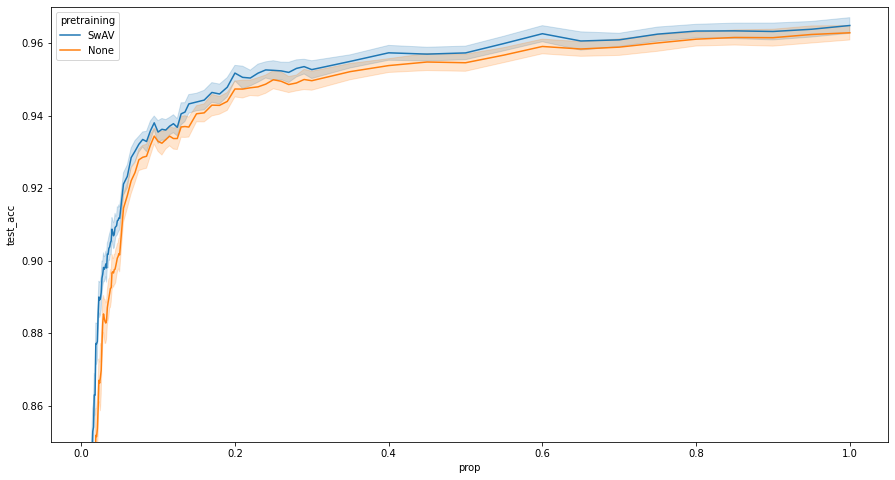

In [7]:
plt.figure(figsize=(15, 8))
plt.ylim(0.85, 0.97)
# plt.xlim(0.10, 1)
sns.lineplot(
    data=df_le,
    x="prop",
    y="test_acc",
    hue="pretraining",
    ci="sd",
)

In [8]:
df_barplot = df_best_lr.copy(deep=True)
df_barplot["diff"] = df_barplot["test_acc"].diff()
df_barplot = df_barplot.loc[
    df_barplot["pretraining"] == "SwAV"]

<AxesSubplot:xlabel='prop', ylabel='diff'>

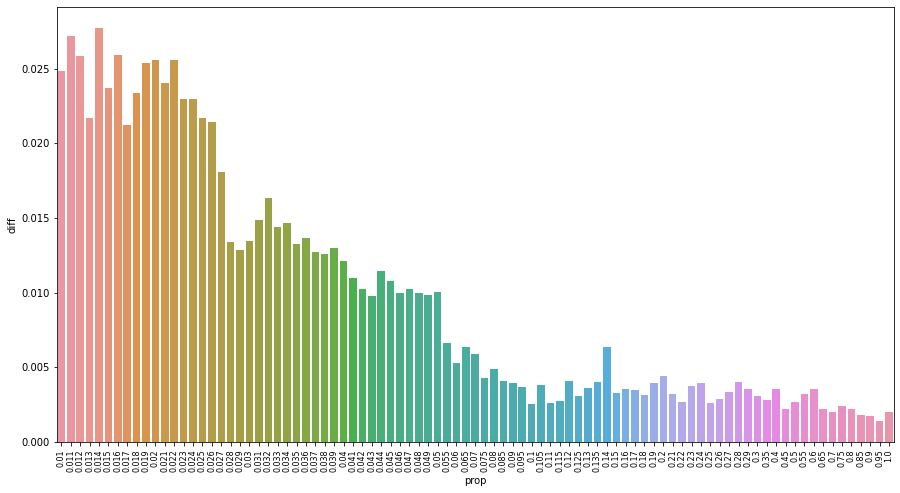

In [9]:
plt.figure(figsize=(15, 8))
plt.xticks(rotation=90, fontsize=8)
sns.barplot(x="prop", y="diff", data=df_barplot)

In [12]:
import scipy
df_ttest = pd.DataFrame(columns=["prop", "pvalue"])

for prop in sorted(list(df_le.prop.value_counts().index)):
    # SwAV
    best_lr_SwAV = df_best_lr.loc[
        (df_best_lr["prop"] == prop) & (df_best_lr["pretraining"] == "SwAV")
    ]["lr_init"].values[0]
    vals_SwAV = df_le.loc[
        (df_le["prop"] == prop)
        & (df_le["pretraining"] == "SwAV")
        & (df_le["lr_init"] == best_lr_SwAV)
    ]["test_acc"].values

    # None
    best_lr_None = df_best_lr.loc[
        (df_best_lr["prop"] == prop) & (df_best_lr["pretraining"] == "None")
    ]["lr_init"].values[0]
    vals_None = df_le.loc[
        (df_le["prop"] == prop)
        & (df_le["pretraining"] == "None")
        & (df_le["lr_init"] == best_lr_None)
    ]["test_acc"].values

    pval = str(scipy.stats.ttest_ind(vals_SwAV, vals_None).pvalue)
    s = pd.Series([prop, round(float(pval), 10)], index=df_ttest.columns)
    df_ttest = df_ttest.append(s, ignore_index=True)


<AxesSubplot:xlabel='prop', ylabel='pvalue'>

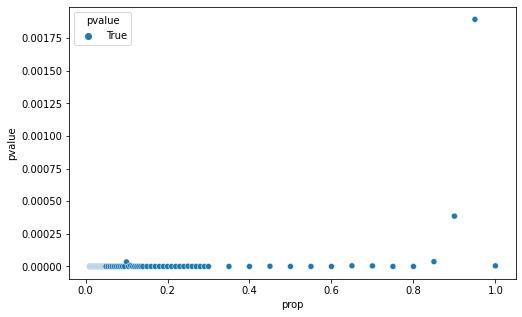

In [13]:
plt.figure(figsize=(8, 5))
# plt.xlim(0, 0.1)
# plt.ylim(0, 0.1)
sns.scatterplot(x=df_ttest["prop"], y=df_ttest["pvalue"], hue=(df_ttest["pvalue"] < 0.05))

In [16]:
print(df_ttest[30:50])

     prop        pvalue
30  0.040  0.000000e+00
31  0.041  0.000000e+00
32  0.042  0.000000e+00
33  0.043  0.000000e+00
34  0.044  0.000000e+00
35  0.045  0.000000e+00
36  0.046  0.000000e+00
37  0.047  0.000000e+00
38  0.048  0.000000e+00
39  0.049  0.000000e+00
40  0.050  0.000000e+00
41  0.055  0.000000e+00
42  0.060  0.000000e+00
43  0.065  0.000000e+00
44  0.070  0.000000e+00
45  0.075  0.000000e+00
46  0.080  0.000000e+00
47  0.085  2.000000e-09
48  0.090  2.000000e-10
49  0.095  0.000000e+00
